## Part 1

### Data Distribution is -

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from sklearn.datasets import make_spd_matrix
from scipy.stats import multivariate_normal
from sklearn.model_selection import KFold
from mpl_toolkits.mplot3d import Axes3D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import OneHotEncoder

In [2]:
def gaussian_first(size):
    mean = [0.4, 2, 3]
    cov = make_spd_matrix(n_dim=3)
    lab_one = np.ones(size)
    return mean, cov, np.random.multivariate_normal(mean, cov, size), lab_one.astype(int)

In [3]:
def gaussian_second(size):
    mean = [-0.4, -2, 2.4]
    cov = make_spd_matrix(n_dim=3)
    lab_two = np.zeros(size) + 2
    return mean, cov, np.random.multivariate_normal(mean, cov, size), lab_two.astype(int)

In [4]:
def gaussian_third(size):
    mean = [1, -1.4, -2.4]
    cov = make_spd_matrix(n_dim=3)
    lab_three = np.zeros(size) + 3
    return mean, cov, np.random.multivariate_normal(mean, cov, size), lab_three.astype(int)

In [5]:
def gaussian_forth(size):
    mean = [-1, 1.4, -3]
    cov = make_spd_matrix(n_dim=3)
    lab_four = np.zeros(size) + 4
    return mean, cov, np.random.multivariate_normal(mean, cov, size), lab_four.astype(int)

In [6]:
priors=[.2,.3,.4,.1]

In [9]:
# Generating the dataset
dataset_dist = np.random.uniform(0, 1, 1000)
mean1, cov1, data1, lab_one = gaussian_first(len(dataset_dist[dataset_dist <= priors[0]]))
mean2, cov2, data2, lab_two = gaussian_second(len([x for x in dataset_dist if x > priors[0] and x <= (priors[0]+priors[1])]))
mean3, cov3, data3, lab_three = gaussian_third(len([x for x in dataset_dist if x > (priors[0]+priors[1]) and x <= (priors[0]+priors[1]+priors[2])]))
mean4, cov4, data4, lab_four = gaussian_forth(len([x for x in dataset_dist if x > (priors[0]+priors[1]+priors[2])]))
dataset = np.vstack([data1, data2, data3, data4])

In [10]:
label = np.array(lab_one.tolist() + lab_two.tolist() + lab_three.tolist() + lab_four.tolist())

In [12]:
label.shape

(1000,)

In [16]:
print ("Class 1 shape :",data1.shape)
print ("Class 2 shape :",data2.shape)
print ("Class 3 shape :",data3.shape)
print ("Class 4 shape :",data4.shape)
print ("Shape of labels :",label.shape)

Class 1 shape : (209, 3)
Class 2 shape : (314, 3)
Class 3 shape : (381, 3)
Class 4 shape : (96, 3)
Shape of labels : (1000,)


<IPython.core.display.Javascript object>


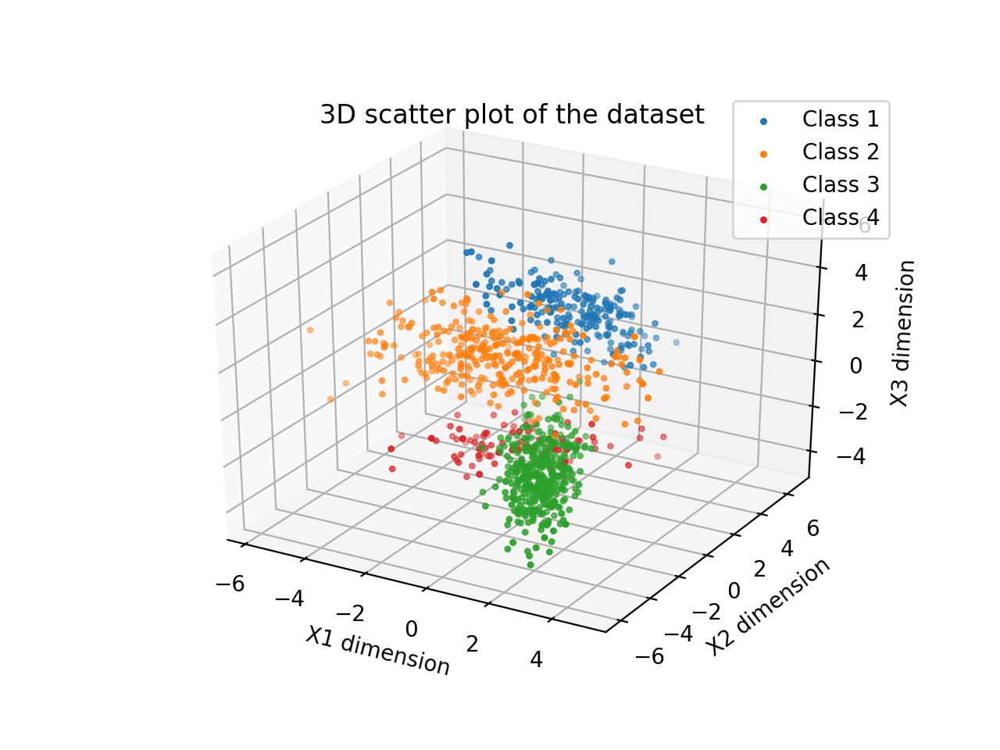

Text(0.5, 0.92, '3D scatter plot of the dataset')

In [17]:
%matplotlib notebook
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data1[:, 0], data1[:, 1], data1[:, 2], label='Class 1', s=5)
ax.scatter(data2[:, 0], data2[:, 1], data2[:, 2], label='Class 2', s=5)
ax.scatter(data3[:, 0], data3[:, 1], data3[:, 2], label='Class 3', s=5)
ax.scatter(data4[:, 0], data4[:, 1], data4[:, 2], label='Class 4', s=5)
ax.legend()
ax.set_xlabel('X1 dimension')
ax.set_ylabel('X2 dimension')
ax.set_zlabel('X3 dimension')
ax.set_title('3D scatter plot of the dataset')

## Part 2

In [10]:
from scipy.stats import multivariate_normal

#### Below I have implemented my MAP classifier.
#### The MAP classifier aims on achieving the minimum probability of error by incorporating the 0-1 loss.
#### The max of the product of the likelihood that a data point is part of a specific gaussian distribution and the prior of that gaussian distribution gives us the most likely class a data point originated from and helps us classify data points into their predicted class labels.
#### This is how the MAP classifier achieves minimum probability of error.

In [11]:
def return_map_classifier_label(data):
    map1 = p1*multivariate_normal(mean1, cov1).pdf(data)
    map2 = p2*multivariate_normal(mean2, cov2).pdf(data)
    map3 = p3*multivariate_normal(mean3, cov3).pdf(data)
    map4 = p4*multivariate_normal(mean4, cov4).pdf(data)
    return np.argmax([map1, map2, map3, map4])+1

In [12]:
correct_data1 = []
incorrect_data1 = []
correct_data2 = []
incorrect_data2 = []
correct_data3 = []
incorrect_data3 = []
correct_data4 = []
incorrect_data4 = []
correct_data = [correct_data1, correct_data2, correct_data3, correct_data4]
incorrect_data = [incorrect_data1, incorrect_data2, incorrect_data3, incorrect_data4]

In [13]:
for i, data_part in enumerate([data1, data2, data3, data4]):
    for data in data_part:
        if return_map_classifier_label(data) == (i+1):
            correct_data[i].append(data)
        else:
            incorrect_data[return_map_classifier_label(data)-1].append(data)

<IPython.core.display.Javascript object>


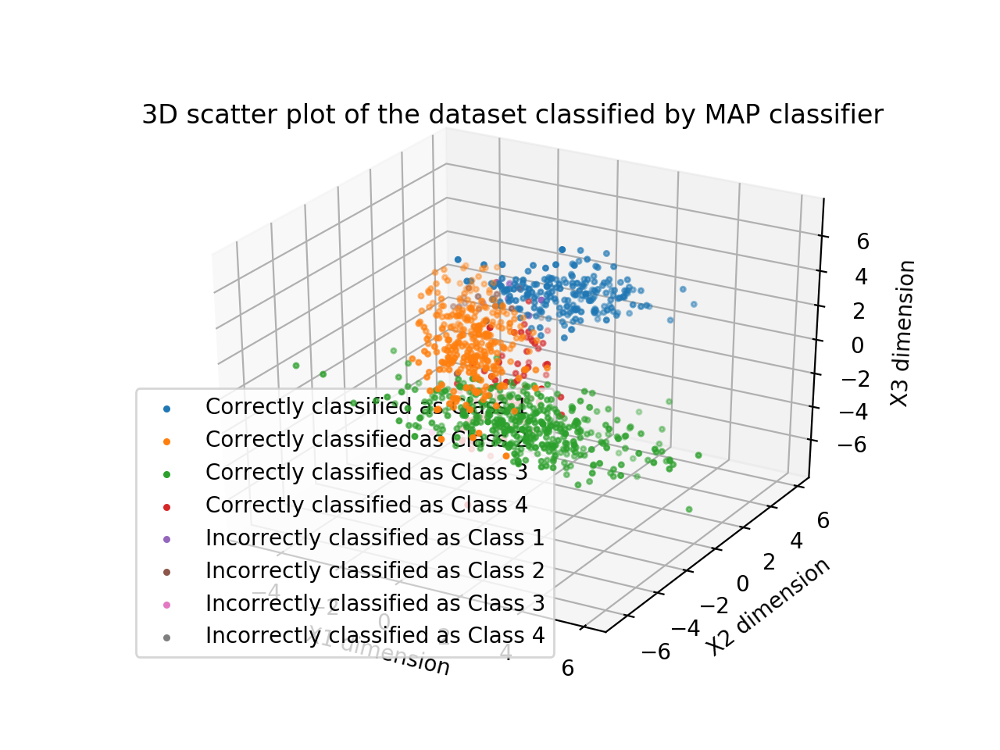

Text(0.5, 0.92, '3D scatter plot of the dataset classified by MAP classifier')

In [14]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(np.array(correct_data1)[:, 0], np.array(correct_data1)[:, 1], np.array(correct_data1)[:, 2], label='Correctly classified as Class 1', s=5)
ax.scatter(np.array(correct_data2)[:, 0], np.array(correct_data2)[:, 1], np.array(correct_data2)[:, 2], label='Correctly classified as Class 2', s=5)
ax.scatter(np.array(correct_data3)[:, 0], np.array(correct_data3)[:, 1], np.array(correct_data3)[:, 2], label='Correctly classified as Class 3', s=5)
ax.scatter(np.array(correct_data4)[:, 0], np.array(correct_data4)[:, 1], np.array(correct_data4)[:, 2], label='Correctly classified as Class 4', s=5)
try:
    ax.scatter(np.array(incorrect_data1)[:, 0], np.array(incorrect_data1)[:, 1], np.array(incorrect_data1)[:, 2], label='Incorrectly classified as Class 1', s=5)
except:
    pass
try:
    ax.scatter(np.array(incorrect_data2)[:, 0], np.array(incorrect_data2)[:, 1], np.array(incorrect_data2)[:, 2], label='Incorrectly classified as Class 2', s=5)
except:
    pass
try:
    ax.scatter(np.array(incorrect_data3)[:, 0], np.array(incorrect_data3)[:, 1], np.array(incorrect_data3)[:, 2], label='Incorrectly classified as Class 3', s=5)
except:
    pass
try:
    ax.scatter(np.array(incorrect_data4)[:, 0], np.array(incorrect_data4)[:, 1], np.array(incorrect_data4)[:, 2], label='Incorrectly classified as Class 4', s=5)
except:
    pass
ax.legend()
ax.set_xlabel('X1 dimension')
ax.set_ylabel('X2 dimension')
ax.set_zlabel('X3 dimension')
ax.set_title('3D scatter plot of the dataset classified by MAP classifier')

In [39]:
misclass_num = len(incorrect_data1)+len(incorrect_data2)+len(incorrect_data3)+len(incorrect_data4)
print('Number of misclassified samples are {}'.format(misclass_num))
print('Probability of error achieved is {}'.format(misclass_num/1000))

Number of misclassified samples are 69
Probability of error achieved is 0.069


Testing with 10000 generated samples for testing

In [15]:
# Generating the dataset
test_dataset_dist = np.random.uniform(0, 1, 10000)
test_mean1, test_cov1, test_data1, test_lab_one = gaussian_first(len(test_dataset_dist[test_dataset_dist <= p1]))
test_mean2, test_cov2, test_data2, test_lab_two = gaussian_second(len([x for x in test_dataset_dist if x > p1 and x <= (p1+p2)]))
test_mean3, test_cov3, test_data3, test_lab_three = gaussian_third(len([x for x in test_dataset_dist if x > (p1+p2) and x <= (p1+p2+p3)]))
test_mean4, test_cov4, test_data4, test_lab_four = gaussian_forth(len([x for x in test_dataset_dist if x > (p1+p2+p3)]))
test_dataset = np.vstack([test_data1, test_data2, test_data3, test_data4])

In [16]:
test_label = np.array(test_lab_one.tolist() + test_lab_two.tolist() + test_lab_three.tolist() + test_lab_four.tolist())
# for data in test_dataset_dist:
#     if data <= p1:
#         test_label.append(1)
#     if data > p1 and data <= (p1+p2):
#         test_label.append(2)
#     if data > (p1+p2) and data <= (p1+p2+p3):
#         test_label.append(3)
#     if data > (p1+p2+p3):
#         test_label.append(4)

<IPython.core.display.Javascript object>


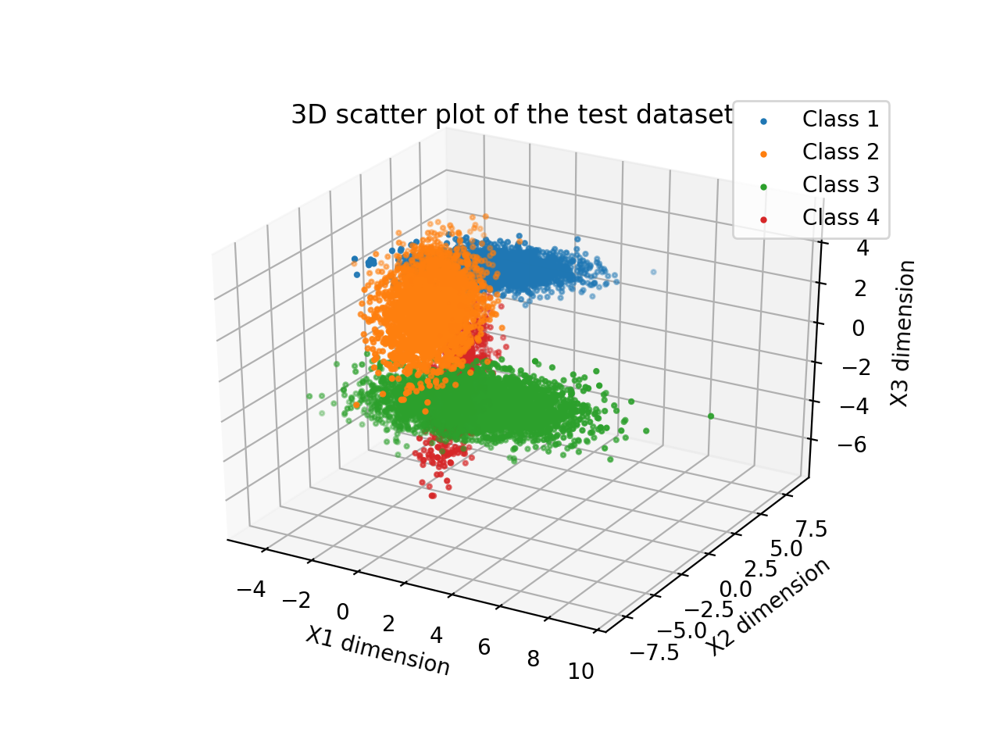

Text(0.5, 0.92, '3D scatter plot of the test dataset')

In [19]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(test_data1[:, 0], test_data1[:, 1], test_data1[:, 2], label='Class 1', s=4)
ax.scatter(test_data2[:, 0], test_data2[:, 1], test_data2[:, 2], label='Class 2', s=4)
ax.scatter(test_data3[:, 0], test_data3[:, 1], test_data3[:, 2], label='Class 3', s=4)
ax.scatter(test_data4[:, 0], test_data4[:, 1], test_data4[:, 2], label='Class 4', s=4)
ax.legend()
ax.set_xlabel('X1 dimension')
ax.set_ylabel('X2 dimension')
ax.set_zlabel('X3 dimension')
ax.set_title('3D scatter plot of the test dataset')

In [21]:
%matplotlib notebook
def visualize_classified_data(data1, data2, data3, data4, title_str='3D scatter plot of the test dataset classified by MAP classifier'):
    correct_data1 = []
    incorrect_data1 = []
    correct_data2 = []
    incorrect_data2 = []
    correct_data3 = []
    incorrect_data3 = []
    correct_data4 = []
    incorrect_data4 = []
    correct_data = [correct_data1, correct_data2, correct_data3, correct_data4]
    incorrect_data = [incorrect_data1, incorrect_data2, incorrect_data3, incorrect_data4]
    for i, data_part in enumerate([data1, data2, data3, data4]):
        for data in data_part:
            if return_map_classifier_label(data) == (i+1):
                correct_data[i].append(data)
            else:
                incorrect_data[return_map_classifier_label(data)-1].append(data)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(np.array(correct_data1)[:, 0], np.array(correct_data1)[:, 1], np.array(correct_data1)[:, 2], label='Correctly classified as Class 1', s=5)
    ax.scatter(np.array(correct_data2)[:, 0], np.array(correct_data2)[:, 1], np.array(correct_data2)[:, 2], label='Correctly classified as Class 2', s=5)
    ax.scatter(np.array(correct_data3)[:, 0], np.array(correct_data3)[:, 1], np.array(correct_data3)[:, 2], label='Correctly classified as Class 3', s=5)
    ax.scatter(np.array(correct_data4)[:, 0], np.array(correct_data4)[:, 1], np.array(correct_data4)[:, 2], label='Correctly classified as Class 4', s=5)
    try:
        ax.scatter(np.array(incorrect_data1)[:, 0], np.array(incorrect_data1)[:, 1], np.array(incorrect_data1)[:, 2], label='Incorrectly classified as Class 1', s=5)
    except:
        pass
    try:
        ax.scatter(np.array(incorrect_data2)[:, 0], np.array(incorrect_data2)[:, 1], np.array(incorrect_data2)[:, 2], label='Incorrectly classified as Class 2', s=5)
    except:
        pass
    try:
        ax.scatter(np.array(incorrect_data3)[:, 0], np.array(incorrect_data3)[:, 1], np.array(incorrect_data3)[:, 2], label='Incorrectly classified as Class 3', s=5)
    except:
        pass
    try:
        ax.scatter(np.array(incorrect_data4)[:, 0], np.array(incorrect_data4)[:, 1], np.array(incorrect_data4)[:, 2], label='Incorrectly classified as Class 4', s=5)
    except:
        pass
    ax.legend()
    ax.set_xlabel('X1 dimension')
    ax.set_ylabel('X2 dimension')
    ax.set_zlabel('X3 dimension')
    ax.set_title(title_str)
    misclass_num = len(incorrect_data1)+len(incorrect_data2)+len(incorrect_data3)+len(incorrect_data4)
    return misclass_num

<IPython.core.display.Javascript object>


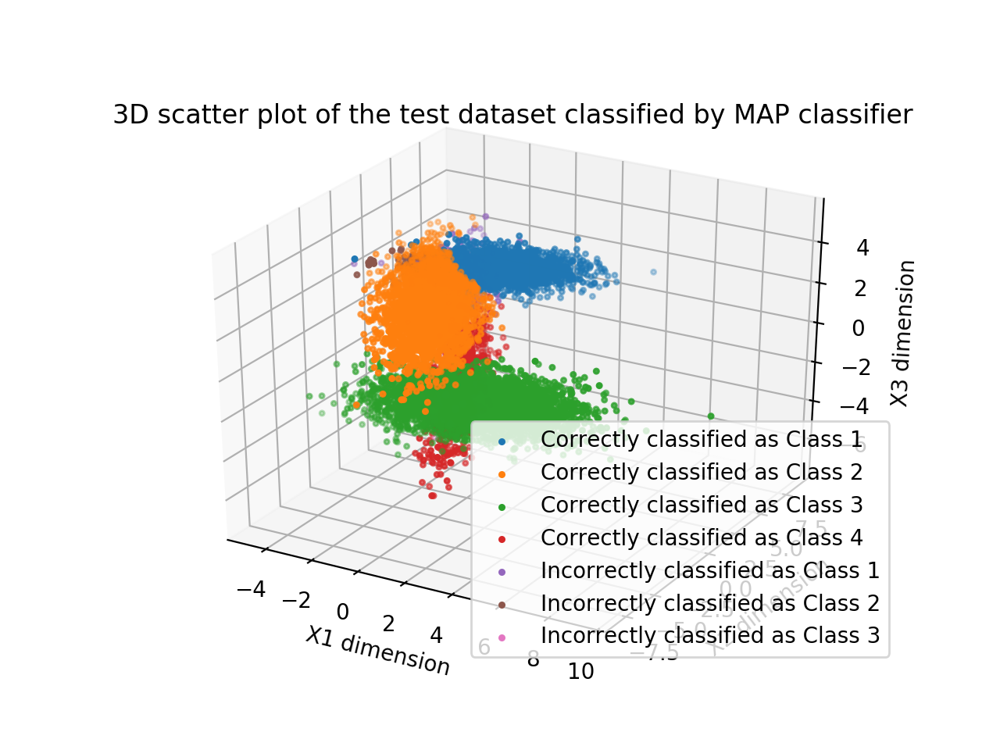

In [22]:
misclassnum = visualize_classified_data(test_data1, test_data2, test_data3, test_data4)

In [56]:
print('Number of misclassified samples are {}'.format(misclassnum))
print('Probability of error achieved is {}'.format(misclassnum/10000))

Number of misclassified samples are 1428
Probability of error achieved is 0.1428


In [23]:
def return_map_classifier_proba(data):
    map1 = p1*multivariate_normal(mean1, cov1).pdf(data)
    map2 = p2*multivariate_normal(mean2, cov2).pdf(data)
    map3 = p3*multivariate_normal(mean3, cov3).pdf(data)
    map4 = p4*multivariate_normal(mean4, cov4).pdf(data)
    return [map1, map2, map3, map4]

In [24]:
def return_mle_classifier_proba(data):
    mle1 = multivariate_normal(mean1, cov1).pdf(data)
    mle2 = multivariate_normal(mean2, cov2).pdf(data)
    mle3 = multivariate_normal(mean3, cov3).pdf(data)
    mle4 = multivariate_normal(mean4, cov4).pdf(data)
    return [mle1, mle2, mle3, mle4]

### Part 3

In [3]:
import numpy as np

In [4]:
%matplotlib notebook
def generate_dataset(size):
    # Generating the dataset
    dataset_dist = np.random.uniform(0, 1, size)
    mean1, cov1, data1, lab1 = gaussian_first(len(dataset_dist[dataset_dist <= p1]))
    mean2, cov2, data2, lab2 = gaussian_second(len([x for x in dataset_dist if x > p1 and x <= (p1+p2)]))
    mean3, cov3, data3, lab3 = gaussian_third(len([x for x in dataset_dist if x > (p1+p2) and x <= (p1+p2+p3)]))
    mean4, cov4, data4, lab4 = gaussian_forth(len([x for x in dataset_dist if x > (p1+p2+p3)]))
    dataset = np.vstack([data1, data2, data3, data4])
    label = np.array(lab1.tolist() + lab2.tolist() + lab3.tolist() + lab4.tolist())
    mle_prob = []
    for data in dataset_dist:
        mle1 = multivariate_normal(mean1, cov1).pdf(data)
        mle2 = multivariate_normal(mean2, cov2).pdf(data)
        mle3 = multivariate_normal(mean3, cov3).pdf(data)
        mle4 = multivariate_normal(mean4, cov4).pdf(data)
        mle_prob.append([mle1, mle2, mle3, mle4])
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(data1[:, 0], data1[:, 1], data1[:, 2], label='Class 1', s=5)
    ax.scatter(data2[:, 0], data2[:, 1], data2[:, 2], label='Class 2', s=5)
    ax.scatter(data3[:, 0], data3[:, 1], data3[:, 2], label='Class 3', s=5)
    ax.scatter(data4[:, 0], data4[:, 1], data4[:, 2], label='Class 4', s=5)
    ax.legend()
    ax.set_xlabel('X1 dimension')
    ax.set_ylabel('X2 dimension')
    ax.set_zlabel('X3 dimension')
    ax.set_title('3D scatter plot of the dataset with {} samples'.format(size))
    return dataset, label, mle_prob

### Training on 100 samples

In [16]:
X, Y, _ = generate_dataset(100)

NameError: name 'p1' is not defined

In [42]:
print dataset_hun.shape

(100, 3)

In [30]:
import pandas
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
import pandas
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline

Using TensorFlow backend.


In [33]:
def k_fold_keras(dataset, labels, hidd_layer_param_list, epochs=1000):
    kf = KFold(n_splits=10)
    param_prob_error = []
    for param in hidd_layer_param_list:
        fold_prob_error = []
        for train_index, test_index in kf.split(dataset):
            onehotencoder = OneHotEncoder(categories='auto')
            one_hot_label = onehotencoder.fit_transform(labels[:, None]).toarray()
             
#             print("TRAIN:", train_index, "TEST:", test_index)
            X_train, X_test = dataset[train_index], dataset[test_index]
            y_train, y_test = one_hot_label[train_index], one_hot_label[test_index]
            label_train, label_test = labels[train_index], labels[test_index]
            
            
            # Training the Multilayer Perceptron
            mlp_model = Sequential()
            mlp_model.add(Dense(param, input_dim=3, activation='sigmoid'))
            mlp_model.add(Dense(4, activation='softmax'))
            mlp_model.compile(loss= 'categorical_crossentropy' , optimizer= 'SGD' , metrics=[ 'accuracy' ])
            mlp_model.fit(X_train, y_train, epochs=epochs, verbose=1, batch_size=10000)
            
            #Validating the weights on the test set by using our objective function
            y_pred = mlp_model.predict_proba(X_test)
            misclass_count = len(np.nonzero((np.argmax(y_pred, axis=1).reshape((-1,)) + 1) != label_test)[0])
            
            print('The number of misclassified samples are {}'.format(misclass_count))
            print('The probability of error is {}'.format(misclass_count/len(label_test)))
            
            fold_prob_error.append(misclass_count/len(label))
        param_prob_error.append(sum(fold_prob_error))
    print('The best parameter for training this dataset is {}'.format(hidd_layer_param_list[np.argmin(param_prob_error)]))
    return hidd_layer_param_list[np.argmin(param_prob_error)], param_prob_error

In [34]:
best_param, param_prob_error = k_fold_keras(dataset_hun, label_hun, [4, 24, 30, 38])

Epoch 1/1000
90/90 [==============================] - 0s 452us/step - loss: 1.5059 - accuracy: 0.1222
Epoch 2/1000
90/90 [==============================] - 0s 13us/step - loss: 1.4847 - accuracy: 0.1222
Epoch 3/1000
90/90 [==============================] - 0s 12us/step - loss: 1.4643 - accuracy: 0.1222
Epoch 4/1000
90/90 [==============================] - 0s 11us/step - loss: 1.4446 - accuracy: 0.1333
Epoch 5/1000
90/90 [==============================] - 0s 10us/step - loss: 1.4257 - accuracy: 0.1556
Epoch 6/1000
90/90 [==============================] - 0s 10us/step - loss: 1.4074 - accuracy: 0.1667
Epoch 7/1000
90/90 [==============================] - 0s 11us/step - loss: 1.3898 - accuracy: 0.1556
Epoch 8/1000
90/90 [==============================] - 0s 10us/step - loss: 1.3728 - accuracy: 0.1778
Epoch 9/1000
90/90 [==============================] - 0s 10us/step - loss: 1.3564 - accuracy: 0.2333
Epoch 10/1000
90/90 [==============================] - 0s 12us/step - loss: 1.3406 - accur

Epoch 82/1000
90/90 [==============================] - 0s 11us/step - loss: 0.8629 - accuracy: 0.8222
Epoch 83/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8599 - accuracy: 0.8222
Epoch 84/1000
90/90 [==============================] - 0s 10us/step - loss: 0.8570 - accuracy: 0.8222
Epoch 85/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8542 - accuracy: 0.8222
Epoch 86/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8513 - accuracy: 0.8222
Epoch 87/1000
90/90 [==============================] - 0s 11us/step - loss: 0.8485 - accuracy: 0.8222
Epoch 88/1000
90/90 [==============================] - 0s 11us/step - loss: 0.8458 - accuracy: 0.8222
Epoch 89/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8430 - accuracy: 0.8222
Epoch 90/1000
90/90 [==============================] - 0s 11us/step - loss: 0.8403 - accuracy: 0.8222
Epoch 91/1000
90/90 [==============================] - 0s 11us/step - loss: 0.8377

Epoch 162/1000
90/90 [==============================] - 0s 18us/step - loss: 0.7008 - accuracy: 0.8222
Epoch 163/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6993 - accuracy: 0.8222
Epoch 164/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6979 - accuracy: 0.8222
Epoch 165/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6965 - accuracy: 0.8222
Epoch 166/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6951 - accuracy: 0.8222
Epoch 167/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6937 - accuracy: 0.8222
Epoch 168/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6923 - accuracy: 0.8222
Epoch 169/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6909 - accuracy: 0.8222
Epoch 170/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6896 - accuracy: 0.8222
Epoch 171/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 242/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6092 - accuracy: 0.8333
Epoch 243/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6083 - accuracy: 0.8333
Epoch 244/1000
90/90 [==============================] - 0s 22us/step - loss: 0.6074 - accuracy: 0.8333
Epoch 245/1000
90/90 [==============================] - 0s 10us/step - loss: 0.6065 - accuracy: 0.8333
Epoch 246/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6056 - accuracy: 0.8333
Epoch 247/1000
90/90 [==============================] - 0s 23us/step - loss: 0.6047 - accuracy: 0.8333
Epoch 248/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6038 - accuracy: 0.8333
Epoch 249/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6029 - accuracy: 0.8333
Epoch 250/1000
90/90 [==============================] - 0s 11us/step - loss: 0.6020 - accuracy: 0.8333
Epoch 251/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 322/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5470 - accuracy: 0.8444
Epoch 323/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5464 - accuracy: 0.8444
Epoch 324/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5457 - accuracy: 0.8444
Epoch 325/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5451 - accuracy: 0.8444
Epoch 326/1000
90/90 [==============================] - 0s 17us/step - loss: 0.5444 - accuracy: 0.8444
Epoch 327/1000
90/90 [==============================] - 0s 23us/step - loss: 0.5438 - accuracy: 0.8444
Epoch 328/1000
90/90 [==============================] - 0s 18us/step - loss: 0.5431 - accuracy: 0.8444
Epoch 329/1000
90/90 [==============================] - 0s 29us/step - loss: 0.5425 - accuracy: 0.8556
Epoch 330/1000
90/90 [==============================] - 0s 22us/step - loss: 0.5418 - accuracy: 0.8556
Epoch 331/1000
90/90 [==============================] - 0s 28us/step - lo

Epoch 402/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5008 - accuracy: 0.8667
Epoch 403/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5003 - accuracy: 0.8667
Epoch 404/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4998 - accuracy: 0.8667
Epoch 405/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4993 - accuracy: 0.8667
Epoch 406/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4988 - accuracy: 0.8667
Epoch 407/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4983 - accuracy: 0.8667
Epoch 408/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4978 - accuracy: 0.8667
Epoch 409/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4973 - accuracy: 0.8667
Epoch 410/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4968 - accuracy: 0.8667
Epoch 411/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 482/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4644 - accuracy: 0.8778
Epoch 483/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4640 - accuracy: 0.8778
Epoch 484/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4636 - accuracy: 0.8778
Epoch 485/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4632 - accuracy: 0.8778
Epoch 486/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4628 - accuracy: 0.8778
Epoch 487/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4624 - accuracy: 0.8778
Epoch 488/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4620 - accuracy: 0.8778
Epoch 489/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4616 - accuracy: 0.8778
Epoch 490/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4611 - accuracy: 0.8778
Epoch 491/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 562/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4346 - accuracy: 0.8778
Epoch 563/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4342 - accuracy: 0.8778
Epoch 564/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4339 - accuracy: 0.8778
Epoch 565/1000
90/90 [==============================] - 0s 18us/step - loss: 0.4336 - accuracy: 0.8778
Epoch 566/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4332 - accuracy: 0.8778
Epoch 567/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4329 - accuracy: 0.8778
Epoch 568/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4326 - accuracy: 0.8778
Epoch 569/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4322 - accuracy: 0.8778
Epoch 570/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4319 - accuracy: 0.8778
Epoch 571/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 642/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4095 - accuracy: 0.8778
Epoch 643/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4092 - accuracy: 0.8778
Epoch 644/1000
90/90 [==============================] - 0s 33us/step - loss: 0.4089 - accuracy: 0.8778
Epoch 645/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4086 - accuracy: 0.8778
Epoch 646/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4083 - accuracy: 0.8778
Epoch 647/1000
90/90 [==============================] - 0s 22us/step - loss: 0.4080 - accuracy: 0.8778
Epoch 648/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4078 - accuracy: 0.8778
Epoch 649/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4075 - accuracy: 0.8778
Epoch 650/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4072 - accuracy: 0.8778
Epoch 651/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 722/1000
90/90 [==============================] - 0s 20us/step - loss: 0.3879 - accuracy: 0.8889
Epoch 723/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3876 - accuracy: 0.8889
Epoch 724/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3874 - accuracy: 0.8889
Epoch 725/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3871 - accuracy: 0.8889
Epoch 726/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3869 - accuracy: 0.8889
Epoch 727/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3866 - accuracy: 0.8889
Epoch 728/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3864 - accuracy: 0.8889
Epoch 729/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3861 - accuracy: 0.8889
Epoch 730/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3859 - accuracy: 0.8889
Epoch 731/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 802/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3690 - accuracy: 0.8889
Epoch 803/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3688 - accuracy: 0.8889
Epoch 804/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3685 - accuracy: 0.8889
Epoch 805/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3683 - accuracy: 0.8889
Epoch 806/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3681 - accuracy: 0.8889
Epoch 807/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3679 - accuracy: 0.8889
Epoch 808/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3677 - accuracy: 0.8889
Epoch 809/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3674 - accuracy: 0.8889
Epoch 810/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3672 - accuracy: 0.8889
Epoch 811/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 882/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3522 - accuracy: 0.8889
Epoch 883/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3520 - accuracy: 0.8889
Epoch 884/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3518 - accuracy: 0.8889
Epoch 885/1000
90/90 [==============================] - 0s 19us/step - loss: 0.3516 - accuracy: 0.8889
Epoch 886/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3514 - accuracy: 0.8889
Epoch 887/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3512 - accuracy: 0.8889
Epoch 888/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3510 - accuracy: 0.8889
Epoch 889/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3508 - accuracy: 0.8889
Epoch 890/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3506 - accuracy: 0.8889
Epoch 891/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 962/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3372 - accuracy: 0.8889
Epoch 963/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3370 - accuracy: 0.8889
Epoch 964/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3368 - accuracy: 0.8889
Epoch 965/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3366 - accuracy: 0.8889
Epoch 966/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3365 - accuracy: 0.8889
Epoch 967/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3363 - accuracy: 0.8889
Epoch 968/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3361 - accuracy: 0.8889
Epoch 969/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3359 - accuracy: 0.8889
Epoch 970/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3358 - accuracy: 0.8889
Epoch 971/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 42/1000
90/90 [==============================] - 0s 12us/step - loss: 0.9540 - accuracy: 0.8222
Epoch 43/1000
90/90 [==============================] - 0s 11us/step - loss: 0.9499 - accuracy: 0.8222
Epoch 44/1000
90/90 [==============================] - 0s 14us/step - loss: 0.9459 - accuracy: 0.8222
Epoch 45/1000
90/90 [==============================] - 0s 13us/step - loss: 0.9420 - accuracy: 0.8222
Epoch 46/1000
90/90 [==============================] - 0s 11us/step - loss: 0.9381 - accuracy: 0.8222
Epoch 47/1000
90/90 [==============================] - 0s 17us/step - loss: 0.9343 - accuracy: 0.8222
Epoch 48/1000
90/90 [==============================] - 0s 11us/step - loss: 0.9305 - accuracy: 0.8222
Epoch 49/1000
90/90 [==============================] - 0s 13us/step - loss: 0.9268 - accuracy: 0.8222
Epoch 50/1000
90/90 [==============================] - 0s 13us/step - loss: 0.9231 - accuracy: 0.8222
Epoch 51/1000
90/90 [==============================] - 0s 11us/step - loss: 0.9195

Epoch 122/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7448 - accuracy: 0.8222
Epoch 123/1000
90/90 [==============================] - 0s 11us/step - loss: 0.7430 - accuracy: 0.8222
Epoch 124/1000
90/90 [==============================] - 0s 19us/step - loss: 0.7413 - accuracy: 0.8222
Epoch 125/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7395 - accuracy: 0.8222
Epoch 126/1000
90/90 [==============================] - 0s 11us/step - loss: 0.7378 - accuracy: 0.8222
Epoch 127/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7361 - accuracy: 0.8222
Epoch 128/1000
90/90 [==============================] - 0s 15us/step - loss: 0.7344 - accuracy: 0.8222
Epoch 129/1000
90/90 [==============================] - 0s 11us/step - loss: 0.7327 - accuracy: 0.8222
Epoch 130/1000
90/90 [==============================] - 0s 11us/step - loss: 0.7310 - accuracy: 0.8222
Epoch 131/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 202/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6328 - accuracy: 0.8222
Epoch 203/1000
90/90 [==============================] - 0s 18us/step - loss: 0.6317 - accuracy: 0.8222
Epoch 204/1000
90/90 [==============================] - 0s 17us/step - loss: 0.6306 - accuracy: 0.8222
Epoch 205/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6295 - accuracy: 0.8222
Epoch 206/1000
90/90 [==============================] - 0s 17us/step - loss: 0.6284 - accuracy: 0.8222
Epoch 207/1000
90/90 [==============================] - 0s 20us/step - loss: 0.6273 - accuracy: 0.8222
Epoch 208/1000
90/90 [==============================] - 0s 18us/step - loss: 0.6262 - accuracy: 0.8222
Epoch 209/1000
90/90 [==============================] - 0s 17us/step - loss: 0.6252 - accuracy: 0.8222
Epoch 210/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6241 - accuracy: 0.8222
Epoch 211/1000
90/90 [==============================] - 0s 17us/step - lo

Epoch 282/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5582 - accuracy: 0.8222
Epoch 283/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5574 - accuracy: 0.8222
Epoch 284/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5566 - accuracy: 0.8222
Epoch 285/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5558 - accuracy: 0.8222
Epoch 286/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5551 - accuracy: 0.8222
Epoch 287/1000
90/90 [==============================] - 0s 19us/step - loss: 0.5543 - accuracy: 0.8222
Epoch 288/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5535 - accuracy: 0.8222
Epoch 289/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5528 - accuracy: 0.8222
Epoch 290/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5520 - accuracy: 0.8222
Epoch 291/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 362/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5040 - accuracy: 0.8444
Epoch 363/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5034 - accuracy: 0.8444
Epoch 364/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5028 - accuracy: 0.8444
Epoch 365/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5022 - accuracy: 0.8444
Epoch 366/1000
90/90 [==============================] - 0s 8us/step - loss: 0.5017 - accuracy: 0.8444
Epoch 367/1000
90/90 [==============================] - 0s 18us/step - loss: 0.5011 - accuracy: 0.8444
Epoch 368/1000
90/90 [==============================] - 0s 10us/step - loss: 0.5005 - accuracy: 0.8444
Epoch 369/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4999 - accuracy: 0.8444
Epoch 370/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4993 - accuracy: 0.8444
Epoch 371/1000
90/90 [==============================] - 0s 13us/step - los

Epoch 442/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4623 - accuracy: 0.8444
Epoch 443/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4618 - accuracy: 0.8444
Epoch 444/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4614 - accuracy: 0.8444
Epoch 445/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4609 - accuracy: 0.8444
Epoch 446/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4605 - accuracy: 0.8444
Epoch 447/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4600 - accuracy: 0.8444
Epoch 448/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4595 - accuracy: 0.8444
Epoch 449/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4591 - accuracy: 0.8444
Epoch 450/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4586 - accuracy: 0.8444
Epoch 451/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 522/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4288 - accuracy: 0.8778
Epoch 523/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4284 - accuracy: 0.8778
Epoch 524/1000
90/90 [==============================] - 0s 9us/step - loss: 0.4280 - accuracy: 0.8778
Epoch 525/1000
90/90 [==============================] - 0s 10us/step - loss: 0.4276 - accuracy: 0.8778
Epoch 526/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4273 - accuracy: 0.8778
Epoch 527/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4269 - accuracy: 0.8778
Epoch 528/1000
90/90 [==============================] - 0s 9us/step - loss: 0.4265 - accuracy: 0.8778
Epoch 529/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4261 - accuracy: 0.8778
Epoch 530/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4258 - accuracy: 0.8778
Epoch 531/1000
90/90 [==============================] - 0s 12us/step - loss

Epoch 602/1000
90/90 [==============================] - 0s 10us/step - loss: 0.4008 - accuracy: 0.8778
Epoch 603/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4005 - accuracy: 0.8778
Epoch 604/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4002 - accuracy: 0.8778
Epoch 605/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3999 - accuracy: 0.8778
Epoch 606/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3996 - accuracy: 0.8778
Epoch 607/1000
90/90 [==============================] - 0s 9us/step - loss: 0.3992 - accuracy: 0.8778
Epoch 608/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3989 - accuracy: 0.8778
Epoch 609/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3986 - accuracy: 0.8778
Epoch 610/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3983 - accuracy: 0.8778
Epoch 611/1000
90/90 [==============================] - 0s 12us/step - los

Epoch 682/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3770 - accuracy: 0.8778
Epoch 683/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3767 - accuracy: 0.8778
Epoch 684/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3764 - accuracy: 0.8778
Epoch 685/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3761 - accuracy: 0.8778
Epoch 686/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3758 - accuracy: 0.8778
Epoch 687/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3756 - accuracy: 0.8778
Epoch 688/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3753 - accuracy: 0.8778
Epoch 689/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3750 - accuracy: 0.8778
Epoch 690/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3747 - accuracy: 0.8778
Epoch 691/1000
90/90 [==============================] - 0s 9us/step - los

Epoch 762/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3561 - accuracy: 0.8889
Epoch 763/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3559 - accuracy: 0.8889
Epoch 764/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3556 - accuracy: 0.8889
Epoch 765/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3554 - accuracy: 0.8889
Epoch 766/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3551 - accuracy: 0.8889
Epoch 767/1000
90/90 [==============================] - 0s 18us/step - loss: 0.3549 - accuracy: 0.8889
Epoch 768/1000
90/90 [==============================] - 0s 26us/step - loss: 0.3547 - accuracy: 0.8889
Epoch 769/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3544 - accuracy: 0.8889
Epoch 770/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3542 - accuracy: 0.8889
Epoch 771/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 842/1000
90/90 [==============================] - 0s 27us/step - loss: 0.3377 - accuracy: 0.8889
Epoch 843/1000
90/90 [==============================] - 0s 22us/step - loss: 0.3374 - accuracy: 0.8889
Epoch 844/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3372 - accuracy: 0.8889
Epoch 845/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3370 - accuracy: 0.8889
Epoch 846/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3368 - accuracy: 0.8889
Epoch 847/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3366 - accuracy: 0.8889
Epoch 848/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3364 - accuracy: 0.8889
Epoch 849/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3361 - accuracy: 0.8889
Epoch 850/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3359 - accuracy: 0.8889
Epoch 851/1000
90/90 [==============================] - 0s 24us/step - lo

Epoch 922/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3211 - accuracy: 0.8889
Epoch 923/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3209 - accuracy: 0.8889
Epoch 924/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3207 - accuracy: 0.8889
Epoch 925/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3205 - accuracy: 0.8889
Epoch 926/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3203 - accuracy: 0.8889
Epoch 927/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3201 - accuracy: 0.8889
Epoch 928/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3199 - accuracy: 0.8889
Epoch 929/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3197 - accuracy: 0.8889
Epoch 930/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3196 - accuracy: 0.8889
Epoch 931/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 1/1000
90/90 [==============================] - 0s 651us/step - loss: 1.5950 - accuracy: 0.2000
Epoch 2/1000
90/90 [==============================] - 0s 14us/step - loss: 1.5797 - accuracy: 0.2000
Epoch 3/1000
90/90 [==============================] - 0s 15us/step - loss: 1.5647 - accuracy: 0.2000
Epoch 4/1000
90/90 [==============================] - 0s 12us/step - loss: 1.5501 - accuracy: 0.2000
Epoch 5/1000
90/90 [==============================] - 0s 13us/step - loss: 1.5358 - accuracy: 0.2000
Epoch 6/1000
90/90 [==============================] - 0s 14us/step - loss: 1.5219 - accuracy: 0.2000
Epoch 7/1000
90/90 [==============================] - 0s 13us/step - loss: 1.5082 - accuracy: 0.2000
Epoch 8/1000
90/90 [==============================] - 0s 13us/step - loss: 1.4949 - accuracy: 0.2000
Epoch 9/1000
90/90 [==============================] - 0s 14us/step - loss: 1.4819 - accuracy: 0.2000
Epoch 10/1000
90/90 [==============================] - 0s 15us/step - loss: 1.4693 - accur

Epoch 82/1000
90/90 [==============================] - 0s 13us/step - loss: 1.0182 - accuracy: 0.7222
Epoch 83/1000
90/90 [==============================] - 0s 12us/step - loss: 1.0149 - accuracy: 0.7222
Epoch 84/1000
90/90 [==============================] - 0s 11us/step - loss: 1.0116 - accuracy: 0.7222
Epoch 85/1000
90/90 [==============================] - 0s 12us/step - loss: 1.0084 - accuracy: 0.7222
Epoch 86/1000
90/90 [==============================] - 0s 10us/step - loss: 1.0052 - accuracy: 0.7222
Epoch 87/1000
90/90 [==============================] - 0s 13us/step - loss: 1.0020 - accuracy: 0.7222
Epoch 88/1000
90/90 [==============================] - 0s 13us/step - loss: 0.9988 - accuracy: 0.7222
Epoch 89/1000
90/90 [==============================] - 0s 13us/step - loss: 0.9957 - accuracy: 0.7222
Epoch 90/1000
90/90 [==============================] - 0s 12us/step - loss: 0.9926 - accuracy: 0.7222
Epoch 91/1000
90/90 [==============================] - 0s 12us/step - loss: 0.9896

Epoch 162/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8196 - accuracy: 0.7222
Epoch 163/1000
90/90 [==============================] - 0s 16us/step - loss: 0.8177 - accuracy: 0.7222
Epoch 164/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8158 - accuracy: 0.7222
Epoch 165/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8139 - accuracy: 0.7222
Epoch 166/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8120 - accuracy: 0.7333
Epoch 167/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8102 - accuracy: 0.7333
Epoch 168/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8083 - accuracy: 0.7333
Epoch 169/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8065 - accuracy: 0.7333
Epoch 170/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8046 - accuracy: 0.7333
Epoch 171/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 242/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6950 - accuracy: 0.8333
Epoch 243/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6937 - accuracy: 0.8333
Epoch 244/1000
90/90 [==============================] - 0s 18us/step - loss: 0.6925 - accuracy: 0.8333
Epoch 245/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6912 - accuracy: 0.8333
Epoch 246/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6900 - accuracy: 0.8333
Epoch 247/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6887 - accuracy: 0.8333
Epoch 248/1000
90/90 [==============================] - 0s 19us/step - loss: 0.6875 - accuracy: 0.8333
Epoch 249/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6863 - accuracy: 0.8333
Epoch 250/1000
90/90 [==============================] - 0s 20us/step - loss: 0.6850 - accuracy: 0.8333
Epoch 251/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 322/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6097 - accuracy: 0.8556
Epoch 323/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6088 - accuracy: 0.8556
Epoch 324/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6079 - accuracy: 0.8556
Epoch 325/1000
90/90 [==============================] - 0s 17us/step - loss: 0.6070 - accuracy: 0.8556
Epoch 326/1000
90/90 [==============================] - 0s 20us/step - loss: 0.6061 - accuracy: 0.8556
Epoch 327/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6052 - accuracy: 0.8667
Epoch 328/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6043 - accuracy: 0.8667
Epoch 329/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6035 - accuracy: 0.8667
Epoch 330/1000
90/90 [==============================] - 0s 17us/step - loss: 0.6026 - accuracy: 0.8667
Epoch 331/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 402/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5477 - accuracy: 0.8778
Epoch 403/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5470 - accuracy: 0.8778
Epoch 404/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5463 - accuracy: 0.8778
Epoch 405/1000
90/90 [==============================] - 0s 18us/step - loss: 0.5457 - accuracy: 0.8778
Epoch 406/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5450 - accuracy: 0.8778
Epoch 407/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5443 - accuracy: 0.8778
Epoch 408/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5437 - accuracy: 0.8778
Epoch 409/1000
90/90 [==============================] - 0s 10us/step - loss: 0.5430 - accuracy: 0.8778
Epoch 410/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5424 - accuracy: 0.8778
Epoch 411/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 482/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5003 - accuracy: 0.9000
Epoch 483/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4998 - accuracy: 0.9000
Epoch 484/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4993 - accuracy: 0.9000
Epoch 485/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4988 - accuracy: 0.9000
Epoch 486/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4983 - accuracy: 0.9000
Epoch 487/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4978 - accuracy: 0.9000
Epoch 488/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4972 - accuracy: 0.9000
Epoch 489/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4967 - accuracy: 0.9000
Epoch 490/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4962 - accuracy: 0.9000
Epoch 491/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 562/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4627 - accuracy: 0.8889
Epoch 563/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4623 - accuracy: 0.8889
Epoch 564/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4619 - accuracy: 0.8889
Epoch 565/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4615 - accuracy: 0.8889
Epoch 566/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4611 - accuracy: 0.8889
Epoch 567/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4606 - accuracy: 0.8889
Epoch 568/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4602 - accuracy: 0.8889
Epoch 569/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4598 - accuracy: 0.8889
Epoch 570/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4594 - accuracy: 0.8889
Epoch 571/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 642/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4319 - accuracy: 0.8889
Epoch 643/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4315 - accuracy: 0.8889
Epoch 644/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4312 - accuracy: 0.8889
Epoch 645/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4308 - accuracy: 0.8889
Epoch 646/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4305 - accuracy: 0.8889
Epoch 647/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4301 - accuracy: 0.8889
Epoch 648/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4298 - accuracy: 0.8889
Epoch 649/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4294 - accuracy: 0.8889
Epoch 650/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4291 - accuracy: 0.8889
Epoch 651/1000
90/90 [==============================] - 0s 17us/step - lo

Epoch 722/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4059 - accuracy: 0.8778
Epoch 723/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4056 - accuracy: 0.8778
Epoch 724/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4053 - accuracy: 0.8778
Epoch 725/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4050 - accuracy: 0.8778
Epoch 726/1000
90/90 [==============================] - 0s 21us/step - loss: 0.4047 - accuracy: 0.8778
Epoch 727/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4044 - accuracy: 0.8778
Epoch 728/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4041 - accuracy: 0.8778
Epoch 729/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4038 - accuracy: 0.8778
Epoch 730/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4035 - accuracy: 0.8778
Epoch 731/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 802/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3836 - accuracy: 0.8778
Epoch 803/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3833 - accuracy: 0.8778
Epoch 804/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3830 - accuracy: 0.8778
Epoch 805/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3828 - accuracy: 0.8778
Epoch 806/1000
90/90 [==============================] - 0s 24us/step - loss: 0.3825 - accuracy: 0.8778
Epoch 807/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3823 - accuracy: 0.8778
Epoch 808/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3820 - accuracy: 0.8778
Epoch 809/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3818 - accuracy: 0.8778
Epoch 810/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3815 - accuracy: 0.8778
Epoch 811/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 882/1000
90/90 [==============================] - 0s 18us/step - loss: 0.3641 - accuracy: 0.8778
Epoch 883/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3638 - accuracy: 0.8778
Epoch 884/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3636 - accuracy: 0.8778
Epoch 885/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3634 - accuracy: 0.8778
Epoch 886/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3632 - accuracy: 0.8778
Epoch 887/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3629 - accuracy: 0.8778
Epoch 888/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3627 - accuracy: 0.8778
Epoch 889/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3625 - accuracy: 0.8778
Epoch 890/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3623 - accuracy: 0.8778
Epoch 891/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 962/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3468 - accuracy: 0.8778
Epoch 963/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3466 - accuracy: 0.8778
Epoch 964/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3464 - accuracy: 0.8778
Epoch 965/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3462 - accuracy: 0.8778
Epoch 966/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3460 - accuracy: 0.8778
Epoch 967/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3458 - accuracy: 0.8778
Epoch 968/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3456 - accuracy: 0.8778
Epoch 969/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3454 - accuracy: 0.8778
Epoch 970/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3452 - accuracy: 0.8778
Epoch 971/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 42/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1933 - accuracy: 0.7111
Epoch 43/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1867 - accuracy: 0.7111
Epoch 44/1000
90/90 [==============================] - 0s 13us/step - loss: 1.1803 - accuracy: 0.7111
Epoch 45/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1740 - accuracy: 0.7111
Epoch 46/1000
90/90 [==============================] - 0s 12us/step - loss: 1.1679 - accuracy: 0.7111
Epoch 47/1000
90/90 [==============================] - 0s 16us/step - loss: 1.1619 - accuracy: 0.7111
Epoch 48/1000
90/90 [==============================] - 0s 14us/step - loss: 1.1560 - accuracy: 0.7111
Epoch 49/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1502 - accuracy: 0.7111
Epoch 50/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1445 - accuracy: 0.7111
Epoch 51/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1390

90/90 [==============================] - 0s 14us/step - loss: 0.8863 - accuracy: 0.7778
Epoch 123/1000
90/90 [==============================] - 0s 16us/step - loss: 0.8838 - accuracy: 0.7778
Epoch 124/1000
90/90 [==============================] - 0s 22us/step - loss: 0.8814 - accuracy: 0.7889
Epoch 125/1000
90/90 [==============================] - 0s 23us/step - loss: 0.8789 - accuracy: 0.7889
Epoch 126/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8765 - accuracy: 0.7889
Epoch 127/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8740 - accuracy: 0.8000
Epoch 128/1000
90/90 [==============================] - 0s 13us/step - loss: 0.8716 - accuracy: 0.8000
Epoch 129/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8692 - accuracy: 0.8000
Epoch 130/1000
90/90 [==============================] - 0s 16us/step - loss: 0.8669 - accuracy: 0.8000
Epoch 131/1000
90/90 [==============================] - 0s 16us/step - loss: 0.8645 - ac

Epoch 202/1000
90/90 [==============================] - 0s 14us/step - loss: 0.7294 - accuracy: 0.8667
Epoch 203/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7278 - accuracy: 0.8667
Epoch 204/1000
90/90 [==============================] - 0s 15us/step - loss: 0.7263 - accuracy: 0.8667
Epoch 205/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7248 - accuracy: 0.8667
Epoch 206/1000
90/90 [==============================] - 0s 21us/step - loss: 0.7233 - accuracy: 0.8667
Epoch 207/1000
90/90 [==============================] - 0s 14us/step - loss: 0.7218 - accuracy: 0.8667
Epoch 208/1000
90/90 [==============================] - 0s 17us/step - loss: 0.7203 - accuracy: 0.8667
Epoch 209/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7188 - accuracy: 0.8667
Epoch 210/1000
90/90 [==============================] - 0s 11us/step - loss: 0.7173 - accuracy: 0.8667
Epoch 211/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 282/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6281 - accuracy: 0.9111
Epoch 283/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6270 - accuracy: 0.9111
Epoch 284/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6260 - accuracy: 0.9111
Epoch 285/1000
90/90 [==============================] - 0s 26us/step - loss: 0.6250 - accuracy: 0.9111
Epoch 286/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6239 - accuracy: 0.9111
Epoch 287/1000
90/90 [==============================] - 0s 20us/step - loss: 0.6229 - accuracy: 0.9111
Epoch 288/1000
90/90 [==============================] - 0s 21us/step - loss: 0.6219 - accuracy: 0.9111
Epoch 289/1000
90/90 [==============================] - 0s 18us/step - loss: 0.6209 - accuracy: 0.9111
Epoch 290/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6199 - accuracy: 0.9111
Epoch 291/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 362/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5574 - accuracy: 0.8889
Epoch 363/1000
90/90 [==============================] - 0s 19us/step - loss: 0.5566 - accuracy: 0.8889
Epoch 364/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5559 - accuracy: 0.8889
Epoch 365/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5551 - accuracy: 0.8889
Epoch 366/1000
90/90 [==============================] - 0s 21us/step - loss: 0.5544 - accuracy: 0.8889
Epoch 367/1000
90/90 [==============================] - 0s 22us/step - loss: 0.5536 - accuracy: 0.8889
Epoch 368/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5529 - accuracy: 0.8889
Epoch 369/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5522 - accuracy: 0.8889
Epoch 370/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5514 - accuracy: 0.8889
Epoch 371/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 442/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5050 - accuracy: 0.8889
Epoch 443/1000
90/90 [==============================] - 0s 16us/step - loss: 0.5044 - accuracy: 0.8889
Epoch 444/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5038 - accuracy: 0.8889
Epoch 445/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5033 - accuracy: 0.8889
Epoch 446/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5027 - accuracy: 0.8889
Epoch 447/1000
90/90 [==============================] - 0s 17us/step - loss: 0.5021 - accuracy: 0.8889
Epoch 448/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5016 - accuracy: 0.8889
Epoch 449/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5010 - accuracy: 0.8889
Epoch 450/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5004 - accuracy: 0.8889
Epoch 451/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 522/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4642 - accuracy: 0.8889
Epoch 523/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4637 - accuracy: 0.8889
Epoch 524/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4633 - accuracy: 0.8889
Epoch 525/1000
90/90 [==============================] - 0s 18us/step - loss: 0.4628 - accuracy: 0.8889
Epoch 526/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4624 - accuracy: 0.8889
Epoch 527/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4619 - accuracy: 0.8889
Epoch 528/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4615 - accuracy: 0.8889
Epoch 529/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4610 - accuracy: 0.8889
Epoch 530/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4606 - accuracy: 0.8889
Epoch 531/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 602/1000
90/90 [==============================] - 0s 21us/step - loss: 0.4312 - accuracy: 0.8889
Epoch 603/1000
90/90 [==============================] - 0s 44us/step - loss: 0.4308 - accuracy: 0.8889
Epoch 604/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4305 - accuracy: 0.8889
Epoch 605/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4301 - accuracy: 0.8889
Epoch 606/1000
90/90 [==============================] - 0s 23us/step - loss: 0.4297 - accuracy: 0.8889
Epoch 607/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4293 - accuracy: 0.8889
Epoch 608/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4290 - accuracy: 0.8889
Epoch 609/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4286 - accuracy: 0.8889
Epoch 610/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4282 - accuracy: 0.8889
Epoch 611/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 682/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4038 - accuracy: 0.8889
Epoch 683/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4034 - accuracy: 0.8889
Epoch 684/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4031 - accuracy: 0.8889
Epoch 685/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4028 - accuracy: 0.8889
Epoch 686/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4025 - accuracy: 0.8889
Epoch 687/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4022 - accuracy: 0.8889
Epoch 688/1000
90/90 [==============================] - 0s 23us/step - loss: 0.4019 - accuracy: 0.8889
Epoch 689/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4016 - accuracy: 0.8889
Epoch 690/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4013 - accuracy: 0.8889
Epoch 691/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 762/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3804 - accuracy: 0.8889
Epoch 763/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3801 - accuracy: 0.8889
Epoch 764/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3798 - accuracy: 0.8889
Epoch 765/1000
90/90 [==============================] - 0s 19us/step - loss: 0.3796 - accuracy: 0.8889
Epoch 766/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3793 - accuracy: 0.8889
Epoch 767/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3790 - accuracy: 0.8889
Epoch 768/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3788 - accuracy: 0.8889
Epoch 769/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3785 - accuracy: 0.8889
Epoch 770/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3782 - accuracy: 0.8889
Epoch 771/1000
90/90 [==============================] - 0s 10us/step - lo

Epoch 842/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3601 - accuracy: 0.8889
Epoch 843/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3599 - accuracy: 0.8889
Epoch 844/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3596 - accuracy: 0.8889
Epoch 845/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3594 - accuracy: 0.8889
Epoch 846/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3592 - accuracy: 0.8889
Epoch 847/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3589 - accuracy: 0.8889
Epoch 848/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3587 - accuracy: 0.8889
Epoch 849/1000
90/90 [==============================] - 0s 24us/step - loss: 0.3585 - accuracy: 0.8889
Epoch 850/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3582 - accuracy: 0.8889
Epoch 851/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 922/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3423 - accuracy: 0.8889
Epoch 923/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3421 - accuracy: 0.8889
Epoch 924/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3419 - accuracy: 0.8889
Epoch 925/1000
90/90 [==============================] - 0s 18us/step - loss: 0.3417 - accuracy: 0.8889
Epoch 926/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3414 - accuracy: 0.8889
Epoch 927/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3412 - accuracy: 0.8889
Epoch 928/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3410 - accuracy: 0.8889
Epoch 929/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3408 - accuracy: 0.8889
Epoch 930/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3406 - accuracy: 0.8889
Epoch 931/1000
90/90 [==============================] - 0s 21us/step - lo

Epoch 1/1000
90/90 [==============================] - 0s 495us/step - loss: 1.4967 - accuracy: 0.2333
Epoch 2/1000
90/90 [==============================] - 0s 11us/step - loss: 1.4765 - accuracy: 0.2333
Epoch 3/1000
90/90 [==============================] - 0s 12us/step - loss: 1.4569 - accuracy: 0.2333
Epoch 4/1000
90/90 [==============================] - 0s 11us/step - loss: 1.4378 - accuracy: 0.2333
Epoch 5/1000
90/90 [==============================] - 0s 11us/step - loss: 1.4192 - accuracy: 0.2333
Epoch 6/1000
90/90 [==============================] - 0s 12us/step - loss: 1.4012 - accuracy: 0.2333
Epoch 7/1000
90/90 [==============================] - 0s 11us/step - loss: 1.3838 - accuracy: 0.2333
Epoch 8/1000
90/90 [==============================] - 0s 14us/step - loss: 1.3668 - accuracy: 0.2333
Epoch 9/1000
90/90 [==============================] - 0s 13us/step - loss: 1.3504 - accuracy: 0.2333
Epoch 10/1000
90/90 [==============================] - 0s 13us/step - loss: 1.3344 - accur

Epoch 82/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8708 - accuracy: 0.8889
Epoch 83/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8683 - accuracy: 0.8889
Epoch 84/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8657 - accuracy: 0.8889
Epoch 85/1000
90/90 [==============================] - 0s 16us/step - loss: 0.8632 - accuracy: 0.8889
Epoch 86/1000
90/90 [==============================] - 0s 19us/step - loss: 0.8607 - accuracy: 0.8889
Epoch 87/1000
90/90 [==============================] - 0s 20us/step - loss: 0.8583 - accuracy: 0.8889
Epoch 88/1000
90/90 [==============================] - 0s 18us/step - loss: 0.8559 - accuracy: 0.8889
Epoch 89/1000
90/90 [==============================] - 0s 26us/step - loss: 0.8535 - accuracy: 0.8889
Epoch 90/1000
90/90 [==============================] - 0s 34us/step - loss: 0.8511 - accuracy: 0.8889
Epoch 91/1000
90/90 [==============================] - 0s 19us/step - loss: 0.8488

Epoch 162/1000
90/90 [==============================] - 0s 27us/step - loss: 0.7202 - accuracy: 0.9000
Epoch 163/1000
90/90 [==============================] - 0s 15us/step - loss: 0.7187 - accuracy: 0.9000
Epoch 164/1000
90/90 [==============================] - 0s 15us/step - loss: 0.7173 - accuracy: 0.9000
Epoch 165/1000
90/90 [==============================] - 0s 28us/step - loss: 0.7158 - accuracy: 0.9000
Epoch 166/1000
90/90 [==============================] - 0s 18us/step - loss: 0.7144 - accuracy: 0.9000
Epoch 167/1000
90/90 [==============================] - 0s 12us/step - loss: 0.7130 - accuracy: 0.9000
Epoch 168/1000
90/90 [==============================] - 0s 15us/step - loss: 0.7116 - accuracy: 0.9000
Epoch 169/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7102 - accuracy: 0.9000
Epoch 170/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7088 - accuracy: 0.9000
Epoch 171/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 242/1000
90/90 [==============================] - 0s 11us/step - loss: 0.6241 - accuracy: 0.9000
Epoch 243/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6231 - accuracy: 0.9000
Epoch 244/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6221 - accuracy: 0.9000
Epoch 245/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6211 - accuracy: 0.9000
Epoch 246/1000
90/90 [==============================] - 0s 19us/step - loss: 0.6201 - accuracy: 0.9000
Epoch 247/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6191 - accuracy: 0.9000
Epoch 248/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6182 - accuracy: 0.9000
Epoch 249/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6172 - accuracy: 0.9000
Epoch 250/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6162 - accuracy: 0.9000
Epoch 251/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 322/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5560 - accuracy: 0.9000
Epoch 323/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5553 - accuracy: 0.9000
Epoch 324/1000
90/90 [==============================] - 0s 17us/step - loss: 0.5546 - accuracy: 0.9000
Epoch 325/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5539 - accuracy: 0.9000
Epoch 326/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5531 - accuracy: 0.9000
Epoch 327/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5524 - accuracy: 0.9000
Epoch 328/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5517 - accuracy: 0.9000
Epoch 329/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5510 - accuracy: 0.9000
Epoch 330/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5503 - accuracy: 0.9000
Epoch 331/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 402/1000
90/90 [==============================] - 0s 16us/step - loss: 0.5050 - accuracy: 0.8889
Epoch 403/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5044 - accuracy: 0.8889
Epoch 404/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5039 - accuracy: 0.8889
Epoch 405/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5033 - accuracy: 0.8889
Epoch 406/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5028 - accuracy: 0.8889
Epoch 407/1000
90/90 [==============================] - 0s 18us/step - loss: 0.5022 - accuracy: 0.8889
Epoch 408/1000
90/90 [==============================] - 0s 19us/step - loss: 0.5017 - accuracy: 0.8889
Epoch 409/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5011 - accuracy: 0.8889
Epoch 410/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5006 - accuracy: 0.8889
Epoch 411/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 482/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4649 - accuracy: 0.8889
Epoch 483/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4645 - accuracy: 0.8889
Epoch 484/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4640 - accuracy: 0.8889
Epoch 485/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4636 - accuracy: 0.8889
Epoch 486/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4631 - accuracy: 0.8889
Epoch 487/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4627 - accuracy: 0.8889
Epoch 488/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4623 - accuracy: 0.8889
Epoch 489/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4618 - accuracy: 0.8889
Epoch 490/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4614 - accuracy: 0.8889
Epoch 491/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 562/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4323 - accuracy: 0.8889
Epoch 563/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4320 - accuracy: 0.8889
Epoch 564/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4316 - accuracy: 0.8889
Epoch 565/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4312 - accuracy: 0.8889
Epoch 566/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4308 - accuracy: 0.8889
Epoch 567/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4305 - accuracy: 0.8889
Epoch 568/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4301 - accuracy: 0.8889
Epoch 569/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4297 - accuracy: 0.8889
Epoch 570/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4294 - accuracy: 0.8889
Epoch 571/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 642/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4050 - accuracy: 0.8889
Epoch 643/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4047 - accuracy: 0.8889
Epoch 644/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4044 - accuracy: 0.8889
Epoch 645/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4041 - accuracy: 0.8889
Epoch 646/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4038 - accuracy: 0.8889
Epoch 647/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4035 - accuracy: 0.8889
Epoch 648/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4032 - accuracy: 0.8889
Epoch 649/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4028 - accuracy: 0.8889
Epoch 650/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4025 - accuracy: 0.8889
Epoch 651/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 722/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3817 - accuracy: 0.8889
Epoch 723/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3814 - accuracy: 0.8889
Epoch 724/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3811 - accuracy: 0.8889
Epoch 725/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3809 - accuracy: 0.8889
Epoch 726/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3806 - accuracy: 0.8889
Epoch 727/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3803 - accuracy: 0.8889
Epoch 728/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3801 - accuracy: 0.8889
Epoch 729/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3798 - accuracy: 0.8889
Epoch 730/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3795 - accuracy: 0.8889
Epoch 731/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 802/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3614 - accuracy: 0.8889
Epoch 803/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3611 - accuracy: 0.8889
Epoch 804/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3609 - accuracy: 0.8889
Epoch 805/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3607 - accuracy: 0.8889
Epoch 806/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3604 - accuracy: 0.8889
Epoch 807/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3602 - accuracy: 0.8889
Epoch 808/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3599 - accuracy: 0.8889
Epoch 809/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3597 - accuracy: 0.8889
Epoch 810/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3595 - accuracy: 0.8889
Epoch 811/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 882/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3434 - accuracy: 0.8889
Epoch 883/1000
90/90 [==============================] - 0s 19us/step - loss: 0.3432 - accuracy: 0.8889
Epoch 884/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3430 - accuracy: 0.8889
Epoch 885/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3428 - accuracy: 0.8889
Epoch 886/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3426 - accuracy: 0.8889
Epoch 887/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3424 - accuracy: 0.8889
Epoch 888/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3422 - accuracy: 0.8889
Epoch 889/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3420 - accuracy: 0.8889
Epoch 890/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3418 - accuracy: 0.8889
Epoch 891/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 962/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3274 - accuracy: 0.8889
Epoch 963/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3272 - accuracy: 0.8889
Epoch 964/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3271 - accuracy: 0.8889
Epoch 965/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3269 - accuracy: 0.8889
Epoch 966/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3267 - accuracy: 0.8889
Epoch 967/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3265 - accuracy: 0.8889
Epoch 968/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3263 - accuracy: 0.8889
Epoch 969/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3261 - accuracy: 0.8889
Epoch 970/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3259 - accuracy: 0.8889
Epoch 971/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 42/1000
90/90 [==============================] - 0s 11us/step - loss: 1.2638 - accuracy: 0.5222
Epoch 43/1000
90/90 [==============================] - 0s 13us/step - loss: 1.2554 - accuracy: 0.5333
Epoch 44/1000
90/90 [==============================] - 0s 12us/step - loss: 1.2473 - accuracy: 0.5556
Epoch 45/1000
90/90 [==============================] - 0s 14us/step - loss: 1.2392 - accuracy: 0.5556
Epoch 46/1000
90/90 [==============================] - 0s 16us/step - loss: 1.2314 - accuracy: 0.5556
Epoch 47/1000
90/90 [==============================] - 0s 14us/step - loss: 1.2236 - accuracy: 0.5556
Epoch 48/1000
90/90 [==============================] - 0s 11us/step - loss: 1.2161 - accuracy: 0.5667
Epoch 49/1000
90/90 [==============================] - 0s 13us/step - loss: 1.2086 - accuracy: 0.5667
Epoch 50/1000
90/90 [==============================] - 0s 13us/step - loss: 1.2014 - accuracy: 0.5667
Epoch 51/1000
90/90 [==============================] - 0s 12us/step - loss: 1.1942

90/90 [==============================] - 0s 15us/step - loss: 0.8865 - accuracy: 0.8667
Epoch 123/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8837 - accuracy: 0.8667
Epoch 124/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8810 - accuracy: 0.8667
Epoch 125/1000
90/90 [==============================] - 0s 13us/step - loss: 0.8782 - accuracy: 0.8667
Epoch 126/1000
90/90 [==============================] - 0s 11us/step - loss: 0.8755 - accuracy: 0.8667
Epoch 127/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8728 - accuracy: 0.8667
Epoch 128/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8701 - accuracy: 0.8667
Epoch 129/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8675 - accuracy: 0.8667
Epoch 130/1000
90/90 [==============================] - 0s 11us/step - loss: 0.8648 - accuracy: 0.8667
Epoch 131/1000
90/90 [==============================] - 0s 17us/step - loss: 0.8622 - ac

Epoch 202/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7167 - accuracy: 0.8778
Epoch 203/1000
90/90 [==============================] - 0s 21us/step - loss: 0.7151 - accuracy: 0.8778
Epoch 204/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7135 - accuracy: 0.8778
Epoch 205/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7119 - accuracy: 0.8778
Epoch 206/1000
90/90 [==============================] - 0s 10us/step - loss: 0.7103 - accuracy: 0.8778
Epoch 207/1000
90/90 [==============================] - 0s 12us/step - loss: 0.7087 - accuracy: 0.8778
Epoch 208/1000
90/90 [==============================] - 0s 10us/step - loss: 0.7071 - accuracy: 0.8778
Epoch 209/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7056 - accuracy: 0.8778
Epoch 210/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7040 - accuracy: 0.8778
Epoch 211/1000
90/90 [==============================] - 0s 23us/step - lo

Epoch 282/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6118 - accuracy: 0.9000
Epoch 283/1000
90/90 [==============================] - 0s 22us/step - loss: 0.6107 - accuracy: 0.9000
Epoch 284/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6097 - accuracy: 0.9000
Epoch 285/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6086 - accuracy: 0.9000
Epoch 286/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6076 - accuracy: 0.9000
Epoch 287/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6066 - accuracy: 0.9000
Epoch 288/1000
90/90 [==============================] - 0s 25us/step - loss: 0.6055 - accuracy: 0.9000
Epoch 289/1000
90/90 [==============================] - 0s 18us/step - loss: 0.6045 - accuracy: 0.9000
Epoch 290/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6035 - accuracy: 0.9111
Epoch 291/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 362/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5403 - accuracy: 0.9111
Epoch 363/1000
90/90 [==============================] - 0s 17us/step - loss: 0.5395 - accuracy: 0.9111
Epoch 364/1000
90/90 [==============================] - 0s 25us/step - loss: 0.5388 - accuracy: 0.9111
Epoch 365/1000
90/90 [==============================] - 0s 16us/step - loss: 0.5381 - accuracy: 0.9111
Epoch 366/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5373 - accuracy: 0.9111
Epoch 367/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5366 - accuracy: 0.9111
Epoch 368/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5358 - accuracy: 0.9111
Epoch 369/1000
90/90 [==============================] - 0s 10us/step - loss: 0.5351 - accuracy: 0.9111
Epoch 370/1000
90/90 [==============================] - 0s 18us/step - loss: 0.5344 - accuracy: 0.9111
Epoch 371/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 442/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4878 - accuracy: 0.9000
Epoch 443/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4873 - accuracy: 0.9000
Epoch 444/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4867 - accuracy: 0.9000
Epoch 445/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4861 - accuracy: 0.9000
Epoch 446/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4856 - accuracy: 0.9000
Epoch 447/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4850 - accuracy: 0.9000
Epoch 448/1000
90/90 [==============================] - 0s 18us/step - loss: 0.4844 - accuracy: 0.9000
Epoch 449/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4839 - accuracy: 0.9000
Epoch 450/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4833 - accuracy: 0.9000
Epoch 451/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 522/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4471 - accuracy: 0.9000
Epoch 523/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4466 - accuracy: 0.9000
Epoch 524/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4462 - accuracy: 0.9000
Epoch 525/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4457 - accuracy: 0.9000
Epoch 526/1000
90/90 [==============================] - 0s 24us/step - loss: 0.4453 - accuracy: 0.9000
Epoch 527/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4448 - accuracy: 0.9000
Epoch 528/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4444 - accuracy: 0.9000
Epoch 529/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4439 - accuracy: 0.9000
Epoch 530/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4435 - accuracy: 0.9000
Epoch 531/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 602/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4141 - accuracy: 0.8889
Epoch 603/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4137 - accuracy: 0.8889
Epoch 604/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4133 - accuracy: 0.8889
Epoch 605/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4129 - accuracy: 0.8889
Epoch 606/1000
90/90 [==============================] - 0s 22us/step - loss: 0.4126 - accuracy: 0.8889
Epoch 607/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4122 - accuracy: 0.8889
Epoch 608/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4118 - accuracy: 0.8889
Epoch 609/1000
90/90 [==============================] - 0s 24us/step - loss: 0.4115 - accuracy: 0.8889
Epoch 610/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4111 - accuracy: 0.8889
Epoch 611/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 682/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3865 - accuracy: 0.8889
Epoch 683/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3862 - accuracy: 0.8889
Epoch 684/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3859 - accuracy: 0.8889
Epoch 685/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3856 - accuracy: 0.8889
Epoch 686/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3853 - accuracy: 0.8889
Epoch 687/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3849 - accuracy: 0.8889
Epoch 688/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3846 - accuracy: 0.8889
Epoch 689/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3843 - accuracy: 0.8889
Epoch 690/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3840 - accuracy: 0.8889
Epoch 691/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 762/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3630 - accuracy: 0.8889
Epoch 763/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3628 - accuracy: 0.8889
Epoch 764/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3625 - accuracy: 0.8889
Epoch 765/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3622 - accuracy: 0.8889
Epoch 766/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3619 - accuracy: 0.8889
Epoch 767/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3617 - accuracy: 0.8889
Epoch 768/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3614 - accuracy: 0.8889
Epoch 769/1000
90/90 [==============================] - 0s 20us/step - loss: 0.3611 - accuracy: 0.8889
Epoch 770/1000
90/90 [==============================] - 0s 22us/step - loss: 0.3609 - accuracy: 0.8889
Epoch 771/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 842/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3427 - accuracy: 0.8889
Epoch 843/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3424 - accuracy: 0.8889
Epoch 844/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3422 - accuracy: 0.8889
Epoch 845/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3420 - accuracy: 0.8889
Epoch 846/1000
90/90 [==============================] - 0s 18us/step - loss: 0.3417 - accuracy: 0.8889
Epoch 847/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3415 - accuracy: 0.8889
Epoch 848/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3413 - accuracy: 0.8889
Epoch 849/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3410 - accuracy: 0.8889
Epoch 850/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3408 - accuracy: 0.8889
Epoch 851/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 922/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3248 - accuracy: 0.8889
Epoch 923/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3246 - accuracy: 0.8889
Epoch 924/1000
90/90 [==============================] - 0s 19us/step - loss: 0.3244 - accuracy: 0.8889
Epoch 925/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3242 - accuracy: 0.8889
Epoch 926/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3240 - accuracy: 0.8889
Epoch 927/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3238 - accuracy: 0.8889
Epoch 928/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3236 - accuracy: 0.8889
Epoch 929/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3234 - accuracy: 0.8889
Epoch 930/1000
90/90 [==============================] - 0s 20us/step - loss: 0.3232 - accuracy: 0.8889
Epoch 931/1000
90/90 [==============================] - 0s 18us/step - lo

Epoch 1/1000
90/90 [==============================] - 0s 477us/step - loss: 1.1474 - accuracy: 0.5667
Epoch 2/1000
90/90 [==============================] - 0s 10us/step - loss: 1.1419 - accuracy: 0.5667
Epoch 3/1000
90/90 [==============================] - 0s 9us/step - loss: 1.1365 - accuracy: 0.5667
Epoch 4/1000
90/90 [==============================] - 0s 10us/step - loss: 1.1312 - accuracy: 0.5889
Epoch 5/1000
90/90 [==============================] - 0s 12us/step - loss: 1.1260 - accuracy: 0.6333
Epoch 6/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1208 - accuracy: 0.6778
Epoch 7/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1158 - accuracy: 0.7444
Epoch 8/1000
90/90 [==============================] - 0s 10us/step - loss: 1.1109 - accuracy: 0.7556
Epoch 9/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1060 - accuracy: 0.7667
Epoch 10/1000
90/90 [==============================] - 0s 9us/step - loss: 1.1012 - accurac

Epoch 82/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8685 - accuracy: 0.8111
Epoch 83/1000
90/90 [==============================] - 0s 13us/step - loss: 0.8661 - accuracy: 0.8111
Epoch 84/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8637 - accuracy: 0.8111
Epoch 85/1000
90/90 [==============================] - 0s 13us/step - loss: 0.8614 - accuracy: 0.8111
Epoch 86/1000
90/90 [==============================] - 0s 13us/step - loss: 0.8590 - accuracy: 0.8111
Epoch 87/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8567 - accuracy: 0.8222
Epoch 88/1000
90/90 [==============================] - 0s 20us/step - loss: 0.8544 - accuracy: 0.8222
Epoch 89/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8521 - accuracy: 0.8222
Epoch 90/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8498 - accuracy: 0.8222
Epoch 91/1000
90/90 [==============================] - 0s 14us/step - loss: 0.8476

Epoch 162/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7156 - accuracy: 0.8667
Epoch 163/1000
90/90 [==============================] - 0s 12us/step - loss: 0.7141 - accuracy: 0.8667
Epoch 164/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7126 - accuracy: 0.8667
Epoch 165/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7110 - accuracy: 0.8667
Epoch 166/1000
90/90 [==============================] - 0s 17us/step - loss: 0.7095 - accuracy: 0.8667
Epoch 167/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7081 - accuracy: 0.8667
Epoch 168/1000
90/90 [==============================] - 0s 19us/step - loss: 0.7066 - accuracy: 0.8667
Epoch 169/1000
90/90 [==============================] - 0s 14us/step - loss: 0.7051 - accuracy: 0.8667
Epoch 170/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7036 - accuracy: 0.8667
Epoch 171/1000
90/90 [==============================] - 0s 17us/step - lo

Epoch 242/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6150 - accuracy: 0.8778
Epoch 243/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6139 - accuracy: 0.8778
Epoch 244/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6129 - accuracy: 0.8778
Epoch 245/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6119 - accuracy: 0.8778
Epoch 246/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6109 - accuracy: 0.8778
Epoch 247/1000
90/90 [==============================] - 0s 11us/step - loss: 0.6098 - accuracy: 0.8778
Epoch 248/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6088 - accuracy: 0.8778
Epoch 249/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6078 - accuracy: 0.8778
Epoch 250/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6068 - accuracy: 0.8778
Epoch 251/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 322/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5449 - accuracy: 0.8778
Epoch 323/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5441 - accuracy: 0.8778
Epoch 324/1000
90/90 [==============================] - 0s 19us/step - loss: 0.5434 - accuracy: 0.8778
Epoch 325/1000
90/90 [==============================] - 0s 19us/step - loss: 0.5426 - accuracy: 0.8778
Epoch 326/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5419 - accuracy: 0.8778
Epoch 327/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5412 - accuracy: 0.8778
Epoch 328/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5405 - accuracy: 0.8778
Epoch 329/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5397 - accuracy: 0.8778
Epoch 330/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5390 - accuracy: 0.8778
Epoch 331/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 402/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4933 - accuracy: 0.9111
Epoch 403/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4928 - accuracy: 0.9111
Epoch 404/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4922 - accuracy: 0.9111
Epoch 405/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4916 - accuracy: 0.9111
Epoch 406/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4911 - accuracy: 0.9111
Epoch 407/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4905 - accuracy: 0.9111
Epoch 408/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4900 - accuracy: 0.9111
Epoch 409/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4894 - accuracy: 0.9111
Epoch 410/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4889 - accuracy: 0.9111
Epoch 411/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 482/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4535 - accuracy: 0.9111
Epoch 483/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4531 - accuracy: 0.9111
Epoch 484/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4526 - accuracy: 0.9111
Epoch 485/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4522 - accuracy: 0.9111
Epoch 486/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4518 - accuracy: 0.9111
Epoch 487/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4513 - accuracy: 0.9111
Epoch 488/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4509 - accuracy: 0.9111
Epoch 489/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4505 - accuracy: 0.9111
Epoch 490/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4500 - accuracy: 0.9111
Epoch 491/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 562/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4216 - accuracy: 0.9111
Epoch 563/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4212 - accuracy: 0.9111
Epoch 564/1000
90/90 [==============================] - 0s 10us/step - loss: 0.4209 - accuracy: 0.9111
Epoch 565/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4205 - accuracy: 0.9111
Epoch 566/1000
90/90 [==============================] - 0s 10us/step - loss: 0.4201 - accuracy: 0.9111
Epoch 567/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4198 - accuracy: 0.9111
Epoch 568/1000
90/90 [==============================] - 0s 20us/step - loss: 0.4194 - accuracy: 0.9111
Epoch 569/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4191 - accuracy: 0.9111
Epoch 570/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4187 - accuracy: 0.9111
Epoch 571/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 642/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3951 - accuracy: 0.9000
Epoch 643/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3948 - accuracy: 0.9000
Epoch 644/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3945 - accuracy: 0.9000
Epoch 645/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3942 - accuracy: 0.9000
Epoch 646/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3939 - accuracy: 0.9000
Epoch 647/1000
90/90 [==============================] - 0s 19us/step - loss: 0.3936 - accuracy: 0.9000
Epoch 648/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3933 - accuracy: 0.9000
Epoch 649/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3930 - accuracy: 0.9000
Epoch 650/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3927 - accuracy: 0.9000
Epoch 651/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 722/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3726 - accuracy: 0.9000
Epoch 723/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3723 - accuracy: 0.9000
Epoch 724/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3720 - accuracy: 0.9000
Epoch 725/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3718 - accuracy: 0.9000
Epoch 726/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3715 - accuracy: 0.9000
Epoch 727/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3713 - accuracy: 0.9000
Epoch 728/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3710 - accuracy: 0.9000
Epoch 729/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3707 - accuracy: 0.9000
Epoch 730/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3705 - accuracy: 0.9000
Epoch 731/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 802/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3530 - accuracy: 0.9000
Epoch 803/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3528 - accuracy: 0.9000
Epoch 804/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3526 - accuracy: 0.9000
Epoch 805/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3524 - accuracy: 0.9000
Epoch 806/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3521 - accuracy: 0.9000
Epoch 807/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3519 - accuracy: 0.9000
Epoch 808/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3517 - accuracy: 0.9000
Epoch 809/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3515 - accuracy: 0.9000
Epoch 810/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3512 - accuracy: 0.9000
Epoch 811/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 882/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3359 - accuracy: 0.9000
Epoch 883/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3357 - accuracy: 0.9000
Epoch 884/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3355 - accuracy: 0.9000
Epoch 885/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3353 - accuracy: 0.9000
Epoch 886/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3351 - accuracy: 0.9000
Epoch 887/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3349 - accuracy: 0.9000
Epoch 888/1000
90/90 [==============================] - 0s 23us/step - loss: 0.3347 - accuracy: 0.9000
Epoch 889/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3345 - accuracy: 0.9000
Epoch 890/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3343 - accuracy: 0.9000
Epoch 891/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 962/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3206 - accuracy: 0.9000
Epoch 963/1000
90/90 [==============================] - 0s 21us/step - loss: 0.3205 - accuracy: 0.9000
Epoch 964/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3203 - accuracy: 0.9000
Epoch 965/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3201 - accuracy: 0.9000
Epoch 966/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3199 - accuracy: 0.9000
Epoch 967/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3197 - accuracy: 0.9000
Epoch 968/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3196 - accuracy: 0.9000
Epoch 969/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3194 - accuracy: 0.9000
Epoch 970/1000
90/90 [==============================] - 0s 18us/step - loss: 0.3192 - accuracy: 0.9000
Epoch 971/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 42/1000
90/90 [==============================] - 0s 14us/step - loss: 1.1976 - accuracy: 0.4889
Epoch 43/1000
90/90 [==============================] - 0s 11us/step - loss: 1.1917 - accuracy: 0.5778
Epoch 44/1000
90/90 [==============================] - 0s 12us/step - loss: 1.1859 - accuracy: 0.6111
Epoch 45/1000
90/90 [==============================] - 0s 12us/step - loss: 1.1802 - accuracy: 0.6444
Epoch 46/1000
90/90 [==============================] - 0s 13us/step - loss: 1.1745 - accuracy: 0.6889
Epoch 47/1000
90/90 [==============================] - 0s 12us/step - loss: 1.1690 - accuracy: 0.7111
Epoch 48/1000
90/90 [==============================] - 0s 13us/step - loss: 1.1635 - accuracy: 0.7111
Epoch 49/1000
90/90 [==============================] - 0s 14us/step - loss: 1.1581 - accuracy: 0.7111
Epoch 50/1000
90/90 [==============================] - 0s 15us/step - loss: 1.1528 - accuracy: 0.7111
Epoch 51/1000
90/90 [==============================] - 0s 13us/step - loss: 1.1475

Epoch 123/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8848 - accuracy: 0.8000
Epoch 124/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8822 - accuracy: 0.8000
Epoch 125/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8796 - accuracy: 0.8000
Epoch 126/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8771 - accuracy: 0.8000
Epoch 127/1000
90/90 [==============================] - 0s 13us/step - loss: 0.8745 - accuracy: 0.8000
Epoch 128/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8720 - accuracy: 0.8000
Epoch 129/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8694 - accuracy: 0.8000
Epoch 130/1000
90/90 [==============================] - 0s 13us/step - loss: 0.8669 - accuracy: 0.8111
Epoch 131/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8645 - accuracy: 0.8111
Epoch 132/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 203/1000
90/90 [==============================] - 0s 17us/step - loss: 0.7225 - accuracy: 0.8556
Epoch 204/1000
90/90 [==============================] - 0s 12us/step - loss: 0.7209 - accuracy: 0.8556
Epoch 205/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7193 - accuracy: 0.8556
Epoch 206/1000
90/90 [==============================] - 0s 12us/step - loss: 0.7178 - accuracy: 0.8556
Epoch 207/1000
90/90 [==============================] - 0s 14us/step - loss: 0.7162 - accuracy: 0.8556
Epoch 208/1000
90/90 [==============================] - 0s 14us/step - loss: 0.7147 - accuracy: 0.8556
Epoch 209/1000
90/90 [==============================] - 0s 11us/step - loss: 0.7132 - accuracy: 0.8556
Epoch 210/1000
90/90 [==============================] - 0s 10us/step - loss: 0.7117 - accuracy: 0.8556
Epoch 211/1000
90/90 [==============================] - 0s 12us/step - loss: 0.7102 - accuracy: 0.8556
Epoch 212/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 283/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6196 - accuracy: 0.8667
Epoch 284/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6186 - accuracy: 0.8667
Epoch 285/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6175 - accuracy: 0.8667
Epoch 286/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6165 - accuracy: 0.8667
Epoch 287/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6155 - accuracy: 0.8667
Epoch 288/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6144 - accuracy: 0.8667
Epoch 289/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6134 - accuracy: 0.8667
Epoch 290/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6124 - accuracy: 0.8667
Epoch 291/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6114 - accuracy: 0.8667
Epoch 292/1000
90/90 [==============================] - 0s 10us/step - lo

Epoch 363/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5483 - accuracy: 0.8889
Epoch 364/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5475 - accuracy: 0.8889
Epoch 365/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5468 - accuracy: 0.8889
Epoch 366/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5460 - accuracy: 0.8889
Epoch 367/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5453 - accuracy: 0.8889
Epoch 368/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5445 - accuracy: 0.8889
Epoch 369/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5438 - accuracy: 0.8889
Epoch 370/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5430 - accuracy: 0.8889
Epoch 371/1000
90/90 [==============================] - 0s 17us/step - loss: 0.5423 - accuracy: 0.8889
Epoch 372/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 443/1000
90/90 [==============================] - 0s 10us/step - loss: 0.4954 - accuracy: 0.8889
Epoch 444/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4948 - accuracy: 0.8889
Epoch 445/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4942 - accuracy: 0.8889
Epoch 446/1000
90/90 [==============================] - 0s 10us/step - loss: 0.4936 - accuracy: 0.8889
Epoch 447/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4931 - accuracy: 0.8889
Epoch 448/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4925 - accuracy: 0.8889
Epoch 449/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4919 - accuracy: 0.8889
Epoch 450/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4913 - accuracy: 0.8889
Epoch 451/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4908 - accuracy: 0.8889
Epoch 452/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 523/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4541 - accuracy: 0.9000
Epoch 524/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4536 - accuracy: 0.9000
Epoch 525/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4532 - accuracy: 0.9000
Epoch 526/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4527 - accuracy: 0.9000
Epoch 527/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4523 - accuracy: 0.9000
Epoch 528/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4518 - accuracy: 0.9000
Epoch 529/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4514 - accuracy: 0.9000
Epoch 530/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4509 - accuracy: 0.9000
Epoch 531/1000
90/90 [==============================] - 0s 20us/step - loss: 0.4505 - accuracy: 0.9000
Epoch 532/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 603/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4207 - accuracy: 0.9111
Epoch 604/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4204 - accuracy: 0.9111
Epoch 605/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4200 - accuracy: 0.9111
Epoch 606/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4196 - accuracy: 0.9111
Epoch 607/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4192 - accuracy: 0.9111
Epoch 608/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4189 - accuracy: 0.9111
Epoch 609/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4185 - accuracy: 0.9111
Epoch 610/1000
90/90 [==============================] - 0s 18us/step - loss: 0.4181 - accuracy: 0.9111
Epoch 611/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4177 - accuracy: 0.9111
Epoch 612/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 683/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3930 - accuracy: 0.9111
Epoch 684/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3927 - accuracy: 0.9111
Epoch 685/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3924 - accuracy: 0.9111
Epoch 686/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3921 - accuracy: 0.9111
Epoch 687/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3917 - accuracy: 0.9111
Epoch 688/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3914 - accuracy: 0.9111
Epoch 689/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3911 - accuracy: 0.9111
Epoch 690/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3908 - accuracy: 0.9111
Epoch 691/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3905 - accuracy: 0.9111
Epoch 692/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 763/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3695 - accuracy: 0.9000
Epoch 764/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3692 - accuracy: 0.9000
Epoch 765/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3689 - accuracy: 0.9000
Epoch 766/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3687 - accuracy: 0.9000
Epoch 767/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3684 - accuracy: 0.9000
Epoch 768/1000
90/90 [==============================] - 0s 18us/step - loss: 0.3681 - accuracy: 0.9000
Epoch 769/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3679 - accuracy: 0.9000
Epoch 770/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3676 - accuracy: 0.9000
Epoch 771/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3673 - accuracy: 0.9000
Epoch 772/1000
90/90 [==============================] - 0s 20us/step - lo

Epoch 843/1000
90/90 [==============================] - 0s 19us/step - loss: 0.3492 - accuracy: 0.9000
Epoch 844/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3490 - accuracy: 0.9000
Epoch 845/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3487 - accuracy: 0.9000
Epoch 846/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3485 - accuracy: 0.9000
Epoch 847/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3483 - accuracy: 0.9000
Epoch 848/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3480 - accuracy: 0.9000
Epoch 849/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3478 - accuracy: 0.9000
Epoch 850/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3475 - accuracy: 0.9000
Epoch 851/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3473 - accuracy: 0.9000
Epoch 852/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 923/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3315 - accuracy: 0.9000
Epoch 924/1000
90/90 [==============================] - 0s 23us/step - loss: 0.3313 - accuracy: 0.9000
Epoch 925/1000
90/90 [==============================] - 0s 23us/step - loss: 0.3311 - accuracy: 0.9000
Epoch 926/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3309 - accuracy: 0.9000
Epoch 927/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3307 - accuracy: 0.9000
Epoch 928/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3304 - accuracy: 0.9000
Epoch 929/1000
90/90 [==============================] - 0s 19us/step - loss: 0.3302 - accuracy: 0.9000
Epoch 930/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3300 - accuracy: 0.9000
Epoch 931/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3298 - accuracy: 0.9000
Epoch 932/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 2/1000
90/90 [==============================] - 0s 11us/step - loss: 1.5319 - accuracy: 0.0778
Epoch 3/1000
90/90 [==============================] - 0s 10us/step - loss: 1.5189 - accuracy: 0.0778
Epoch 4/1000
90/90 [==============================] - 0s 10us/step - loss: 1.5063 - accuracy: 0.1000
Epoch 5/1000
90/90 [==============================] - 0s 10us/step - loss: 1.4941 - accuracy: 0.1222
Epoch 6/1000
90/90 [==============================] - 0s 10us/step - loss: 1.4822 - accuracy: 0.1111
Epoch 7/1000
90/90 [==============================] - 0s 10us/step - loss: 1.4707 - accuracy: 0.1111
Epoch 8/1000
90/90 [==============================] - 0s 11us/step - loss: 1.4595 - accuracy: 0.1111
Epoch 9/1000
90/90 [==============================] - 0s 12us/step - loss: 1.4487 - accuracy: 0.1111
Epoch 10/1000
90/90 [==============================] - 0s 12us/step - loss: 1.4381 - accuracy: 0.1111
Epoch 11/1000
90/90 [==============================] - 0s 15us/step - loss: 1.4278 - accur

Epoch 83/1000
90/90 [==============================] - 0s 10us/step - loss: 1.0241 - accuracy: 0.7111
Epoch 84/1000
90/90 [==============================] - 0s 11us/step - loss: 1.0207 - accuracy: 0.7111
Epoch 85/1000
90/90 [==============================] - 0s 11us/step - loss: 1.0173 - accuracy: 0.7111
Epoch 86/1000
90/90 [==============================] - 0s 11us/step - loss: 1.0139 - accuracy: 0.7111
Epoch 87/1000
90/90 [==============================] - 0s 10us/step - loss: 1.0106 - accuracy: 0.7111
Epoch 88/1000
90/90 [==============================] - 0s 11us/step - loss: 1.0073 - accuracy: 0.7222
Epoch 89/1000
90/90 [==============================] - 0s 14us/step - loss: 1.0040 - accuracy: 0.7222
Epoch 90/1000
90/90 [==============================] - 0s 12us/step - loss: 1.0007 - accuracy: 0.7222
Epoch 91/1000
90/90 [==============================] - 0s 11us/step - loss: 0.9975 - accuracy: 0.7222
Epoch 92/1000
90/90 [==============================] - 0s 12us/step - loss: 0.9943

Epoch 163/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8184 - accuracy: 0.8000
Epoch 164/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8165 - accuracy: 0.8000
Epoch 165/1000
90/90 [==============================] - 0s 17us/step - loss: 0.8146 - accuracy: 0.8000
Epoch 166/1000
90/90 [==============================] - 0s 29us/step - loss: 0.8126 - accuracy: 0.8222
Epoch 167/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8107 - accuracy: 0.8222
Epoch 168/1000
90/90 [==============================] - 0s 12us/step - loss: 0.8089 - accuracy: 0.8222
Epoch 169/1000
90/90 [==============================] - 0s 17us/step - loss: 0.8070 - accuracy: 0.8222
Epoch 170/1000
90/90 [==============================] - 0s 15us/step - loss: 0.8051 - accuracy: 0.8222
Epoch 171/1000
90/90 [==============================] - 0s 24us/step - loss: 0.8033 - accuracy: 0.8222
Epoch 172/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 243/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6933 - accuracy: 0.8667
Epoch 244/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6920 - accuracy: 0.8667
Epoch 245/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6907 - accuracy: 0.8667
Epoch 246/1000
90/90 [==============================] - 0s 18us/step - loss: 0.6895 - accuracy: 0.8667
Epoch 247/1000
90/90 [==============================] - 0s 17us/step - loss: 0.6883 - accuracy: 0.8667
Epoch 248/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6870 - accuracy: 0.8667
Epoch 249/1000
90/90 [==============================] - 0s 13us/step - loss: 0.6858 - accuracy: 0.8667
Epoch 250/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6846 - accuracy: 0.8667
Epoch 251/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6833 - accuracy: 0.8667
Epoch 252/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 323/1000
90/90 [==============================] - 0s 18us/step - loss: 0.6083 - accuracy: 0.8889
Epoch 324/1000
90/90 [==============================] - 0s 16us/step - loss: 0.6074 - accuracy: 0.8889
Epoch 325/1000
90/90 [==============================] - 0s 20us/step - loss: 0.6065 - accuracy: 0.8889
Epoch 326/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6056 - accuracy: 0.8889
Epoch 327/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6048 - accuracy: 0.8889
Epoch 328/1000
90/90 [==============================] - 0s 11us/step - loss: 0.6039 - accuracy: 0.8889
Epoch 329/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6030 - accuracy: 0.8889
Epoch 330/1000
90/90 [==============================] - 0s 15us/step - loss: 0.6021 - accuracy: 0.8889
Epoch 331/1000
90/90 [==============================] - 0s 11us/step - loss: 0.6013 - accuracy: 0.8889
Epoch 332/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 403/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5463 - accuracy: 0.9000
Epoch 404/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5456 - accuracy: 0.9000
Epoch 405/1000
90/90 [==============================] - 0s 12us/step - loss: 0.5450 - accuracy: 0.9111
Epoch 406/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5443 - accuracy: 0.9111
Epoch 407/1000
90/90 [==============================] - 0s 16us/step - loss: 0.5436 - accuracy: 0.9111
Epoch 408/1000
90/90 [==============================] - 0s 13us/step - loss: 0.5430 - accuracy: 0.9111
Epoch 409/1000
90/90 [==============================] - 0s 14us/step - loss: 0.5423 - accuracy: 0.9111
Epoch 410/1000
90/90 [==============================] - 0s 15us/step - loss: 0.5417 - accuracy: 0.9111
Epoch 411/1000
90/90 [==============================] - 0s 23us/step - loss: 0.5410 - accuracy: 0.9111
Epoch 412/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 483/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4986 - accuracy: 0.9111
Epoch 484/1000
90/90 [==============================] - 0s 23us/step - loss: 0.4981 - accuracy: 0.9111
Epoch 485/1000
90/90 [==============================] - 0s 20us/step - loss: 0.4975 - accuracy: 0.9111
Epoch 486/1000
90/90 [==============================] - 0s 26us/step - loss: 0.4970 - accuracy: 0.9111
Epoch 487/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4965 - accuracy: 0.9111
Epoch 488/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4960 - accuracy: 0.9111
Epoch 489/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4954 - accuracy: 0.9111
Epoch 490/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4949 - accuracy: 0.9111
Epoch 491/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4944 - accuracy: 0.9111
Epoch 492/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 563/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4603 - accuracy: 0.9111
Epoch 564/1000
90/90 [==============================] - 0s 15us/step - loss: 0.4599 - accuracy: 0.9111
Epoch 565/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4595 - accuracy: 0.9111
Epoch 566/1000
90/90 [==============================] - 0s 19us/step - loss: 0.4590 - accuracy: 0.9111
Epoch 567/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4586 - accuracy: 0.9111
Epoch 568/1000
90/90 [==============================] - 0s 21us/step - loss: 0.4582 - accuracy: 0.9111
Epoch 569/1000
90/90 [==============================] - 0s 22us/step - loss: 0.4577 - accuracy: 0.9111
Epoch 570/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4573 - accuracy: 0.9111
Epoch 571/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4569 - accuracy: 0.9111
Epoch 572/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 643/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4287 - accuracy: 0.9111
Epoch 644/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4283 - accuracy: 0.9111
Epoch 645/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4280 - accuracy: 0.9111
Epoch 646/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4276 - accuracy: 0.9111
Epoch 647/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4272 - accuracy: 0.9111
Epoch 648/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4269 - accuracy: 0.9111
Epoch 649/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4265 - accuracy: 0.9111
Epoch 650/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4262 - accuracy: 0.9111
Epoch 651/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4258 - accuracy: 0.9111
Epoch 652/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 723/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4019 - accuracy: 0.9111
Epoch 724/1000
90/90 [==============================] - 0s 11us/step - loss: 0.4016 - accuracy: 0.9111
Epoch 725/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4013 - accuracy: 0.9111
Epoch 726/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4010 - accuracy: 0.9111
Epoch 727/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4007 - accuracy: 0.9111
Epoch 728/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4004 - accuracy: 0.9111
Epoch 729/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4001 - accuracy: 0.9111
Epoch 730/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3998 - accuracy: 0.9111
Epoch 731/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3995 - accuracy: 0.9111
Epoch 732/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 803/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3789 - accuracy: 0.9000
Epoch 804/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3786 - accuracy: 0.9000
Epoch 805/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3784 - accuracy: 0.9000
Epoch 806/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3781 - accuracy: 0.9000
Epoch 807/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3778 - accuracy: 0.9000
Epoch 808/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3776 - accuracy: 0.9000
Epoch 809/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3773 - accuracy: 0.9000
Epoch 810/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3770 - accuracy: 0.9000
Epoch 811/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3768 - accuracy: 0.9000
Epoch 812/1000
90/90 [==============================] - 0s 18us/step - lo

Epoch 883/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3588 - accuracy: 0.9000
Epoch 884/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3586 - accuracy: 0.9000
Epoch 885/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3583 - accuracy: 0.9000
Epoch 886/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3581 - accuracy: 0.9000
Epoch 887/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3579 - accuracy: 0.9000
Epoch 888/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3576 - accuracy: 0.9000
Epoch 889/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3574 - accuracy: 0.9000
Epoch 890/1000
90/90 [==============================] - 0s 20us/step - loss: 0.3572 - accuracy: 0.9000
Epoch 891/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3569 - accuracy: 0.9000
Epoch 892/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 963/1000
90/90 [==============================] - 0s 10us/step - loss: 0.3411 - accuracy: 0.9000
Epoch 964/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3409 - accuracy: 0.9000
Epoch 965/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3406 - accuracy: 0.9000
Epoch 966/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3404 - accuracy: 0.9000
Epoch 967/1000
90/90 [==============================] - 0s 15us/step - loss: 0.3402 - accuracy: 0.9000
Epoch 968/1000
90/90 [==============================] - 0s 23us/step - loss: 0.3400 - accuracy: 0.9000
Epoch 969/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3398 - accuracy: 0.9000
Epoch 970/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3396 - accuracy: 0.9000
Epoch 971/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3394 - accuracy: 0.9000
Epoch 972/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 43/1000
90/90 [==============================] - 0s 14us/step - loss: 1.1134 - accuracy: 0.6111
Epoch 44/1000
90/90 [==============================] - 0s 12us/step - loss: 1.1076 - accuracy: 0.6333
Epoch 45/1000
90/90 [==============================] - 0s 13us/step - loss: 1.1018 - accuracy: 0.6333
Epoch 46/1000
90/90 [==============================] - 0s 13us/step - loss: 1.0961 - accuracy: 0.6333
Epoch 47/1000
90/90 [==============================] - 0s 14us/step - loss: 1.0905 - accuracy: 0.6444
Epoch 48/1000
90/90 [==============================] - 0s 13us/step - loss: 1.0849 - accuracy: 0.6556
Epoch 49/1000
90/90 [==============================] - 0s 13us/step - loss: 1.0794 - accuracy: 0.6667
Epoch 50/1000
90/90 [==============================] - 0s 22us/step - loss: 1.0740 - accuracy: 0.6667
Epoch 51/1000
90/90 [==============================] - 0s 15us/step - loss: 1.0686 - accuracy: 0.6667
Epoch 52/1000
90/90 [==============================] - 0s 14us/step - loss: 1.0633

Epoch 123/1000
90/90 [==============================] - 0s 14us/step - loss: 0.7906 - accuracy: 0.7667
Epoch 124/1000
90/90 [==============================] - 0s 10us/step - loss: 0.7878 - accuracy: 0.7667
Epoch 125/1000
90/90 [==============================] - 0s 13us/step - loss: 0.7850 - accuracy: 0.7667
Epoch 126/1000
90/90 [==============================] - 0s 12us/step - loss: 0.7822 - accuracy: 0.7667
Epoch 127/1000
90/90 [==============================] - 0s 18us/step - loss: 0.7794 - accuracy: 0.7667
Epoch 128/1000
90/90 [==============================] - 0s 16us/step - loss: 0.7766 - accuracy: 0.7667
Epoch 129/1000
90/90 [==============================] - 0s 11us/step - loss: 0.7739 - accuracy: 0.7667
Epoch 130/1000
90/90 [==============================] - 0s 11us/step - loss: 0.7712 - accuracy: 0.7667
Epoch 131/1000
90/90 [==============================] - 0s 10us/step - loss: 0.7685 - accuracy: 0.7667
Epoch 132/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 203/1000
90/90 [==============================] - 0s 11us/step - loss: 0.6136 - accuracy: 0.8222
Epoch 204/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6119 - accuracy: 0.8333
Epoch 205/1000
90/90 [==============================] - 0s 11us/step - loss: 0.6102 - accuracy: 0.8333
Epoch 206/1000
90/90 [==============================] - 0s 11us/step - loss: 0.6085 - accuracy: 0.8444
Epoch 207/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6068 - accuracy: 0.8444
Epoch 208/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6052 - accuracy: 0.8444
Epoch 209/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6035 - accuracy: 0.8444
Epoch 210/1000
90/90 [==============================] - 0s 12us/step - loss: 0.6019 - accuracy: 0.8444
Epoch 211/1000
90/90 [==============================] - 0s 14us/step - loss: 0.6002 - accuracy: 0.8444
Epoch 212/1000
90/90 [==============================] - 0s 17us/step - lo

Epoch 283/1000
90/90 [==============================] - 0s 11us/step - loss: 0.5031 - accuracy: 0.8889
Epoch 284/1000
90/90 [==============================] - 0s 10us/step - loss: 0.5020 - accuracy: 0.8889
Epoch 285/1000
90/90 [==============================] - 0s 10us/step - loss: 0.5009 - accuracy: 0.9000
Epoch 286/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4998 - accuracy: 0.9000
Epoch 287/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4987 - accuracy: 0.9000
Epoch 288/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4976 - accuracy: 0.9000
Epoch 289/1000
90/90 [==============================] - 0s 12us/step - loss: 0.4965 - accuracy: 0.9000
Epoch 290/1000
90/90 [==============================] - 0s 10us/step - loss: 0.4954 - accuracy: 0.9111
Epoch 291/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4944 - accuracy: 0.9111
Epoch 292/1000
90/90 [==============================] - 0s 10us/step - lo

Epoch 363/1000
90/90 [==============================] - 0s 18us/step - loss: 0.4290 - accuracy: 0.9222
Epoch 364/1000
90/90 [==============================] - 0s 20us/step - loss: 0.4282 - accuracy: 0.9222
Epoch 365/1000
90/90 [==============================] - 0s 17us/step - loss: 0.4275 - accuracy: 0.9222
Epoch 366/1000
90/90 [==============================] - 0s 14us/step - loss: 0.4267 - accuracy: 0.9222
Epoch 367/1000
90/90 [==============================] - 0s 20us/step - loss: 0.4259 - accuracy: 0.9222
Epoch 368/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4252 - accuracy: 0.9222
Epoch 369/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4244 - accuracy: 0.9222
Epoch 370/1000
90/90 [==============================] - 0s 16us/step - loss: 0.4237 - accuracy: 0.9222
Epoch 371/1000
90/90 [==============================] - 0s 13us/step - loss: 0.4229 - accuracy: 0.9222
Epoch 372/1000
90/90 [==============================] - 0s 16us/step - lo

Epoch 443/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3764 - accuracy: 0.9333
Epoch 444/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3758 - accuracy: 0.9333
Epoch 445/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3753 - accuracy: 0.9333
Epoch 446/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3747 - accuracy: 0.9333
Epoch 447/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3742 - accuracy: 0.9333
Epoch 448/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3736 - accuracy: 0.9333
Epoch 449/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3731 - accuracy: 0.9333
Epoch 450/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3725 - accuracy: 0.9333
Epoch 451/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3720 - accuracy: 0.9333
Epoch 452/1000
90/90 [==============================] - 0s 14us/step - lo

Epoch 523/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3374 - accuracy: 0.9444
Epoch 524/1000
90/90 [==============================] - 0s 18us/step - loss: 0.3370 - accuracy: 0.9444
Epoch 525/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3365 - accuracy: 0.9444
Epoch 526/1000
90/90 [==============================] - 0s 23us/step - loss: 0.3361 - accuracy: 0.9444
Epoch 527/1000
90/90 [==============================] - 0s 16us/step - loss: 0.3357 - accuracy: 0.9444
Epoch 528/1000
90/90 [==============================] - 0s 18us/step - loss: 0.3353 - accuracy: 0.9444
Epoch 529/1000
90/90 [==============================] - 0s 20us/step - loss: 0.3349 - accuracy: 0.9444
Epoch 530/1000
90/90 [==============================] - 0s 17us/step - loss: 0.3344 - accuracy: 0.9444
Epoch 531/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3340 - accuracy: 0.9444
Epoch 532/1000
90/90 [==============================] - 0s 15us/step - lo

Epoch 603/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3074 - accuracy: 0.9444
Epoch 604/1000
90/90 [==============================] - 0s 9us/step - loss: 0.3071 - accuracy: 0.9444
Epoch 605/1000
90/90 [==============================] - 0s 18us/step - loss: 0.3067 - accuracy: 0.9444
Epoch 606/1000
90/90 [==============================] - 0s 14us/step - loss: 0.3064 - accuracy: 0.9444
Epoch 607/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3061 - accuracy: 0.9444
Epoch 608/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3057 - accuracy: 0.9556
Epoch 609/1000
90/90 [==============================] - 0s 12us/step - loss: 0.3054 - accuracy: 0.9556
Epoch 610/1000
90/90 [==============================] - 0s 11us/step - loss: 0.3051 - accuracy: 0.9556
Epoch 611/1000
90/90 [==============================] - 0s 13us/step - loss: 0.3048 - accuracy: 0.9556
Epoch 612/1000
90/90 [==============================] - 0s 14us/step - los

Epoch 683/1000
90/90 [==============================] - 0s 16us/step - loss: 0.2837 - accuracy: 0.9667
Epoch 684/1000
90/90 [==============================] - 0s 12us/step - loss: 0.2834 - accuracy: 0.9667
Epoch 685/1000
90/90 [==============================] - 0s 11us/step - loss: 0.2832 - accuracy: 0.9667
Epoch 686/1000
90/90 [==============================] - 0s 12us/step - loss: 0.2829 - accuracy: 0.9667
Epoch 687/1000
90/90 [==============================] - 0s 17us/step - loss: 0.2826 - accuracy: 0.9667
Epoch 688/1000
90/90 [==============================] - 0s 16us/step - loss: 0.2824 - accuracy: 0.9667
Epoch 689/1000
90/90 [==============================] - 0s 12us/step - loss: 0.2821 - accuracy: 0.9667
Epoch 690/1000
90/90 [==============================] - 0s 12us/step - loss: 0.2818 - accuracy: 0.9667
Epoch 691/1000
90/90 [==============================] - 0s 14us/step - loss: 0.2816 - accuracy: 0.9667
Epoch 692/1000
90/90 [==============================] - 0s 11us/step - lo

Epoch 763/1000
90/90 [==============================] - 0s 19us/step - loss: 0.2645 - accuracy: 0.9667
Epoch 764/1000
90/90 [==============================] - 0s 15us/step - loss: 0.2643 - accuracy: 0.9667
Epoch 765/1000
90/90 [==============================] - 0s 11us/step - loss: 0.2641 - accuracy: 0.9667
Epoch 766/1000
90/90 [==============================] - 0s 14us/step - loss: 0.2639 - accuracy: 0.9667
Epoch 767/1000
90/90 [==============================] - 0s 14us/step - loss: 0.2637 - accuracy: 0.9667
Epoch 768/1000
90/90 [==============================] - 0s 11us/step - loss: 0.2634 - accuracy: 0.9667
Epoch 769/1000
90/90 [==============================] - 0s 12us/step - loss: 0.2632 - accuracy: 0.9667
Epoch 770/1000
90/90 [==============================] - 0s 13us/step - loss: 0.2630 - accuracy: 0.9667
Epoch 771/1000
90/90 [==============================] - 0s 15us/step - loss: 0.2628 - accuracy: 0.9667
Epoch 772/1000
90/90 [==============================] - 0s 12us/step - lo

Epoch 843/1000
90/90 [==============================] - 0s 17us/step - loss: 0.2487 - accuracy: 0.9667
Epoch 844/1000
90/90 [==============================] - 0s 20us/step - loss: 0.2485 - accuracy: 0.9667
Epoch 845/1000
90/90 [==============================] - 0s 18us/step - loss: 0.2484 - accuracy: 0.9667
Epoch 846/1000
90/90 [==============================] - 0s 11us/step - loss: 0.2482 - accuracy: 0.9667
Epoch 847/1000
90/90 [==============================] - 0s 15us/step - loss: 0.2480 - accuracy: 0.9667
Epoch 848/1000
90/90 [==============================] - 0s 17us/step - loss: 0.2478 - accuracy: 0.9667
Epoch 849/1000
90/90 [==============================] - 0s 15us/step - loss: 0.2476 - accuracy: 0.9667
Epoch 850/1000
90/90 [==============================] - 0s 11us/step - loss: 0.2475 - accuracy: 0.9667
Epoch 851/1000
90/90 [==============================] - 0s 10us/step - loss: 0.2473 - accuracy: 0.9667
Epoch 852/1000
90/90 [==============================] - 0s 13us/step - lo

Epoch 923/1000
90/90 [==============================] - 0s 13us/step - loss: 0.2355 - accuracy: 0.9556
Epoch 924/1000
90/90 [==============================] - 0s 26us/step - loss: 0.2353 - accuracy: 0.9556
Epoch 925/1000
90/90 [==============================] - 0s 16us/step - loss: 0.2352 - accuracy: 0.9556
Epoch 926/1000
90/90 [==============================] - 0s 13us/step - loss: 0.2350 - accuracy: 0.9556
Epoch 927/1000
90/90 [==============================] - 0s 15us/step - loss: 0.2349 - accuracy: 0.9556
Epoch 928/1000
90/90 [==============================] - 0s 15us/step - loss: 0.2347 - accuracy: 0.9556
Epoch 929/1000
90/90 [==============================] - 0s 14us/step - loss: 0.2346 - accuracy: 0.9556
Epoch 930/1000
90/90 [==============================] - 0s 13us/step - loss: 0.2344 - accuracy: 0.9556
Epoch 931/1000
90/90 [==============================] - 0s 20us/step - loss: 0.2343 - accuracy: 0.9556
Epoch 932/1000
90/90 [==============================] - 0s 23us/step - lo

In [35]:
param_prob_error

[0.017]

Given the limited number of samples in the dataset we have almost the same probability of error for the number of perceptrons we keep in the hidden layer.
So we go ahead by choosing the lowest cost operation i.e choosing the number of nodes to be as 4

In [36]:
mlp_model_hun = Sequential()
mlp_model_hun.add(Dense(best_param, input_dim=3, activation='sigmoid'))
mlp_model_hun.add(Dense(4, activation='softmax'))
mlp_model_hun.compile(loss= 'categorical_crossentropy' , optimizer= 'SGD' , metrics=[ 'accuracy' ])

In [37]:
onehotencoder = OneHotEncoder(categories='auto')
one_hot_label_hun = onehotencoder.fit_transform(label_hun[:, None]).toarray()

In [38]:
mlp_model_hun.fit(dataset_hun, one_hot_label_hun, epochs=1000, verbose=1)

Epoch 1/1000
100/100 [==============================] - 0s 486us/step - loss: 1.4033 - accuracy: 0.4000
Epoch 2/1000
100/100 [==============================] - 0s 37us/step - loss: 1.3730 - accuracy: 0.4000
Epoch 3/1000
100/100 [==============================] - 0s 32us/step - loss: 1.3289 - accuracy: 0.4000
Epoch 4/1000
100/100 [==============================] - 0s 35us/step - loss: 1.2908 - accuracy: 0.4000
Epoch 5/1000
100/100 [==============================] - 0s 35us/step - loss: 1.2613 - accuracy: 0.4000
Epoch 6/1000
100/100 [==============================] - 0s 38us/step - loss: 1.2334 - accuracy: 0.4000
Epoch 7/1000
100/100 [==============================] - 0s 35us/step - loss: 1.2022 - accuracy: 0.4000
Epoch 8/1000
100/100 [==============================] - 0s 35us/step - loss: 1.1805 - accuracy: 0.4000
Epoch 9/1000
100/100 [==============================] - 0s 35us/step - loss: 1.1601 - accuracy: 0.4000
Epoch 10/1000
100/100 [==============================] - 0s 37us/step - 

100/100 [==============================] - 0s 48us/step - loss: 0.6162 - accuracy: 0.9000
Epoch 80/1000
100/100 [==============================] - 0s 47us/step - loss: 0.6121 - accuracy: 0.9000
Epoch 81/1000
100/100 [==============================] - 0s 44us/step - loss: 0.6086 - accuracy: 0.9000
Epoch 82/1000
100/100 [==============================] - 0s 55us/step - loss: 0.6054 - accuracy: 0.9000
Epoch 83/1000
100/100 [==============================] - 0s 48us/step - loss: 0.6019 - accuracy: 0.9000
Epoch 84/1000
100/100 [==============================] - 0s 46us/step - loss: 0.5990 - accuracy: 0.9000
Epoch 85/1000
100/100 [==============================] - 0s 52us/step - loss: 0.5954 - accuracy: 0.9000
Epoch 86/1000
100/100 [==============================] - 0s 48us/step - loss: 0.5923 - accuracy: 0.9000
Epoch 87/1000
100/100 [==============================] - 0s 42us/step - loss: 0.5892 - accuracy: 0.9000
Epoch 88/1000
100/100 [==============================] - 0s 44us/step - loss: 

100/100 [==============================] - 0s 50us/step - loss: 0.4360 - accuracy: 0.9200
Epoch 158/1000
100/100 [==============================] - 0s 45us/step - loss: 0.4347 - accuracy: 0.9200
Epoch 159/1000
100/100 [==============================] - 0s 41us/step - loss: 0.4330 - accuracy: 0.9200
Epoch 160/1000
100/100 [==============================] - 0s 58us/step - loss: 0.4319 - accuracy: 0.9200
Epoch 161/1000
100/100 [==============================] - 0s 65us/step - loss: 0.4308 - accuracy: 0.9000
Epoch 162/1000
100/100 [==============================] - 0s 64us/step - loss: 0.4288 - accuracy: 0.9200
Epoch 163/1000
100/100 [==============================] - 0s 70us/step - loss: 0.4274 - accuracy: 0.9200
Epoch 164/1000
100/100 [==============================] - 0s 79us/step - loss: 0.4261 - accuracy: 0.9200
Epoch 165/1000
100/100 [==============================] - 0s 53us/step - loss: 0.4247 - accuracy: 0.9200
Epoch 166/1000
100/100 [==============================] - 0s 70us/step

100/100 [==============================] - 0s 39us/step - loss: 0.3466 - accuracy: 0.9000
Epoch 236/1000
100/100 [==============================] - 0s 51us/step - loss: 0.3456 - accuracy: 0.9000
Epoch 237/1000
100/100 [==============================] - 0s 41us/step - loss: 0.3451 - accuracy: 0.9000
Epoch 238/1000
100/100 [==============================] - 0s 40us/step - loss: 0.3440 - accuracy: 0.9000
Epoch 239/1000
100/100 [==============================] - 0s 47us/step - loss: 0.3431 - accuracy: 0.9100
Epoch 240/1000
100/100 [==============================] - 0s 70us/step - loss: 0.3427 - accuracy: 0.9200
Epoch 241/1000
100/100 [==============================] - 0s 52us/step - loss: 0.3416 - accuracy: 0.9200
Epoch 242/1000
100/100 [==============================] - 0s 43us/step - loss: 0.3407 - accuracy: 0.9100
Epoch 243/1000
100/100 [==============================] - 0s 50us/step - loss: 0.3399 - accuracy: 0.9200
Epoch 244/1000
100/100 [==============================] - 0s 41us/step

100/100 [==============================] - 0s 44us/step - loss: 0.2892 - accuracy: 0.9200
Epoch 314/1000
100/100 [==============================] - 0s 38us/step - loss: 0.2882 - accuracy: 0.9200
Epoch 315/1000
100/100 [==============================] - 0s 42us/step - loss: 0.2875 - accuracy: 0.9200
Epoch 316/1000
100/100 [==============================] - 0s 46us/step - loss: 0.2869 - accuracy: 0.9200
Epoch 317/1000
100/100 [==============================] - 0s 36us/step - loss: 0.2865 - accuracy: 0.9200
Epoch 318/1000
100/100 [==============================] - 0s 35us/step - loss: 0.2860 - accuracy: 0.9200
Epoch 319/1000
100/100 [==============================] - 0s 49us/step - loss: 0.2849 - accuracy: 0.9200
Epoch 320/1000
100/100 [==============================] - 0s 43us/step - loss: 0.2847 - accuracy: 0.9200
Epoch 321/1000
100/100 [==============================] - 0s 38us/step - loss: 0.2838 - accuracy: 0.9200
Epoch 322/1000
100/100 [==============================] - 0s 53us/step

100/100 [==============================] - 0s 44us/step - loss: 0.2500 - accuracy: 0.9000
Epoch 392/1000
100/100 [==============================] - 0s 43us/step - loss: 0.2499 - accuracy: 0.9000
Epoch 393/1000
100/100 [==============================] - 0s 44us/step - loss: 0.2493 - accuracy: 0.9000
Epoch 394/1000
100/100 [==============================] - 0s 40us/step - loss: 0.2488 - accuracy: 0.9000
Epoch 395/1000
100/100 [==============================] - 0s 43us/step - loss: 0.2489 - accuracy: 0.9000
Epoch 396/1000
100/100 [==============================] - 0s 48us/step - loss: 0.2484 - accuracy: 0.9000
Epoch 397/1000
100/100 [==============================] - 0s 51us/step - loss: 0.2476 - accuracy: 0.9000
Epoch 398/1000
100/100 [==============================] - 0s 40us/step - loss: 0.2473 - accuracy: 0.9000
Epoch 399/1000
100/100 [==============================] - 0s 52us/step - loss: 0.2470 - accuracy: 0.9000
Epoch 400/1000
100/100 [==============================] - 0s 50us/step

100/100 [==============================] - 0s 49us/step - loss: 0.2221 - accuracy: 0.9200
Epoch 470/1000
100/100 [==============================] - 0s 40us/step - loss: 0.2218 - accuracy: 0.9200
Epoch 471/1000
100/100 [==============================] - 0s 39us/step - loss: 0.2215 - accuracy: 0.9200
Epoch 472/1000
100/100 [==============================] - 0s 52us/step - loss: 0.2212 - accuracy: 0.9200
Epoch 473/1000
100/100 [==============================] - 0s 46us/step - loss: 0.2210 - accuracy: 0.9200
Epoch 474/1000
100/100 [==============================] - 0s 52us/step - loss: 0.2206 - accuracy: 0.9300
Epoch 475/1000
100/100 [==============================] - 0s 42us/step - loss: 0.2201 - accuracy: 0.9300
Epoch 476/1000
100/100 [==============================] - 0s 44us/step - loss: 0.2199 - accuracy: 0.9200
Epoch 477/1000
100/100 [==============================] - 0s 54us/step - loss: 0.2195 - accuracy: 0.9200
Epoch 478/1000
100/100 [==============================] - 0s 43us/step

100/100 [==============================] - 0s 41us/step - loss: 0.2007 - accuracy: 0.9300
Epoch 548/1000
100/100 [==============================] - 0s 46us/step - loss: 0.2005 - accuracy: 0.9300
Epoch 549/1000
100/100 [==============================] - 0s 43us/step - loss: 0.2002 - accuracy: 0.9300
Epoch 550/1000
100/100 [==============================] - 0s 43us/step - loss: 0.1998 - accuracy: 0.9300
Epoch 551/1000
100/100 [==============================] - 0s 39us/step - loss: 0.1996 - accuracy: 0.9300
Epoch 552/1000
100/100 [==============================] - 0s 38us/step - loss: 0.1992 - accuracy: 0.9300
Epoch 553/1000
100/100 [==============================] - 0s 44us/step - loss: 0.1989 - accuracy: 0.9300
Epoch 554/1000
100/100 [==============================] - 0s 42us/step - loss: 0.1988 - accuracy: 0.9300
Epoch 555/1000
100/100 [==============================] - 0s 43us/step - loss: 0.1983 - accuracy: 0.9300
Epoch 556/1000
100/100 [==============================] - 0s 52us/step

100/100 [==============================] - 0s 46us/step - loss: 0.1839 - accuracy: 0.9400
Epoch 626/1000
100/100 [==============================] - 0s 43us/step - loss: 0.1836 - accuracy: 0.9400
Epoch 627/1000
100/100 [==============================] - 0s 40us/step - loss: 0.1835 - accuracy: 0.9400
Epoch 628/1000
100/100 [==============================] - 0s 37us/step - loss: 0.1832 - accuracy: 0.9400
Epoch 629/1000
100/100 [==============================] - 0s 40us/step - loss: 0.1828 - accuracy: 0.9300
Epoch 630/1000
100/100 [==============================] - 0s 48us/step - loss: 0.1826 - accuracy: 0.9300
Epoch 631/1000
100/100 [==============================] - 0s 41us/step - loss: 0.1825 - accuracy: 0.9300
Epoch 632/1000
100/100 [==============================] - 0s 43us/step - loss: 0.1826 - accuracy: 0.9300
Epoch 633/1000
100/100 [==============================] - 0s 47us/step - loss: 0.1823 - accuracy: 0.9300
Epoch 634/1000
100/100 [==============================] - 0s 43us/step

100/100 [==============================] - 0s 46us/step - loss: 0.1699 - accuracy: 0.9600
Epoch 704/1000
100/100 [==============================] - 0s 42us/step - loss: 0.1697 - accuracy: 0.9600
Epoch 705/1000
100/100 [==============================] - 0s 36us/step - loss: 0.1697 - accuracy: 0.9500
Epoch 706/1000
100/100 [==============================] - 0s 43us/step - loss: 0.1696 - accuracy: 0.9600
Epoch 707/1000
100/100 [==============================] - 0s 42us/step - loss: 0.1693 - accuracy: 0.9600
Epoch 708/1000
100/100 [==============================] - 0s 38us/step - loss: 0.1692 - accuracy: 0.9600
Epoch 709/1000
100/100 [==============================] - 0s 41us/step - loss: 0.1689 - accuracy: 0.9600
Epoch 710/1000
100/100 [==============================] - 0s 44us/step - loss: 0.1688 - accuracy: 0.9500
Epoch 711/1000
100/100 [==============================] - 0s 39us/step - loss: 0.1687 - accuracy: 0.9600
Epoch 712/1000
100/100 [==============================] - 0s 48us/step

100/100 [==============================] - 0s 47us/step - loss: 0.1587 - accuracy: 0.9600
Epoch 782/1000
100/100 [==============================] - 0s 43us/step - loss: 0.1586 - accuracy: 0.9600
Epoch 783/1000
100/100 [==============================] - 0s 45us/step - loss: 0.1585 - accuracy: 0.9500
Epoch 784/1000
100/100 [==============================] - 0s 42us/step - loss: 0.1584 - accuracy: 0.9500
Epoch 785/1000
100/100 [==============================] - 0s 44us/step - loss: 0.1582 - accuracy: 0.9500
Epoch 786/1000
100/100 [==============================] - 0s 40us/step - loss: 0.1581 - accuracy: 0.9500
Epoch 787/1000
100/100 [==============================] - 0s 39us/step - loss: 0.1580 - accuracy: 0.9500
Epoch 788/1000
100/100 [==============================] - 0s 39us/step - loss: 0.1578 - accuracy: 0.9600
Epoch 789/1000
100/100 [==============================] - 0s 54us/step - loss: 0.1578 - accuracy: 0.9600
Epoch 790/1000
100/100 [==============================] - 0s 40us/step

100/100 [==============================] - 0s 46us/step - loss: 0.1495 - accuracy: 0.9600
Epoch 860/1000
100/100 [==============================] - 0s 38us/step - loss: 0.1494 - accuracy: 0.9600
Epoch 861/1000
100/100 [==============================] - 0s 51us/step - loss: 0.1493 - accuracy: 0.9600
Epoch 862/1000
100/100 [==============================] - 0s 40us/step - loss: 0.1492 - accuracy: 0.9600
Epoch 863/1000
100/100 [==============================] - 0s 36us/step - loss: 0.1491 - accuracy: 0.9600
Epoch 864/1000
100/100 [==============================] - 0s 44us/step - loss: 0.1490 - accuracy: 0.9600
Epoch 865/1000
100/100 [==============================] - 0s 46us/step - loss: 0.1489 - accuracy: 0.9600
Epoch 866/1000
100/100 [==============================] - 0s 52us/step - loss: 0.1489 - accuracy: 0.9600
Epoch 867/1000
100/100 [==============================] - 0s 43us/step - loss: 0.1487 - accuracy: 0.9600
Epoch 868/1000
100/100 [==============================] - 0s 47us/step

100/100 [==============================] - 0s 44us/step - loss: 0.1419 - accuracy: 0.9600
Epoch 938/1000
100/100 [==============================] - 0s 49us/step - loss: 0.1417 - accuracy: 0.9600
Epoch 939/1000
100/100 [==============================] - 0s 40us/step - loss: 0.1416 - accuracy: 0.9700
Epoch 940/1000
100/100 [==============================] - 0s 36us/step - loss: 0.1416 - accuracy: 0.9700
Epoch 941/1000
100/100 [==============================] - 0s 43us/step - loss: 0.1415 - accuracy: 0.9600
Epoch 942/1000
100/100 [==============================] - 0s 47us/step - loss: 0.1415 - accuracy: 0.9600
Epoch 943/1000
100/100 [==============================] - 0s 52us/step - loss: 0.1413 - accuracy: 0.9700
Epoch 944/1000
100/100 [==============================] - 0s 41us/step - loss: 0.1413 - accuracy: 0.9700
Epoch 945/1000
100/100 [==============================] - 0s 41us/step - loss: 0.1411 - accuracy: 0.9600
Epoch 946/1000
100/100 [==============================] - 0s 45us/step

In [39]:
 #Evaluating the network
y_pred = mlp_model_hun.predict_proba(dataset_hun)
misclass_count = len(np.nonzero((np.argmax(y_pred, axis=1).reshape((-1,)) + 1) != label_hun)[0])

print('The number of misclassified samples are {}'.format(misclass_count))
print('The probability of error is {}'.format(misclass_count/len(label_hun)))

The number of misclassified samples are 5
The probability of error is 0.05


#### Applying the model trained on 100 samples on the test dataset of 10000 samples created in the previous part

In [40]:
y_pred_tenk = mlp_model_hun.predict_proba(test_dataset)
misclass_count_tenk = len(np.nonzero((np.argmax(y_pred_tenk, axis=1).reshape((-1,)) + 1) != test_label)[0])

print('The number of misclassified samples are {}'.format(misclass_count_tenk))
print('The probability of error is {}'.format(misclass_count_tenk/len(test_label)))

The number of misclassified samples are 946
The probability of error is 0.0946


In [41]:
y_pred_tenk

array([[9.7266263e-01, 1.6110165e-02, 1.7801688e-04, 1.1049285e-02],
       [9.1721439e-01, 6.3388005e-02, 9.5210026e-04, 1.8445557e-02],
       [9.5866650e-01, 2.9858483e-02, 2.0898343e-04, 1.1266072e-02],
       ...,
       [1.8617423e-01, 1.0801250e-03, 2.4847699e-02, 7.8789800e-01],
       [6.8685594e-03, 6.7820642e-03, 7.1452004e-01, 2.7182937e-01],
       [4.4452760e-02, 1.6548176e-03, 1.3517113e-01, 8.1872129e-01]],
      dtype=float32)

### Training on 1000 samples

<IPython.core.display.Javascript object>


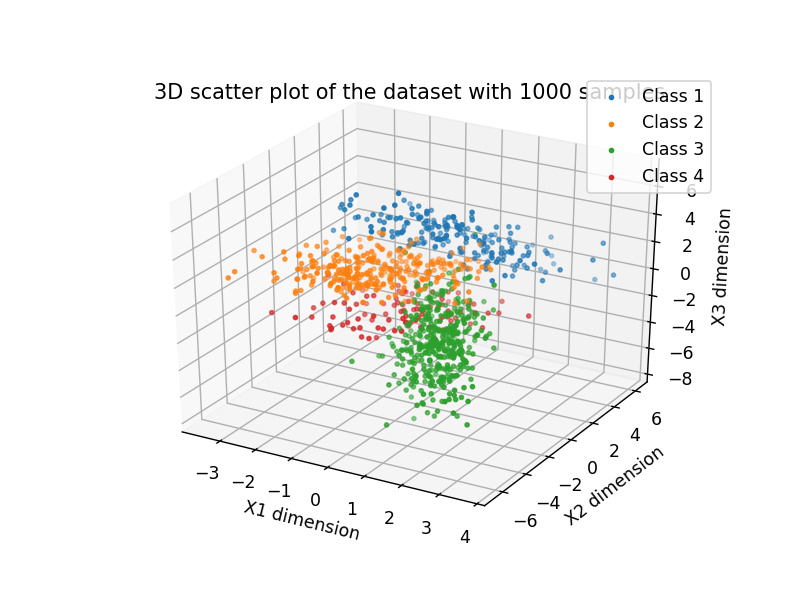

In [128]:
dataset_thou, label_thou, mle_prob_thou = generate_dataset(1000)

In [148]:
best_param_thou, param_prob_error_thou = k_fold_keras(dataset_thou, label_thou, [4, 12, 18, 24, 32])

Train on 900 samples
Epoch 1/1000
900/900 [==============================] - 0s 327us/sample - loss: 1.4988 - accuracy: 0.2233
Epoch 2/1000
900/900 [==============================] - 0s 31us/sample - loss: 1.4002 - accuracy: 0.3033
Epoch 3/1000
900/900 [==============================] - 0s 31us/sample - loss: 1.3208 - accuracy: 0.3522
Epoch 4/1000
900/900 [==============================] - 0s 31us/sample - loss: 1.2540 - accuracy: 0.4100
Epoch 5/1000
900/900 [==============================] - 0s 29us/sample - loss: 1.2008 - accuracy: 0.4956
Epoch 6/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.1558 - accuracy: 0.6111
Epoch 7/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.1179 - accuracy: 0.6656
Epoch 8/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.0856 - accuracy: 0.6822
Epoch 9/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.0570 - accuracy: 0.6933
Epoch 10/1000
900/900 [==========

900/900 [==============================] - 0s 29us/sample - loss: 0.3223 - accuracy: 0.9067
Epoch 155/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3213 - accuracy: 0.9078
Epoch 156/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3204 - accuracy: 0.9089
Epoch 157/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3196 - accuracy: 0.9100
Epoch 158/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3187 - accuracy: 0.9100
Epoch 159/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3177 - accuracy: 0.9100
Epoch 160/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3169 - accuracy: 0.9100
Epoch 161/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3160 - accuracy: 0.9100
Epoch 162/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3152 - accuracy: 0.9100
Epoch 163/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2487 - accuracy: 0.9222
Epoch 305/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2484 - accuracy: 0.9222
Epoch 306/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2481 - accuracy: 0.9211
Epoch 307/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2478 - accuracy: 0.9211
Epoch 308/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2476 - accuracy: 0.9211
Epoch 309/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2473 - accuracy: 0.9222
Epoch 310/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2470 - accuracy: 0.9222
Epoch 311/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2468 - accuracy: 0.9222
Epoch 312/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2465 - accuracy: 0.9222
Epoch 313/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2176 - accuracy: 0.9289
Epoch 457/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2175 - accuracy: 0.9289
Epoch 458/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2173 - accuracy: 0.9289
Epoch 459/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2171 - accuracy: 0.9289
Epoch 460/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2170 - accuracy: 0.9300
Epoch 461/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2168 - accuracy: 0.9300
Epoch 462/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2167 - accuracy: 0.9289
Epoch 463/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2165 - accuracy: 0.9300
Epoch 464/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2164 - accuracy: 0.9300
Epoch 465/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1980 - accuracy: 0.9411
Epoch 608/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1979 - accuracy: 0.9411
Epoch 609/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1978 - accuracy: 0.9411
Epoch 610/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1977 - accuracy: 0.9411
Epoch 611/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1976 - accuracy: 0.9411
Epoch 612/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1975 - accuracy: 0.9411
Epoch 613/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1974 - accuracy: 0.9411
Epoch 614/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1972 - accuracy: 0.9411
Epoch 615/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1972 - accuracy: 0.9411
Epoch 616/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1843 - accuracy: 0.9444
Epoch 759/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1843 - accuracy: 0.9433
Epoch 760/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1842 - accuracy: 0.9444
Epoch 761/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1841 - accuracy: 0.9433
Epoch 762/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1840 - accuracy: 0.9444
Epoch 763/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1839 - accuracy: 0.9433
Epoch 764/1000
900/900 [==============================] - ETA: 0s - loss: 0.1452 - accuracy: 0.93 - 0s 30us/sample - loss: 0.1839 - accuracy: 0.9444
Epoch 765/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1838 - accuracy: 0.9433
Epoch 766/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1837 - accuracy: 0.9433
Epoch 767/

900/900 [==============================] - 0s 30us/sample - loss: 0.1741 - accuracy: 0.9467
Epoch 910/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1740 - accuracy: 0.9467
Epoch 911/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1740 - accuracy: 0.9467
Epoch 912/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1739 - accuracy: 0.9467
Epoch 913/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1738 - accuracy: 0.9467
Epoch 914/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1738 - accuracy: 0.9478
Epoch 915/1000
900/900 [==============================] - ETA: 0s - loss: 0.2441 - accuracy: 0.93 - 0s 29us/sample - loss: 0.1737 - accuracy: 0.9467
Epoch 916/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1737 - accuracy: 0.9478
Epoch 917/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1736 - accuracy: 0.9467
Epoch 918/

900/900 [==============================] - 0s 29us/sample - loss: 0.7166 - accuracy: 0.7600
Epoch 60/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.7114 - accuracy: 0.7600
Epoch 61/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.7064 - accuracy: 0.7589
Epoch 62/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.7016 - accuracy: 0.7589
Epoch 63/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.6969 - accuracy: 0.7578
Epoch 64/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6923 - accuracy: 0.7589
Epoch 65/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6879 - accuracy: 0.7589
Epoch 66/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6837 - accuracy: 0.7600
Epoch 67/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6796 - accuracy: 0.7622
Epoch 68/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 29us/sample - loss: 0.4380 - accuracy: 0.8611
Epoch 211/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.4371 - accuracy: 0.8611
Epoch 212/1000
900/900 [==============================] - ETA: 0s - loss: 0.4898 - accuracy: 0.87 - 0s 29us/sample - loss: 0.4361 - accuracy: 0.8622
Epoch 213/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.4352 - accuracy: 0.8633
Epoch 214/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4343 - accuracy: 0.8622
Epoch 215/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.4335 - accuracy: 0.8633
Epoch 216/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4326 - accuracy: 0.8644
Epoch 217/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.4317 - accuracy: 0.8644
Epoch 218/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.4308 - accuracy: 0.8644
Epoch 219/

900/900 [==============================] - 0s 30us/sample - loss: 0.3094 - accuracy: 0.9133
Epoch 360/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3086 - accuracy: 0.9133
Epoch 361/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3079 - accuracy: 0.9133
Epoch 362/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3072 - accuracy: 0.9133
Epoch 363/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3065 - accuracy: 0.9133
Epoch 364/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3057 - accuracy: 0.9133
Epoch 365/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3050 - accuracy: 0.9133
Epoch 366/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3043 - accuracy: 0.9133
Epoch 367/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3036 - accuracy: 0.9133
Epoch 368/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2377 - accuracy: 0.9233
Epoch 510/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2374 - accuracy: 0.9233
Epoch 511/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2371 - accuracy: 0.9233
Epoch 512/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2368 - accuracy: 0.9233
Epoch 513/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2366 - accuracy: 0.9233
Epoch 514/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2363 - accuracy: 0.9233
Epoch 515/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2360 - accuracy: 0.9233
Epoch 516/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2357 - accuracy: 0.9233
Epoch 517/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2355 - accuracy: 0.9233
Epoch 518/1000
900/900 [============================

Epoch 585/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2204 - accuracy: 0.9289
Epoch 586/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2202 - accuracy: 0.9289
Epoch 587/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2200 - accuracy: 0.9289
Epoch 588/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2198 - accuracy: 0.9289
Epoch 589/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2196 - accuracy: 0.9300
Epoch 590/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2194 - accuracy: 0.9289
Epoch 591/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2192 - accuracy: 0.9289
Epoch 592/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2191 - accuracy: 0.9289
Epoch 593/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2189 - accuracy: 0.9289
Epoch 594/1000
900/900 [=============

900/900 [==============================] - 0s 30us/sample - loss: 0.1981 - accuracy: 0.9356
Epoch 738/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1980 - accuracy: 0.9356
Epoch 739/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1978 - accuracy: 0.9344
Epoch 740/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1977 - accuracy: 0.9356
Epoch 741/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1976 - accuracy: 0.9356
Epoch 742/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1975 - accuracy: 0.9356
Epoch 743/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1974 - accuracy: 0.9356
Epoch 744/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1973 - accuracy: 0.9356
Epoch 745/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1972 - accuracy: 0.9356
Epoch 746/1000
900/900 [============================

Epoch 886/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1832 - accuracy: 0.9378
Epoch 887/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1832 - accuracy: 0.9400
Epoch 888/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1830 - accuracy: 0.9400
Epoch 889/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1830 - accuracy: 0.9400
Epoch 890/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1829 - accuracy: 0.9400
Epoch 891/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1828 - accuracy: 0.9400
Epoch 892/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1827 - accuracy: 0.9400
Epoch 893/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1826 - accuracy: 0.9400
Epoch 894/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1825 - accuracy: 0.9400
Epoch 895/1000
900/900 [=============

900/900 [==============================] - 0s 30us/sample - loss: 0.7627 - accuracy: 0.7978
Epoch 36/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.7540 - accuracy: 0.8000
Epoch 37/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.7453 - accuracy: 0.8011
Epoch 38/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.7370 - accuracy: 0.8011
Epoch 39/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.7289 - accuracy: 0.8044
Epoch 40/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.7212 - accuracy: 0.8056
Epoch 41/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.7135 - accuracy: 0.8056
Epoch 42/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.7060 - accuracy: 0.8056
Epoch 43/1000
900/900 [==============================] - ETA: 0s - loss: 0.6821 - accuracy: 0.78 - 0s 29us/sample - loss: 0.6986 - accuracy: 0.8078
Epoch 44/1000
900/

900/900 [==============================] - 0s 29us/sample - loss: 0.3403 - accuracy: 0.9067
Epoch 187/1000
900/900 [==============================] - ETA: 0s - loss: 0.2663 - accuracy: 0.93 - 0s 29us/sample - loss: 0.3395 - accuracy: 0.9056
Epoch 188/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3387 - accuracy: 0.9089
Epoch 189/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3379 - accuracy: 0.9067
Epoch 190/1000
900/900 [==============================] - ETA: 0s - loss: 0.2932 - accuracy: 0.96 - 0s 29us/sample - loss: 0.3372 - accuracy: 0.9078
Epoch 191/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3365 - accuracy: 0.9078
Epoch 192/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3358 - accuracy: 0.9078
Epoch 193/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3351 - accuracy: 0.9078
Epoch 194/1000
900/900 [==============================] - 0s 30us/sample - 

900/900 [==============================] - 0s 29us/sample - loss: 0.2970 - accuracy: 0.9144
Epoch 262/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2966 - accuracy: 0.9144
Epoch 263/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2961 - accuracy: 0.9144
Epoch 264/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2957 - accuracy: 0.9144
Epoch 265/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2953 - accuracy: 0.9144
Epoch 266/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2948 - accuracy: 0.9144
Epoch 267/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2944 - accuracy: 0.9144
Epoch 268/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2940 - accuracy: 0.9144
Epoch 269/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2936 - accuracy: 0.9144
Epoch 270/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2470 - accuracy: 0.9289
Epoch 414/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2467 - accuracy: 0.9289
Epoch 415/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2465 - accuracy: 0.9289
Epoch 416/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2462 - accuracy: 0.9289
Epoch 417/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2459 - accuracy: 0.9300
Epoch 418/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2457 - accuracy: 0.9289
Epoch 419/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2454 - accuracy: 0.9289
Epoch 420/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2452 - accuracy: 0.9289
Epoch 421/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2449 - accuracy: 0.9289
Epoch 422/1000
900/900 [============================

Epoch 565/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2120 - accuracy: 0.9467
Epoch 566/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2118 - accuracy: 0.9478
Epoch 567/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2117 - accuracy: 0.9478
Epoch 568/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2114 - accuracy: 0.9478
Epoch 569/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2112 - accuracy: 0.9478
Epoch 570/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2111 - accuracy: 0.9478
Epoch 571/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2108 - accuracy: 0.9467
Epoch 572/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2106 - accuracy: 0.9478
Epoch 573/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2105 - accuracy: 0.9478
Epoch 574/1000
900/900 [=============

900/900 [==============================] - 0s 29us/sample - loss: 0.1863 - accuracy: 0.9511
Epoch 716/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1862 - accuracy: 0.9500
Epoch 717/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1861 - accuracy: 0.9500
Epoch 718/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1859 - accuracy: 0.9511
Epoch 719/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1858 - accuracy: 0.9500
Epoch 720/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1856 - accuracy: 0.9511
Epoch 721/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1855 - accuracy: 0.9500
Epoch 722/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1854 - accuracy: 0.9511
Epoch 723/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1852 - accuracy: 0.9511
Epoch 724/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1687 - accuracy: 0.9500
Epoch 866/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1686 - accuracy: 0.9500
Epoch 867/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1685 - accuracy: 0.9500
Epoch 868/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1684 - accuracy: 0.9500
Epoch 869/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1683 - accuracy: 0.9500
Epoch 870/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1682 - accuracy: 0.9500
Epoch 871/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1681 - accuracy: 0.9500
Epoch 872/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1680 - accuracy: 0.9500
Epoch 873/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1679 - accuracy: 0.9500
Epoch 874/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1621 - accuracy: 0.9500
Epoch 941/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1620 - accuracy: 0.9500
Epoch 942/1000
900/900 [==============================] - ETA: 0s - loss: 0.0792 - accuracy: 1.00 - 0s 29us/sample - loss: 0.1620 - accuracy: 0.9500
Epoch 943/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1619 - accuracy: 0.9500
Epoch 944/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1618 - accuracy: 0.9500
Epoch 945/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1617 - accuracy: 0.9500
Epoch 946/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1617 - accuracy: 0.9500
Epoch 947/1000
900/900 [==============================] - ETA: 0s - loss: 0.1296 - accuracy: 0.96 - 0s 30us/sample - loss: 0.1616 - accuracy: 0.9500
Epoch 948/1000
900/900 [==============================] - 0s 30us/sample - 

900/900 [==============================] - 0s 31us/sample - loss: 0.4779 - accuracy: 0.8378
Epoch 91/1000
900/900 [==============================] - 0s 42us/sample - loss: 0.4751 - accuracy: 0.8367
Epoch 92/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.4724 - accuracy: 0.8378
Epoch 93/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.4697 - accuracy: 0.8378
Epoch 94/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4671 - accuracy: 0.8389
Epoch 95/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4645 - accuracy: 0.8378
Epoch 96/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4619 - accuracy: 0.8378
Epoch 97/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4595 - accuracy: 0.8389
Epoch 98/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.4570 - accuracy: 0.8400
Epoch 99/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 31us/sample - loss: 0.2771 - accuracy: 0.9367
Epoch 242/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2765 - accuracy: 0.9356
Epoch 243/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2759 - accuracy: 0.9356
Epoch 244/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2753 - accuracy: 0.9356
Epoch 245/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2747 - accuracy: 0.9367
Epoch 246/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2741 - accuracy: 0.9378
Epoch 247/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2736 - accuracy: 0.9378
Epoch 248/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2730 - accuracy: 0.9378
Epoch 249/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2724 - accuracy: 0.9378
Epoch 250/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.2182 - accuracy: 0.9478
Epoch 393/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2179 - accuracy: 0.9489
Epoch 394/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2177 - accuracy: 0.9478
Epoch 395/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2174 - accuracy: 0.9489
Epoch 396/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2172 - accuracy: 0.9489
Epoch 397/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2169 - accuracy: 0.9500
Epoch 398/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2166 - accuracy: 0.9478
Epoch 399/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2165 - accuracy: 0.9489
Epoch 400/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2162 - accuracy: 0.9489
Epoch 401/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2015 - accuracy: 0.9522
Epoch 468/1000
900/900 [==============================] - ETA: 0s - loss: 0.2171 - accuracy: 0.96 - 0s 30us/sample - loss: 0.2013 - accuracy: 0.9522
Epoch 469/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2011 - accuracy: 0.9522
Epoch 470/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2009 - accuracy: 0.9511
Epoch 471/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2007 - accuracy: 0.9511
Epoch 472/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2005 - accuracy: 0.9511
Epoch 473/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2004 - accuracy: 0.9511
Epoch 474/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2001 - accuracy: 0.9511
Epoch 475/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2000 - accuracy: 0.9511
Epoch 476/

Epoch 541/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1885 - accuracy: 0.9544
Epoch 542/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1884 - accuracy: 0.9544
Epoch 543/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1882 - accuracy: 0.9544
Epoch 544/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1880 - accuracy: 0.9544
Epoch 545/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1879 - accuracy: 0.9544
Epoch 546/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1877 - accuracy: 0.9544
Epoch 547/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1876 - accuracy: 0.9544
Epoch 548/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1874 - accuracy: 0.9544
Epoch 549/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1872 - accuracy: 0.9544
Epoch 550/1000
900/900 [=============

900/900 [==============================] - 0s 29us/sample - loss: 0.1679 - accuracy: 0.9622
Epoch 693/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1679 - accuracy: 0.9622
Epoch 694/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1677 - accuracy: 0.9622
Epoch 695/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1676 - accuracy: 0.9644
Epoch 696/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1675 - accuracy: 0.9633
Epoch 697/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1674 - accuracy: 0.9622
Epoch 698/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1672 - accuracy: 0.9622
Epoch 699/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1671 - accuracy: 0.9633
Epoch 700/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1670 - accuracy: 0.9633
Epoch 701/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1595 - accuracy: 0.9656
Epoch 768/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1593 - accuracy: 0.9656
Epoch 769/1000
900/900 [==============================] - ETA: 0s - loss: 0.0791 - accuracy: 1.00 - 0s 29us/sample - loss: 0.1592 - accuracy: 0.9656
Epoch 770/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1591 - accuracy: 0.9656
Epoch 771/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1590 - accuracy: 0.9644
Epoch 772/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1589 - accuracy: 0.9644
Epoch 773/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1588 - accuracy: 0.9656
Epoch 774/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1587 - accuracy: 0.9656
Epoch 775/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1586 - accuracy: 0.9656
Epoch 776/

900/900 [==============================] - 0s 30us/sample - loss: 0.1451 - accuracy: 0.9667
Epoch 918/1000
900/900 [==============================] - 0s 27us/sample - loss: 0.1450 - accuracy: 0.9667
Epoch 919/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1449 - accuracy: 0.9667
Epoch 920/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1448 - accuracy: 0.9667
Epoch 921/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1447 - accuracy: 0.9667
Epoch 922/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1446 - accuracy: 0.9678
Epoch 923/1000
900/900 [==============================] - ETA: 0s - loss: 0.1690 - accuracy: 0.93 - 0s 29us/sample - loss: 0.1445 - accuracy: 0.9667
Epoch 924/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1444 - accuracy: 0.9667
Epoch 925/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1444 - accuracy: 0.9667
Epoch 926/

900/900 [==============================] - 0s 29us/sample - loss: 0.6148 - accuracy: 0.8344
Epoch 69/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6111 - accuracy: 0.8333
Epoch 70/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6075 - accuracy: 0.8344
Epoch 71/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6040 - accuracy: 0.8333
Epoch 72/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6006 - accuracy: 0.8333
Epoch 73/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5971 - accuracy: 0.8333
Epoch 74/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5938 - accuracy: 0.8333
Epoch 75/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5904 - accuracy: 0.8322
Epoch 76/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5871 - accuracy: 0.8333
Epoch 77/1000
900/900 [==============================] - ETA

900/900 [==============================] - 0s 29us/sample - loss: 0.3638 - accuracy: 0.9044
Epoch 220/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3630 - accuracy: 0.9044
Epoch 221/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3623 - accuracy: 0.9044
Epoch 222/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3616 - accuracy: 0.9044
Epoch 223/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3609 - accuracy: 0.9056
Epoch 224/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3602 - accuracy: 0.9044
Epoch 225/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3596 - accuracy: 0.9044
Epoch 226/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3589 - accuracy: 0.9056
Epoch 227/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3582 - accuracy: 0.9056
Epoch 228/1000
900/900 [============================

900/900 [==============================] - 0s 28us/sample - loss: 0.2946 - accuracy: 0.9111
Epoch 370/1000
900/900 [==============================] - ETA: 0s - loss: 0.4383 - accuracy: 0.78 - 0s 29us/sample - loss: 0.2943 - accuracy: 0.9100
Epoch 371/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2939 - accuracy: 0.9100
Epoch 372/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2936 - accuracy: 0.9100
Epoch 373/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2933 - accuracy: 0.9100
Epoch 374/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2930 - accuracy: 0.9100
Epoch 375/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2927 - accuracy: 0.9100
Epoch 376/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2924 - accuracy: 0.9100
Epoch 377/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2921 - accuracy: 0.9100
Epoch 378/

900/900 [==============================] - 0s 29us/sample - loss: 0.2749 - accuracy: 0.9056
Epoch 445/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2746 - accuracy: 0.9056
Epoch 446/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2744 - accuracy: 0.9056
Epoch 447/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2742 - accuracy: 0.9056
Epoch 448/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2740 - accuracy: 0.9056
Epoch 449/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2737 - accuracy: 0.9067
Epoch 450/1000
900/900 [==============================] - 0s 27us/sample - loss: 0.2735 - accuracy: 0.9078
Epoch 451/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2733 - accuracy: 0.9056
Epoch 452/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2731 - accuracy: 0.9078
Epoch 453/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2484 - accuracy: 0.9133
Epoch 594/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2483 - accuracy: 0.9133
Epoch 595/1000
900/900 [==============================] - ETA: 0s - loss: 0.3083 - accuracy: 0.84 - 0s 30us/sample - loss: 0.2481 - accuracy: 0.9133
Epoch 596/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2480 - accuracy: 0.9133
Epoch 597/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2479 - accuracy: 0.9144
Epoch 598/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2478 - accuracy: 0.9133
Epoch 599/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2476 - accuracy: 0.9144
Epoch 600/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2475 - accuracy: 0.9133
Epoch 601/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2473 - accuracy: 0.9156
Epoch 602/

900/900 [==============================] - 0s 30us/sample - loss: 0.2298 - accuracy: 0.9267
Epoch 744/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2296 - accuracy: 0.9267
Epoch 745/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2296 - accuracy: 0.9267
Epoch 746/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2294 - accuracy: 0.9267
Epoch 747/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2293 - accuracy: 0.9267
Epoch 748/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2292 - accuracy: 0.9289
Epoch 749/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2291 - accuracy: 0.9278
Epoch 750/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2290 - accuracy: 0.9278
Epoch 751/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2289 - accuracy: 0.9267
Epoch 752/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2154 - accuracy: 0.9333
Epoch 894/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2153 - accuracy: 0.9333
Epoch 895/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2152 - accuracy: 0.9333
Epoch 896/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2151 - accuracy: 0.9333
Epoch 897/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2151 - accuracy: 0.9333
Epoch 898/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2150 - accuracy: 0.9333
Epoch 899/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2149 - accuracy: 0.9333
Epoch 900/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2148 - accuracy: 0.9333
Epoch 901/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2148 - accuracy: 0.9333
Epoch 902/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.6278 - accuracy: 0.8267
Epoch 45/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6229 - accuracy: 0.8267
Epoch 46/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6182 - accuracy: 0.8278
Epoch 47/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6136 - accuracy: 0.8278
Epoch 48/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6091 - accuracy: 0.8278
Epoch 49/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6047 - accuracy: 0.8289
Epoch 50/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6003 - accuracy: 0.8278
Epoch 51/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5961 - accuracy: 0.8278
Epoch 52/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5919 - accuracy: 0.8278
Epoch 53/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 30us/sample - loss: 0.3540 - accuracy: 0.9056
Epoch 198/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3535 - accuracy: 0.9056
Epoch 199/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3528 - accuracy: 0.9056
Epoch 200/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3523 - accuracy: 0.9044
Epoch 201/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3516 - accuracy: 0.9033
Epoch 202/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3511 - accuracy: 0.9044
Epoch 203/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3505 - accuracy: 0.9033
Epoch 204/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3499 - accuracy: 0.9033
Epoch 205/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.3493 - accuracy: 0.9033
Epoch 206/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.3195 - accuracy: 0.8978
Epoch 273/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3191 - accuracy: 0.8978
Epoch 274/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3187 - accuracy: 0.8978
Epoch 275/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3184 - accuracy: 0.8967
Epoch 276/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3181 - accuracy: 0.8956
Epoch 277/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3178 - accuracy: 0.8956
Epoch 278/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3174 - accuracy: 0.8956
Epoch 279/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3171 - accuracy: 0.8967
Epoch 280/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3168 - accuracy: 0.8967
Epoch 281/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2988 - accuracy: 0.9022
Epoch 348/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2985 - accuracy: 0.9033
Epoch 349/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2982 - accuracy: 0.9044
Epoch 350/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2980 - accuracy: 0.9022
Epoch 351/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2978 - accuracy: 0.9044
Epoch 352/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2976 - accuracy: 0.9033
Epoch 353/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2974 - accuracy: 0.9033
Epoch 354/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2972 - accuracy: 0.9022
Epoch 355/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2970 - accuracy: 0.9033
Epoch 356/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2711 - accuracy: 0.9067
Epoch 498/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2709 - accuracy: 0.9067
Epoch 499/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2708 - accuracy: 0.9067
Epoch 500/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2706 - accuracy: 0.9067
Epoch 501/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2704 - accuracy: 0.9067
Epoch 502/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2703 - accuracy: 0.9078
Epoch 503/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2701 - accuracy: 0.9078
Epoch 504/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2699 - accuracy: 0.9078
Epoch 505/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2698 - accuracy: 0.9067
Epoch 506/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2496 - accuracy: 0.9100
Epoch 648/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2495 - accuracy: 0.9089
Epoch 649/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2494 - accuracy: 0.9100
Epoch 650/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2493 - accuracy: 0.9100
Epoch 651/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2492 - accuracy: 0.9100
Epoch 652/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2490 - accuracy: 0.9089
Epoch 653/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2488 - accuracy: 0.9089
Epoch 654/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2487 - accuracy: 0.9100
Epoch 655/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2486 - accuracy: 0.9100
Epoch 656/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2329 - accuracy: 0.9178
Epoch 800/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2328 - accuracy: 0.9178
Epoch 801/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2327 - accuracy: 0.9178
Epoch 802/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2326 - accuracy: 0.9156
Epoch 803/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2325 - accuracy: 0.9167
Epoch 804/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2324 - accuracy: 0.9189
Epoch 805/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2324 - accuracy: 0.9178
Epoch 806/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2322 - accuracy: 0.9167
Epoch 807/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2323 - accuracy: 0.9167
Epoch 808/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2195 - accuracy: 0.9233
Epoch 951/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2194 - accuracy: 0.9244
Epoch 952/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2194 - accuracy: 0.9244
Epoch 953/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2193 - accuracy: 0.9256
Epoch 954/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2192 - accuracy: 0.9244
Epoch 955/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2191 - accuracy: 0.9256
Epoch 956/1000
900/900 [==============================] - ETA: 0s - loss: 0.1605 - accuracy: 0.96 - 0s 30us/sample - loss: 0.2190 - accuracy: 0.9244
Epoch 957/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2189 - accuracy: 0.9244
Epoch 958/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2189 - accuracy: 0.9244
Epoch 959/

900/900 [==============================] - 0s 29us/sample - loss: 0.5104 - accuracy: 0.8289
Epoch 100/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5083 - accuracy: 0.8278
Epoch 101/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5062 - accuracy: 0.8278
Epoch 102/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5042 - accuracy: 0.8289
Epoch 103/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.5021 - accuracy: 0.8278
Epoch 104/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5002 - accuracy: 0.8300
Epoch 105/1000
900/900 [==============================] - ETA: 0s - loss: 0.4166 - accuracy: 0.84 - 0s 29us/sample - loss: 0.4982 - accuracy: 0.8289
Epoch 106/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.4963 - accuracy: 0.8300
Epoch 107/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4944 - accuracy: 0.8300
Epoch 108/

900/900 [==============================] - 0s 29us/sample - loss: 0.4004 - accuracy: 0.8944
Epoch 175/1000
900/900 [==============================] - ETA: 0s - loss: 0.4316 - accuracy: 0.87 - 0s 29us/sample - loss: 0.3994 - accuracy: 0.8956
Epoch 176/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3984 - accuracy: 0.8933
Epoch 177/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3974 - accuracy: 0.8956
Epoch 178/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3965 - accuracy: 0.8956
Epoch 179/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3955 - accuracy: 0.8944
Epoch 180/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3946 - accuracy: 0.8967
Epoch 181/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3936 - accuracy: 0.8956
Epoch 182/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3927 - accuracy: 0.8956
Epoch 183/

900/900 [==============================] - 0s 29us/sample - loss: 0.3132 - accuracy: 0.8978
Epoch 326/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3128 - accuracy: 0.9000
Epoch 327/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3125 - accuracy: 0.8978
Epoch 328/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3122 - accuracy: 0.9022
Epoch 329/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3119 - accuracy: 0.9000
Epoch 330/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3115 - accuracy: 0.9000
Epoch 331/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3112 - accuracy: 0.8978
Epoch 332/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3109 - accuracy: 0.8989
Epoch 333/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3106 - accuracy: 0.8978
Epoch 334/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2772 - accuracy: 0.9000
Epoch 477/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2770 - accuracy: 0.9022
Epoch 478/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2768 - accuracy: 0.9000
Epoch 479/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2766 - accuracy: 0.9011
Epoch 480/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2765 - accuracy: 0.9044
Epoch 481/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2763 - accuracy: 0.9033
Epoch 482/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2761 - accuracy: 0.9033
Epoch 483/1000
900/900 [==============================] - ETA: 0s - loss: 0.2775 - accuracy: 0.84 - 0s 30us/sample - loss: 0.2759 - accuracy: 0.9022
Epoch 484/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2759 - accuracy: 0.9022
Epoch 485/

900/900 [==============================] - 0s 29us/sample - loss: 0.2556 - accuracy: 0.9122
Epoch 627/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2554 - accuracy: 0.9133
Epoch 628/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2553 - accuracy: 0.9122
Epoch 629/1000
900/900 [==============================] - 0s 35us/sample - loss: 0.2552 - accuracy: 0.9133
Epoch 630/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2551 - accuracy: 0.9122
Epoch 631/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2550 - accuracy: 0.9133
Epoch 632/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2549 - accuracy: 0.9122
Epoch 633/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2547 - accuracy: 0.9133
Epoch 634/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2546 - accuracy: 0.9122
Epoch 635/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2388 - accuracy: 0.9289
Epoch 779/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2386 - accuracy: 0.9278
Epoch 780/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2386 - accuracy: 0.9289
Epoch 781/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2385 - accuracy: 0.9289
Epoch 782/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2384 - accuracy: 0.9267
Epoch 783/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2383 - accuracy: 0.9278
Epoch 784/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2382 - accuracy: 0.9278
Epoch 785/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2381 - accuracy: 0.9267
Epoch 786/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2380 - accuracy: 0.9300
Epoch 787/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2250 - accuracy: 0.9289
Epoch 930/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2249 - accuracy: 0.9300
Epoch 931/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2248 - accuracy: 0.9289
Epoch 932/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2247 - accuracy: 0.9289
Epoch 933/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2246 - accuracy: 0.9289
Epoch 934/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2246 - accuracy: 0.9289
Epoch 935/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2245 - accuracy: 0.9300
Epoch 936/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2244 - accuracy: 0.9300
Epoch 937/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2243 - accuracy: 0.9300
Epoch 938/1000
900/900 [============================

900/900 [==============================] - 0s 28us/sample - loss: 1.3858 - accuracy: 0.3411
Epoch 5/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.3016 - accuracy: 0.3967
Epoch 6/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.2368 - accuracy: 0.4433
Epoch 7/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.1814 - accuracy: 0.4600
Epoch 8/1000
900/900 [==============================] - 0s 29us/sample - loss: 1.1368 - accuracy: 0.4644
Epoch 9/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.0989 - accuracy: 0.4711
Epoch 10/1000
900/900 [==============================] - 0s 28us/sample - loss: 1.0670 - accuracy: 0.5878
Epoch 11/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.0409 - accuracy: 0.6367
Epoch 12/1000
900/900 [==============================] - 0s 29us/sample - loss: 1.0165 - accuracy: 0.6411
Epoch 13/1000
900/900 [==============================] - 0s 28us/

900/900 [==============================] - 0s 30us/sample - loss: 0.3771 - accuracy: 0.9011
Epoch 157/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.3761 - accuracy: 0.9000
Epoch 158/1000
900/900 [==============================] - ETA: 0s - loss: 0.4178 - accuracy: 0.93 - 0s 29us/sample - loss: 0.3750 - accuracy: 0.9000
Epoch 159/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3740 - accuracy: 0.9011
Epoch 160/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3730 - accuracy: 0.9011
Epoch 161/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3720 - accuracy: 0.9000
Epoch 162/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3710 - accuracy: 0.9000
Epoch 163/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3701 - accuracy: 0.9000
Epoch 164/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3692 - accuracy: 0.9000
Epoch 165/

900/900 [==============================] - 0s 29us/sample - loss: 0.3026 - accuracy: 0.8933
Epoch 307/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3024 - accuracy: 0.8922
Epoch 308/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3021 - accuracy: 0.8922
Epoch 309/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3018 - accuracy: 0.8922
Epoch 310/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.3016 - accuracy: 0.8933
Epoch 311/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3013 - accuracy: 0.8933
Epoch 312/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3011 - accuracy: 0.8933
Epoch 313/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3008 - accuracy: 0.8933
Epoch 314/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3006 - accuracy: 0.8944
Epoch 315/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2709 - accuracy: 0.9011
Epoch 458/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2707 - accuracy: 0.9011
Epoch 459/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2705 - accuracy: 0.9022
Epoch 460/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2703 - accuracy: 0.9011
Epoch 461/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2702 - accuracy: 0.9022
Epoch 462/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2700 - accuracy: 0.9011
Epoch 463/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2698 - accuracy: 0.9022
Epoch 464/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2696 - accuracy: 0.9022
Epoch 465/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2694 - accuracy: 0.9022
Epoch 466/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.2446 - accuracy: 0.9267
Epoch 609/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2444 - accuracy: 0.9267
Epoch 610/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2442 - accuracy: 0.9267
Epoch 611/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2441 - accuracy: 0.9267
Epoch 612/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2439 - accuracy: 0.9267
Epoch 613/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2438 - accuracy: 0.9267
Epoch 614/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2436 - accuracy: 0.9278
Epoch 615/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2434 - accuracy: 0.9267
Epoch 616/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2432 - accuracy: 0.9267
Epoch 617/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2203 - accuracy: 0.9400
Epoch 761/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2201 - accuracy: 0.9422
Epoch 762/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2200 - accuracy: 0.9422
Epoch 763/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2198 - accuracy: 0.9422
Epoch 764/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2196 - accuracy: 0.9422
Epoch 765/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2194 - accuracy: 0.9411
Epoch 766/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2193 - accuracy: 0.9411
Epoch 767/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2191 - accuracy: 0.9422
Epoch 768/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2190 - accuracy: 0.9400
Epoch 769/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1982 - accuracy: 0.9478
Epoch 912/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1980 - accuracy: 0.9478
Epoch 913/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1979 - accuracy: 0.9478
Epoch 914/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1978 - accuracy: 0.9478
Epoch 915/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1976 - accuracy: 0.9478
Epoch 916/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1975 - accuracy: 0.9478
Epoch 917/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1974 - accuracy: 0.9478
Epoch 918/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1973 - accuracy: 0.9478
Epoch 919/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1971 - accuracy: 0.9478
Epoch 920/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.7047 - accuracy: 0.7367
Epoch 60/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6991 - accuracy: 0.7367
Epoch 61/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6937 - accuracy: 0.7389
Epoch 62/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.6885 - accuracy: 0.7389
Epoch 63/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6831 - accuracy: 0.7433
Epoch 64/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6779 - accuracy: 0.7478
Epoch 65/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6728 - accuracy: 0.7522
Epoch 66/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6678 - accuracy: 0.7522
Epoch 67/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6627 - accuracy: 0.7567
Epoch 68/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 30us/sample - loss: 0.3735 - accuracy: 0.9022
Epoch 211/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3728 - accuracy: 0.9000
Epoch 212/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3720 - accuracy: 0.9011
Epoch 213/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3713 - accuracy: 0.9011
Epoch 214/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3705 - accuracy: 0.9011
Epoch 215/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3698 - accuracy: 0.9011
Epoch 216/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3691 - accuracy: 0.9011
Epoch 217/1000
900/900 [==============================] - ETA: 0s - loss: 0.5342 - accuracy: 0.81 - 0s 31us/sample - loss: 0.3685 - accuracy: 0.9011
Epoch 218/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3677 - accuracy: 0.9011
Epoch 219/

900/900 [==============================] - 0s 30us/sample - loss: 0.3090 - accuracy: 0.8978
Epoch 360/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3088 - accuracy: 0.8978
Epoch 361/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3086 - accuracy: 0.8978
Epoch 362/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3083 - accuracy: 0.8978
Epoch 363/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3080 - accuracy: 0.8978
Epoch 364/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3078 - accuracy: 0.8978
Epoch 365/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3076 - accuracy: 0.8978
Epoch 366/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3073 - accuracy: 0.8978
Epoch 367/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3070 - accuracy: 0.8978
Epoch 368/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2788 - accuracy: 0.9022
Epoch 511/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2786 - accuracy: 0.9022
Epoch 512/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2784 - accuracy: 0.9011
Epoch 513/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2783 - accuracy: 0.9011
Epoch 514/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2781 - accuracy: 0.9022
Epoch 515/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2780 - accuracy: 0.9000
Epoch 516/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2778 - accuracy: 0.9011
Epoch 517/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2776 - accuracy: 0.9022
Epoch 518/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2774 - accuracy: 0.8989
Epoch 519/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2486 - accuracy: 0.9100
Epoch 662/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2484 - accuracy: 0.9100
Epoch 663/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2482 - accuracy: 0.9100
Epoch 664/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2480 - accuracy: 0.9100
Epoch 665/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2478 - accuracy: 0.9122
Epoch 666/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2476 - accuracy: 0.9111
Epoch 667/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2474 - accuracy: 0.9100
Epoch 668/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2471 - accuracy: 0.9111
Epoch 669/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2470 - accuracy: 0.9111
Epoch 670/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2335 - accuracy: 0.9167
Epoch 737/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2334 - accuracy: 0.9167
Epoch 738/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2333 - accuracy: 0.9167
Epoch 739/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2330 - accuracy: 0.9156
Epoch 740/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2328 - accuracy: 0.9167
Epoch 741/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2326 - accuracy: 0.9167
Epoch 742/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2325 - accuracy: 0.9167
Epoch 743/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2323 - accuracy: 0.9178
Epoch 744/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2321 - accuracy: 0.9178
Epoch 745/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2091 - accuracy: 0.9322
Epoch 887/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2090 - accuracy: 0.9300
Epoch 888/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2088 - accuracy: 0.9300
Epoch 889/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2087 - accuracy: 0.9300
Epoch 890/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2086 - accuracy: 0.9322
Epoch 891/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2084 - accuracy: 0.9300
Epoch 892/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2082 - accuracy: 0.9300
Epoch 893/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2081 - accuracy: 0.9322
Epoch 894/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2080 - accuracy: 0.9322
Epoch 895/1000
900/900 [============================

900/900 [==============================] - 0s 28us/sample - loss: 0.5990 - accuracy: 0.8633
Epoch 36/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5872 - accuracy: 0.8678
Epoch 37/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5761 - accuracy: 0.8722
Epoch 38/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5653 - accuracy: 0.8733
Epoch 39/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5550 - accuracy: 0.8733
Epoch 40/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.5450 - accuracy: 0.8756
Epoch 41/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5355 - accuracy: 0.8767
Epoch 42/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5264 - accuracy: 0.8767
Epoch 43/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5177 - accuracy: 0.8811
Epoch 44/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 29us/sample - loss: 0.2100 - accuracy: 0.9444
Epoch 186/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2095 - accuracy: 0.9444
Epoch 187/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2090 - accuracy: 0.9456
Epoch 188/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2085 - accuracy: 0.9444
Epoch 189/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2080 - accuracy: 0.9456
Epoch 190/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2076 - accuracy: 0.9456
Epoch 191/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2071 - accuracy: 0.9456
Epoch 192/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2066 - accuracy: 0.9456
Epoch 193/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2062 - accuracy: 0.9456
Epoch 194/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1675 - accuracy: 0.9467
Epoch 337/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1673 - accuracy: 0.9456
Epoch 338/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1672 - accuracy: 0.9467
Epoch 339/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1670 - accuracy: 0.9467
Epoch 340/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1668 - accuracy: 0.9467
Epoch 341/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1666 - accuracy: 0.9467
Epoch 342/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1665 - accuracy: 0.9456
Epoch 343/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1663 - accuracy: 0.9467
Epoch 344/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1661 - accuracy: 0.9456
Epoch 345/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1468 - accuracy: 0.9511
Epoch 488/1000
900/900 [==============================] - ETA: 0s - loss: 0.0792 - accuracy: 0.96 - 0s 29us/sample - loss: 0.1468 - accuracy: 0.9511
Epoch 489/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1467 - accuracy: 0.9511
Epoch 490/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1465 - accuracy: 0.9511
Epoch 491/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1464 - accuracy: 0.9511
Epoch 492/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1463 - accuracy: 0.9511
Epoch 493/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1462 - accuracy: 0.9511
Epoch 494/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1461 - accuracy: 0.9511
Epoch 495/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1460 - accuracy: 0.9511
Epoch 496/

900/900 [==============================] - 0s 29us/sample - loss: 0.1392 - accuracy: 0.9544
Epoch 563/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1392 - accuracy: 0.9544
Epoch 564/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1391 - accuracy: 0.9544
Epoch 565/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1390 - accuracy: 0.9544
Epoch 566/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1389 - accuracy: 0.9544
Epoch 567/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1388 - accuracy: 0.9544
Epoch 568/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1387 - accuracy: 0.9544
Epoch 569/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1386 - accuracy: 0.9544
Epoch 570/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1385 - accuracy: 0.9544
Epoch 571/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1277 - accuracy: 0.9600
Epoch 715/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1276 - accuracy: 0.9589
Epoch 716/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1275 - accuracy: 0.9600
Epoch 717/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1275 - accuracy: 0.9600
Epoch 718/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1275 - accuracy: 0.9600
Epoch 719/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1274 - accuracy: 0.9600
Epoch 720/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1273 - accuracy: 0.9600
Epoch 721/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1272 - accuracy: 0.9600
Epoch 722/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1272 - accuracy: 0.9600
Epoch 723/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1202 - accuracy: 0.9611
Epoch 866/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1202 - accuracy: 0.9633
Epoch 867/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1202 - accuracy: 0.9633
Epoch 868/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1201 - accuracy: 0.9633
Epoch 869/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1200 - accuracy: 0.9633
Epoch 870/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1200 - accuracy: 0.9633
Epoch 871/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1199 - accuracy: 0.9633
Epoch 872/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1199 - accuracy: 0.9633
Epoch 873/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1199 - accuracy: 0.9633
Epoch 874/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1174 - accuracy: 0.9633
Epoch 941/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1174 - accuracy: 0.9633
Epoch 942/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1174 - accuracy: 0.9633
Epoch 943/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1174 - accuracy: 0.9633
Epoch 944/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1173 - accuracy: 0.9633
Epoch 945/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1173 - accuracy: 0.9633
Epoch 946/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1173 - accuracy: 0.9633
Epoch 947/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1173 - accuracy: 0.9622
Epoch 948/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1172 - accuracy: 0.9622
Epoch 949/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.2999 - accuracy: 0.9122
Epoch 92/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2983 - accuracy: 0.9133
Epoch 93/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2967 - accuracy: 0.9122
Epoch 94/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2952 - accuracy: 0.9144
Epoch 95/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2936 - accuracy: 0.9133
Epoch 96/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2921 - accuracy: 0.9144
Epoch 97/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2906 - accuracy: 0.9144
Epoch 98/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2892 - accuracy: 0.9144
Epoch 99/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2878 - accuracy: 0.9156
Epoch 100/1000
900/900 [==============================] - 0s

900/900 [==============================] - 0s 28us/sample - loss: 0.2001 - accuracy: 0.9389
Epoch 241/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1998 - accuracy: 0.9389
Epoch 242/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1995 - accuracy: 0.9389
Epoch 243/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1993 - accuracy: 0.9400
Epoch 244/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1990 - accuracy: 0.9389
Epoch 245/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1988 - accuracy: 0.9400
Epoch 246/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1985 - accuracy: 0.9400
Epoch 247/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1983 - accuracy: 0.9389
Epoch 248/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1980 - accuracy: 0.9400
Epoch 249/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1741 - accuracy: 0.9444
Epoch 391/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1740 - accuracy: 0.9433
Epoch 392/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1739 - accuracy: 0.9444
Epoch 393/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1738 - accuracy: 0.9444
Epoch 394/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1737 - accuracy: 0.9444
Epoch 395/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1735 - accuracy: 0.9444
Epoch 396/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1734 - accuracy: 0.9433
Epoch 397/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1733 - accuracy: 0.9433
Epoch 398/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1732 - accuracy: 0.9433
Epoch 399/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1600 - accuracy: 0.9511
Epoch 541/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1599 - accuracy: 0.9511
Epoch 542/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1598 - accuracy: 0.9511
Epoch 543/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1597 - accuracy: 0.9511
Epoch 544/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1596 - accuracy: 0.9511
Epoch 545/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1596 - accuracy: 0.9511
Epoch 546/1000
900/900 [==============================] - ETA: 0s - loss: 0.1156 - accuracy: 0.93 - 0s 31us/sample - loss: 0.1595 - accuracy: 0.9511
Epoch 547/1000
900/900 [==============================] - ETA: 0s - loss: 0.1184 - accuracy: 0.96 - 0s 30us/sample - loss: 0.1594 - accuracy: 0.9511
Epoch 548/1000
900/900 [==============================] - 0s 31us/sample - 

900/900 [==============================] - 0s 30us/sample - loss: 0.1499 - accuracy: 0.9522
Epoch 690/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1498 - accuracy: 0.9522
Epoch 691/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1498 - accuracy: 0.9511
Epoch 692/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1497 - accuracy: 0.9511
Epoch 693/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1496 - accuracy: 0.9511
Epoch 694/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1496 - accuracy: 0.9522
Epoch 695/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1495 - accuracy: 0.9511
Epoch 696/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1495 - accuracy: 0.9522
Epoch 697/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1494 - accuracy: 0.9522
Epoch 698/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1418 - accuracy: 0.9533
Epoch 841/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1417 - accuracy: 0.9533
Epoch 842/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1417 - accuracy: 0.9544
Epoch 843/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1416 - accuracy: 0.9544
Epoch 844/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1416 - accuracy: 0.9522
Epoch 845/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1416 - accuracy: 0.9533
Epoch 846/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1415 - accuracy: 0.9533
Epoch 847/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1415 - accuracy: 0.9533
Epoch 848/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1414 - accuracy: 0.9544
Epoch 849/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1352 - accuracy: 0.9578
Epoch 992/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1352 - accuracy: 0.9567
Epoch 993/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1351 - accuracy: 0.9567
Epoch 994/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1351 - accuracy: 0.9589
Epoch 995/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1350 - accuracy: 0.9578
Epoch 996/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1350 - accuracy: 0.9589
Epoch 997/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1350 - accuracy: 0.9589
Epoch 998/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1349 - accuracy: 0.9589
Epoch 999/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1349 - accuracy: 0.9589
Epoch 1000/1000
900/900 [===========================

900/900 [==============================] - 0s 31us/sample - loss: 0.3998 - accuracy: 0.8778
Epoch 68/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3962 - accuracy: 0.8778
Epoch 69/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3927 - accuracy: 0.8800
Epoch 70/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3893 - accuracy: 0.8811
Epoch 71/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3860 - accuracy: 0.8811
Epoch 72/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3827 - accuracy: 0.8822
Epoch 73/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3796 - accuracy: 0.8833
Epoch 74/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3765 - accuracy: 0.8833
Epoch 75/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3735 - accuracy: 0.8856
Epoch 76/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 30us/sample - loss: 0.2217 - accuracy: 0.9289
Epoch 218/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2213 - accuracy: 0.9289
Epoch 219/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2210 - accuracy: 0.9289
Epoch 220/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2206 - accuracy: 0.9278
Epoch 221/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2202 - accuracy: 0.9289
Epoch 222/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2199 - accuracy: 0.9300
Epoch 223/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2195 - accuracy: 0.9300
Epoch 224/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2192 - accuracy: 0.9300
Epoch 225/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2188 - accuracy: 0.9300
Epoch 226/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1859 - accuracy: 0.9411
Epoch 367/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1857 - accuracy: 0.9411
Epoch 368/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1856 - accuracy: 0.9411
Epoch 369/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1854 - accuracy: 0.9411
Epoch 370/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1853 - accuracy: 0.9411
Epoch 371/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1851 - accuracy: 0.9411
Epoch 372/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1849 - accuracy: 0.9411
Epoch 373/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1848 - accuracy: 0.9411
Epoch 374/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1847 - accuracy: 0.9411
Epoch 375/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1669 - accuracy: 0.9478
Epoch 518/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1668 - accuracy: 0.9478
Epoch 519/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1667 - accuracy: 0.9489
Epoch 520/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1666 - accuracy: 0.9489
Epoch 521/1000
900/900 [==============================] - 0s 38us/sample - loss: 0.1665 - accuracy: 0.9489
Epoch 522/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1664 - accuracy: 0.9478
Epoch 523/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1663 - accuracy: 0.9467
Epoch 524/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1662 - accuracy: 0.9489
Epoch 525/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1661 - accuracy: 0.9478
Epoch 526/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1542 - accuracy: 0.9511
Epoch 669/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1541 - accuracy: 0.9511
Epoch 670/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1540 - accuracy: 0.9500
Epoch 671/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1540 - accuracy: 0.9511
Epoch 672/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1539 - accuracy: 0.9511
Epoch 673/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1538 - accuracy: 0.9500
Epoch 674/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1538 - accuracy: 0.9500
Epoch 675/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1537 - accuracy: 0.9500
Epoch 676/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1536 - accuracy: 0.9511
Epoch 677/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1448 - accuracy: 0.9533
Epoch 820/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1447 - accuracy: 0.9533
Epoch 821/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1447 - accuracy: 0.9522
Epoch 822/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1446 - accuracy: 0.9533
Epoch 823/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1446 - accuracy: 0.9533
Epoch 824/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1445 - accuracy: 0.9533
Epoch 825/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1444 - accuracy: 0.9533
Epoch 826/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1444 - accuracy: 0.9533
Epoch 827/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1444 - accuracy: 0.9533
Epoch 828/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1376 - accuracy: 0.9556
Epoch 971/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1375 - accuracy: 0.9556
Epoch 972/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1375 - accuracy: 0.9567
Epoch 973/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1375 - accuracy: 0.9567
Epoch 974/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1374 - accuracy: 0.9567
Epoch 975/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1374 - accuracy: 0.9567
Epoch 976/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1374 - accuracy: 0.9567
Epoch 977/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1373 - accuracy: 0.9567
Epoch 978/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1373 - accuracy: 0.9567
Epoch 979/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.5506 - accuracy: 0.8244
Epoch 46/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.5456 - accuracy: 0.8233
Epoch 47/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5406 - accuracy: 0.8244
Epoch 48/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.5356 - accuracy: 0.8267
Epoch 49/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.5308 - accuracy: 0.8289
Epoch 50/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.5261 - accuracy: 0.8300
Epoch 51/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.5216 - accuracy: 0.8256
Epoch 52/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5168 - accuracy: 0.8289
Epoch 53/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.5122 - accuracy: 0.8311
Epoch 54/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 31us/sample - loss: 0.2588 - accuracy: 0.9222
Epoch 196/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2582 - accuracy: 0.9233
Epoch 197/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2577 - accuracy: 0.9244
Epoch 198/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2571 - accuracy: 0.9233
Epoch 199/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2565 - accuracy: 0.9233
Epoch 200/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2559 - accuracy: 0.9233
Epoch 201/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2554 - accuracy: 0.9244
Epoch 202/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2548 - accuracy: 0.9244
Epoch 203/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2542 - accuracy: 0.9244
Epoch 204/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.2069 - accuracy: 0.9367
Epoch 347/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2066 - accuracy: 0.9378
Epoch 348/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2064 - accuracy: 0.9367
Epoch 349/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2062 - accuracy: 0.9378
Epoch 350/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2060 - accuracy: 0.9378
Epoch 351/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2058 - accuracy: 0.9367
Epoch 352/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2056 - accuracy: 0.9367
Epoch 353/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2054 - accuracy: 0.9367
Epoch 354/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2052 - accuracy: 0.9389
Epoch 355/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1827 - accuracy: 0.9467
Epoch 497/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1825 - accuracy: 0.9467
Epoch 498/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1823 - accuracy: 0.9467
Epoch 499/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1822 - accuracy: 0.9478
Epoch 500/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1821 - accuracy: 0.9478
Epoch 501/1000
900/900 [==============================] - ETA: 0s - loss: 0.1106 - accuracy: 1.00 - 0s 31us/sample - loss: 0.1819 - accuracy: 0.9467
Epoch 502/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1818 - accuracy: 0.9478
Epoch 503/1000
900/900 [==============================] - ETA: 0s - loss: 0.0918 - accuracy: 1.00 - 0s 30us/sample - loss: 0.1817 - accuracy: 0.9478
Epoch 504/1000
900/900 [==============================] - 0s 30us/sample - 

900/900 [==============================] - 0s 31us/sample - loss: 0.1739 - accuracy: 0.9500
Epoch 572/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1738 - accuracy: 0.9489
Epoch 573/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1737 - accuracy: 0.9500
Epoch 574/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1736 - accuracy: 0.9511
Epoch 575/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1735 - accuracy: 0.9511
Epoch 576/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1734 - accuracy: 0.9500
Epoch 577/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1733 - accuracy: 0.9500
Epoch 578/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1732 - accuracy: 0.9500
Epoch 579/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1730 - accuracy: 0.9511
Epoch 580/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1601 - accuracy: 0.9544
Epoch 721/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1601 - accuracy: 0.9544
Epoch 722/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1600 - accuracy: 0.9544
Epoch 723/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1599 - accuracy: 0.9533
Epoch 724/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1598 - accuracy: 0.9544
Epoch 725/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1597 - accuracy: 0.9544
Epoch 726/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1597 - accuracy: 0.9544
Epoch 727/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1596 - accuracy: 0.9533
Epoch 728/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1595 - accuracy: 0.9544
Epoch 729/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1494 - accuracy: 0.9589
Epoch 871/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1494 - accuracy: 0.9589
Epoch 872/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1493 - accuracy: 0.9589
Epoch 873/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1492 - accuracy: 0.9578
Epoch 874/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1491 - accuracy: 0.9589
Epoch 875/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1491 - accuracy: 0.9589
Epoch 876/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1490 - accuracy: 0.9578
Epoch 877/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1490 - accuracy: 0.9578
Epoch 878/1000
900/900 [==============================] - ETA: 0s - loss: 0.1203 - accuracy: 0.96 - 0s 30us/sample - loss: 0.1489 - accuracy: 0.9578
Epoch 879/

900/900 [==============================] - 0s 30us/sample - loss: 0.6375 - accuracy: 0.8289
Epoch 22/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.6253 - accuracy: 0.8278
Epoch 23/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6139 - accuracy: 0.8311
Epoch 24/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6029 - accuracy: 0.8322
Epoch 25/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5924 - accuracy: 0.8378
Epoch 26/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.5825 - accuracy: 0.8389
Epoch 27/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.5729 - accuracy: 0.8400
Epoch 28/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5638 - accuracy: 0.8456
Epoch 29/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.5552 - accuracy: 0.8467
Epoch 30/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 30us/sample - loss: 0.2389 - accuracy: 0.9278
Epoch 174/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2383 - accuracy: 0.9289
Epoch 175/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2378 - accuracy: 0.9289
Epoch 176/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2372 - accuracy: 0.9278
Epoch 177/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2366 - accuracy: 0.9289
Epoch 178/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2361 - accuracy: 0.9278
Epoch 179/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2355 - accuracy: 0.9300
Epoch 180/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2350 - accuracy: 0.9311
Epoch 181/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2343 - accuracy: 0.9300
Epoch 182/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1867 - accuracy: 0.9500
Epoch 325/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1865 - accuracy: 0.9478
Epoch 326/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1862 - accuracy: 0.9489
Epoch 327/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1860 - accuracy: 0.9489
Epoch 328/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1858 - accuracy: 0.9489
Epoch 329/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1856 - accuracy: 0.9489
Epoch 330/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1854 - accuracy: 0.9500
Epoch 331/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1852 - accuracy: 0.9500
Epoch 332/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1850 - accuracy: 0.9500
Epoch 333/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1631 - accuracy: 0.9533
Epoch 476/1000
900/900 [==============================] - 0s 27us/sample - loss: 0.1630 - accuracy: 0.9533
Epoch 477/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1629 - accuracy: 0.9533
Epoch 478/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1628 - accuracy: 0.9544
Epoch 479/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1627 - accuracy: 0.9533
Epoch 480/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1626 - accuracy: 0.9533
Epoch 481/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1624 - accuracy: 0.9533
Epoch 482/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1623 - accuracy: 0.9533
Epoch 483/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1622 - accuracy: 0.9533
Epoch 484/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1483 - accuracy: 0.9544
Epoch 628/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1482 - accuracy: 0.9544
Epoch 629/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1482 - accuracy: 0.9544
Epoch 630/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1481 - accuracy: 0.9544
Epoch 631/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1480 - accuracy: 0.9544
Epoch 632/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1479 - accuracy: 0.9544
Epoch 633/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1479 - accuracy: 0.9544
Epoch 634/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1478 - accuracy: 0.9544
Epoch 635/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1477 - accuracy: 0.9544
Epoch 636/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1427 - accuracy: 0.9556
Epoch 703/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1426 - accuracy: 0.9556
Epoch 704/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1426 - accuracy: 0.9567
Epoch 705/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1425 - accuracy: 0.9556
Epoch 706/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1424 - accuracy: 0.9556
Epoch 707/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1424 - accuracy: 0.9556
Epoch 708/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1423 - accuracy: 0.9556
Epoch 709/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1422 - accuracy: 0.9556
Epoch 710/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1422 - accuracy: 0.9567
Epoch 711/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1378 - accuracy: 0.9589
Epoch 778/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1378 - accuracy: 0.9589
Epoch 779/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1378 - accuracy: 0.9589
Epoch 780/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1377 - accuracy: 0.9589
Epoch 781/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1376 - accuracy: 0.9589
Epoch 782/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1375 - accuracy: 0.9589
Epoch 783/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1375 - accuracy: 0.9589
Epoch 784/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1374 - accuracy: 0.9589
Epoch 785/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1374 - accuracy: 0.9589
Epoch 786/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1300 - accuracy: 0.9589
Epoch 927/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1299 - accuracy: 0.9589
Epoch 928/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1299 - accuracy: 0.9600
Epoch 929/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1298 - accuracy: 0.9611
Epoch 930/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1298 - accuracy: 0.9600
Epoch 931/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1297 - accuracy: 0.9611
Epoch 932/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1297 - accuracy: 0.9589
Epoch 933/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1296 - accuracy: 0.9589
Epoch 934/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1296 - accuracy: 0.9589
Epoch 935/1000
900/900 [============================

Train on 900 samples
Epoch 1/1000
900/900 [==============================] - 0s 337us/sample - loss: 1.3487 - accuracy: 0.5133
Epoch 2/1000
900/900 [==============================] - 0s 29us/sample - loss: 1.2646 - accuracy: 0.5578
Epoch 3/1000
900/900 [==============================] - 0s 28us/sample - loss: 1.1949 - accuracy: 0.5911
Epoch 4/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.1349 - accuracy: 0.6411
Epoch 5/1000
900/900 [==============================] - 0s 31us/sample - loss: 1.0829 - accuracy: 0.6500
Epoch 6/1000
900/900 [==============================] - 0s 30us/sample - loss: 1.0365 - accuracy: 0.6578
Epoch 7/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.9947 - accuracy: 0.6589
Epoch 8/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.9576 - accuracy: 0.6589
Epoch 9/1000
900/900 [==============================] - ETA: 0s - loss: 0.9273 - accuracy: 0.62 - 0s 32us/sample - loss: 0.9235 - accuracy

900/900 [==============================] - 0s 33us/sample - loss: 0.2640 - accuracy: 0.9200
Epoch 153/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2633 - accuracy: 0.9200
Epoch 154/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2627 - accuracy: 0.9222
Epoch 155/1000
900/900 [==============================] - 0s 27us/sample - loss: 0.2622 - accuracy: 0.9200
Epoch 156/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2616 - accuracy: 0.9200
Epoch 157/1000
900/900 [==============================] - ETA: 0s - loss: 0.2629 - accuracy: 0.96 - 0s 31us/sample - loss: 0.2610 - accuracy: 0.9211
Epoch 158/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2604 - accuracy: 0.9222
Epoch 159/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2599 - accuracy: 0.9222
Epoch 160/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2593 - accuracy: 0.9211
Epoch 161/

900/900 [==============================] - 0s 31us/sample - loss: 0.2118 - accuracy: 0.9344
Epoch 302/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2116 - accuracy: 0.9344
Epoch 303/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2114 - accuracy: 0.9344
Epoch 304/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2112 - accuracy: 0.9344
Epoch 305/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2110 - accuracy: 0.9344
Epoch 306/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2107 - accuracy: 0.9356
Epoch 307/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2105 - accuracy: 0.9367
Epoch 308/1000
900/900 [==============================] - ETA: 0s - loss: 0.1575 - accuracy: 0.96 - 0s 29us/sample - loss: 0.2103 - accuracy: 0.9344
Epoch 309/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2101 - accuracy: 0.9356
Epoch 310/

900/900 [==============================] - 0s 31us/sample - loss: 0.1983 - accuracy: 0.9411
Epoch 377/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1981 - accuracy: 0.9411
Epoch 378/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1980 - accuracy: 0.9422
Epoch 379/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1979 - accuracy: 0.9422
Epoch 380/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1977 - accuracy: 0.9411
Epoch 381/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1976 - accuracy: 0.9411
Epoch 382/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1974 - accuracy: 0.9422
Epoch 383/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1972 - accuracy: 0.9422
Epoch 384/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1971 - accuracy: 0.9422
Epoch 385/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1797 - accuracy: 0.9489
Epoch 527/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1795 - accuracy: 0.9500
Epoch 528/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1794 - accuracy: 0.9489
Epoch 529/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1793 - accuracy: 0.9478
Epoch 530/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1792 - accuracy: 0.9489
Epoch 531/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1791 - accuracy: 0.9478
Epoch 532/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1790 - accuracy: 0.9489
Epoch 533/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1789 - accuracy: 0.9489
Epoch 534/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1789 - accuracy: 0.9478
Epoch 535/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1725 - accuracy: 0.9511
Epoch 602/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1724 - accuracy: 0.9511
Epoch 603/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1723 - accuracy: 0.9511
Epoch 604/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1722 - accuracy: 0.9511
Epoch 605/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1721 - accuracy: 0.9511
Epoch 606/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1720 - accuracy: 0.9511
Epoch 607/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1719 - accuracy: 0.9511
Epoch 608/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1718 - accuracy: 0.9511
Epoch 609/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1718 - accuracy: 0.9511
Epoch 610/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1606 - accuracy: 0.9522
Epoch 752/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1605 - accuracy: 0.9522
Epoch 753/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1605 - accuracy: 0.9522
Epoch 754/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1604 - accuracy: 0.9522
Epoch 755/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1603 - accuracy: 0.9522
Epoch 756/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1603 - accuracy: 0.9533
Epoch 757/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1602 - accuracy: 0.9522
Epoch 758/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1602 - accuracy: 0.9522
Epoch 759/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1601 - accuracy: 0.9522
Epoch 760/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1511 - accuracy: 0.9522
Epoch 902/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1511 - accuracy: 0.9500
Epoch 903/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1510 - accuracy: 0.9511
Epoch 904/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1509 - accuracy: 0.9522
Epoch 905/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1509 - accuracy: 0.9511
Epoch 906/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1509 - accuracy: 0.9522
Epoch 907/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1508 - accuracy: 0.9522
Epoch 908/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1507 - accuracy: 0.9522
Epoch 909/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1507 - accuracy: 0.9511
Epoch 910/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.4460 - accuracy: 0.8778
Epoch 53/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4420 - accuracy: 0.8778
Epoch 54/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.4381 - accuracy: 0.8778
Epoch 55/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4342 - accuracy: 0.8789
Epoch 56/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.4306 - accuracy: 0.8800
Epoch 57/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4269 - accuracy: 0.8822
Epoch 58/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4234 - accuracy: 0.8833
Epoch 59/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4200 - accuracy: 0.8833
Epoch 60/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4167 - accuracy: 0.8878
Epoch 61/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 31us/sample - loss: 0.2390 - accuracy: 0.9311
Epoch 205/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2385 - accuracy: 0.9322
Epoch 206/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2381 - accuracy: 0.9322
Epoch 207/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2375 - accuracy: 0.9311
Epoch 208/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2372 - accuracy: 0.9311
Epoch 209/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2368 - accuracy: 0.9322
Epoch 210/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2363 - accuracy: 0.9333
Epoch 211/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2359 - accuracy: 0.9311
Epoch 212/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2355 - accuracy: 0.9333
Epoch 213/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1952 - accuracy: 0.9422
Epoch 354/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1950 - accuracy: 0.9422
Epoch 355/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1948 - accuracy: 0.9411
Epoch 356/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1946 - accuracy: 0.9411
Epoch 357/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1944 - accuracy: 0.9422
Epoch 358/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1943 - accuracy: 0.9422
Epoch 359/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1941 - accuracy: 0.9422
Epoch 360/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1939 - accuracy: 0.9411
Epoch 361/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1937 - accuracy: 0.9422
Epoch 362/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1723 - accuracy: 0.9444
Epoch 504/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1722 - accuracy: 0.9444
Epoch 505/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1721 - accuracy: 0.9444
Epoch 506/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1719 - accuracy: 0.9444
Epoch 507/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1718 - accuracy: 0.9444
Epoch 508/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1717 - accuracy: 0.9444
Epoch 509/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1716 - accuracy: 0.9444
Epoch 510/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1715 - accuracy: 0.9456
Epoch 511/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1713 - accuracy: 0.9444
Epoch 512/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1577 - accuracy: 0.9500
Epoch 654/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1576 - accuracy: 0.9500
Epoch 655/1000
900/900 [==============================] - ETA: 0s - loss: 0.1120 - accuracy: 1.00 - 0s 30us/sample - loss: 0.1575 - accuracy: 0.9511
Epoch 656/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1575 - accuracy: 0.9500
Epoch 657/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1574 - accuracy: 0.9500
Epoch 658/1000
900/900 [==============================] - ETA: 0s - loss: 0.1364 - accuracy: 0.96 - 0s 32us/sample - loss: 0.1573 - accuracy: 0.9500
Epoch 659/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1572 - accuracy: 0.9511
Epoch 660/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1571 - accuracy: 0.9511
Epoch 661/1000
900/900 [==============================] - 0s 30us/sample - 

900/900 [==============================] - 0s 32us/sample - loss: 0.1475 - accuracy: 0.9522
Epoch 803/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1474 - accuracy: 0.9522
Epoch 804/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1473 - accuracy: 0.9522
Epoch 805/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1473 - accuracy: 0.9522
Epoch 806/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1472 - accuracy: 0.9522
Epoch 807/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1472 - accuracy: 0.9522
Epoch 808/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1471 - accuracy: 0.9522
Epoch 809/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1471 - accuracy: 0.9522
Epoch 810/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1470 - accuracy: 0.9522
Epoch 811/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1398 - accuracy: 0.9556
Epoch 954/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1397 - accuracy: 0.9556
Epoch 955/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1397 - accuracy: 0.9556
Epoch 956/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1396 - accuracy: 0.9556
Epoch 957/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1396 - accuracy: 0.9556
Epoch 958/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1395 - accuracy: 0.9556
Epoch 959/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1395 - accuracy: 0.9556
Epoch 960/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1395 - accuracy: 0.9556
Epoch 961/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1394 - accuracy: 0.9556
Epoch 962/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.3290 - accuracy: 0.9111
Epoch 106/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3275 - accuracy: 0.9111
Epoch 107/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.3261 - accuracy: 0.9111
Epoch 108/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3246 - accuracy: 0.9111
Epoch 109/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3231 - accuracy: 0.9100
Epoch 110/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.3217 - accuracy: 0.9100
Epoch 111/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3204 - accuracy: 0.9089
Epoch 112/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3190 - accuracy: 0.9122
Epoch 113/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3177 - accuracy: 0.9122
Epoch 114/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.2314 - accuracy: 0.9289
Epoch 255/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2311 - accuracy: 0.9289
Epoch 256/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2308 - accuracy: 0.9289
Epoch 257/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2305 - accuracy: 0.9289
Epoch 258/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2303 - accuracy: 0.9289
Epoch 259/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2300 - accuracy: 0.9289
Epoch 260/1000
900/900 [==============================] - ETA: 0s - loss: 0.2126 - accuracy: 0.96 - 0s 31us/sample - loss: 0.2297 - accuracy: 0.9289
Epoch 261/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2294 - accuracy: 0.9289
Epoch 262/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2291 - accuracy: 0.9289
Epoch 263/

900/900 [==============================] - 0s 31us/sample - loss: 0.2014 - accuracy: 0.9333
Epoch 405/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2013 - accuracy: 0.9344
Epoch 406/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2011 - accuracy: 0.9344
Epoch 407/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2009 - accuracy: 0.9333
Epoch 408/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2008 - accuracy: 0.9344
Epoch 409/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2007 - accuracy: 0.9356
Epoch 410/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2005 - accuracy: 0.9333
Epoch 411/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2003 - accuracy: 0.9333
Epoch 412/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2002 - accuracy: 0.9333
Epoch 413/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1828 - accuracy: 0.9378
Epoch 556/1000
900/900 [==============================] - ETA: 0s - loss: 0.3406 - accuracy: 0.90 - 0s 30us/sample - loss: 0.1827 - accuracy: 0.9378
Epoch 557/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1826 - accuracy: 0.9378
Epoch 558/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1825 - accuracy: 0.9378
Epoch 559/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1824 - accuracy: 0.9378
Epoch 560/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1823 - accuracy: 0.9378
Epoch 561/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1822 - accuracy: 0.9378
Epoch 562/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1821 - accuracy: 0.9378
Epoch 563/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1820 - accuracy: 0.9378
Epoch 564/

900/900 [==============================] - 0s 30us/sample - loss: 0.1758 - accuracy: 0.9422
Epoch 631/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1756 - accuracy: 0.9422
Epoch 632/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1756 - accuracy: 0.9433
Epoch 633/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1755 - accuracy: 0.9422
Epoch 634/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1754 - accuracy: 0.9411
Epoch 635/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1753 - accuracy: 0.9433
Epoch 636/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1752 - accuracy: 0.9422
Epoch 637/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1751 - accuracy: 0.9433
Epoch 638/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1750 - accuracy: 0.9400
Epoch 639/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1644 - accuracy: 0.9478
Epoch 781/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1643 - accuracy: 0.9478
Epoch 782/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1643 - accuracy: 0.9478
Epoch 783/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1642 - accuracy: 0.9478
Epoch 784/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1641 - accuracy: 0.9478
Epoch 785/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1641 - accuracy: 0.9478
Epoch 786/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1640 - accuracy: 0.9489
Epoch 787/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1639 - accuracy: 0.9478
Epoch 788/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1638 - accuracy: 0.9478
Epoch 789/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1560 - accuracy: 0.9489
Epoch 931/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1559 - accuracy: 0.9489
Epoch 932/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1559 - accuracy: 0.9511
Epoch 933/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1558 - accuracy: 0.9511
Epoch 934/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1557 - accuracy: 0.9489
Epoch 935/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1557 - accuracy: 0.9489
Epoch 936/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1557 - accuracy: 0.9489
Epoch 937/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1556 - accuracy: 0.9500
Epoch 938/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1556 - accuracy: 0.9489
Epoch 939/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.4193 - accuracy: 0.8667
Epoch 82/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4168 - accuracy: 0.8700
Epoch 83/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.4143 - accuracy: 0.8700
Epoch 84/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4119 - accuracy: 0.8722
Epoch 85/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4094 - accuracy: 0.8722
Epoch 86/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.4069 - accuracy: 0.8722
Epoch 87/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4046 - accuracy: 0.8733
Epoch 88/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4022 - accuracy: 0.8756
Epoch 89/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3998 - accuracy: 0.8767
Epoch 90/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 30us/sample - loss: 0.2436 - accuracy: 0.9300
Epoch 233/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2432 - accuracy: 0.9300
Epoch 234/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2427 - accuracy: 0.9300
Epoch 235/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2423 - accuracy: 0.9300
Epoch 236/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2418 - accuracy: 0.9300
Epoch 237/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2415 - accuracy: 0.9300
Epoch 238/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2410 - accuracy: 0.9300
Epoch 239/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2406 - accuracy: 0.9300
Epoch 240/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2402 - accuracy: 0.9322
Epoch 241/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2026 - accuracy: 0.9411
Epoch 381/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2024 - accuracy: 0.9411
Epoch 382/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2023 - accuracy: 0.9411
Epoch 383/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2021 - accuracy: 0.9411
Epoch 384/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2019 - accuracy: 0.9411
Epoch 385/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2017 - accuracy: 0.9411
Epoch 386/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2016 - accuracy: 0.9411
Epoch 387/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2014 - accuracy: 0.9411
Epoch 388/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2012 - accuracy: 0.9411
Epoch 389/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1814 - accuracy: 0.9389
Epoch 532/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1813 - accuracy: 0.9400
Epoch 533/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1812 - accuracy: 0.9389
Epoch 534/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1810 - accuracy: 0.9389
Epoch 535/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1809 - accuracy: 0.9400
Epoch 536/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1808 - accuracy: 0.9411
Epoch 537/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1806 - accuracy: 0.9411
Epoch 538/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1806 - accuracy: 0.9411
Epoch 539/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1805 - accuracy: 0.9411
Epoch 540/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1667 - accuracy: 0.9444
Epoch 680/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1666 - accuracy: 0.9467
Epoch 681/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1666 - accuracy: 0.9467
Epoch 682/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1665 - accuracy: 0.9467
Epoch 683/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1664 - accuracy: 0.9467
Epoch 684/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1664 - accuracy: 0.9467
Epoch 685/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1662 - accuracy: 0.9467
Epoch 686/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1662 - accuracy: 0.9467
Epoch 687/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1661 - accuracy: 0.9467
Epoch 688/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1555 - accuracy: 0.9489
Epoch 832/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1554 - accuracy: 0.9489
Epoch 833/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1553 - accuracy: 0.9489
Epoch 834/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1553 - accuracy: 0.9489
Epoch 835/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1553 - accuracy: 0.9489
Epoch 836/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1552 - accuracy: 0.9489
Epoch 837/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1551 - accuracy: 0.9489
Epoch 838/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1550 - accuracy: 0.9489
Epoch 839/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1550 - accuracy: 0.9489
Epoch 840/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1471 - accuracy: 0.9544
Epoch 982/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1471 - accuracy: 0.9544
Epoch 983/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1470 - accuracy: 0.9544
Epoch 984/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1470 - accuracy: 0.9544
Epoch 985/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1469 - accuracy: 0.9544
Epoch 986/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1469 - accuracy: 0.9544
Epoch 987/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1468 - accuracy: 0.9544
Epoch 988/1000
900/900 [==============================] - ETA: 0s - loss: 0.1835 - accuracy: 0.93 - 0s 29us/sample - loss: 0.1468 - accuracy: 0.9544
Epoch 989/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1468 - accuracy: 0.9544
Epoch 990/

900/900 [==============================] - 0s 30us/sample - loss: 0.2841 - accuracy: 0.9178
Epoch 133/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2831 - accuracy: 0.9167
Epoch 134/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2823 - accuracy: 0.9156
Epoch 135/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2815 - accuracy: 0.9167
Epoch 136/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2806 - accuracy: 0.9167
Epoch 137/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2797 - accuracy: 0.9189
Epoch 138/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2789 - accuracy: 0.9178
Epoch 139/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2781 - accuracy: 0.9167
Epoch 140/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2773 - accuracy: 0.9189
Epoch 141/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.2135 - accuracy: 0.9300
Epoch 283/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2132 - accuracy: 0.9300
Epoch 284/1000
900/900 [==============================] - ETA: 0s - loss: 0.1481 - accuracy: 0.93 - 0s 31us/sample - loss: 0.2130 - accuracy: 0.9300
Epoch 285/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2127 - accuracy: 0.9300
Epoch 286/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2124 - accuracy: 0.9289
Epoch 287/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2122 - accuracy: 0.9300
Epoch 288/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2120 - accuracy: 0.9300
Epoch 289/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2117 - accuracy: 0.9300
Epoch 290/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2115 - accuracy: 0.9300
Epoch 291/

900/900 [==============================] - 0s 30us/sample - loss: 0.1856 - accuracy: 0.9344
Epoch 432/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1855 - accuracy: 0.9344
Epoch 433/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1853 - accuracy: 0.9344
Epoch 434/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1852 - accuracy: 0.9344
Epoch 435/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1851 - accuracy: 0.9344
Epoch 436/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1849 - accuracy: 0.9356
Epoch 437/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1848 - accuracy: 0.9344
Epoch 438/1000
900/900 [==============================] - ETA: 0s - loss: 0.2261 - accuracy: 0.90 - 0s 32us/sample - loss: 0.1846 - accuracy: 0.9344
Epoch 439/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1845 - accuracy: 0.9344
Epoch 440/

900/900 [==============================] - 0s 31us/sample - loss: 0.1683 - accuracy: 0.9444
Epoch 582/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1681 - accuracy: 0.9444
Epoch 583/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1680 - accuracy: 0.9444
Epoch 584/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1679 - accuracy: 0.9444
Epoch 585/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1678 - accuracy: 0.9444
Epoch 586/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1677 - accuracy: 0.9444
Epoch 587/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1676 - accuracy: 0.9444
Epoch 588/1000
900/900 [==============================] - ETA: 0s - loss: 0.0875 - accuracy: 1.00 - 0s 31us/sample - loss: 0.1676 - accuracy: 0.9444
Epoch 589/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1674 - accuracy: 0.9444
Epoch 590/

900/900 [==============================] - 0s 31us/sample - loss: 0.1554 - accuracy: 0.9456
Epoch 733/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1553 - accuracy: 0.9456
Epoch 734/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1553 - accuracy: 0.9467
Epoch 735/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1552 - accuracy: 0.9456
Epoch 736/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1552 - accuracy: 0.9456
Epoch 737/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1551 - accuracy: 0.9456
Epoch 738/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1550 - accuracy: 0.9456
Epoch 739/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1549 - accuracy: 0.9467
Epoch 740/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1548 - accuracy: 0.9456
Epoch 741/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1503 - accuracy: 0.9500
Epoch 808/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1501 - accuracy: 0.9489
Epoch 809/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1501 - accuracy: 0.9489
Epoch 810/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1500 - accuracy: 0.9489
Epoch 811/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1500 - accuracy: 0.9489
Epoch 812/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1499 - accuracy: 0.9489
Epoch 813/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1498 - accuracy: 0.9489
Epoch 814/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1498 - accuracy: 0.9489
Epoch 815/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1496 - accuracy: 0.9489
Epoch 816/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1415 - accuracy: 0.9489
Epoch 960/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1414 - accuracy: 0.9489
Epoch 961/1000
900/900 [==============================] - ETA: 0s - loss: 0.0949 - accuracy: 0.96 - 0s 30us/sample - loss: 0.1414 - accuracy: 0.9489
Epoch 962/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1413 - accuracy: 0.9489
Epoch 963/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1413 - accuracy: 0.9500
Epoch 964/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1412 - accuracy: 0.9489
Epoch 965/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1412 - accuracy: 0.9511
Epoch 966/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1411 - accuracy: 0.9500
Epoch 967/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1411 - accuracy: 0.9489
Epoch 968/

900/900 [==============================] - 0s 31us/sample - loss: 0.2084 - accuracy: 0.9400
Epoch 112/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2078 - accuracy: 0.9400
Epoch 113/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2072 - accuracy: 0.9400
Epoch 114/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2066 - accuracy: 0.9400
Epoch 115/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2060 - accuracy: 0.9411
Epoch 116/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2054 - accuracy: 0.9411
Epoch 117/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2049 - accuracy: 0.9411
Epoch 118/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2043 - accuracy: 0.9389
Epoch 119/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2038 - accuracy: 0.9422
Epoch 120/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1629 - accuracy: 0.9489
Epoch 261/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1627 - accuracy: 0.9489
Epoch 262/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1626 - accuracy: 0.9489
Epoch 263/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1624 - accuracy: 0.9489
Epoch 264/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1623 - accuracy: 0.9489
Epoch 265/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1621 - accuracy: 0.9489
Epoch 266/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1620 - accuracy: 0.9478
Epoch 267/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1618 - accuracy: 0.9478
Epoch 268/1000
900/900 [==============================] - ETA: 0s - loss: 0.1423 - accuracy: 0.96 - 0s 32us/sample - loss: 0.1617 - accuracy: 0.9489
Epoch 269/

900/900 [==============================] - 0s 30us/sample - loss: 0.1444 - accuracy: 0.9500
Epoch 410/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1443 - accuracy: 0.9500
Epoch 411/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1442 - accuracy: 0.9500
Epoch 412/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1440 - accuracy: 0.9500
Epoch 413/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1440 - accuracy: 0.9500
Epoch 414/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1439 - accuracy: 0.9500
Epoch 415/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1438 - accuracy: 0.9500
Epoch 416/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1437 - accuracy: 0.9500
Epoch 417/1000
900/900 [==============================] - ETA: 0s - loss: 0.1721 - accuracy: 0.93 - 0s 30us/sample - loss: 0.1436 - accuracy: 0.9500
Epoch 418/

900/900 [==============================] - 0s 30us/sample - loss: 0.1377 - accuracy: 0.9533
Epoch 485/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1376 - accuracy: 0.9533
Epoch 486/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1375 - accuracy: 0.9533
Epoch 487/1000
900/900 [==============================] - ETA: 0s - loss: 0.1554 - accuracy: 0.96 - 0s 30us/sample - loss: 0.1375 - accuracy: 0.9522
Epoch 488/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1374 - accuracy: 0.9533
Epoch 489/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1373 - accuracy: 0.9533
Epoch 490/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1372 - accuracy: 0.9533
Epoch 491/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1372 - accuracy: 0.9533
Epoch 492/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1371 - accuracy: 0.9533
Epoch 493/

900/900 [==============================] - 0s 32us/sample - loss: 0.1274 - accuracy: 0.9600
Epoch 635/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1274 - accuracy: 0.9589
Epoch 636/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1273 - accuracy: 0.9589
Epoch 637/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1273 - accuracy: 0.9589
Epoch 638/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1272 - accuracy: 0.9589
Epoch 639/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1272 - accuracy: 0.9589
Epoch 640/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1271 - accuracy: 0.9589
Epoch 641/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1270 - accuracy: 0.9589
Epoch 642/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1270 - accuracy: 0.9578
Epoch 643/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1204 - accuracy: 0.9600
Epoch 785/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1203 - accuracy: 0.9600
Epoch 786/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1203 - accuracy: 0.9600
Epoch 787/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1202 - accuracy: 0.9600
Epoch 788/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1202 - accuracy: 0.9600
Epoch 789/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1202 - accuracy: 0.9600
Epoch 790/1000
900/900 [==============================] - ETA: 0s - loss: 0.0652 - accuracy: 1.00 - 0s 31us/sample - loss: 0.1201 - accuracy: 0.9600
Epoch 791/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1202 - accuracy: 0.9589
Epoch 792/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1201 - accuracy: 0.9600
Epoch 793/

900/900 [==============================] - 0s 31us/sample - loss: 0.1156 - accuracy: 0.9611
Epoch 934/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1156 - accuracy: 0.9611
Epoch 935/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1156 - accuracy: 0.9611
Epoch 936/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1155 - accuracy: 0.9589
Epoch 937/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1155 - accuracy: 0.9611
Epoch 938/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1154 - accuracy: 0.9622
Epoch 939/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1155 - accuracy: 0.9600
Epoch 940/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1154 - accuracy: 0.9611
Epoch 941/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1154 - accuracy: 0.9622
Epoch 942/1000
900/900 [============================

Epoch 9/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.7598 - accuracy: 0.7578
Epoch 10/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.7344 - accuracy: 0.7578
Epoch 11/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.7118 - accuracy: 0.7578
Epoch 12/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6911 - accuracy: 0.7567
Epoch 13/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.6722 - accuracy: 0.7567
Epoch 14/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.6549 - accuracy: 0.7567
Epoch 15/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6388 - accuracy: 0.7567
Epoch 16/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6240 - accuracy: 0.7567
Epoch 17/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.6101 - accuracy: 0.7578
Epoch 18/1000
900/900 [========================

900/900 [==============================] - 0s 33us/sample - loss: 0.2186 - accuracy: 0.9333
Epoch 162/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.2181 - accuracy: 0.9333
Epoch 163/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2176 - accuracy: 0.9333
Epoch 164/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2171 - accuracy: 0.9344
Epoch 165/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2166 - accuracy: 0.9333
Epoch 166/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2160 - accuracy: 0.9322
Epoch 167/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2156 - accuracy: 0.9322
Epoch 168/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2151 - accuracy: 0.9322
Epoch 169/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2146 - accuracy: 0.9344
Epoch 170/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1783 - accuracy: 0.9444
Epoch 313/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1781 - accuracy: 0.9444
Epoch 314/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1780 - accuracy: 0.9444
Epoch 315/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1779 - accuracy: 0.9456
Epoch 316/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1777 - accuracy: 0.9433
Epoch 317/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1776 - accuracy: 0.9444
Epoch 318/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1774 - accuracy: 0.9444
Epoch 319/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1773 - accuracy: 0.9444
Epoch 320/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1772 - accuracy: 0.9444
Epoch 321/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1622 - accuracy: 0.9467
Epoch 465/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1622 - accuracy: 0.9467
Epoch 466/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1621 - accuracy: 0.9478
Epoch 467/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1620 - accuracy: 0.9489
Epoch 468/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1620 - accuracy: 0.9478
Epoch 469/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1619 - accuracy: 0.9478
Epoch 470/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1618 - accuracy: 0.9478
Epoch 471/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1617 - accuracy: 0.9467
Epoch 472/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1616 - accuracy: 0.9478
Epoch 473/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1518 - accuracy: 0.9500
Epoch 616/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1517 - accuracy: 0.9511
Epoch 617/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1517 - accuracy: 0.9533
Epoch 618/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1516 - accuracy: 0.9500
Epoch 619/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1515 - accuracy: 0.9511
Epoch 620/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1515 - accuracy: 0.9500
Epoch 621/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1515 - accuracy: 0.9500
Epoch 622/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1514 - accuracy: 0.9522
Epoch 623/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1513 - accuracy: 0.9522
Epoch 624/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1436 - accuracy: 0.9544
Epoch 767/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1436 - accuracy: 0.9533
Epoch 768/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1435 - accuracy: 0.9533
Epoch 769/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1435 - accuracy: 0.9522
Epoch 770/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1435 - accuracy: 0.9533
Epoch 771/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1434 - accuracy: 0.9533
Epoch 772/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1433 - accuracy: 0.9533
Epoch 773/1000
900/900 [==============================] - ETA: 0s - loss: 0.2874 - accuracy: 0.84 - 0s 31us/sample - loss: 0.1433 - accuracy: 0.9533
Epoch 774/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1432 - accuracy: 0.9522
Epoch 775/

900/900 [==============================] - 0s 30us/sample - loss: 0.1370 - accuracy: 0.9567
Epoch 916/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1369 - accuracy: 0.9567
Epoch 917/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1369 - accuracy: 0.9567
Epoch 918/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1368 - accuracy: 0.9567
Epoch 919/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1368 - accuracy: 0.9567
Epoch 920/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1367 - accuracy: 0.9567
Epoch 921/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1367 - accuracy: 0.9567
Epoch 922/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1367 - accuracy: 0.9567
Epoch 923/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1366 - accuracy: 0.9567
Epoch 924/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.3332 - accuracy: 0.9056
Epoch 67/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3310 - accuracy: 0.9056
Epoch 68/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3288 - accuracy: 0.9044
Epoch 69/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3269 - accuracy: 0.9044
Epoch 70/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3248 - accuracy: 0.9044
Epoch 71/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3229 - accuracy: 0.9056
Epoch 72/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3209 - accuracy: 0.9056
Epoch 73/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3190 - accuracy: 0.9056
Epoch 74/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3172 - accuracy: 0.9056
Epoch 75/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 31us/sample - loss: 0.2121 - accuracy: 0.9244
Epoch 219/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2119 - accuracy: 0.9256
Epoch 220/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2115 - accuracy: 0.9244
Epoch 221/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2112 - accuracy: 0.9244
Epoch 222/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2108 - accuracy: 0.9267
Epoch 223/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2106 - accuracy: 0.9267
Epoch 224/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2102 - accuracy: 0.9278
Epoch 225/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2100 - accuracy: 0.9267
Epoch 226/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2097 - accuracy: 0.9289
Epoch 227/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1815 - accuracy: 0.9378
Epoch 370/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1814 - accuracy: 0.9344
Epoch 371/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1813 - accuracy: 0.9367
Epoch 372/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1811 - accuracy: 0.9356
Epoch 373/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1810 - accuracy: 0.9367
Epoch 374/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1808 - accuracy: 0.9367
Epoch 375/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1807 - accuracy: 0.9378
Epoch 376/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1806 - accuracy: 0.9356
Epoch 377/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1805 - accuracy: 0.9356
Epoch 378/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1653 - accuracy: 0.9456
Epoch 521/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1653 - accuracy: 0.9456
Epoch 522/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1652 - accuracy: 0.9444
Epoch 523/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1651 - accuracy: 0.9467
Epoch 524/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1650 - accuracy: 0.9456
Epoch 525/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1649 - accuracy: 0.9444
Epoch 526/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1648 - accuracy: 0.9422
Epoch 527/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1648 - accuracy: 0.9456
Epoch 528/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1647 - accuracy: 0.9422
Epoch 529/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1545 - accuracy: 0.9467
Epoch 671/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1545 - accuracy: 0.9467
Epoch 672/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1544 - accuracy: 0.9456
Epoch 673/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1543 - accuracy: 0.9478
Epoch 674/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1543 - accuracy: 0.9444
Epoch 675/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1542 - accuracy: 0.9467
Epoch 676/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1542 - accuracy: 0.9456
Epoch 677/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1541 - accuracy: 0.9467
Epoch 678/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1540 - accuracy: 0.9456
Epoch 679/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1462 - accuracy: 0.9467
Epoch 822/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1462 - accuracy: 0.9467
Epoch 823/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1461 - accuracy: 0.9478
Epoch 824/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1461 - accuracy: 0.9467
Epoch 825/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1460 - accuracy: 0.9467
Epoch 826/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1460 - accuracy: 0.9467
Epoch 827/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1460 - accuracy: 0.9478
Epoch 828/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1459 - accuracy: 0.9467
Epoch 829/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1458 - accuracy: 0.9467
Epoch 830/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1396 - accuracy: 0.9500
Epoch 974/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1395 - accuracy: 0.9500
Epoch 975/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1395 - accuracy: 0.9511
Epoch 976/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1395 - accuracy: 0.9489
Epoch 977/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1394 - accuracy: 0.9500
Epoch 978/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1394 - accuracy: 0.9489
Epoch 979/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1393 - accuracy: 0.9511
Epoch 980/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1393 - accuracy: 0.9500
Epoch 981/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1393 - accuracy: 0.9489
Epoch 982/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2515 - accuracy: 0.9300
Epoch 124/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2508 - accuracy: 0.9311
Epoch 125/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2500 - accuracy: 0.9311
Epoch 126/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2494 - accuracy: 0.9311
Epoch 127/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2487 - accuracy: 0.9311
Epoch 128/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2480 - accuracy: 0.9311
Epoch 129/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2473 - accuracy: 0.9311
Epoch 130/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2467 - accuracy: 0.9311
Epoch 131/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2460 - accuracy: 0.9311
Epoch 132/1000
900/900 [============================

900/900 [==============================] - 0s 34us/sample - loss: 0.1972 - accuracy: 0.9467
Epoch 273/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1970 - accuracy: 0.9456
Epoch 274/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1968 - accuracy: 0.9478
Epoch 275/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1966 - accuracy: 0.9456
Epoch 276/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1964 - accuracy: 0.9478
Epoch 277/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1962 - accuracy: 0.9478
Epoch 278/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1961 - accuracy: 0.9467
Epoch 279/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1959 - accuracy: 0.9478
Epoch 280/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1957 - accuracy: 0.9489
Epoch 281/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1765 - accuracy: 0.9500
Epoch 425/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1764 - accuracy: 0.9500
Epoch 426/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1763 - accuracy: 0.9500
Epoch 427/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1762 - accuracy: 0.9500
Epoch 428/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1761 - accuracy: 0.9500
Epoch 429/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1760 - accuracy: 0.9500
Epoch 430/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1759 - accuracy: 0.9500
Epoch 431/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1758 - accuracy: 0.9500
Epoch 432/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1757 - accuracy: 0.9500
Epoch 433/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1638 - accuracy: 0.9511
Epoch 577/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1637 - accuracy: 0.9511
Epoch 578/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1636 - accuracy: 0.9511
Epoch 579/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1636 - accuracy: 0.9511
Epoch 580/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1635 - accuracy: 0.9511
Epoch 581/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1635 - accuracy: 0.9522
Epoch 582/1000
900/900 [==============================] - ETA: 0s - loss: 0.1258 - accuracy: 0.93 - 0s 31us/sample - loss: 0.1634 - accuracy: 0.9522
Epoch 583/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1632 - accuracy: 0.9511
Epoch 584/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1632 - accuracy: 0.9511
Epoch 585/

900/900 [==============================] - 0s 34us/sample - loss: 0.1544 - accuracy: 0.9500
Epoch 728/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1543 - accuracy: 0.9500
Epoch 729/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1542 - accuracy: 0.9500
Epoch 730/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1542 - accuracy: 0.9511
Epoch 731/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1541 - accuracy: 0.9500
Epoch 732/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1541 - accuracy: 0.9500
Epoch 733/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1540 - accuracy: 0.9500
Epoch 734/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1540 - accuracy: 0.9500
Epoch 735/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1539 - accuracy: 0.9500
Epoch 736/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1469 - accuracy: 0.9522
Epoch 878/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1468 - accuracy: 0.9544
Epoch 879/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1468 - accuracy: 0.9522
Epoch 880/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1468 - accuracy: 0.9522
Epoch 881/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1467 - accuracy: 0.9522
Epoch 882/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1467 - accuracy: 0.9522
Epoch 883/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1467 - accuracy: 0.9533
Epoch 884/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1466 - accuracy: 0.9522
Epoch 885/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1466 - accuracy: 0.9522
Epoch 886/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.5093 - accuracy: 0.8456
Epoch 27/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5002 - accuracy: 0.8489
Epoch 28/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.4918 - accuracy: 0.8533
Epoch 29/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4838 - accuracy: 0.8567
Epoch 30/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4757 - accuracy: 0.8589
Epoch 31/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4683 - accuracy: 0.8611
Epoch 32/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.4610 - accuracy: 0.8644
Epoch 33/1000
900/900 [==============================] - ETA: 0s - loss: 0.3668 - accuracy: 0.90 - 0s 31us/sample - loss: 0.4541 - accuracy: 0.8656
Epoch 34/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4475 - accuracy: 0.8667
Epoch 35/1000
900/

Epoch 103/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2636 - accuracy: 0.9322
Epoch 104/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2625 - accuracy: 0.9333
Epoch 105/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2615 - accuracy: 0.9322
Epoch 106/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2605 - accuracy: 0.9322
Epoch 107/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2595 - accuracy: 0.9311
Epoch 108/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2585 - accuracy: 0.9344
Epoch 109/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2575 - accuracy: 0.9333
Epoch 110/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2565 - accuracy: 0.9344
Epoch 111/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2556 - accuracy: 0.9344
Epoch 112/1000
900/900 [=============

900/900 [==============================] - 0s 33us/sample - loss: 0.1923 - accuracy: 0.9522
Epoch 255/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1920 - accuracy: 0.9500
Epoch 256/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1918 - accuracy: 0.9500
Epoch 257/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1916 - accuracy: 0.9500
Epoch 258/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1914 - accuracy: 0.9500
Epoch 259/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1911 - accuracy: 0.9511
Epoch 260/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1909 - accuracy: 0.9522
Epoch 261/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1907 - accuracy: 0.9522
Epoch 262/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1905 - accuracy: 0.9522
Epoch 263/1000
900/900 [============================

900/900 [==============================] - 0s 34us/sample - loss: 0.1675 - accuracy: 0.9589
Epoch 405/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1674 - accuracy: 0.9589
Epoch 406/1000
900/900 [==============================] - 0s 40us/sample - loss: 0.1673 - accuracy: 0.9589
Epoch 407/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1672 - accuracy: 0.9600
Epoch 408/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1670 - accuracy: 0.9600
Epoch 409/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1669 - accuracy: 0.9600
Epoch 410/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1668 - accuracy: 0.9600
Epoch 411/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1667 - accuracy: 0.9600
Epoch 412/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1665 - accuracy: 0.9600
Epoch 413/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1518 - accuracy: 0.9611
Epoch 557/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1517 - accuracy: 0.9611
Epoch 558/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1516 - accuracy: 0.9611
Epoch 559/1000
900/900 [==============================] - ETA: 0s - loss: 0.2270 - accuracy: 0.93 - 0s 30us/sample - loss: 0.1515 - accuracy: 0.9622
Epoch 560/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1515 - accuracy: 0.9622
Epoch 561/1000
900/900 [==============================] - ETA: 0s - loss: 0.1552 - accuracy: 0.96 - 0s 32us/sample - loss: 0.1513 - accuracy: 0.9611
Epoch 562/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1513 - accuracy: 0.9611
Epoch 563/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1512 - accuracy: 0.9611
Epoch 564/1000
900/900 [==============================] - 0s 31us/sample - 

900/900 [==============================] - 0s 30us/sample - loss: 0.1407 - accuracy: 0.9611
Epoch 708/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1406 - accuracy: 0.9611
Epoch 709/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1406 - accuracy: 0.9611
Epoch 710/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1405 - accuracy: 0.9611
Epoch 711/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1404 - accuracy: 0.9611
Epoch 712/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1403 - accuracy: 0.9611
Epoch 713/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1403 - accuracy: 0.9611
Epoch 714/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1402 - accuracy: 0.9611
Epoch 715/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1402 - accuracy: 0.9611
Epoch 716/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1322 - accuracy: 0.9622
Epoch 860/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1322 - accuracy: 0.9622
Epoch 861/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1321 - accuracy: 0.9622
Epoch 862/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1321 - accuracy: 0.9622
Epoch 863/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1320 - accuracy: 0.9633
Epoch 864/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1320 - accuracy: 0.9633
Epoch 865/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1319 - accuracy: 0.9633
Epoch 866/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1319 - accuracy: 0.9633
Epoch 867/1000
900/900 [==============================] - ETA: 0s - loss: 0.0503 - accuracy: 1.00 - 0s 31us/sample - loss: 0.1319 - accuracy: 0.9633
Epoch 868/

900/900 [==============================] - 0s 31us/sample - loss: 0.7021 - accuracy: 0.8222
Epoch 11/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.6813 - accuracy: 0.8311
Epoch 12/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.6617 - accuracy: 0.8367
Epoch 13/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.6431 - accuracy: 0.8422
Epoch 14/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.6262 - accuracy: 0.8478
Epoch 15/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.6101 - accuracy: 0.8567
Epoch 16/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.5952 - accuracy: 0.8567
Epoch 17/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5814 - accuracy: 0.8589
Epoch 18/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5684 - accuracy: 0.8589
Epoch 19/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 31us/sample - loss: 0.2271 - accuracy: 0.9356
Epoch 162/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2267 - accuracy: 0.9356
Epoch 163/1000
900/900 [==============================] - 0s 35us/sample - loss: 0.2262 - accuracy: 0.9344
Epoch 164/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2258 - accuracy: 0.9356
Epoch 165/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2254 - accuracy: 0.9356
Epoch 166/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2249 - accuracy: 0.9356
Epoch 167/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2246 - accuracy: 0.9356
Epoch 168/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2241 - accuracy: 0.9356
Epoch 169/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2237 - accuracy: 0.9356
Epoch 170/1000
900/900 [============================

900/900 [==============================] - 0s 34us/sample - loss: 0.1883 - accuracy: 0.9478
Epoch 314/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1882 - accuracy: 0.9467
Epoch 315/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1880 - accuracy: 0.9467
Epoch 316/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1879 - accuracy: 0.9478
Epoch 317/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1877 - accuracy: 0.9467
Epoch 318/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1875 - accuracy: 0.9478
Epoch 319/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1874 - accuracy: 0.9467
Epoch 320/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1872 - accuracy: 0.9444
Epoch 321/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1871 - accuracy: 0.9467
Epoch 322/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1702 - accuracy: 0.9478
Epoch 466/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1701 - accuracy: 0.9489
Epoch 467/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1701 - accuracy: 0.9478
Epoch 468/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1699 - accuracy: 0.9478
Epoch 469/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1698 - accuracy: 0.9478
Epoch 470/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1697 - accuracy: 0.9467
Epoch 471/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1696 - accuracy: 0.9467
Epoch 472/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1695 - accuracy: 0.9489
Epoch 473/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1695 - accuracy: 0.9467
Epoch 474/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1582 - accuracy: 0.9500
Epoch 617/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1581 - accuracy: 0.9500
Epoch 618/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1580 - accuracy: 0.9500
Epoch 619/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1579 - accuracy: 0.9500
Epoch 620/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1579 - accuracy: 0.9500
Epoch 621/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1578 - accuracy: 0.9500
Epoch 622/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1578 - accuracy: 0.9500
Epoch 623/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1577 - accuracy: 0.9489
Epoch 624/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1576 - accuracy: 0.9511
Epoch 625/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1491 - accuracy: 0.9522
Epoch 768/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1490 - accuracy: 0.9522
Epoch 769/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1490 - accuracy: 0.9522
Epoch 770/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1489 - accuracy: 0.9522
Epoch 771/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1489 - accuracy: 0.9522
Epoch 772/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1488 - accuracy: 0.9522
Epoch 773/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1487 - accuracy: 0.9522
Epoch 774/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1487 - accuracy: 0.9522
Epoch 775/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1487 - accuracy: 0.9522
Epoch 776/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1420 - accuracy: 0.9556
Epoch 920/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1420 - accuracy: 0.9567
Epoch 921/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1419 - accuracy: 0.9567
Epoch 922/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1419 - accuracy: 0.9567
Epoch 923/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1419 - accuracy: 0.9567
Epoch 924/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1418 - accuracy: 0.9556
Epoch 925/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1418 - accuracy: 0.9556
Epoch 926/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1418 - accuracy: 0.9556
Epoch 927/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1417 - accuracy: 0.9556
Epoch 928/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.3435 - accuracy: 0.9044
Epoch 71/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3414 - accuracy: 0.9044
Epoch 72/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3394 - accuracy: 0.9056
Epoch 73/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3373 - accuracy: 0.9067
Epoch 74/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3353 - accuracy: 0.9089
Epoch 75/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3334 - accuracy: 0.9089
Epoch 76/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3315 - accuracy: 0.9111
Epoch 77/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3296 - accuracy: 0.9111
Epoch 78/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3280 - accuracy: 0.9067
Epoch 79/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 33us/sample - loss: 0.2143 - accuracy: 0.9333
Epoch 221/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2139 - accuracy: 0.9356
Epoch 222/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2136 - accuracy: 0.9333
Epoch 223/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2132 - accuracy: 0.9356
Epoch 224/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2129 - accuracy: 0.9344
Epoch 225/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2125 - accuracy: 0.9344
Epoch 226/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2122 - accuracy: 0.9344
Epoch 227/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2119 - accuracy: 0.9344
Epoch 228/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2115 - accuracy: 0.9344
Epoch 229/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1814 - accuracy: 0.9389
Epoch 372/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1812 - accuracy: 0.9389
Epoch 373/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1811 - accuracy: 0.9389
Epoch 374/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1810 - accuracy: 0.9389
Epoch 375/1000
900/900 [==============================] - ETA: 0s - loss: 0.2028 - accuracy: 0.93 - 0s 31us/sample - loss: 0.1809 - accuracy: 0.9389
Epoch 376/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1807 - accuracy: 0.9389
Epoch 377/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1806 - accuracy: 0.9389
Epoch 378/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1804 - accuracy: 0.9389
Epoch 379/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1802 - accuracy: 0.9400
Epoch 380/

900/900 [==============================] - 0s 31us/sample - loss: 0.1721 - accuracy: 0.9422
Epoch 447/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1719 - accuracy: 0.9411
Epoch 448/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1718 - accuracy: 0.9422
Epoch 449/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1717 - accuracy: 0.9433
Epoch 450/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1716 - accuracy: 0.9411
Epoch 451/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1714 - accuracy: 0.9433
Epoch 452/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1714 - accuracy: 0.9433
Epoch 453/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1713 - accuracy: 0.9433
Epoch 454/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1712 - accuracy: 0.9433
Epoch 455/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1583 - accuracy: 0.9478
Epoch 599/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1582 - accuracy: 0.9478
Epoch 600/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1581 - accuracy: 0.9478
Epoch 601/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1581 - accuracy: 0.9478
Epoch 602/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1580 - accuracy: 0.9478
Epoch 603/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1579 - accuracy: 0.9456
Epoch 604/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1579 - accuracy: 0.9478
Epoch 605/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1578 - accuracy: 0.9478
Epoch 606/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1578 - accuracy: 0.9478
Epoch 607/1000
900/900 [============================

Epoch 749/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1483 - accuracy: 0.9511
Epoch 750/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1483 - accuracy: 0.9500
Epoch 751/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1483 - accuracy: 0.9500
Epoch 752/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1482 - accuracy: 0.9500
Epoch 753/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1482 - accuracy: 0.9489
Epoch 754/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1481 - accuracy: 0.9511
Epoch 755/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1480 - accuracy: 0.9500
Epoch 756/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1479 - accuracy: 0.9511
Epoch 757/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1479 - accuracy: 0.9511
Epoch 758/1000
900/900 [=============

900/900 [==============================] - 0s 31us/sample - loss: 0.1407 - accuracy: 0.9544
Epoch 900/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1407 - accuracy: 0.9544
Epoch 901/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1406 - accuracy: 0.9544
Epoch 902/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1406 - accuracy: 0.9544
Epoch 903/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1405 - accuracy: 0.9544
Epoch 904/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1405 - accuracy: 0.9544
Epoch 905/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1405 - accuracy: 0.9533
Epoch 906/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1404 - accuracy: 0.9533
Epoch 907/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1404 - accuracy: 0.9533
Epoch 908/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.4199 - accuracy: 0.8900
Epoch 51/1000
900/900 [==============================] - 0s 27us/sample - loss: 0.4158 - accuracy: 0.8944
Epoch 52/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4117 - accuracy: 0.8911
Epoch 53/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.4077 - accuracy: 0.8944
Epoch 54/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4038 - accuracy: 0.8956
Epoch 55/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4001 - accuracy: 0.8956
Epoch 56/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3964 - accuracy: 0.8944
Epoch 57/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3929 - accuracy: 0.8944
Epoch 58/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3896 - accuracy: 0.8956
Epoch 59/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 30us/sample - loss: 0.2320 - accuracy: 0.9278
Epoch 202/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2316 - accuracy: 0.9300
Epoch 203/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2312 - accuracy: 0.9289
Epoch 204/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2309 - accuracy: 0.9289
Epoch 205/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2306 - accuracy: 0.9278
Epoch 206/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2302 - accuracy: 0.9289
Epoch 207/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2299 - accuracy: 0.9278
Epoch 208/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2295 - accuracy: 0.9300
Epoch 209/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2292 - accuracy: 0.9289
Epoch 210/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1968 - accuracy: 0.9322
Epoch 353/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1965 - accuracy: 0.9322
Epoch 354/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1964 - accuracy: 0.9333
Epoch 355/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1962 - accuracy: 0.9333
Epoch 356/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1961 - accuracy: 0.9344
Epoch 357/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1959 - accuracy: 0.9333
Epoch 358/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1958 - accuracy: 0.9311
Epoch 359/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1956 - accuracy: 0.9344
Epoch 360/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1955 - accuracy: 0.9344
Epoch 361/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1769 - accuracy: 0.9400
Epoch 505/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1768 - accuracy: 0.9389
Epoch 506/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1767 - accuracy: 0.9389
Epoch 507/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1766 - accuracy: 0.9389
Epoch 508/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1764 - accuracy: 0.9378
Epoch 509/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1763 - accuracy: 0.9389
Epoch 510/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1764 - accuracy: 0.9400
Epoch 511/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1762 - accuracy: 0.9400
Epoch 512/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1761 - accuracy: 0.9411
Epoch 513/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1631 - accuracy: 0.9433
Epoch 657/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1630 - accuracy: 0.9444
Epoch 658/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1629 - accuracy: 0.9433
Epoch 659/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1628 - accuracy: 0.9456
Epoch 660/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1628 - accuracy: 0.9433
Epoch 661/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1627 - accuracy: 0.9444
Epoch 662/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1626 - accuracy: 0.9444
Epoch 663/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1625 - accuracy: 0.9456
Epoch 664/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1625 - accuracy: 0.9467
Epoch 665/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1532 - accuracy: 0.9489
Epoch 808/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1531 - accuracy: 0.9489
Epoch 809/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1531 - accuracy: 0.9489
Epoch 810/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1530 - accuracy: 0.9489
Epoch 811/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1529 - accuracy: 0.9489
Epoch 812/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1529 - accuracy: 0.9500
Epoch 813/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1528 - accuracy: 0.9489
Epoch 814/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1528 - accuracy: 0.9489
Epoch 815/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1527 - accuracy: 0.9500
Epoch 816/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1459 - accuracy: 0.9511
Epoch 959/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1458 - accuracy: 0.9511
Epoch 960/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1457 - accuracy: 0.9511
Epoch 961/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1457 - accuracy: 0.9511
Epoch 962/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1457 - accuracy: 0.9511
Epoch 963/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1456 - accuracy: 0.9511
Epoch 964/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1456 - accuracy: 0.9511
Epoch 965/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1456 - accuracy: 0.9511
Epoch 966/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1455 - accuracy: 0.9511
Epoch 967/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.2920 - accuracy: 0.9144
Epoch 110/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2908 - accuracy: 0.9167
Epoch 111/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2897 - accuracy: 0.9167
Epoch 112/1000
900/900 [==============================] - ETA: 0s - loss: 0.3747 - accuracy: 0.84 - 0s 30us/sample - loss: 0.2887 - accuracy: 0.9167
Epoch 113/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2876 - accuracy: 0.9167
Epoch 114/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2866 - accuracy: 0.9167
Epoch 115/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2855 - accuracy: 0.9167
Epoch 116/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2844 - accuracy: 0.9178
Epoch 117/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2834 - accuracy: 0.9167
Epoch 118/

900/900 [==============================] - 0s 29us/sample - loss: 0.2112 - accuracy: 0.9378
Epoch 262/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2110 - accuracy: 0.9378
Epoch 263/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2106 - accuracy: 0.9378
Epoch 264/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2104 - accuracy: 0.9400
Epoch 265/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2101 - accuracy: 0.9389
Epoch 266/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2099 - accuracy: 0.9400
Epoch 267/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2097 - accuracy: 0.9378
Epoch 268/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2094 - accuracy: 0.9378
Epoch 269/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2092 - accuracy: 0.9389
Epoch 270/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1837 - accuracy: 0.9422
Epoch 413/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1836 - accuracy: 0.9422
Epoch 414/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1834 - accuracy: 0.9422
Epoch 415/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1833 - accuracy: 0.9422
Epoch 416/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1833 - accuracy: 0.9422
Epoch 417/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1831 - accuracy: 0.9422
Epoch 418/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1829 - accuracy: 0.9422
Epoch 419/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1828 - accuracy: 0.9422
Epoch 420/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1826 - accuracy: 0.9422
Epoch 421/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1671 - accuracy: 0.9467
Epoch 565/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1669 - accuracy: 0.9467
Epoch 566/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1668 - accuracy: 0.9467
Epoch 567/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1668 - accuracy: 0.9467
Epoch 568/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1666 - accuracy: 0.9467
Epoch 569/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1665 - accuracy: 0.9467
Epoch 570/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1664 - accuracy: 0.9467
Epoch 571/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1664 - accuracy: 0.9467
Epoch 572/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1662 - accuracy: 0.9467
Epoch 573/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1555 - accuracy: 0.9489
Epoch 716/1000
900/900 [==============================] - ETA: 0s - loss: 0.0531 - accuracy: 1.00 - 0s 31us/sample - loss: 0.1555 - accuracy: 0.9500
Epoch 717/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1554 - accuracy: 0.9500
Epoch 718/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1553 - accuracy: 0.9511
Epoch 719/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1552 - accuracy: 0.9500
Epoch 720/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1552 - accuracy: 0.9489
Epoch 721/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1552 - accuracy: 0.9500
Epoch 722/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1551 - accuracy: 0.9489
Epoch 723/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1550 - accuracy: 0.9489
Epoch 724/

900/900 [==============================] - 0s 31us/sample - loss: 0.1511 - accuracy: 0.9522
Epoch 791/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1510 - accuracy: 0.9522
Epoch 792/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1510 - accuracy: 0.9522
Epoch 793/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1509 - accuracy: 0.9533
Epoch 794/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1508 - accuracy: 0.9522
Epoch 795/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1508 - accuracy: 0.9522
Epoch 796/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1507 - accuracy: 0.9522
Epoch 797/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1507 - accuracy: 0.9522
Epoch 798/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1506 - accuracy: 0.9522
Epoch 799/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1440 - accuracy: 0.9533
Epoch 941/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1439 - accuracy: 0.9533
Epoch 942/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1440 - accuracy: 0.9533
Epoch 943/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1438 - accuracy: 0.9533
Epoch 944/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1438 - accuracy: 0.9544
Epoch 945/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1437 - accuracy: 0.9533
Epoch 946/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1437 - accuracy: 0.9533
Epoch 947/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1437 - accuracy: 0.9533
Epoch 948/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1437 - accuracy: 0.9533
Epoch 949/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.2889 - accuracy: 0.9233
Epoch 93/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2874 - accuracy: 0.9233
Epoch 94/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2859 - accuracy: 0.9233
Epoch 95/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2845 - accuracy: 0.9233
Epoch 96/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2830 - accuracy: 0.9233
Epoch 97/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2816 - accuracy: 0.9233
Epoch 98/1000
900/900 [==============================] - ETA: 0s - loss: 0.2127 - accuracy: 1.00 - 0s 29us/sample - loss: 0.2802 - accuracy: 0.9222
Epoch 99/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2788 - accuracy: 0.9233
Epoch 100/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2775 - accuracy: 0.9233
Epoch 101/1000
90

900/900 [==============================] - 0s 31us/sample - loss: 0.1937 - accuracy: 0.9400
Epoch 245/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1935 - accuracy: 0.9400
Epoch 246/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1933 - accuracy: 0.9411
Epoch 247/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1930 - accuracy: 0.9411
Epoch 248/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1928 - accuracy: 0.9411
Epoch 249/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1925 - accuracy: 0.9411
Epoch 250/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1923 - accuracy: 0.9411
Epoch 251/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1920 - accuracy: 0.9411
Epoch 252/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1918 - accuracy: 0.9411
Epoch 253/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1675 - accuracy: 0.9422
Epoch 397/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1674 - accuracy: 0.9444
Epoch 398/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1673 - accuracy: 0.9444
Epoch 399/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1671 - accuracy: 0.9444
Epoch 400/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1670 - accuracy: 0.9422
Epoch 401/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1669 - accuracy: 0.9444
Epoch 402/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1668 - accuracy: 0.9444
Epoch 403/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1666 - accuracy: 0.9444
Epoch 404/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1665 - accuracy: 0.9444
Epoch 405/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1529 - accuracy: 0.9478
Epoch 549/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1528 - accuracy: 0.9467
Epoch 550/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1527 - accuracy: 0.9456
Epoch 551/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1526 - accuracy: 0.9478
Epoch 552/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1525 - accuracy: 0.9467
Epoch 553/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1524 - accuracy: 0.9467
Epoch 554/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1524 - accuracy: 0.9467
Epoch 555/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1523 - accuracy: 0.9467
Epoch 556/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1522 - accuracy: 0.9456
Epoch 557/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1430 - accuracy: 0.9522
Epoch 701/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1429 - accuracy: 0.9522
Epoch 702/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1428 - accuracy: 0.9533
Epoch 703/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1428 - accuracy: 0.9533
Epoch 704/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1427 - accuracy: 0.9533
Epoch 705/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1426 - accuracy: 0.9533
Epoch 706/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1426 - accuracy: 0.9533
Epoch 707/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1426 - accuracy: 0.9533
Epoch 708/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1425 - accuracy: 0.9533
Epoch 709/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1358 - accuracy: 0.9544
Epoch 851/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1358 - accuracy: 0.9544
Epoch 852/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1358 - accuracy: 0.9533
Epoch 853/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1358 - accuracy: 0.9544
Epoch 854/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1357 - accuracy: 0.9556
Epoch 855/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1357 - accuracy: 0.9556
Epoch 856/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1356 - accuracy: 0.9544
Epoch 857/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1355 - accuracy: 0.9567
Epoch 858/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1355 - accuracy: 0.9556
Epoch 859/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1329 - accuracy: 0.9556
Epoch 926/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1329 - accuracy: 0.9556
Epoch 927/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1329 - accuracy: 0.9556
Epoch 928/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1328 - accuracy: 0.9556
Epoch 929/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1328 - accuracy: 0.9556
Epoch 930/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1328 - accuracy: 0.9556
Epoch 931/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1328 - accuracy: 0.9544
Epoch 932/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1327 - accuracy: 0.9556
Epoch 933/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1327 - accuracy: 0.9567
Epoch 934/1000
900/900 [============================

Train on 900 samples
Epoch 1/1000
900/900 [==============================] - 0s 325us/sample - loss: 1.2431 - accuracy: 0.3300
Epoch 2/1000
900/900 [==============================] - 0s 29us/sample - loss: 1.0142 - accuracy: 0.5867
Epoch 3/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.8738 - accuracy: 0.7989
Epoch 4/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.7797 - accuracy: 0.8589
Epoch 5/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.7094 - accuracy: 0.8900
Epoch 6/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.6546 - accuracy: 0.9022
Epoch 7/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6094 - accuracy: 0.9111
Epoch 8/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.5715 - accuracy: 0.9156
Epoch 9/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.5396 - accuracy: 0.9122
Epoch 10/1000
900/900 [==========

900/900 [==============================] - 0s 32us/sample - loss: 0.1679 - accuracy: 0.9522
Epoch 154/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1676 - accuracy: 0.9522
Epoch 155/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1674 - accuracy: 0.9522
Epoch 156/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1671 - accuracy: 0.9511
Epoch 157/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1668 - accuracy: 0.9522
Epoch 158/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1666 - accuracy: 0.9511
Epoch 159/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1662 - accuracy: 0.9511
Epoch 160/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1660 - accuracy: 0.9522
Epoch 161/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1656 - accuracy: 0.9511
Epoch 162/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1420 - accuracy: 0.9500
Epoch 305/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1419 - accuracy: 0.9511
Epoch 306/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1418 - accuracy: 0.9489
Epoch 307/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1417 - accuracy: 0.9489
Epoch 308/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1415 - accuracy: 0.9511
Epoch 309/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1415 - accuracy: 0.9500
Epoch 310/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1414 - accuracy: 0.9511
Epoch 311/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1413 - accuracy: 0.9511
Epoch 312/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1412 - accuracy: 0.9511
Epoch 313/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1302 - accuracy: 0.9533
Epoch 456/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1302 - accuracy: 0.9533
Epoch 457/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1301 - accuracy: 0.9533
Epoch 458/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1300 - accuracy: 0.9533
Epoch 459/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1299 - accuracy: 0.9533
Epoch 460/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1299 - accuracy: 0.9544
Epoch 461/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1298 - accuracy: 0.9533
Epoch 462/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1298 - accuracy: 0.9544
Epoch 463/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1297 - accuracy: 0.9544
Epoch 464/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1226 - accuracy: 0.9589
Epoch 607/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1225 - accuracy: 0.9589
Epoch 608/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1225 - accuracy: 0.9578
Epoch 609/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1225 - accuracy: 0.9589
Epoch 610/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1224 - accuracy: 0.9578
Epoch 611/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1224 - accuracy: 0.9578
Epoch 612/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1224 - accuracy: 0.9578
Epoch 613/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1223 - accuracy: 0.9578
Epoch 614/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1222 - accuracy: 0.9589
Epoch 615/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1173 - accuracy: 0.9600
Epoch 759/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1173 - accuracy: 0.9600
Epoch 760/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1172 - accuracy: 0.9600
Epoch 761/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1172 - accuracy: 0.9600
Epoch 762/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1172 - accuracy: 0.9600
Epoch 763/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1171 - accuracy: 0.9600
Epoch 764/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1171 - accuracy: 0.9600
Epoch 765/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1171 - accuracy: 0.9600
Epoch 766/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1171 - accuracy: 0.9600
Epoch 767/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1133 - accuracy: 0.9611
Epoch 911/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1133 - accuracy: 0.9611
Epoch 912/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1133 - accuracy: 0.9622
Epoch 913/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1133 - accuracy: 0.9611
Epoch 914/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1133 - accuracy: 0.9622
Epoch 915/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1132 - accuracy: 0.9611
Epoch 916/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1132 - accuracy: 0.9611
Epoch 917/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1132 - accuracy: 0.9611
Epoch 918/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1132 - accuracy: 0.9611
Epoch 919/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.3214 - accuracy: 0.9000
Epoch 63/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3189 - accuracy: 0.8989
Epoch 64/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.3165 - accuracy: 0.9022
Epoch 65/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.3141 - accuracy: 0.9000
Epoch 66/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3118 - accuracy: 0.9022
Epoch 67/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3095 - accuracy: 0.9044
Epoch 68/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3074 - accuracy: 0.9044
Epoch 69/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3053 - accuracy: 0.9044
Epoch 70/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3032 - accuracy: 0.9033
Epoch 71/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 31us/sample - loss: 0.1955 - accuracy: 0.9389
Epoch 214/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1952 - accuracy: 0.9400
Epoch 215/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1949 - accuracy: 0.9433
Epoch 216/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1947 - accuracy: 0.9400
Epoch 217/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1944 - accuracy: 0.9422
Epoch 218/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1941 - accuracy: 0.9411
Epoch 219/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1938 - accuracy: 0.9444
Epoch 220/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1935 - accuracy: 0.9456
Epoch 221/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1933 - accuracy: 0.9456
Epoch 222/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1690 - accuracy: 0.9500
Epoch 363/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1689 - accuracy: 0.9500
Epoch 364/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1688 - accuracy: 0.9500
Epoch 365/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1687 - accuracy: 0.9500
Epoch 366/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1686 - accuracy: 0.9500
Epoch 367/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1685 - accuracy: 0.9500
Epoch 368/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1683 - accuracy: 0.9500
Epoch 369/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1682 - accuracy: 0.9500
Epoch 370/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1681 - accuracy: 0.9500
Epoch 371/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1548 - accuracy: 0.9511
Epoch 513/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1548 - accuracy: 0.9522
Epoch 514/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1547 - accuracy: 0.9522
Epoch 515/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1546 - accuracy: 0.9522
Epoch 516/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1545 - accuracy: 0.9500
Epoch 517/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1545 - accuracy: 0.9522
Epoch 518/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1544 - accuracy: 0.9511
Epoch 519/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1543 - accuracy: 0.9500
Epoch 520/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1542 - accuracy: 0.9500
Epoch 521/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1448 - accuracy: 0.9544
Epoch 665/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1447 - accuracy: 0.9544
Epoch 666/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1447 - accuracy: 0.9544
Epoch 667/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1447 - accuracy: 0.9556
Epoch 668/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1446 - accuracy: 0.9556
Epoch 669/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1446 - accuracy: 0.9544
Epoch 670/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1445 - accuracy: 0.9544
Epoch 671/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1444 - accuracy: 0.9544
Epoch 672/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1443 - accuracy: 0.9556
Epoch 673/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1372 - accuracy: 0.9556
Epoch 816/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1372 - accuracy: 0.9556
Epoch 817/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1371 - accuracy: 0.9556
Epoch 818/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1371 - accuracy: 0.9556
Epoch 819/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1370 - accuracy: 0.9556
Epoch 820/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1370 - accuracy: 0.9556
Epoch 821/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1369 - accuracy: 0.9556
Epoch 822/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1369 - accuracy: 0.9556
Epoch 823/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1369 - accuracy: 0.9556
Epoch 824/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1312 - accuracy: 0.9556
Epoch 967/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1311 - accuracy: 0.9567
Epoch 968/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1311 - accuracy: 0.9567
Epoch 969/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1311 - accuracy: 0.9567
Epoch 970/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1311 - accuracy: 0.9567
Epoch 971/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1310 - accuracy: 0.9589
Epoch 972/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1310 - accuracy: 0.9567
Epoch 973/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1309 - accuracy: 0.9589
Epoch 974/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1309 - accuracy: 0.9567
Epoch 975/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2347 - accuracy: 0.9278
Epoch 118/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2339 - accuracy: 0.9278
Epoch 119/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2333 - accuracy: 0.9278
Epoch 120/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2325 - accuracy: 0.9278
Epoch 121/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2319 - accuracy: 0.9278
Epoch 122/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2312 - accuracy: 0.9289
Epoch 123/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2305 - accuracy: 0.9289
Epoch 124/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2299 - accuracy: 0.9289
Epoch 125/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2293 - accuracy: 0.9289
Epoch 126/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1813 - accuracy: 0.9411
Epoch 269/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1811 - accuracy: 0.9411
Epoch 270/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1809 - accuracy: 0.9411
Epoch 271/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1808 - accuracy: 0.9411
Epoch 272/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1806 - accuracy: 0.9400
Epoch 273/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1804 - accuracy: 0.9400
Epoch 274/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1802 - accuracy: 0.9400
Epoch 275/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1800 - accuracy: 0.9411
Epoch 276/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1799 - accuracy: 0.9400
Epoch 277/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1607 - accuracy: 0.9478
Epoch 420/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1606 - accuracy: 0.9467
Epoch 421/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1604 - accuracy: 0.9478
Epoch 422/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1603 - accuracy: 0.9467
Epoch 423/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1602 - accuracy: 0.9467
Epoch 424/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1601 - accuracy: 0.9467
Epoch 425/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1600 - accuracy: 0.9467
Epoch 426/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1599 - accuracy: 0.9467
Epoch 427/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1598 - accuracy: 0.9467
Epoch 428/1000
900/900 [============================

900/900 [==============================] - 0s 34us/sample - loss: 0.1482 - accuracy: 0.9467
Epoch 569/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1481 - accuracy: 0.9478
Epoch 570/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1481 - accuracy: 0.9478
Epoch 571/1000
900/900 [==============================] - ETA: 0s - loss: 0.2444 - accuracy: 0.90 - 0s 31us/sample - loss: 0.1480 - accuracy: 0.9467
Epoch 572/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1480 - accuracy: 0.9489
Epoch 573/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1478 - accuracy: 0.9478
Epoch 574/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1478 - accuracy: 0.9478
Epoch 575/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1477 - accuracy: 0.9467
Epoch 576/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1476 - accuracy: 0.9478
Epoch 577/

900/900 [==============================] - 0s 32us/sample - loss: 0.1393 - accuracy: 0.9500
Epoch 720/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1392 - accuracy: 0.9500
Epoch 721/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1392 - accuracy: 0.9500
Epoch 722/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1391 - accuracy: 0.9500
Epoch 723/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1391 - accuracy: 0.9500
Epoch 724/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1390 - accuracy: 0.9511
Epoch 725/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1390 - accuracy: 0.9489
Epoch 726/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1389 - accuracy: 0.9500
Epoch 727/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1389 - accuracy: 0.9478
Epoch 728/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1327 - accuracy: 0.9511
Epoch 872/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1326 - accuracy: 0.9511
Epoch 873/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1326 - accuracy: 0.9511
Epoch 874/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1326 - accuracy: 0.9511
Epoch 875/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1325 - accuracy: 0.9511
Epoch 876/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1325 - accuracy: 0.9522
Epoch 877/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1325 - accuracy: 0.9522
Epoch 878/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1325 - accuracy: 0.9533
Epoch 879/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1324 - accuracy: 0.9533
Epoch 880/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.5150 - accuracy: 0.8556
Epoch 22/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.5052 - accuracy: 0.8544
Epoch 23/1000
900/900 [==============================] - ETA: 0s - loss: 0.4281 - accuracy: 0.84 - 0s 30us/sample - loss: 0.4958 - accuracy: 0.8544
Epoch 24/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4870 - accuracy: 0.8589
Epoch 25/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.4787 - accuracy: 0.8589
Epoch 26/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4707 - accuracy: 0.8622
Epoch 27/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4631 - accuracy: 0.8656
Epoch 28/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4558 - accuracy: 0.8700
Epoch 29/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.4491 - accuracy: 0.8722
Epoch 30/1000
900/

900/900 [==============================] - 0s 32us/sample - loss: 0.2596 - accuracy: 0.9289
Epoch 99/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2586 - accuracy: 0.9289
Epoch 100/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2575 - accuracy: 0.9289
Epoch 101/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2564 - accuracy: 0.9289
Epoch 102/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2554 - accuracy: 0.9289
Epoch 103/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2545 - accuracy: 0.9311
Epoch 104/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2535 - accuracy: 0.9289
Epoch 105/1000
900/900 [==============================] - ETA: 0s - loss: 0.2680 - accuracy: 0.96 - 0s 30us/sample - loss: 0.2525 - accuracy: 0.9311
Epoch 106/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2516 - accuracy: 0.9311
Epoch 107/1

900/900 [==============================] - 0s 30us/sample - loss: 0.1889 - accuracy: 0.9478
Epoch 248/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1886 - accuracy: 0.9478
Epoch 249/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1884 - accuracy: 0.9489
Epoch 250/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1882 - accuracy: 0.9511
Epoch 251/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1880 - accuracy: 0.9500
Epoch 252/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1877 - accuracy: 0.9489
Epoch 253/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1875 - accuracy: 0.9489
Epoch 254/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1873 - accuracy: 0.9489
Epoch 255/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1871 - accuracy: 0.9489
Epoch 256/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1662 - accuracy: 0.9500
Epoch 399/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1661 - accuracy: 0.9511
Epoch 400/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1660 - accuracy: 0.9511
Epoch 401/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1659 - accuracy: 0.9489
Epoch 402/1000
900/900 [==============================] - 0s 27us/sample - loss: 0.1658 - accuracy: 0.9522
Epoch 403/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1656 - accuracy: 0.9533
Epoch 404/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1655 - accuracy: 0.9533
Epoch 405/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1654 - accuracy: 0.9533
Epoch 406/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1654 - accuracy: 0.9533
Epoch 407/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1530 - accuracy: 0.9544
Epoch 550/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1530 - accuracy: 0.9544
Epoch 551/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1529 - accuracy: 0.9533
Epoch 552/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1529 - accuracy: 0.9544
Epoch 553/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1528 - accuracy: 0.9533
Epoch 554/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1527 - accuracy: 0.9533
Epoch 555/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1526 - accuracy: 0.9544
Epoch 556/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1526 - accuracy: 0.9544
Epoch 557/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1525 - accuracy: 0.9544
Epoch 558/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1439 - accuracy: 0.9544
Epoch 701/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1439 - accuracy: 0.9556
Epoch 702/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1438 - accuracy: 0.9544
Epoch 703/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1437 - accuracy: 0.9556
Epoch 704/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1437 - accuracy: 0.9556
Epoch 705/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1436 - accuracy: 0.9556
Epoch 706/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1437 - accuracy: 0.9544
Epoch 707/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1436 - accuracy: 0.9544
Epoch 708/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1435 - accuracy: 0.9556
Epoch 709/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1372 - accuracy: 0.9556
Epoch 852/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1372 - accuracy: 0.9544
Epoch 853/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1371 - accuracy: 0.9544
Epoch 854/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1371 - accuracy: 0.9544
Epoch 855/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1370 - accuracy: 0.9556
Epoch 856/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1370 - accuracy: 0.9556
Epoch 857/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1370 - accuracy: 0.9544
Epoch 858/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1370 - accuracy: 0.9556
Epoch 859/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1370 - accuracy: 0.9556
Epoch 860/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1321 - accuracy: 0.9544
The number of misclassified samples are 5
The probability of error is 0.05
Train on 900 samples
Epoch 1/1000
900/900 [==============================] - 0s 325us/sample - loss: 1.2645 - accuracy: 0.2511
Epoch 2/1000
900/900 [==============================] - 0s 33us/sample - loss: 1.0198 - accuracy: 0.6978
Epoch 3/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.9135 - accuracy: 0.7522
Epoch 4/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.8519 - accuracy: 0.7722
Epoch 5/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.8059 - accuracy: 0.7889
Epoch 6/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.7691 - accuracy: 0.7978
Epoch 7/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.7382 - accuracy: 0.8033
Epoch 8/1000
900/900 [==============================] - 0s 31us/sample - los

900/900 [==============================] - 0s 31us/sample - loss: 0.2222 - accuracy: 0.9344
Epoch 153/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2217 - accuracy: 0.9356
Epoch 154/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2211 - accuracy: 0.9333
Epoch 155/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2206 - accuracy: 0.9356
Epoch 156/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2200 - accuracy: 0.9367
Epoch 157/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2196 - accuracy: 0.9367
Epoch 158/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2189 - accuracy: 0.9367
Epoch 159/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2185 - accuracy: 0.9367
Epoch 160/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2180 - accuracy: 0.9344
Epoch 161/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1758 - accuracy: 0.9522
Epoch 305/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1757 - accuracy: 0.9533
Epoch 306/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1754 - accuracy: 0.9533
Epoch 307/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1753 - accuracy: 0.9522
Epoch 308/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1752 - accuracy: 0.9511
Epoch 309/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1750 - accuracy: 0.9533
Epoch 310/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1748 - accuracy: 0.9533
Epoch 311/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1746 - accuracy: 0.9533
Epoch 312/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1744 - accuracy: 0.9556
Epoch 313/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1557 - accuracy: 0.9622
Epoch 457/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1556 - accuracy: 0.9622
Epoch 458/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1555 - accuracy: 0.9611
Epoch 459/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1555 - accuracy: 0.9611
Epoch 460/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1553 - accuracy: 0.9622
Epoch 461/1000
900/900 [==============================] - ETA: 0s - loss: 0.0668 - accuracy: 1.00 - 0s 32us/sample - loss: 0.1552 - accuracy: 0.9622
Epoch 462/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1551 - accuracy: 0.9622
Epoch 463/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1551 - accuracy: 0.9611
Epoch 464/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1550 - accuracy: 0.9622
Epoch 465/

900/900 [==============================] - 0s 31us/sample - loss: 0.1435 - accuracy: 0.9633
Epoch 607/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1434 - accuracy: 0.9633
Epoch 608/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1433 - accuracy: 0.9633
Epoch 609/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1432 - accuracy: 0.9633
Epoch 610/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1431 - accuracy: 0.9633
Epoch 611/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1432 - accuracy: 0.9633
Epoch 612/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1430 - accuracy: 0.9633
Epoch 613/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1430 - accuracy: 0.9633
Epoch 614/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1429 - accuracy: 0.9633
Epoch 615/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1345 - accuracy: 0.9644
Epoch 759/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1345 - accuracy: 0.9644
Epoch 760/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1344 - accuracy: 0.9644
Epoch 761/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1343 - accuracy: 0.9644
Epoch 762/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1343 - accuracy: 0.9656
Epoch 763/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1343 - accuracy: 0.9644
Epoch 764/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1343 - accuracy: 0.9644
Epoch 765/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1342 - accuracy: 0.9644
Epoch 766/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1342 - accuracy: 0.9644
Epoch 767/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1277 - accuracy: 0.9667
Epoch 911/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1277 - accuracy: 0.9667
Epoch 912/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1277 - accuracy: 0.9667
Epoch 913/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1277 - accuracy: 0.9667
Epoch 914/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1276 - accuracy: 0.9678
Epoch 915/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1276 - accuracy: 0.9667
Epoch 916/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1275 - accuracy: 0.9678
Epoch 917/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1275 - accuracy: 0.9678
Epoch 918/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1274 - accuracy: 0.9678
Epoch 919/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.3243 - accuracy: 0.9233
Epoch 61/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3216 - accuracy: 0.9233
Epoch 62/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3190 - accuracy: 0.9233
Epoch 63/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3166 - accuracy: 0.9233
Epoch 64/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3141 - accuracy: 0.9233
Epoch 65/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3117 - accuracy: 0.9233
Epoch 66/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3094 - accuracy: 0.9222
Epoch 67/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3073 - accuracy: 0.9233
Epoch 68/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3050 - accuracy: 0.9256
Epoch 69/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 31us/sample - loss: 0.1990 - accuracy: 0.9444
Epoch 211/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1987 - accuracy: 0.9433
Epoch 212/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1985 - accuracy: 0.9433
Epoch 213/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1982 - accuracy: 0.9467
Epoch 214/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1978 - accuracy: 0.9467
Epoch 215/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1976 - accuracy: 0.9489
Epoch 216/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1973 - accuracy: 0.9489
Epoch 217/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1971 - accuracy: 0.9478
Epoch 218/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1968 - accuracy: 0.9467
Epoch 219/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1709 - accuracy: 0.9522
Epoch 363/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1707 - accuracy: 0.9522
Epoch 364/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1706 - accuracy: 0.9511
Epoch 365/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1705 - accuracy: 0.9522
Epoch 366/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1703 - accuracy: 0.9522
Epoch 367/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1702 - accuracy: 0.9511
Epoch 368/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1701 - accuracy: 0.9522
Epoch 369/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1700 - accuracy: 0.9511
Epoch 370/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1698 - accuracy: 0.9522
Epoch 371/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1555 - accuracy: 0.9533
Epoch 513/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1554 - accuracy: 0.9533
Epoch 514/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1553 - accuracy: 0.9533
Epoch 515/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1553 - accuracy: 0.9533
Epoch 516/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1552 - accuracy: 0.9533
Epoch 517/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1551 - accuracy: 0.9533
Epoch 518/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1550 - accuracy: 0.9533
Epoch 519/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1550 - accuracy: 0.9533
Epoch 520/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1549 - accuracy: 0.9533
Epoch 521/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1451 - accuracy: 0.9556
Epoch 665/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1450 - accuracy: 0.9567
Epoch 666/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1449 - accuracy: 0.9567
Epoch 667/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1449 - accuracy: 0.9567
Epoch 668/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1449 - accuracy: 0.9567
Epoch 669/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1448 - accuracy: 0.9567
Epoch 670/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1447 - accuracy: 0.9567
Epoch 671/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1447 - accuracy: 0.9567
Epoch 672/1000
900/900 [==============================] - ETA: 0s - loss: 0.1777 - accuracy: 0.90 - 0s 30us/sample - loss: 0.1446 - accuracy: 0.9567
Epoch 673/

900/900 [==============================] - 0s 31us/sample - loss: 0.1376 - accuracy: 0.9567
Epoch 816/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1376 - accuracy: 0.9578
Epoch 817/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1376 - accuracy: 0.9589
Epoch 818/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1375 - accuracy: 0.9589
Epoch 819/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1375 - accuracy: 0.9578
Epoch 820/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1375 - accuracy: 0.9578
Epoch 821/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1374 - accuracy: 0.9578
Epoch 822/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1374 - accuracy: 0.9578
Epoch 823/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1373 - accuracy: 0.9589
Epoch 824/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1321 - accuracy: 0.9589
Epoch 967/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1320 - accuracy: 0.9589
Epoch 968/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1320 - accuracy: 0.9589
Epoch 969/1000
900/900 [==============================] - ETA: 0s - loss: 0.1666 - accuracy: 0.93 - 0s 31us/sample - loss: 0.1320 - accuracy: 0.9600
Epoch 970/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1320 - accuracy: 0.9589
Epoch 971/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1319 - accuracy: 0.9589
Epoch 972/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1319 - accuracy: 0.9589
Epoch 973/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1318 - accuracy: 0.9589
Epoch 974/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1318 - accuracy: 0.9589
Epoch 975/

900/900 [==============================] - 0s 30us/sample - loss: 0.3934 - accuracy: 0.8944
Epoch 42/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.3889 - accuracy: 0.8956
Epoch 43/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3848 - accuracy: 0.8956
Epoch 44/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3806 - accuracy: 0.8956
Epoch 45/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3767 - accuracy: 0.8967
Epoch 46/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.3729 - accuracy: 0.8967
Epoch 47/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3693 - accuracy: 0.8956
Epoch 48/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3657 - accuracy: 0.8967
Epoch 49/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3622 - accuracy: 0.9011
Epoch 50/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 30us/sample - loss: 0.2047 - accuracy: 0.9400
Epoch 194/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2043 - accuracy: 0.9400
Epoch 195/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2040 - accuracy: 0.9400
Epoch 196/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2036 - accuracy: 0.9400
Epoch 197/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2034 - accuracy: 0.9411
Epoch 198/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2031 - accuracy: 0.9411
Epoch 199/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2026 - accuracy: 0.9400
Epoch 200/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2023 - accuracy: 0.9400
Epoch 201/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2020 - accuracy: 0.9411
Epoch 202/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1719 - accuracy: 0.9456
Epoch 346/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1717 - accuracy: 0.9444
Epoch 347/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1716 - accuracy: 0.9444
Epoch 348/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1714 - accuracy: 0.9456
Epoch 349/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1713 - accuracy: 0.9456
Epoch 350/1000
900/900 [==============================] - ETA: 0s - loss: 0.1534 - accuracy: 0.93 - 0s 32us/sample - loss: 0.1711 - accuracy: 0.9456
Epoch 351/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1710 - accuracy: 0.9456
Epoch 352/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1708 - accuracy: 0.9456
Epoch 353/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1707 - accuracy: 0.9467
Epoch 354/

900/900 [==============================] - 0s 29us/sample - loss: 0.1557 - accuracy: 0.9500
Epoch 497/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1557 - accuracy: 0.9500
Epoch 498/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1556 - accuracy: 0.9500
Epoch 499/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1555 - accuracy: 0.9500
Epoch 500/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1554 - accuracy: 0.9500
Epoch 501/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1553 - accuracy: 0.9500
Epoch 502/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1553 - accuracy: 0.9489
Epoch 503/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1552 - accuracy: 0.9500
Epoch 504/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1551 - accuracy: 0.9500
Epoch 505/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1453 - accuracy: 0.9522
Epoch 648/1000
900/900 [==============================] - ETA: 0s - loss: 0.3206 - accuracy: 0.87 - 0s 31us/sample - loss: 0.1452 - accuracy: 0.9511
Epoch 649/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1452 - accuracy: 0.9522
Epoch 650/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1451 - accuracy: 0.9522
Epoch 651/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1450 - accuracy: 0.9511
Epoch 652/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1451 - accuracy: 0.9500
Epoch 653/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1450 - accuracy: 0.9522
Epoch 654/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1449 - accuracy: 0.9522
Epoch 655/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1449 - accuracy: 0.9522
Epoch 656/

900/900 [==============================] - 0s 31us/sample - loss: 0.1378 - accuracy: 0.9556
Epoch 798/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1377 - accuracy: 0.9556
Epoch 799/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1377 - accuracy: 0.9544
Epoch 800/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1377 - accuracy: 0.9544
Epoch 801/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1376 - accuracy: 0.9544
Epoch 802/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1375 - accuracy: 0.9556
Epoch 803/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1375 - accuracy: 0.9556
Epoch 804/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1375 - accuracy: 0.9544
Epoch 805/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1375 - accuracy: 0.9556
Epoch 806/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1321 - accuracy: 0.9567
Epoch 949/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1320 - accuracy: 0.9567
Epoch 950/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1320 - accuracy: 0.9567
Epoch 951/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1320 - accuracy: 0.9567
Epoch 952/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1319 - accuracy: 0.9567
Epoch 953/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1319 - accuracy: 0.9556
Epoch 954/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1318 - accuracy: 0.9578
Epoch 955/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1318 - accuracy: 0.9567
Epoch 956/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1317 - accuracy: 0.9567
Epoch 957/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.2848 - accuracy: 0.9144
Epoch 101/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2835 - accuracy: 0.9156
Epoch 102/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2824 - accuracy: 0.9133
Epoch 103/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2813 - accuracy: 0.9156
Epoch 104/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2802 - accuracy: 0.9144
Epoch 105/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2791 - accuracy: 0.9156
Epoch 106/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2781 - accuracy: 0.9178
Epoch 107/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2770 - accuracy: 0.9167
Epoch 108/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2760 - accuracy: 0.9178
Epoch 109/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.2074 - accuracy: 0.9333
Epoch 252/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2072 - accuracy: 0.9322
Epoch 253/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2069 - accuracy: 0.9333
Epoch 254/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2067 - accuracy: 0.9333
Epoch 255/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2065 - accuracy: 0.9333
Epoch 256/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2062 - accuracy: 0.9322
Epoch 257/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2061 - accuracy: 0.9311
Epoch 258/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2058 - accuracy: 0.9322
Epoch 259/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2056 - accuracy: 0.9322
Epoch 260/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1815 - accuracy: 0.9367
Epoch 403/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1814 - accuracy: 0.9367
Epoch 404/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1813 - accuracy: 0.9367
Epoch 405/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1811 - accuracy: 0.9378
Epoch 406/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1810 - accuracy: 0.9367
Epoch 407/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1809 - accuracy: 0.9378
Epoch 408/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1808 - accuracy: 0.9378
Epoch 409/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1806 - accuracy: 0.9378
Epoch 410/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1805 - accuracy: 0.9378
Epoch 411/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1664 - accuracy: 0.9422
Epoch 553/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1663 - accuracy: 0.9422
Epoch 554/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1663 - accuracy: 0.9422
Epoch 555/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1662 - accuracy: 0.9422
Epoch 556/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1661 - accuracy: 0.9422
Epoch 557/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1660 - accuracy: 0.9422
Epoch 558/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1659 - accuracy: 0.9422
Epoch 559/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1658 - accuracy: 0.9422
Epoch 560/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1657 - accuracy: 0.9422
Epoch 561/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1608 - accuracy: 0.9433
Epoch 628/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1608 - accuracy: 0.9433
Epoch 629/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1607 - accuracy: 0.9444
Epoch 630/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1606 - accuracy: 0.9444
Epoch 631/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1605 - accuracy: 0.9444
Epoch 632/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1604 - accuracy: 0.9444
Epoch 633/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1604 - accuracy: 0.9433
Epoch 634/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1603 - accuracy: 0.9433
Epoch 635/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1602 - accuracy: 0.9433
Epoch 636/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1519 - accuracy: 0.9489
Epoch 778/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1518 - accuracy: 0.9489
Epoch 779/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1518 - accuracy: 0.9489
Epoch 780/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1518 - accuracy: 0.9467
Epoch 781/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1517 - accuracy: 0.9489
Epoch 782/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1517 - accuracy: 0.9489
Epoch 783/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1516 - accuracy: 0.9489
Epoch 784/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1515 - accuracy: 0.9489
Epoch 785/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1515 - accuracy: 0.9489
Epoch 786/1000
900/900 [============================

Epoch 853/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1483 - accuracy: 0.9511
Epoch 854/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1483 - accuracy: 0.9500
Epoch 855/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1482 - accuracy: 0.9522
Epoch 856/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1482 - accuracy: 0.9511
Epoch 857/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1482 - accuracy: 0.9511
Epoch 858/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1481 - accuracy: 0.9489
Epoch 859/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1480 - accuracy: 0.9511
Epoch 860/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1480 - accuracy: 0.9511
Epoch 861/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1479 - accuracy: 0.9511
Epoch 862/1000
900/900 [=============

900/900 [==============================] - 0s 28us/sample - loss: 0.8189 - accuracy: 0.7278
Epoch 5/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.7823 - accuracy: 0.7344
Epoch 6/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.7505 - accuracy: 0.7456
Epoch 7/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.7214 - accuracy: 0.7578
Epoch 8/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.6949 - accuracy: 0.7811
Epoch 9/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.6707 - accuracy: 0.7933
Epoch 10/1000
900/900 [==============================] - ETA: 0s - loss: 0.6438 - accuracy: 0.71 - 0s 30us/sample - loss: 0.6489 - accuracy: 0.7967
Epoch 11/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.6288 - accuracy: 0.8022
Epoch 12/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.6103 - accuracy: 0.8133
Epoch 13/1000
900/900 [

900/900 [==============================] - 0s 30us/sample - loss: 0.2277 - accuracy: 0.9356
Epoch 157/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2273 - accuracy: 0.9367
Epoch 158/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2269 - accuracy: 0.9356
Epoch 159/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2264 - accuracy: 0.9378
Epoch 160/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2260 - accuracy: 0.9378
Epoch 161/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2256 - accuracy: 0.9367
Epoch 162/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2252 - accuracy: 0.9400
Epoch 163/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2247 - accuracy: 0.9400
Epoch 164/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2244 - accuracy: 0.9411
Epoch 165/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1900 - accuracy: 0.9378
Epoch 309/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1898 - accuracy: 0.9378
Epoch 310/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1897 - accuracy: 0.9378
Epoch 311/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1895 - accuracy: 0.9378
Epoch 312/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1894 - accuracy: 0.9378
Epoch 313/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1892 - accuracy: 0.9378
Epoch 314/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1891 - accuracy: 0.9378
Epoch 315/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1889 - accuracy: 0.9378
Epoch 316/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1888 - accuracy: 0.9378
Epoch 317/1000
900/900 [============================

900/900 [==============================] - 0s 28us/sample - loss: 0.1718 - accuracy: 0.9456
Epoch 460/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1716 - accuracy: 0.9456
Epoch 461/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1715 - accuracy: 0.9456
Epoch 462/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1714 - accuracy: 0.9456
Epoch 463/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1714 - accuracy: 0.9456
Epoch 464/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1713 - accuracy: 0.9456
Epoch 465/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1712 - accuracy: 0.9456
Epoch 466/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1711 - accuracy: 0.9456
Epoch 467/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1710 - accuracy: 0.9456
Epoch 468/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1598 - accuracy: 0.9489
Epoch 610/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1596 - accuracy: 0.9478
Epoch 611/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1596 - accuracy: 0.9478
Epoch 612/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1595 - accuracy: 0.9467
Epoch 613/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1594 - accuracy: 0.9478
Epoch 614/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1594 - accuracy: 0.9478
Epoch 615/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1594 - accuracy: 0.9478
Epoch 616/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1592 - accuracy: 0.9467
Epoch 617/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1592 - accuracy: 0.9489
Epoch 618/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1512 - accuracy: 0.9500
Epoch 760/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1511 - accuracy: 0.9500
Epoch 761/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1511 - accuracy: 0.9511
Epoch 762/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1510 - accuracy: 0.9500
Epoch 763/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1510 - accuracy: 0.9500
Epoch 764/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1510 - accuracy: 0.9500
Epoch 765/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1509 - accuracy: 0.9500
Epoch 766/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1508 - accuracy: 0.9500
Epoch 767/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1508 - accuracy: 0.9511
Epoch 768/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1447 - accuracy: 0.9511
Epoch 911/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1447 - accuracy: 0.9522
Epoch 912/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1447 - accuracy: 0.9522
Epoch 913/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1448 - accuracy: 0.9533
Epoch 914/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1447 - accuracy: 0.9533
Epoch 915/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1447 - accuracy: 0.9533
Epoch 916/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1446 - accuracy: 0.9533
Epoch 917/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1446 - accuracy: 0.9544
Epoch 918/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1445 - accuracy: 0.9544
Epoch 919/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.3187 - accuracy: 0.9133
Epoch 62/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3164 - accuracy: 0.9144
Epoch 63/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3142 - accuracy: 0.9133
Epoch 64/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3121 - accuracy: 0.9133
Epoch 65/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3100 - accuracy: 0.9133
Epoch 66/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3079 - accuracy: 0.9156
Epoch 67/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3060 - accuracy: 0.9167
Epoch 68/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.3042 - accuracy: 0.9167
Epoch 69/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3021 - accuracy: 0.9178
Epoch 70/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 30us/sample - loss: 0.2014 - accuracy: 0.9356
Epoch 214/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2012 - accuracy: 0.9344
Epoch 215/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2009 - accuracy: 0.9356
Epoch 216/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2007 - accuracy: 0.9356
Epoch 217/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2004 - accuracy: 0.9344
Epoch 218/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2001 - accuracy: 0.9344
Epoch 219/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1998 - accuracy: 0.9367
Epoch 220/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1996 - accuracy: 0.9356
Epoch 221/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1993 - accuracy: 0.9367
Epoch 222/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1731 - accuracy: 0.9400
Epoch 366/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1729 - accuracy: 0.9400
Epoch 367/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1728 - accuracy: 0.9400
Epoch 368/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1726 - accuracy: 0.9400
Epoch 369/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1725 - accuracy: 0.9400
Epoch 370/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1724 - accuracy: 0.9400
Epoch 371/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1722 - accuracy: 0.9400
Epoch 372/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1721 - accuracy: 0.9411
Epoch 373/1000
900/900 [==============================] - ETA: 0s - loss: 0.1140 - accuracy: 0.93 - 0s 30us/sample - loss: 0.1720 - accuracy: 0.9389
Epoch 374/

900/900 [==============================] - 0s 31us/sample - loss: 0.1576 - accuracy: 0.9444
Epoch 517/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1575 - accuracy: 0.9444
Epoch 518/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1575 - accuracy: 0.9444
Epoch 519/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1574 - accuracy: 0.9444
Epoch 520/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1572 - accuracy: 0.9444
Epoch 521/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1572 - accuracy: 0.9444
Epoch 522/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1571 - accuracy: 0.9456
Epoch 523/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1570 - accuracy: 0.9444
Epoch 524/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1570 - accuracy: 0.9444
Epoch 525/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1473 - accuracy: 0.9511
Epoch 668/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1472 - accuracy: 0.9500
Epoch 669/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1471 - accuracy: 0.9500
Epoch 670/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1471 - accuracy: 0.9511
Epoch 671/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1470 - accuracy: 0.9500
Epoch 672/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1470 - accuracy: 0.9500
Epoch 673/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1469 - accuracy: 0.9500
Epoch 674/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1468 - accuracy: 0.9500
Epoch 675/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1468 - accuracy: 0.9511
Epoch 676/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1396 - accuracy: 0.9533
Epoch 819/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.1396 - accuracy: 0.9533
Epoch 820/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1395 - accuracy: 0.9522
Epoch 821/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1395 - accuracy: 0.9522
Epoch 822/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1395 - accuracy: 0.9533
Epoch 823/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1394 - accuracy: 0.9533
Epoch 824/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1394 - accuracy: 0.9533
Epoch 825/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1393 - accuracy: 0.9544
Epoch 826/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1392 - accuracy: 0.9533
Epoch 827/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1338 - accuracy: 0.9544
Epoch 971/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1338 - accuracy: 0.9544
Epoch 972/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1338 - accuracy: 0.9533
Epoch 973/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1337 - accuracy: 0.9533
Epoch 974/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1337 - accuracy: 0.9544
Epoch 975/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1336 - accuracy: 0.9544
Epoch 976/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1336 - accuracy: 0.9544
Epoch 977/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1336 - accuracy: 0.9544
Epoch 978/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1335 - accuracy: 0.9533
Epoch 979/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1726 - accuracy: 0.9489
Epoch 122/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1721 - accuracy: 0.9489
Epoch 123/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1718 - accuracy: 0.9500
Epoch 124/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1714 - accuracy: 0.9500
Epoch 125/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1710 - accuracy: 0.9500
Epoch 126/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1705 - accuracy: 0.9500
Epoch 127/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1702 - accuracy: 0.9489
Epoch 128/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1698 - accuracy: 0.9500
Epoch 129/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1694 - accuracy: 0.9500
Epoch 130/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1411 - accuracy: 0.9533
Epoch 272/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1411 - accuracy: 0.9511
Epoch 273/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1409 - accuracy: 0.9522
Epoch 274/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1408 - accuracy: 0.9511
Epoch 275/1000
900/900 [==============================] - ETA: 0s - loss: 0.0640 - accuracy: 1.00 - 0s 30us/sample - loss: 0.1407 - accuracy: 0.9522
Epoch 276/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1406 - accuracy: 0.9522
Epoch 277/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1405 - accuracy: 0.9533
Epoch 278/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1403 - accuracy: 0.9544
Epoch 279/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1403 - accuracy: 0.9533
Epoch 280/

900/900 [==============================] - 0s 31us/sample - loss: 0.1341 - accuracy: 0.9544
Epoch 347/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1340 - accuracy: 0.9533
Epoch 348/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1340 - accuracy: 0.9533
Epoch 349/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1339 - accuracy: 0.9533
Epoch 350/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1338 - accuracy: 0.9533
Epoch 351/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1337 - accuracy: 0.9533
Epoch 352/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1336 - accuracy: 0.9544
Epoch 353/1000
900/900 [==============================] - ETA: 0s - loss: 0.1783 - accuracy: 0.93 - 0s 30us/sample - loss: 0.1335 - accuracy: 0.9533
Epoch 354/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1335 - accuracy: 0.9533
Epoch 355/

900/900 [==============================] - 0s 31us/sample - loss: 0.1248 - accuracy: 0.9567
Epoch 498/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1248 - accuracy: 0.9578
Epoch 499/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1247 - accuracy: 0.9578
Epoch 500/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1247 - accuracy: 0.9578
Epoch 501/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1246 - accuracy: 0.9578
Epoch 502/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1246 - accuracy: 0.9578
Epoch 503/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1245 - accuracy: 0.9578
Epoch 504/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1244 - accuracy: 0.9589
Epoch 505/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1244 - accuracy: 0.9578
Epoch 506/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1187 - accuracy: 0.9611
Epoch 650/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1187 - accuracy: 0.9611
Epoch 651/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1186 - accuracy: 0.9611
Epoch 652/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1186 - accuracy: 0.9611
Epoch 653/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1186 - accuracy: 0.9611
Epoch 654/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1185 - accuracy: 0.9611
Epoch 655/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1185 - accuracy: 0.9611
Epoch 656/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1185 - accuracy: 0.9611
Epoch 657/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1185 - accuracy: 0.9611
Epoch 658/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1145 - accuracy: 0.9589
Epoch 801/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1144 - accuracy: 0.9589
Epoch 802/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1144 - accuracy: 0.9589
Epoch 803/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1144 - accuracy: 0.9600
Epoch 804/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1144 - accuracy: 0.9589
Epoch 805/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1143 - accuracy: 0.9600
Epoch 806/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1143 - accuracy: 0.9589
Epoch 807/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1143 - accuracy: 0.9600
Epoch 808/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1142 - accuracy: 0.9589
Epoch 809/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1113 - accuracy: 0.9589
Epoch 952/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1113 - accuracy: 0.9589
Epoch 953/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1112 - accuracy: 0.9611
Epoch 954/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1113 - accuracy: 0.9600
Epoch 955/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1112 - accuracy: 0.9600
Epoch 956/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1112 - accuracy: 0.9589
Epoch 957/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1112 - accuracy: 0.9589
Epoch 958/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1112 - accuracy: 0.9611
Epoch 959/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1112 - accuracy: 0.9600
Epoch 960/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.2491 - accuracy: 0.9200
Epoch 103/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2481 - accuracy: 0.9200
Epoch 104/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2471 - accuracy: 0.9200
Epoch 105/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.2461 - accuracy: 0.9200
Epoch 106/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2451 - accuracy: 0.9200
Epoch 107/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2441 - accuracy: 0.9189
Epoch 108/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2433 - accuracy: 0.9200
Epoch 109/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2423 - accuracy: 0.9222
Epoch 110/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2415 - accuracy: 0.9211
Epoch 111/1000
900/900 [============================

900/900 [==============================] - 0s 34us/sample - loss: 0.1808 - accuracy: 0.9467
Epoch 254/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1806 - accuracy: 0.9467
Epoch 255/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1803 - accuracy: 0.9467
Epoch 256/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1802 - accuracy: 0.9467
Epoch 257/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1800 - accuracy: 0.9478
Epoch 258/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1797 - accuracy: 0.9467
Epoch 259/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1795 - accuracy: 0.9478
Epoch 260/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1794 - accuracy: 0.9478
Epoch 261/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1792 - accuracy: 0.9467
Epoch 262/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1590 - accuracy: 0.9511
Epoch 404/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1590 - accuracy: 0.9500
Epoch 405/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1588 - accuracy: 0.9511
Epoch 406/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1587 - accuracy: 0.9511
Epoch 407/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1586 - accuracy: 0.9511
Epoch 408/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1585 - accuracy: 0.9511
Epoch 409/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1584 - accuracy: 0.9511
Epoch 410/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1583 - accuracy: 0.9511
Epoch 411/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1581 - accuracy: 0.9511
Epoch 412/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1462 - accuracy: 0.9533
Epoch 554/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1461 - accuracy: 0.9533
Epoch 555/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1460 - accuracy: 0.9533
Epoch 556/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1462 - accuracy: 0.9533
Epoch 557/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1460 - accuracy: 0.9533
Epoch 558/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1459 - accuracy: 0.9533
Epoch 559/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1458 - accuracy: 0.9522
Epoch 560/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1457 - accuracy: 0.9533
Epoch 561/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1457 - accuracy: 0.9522
Epoch 562/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1370 - accuracy: 0.9544
Epoch 705/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1369 - accuracy: 0.9544
Epoch 706/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1369 - accuracy: 0.9544
Epoch 707/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1368 - accuracy: 0.9544
Epoch 708/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1368 - accuracy: 0.9544
Epoch 709/1000
900/900 [==============================] - ETA: 0s - loss: 0.0426 - accuracy: 1.00 - 0s 34us/sample - loss: 0.1368 - accuracy: 0.9544
Epoch 710/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1367 - accuracy: 0.9544
Epoch 711/1000
900/900 [==============================] - 0s 39us/sample - loss: 0.1366 - accuracy: 0.9544
Epoch 712/1000
900/900 [==============================] - 0s 43us/sample - loss: 0.1366 - accuracy: 0.9544
Epoch 713/

900/900 [==============================] - 0s 34us/sample - loss: 0.1301 - accuracy: 0.9567
Epoch 856/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1301 - accuracy: 0.9556
Epoch 857/1000
900/900 [==============================] - ETA: 0s - loss: 0.1437 - accuracy: 0.93 - 0s 34us/sample - loss: 0.1300 - accuracy: 0.9567
Epoch 858/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1300 - accuracy: 0.9556
Epoch 859/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1300 - accuracy: 0.9544
Epoch 860/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1299 - accuracy: 0.9556
Epoch 861/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1299 - accuracy: 0.9567
Epoch 862/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1299 - accuracy: 0.9544
Epoch 863/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1298 - accuracy: 0.9544
Epoch 864/

900/900 [==============================] - 0s 32us/sample - loss: 0.8004 - accuracy: 0.7656
Epoch 7/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.7660 - accuracy: 0.7711
Epoch 8/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.7356 - accuracy: 0.7744
Epoch 9/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.7087 - accuracy: 0.7800
Epoch 10/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.6840 - accuracy: 0.7844
Epoch 11/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.6618 - accuracy: 0.7900
Epoch 12/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.6413 - accuracy: 0.7922
Epoch 13/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.6229 - accuracy: 0.7944
Epoch 14/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.6056 - accuracy: 0.7967
Epoch 15/1000
900/900 [==============================] - 0s 31u

900/900 [==============================] - 0s 32us/sample - loss: 0.2138 - accuracy: 0.9278
Epoch 159/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2133 - accuracy: 0.9278
Epoch 160/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2129 - accuracy: 0.9267
Epoch 161/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2125 - accuracy: 0.9267
Epoch 162/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2120 - accuracy: 0.9267
Epoch 163/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2115 - accuracy: 0.9267
Epoch 164/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2111 - accuracy: 0.9267
Epoch 165/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2107 - accuracy: 0.9267
Epoch 166/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2102 - accuracy: 0.9267
Epoch 167/1000
900/900 [============================

900/900 [==============================] - 0s 29us/sample - loss: 0.1746 - accuracy: 0.9433
Epoch 311/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1745 - accuracy: 0.9422
Epoch 312/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1743 - accuracy: 0.9422
Epoch 313/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1741 - accuracy: 0.9422
Epoch 314/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1740 - accuracy: 0.9433
Epoch 315/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1738 - accuracy: 0.9433
Epoch 316/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1737 - accuracy: 0.9433
Epoch 317/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1735 - accuracy: 0.9433
Epoch 318/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1734 - accuracy: 0.9433
Epoch 319/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1576 - accuracy: 0.9456
Epoch 462/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1575 - accuracy: 0.9467
Epoch 463/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1574 - accuracy: 0.9444
Epoch 464/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1573 - accuracy: 0.9467
Epoch 465/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1573 - accuracy: 0.9467
Epoch 466/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1572 - accuracy: 0.9467
Epoch 467/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1571 - accuracy: 0.9478
Epoch 468/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1570 - accuracy: 0.9467
Epoch 469/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1570 - accuracy: 0.9478
Epoch 470/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1472 - accuracy: 0.9478
Epoch 614/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1470 - accuracy: 0.9467
Epoch 615/1000
900/900 [==============================] - ETA: 0s - loss: 0.0328 - accuracy: 1.00 - 0s 32us/sample - loss: 0.1470 - accuracy: 0.9467
Epoch 616/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1469 - accuracy: 0.9467
Epoch 617/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1469 - accuracy: 0.9467
Epoch 618/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1468 - accuracy: 0.9467
Epoch 619/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1468 - accuracy: 0.9467
Epoch 620/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1467 - accuracy: 0.9467
Epoch 621/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1466 - accuracy: 0.9467
Epoch 622/

Epoch 764/1000
900/900 [==============================] - ETA: 0s - loss: 0.0727 - accuracy: 1.00 - 0s 33us/sample - loss: 0.1397 - accuracy: 0.9478
Epoch 765/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1397 - accuracy: 0.9478
Epoch 766/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1396 - accuracy: 0.9478
Epoch 767/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1396 - accuracy: 0.9478
Epoch 768/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1396 - accuracy: 0.9489
Epoch 769/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1395 - accuracy: 0.9478
Epoch 770/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1395 - accuracy: 0.9478
Epoch 771/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1394 - accuracy: 0.9478
Epoch 772/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1394 - accuracy: 0.

900/900 [==============================] - 0s 31us/sample - loss: 0.1341 - accuracy: 0.9478
Epoch 916/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1341 - accuracy: 0.9489
Epoch 917/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1341 - accuracy: 0.9500
Epoch 918/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1340 - accuracy: 0.9489
Epoch 919/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1340 - accuracy: 0.9500
Epoch 920/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1340 - accuracy: 0.9500
Epoch 921/1000
900/900 [==============================] - ETA: 0s - loss: 0.1358 - accuracy: 0.90 - 0s 32us/sample - loss: 0.1339 - accuracy: 0.9478
Epoch 922/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1339 - accuracy: 0.9478
Epoch 923/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1339 - accuracy: 0.9511
Epoch 924/

900/900 [==============================] - 0s 32us/sample - loss: 0.3095 - accuracy: 0.9167
Epoch 65/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3074 - accuracy: 0.9156
Epoch 66/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3054 - accuracy: 0.9156
Epoch 67/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3033 - accuracy: 0.9156
Epoch 68/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3014 - accuracy: 0.9178
Epoch 69/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2995 - accuracy: 0.9178
Epoch 70/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2978 - accuracy: 0.9156
Epoch 71/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2959 - accuracy: 0.9167
Epoch 72/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2942 - accuracy: 0.9156
Epoch 73/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 32us/sample - loss: 0.2016 - accuracy: 0.9433
Epoch 217/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2013 - accuracy: 0.9433
Epoch 218/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2010 - accuracy: 0.9433
Epoch 219/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2008 - accuracy: 0.9433
Epoch 220/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2005 - accuracy: 0.9433
Epoch 221/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2003 - accuracy: 0.9433
Epoch 222/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2000 - accuracy: 0.9433
Epoch 223/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1998 - accuracy: 0.9422
Epoch 224/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1995 - accuracy: 0.9433
Epoch 225/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1764 - accuracy: 0.9489
Epoch 367/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1763 - accuracy: 0.9489
Epoch 368/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1761 - accuracy: 0.9489
Epoch 369/1000
900/900 [==============================] - ETA: 0s - loss: 0.1037 - accuracy: 1.00 - 0s 33us/sample - loss: 0.1760 - accuracy: 0.9489
Epoch 370/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1760 - accuracy: 0.9489
Epoch 371/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1758 - accuracy: 0.9478
Epoch 372/1000
900/900 [==============================] - 0s 35us/sample - loss: 0.1757 - accuracy: 0.9500
Epoch 373/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1756 - accuracy: 0.9500
Epoch 374/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1754 - accuracy: 0.9500
Epoch 375/

900/900 [==============================] - 0s 32us/sample - loss: 0.1687 - accuracy: 0.9489
Epoch 442/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1687 - accuracy: 0.9489
Epoch 443/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1685 - accuracy: 0.9489
Epoch 444/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1684 - accuracy: 0.9489
Epoch 445/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1683 - accuracy: 0.9489
Epoch 446/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1683 - accuracy: 0.9489
Epoch 447/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1682 - accuracy: 0.9489
Epoch 448/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1681 - accuracy: 0.9489
Epoch 449/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1680 - accuracy: 0.9489
Epoch 450/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1574 - accuracy: 0.9478
Epoch 594/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1574 - accuracy: 0.9478
Epoch 595/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1573 - accuracy: 0.9478
Epoch 596/1000
900/900 [==============================] - ETA: 0s - loss: 0.1841 - accuracy: 0.93 - 0s 33us/sample - loss: 0.1573 - accuracy: 0.9489
Epoch 597/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1572 - accuracy: 0.9500
Epoch 598/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1571 - accuracy: 0.9489
Epoch 599/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1571 - accuracy: 0.9478
Epoch 600/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1570 - accuracy: 0.9478
Epoch 601/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1569 - accuracy: 0.9478
Epoch 602/

900/900 [==============================] - 0s 32us/sample - loss: 0.1493 - accuracy: 0.9511
Epoch 744/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1493 - accuracy: 0.9511
Epoch 745/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1492 - accuracy: 0.9511
Epoch 746/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1492 - accuracy: 0.9500
Epoch 747/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1491 - accuracy: 0.9511
Epoch 748/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1491 - accuracy: 0.9511
Epoch 749/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1490 - accuracy: 0.9511
Epoch 750/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1490 - accuracy: 0.9500
Epoch 751/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1490 - accuracy: 0.9511
Epoch 752/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1431 - accuracy: 0.9533
Epoch 893/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1432 - accuracy: 0.9522
Epoch 894/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1431 - accuracy: 0.9533
Epoch 895/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1431 - accuracy: 0.9533
Epoch 896/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1430 - accuracy: 0.9533
Epoch 897/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1430 - accuracy: 0.9533
Epoch 898/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1429 - accuracy: 0.9533
Epoch 899/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1429 - accuracy: 0.9533
Epoch 900/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1428 - accuracy: 0.9533
Epoch 901/1000
900/900 [============================

900/900 [==============================] - 0s 34us/sample - loss: 0.3372 - accuracy: 0.9200
Epoch 45/1000
900/900 [==============================] - 0s 37us/sample - loss: 0.3334 - accuracy: 0.9211
Epoch 46/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.3297 - accuracy: 0.9233
Epoch 47/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3263 - accuracy: 0.9244
Epoch 48/1000
900/900 [==============================] - 0s 35us/sample - loss: 0.3229 - accuracy: 0.9244
Epoch 49/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3195 - accuracy: 0.9256
Epoch 50/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3163 - accuracy: 0.9256
Epoch 51/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3132 - accuracy: 0.9267
Epoch 52/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3103 - accuracy: 0.9267
Epoch 53/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 33us/sample - loss: 0.1817 - accuracy: 0.9589
Epoch 197/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1814 - accuracy: 0.9578
Epoch 198/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1811 - accuracy: 0.9589
Epoch 199/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1809 - accuracy: 0.9589
Epoch 200/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1807 - accuracy: 0.9578
Epoch 201/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1804 - accuracy: 0.9589
Epoch 202/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1801 - accuracy: 0.9578
Epoch 203/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1798 - accuracy: 0.9589
Epoch 204/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1795 - accuracy: 0.9589
Epoch 205/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1656 - accuracy: 0.9622
Epoch 272/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1654 - accuracy: 0.9622
Epoch 273/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1654 - accuracy: 0.9622
Epoch 274/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1651 - accuracy: 0.9622
Epoch 275/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1650 - accuracy: 0.9622
Epoch 276/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1648 - accuracy: 0.9611
Epoch 277/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1647 - accuracy: 0.9622
Epoch 278/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1645 - accuracy: 0.9622
Epoch 279/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1643 - accuracy: 0.9622
Epoch 280/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1474 - accuracy: 0.9622
Epoch 424/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1473 - accuracy: 0.9611
Epoch 425/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1472 - accuracy: 0.9622
Epoch 426/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1471 - accuracy: 0.9622
Epoch 427/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1470 - accuracy: 0.9633
Epoch 428/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1470 - accuracy: 0.9633
Epoch 429/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1468 - accuracy: 0.9633
Epoch 430/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1468 - accuracy: 0.9633
Epoch 431/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1467 - accuracy: 0.9633
Epoch 432/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1363 - accuracy: 0.9656
Epoch 575/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1363 - accuracy: 0.9656
Epoch 576/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1362 - accuracy: 0.9656
Epoch 577/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1361 - accuracy: 0.9656
Epoch 578/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1361 - accuracy: 0.9656
Epoch 579/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1360 - accuracy: 0.9656
Epoch 580/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1360 - accuracy: 0.9644
Epoch 581/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1359 - accuracy: 0.9644
Epoch 582/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1358 - accuracy: 0.9656
Epoch 583/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1286 - accuracy: 0.9656
Epoch 725/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1286 - accuracy: 0.9656
Epoch 726/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1285 - accuracy: 0.9656
Epoch 727/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1284 - accuracy: 0.9644
Epoch 728/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1284 - accuracy: 0.9644
Epoch 729/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1284 - accuracy: 0.9644
Epoch 730/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1283 - accuracy: 0.9644
Epoch 731/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1283 - accuracy: 0.9644
Epoch 732/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1282 - accuracy: 0.9644
Epoch 733/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1227 - accuracy: 0.9667
Epoch 876/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1226 - accuracy: 0.9667
Epoch 877/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1226 - accuracy: 0.9667
Epoch 878/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1226 - accuracy: 0.9667
Epoch 879/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1225 - accuracy: 0.9667
Epoch 880/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1225 - accuracy: 0.9678
Epoch 881/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1225 - accuracy: 0.9678
Epoch 882/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1224 - accuracy: 0.9667
Epoch 883/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1224 - accuracy: 0.9667
Epoch 884/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.4916 - accuracy: 0.8422
Epoch 27/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.4827 - accuracy: 0.8500
Epoch 28/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.4740 - accuracy: 0.8500
Epoch 29/1000
900/900 [==============================] - ETA: 0s - loss: 0.4799 - accuracy: 0.84 - 0s 32us/sample - loss: 0.4660 - accuracy: 0.8533
Epoch 30/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.4587 - accuracy: 0.8556
Epoch 31/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4512 - accuracy: 0.8544
Epoch 32/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4443 - accuracy: 0.8633
Epoch 33/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.4377 - accuracy: 0.8656
Epoch 34/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.4316 - accuracy: 0.8722
Epoch 35/1000
900/

Epoch 103/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2563 - accuracy: 0.9233
Epoch 104/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2553 - accuracy: 0.9244
Epoch 105/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.2543 - accuracy: 0.9244
Epoch 106/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2532 - accuracy: 0.9267
Epoch 107/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2522 - accuracy: 0.9267
Epoch 108/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2512 - accuracy: 0.9278
Epoch 109/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2503 - accuracy: 0.9278
Epoch 110/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2493 - accuracy: 0.9278
Epoch 111/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2484 - accuracy: 0.9278
Epoch 112/1000
900/900 [=============

900/900 [==============================] - 0s 33us/sample - loss: 0.1859 - accuracy: 0.9489
Epoch 255/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1857 - accuracy: 0.9489
Epoch 256/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1855 - accuracy: 0.9489
Epoch 257/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1852 - accuracy: 0.9500
Epoch 258/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1851 - accuracy: 0.9489
Epoch 259/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1848 - accuracy: 0.9489
Epoch 260/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1847 - accuracy: 0.9489
Epoch 261/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1844 - accuracy: 0.9478
Epoch 262/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1842 - accuracy: 0.9489
Epoch 263/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1640 - accuracy: 0.9489
Epoch 406/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1639 - accuracy: 0.9489
Epoch 407/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1637 - accuracy: 0.9489
Epoch 408/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1636 - accuracy: 0.9500
Epoch 409/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1635 - accuracy: 0.9500
Epoch 410/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1635 - accuracy: 0.9500
Epoch 411/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1633 - accuracy: 0.9489
Epoch 412/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1633 - accuracy: 0.9511
Epoch 413/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1631 - accuracy: 0.9511
Epoch 414/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1515 - accuracy: 0.9511
Epoch 557/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1514 - accuracy: 0.9511
Epoch 558/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1513 - accuracy: 0.9522
Epoch 559/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1512 - accuracy: 0.9511
Epoch 560/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1512 - accuracy: 0.9511
Epoch 561/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1511 - accuracy: 0.9522
Epoch 562/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1510 - accuracy: 0.9500
Epoch 563/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1510 - accuracy: 0.9500
Epoch 564/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1510 - accuracy: 0.9511
Epoch 565/1000
900/900 [============================

900/900 [==============================] - 0s 35us/sample - loss: 0.1428 - accuracy: 0.9567
Epoch 709/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1428 - accuracy: 0.9567
Epoch 710/1000
900/900 [==============================] - 0s 38us/sample - loss: 0.1427 - accuracy: 0.9567
Epoch 711/1000
900/900 [==============================] - 0s 43us/sample - loss: 0.1426 - accuracy: 0.9556
Epoch 712/1000
900/900 [==============================] - 0s 38us/sample - loss: 0.1426 - accuracy: 0.9556
Epoch 713/1000
900/900 [==============================] - 0s 39us/sample - loss: 0.1425 - accuracy: 0.9556
Epoch 714/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1425 - accuracy: 0.9556
Epoch 715/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1425 - accuracy: 0.9556
Epoch 716/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1424 - accuracy: 0.9567
Epoch 717/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1366 - accuracy: 0.9567
Epoch 860/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1365 - accuracy: 0.9578
Epoch 861/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1365 - accuracy: 0.9578
Epoch 862/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1365 - accuracy: 0.9578
Epoch 863/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1365 - accuracy: 0.9567
Epoch 864/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1365 - accuracy: 0.9567
Epoch 865/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1364 - accuracy: 0.9567
Epoch 866/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1364 - accuracy: 0.9567
Epoch 867/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1363 - accuracy: 0.9567
Epoch 868/1000
900/900 [============================

Epoch 11/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.6824 - accuracy: 0.8622
Epoch 12/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.6539 - accuracy: 0.8611
Epoch 13/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.6286 - accuracy: 0.8656
Epoch 14/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.6055 - accuracy: 0.8700
Epoch 15/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.5848 - accuracy: 0.8722
Epoch 16/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.5659 - accuracy: 0.8778
Epoch 17/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.5487 - accuracy: 0.8800
Epoch 18/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.5327 - accuracy: 0.8800
Epoch 19/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.5184 - accuracy: 0.8833
Epoch 20/1000
900/900 [=======================

900/900 [==============================] - 0s 32us/sample - loss: 0.2094 - accuracy: 0.9411
Epoch 163/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2091 - accuracy: 0.9411
Epoch 164/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.2087 - accuracy: 0.9422
Epoch 165/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2083 - accuracy: 0.9411
Epoch 166/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2079 - accuracy: 0.9411
Epoch 167/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2076 - accuracy: 0.9411
Epoch 168/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2071 - accuracy: 0.9411
Epoch 169/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2068 - accuracy: 0.9411
Epoch 170/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2062 - accuracy: 0.9411
Epoch 171/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1721 - accuracy: 0.9433
Epoch 314/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1720 - accuracy: 0.9433
Epoch 315/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1718 - accuracy: 0.9433
Epoch 316/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1716 - accuracy: 0.9433
Epoch 317/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1715 - accuracy: 0.9433
Epoch 318/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1714 - accuracy: 0.9433
Epoch 319/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1711 - accuracy: 0.9433
Epoch 320/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1710 - accuracy: 0.9433
Epoch 321/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1708 - accuracy: 0.9433
Epoch 322/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1555 - accuracy: 0.9478
Epoch 464/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1554 - accuracy: 0.9478
Epoch 465/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1553 - accuracy: 0.9478
Epoch 466/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1552 - accuracy: 0.9478
Epoch 467/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1552 - accuracy: 0.9478
Epoch 468/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1552 - accuracy: 0.9478
Epoch 469/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1550 - accuracy: 0.9478
Epoch 470/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1549 - accuracy: 0.9478
Epoch 471/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1548 - accuracy: 0.9478
Epoch 472/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1452 - accuracy: 0.9511
Epoch 616/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1451 - accuracy: 0.9511
Epoch 617/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1451 - accuracy: 0.9511
Epoch 618/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1450 - accuracy: 0.9511
Epoch 619/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1450 - accuracy: 0.9511
Epoch 620/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1449 - accuracy: 0.9511
Epoch 621/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1448 - accuracy: 0.9511
Epoch 622/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1449 - accuracy: 0.9522
Epoch 623/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1448 - accuracy: 0.9511
Epoch 624/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1382 - accuracy: 0.9567
Epoch 768/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1380 - accuracy: 0.9567
Epoch 769/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1380 - accuracy: 0.9578
Epoch 770/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1379 - accuracy: 0.9567
Epoch 771/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1379 - accuracy: 0.9567
Epoch 772/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1379 - accuracy: 0.9578
Epoch 773/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1379 - accuracy: 0.9578
Epoch 774/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1377 - accuracy: 0.9578
Epoch 775/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1377 - accuracy: 0.9578
Epoch 776/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1327 - accuracy: 0.9556
Epoch 919/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1326 - accuracy: 0.9556
Epoch 920/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1326 - accuracy: 0.9556
Epoch 921/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1326 - accuracy: 0.9556
Epoch 922/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1325 - accuracy: 0.9556
Epoch 923/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1325 - accuracy: 0.9567
Epoch 924/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1325 - accuracy: 0.9556
Epoch 925/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1324 - accuracy: 0.9567
Epoch 926/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1324 - accuracy: 0.9556
Epoch 927/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.3007 - accuracy: 0.9122
Epoch 71/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2991 - accuracy: 0.9133
Epoch 72/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2974 - accuracy: 0.9144
Epoch 73/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2958 - accuracy: 0.9133
Epoch 74/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2943 - accuracy: 0.9144
Epoch 75/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2928 - accuracy: 0.9133
Epoch 76/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2913 - accuracy: 0.9144
Epoch 77/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2899 - accuracy: 0.9156
Epoch 78/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2884 - accuracy: 0.9178
Epoch 79/1000
900/900 [==============================] - 0s 

Epoch 147/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2323 - accuracy: 0.9278
Epoch 148/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.2317 - accuracy: 0.9278
Epoch 149/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2313 - accuracy: 0.9289
Epoch 150/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2308 - accuracy: 0.9289
Epoch 151/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2304 - accuracy: 0.9278
Epoch 152/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2299 - accuracy: 0.9278
Epoch 153/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2295 - accuracy: 0.9289
Epoch 154/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2290 - accuracy: 0.9300
Epoch 155/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2285 - accuracy: 0.9289
Epoch 156/1000
900/900 [=============

900/900 [==============================] - 0s 33us/sample - loss: 0.1909 - accuracy: 0.9356
Epoch 299/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1907 - accuracy: 0.9356
Epoch 300/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1906 - accuracy: 0.9333
Epoch 301/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1903 - accuracy: 0.9344
Epoch 302/1000
900/900 [==============================] - 0s 35us/sample - loss: 0.1902 - accuracy: 0.9333
Epoch 303/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1901 - accuracy: 0.9356
Epoch 304/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1899 - accuracy: 0.9356
Epoch 305/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1897 - accuracy: 0.9356
Epoch 306/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1896 - accuracy: 0.9344
Epoch 307/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1718 - accuracy: 0.9400
Epoch 451/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1717 - accuracy: 0.9411
Epoch 452/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1715 - accuracy: 0.9400
Epoch 453/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1715 - accuracy: 0.9400
Epoch 454/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1714 - accuracy: 0.9411
Epoch 455/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1713 - accuracy: 0.9400
Epoch 456/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1711 - accuracy: 0.9400
Epoch 457/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1711 - accuracy: 0.9400
Epoch 458/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1710 - accuracy: 0.9400
Epoch 459/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1597 - accuracy: 0.9456
Epoch 603/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1598 - accuracy: 0.9456
Epoch 604/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1596 - accuracy: 0.9456
Epoch 605/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1596 - accuracy: 0.9444
Epoch 606/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1595 - accuracy: 0.9444
Epoch 607/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1594 - accuracy: 0.9456
Epoch 608/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1594 - accuracy: 0.9467
Epoch 609/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1593 - accuracy: 0.9467
Epoch 610/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1592 - accuracy: 0.9456
Epoch 611/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1515 - accuracy: 0.9511
Epoch 754/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1514 - accuracy: 0.9511
Epoch 755/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1513 - accuracy: 0.9500
Epoch 756/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1513 - accuracy: 0.9500
Epoch 757/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1512 - accuracy: 0.9500
Epoch 758/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1512 - accuracy: 0.9500
Epoch 759/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1512 - accuracy: 0.9500
Epoch 760/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1511 - accuracy: 0.9500
Epoch 761/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1511 - accuracy: 0.9500
Epoch 762/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1452 - accuracy: 0.9489
Epoch 906/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1452 - accuracy: 0.9500
Epoch 907/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1451 - accuracy: 0.9500
Epoch 908/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1451 - accuracy: 0.9500
Epoch 909/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1452 - accuracy: 0.9500
Epoch 910/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1451 - accuracy: 0.9500
Epoch 911/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1451 - accuracy: 0.9500
Epoch 912/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1450 - accuracy: 0.9500
Epoch 913/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1450 - accuracy: 0.9500
Epoch 914/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.3365 - accuracy: 0.9022
Epoch 58/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.3340 - accuracy: 0.9011
Epoch 59/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3314 - accuracy: 0.9044
Epoch 60/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3288 - accuracy: 0.9056
Epoch 61/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.3264 - accuracy: 0.9044
Epoch 62/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3241 - accuracy: 0.9078
Epoch 63/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3217 - accuracy: 0.9056
Epoch 64/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.3193 - accuracy: 0.9078
Epoch 65/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.3171 - accuracy: 0.9089
Epoch 66/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 33us/sample - loss: 0.2025 - accuracy: 0.9422
Epoch 210/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2022 - accuracy: 0.9411
Epoch 211/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.2020 - accuracy: 0.9433
Epoch 212/1000
900/900 [==============================] - 0s 28us/sample - loss: 0.2017 - accuracy: 0.9433
Epoch 213/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2014 - accuracy: 0.9433
Epoch 214/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2011 - accuracy: 0.9433
Epoch 215/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2008 - accuracy: 0.9422
Epoch 216/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2005 - accuracy: 0.9433
Epoch 217/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2002 - accuracy: 0.9422
Epoch 218/1000
900/900 [============================

900/900 [==============================] - 0s 30us/sample - loss: 0.1740 - accuracy: 0.9456
Epoch 362/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1739 - accuracy: 0.9456
Epoch 363/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1738 - accuracy: 0.9444
Epoch 364/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1736 - accuracy: 0.9444
Epoch 365/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1735 - accuracy: 0.9444
Epoch 366/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1734 - accuracy: 0.9444
Epoch 367/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1733 - accuracy: 0.9444
Epoch 368/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1731 - accuracy: 0.9444
Epoch 369/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1731 - accuracy: 0.9444
Epoch 370/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1593 - accuracy: 0.9489
Epoch 513/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1593 - accuracy: 0.9489
Epoch 514/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1592 - accuracy: 0.9489
Epoch 515/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1591 - accuracy: 0.9489
Epoch 516/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1590 - accuracy: 0.9489
Epoch 517/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1590 - accuracy: 0.9489
Epoch 518/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1589 - accuracy: 0.9489
Epoch 519/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1588 - accuracy: 0.9489
Epoch 520/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1588 - accuracy: 0.9467
Epoch 521/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1499 - accuracy: 0.9533
Epoch 664/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1499 - accuracy: 0.9533
Epoch 665/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1498 - accuracy: 0.9533
Epoch 666/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1497 - accuracy: 0.9533
Epoch 667/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1497 - accuracy: 0.9533
Epoch 668/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1497 - accuracy: 0.9533
Epoch 669/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1496 - accuracy: 0.9522
Epoch 670/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1496 - accuracy: 0.9533
Epoch 671/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1495 - accuracy: 0.9533
Epoch 672/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1433 - accuracy: 0.9511
Epoch 815/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1432 - accuracy: 0.9522
Epoch 816/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1432 - accuracy: 0.9533
Epoch 817/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1431 - accuracy: 0.9522
Epoch 818/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1431 - accuracy: 0.9522
Epoch 819/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1431 - accuracy: 0.9533
Epoch 820/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1431 - accuracy: 0.9533
Epoch 821/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1430 - accuracy: 0.9533
Epoch 822/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1430 - accuracy: 0.9522
Epoch 823/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1382 - accuracy: 0.9533
Epoch 966/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1382 - accuracy: 0.9533
Epoch 967/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1382 - accuracy: 0.9533
Epoch 968/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1381 - accuracy: 0.9533
Epoch 969/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1381 - accuracy: 0.9533
Epoch 970/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1381 - accuracy: 0.9533
Epoch 971/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1381 - accuracy: 0.9533
Epoch 972/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1380 - accuracy: 0.9533
Epoch 973/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1380 - accuracy: 0.9533
Epoch 974/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.2421 - accuracy: 0.9311
Epoch 119/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2414 - accuracy: 0.9300
Epoch 120/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2407 - accuracy: 0.9300
Epoch 121/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2400 - accuracy: 0.9300
Epoch 122/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.2391 - accuracy: 0.9311
Epoch 123/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2385 - accuracy: 0.9311
Epoch 124/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.2379 - accuracy: 0.9300
Epoch 125/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2371 - accuracy: 0.9311
Epoch 126/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2364 - accuracy: 0.9311
Epoch 127/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1860 - accuracy: 0.9378
Epoch 271/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1858 - accuracy: 0.9389
Epoch 272/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1856 - accuracy: 0.9378
Epoch 273/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1854 - accuracy: 0.9378
Epoch 274/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1852 - accuracy: 0.9378
Epoch 275/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1851 - accuracy: 0.9378
Epoch 276/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1848 - accuracy: 0.9378
Epoch 277/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1847 - accuracy: 0.9378
Epoch 278/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1846 - accuracy: 0.9378
Epoch 279/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1642 - accuracy: 0.9444
Epoch 423/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1641 - accuracy: 0.9444
Epoch 424/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1640 - accuracy: 0.9444
Epoch 425/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1639 - accuracy: 0.9411
Epoch 426/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1638 - accuracy: 0.9422
Epoch 427/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1637 - accuracy: 0.9433
Epoch 428/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1636 - accuracy: 0.9433
Epoch 429/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1635 - accuracy: 0.9433
Epoch 430/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1634 - accuracy: 0.9433
Epoch 431/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1510 - accuracy: 0.9478
Epoch 575/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1510 - accuracy: 0.9478
Epoch 576/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1508 - accuracy: 0.9478
Epoch 577/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1508 - accuracy: 0.9478
Epoch 578/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1507 - accuracy: 0.9478
Epoch 579/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1506 - accuracy: 0.9478
Epoch 580/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1505 - accuracy: 0.9478
Epoch 581/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1505 - accuracy: 0.9478
Epoch 582/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1505 - accuracy: 0.9478
Epoch 583/1000
900/900 [============================

900/900 [==============================] - 0s 33us/sample - loss: 0.1419 - accuracy: 0.9522
Epoch 727/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1419 - accuracy: 0.9511
Epoch 728/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1419 - accuracy: 0.9511
Epoch 729/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1418 - accuracy: 0.9522
Epoch 730/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1417 - accuracy: 0.9511
Epoch 731/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1416 - accuracy: 0.9511
Epoch 732/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1416 - accuracy: 0.9522
Epoch 733/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1416 - accuracy: 0.9511
Epoch 734/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1415 - accuracy: 0.9522
Epoch 735/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1353 - accuracy: 0.9522
Epoch 879/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1354 - accuracy: 0.9522
Epoch 880/1000
900/900 [==============================] - 0s 35us/sample - loss: 0.1353 - accuracy: 0.9522
Epoch 881/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1352 - accuracy: 0.9522
Epoch 882/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1352 - accuracy: 0.9522
Epoch 883/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.1351 - accuracy: 0.9522
Epoch 884/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1351 - accuracy: 0.9522
Epoch 885/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1351 - accuracy: 0.9522
Epoch 886/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1351 - accuracy: 0.9522
Epoch 887/1000
900/900 [============================

900/900 [==============================] - 0s 35us/sample - loss: 0.3048 - accuracy: 0.9189
Epoch 30/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.3001 - accuracy: 0.9200
Epoch 31/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.2955 - accuracy: 0.9200
Epoch 32/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2912 - accuracy: 0.9189
Epoch 33/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.2873 - accuracy: 0.9189
Epoch 34/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2833 - accuracy: 0.9178
Epoch 35/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2798 - accuracy: 0.9200
Epoch 36/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.2764 - accuracy: 0.9233
Epoch 37/1000
900/900 [==============================] - 0s 34us/sample - loss: 0.2731 - accuracy: 0.9200
Epoch 38/1000
900/900 [==============================] - 0s 

900/900 [==============================] - 0s 31us/sample - loss: 0.1601 - accuracy: 0.9511
Epoch 182/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1599 - accuracy: 0.9511
Epoch 183/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1596 - accuracy: 0.9511
Epoch 184/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1594 - accuracy: 0.9511
Epoch 185/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1591 - accuracy: 0.9511
Epoch 186/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1589 - accuracy: 0.9500
Epoch 187/1000
900/900 [==============================] - 0s 30us/sample - loss: 0.1587 - accuracy: 0.9511
Epoch 188/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1585 - accuracy: 0.9511
Epoch 189/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1582 - accuracy: 0.9511
Epoch 190/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1376 - accuracy: 0.9522
Epoch 334/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1375 - accuracy: 0.9533
Epoch 335/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1374 - accuracy: 0.9522
Epoch 336/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1373 - accuracy: 0.9533
Epoch 337/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1372 - accuracy: 0.9533
Epoch 338/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1371 - accuracy: 0.9533
Epoch 339/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1370 - accuracy: 0.9533
Epoch 340/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1370 - accuracy: 0.9533
Epoch 341/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1369 - accuracy: 0.9533
Epoch 342/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1271 - accuracy: 0.9567
Epoch 485/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1270 - accuracy: 0.9567
Epoch 486/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1270 - accuracy: 0.9567
Epoch 487/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1269 - accuracy: 0.9567
Epoch 488/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1269 - accuracy: 0.9567
Epoch 489/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1268 - accuracy: 0.9567
Epoch 490/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1267 - accuracy: 0.9567
Epoch 491/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1267 - accuracy: 0.9567
Epoch 492/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1267 - accuracy: 0.9556
Epoch 493/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1205 - accuracy: 0.9567
Epoch 637/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1205 - accuracy: 0.9567
Epoch 638/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1205 - accuracy: 0.9578
Epoch 639/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1205 - accuracy: 0.9578
Epoch 640/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1204 - accuracy: 0.9578
Epoch 641/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1204 - accuracy: 0.9578
Epoch 642/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1203 - accuracy: 0.9578
Epoch 643/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1203 - accuracy: 0.9578
Epoch 644/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1203 - accuracy: 0.9578
Epoch 645/1000
900/900 [============================

900/900 [==============================] - 0s 32us/sample - loss: 0.1161 - accuracy: 0.9578
Epoch 788/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1161 - accuracy: 0.9578
Epoch 789/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1160 - accuracy: 0.9578
Epoch 790/1000
900/900 [==============================] - 0s 33us/sample - loss: 0.1160 - accuracy: 0.9578
Epoch 791/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1160 - accuracy: 0.9600
Epoch 792/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1159 - accuracy: 0.9589
Epoch 793/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1159 - accuracy: 0.9578
Epoch 794/1000
900/900 [==============================] - 0s 29us/sample - loss: 0.1159 - accuracy: 0.9600
Epoch 795/1000
900/900 [==============================] - 0s 41us/sample - loss: 0.1159 - accuracy: 0.9600
Epoch 796/1000
900/900 [============================

900/900 [==============================] - 0s 31us/sample - loss: 0.1128 - accuracy: 0.9589
Epoch 940/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1128 - accuracy: 0.9589
Epoch 941/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1127 - accuracy: 0.9578
Epoch 942/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1127 - accuracy: 0.9589
Epoch 943/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1127 - accuracy: 0.9578
Epoch 944/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1127 - accuracy: 0.9578
Epoch 945/1000
900/900 [==============================] - 0s 31us/sample - loss: 0.1127 - accuracy: 0.9589
Epoch 946/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1126 - accuracy: 0.9589
Epoch 947/1000
900/900 [==============================] - 0s 32us/sample - loss: 0.1126 - accuracy: 0.9589
Epoch 948/1000
900/900 [============================

In [152]:
param_prob_error_thou

[0.16599999999999998, 0.162, 0.168, 0.165, 0.162]

In [171]:
mlp_model_thou = Sequential()
mlp_model_thou.add(Dense(best_param_thou, input_dim=3, activation='sigmoid'))
mlp_model_thou.add(Dense(4, activation='softmax'))
mlp_model_thou.compile(loss= 'categorical_crossentropy' , optimizer= 'SGD' , metrics=[ 'accuracy' ])

In [172]:
onehotencoder = OneHotEncoder(categories='auto')
one_hot_label_thou = onehotencoder.fit_transform(label_thou[:, None]).toarray()

In [173]:
mlp_model_thou.fit(dataset_thou, one_hot_label_thou, epochs=1000, verbose=0)

In [174]:
 #Evaluating the network
y_pred = mlp_model_thou.predict_proba(dataset_thou)
misclass_count = len(np.nonzero((np.argmax(y_pred, axis=1).reshape((-1,)) + 1) != label_thou)[0])

print('The number of misclassified samples are {}'.format(misclass_count))
print('The probability of error is {}'.format(misclass_count/len(label_thou)))

The number of misclassified samples are 45
The probability of error is 0.045


#### Applying the model trained on 1000 samples on the test dataset of 10000 samples created in the previous part

In [175]:
y_pred_tenk = mlp_model_thou.predict_proba(test_dataset)
misclass_count_tenk = len(np.nonzero((np.argmax(y_pred_tenk, axis=1).reshape((-1,)) + 1) != test_label)[0])

print('The number of misclassified samples are {}'.format(misclass_count_tenk))
print('The probability of error is {}'.format(misclass_count_tenk/len(test_label)))

The number of misclassified samples are 1011
The probability of error is 0.1011


### Training on 10000 samples

<IPython.core.display.Javascript object>


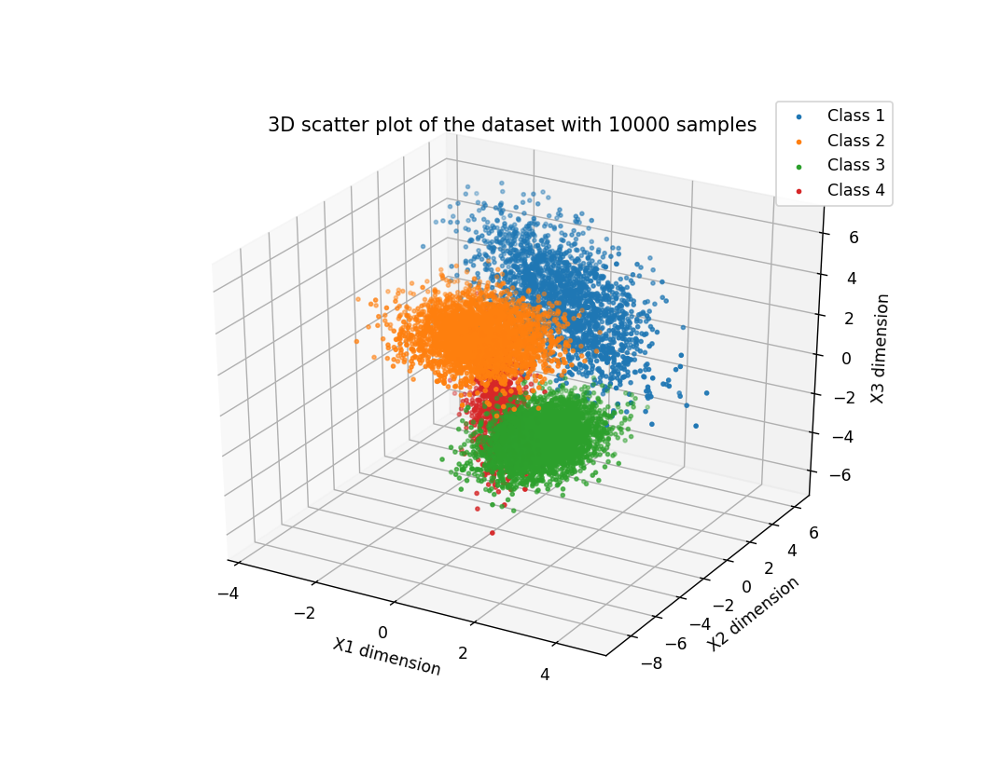

In [156]:
dataset_tenthou, label_tenthou, mle_prob_tenthou = generate_dataset(10000)

In [161]:
best_param_tenthou, param_prob_error_tenthou = k_fold_keras(dataset_tenthou, label_tenthou, [4, 12, 18, 28, 32], epochs=2000)

Train on 9000 samples
Epoch 1/2000
9000/9000 [==============================] - 1s 85us/sample - loss: 1.6116 - accuracy: 0.1362
Epoch 2/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.6054 - accuracy: 0.1368
Epoch 3/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.5992 - accuracy: 0.1372
Epoch 4/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.5930 - accuracy: 0.1373
Epoch 5/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.5870 - accuracy: 0.1377
Epoch 6/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.5810 - accuracy: 0.1378
Epoch 7/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.5750 - accuracy: 0.1379
Epoch 8/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.5691 - accuracy: 0.1380
Epoch 9/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.5633 - accuracy: 0.1378
Epoch 10/2000
9000/9000

Epoch 78/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2760 - accuracy: 0.5249
Epoch 79/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2731 - accuracy: 0.5253
Epoch 80/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2702 - accuracy: 0.5250
Epoch 81/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2673 - accuracy: 0.5207
Epoch 82/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2645 - accuracy: 0.5187
Epoch 83/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2617 - accuracy: 0.5166
Epoch 84/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2589 - accuracy: 0.5141
Epoch 85/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2561 - accuracy: 0.5113
Epoch 86/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2534 - accuracy: 0.5084
Epoch 87/2000
9000/9000 [============

Epoch 155/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1091 - accuracy: 0.4500
Epoch 156/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1075 - accuracy: 0.4500
Epoch 157/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1059 - accuracy: 0.4500
Epoch 158/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1043 - accuracy: 0.4500
Epoch 159/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1028 - accuracy: 0.4500
Epoch 160/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1012 - accuracy: 0.4500
Epoch 161/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0997 - accuracy: 0.4500
Epoch 162/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0981 - accuracy: 0.4500
Epoch 163/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0966 - accuracy: 0.4500
Epoch 164/2000
9000/9000 [==

Epoch 231/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0112 - accuracy: 0.5460
Epoch 232/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0102 - accuracy: 0.5481
Epoch 233/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0091 - accuracy: 0.5511
Epoch 234/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0081 - accuracy: 0.5540
Epoch 235/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0071 - accuracy: 0.5569
Epoch 236/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0061 - accuracy: 0.5590
Epoch 237/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0050 - accuracy: 0.5610
Epoch 238/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0040 - accuracy: 0.5629
Epoch 239/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0030 - accuracy: 0.5656
Epoch 240/2000
9000/9000 [==

Epoch 307/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9439 - accuracy: 0.6849
Epoch 308/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9432 - accuracy: 0.6868
Epoch 309/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.9424 - accuracy: 0.6879
Epoch 310/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9417 - accuracy: 0.6887
Epoch 311/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9409 - accuracy: 0.6907
Epoch 312/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9402 - accuracy: 0.6916
Epoch 313/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9394 - accuracy: 0.6924
Epoch 314/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9387 - accuracy: 0.6936
Epoch 315/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9379 - accuracy: 0.6947
Epoch 316/2000
9000/9000 [==

Epoch 383/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8930 - accuracy: 0.7451
Epoch 384/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8924 - accuracy: 0.7454
Epoch 385/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8918 - accuracy: 0.7456
Epoch 386/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8912 - accuracy: 0.7459
Epoch 387/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8906 - accuracy: 0.7467
Epoch 388/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8900 - accuracy: 0.7472
Epoch 389/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8894 - accuracy: 0.7476
Epoch 390/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8888 - accuracy: 0.7477
Epoch 391/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8883 - accuracy: 0.7482
Epoch 392/2000
9000/9000 [==

Epoch 459/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8518 - accuracy: 0.7623
Epoch 460/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8513 - accuracy: 0.7624
Epoch 461/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8508 - accuracy: 0.7629
Epoch 462/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8503 - accuracy: 0.7630
Epoch 463/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8498 - accuracy: 0.7630
Epoch 464/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8494 - accuracy: 0.7631
Epoch 465/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8489 - accuracy: 0.7632
Epoch 466/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8484 - accuracy: 0.7636
Epoch 467/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8479 - accuracy: 0.7638
Epoch 468/2000
9000/9000 [==

Epoch 535/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8171 - accuracy: 0.7699
Epoch 536/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8167 - accuracy: 0.7699
Epoch 537/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8162 - accuracy: 0.7700
Epoch 538/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8158 - accuracy: 0.7700
Epoch 539/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8154 - accuracy: 0.7700
Epoch 540/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8150 - accuracy: 0.7701
Epoch 541/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8146 - accuracy: 0.7701
Epoch 542/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8141 - accuracy: 0.7703
Epoch 543/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8137 - accuracy: 0.7703
Epoch 544/2000
9000/9000 [==

Epoch 611/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7870 - accuracy: 0.7722
Epoch 612/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7866 - accuracy: 0.7722
Epoch 613/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7862 - accuracy: 0.7722
Epoch 614/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7858 - accuracy: 0.7722
Epoch 615/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7855 - accuracy: 0.7723
Epoch 616/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7851 - accuracy: 0.7724
Epoch 617/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7847 - accuracy: 0.7724
Epoch 618/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7844 - accuracy: 0.7724
Epoch 619/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7840 - accuracy: 0.7724
Epoch 620/2000
9000/9000 [==

Epoch 687/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7603 - accuracy: 0.7740
Epoch 688/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7599 - accuracy: 0.7740
Epoch 689/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7596 - accuracy: 0.7740
Epoch 690/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7593 - accuracy: 0.7740
Epoch 691/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7589 - accuracy: 0.7740
Epoch 692/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7586 - accuracy: 0.7740
Epoch 693/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7583 - accuracy: 0.7740
Epoch 694/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7579 - accuracy: 0.7740
Epoch 695/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7576 - accuracy: 0.7740
Epoch 696/2000
9000/9000 [==

Epoch 763/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7362 - accuracy: 0.7753
Epoch 764/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7359 - accuracy: 0.7753
Epoch 765/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7356 - accuracy: 0.7753
Epoch 766/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7353 - accuracy: 0.7754
Epoch 767/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7350 - accuracy: 0.7754
Epoch 768/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7347 - accuracy: 0.7754
Epoch 769/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7344 - accuracy: 0.7754
Epoch 770/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7341 - accuracy: 0.7754
Epoch 771/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7338 - accuracy: 0.7754
Epoch 772/2000
9000/9000 [==

Epoch 839/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7144 - accuracy: 0.7760
Epoch 840/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7141 - accuracy: 0.7760
Epoch 841/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7139 - accuracy: 0.7760
Epoch 842/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7136 - accuracy: 0.7761
Epoch 843/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7133 - accuracy: 0.7761
Epoch 844/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7131 - accuracy: 0.7761
Epoch 845/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7128 - accuracy: 0.7761
Epoch 846/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7125 - accuracy: 0.7761
Epoch 847/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7122 - accuracy: 0.7761
Epoch 848/2000
9000/9000 [==

Epoch 915/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6944 - accuracy: 0.7764
Epoch 916/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6942 - accuracy: 0.7766
Epoch 917/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6939 - accuracy: 0.7766
Epoch 918/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6937 - accuracy: 0.7766
Epoch 919/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6934 - accuracy: 0.7766
Epoch 920/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6931 - accuracy: 0.7766
Epoch 921/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6929 - accuracy: 0.7766
Epoch 922/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6926 - accuracy: 0.7766
Epoch 923/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6924 - accuracy: 0.7766
Epoch 924/2000
9000/9000 [==

Epoch 991/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6759 - accuracy: 0.7770
Epoch 992/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6757 - accuracy: 0.7770
Epoch 993/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6755 - accuracy: 0.7770
Epoch 994/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6752 - accuracy: 0.7770
Epoch 995/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6750 - accuracy: 0.7770
Epoch 996/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6748 - accuracy: 0.7770
Epoch 997/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6745 - accuracy: 0.7770
Epoch 998/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6743 - accuracy: 0.7770
Epoch 999/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6741 - accuracy: 0.7770
Epoch 1000/2000
9000/9000 [=

Epoch 1067/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6588 - accuracy: 0.7770
Epoch 1068/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6586 - accuracy: 0.7770
Epoch 1069/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6583 - accuracy: 0.7770
Epoch 1070/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6581 - accuracy: 0.7770
Epoch 1071/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6579 - accuracy: 0.7770
Epoch 1072/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6577 - accuracy: 0.7770
Epoch 1073/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6575 - accuracy: 0.7770
Epoch 1074/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6573 - accuracy: 0.7770
Epoch 1075/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6570 - accuracy: 0.7770
Epoch 1076/2000
900

Epoch 1143/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6428 - accuracy: 0.7773
Epoch 1144/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6426 - accuracy: 0.7773
Epoch 1145/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6424 - accuracy: 0.7773
Epoch 1146/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6422 - accuracy: 0.7773
Epoch 1147/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6420 - accuracy: 0.7773
Epoch 1148/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6418 - accuracy: 0.7773
Epoch 1149/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6416 - accuracy: 0.7773
Epoch 1150/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6414 - accuracy: 0.7773
Epoch 1151/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6412 - accuracy: 0.7773
Epoch 1152/2000
900

Epoch 1219/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6278 - accuracy: 0.7776
Epoch 1220/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6276 - accuracy: 0.7776
Epoch 1221/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6274 - accuracy: 0.7776
Epoch 1222/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6272 - accuracy: 0.7776
Epoch 1223/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6270 - accuracy: 0.7776
Epoch 1224/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6268 - accuracy: 0.7777
Epoch 1225/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6266 - accuracy: 0.7777
Epoch 1226/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6264 - accuracy: 0.7777
Epoch 1227/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6263 - accuracy: 0.7777
Epoch 1228/2000
900

Epoch 1295/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6137 - accuracy: 0.7778
Epoch 1296/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6135 - accuracy: 0.7778
Epoch 1297/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6133 - accuracy: 0.7778
Epoch 1298/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6131 - accuracy: 0.7778
Epoch 1299/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6130 - accuracy: 0.7778
Epoch 1300/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6128 - accuracy: 0.7779
Epoch 1301/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6126 - accuracy: 0.7779
Epoch 1302/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6124 - accuracy: 0.7779
Epoch 1303/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6123 - accuracy: 0.7779
Epoch 1304/2000
900

Epoch 1371/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6004 - accuracy: 0.7779
Epoch 1372/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6002 - accuracy: 0.7779
Epoch 1373/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6001 - accuracy: 0.7779
Epoch 1374/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5999 - accuracy: 0.7779
Epoch 1375/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5997 - accuracy: 0.7779
Epoch 1376/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5996 - accuracy: 0.7779
Epoch 1377/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5994 - accuracy: 0.7779
Epoch 1378/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5992 - accuracy: 0.7779
Epoch 1379/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5990 - accuracy: 0.7779
Epoch 1380/2000
900

Epoch 1447/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5878 - accuracy: 0.7781
Epoch 1448/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5877 - accuracy: 0.7781
Epoch 1449/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5875 - accuracy: 0.7781
Epoch 1450/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5874 - accuracy: 0.7781
Epoch 1451/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5872 - accuracy: 0.7781
Epoch 1452/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5870 - accuracy: 0.7781
Epoch 1453/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5869 - accuracy: 0.7781
Epoch 1454/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5867 - accuracy: 0.7781
Epoch 1455/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5866 - accuracy: 0.7781
Epoch 1456/2000
900

Epoch 1523/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5759 - accuracy: 0.7781
Epoch 1524/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5758 - accuracy: 0.7781
Epoch 1525/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5756 - accuracy: 0.7781
Epoch 1526/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5755 - accuracy: 0.7781
Epoch 1527/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5753 - accuracy: 0.7781
Epoch 1528/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5752 - accuracy: 0.7781
Epoch 1529/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5750 - accuracy: 0.7781
Epoch 1530/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5749 - accuracy: 0.7781
Epoch 1531/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5747 - accuracy: 0.7781
Epoch 1532/2000
900

Epoch 1599/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5646 - accuracy: 0.7783
Epoch 1600/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5645 - accuracy: 0.7783
Epoch 1601/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5643 - accuracy: 0.7783
Epoch 1602/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5642 - accuracy: 0.7783
Epoch 1603/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5641 - accuracy: 0.7783
Epoch 1604/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5639 - accuracy: 0.7783
Epoch 1605/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5638 - accuracy: 0.7783
Epoch 1606/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5636 - accuracy: 0.7783
Epoch 1607/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5635 - accuracy: 0.7783
Epoch 1608/2000
900

Epoch 1675/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5539 - accuracy: 0.7784
Epoch 1676/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5537 - accuracy: 0.7784
Epoch 1677/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5536 - accuracy: 0.7784
Epoch 1678/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5535 - accuracy: 0.7784
Epoch 1679/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5533 - accuracy: 0.7784
Epoch 1680/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5532 - accuracy: 0.7784
Epoch 1681/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5531 - accuracy: 0.7784
Epoch 1682/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5529 - accuracy: 0.7784
Epoch 1683/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5528 - accuracy: 0.7784
Epoch 1684/2000
900

Epoch 1751/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5436 - accuracy: 0.7786
Epoch 1752/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5435 - accuracy: 0.7786
Epoch 1753/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5434 - accuracy: 0.7786
Epoch 1754/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5433 - accuracy: 0.7786
Epoch 1755/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5431 - accuracy: 0.7786
Epoch 1756/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5430 - accuracy: 0.7787
Epoch 1757/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5429 - accuracy: 0.7787
Epoch 1758/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5427 - accuracy: 0.7787
Epoch 1759/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5426 - accuracy: 0.7787
Epoch 1760/2000
900

Epoch 1827/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5339 - accuracy: 0.7797
Epoch 1828/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5338 - accuracy: 0.7797
Epoch 1829/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5336 - accuracy: 0.7797
Epoch 1830/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5335 - accuracy: 0.7797
Epoch 1831/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5334 - accuracy: 0.7798
Epoch 1832/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5333 - accuracy: 0.7798
Epoch 1833/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5331 - accuracy: 0.7798
Epoch 1834/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5330 - accuracy: 0.7799
Epoch 1835/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5329 - accuracy: 0.7799
Epoch 1836/2000
900

Epoch 1903/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5245 - accuracy: 0.7870
Epoch 1904/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5244 - accuracy: 0.7870
Epoch 1905/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5243 - accuracy: 0.7870
Epoch 1906/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5242 - accuracy: 0.7871
Epoch 1907/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5241 - accuracy: 0.7871
Epoch 1908/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5239 - accuracy: 0.7871
Epoch 1909/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5238 - accuracy: 0.7873
Epoch 1910/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5237 - accuracy: 0.7879
Epoch 1911/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5236 - accuracy: 0.7880
Epoch 1912/2000
900

Epoch 1979/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5156 - accuracy: 0.7949
Epoch 1980/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5155 - accuracy: 0.7950
Epoch 1981/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5154 - accuracy: 0.7951
Epoch 1982/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5153 - accuracy: 0.7951
Epoch 1983/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5152 - accuracy: 0.7951
Epoch 1984/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5150 - accuracy: 0.7953
Epoch 1985/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5149 - accuracy: 0.7954
Epoch 1986/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5148 - accuracy: 0.7957
Epoch 1987/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5147 - accuracy: 0.7958
Epoch 1988/2000
900

Epoch 55/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3850 - accuracy: 0.2600
Epoch 56/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3798 - accuracy: 0.2674
Epoch 57/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3746 - accuracy: 0.2746
Epoch 58/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3694 - accuracy: 0.2799
Epoch 59/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3643 - accuracy: 0.2876
Epoch 60/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3593 - accuracy: 0.2947
Epoch 61/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3543 - accuracy: 0.2996
Epoch 62/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3493 - accuracy: 0.3070
Epoch 63/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3444 - accuracy: 0.3124
Epoch 64/2000
9000/9000 [============

Epoch 132/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0925 - accuracy: 0.6340
Epoch 133/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0899 - accuracy: 0.6370
Epoch 134/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0872 - accuracy: 0.6397
Epoch 135/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0846 - accuracy: 0.6424
Epoch 136/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0821 - accuracy: 0.6454
Epoch 137/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0795 - accuracy: 0.6476
Epoch 138/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0770 - accuracy: 0.6512
Epoch 139/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0745 - accuracy: 0.6543
Epoch 140/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0720 - accuracy: 0.6568
Epoch 141/2000
9000/9000 [==

Epoch 208/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9426 - accuracy: 0.7664
Epoch 209/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9411 - accuracy: 0.7668
Epoch 210/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9397 - accuracy: 0.7669
Epoch 211/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9383 - accuracy: 0.7674
Epoch 212/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9369 - accuracy: 0.7678
Epoch 213/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9355 - accuracy: 0.7682
Epoch 214/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9341 - accuracy: 0.7682
Epoch 215/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9327 - accuracy: 0.7686
Epoch 216/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9313 - accuracy: 0.7694
Epoch 217/2000
9000/9000 [==

Epoch 284/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8558 - accuracy: 0.7771
Epoch 285/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8549 - accuracy: 0.7771
Epoch 286/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8540 - accuracy: 0.7771
Epoch 287/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8531 - accuracy: 0.7771
Epoch 288/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8522 - accuracy: 0.7771
Epoch 289/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8513 - accuracy: 0.7771
Epoch 290/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8505 - accuracy: 0.7771
Epoch 291/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8496 - accuracy: 0.7772
Epoch 292/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8487 - accuracy: 0.7772
Epoch 293/2000
9000/9000 [==

Epoch 360/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7985 - accuracy: 0.7772
Epoch 361/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7978 - accuracy: 0.7772
Epoch 362/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7972 - accuracy: 0.7772
Epoch 363/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7966 - accuracy: 0.7771
Epoch 364/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7960 - accuracy: 0.7771
Epoch 365/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7953 - accuracy: 0.7771
Epoch 366/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7947 - accuracy: 0.7771
Epoch 367/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7941 - accuracy: 0.7771
Epoch 368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7935 - accuracy: 0.7771
Epoch 369/2000
9000/9000 [==

Epoch 436/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7563 - accuracy: 0.7768
Epoch 437/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7559 - accuracy: 0.7768
Epoch 438/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7554 - accuracy: 0.7768
Epoch 439/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7549 - accuracy: 0.7768
Epoch 440/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7544 - accuracy: 0.7768
Epoch 441/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7539 - accuracy: 0.7768
Epoch 442/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7535 - accuracy: 0.7768
Epoch 443/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7530 - accuracy: 0.7768
Epoch 444/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7525 - accuracy: 0.7768
Epoch 445/2000
9000/9000 [==

Epoch 512/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7231 - accuracy: 0.7768
Epoch 513/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7227 - accuracy: 0.7768
Epoch 514/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7223 - accuracy: 0.7768
Epoch 515/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7220 - accuracy: 0.7768
Epoch 516/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7216 - accuracy: 0.7768
Epoch 517/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7212 - accuracy: 0.7768
Epoch 518/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7208 - accuracy: 0.7768
Epoch 519/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7204 - accuracy: 0.7768
Epoch 520/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7200 - accuracy: 0.7768
Epoch 521/2000
9000/9000 [==

Epoch 588/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6957 - accuracy: 0.7769
Epoch 589/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6954 - accuracy: 0.7769
Epoch 590/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6951 - accuracy: 0.7769
Epoch 591/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6947 - accuracy: 0.7769
Epoch 592/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6944 - accuracy: 0.7770
Epoch 593/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6941 - accuracy: 0.7770
Epoch 594/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6938 - accuracy: 0.7770
Epoch 595/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6934 - accuracy: 0.7770
Epoch 596/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6931 - accuracy: 0.7770
Epoch 597/2000
9000/9000 [==

Epoch 664/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6724 - accuracy: 0.7771
Epoch 665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6721 - accuracy: 0.7771
Epoch 666/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6718 - accuracy: 0.7771
Epoch 667/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6716 - accuracy: 0.7771
Epoch 668/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6713 - accuracy: 0.7771
Epoch 669/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6710 - accuracy: 0.7771
Epoch 670/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6707 - accuracy: 0.7771
Epoch 671/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6704 - accuracy: 0.7771
Epoch 672/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6701 - accuracy: 0.7771
Epoch 673/2000
9000/9000 [==

Epoch 740/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6521 - accuracy: 0.7772
Epoch 741/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6518 - accuracy: 0.7772
Epoch 742/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6516 - accuracy: 0.7772
Epoch 743/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6513 - accuracy: 0.7772
Epoch 744/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6511 - accuracy: 0.7772
Epoch 745/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6508 - accuracy: 0.7772
Epoch 746/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6506 - accuracy: 0.7772
Epoch 747/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6503 - accuracy: 0.7772
Epoch 748/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6501 - accuracy: 0.7772
Epoch 749/2000
9000/9000 [==

Epoch 816/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6341 - accuracy: 0.7772
Epoch 817/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6338 - accuracy: 0.7772
Epoch 818/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6336 - accuracy: 0.7772
Epoch 819/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6334 - accuracy: 0.7772
Epoch 820/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6332 - accuracy: 0.7772
Epoch 821/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6330 - accuracy: 0.7772
Epoch 822/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6327 - accuracy: 0.7772
Epoch 823/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6325 - accuracy: 0.7772
Epoch 824/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6323 - accuracy: 0.7772
Epoch 825/2000
9000/9000 [==

Epoch 892/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6179 - accuracy: 0.7773
Epoch 893/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6176 - accuracy: 0.7773
Epoch 894/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6174 - accuracy: 0.7773
Epoch 895/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6172 - accuracy: 0.7773
Epoch 896/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6170 - accuracy: 0.7773
Epoch 897/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6168 - accuracy: 0.7773
Epoch 898/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6166 - accuracy: 0.7773
Epoch 899/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6164 - accuracy: 0.7773
Epoch 900/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6162 - accuracy: 0.7773
Epoch 901/2000
9000/9000 [==

Epoch 968/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6031 - accuracy: 0.7773
Epoch 969/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6029 - accuracy: 0.7773
Epoch 970/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6027 - accuracy: 0.7773
Epoch 971/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6025 - accuracy: 0.7773
Epoch 972/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6023 - accuracy: 0.7773
Epoch 973/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6021 - accuracy: 0.7773
Epoch 974/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6020 - accuracy: 0.7773
Epoch 975/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6018 - accuracy: 0.7773
Epoch 976/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6016 - accuracy: 0.7773
Epoch 977/2000
9000/9000 [==

Epoch 1044/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5895 - accuracy: 0.7773
Epoch 1045/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5893 - accuracy: 0.7773
Epoch 1046/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5891 - accuracy: 0.7773
Epoch 1047/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5889 - accuracy: 0.7773
Epoch 1048/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5888 - accuracy: 0.7773
Epoch 1049/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5886 - accuracy: 0.7773
Epoch 1050/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5884 - accuracy: 0.7773
Epoch 1051/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5883 - accuracy: 0.7773
Epoch 1052/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5881 - accuracy: 0.7773
Epoch 1053/2000
900

Epoch 1120/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5768 - accuracy: 0.7773
Epoch 1121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5767 - accuracy: 0.7773
Epoch 1122/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5765 - accuracy: 0.7773
Epoch 1123/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5764 - accuracy: 0.7773
Epoch 1124/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5762 - accuracy: 0.7773
Epoch 1125/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5760 - accuracy: 0.7773
Epoch 1126/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5759 - accuracy: 0.7773
Epoch 1127/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5757 - accuracy: 0.7773
Epoch 1128/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5756 - accuracy: 0.7773
Epoch 1129/2000
900

Epoch 1196/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5650 - accuracy: 0.7774
Epoch 1197/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5649 - accuracy: 0.7774
Epoch 1198/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5647 - accuracy: 0.7774
Epoch 1199/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5646 - accuracy: 0.7774
Epoch 1200/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5644 - accuracy: 0.7774
Epoch 1201/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5643 - accuracy: 0.7774
Epoch 1202/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5641 - accuracy: 0.7774
Epoch 1203/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5640 - accuracy: 0.7774
Epoch 1204/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5638 - accuracy: 0.7774
Epoch 1205/2000
900

Epoch 1272/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5540 - accuracy: 0.7776
Epoch 1273/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5538 - accuracy: 0.7776
Epoch 1274/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5537 - accuracy: 0.7776
Epoch 1275/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5535 - accuracy: 0.7776
Epoch 1276/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5534 - accuracy: 0.7776
Epoch 1277/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5532 - accuracy: 0.7776
Epoch 1278/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5531 - accuracy: 0.7776
Epoch 1279/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5530 - accuracy: 0.7776
Epoch 1280/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5528 - accuracy: 0.7776
Epoch 1281/2000
900

Epoch 1348/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5435 - accuracy: 0.7778
Epoch 1349/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5433 - accuracy: 0.7778
Epoch 1350/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5432 - accuracy: 0.7778
Epoch 1351/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5431 - accuracy: 0.7778
Epoch 1352/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5429 - accuracy: 0.7778
Epoch 1353/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5428 - accuracy: 0.7778
Epoch 1354/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5427 - accuracy: 0.7778
Epoch 1355/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5425 - accuracy: 0.7778
Epoch 1356/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5424 - accuracy: 0.7778
Epoch 1357/2000
900

Epoch 1424/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5335 - accuracy: 0.7786
Epoch 1425/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5334 - accuracy: 0.7786
Epoch 1426/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5333 - accuracy: 0.7786
Epoch 1427/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5332 - accuracy: 0.7786
Epoch 1428/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5330 - accuracy: 0.7787
Epoch 1429/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5329 - accuracy: 0.7787
Epoch 1430/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5328 - accuracy: 0.7788
Epoch 1431/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5326 - accuracy: 0.7788
Epoch 1432/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5325 - accuracy: 0.7788
Epoch 1433/2000
900

Epoch 1500/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5241 - accuracy: 0.7797
Epoch 1501/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5240 - accuracy: 0.7797
Epoch 1502/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5238 - accuracy: 0.7797
Epoch 1503/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5237 - accuracy: 0.7797
Epoch 1504/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5236 - accuracy: 0.7797
Epoch 1505/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5235 - accuracy: 0.7797
Epoch 1506/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5233 - accuracy: 0.7797
Epoch 1507/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5232 - accuracy: 0.7797
Epoch 1508/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5231 - accuracy: 0.7798
Epoch 1509/2000
900

Epoch 1576/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5150 - accuracy: 0.7821
Epoch 1577/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5149 - accuracy: 0.7822
Epoch 1578/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5148 - accuracy: 0.7822
Epoch 1579/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5147 - accuracy: 0.7823
Epoch 1580/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5146 - accuracy: 0.7824
Epoch 1581/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5145 - accuracy: 0.7824
Epoch 1582/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5143 - accuracy: 0.7824
Epoch 1583/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5142 - accuracy: 0.7824
Epoch 1584/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5141 - accuracy: 0.7827
Epoch 1585/2000
900

Epoch 1652/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5064 - accuracy: 0.7882
Epoch 1653/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5063 - accuracy: 0.7882
Epoch 1654/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5062 - accuracy: 0.7887
Epoch 1655/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5060 - accuracy: 0.7888
Epoch 1656/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5059 - accuracy: 0.7888
Epoch 1657/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5058 - accuracy: 0.7888
Epoch 1658/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5057 - accuracy: 0.7888
Epoch 1659/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5056 - accuracy: 0.7889
Epoch 1660/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5055 - accuracy: 0.7890
Epoch 1661/2000
900

Epoch 1728/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4981 - accuracy: 0.7953
Epoch 1729/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4980 - accuracy: 0.7954
Epoch 1730/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4979 - accuracy: 0.7953
Epoch 1731/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4978 - accuracy: 0.7953
Epoch 1732/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4976 - accuracy: 0.7954
Epoch 1733/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4975 - accuracy: 0.7956
Epoch 1734/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4974 - accuracy: 0.7956
Epoch 1735/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4973 - accuracy: 0.7957
Epoch 1736/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4972 - accuracy: 0.7957
Epoch 1737/2000
900

Epoch 1804/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4901 - accuracy: 0.8023
Epoch 1805/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4900 - accuracy: 0.8024
Epoch 1806/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4899 - accuracy: 0.8026
Epoch 1807/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4898 - accuracy: 0.8027
Epoch 1808/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4897 - accuracy: 0.8029
Epoch 1809/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4896 - accuracy: 0.8029
Epoch 1810/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4895 - accuracy: 0.8031
Epoch 1811/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4894 - accuracy: 0.8031
Epoch 1812/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4893 - accuracy: 0.8031
Epoch 1813/2000
900

Epoch 1880/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4824 - accuracy: 0.8099
Epoch 1881/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4823 - accuracy: 0.8100
Epoch 1882/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4822 - accuracy: 0.8100
Epoch 1883/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4821 - accuracy: 0.8104
Epoch 1884/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4820 - accuracy: 0.8104
Epoch 1885/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4819 - accuracy: 0.8104
Epoch 1886/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4818 - accuracy: 0.8104
Epoch 1887/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4817 - accuracy: 0.8104
Epoch 1888/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4816 - accuracy: 0.8104
Epoch 1889/2000
900

Epoch 1956/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4750 - accuracy: 0.8170
Epoch 1957/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4749 - accuracy: 0.8171
Epoch 1958/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4748 - accuracy: 0.8173
Epoch 1959/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4747 - accuracy: 0.8173
Epoch 1960/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4746 - accuracy: 0.8173
Epoch 1961/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4745 - accuracy: 0.8173
Epoch 1962/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4744 - accuracy: 0.8173
Epoch 1963/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4743 - accuracy: 0.8173
Epoch 1964/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4742 - accuracy: 0.8173
Epoch 1965/2000
900

Epoch 31/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0452 - accuracy: 0.6689
Epoch 32/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0436 - accuracy: 0.6697
Epoch 33/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0421 - accuracy: 0.6707
Epoch 34/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0405 - accuracy: 0.6720
Epoch 35/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0390 - accuracy: 0.6738
Epoch 36/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0375 - accuracy: 0.6746
Epoch 37/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0360 - accuracy: 0.6754
Epoch 38/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0345 - accuracy: 0.6771
Epoch 39/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0331 - accuracy: 0.6784
Epoch 40/2000
9000/9000 [============

Epoch 108/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9559 - accuracy: 0.6834
Epoch 109/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9550 - accuracy: 0.6832
Epoch 110/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9542 - accuracy: 0.6832
Epoch 111/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9533 - accuracy: 0.6830
Epoch 112/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9525 - accuracy: 0.6830
Epoch 113/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9516 - accuracy: 0.6831
Epoch 114/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9508 - accuracy: 0.6828
Epoch 115/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9500 - accuracy: 0.6824
Epoch 116/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9492 - accuracy: 0.6823
Epoch 117/2000
9000/9000 [==

Epoch 184/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9031 - accuracy: 0.6838
Epoch 185/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9025 - accuracy: 0.6841
Epoch 186/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9019 - accuracy: 0.6844
Epoch 187/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9014 - accuracy: 0.6846
Epoch 188/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9008 - accuracy: 0.6846
Epoch 189/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9002 - accuracy: 0.6847
Epoch 190/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8997 - accuracy: 0.6847
Epoch 191/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8991 - accuracy: 0.6847
Epoch 192/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8986 - accuracy: 0.6848
Epoch 193/2000
9000/9000 [==

Epoch 260/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8654 - accuracy: 0.6980
Epoch 261/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8649 - accuracy: 0.6979
Epoch 262/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8645 - accuracy: 0.6978
Epoch 263/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8641 - accuracy: 0.6980
Epoch 264/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8636 - accuracy: 0.6980
Epoch 265/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8632 - accuracy: 0.6983
Epoch 266/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8628 - accuracy: 0.6983
Epoch 267/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8624 - accuracy: 0.6986
Epoch 268/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8619 - accuracy: 0.6987
Epoch 269/2000
9000/9000 [==

Epoch 336/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8354 - accuracy: 0.7083
Epoch 337/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8351 - accuracy: 0.7084
Epoch 338/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8347 - accuracy: 0.7087
Epoch 339/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8343 - accuracy: 0.7089
Epoch 340/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8340 - accuracy: 0.7091
Epoch 341/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8336 - accuracy: 0.7091
Epoch 342/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8333 - accuracy: 0.7093
Epoch 343/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8329 - accuracy: 0.7098
Epoch 344/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8326 - accuracy: 0.7099
Epoch 345/2000
9000/9000 [==

Epoch 412/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8102 - accuracy: 0.7178
Epoch 413/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8099 - accuracy: 0.7178
Epoch 414/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8096 - accuracy: 0.7180
Epoch 415/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8093 - accuracy: 0.7183
Epoch 416/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8090 - accuracy: 0.7186
Epoch 417/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8087 - accuracy: 0.7188
Epoch 418/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8084 - accuracy: 0.7190
Epoch 419/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8081 - accuracy: 0.7193
Epoch 420/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8078 - accuracy: 0.7193
Epoch 421/2000
9000/9000 [==

Epoch 488/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7883 - accuracy: 0.7282
Epoch 489/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7880 - accuracy: 0.7282
Epoch 490/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7878 - accuracy: 0.7282
Epoch 491/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7875 - accuracy: 0.7282
Epoch 492/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7872 - accuracy: 0.7284
Epoch 493/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7870 - accuracy: 0.7284
Epoch 494/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7867 - accuracy: 0.7284
Epoch 495/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7864 - accuracy: 0.7284
Epoch 496/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7861 - accuracy: 0.7286
Epoch 497/2000
9000/9000 [==

Epoch 564/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7690 - accuracy: 0.7352
Epoch 565/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7687 - accuracy: 0.7353
Epoch 566/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7685 - accuracy: 0.7354
Epoch 567/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7682 - accuracy: 0.7354
Epoch 568/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7680 - accuracy: 0.7354
Epoch 569/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7678 - accuracy: 0.7356
Epoch 570/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7675 - accuracy: 0.7357
Epoch 571/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7673 - accuracy: 0.7358
Epoch 572/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7670 - accuracy: 0.7360
Epoch 573/2000
9000/9000 [==

Epoch 640/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7517 - accuracy: 0.7428
Epoch 641/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7515 - accuracy: 0.7428
Epoch 642/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7512 - accuracy: 0.7429
Epoch 643/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7510 - accuracy: 0.7428
Epoch 644/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7508 - accuracy: 0.7429
Epoch 645/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7506 - accuracy: 0.7432
Epoch 646/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7504 - accuracy: 0.7433
Epoch 647/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7502 - accuracy: 0.7436
Epoch 648/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7500 - accuracy: 0.7436
Epoch 649/2000
9000/9000 [==

Epoch 716/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7361 - accuracy: 0.7482
Epoch 717/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7359 - accuracy: 0.7482
Epoch 718/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7357 - accuracy: 0.7482
Epoch 719/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7355 - accuracy: 0.7481
Epoch 720/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7353 - accuracy: 0.7481
Epoch 721/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7351 - accuracy: 0.7481
Epoch 722/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7349 - accuracy: 0.7481
Epoch 723/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7347 - accuracy: 0.7482
Epoch 724/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7346 - accuracy: 0.7483
Epoch 725/2000
9000/9000 [==

Epoch 792/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7220 - accuracy: 0.7532
Epoch 793/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7218 - accuracy: 0.7533
Epoch 794/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7216 - accuracy: 0.7533
Epoch 795/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7215 - accuracy: 0.7533
Epoch 796/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7213 - accuracy: 0.7533
Epoch 797/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7211 - accuracy: 0.7534
Epoch 798/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7209 - accuracy: 0.7534
Epoch 799/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7207 - accuracy: 0.7536
Epoch 800/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7206 - accuracy: 0.7538
Epoch 801/2000
9000/9000 [==

Epoch 868/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7091 - accuracy: 0.7572
Epoch 869/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7089 - accuracy: 0.7573
Epoch 870/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7088 - accuracy: 0.7573
Epoch 871/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7086 - accuracy: 0.7573
Epoch 872/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7084 - accuracy: 0.7574
Epoch 873/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7083 - accuracy: 0.7574
Epoch 874/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7081 - accuracy: 0.7574
Epoch 875/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7080 - accuracy: 0.7576
Epoch 876/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7078 - accuracy: 0.7576
Epoch 877/2000
9000/9000 [==

Epoch 944/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6972 - accuracy: 0.7616
Epoch 945/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6971 - accuracy: 0.7616
Epoch 946/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6969 - accuracy: 0.7614
Epoch 947/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6968 - accuracy: 0.7616
Epoch 948/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6966 - accuracy: 0.7616
Epoch 949/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6965 - accuracy: 0.7616
Epoch 950/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6963 - accuracy: 0.7617
Epoch 951/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6962 - accuracy: 0.7619
Epoch 952/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6960 - accuracy: 0.7619
Epoch 953/2000
9000/9000 [==

Epoch 1020/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6863 - accuracy: 0.7649
Epoch 1021/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6861 - accuracy: 0.7649
Epoch 1022/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6860 - accuracy: 0.7649
Epoch 1023/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6859 - accuracy: 0.7649
Epoch 1024/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6857 - accuracy: 0.7649
Epoch 1025/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6856 - accuracy: 0.7649
Epoch 1026/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6855 - accuracy: 0.7650
Epoch 1027/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6853 - accuracy: 0.7650
Epoch 1028/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6852 - accuracy: 0.7651
Epoch 1029/2000
900

Epoch 1096/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6761 - accuracy: 0.7679
Epoch 1097/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.6760 - accuracy: 0.7679
Epoch 1098/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6758 - accuracy: 0.7680
Epoch 1099/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6757 - accuracy: 0.7681
Epoch 1100/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6756 - accuracy: 0.7681
Epoch 1101/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6755 - accuracy: 0.7682
Epoch 1102/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6753 - accuracy: 0.7683
Epoch 1103/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6752 - accuracy: 0.7683
Epoch 1104/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6751 - accuracy: 0.7683
Epoch 1105/2000
9000

Epoch 1172/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6666 - accuracy: 0.7708
Epoch 1173/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6665 - accuracy: 0.7708
Epoch 1174/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6663 - accuracy: 0.7708
Epoch 1175/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6662 - accuracy: 0.7708
Epoch 1176/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6661 - accuracy: 0.7708
Epoch 1177/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6660 - accuracy: 0.7708
Epoch 1178/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6659 - accuracy: 0.7709
Epoch 1179/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6657 - accuracy: 0.7709
Epoch 1180/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6656 - accuracy: 0.7709
Epoch 1181/2000
900

Epoch 1248/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6576 - accuracy: 0.7731
Epoch 1249/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6575 - accuracy: 0.7731
Epoch 1250/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6574 - accuracy: 0.7731
Epoch 1251/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6573 - accuracy: 0.7731
Epoch 1252/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6572 - accuracy: 0.7733
Epoch 1253/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6571 - accuracy: 0.7733
Epoch 1254/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6570 - accuracy: 0.7734
Epoch 1255/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6569 - accuracy: 0.7734
Epoch 1256/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6567 - accuracy: 0.7734
Epoch 1257/2000
900

Epoch 1324/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6492 - accuracy: 0.7767
Epoch 1325/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6491 - accuracy: 0.7767
Epoch 1326/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6490 - accuracy: 0.7767
Epoch 1327/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6489 - accuracy: 0.7768
Epoch 1328/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6488 - accuracy: 0.7768
Epoch 1329/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6487 - accuracy: 0.7768
Epoch 1330/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6486 - accuracy: 0.7769
Epoch 1331/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6484 - accuracy: 0.7769
Epoch 1332/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6483 - accuracy: 0.7769
Epoch 1333/2000
900

Epoch 1400/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6412 - accuracy: 0.7797
Epoch 1401/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6411 - accuracy: 0.7798
Epoch 1402/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6410 - accuracy: 0.7799
Epoch 1403/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6409 - accuracy: 0.7799
Epoch 1404/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6408 - accuracy: 0.7799
Epoch 1405/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6407 - accuracy: 0.7799
Epoch 1406/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6406 - accuracy: 0.7800
Epoch 1407/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6405 - accuracy: 0.7800
Epoch 1408/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6404 - accuracy: 0.7801
Epoch 1409/2000
900

Epoch 1476/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6335 - accuracy: 0.7837
Epoch 1477/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6334 - accuracy: 0.7837
Epoch 1478/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6333 - accuracy: 0.7838
Epoch 1479/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6332 - accuracy: 0.7838
Epoch 1480/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6331 - accuracy: 0.7838
Epoch 1481/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6331 - accuracy: 0.7838
Epoch 1482/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6330 - accuracy: 0.7839
Epoch 1483/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6329 - accuracy: 0.7839
Epoch 1484/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6328 - accuracy: 0.7839
Epoch 1485/2000
900

Epoch 1552/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6262 - accuracy: 0.7860
Epoch 1553/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6261 - accuracy: 0.7860
Epoch 1554/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6260 - accuracy: 0.7861
Epoch 1555/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6259 - accuracy: 0.7861
Epoch 1556/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6258 - accuracy: 0.7861
Epoch 1557/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6257 - accuracy: 0.7861
Epoch 1558/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6257 - accuracy: 0.7861
Epoch 1559/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6256 - accuracy: 0.7861
Epoch 1560/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6255 - accuracy: 0.7861
Epoch 1561/2000
900

Epoch 1628/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6192 - accuracy: 0.7890
Epoch 1629/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6191 - accuracy: 0.7890
Epoch 1630/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6190 - accuracy: 0.7890
Epoch 1631/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6189 - accuracy: 0.7890
Epoch 1632/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6188 - accuracy: 0.7892
Epoch 1633/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6187 - accuracy: 0.7892
Epoch 1634/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6186 - accuracy: 0.7892
Epoch 1635/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6185 - accuracy: 0.7892
Epoch 1636/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6184 - accuracy: 0.7893
Epoch 1637/2000
900

Epoch 1704/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6124 - accuracy: 0.7918
Epoch 1705/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6123 - accuracy: 0.7920
Epoch 1706/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6122 - accuracy: 0.7920
Epoch 1707/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6121 - accuracy: 0.7921
Epoch 1708/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6120 - accuracy: 0.7921
Epoch 1709/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6119 - accuracy: 0.7921
Epoch 1710/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6118 - accuracy: 0.7921
Epoch 1711/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6117 - accuracy: 0.7921
Epoch 1712/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6117 - accuracy: 0.7921
Epoch 1713/2000
900

Epoch 1780/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6057 - accuracy: 0.7949
Epoch 1781/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6057 - accuracy: 0.7949
Epoch 1782/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6056 - accuracy: 0.7949
Epoch 1783/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6055 - accuracy: 0.7949
Epoch 1784/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6054 - accuracy: 0.7951
Epoch 1785/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6053 - accuracy: 0.7951
Epoch 1786/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6052 - accuracy: 0.7951
Epoch 1787/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6051 - accuracy: 0.7951
Epoch 1788/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6051 - accuracy: 0.7951
Epoch 1789/2000
900

Epoch 1856/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5993 - accuracy: 0.7981
Epoch 1857/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5992 - accuracy: 0.7981
Epoch 1858/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5991 - accuracy: 0.7982
Epoch 1859/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5991 - accuracy: 0.7983
Epoch 1860/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5990 - accuracy: 0.7983
Epoch 1861/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5989 - accuracy: 0.7983
Epoch 1862/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5988 - accuracy: 0.7983
Epoch 1863/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5987 - accuracy: 0.7986
Epoch 1864/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5986 - accuracy: 0.7986
Epoch 1865/2000
900

Epoch 1932/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5930 - accuracy: 0.8008
Epoch 1933/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5930 - accuracy: 0.8008
Epoch 1934/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5929 - accuracy: 0.8008
Epoch 1935/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5928 - accuracy: 0.8008
Epoch 1936/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5927 - accuracy: 0.8008
Epoch 1937/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5926 - accuracy: 0.8008
Epoch 1938/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5925 - accuracy: 0.8009
Epoch 1939/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5925 - accuracy: 0.8009
Epoch 1940/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5924 - accuracy: 0.8009
Epoch 1941/2000
900

Epoch 7/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4972 - accuracy: 0.1113
Epoch 8/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4921 - accuracy: 0.1113
Epoch 9/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4870 - accuracy: 0.1113
Epoch 10/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4819 - accuracy: 0.1113
Epoch 11/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4769 - accuracy: 0.1113
Epoch 12/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4720 - accuracy: 0.1113
Epoch 13/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4671 - accuracy: 0.1113
Epoch 14/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4622 - accuracy: 0.1113
Epoch 15/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4574 - accuracy: 0.1114
Epoch 16/2000
9000/9000 [===============

Epoch 84/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2145 - accuracy: 0.4644
Epoch 85/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2119 - accuracy: 0.4744
Epoch 86/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2094 - accuracy: 0.4861
Epoch 87/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2069 - accuracy: 0.4984
Epoch 88/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2045 - accuracy: 0.5079
Epoch 89/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2020 - accuracy: 0.5182
Epoch 90/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1996 - accuracy: 0.5306
Epoch 91/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1972 - accuracy: 0.5414
Epoch 92/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1948 - accuracy: 0.5532
Epoch 93/2000
9000/9000 [============

9000/9000 [==============================] - 0s 0us/sample - loss: 1.0695 - accuracy: 0.8478
Epoch 161/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0681 - accuracy: 0.8481
Epoch 162/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0667 - accuracy: 0.8484
Epoch 163/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0653 - accuracy: 0.8489
Epoch 164/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0639 - accuracy: 0.8493
Epoch 165/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0625 - accuracy: 0.8500
Epoch 166/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0612 - accuracy: 0.8506
Epoch 167/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0598 - accuracy: 0.8510
Epoch 168/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0585 - accuracy: 0.8514
Epoch 169/2000
9000/9000 [=================

Epoch 236/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9831 - accuracy: 0.8560
Epoch 237/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9822 - accuracy: 0.8559
Epoch 238/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9813 - accuracy: 0.8559
Epoch 239/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9804 - accuracy: 0.8559
Epoch 240/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9795 - accuracy: 0.8558
Epoch 241/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9786 - accuracy: 0.8558
Epoch 242/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9777 - accuracy: 0.8558
Epoch 243/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9768 - accuracy: 0.8559
Epoch 244/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9759 - accuracy: 0.8560
Epoch 245/2000
9000/9000 [==

Epoch 312/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9237 - accuracy: 0.8541
Epoch 313/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9231 - accuracy: 0.8541
Epoch 314/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9224 - accuracy: 0.8541
Epoch 315/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9217 - accuracy: 0.8541
Epoch 316/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9211 - accuracy: 0.8540
Epoch 317/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9204 - accuracy: 0.8539
Epoch 318/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9197 - accuracy: 0.8539
Epoch 319/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9191 - accuracy: 0.8539
Epoch 320/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9184 - accuracy: 0.8540
Epoch 321/2000
9000/9000 [==

Epoch 388/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8781 - accuracy: 0.8527
Epoch 389/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8776 - accuracy: 0.8527
Epoch 390/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8771 - accuracy: 0.8527
Epoch 391/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8765 - accuracy: 0.8527
Epoch 392/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8760 - accuracy: 0.8527
Epoch 393/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8755 - accuracy: 0.8528
Epoch 394/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8749 - accuracy: 0.8528
Epoch 395/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8744 - accuracy: 0.8530
Epoch 396/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8739 - accuracy: 0.8530
Epoch 397/2000
9000/9000 [==

Epoch 464/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8407 - accuracy: 0.8527
Epoch 465/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8402 - accuracy: 0.8526
Epoch 466/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8398 - accuracy: 0.8524
Epoch 467/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8393 - accuracy: 0.8524
Epoch 468/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8389 - accuracy: 0.8524
Epoch 469/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8384 - accuracy: 0.8524
Epoch 470/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8380 - accuracy: 0.8524
Epoch 471/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8375 - accuracy: 0.8524
Epoch 472/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8371 - accuracy: 0.8524
Epoch 473/2000
9000/9000 [==

Epoch 540/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8087 - accuracy: 0.8523
Epoch 541/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8083 - accuracy: 0.8523
Epoch 542/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8079 - accuracy: 0.8523
Epoch 543/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8076 - accuracy: 0.8523
Epoch 544/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8072 - accuracy: 0.8523
Epoch 545/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8068 - accuracy: 0.8523
Epoch 546/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8064 - accuracy: 0.8523
Epoch 547/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8060 - accuracy: 0.8523
Epoch 548/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8056 - accuracy: 0.8523
Epoch 549/2000
9000/9000 [==

Epoch 616/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7808 - accuracy: 0.8526
Epoch 617/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7805 - accuracy: 0.8526
Epoch 618/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7802 - accuracy: 0.8524
Epoch 619/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7798 - accuracy: 0.8524
Epoch 620/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7795 - accuracy: 0.8524
Epoch 621/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7791 - accuracy: 0.8524
Epoch 622/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7788 - accuracy: 0.8524
Epoch 623/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7785 - accuracy: 0.8524
Epoch 624/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7781 - accuracy: 0.8524
Epoch 625/2000
9000/9000 [==

Epoch 692/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7562 - accuracy: 0.8528
Epoch 693/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7559 - accuracy: 0.8528
Epoch 694/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7556 - accuracy: 0.8528
Epoch 695/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7553 - accuracy: 0.8528
Epoch 696/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7550 - accuracy: 0.8528
Epoch 697/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7547 - accuracy: 0.8529
Epoch 698/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7544 - accuracy: 0.8529
Epoch 699/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7541 - accuracy: 0.8529
Epoch 700/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7538 - accuracy: 0.8529
Epoch 701/2000
9000/9000 [==

Epoch 768/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7341 - accuracy: 0.8529
Epoch 769/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7339 - accuracy: 0.8529
Epoch 770/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7336 - accuracy: 0.8529
Epoch 771/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7333 - accuracy: 0.8530
Epoch 772/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7330 - accuracy: 0.8530
Epoch 773/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7328 - accuracy: 0.8530
Epoch 774/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7325 - accuracy: 0.8530
Epoch 775/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7322 - accuracy: 0.8530
Epoch 776/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7320 - accuracy: 0.8530
Epoch 777/2000
9000/9000 [==

Epoch 844/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7142 - accuracy: 0.8531
Epoch 845/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7140 - accuracy: 0.8531
Epoch 846/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7137 - accuracy: 0.8531
Epoch 847/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7135 - accuracy: 0.8531
Epoch 848/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7132 - accuracy: 0.8531
Epoch 849/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7130 - accuracy: 0.8531
Epoch 850/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7128 - accuracy: 0.8531
Epoch 851/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7125 - accuracy: 0.8531
Epoch 852/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7123 - accuracy: 0.8531
Epoch 853/2000
9000/9000 [==

Epoch 920/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6961 - accuracy: 0.8536
Epoch 921/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6959 - accuracy: 0.8536
Epoch 922/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6957 - accuracy: 0.8536
Epoch 923/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6954 - accuracy: 0.8536
Epoch 924/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6952 - accuracy: 0.8536
Epoch 925/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6950 - accuracy: 0.8536
Epoch 926/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6948 - accuracy: 0.8536
Epoch 927/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6945 - accuracy: 0.8536
Epoch 928/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6943 - accuracy: 0.8536
Epoch 929/2000
9000/9000 [==

Epoch 996/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6795 - accuracy: 0.8539
Epoch 997/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6793 - accuracy: 0.8540
Epoch 998/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6791 - accuracy: 0.8540
Epoch 999/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6789 - accuracy: 0.8540
Epoch 1000/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6787 - accuracy: 0.8541
Epoch 1001/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6785 - accuracy: 0.8541
Epoch 1002/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6783 - accuracy: 0.8541
Epoch 1003/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6780 - accuracy: 0.8540
Epoch 1004/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6778 - accuracy: 0.8540
Epoch 1005/2000
9000/90

Epoch 1072/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6642 - accuracy: 0.8542
Epoch 1073/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6640 - accuracy: 0.8542
Epoch 1074/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6638 - accuracy: 0.8542
Epoch 1075/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6636 - accuracy: 0.8542
Epoch 1076/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6634 - accuracy: 0.8542
Epoch 1077/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6632 - accuracy: 0.8542
Epoch 1078/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6630 - accuracy: 0.8542
Epoch 1079/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6628 - accuracy: 0.8542
Epoch 1080/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6626 - accuracy: 0.8542
Epoch 1081/2000
900

Epoch 1148/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6499 - accuracy: 0.8551
Epoch 1149/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6497 - accuracy: 0.8551
Epoch 1150/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6495 - accuracy: 0.8551
Epoch 1151/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6493 - accuracy: 0.8551
Epoch 1152/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6492 - accuracy: 0.8551
Epoch 1153/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6490 - accuracy: 0.8551
Epoch 1154/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6488 - accuracy: 0.8551
Epoch 1155/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6486 - accuracy: 0.8551
Epoch 1156/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6484 - accuracy: 0.8552
Epoch 1157/2000
900

Epoch 1224/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6366 - accuracy: 0.8557
Epoch 1225/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6364 - accuracy: 0.8557
Epoch 1226/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6362 - accuracy: 0.8557
Epoch 1227/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6360 - accuracy: 0.8557
Epoch 1228/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6359 - accuracy: 0.8557
Epoch 1229/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6357 - accuracy: 0.8557
Epoch 1230/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6355 - accuracy: 0.8557
Epoch 1231/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6354 - accuracy: 0.8556
Epoch 1232/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6352 - accuracy: 0.8556
Epoch 1233/2000
900

Epoch 1300/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6240 - accuracy: 0.8556
Epoch 1301/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6239 - accuracy: 0.8556
Epoch 1302/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6237 - accuracy: 0.8556
Epoch 1303/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6236 - accuracy: 0.8556
Epoch 1304/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6234 - accuracy: 0.8556
Epoch 1305/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6232 - accuracy: 0.8556
Epoch 1306/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6231 - accuracy: 0.8556
Epoch 1307/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6229 - accuracy: 0.8556
Epoch 1308/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6228 - accuracy: 0.8556
Epoch 1309/2000
900

Epoch 1376/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6122 - accuracy: 0.8561
Epoch 1377/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6121 - accuracy: 0.8561
Epoch 1378/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6119 - accuracy: 0.8561
Epoch 1379/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6118 - accuracy: 0.8561
Epoch 1380/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6116 - accuracy: 0.8561
Epoch 1381/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6115 - accuracy: 0.8561
Epoch 1382/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6113 - accuracy: 0.8561
Epoch 1383/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6112 - accuracy: 0.8561
Epoch 1384/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6110 - accuracy: 0.8561
Epoch 1385/2000
900

Epoch 1452/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6011 - accuracy: 0.8564
Epoch 1453/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6009 - accuracy: 0.8564
Epoch 1454/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6008 - accuracy: 0.8564
Epoch 1455/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6007 - accuracy: 0.8564
Epoch 1456/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6005 - accuracy: 0.8564
Epoch 1457/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6004 - accuracy: 0.8564
Epoch 1458/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6002 - accuracy: 0.8564
Epoch 1459/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6001 - accuracy: 0.8564
Epoch 1460/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5999 - accuracy: 0.8564
Epoch 1461/2000
900

Epoch 1528/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5905 - accuracy: 0.8567
Epoch 1529/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5904 - accuracy: 0.8567
Epoch 1530/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5902 - accuracy: 0.8567
Epoch 1531/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5901 - accuracy: 0.8567
Epoch 1532/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5900 - accuracy: 0.8567
Epoch 1533/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5898 - accuracy: 0.8568
Epoch 1534/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5897 - accuracy: 0.8568
Epoch 1535/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5896 - accuracy: 0.8568
Epoch 1536/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5894 - accuracy: 0.8568
Epoch 1537/2000
900

Epoch 1604/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5805 - accuracy: 0.8572
Epoch 1605/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5803 - accuracy: 0.8572
Epoch 1606/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5802 - accuracy: 0.8572
Epoch 1607/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5801 - accuracy: 0.8572
Epoch 1608/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5800 - accuracy: 0.8572
Epoch 1609/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5798 - accuracy: 0.8573
Epoch 1610/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5797 - accuracy: 0.8573
Epoch 1611/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5796 - accuracy: 0.8573
Epoch 1612/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5794 - accuracy: 0.8573
Epoch 1613/2000
900

Epoch 1680/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5709 - accuracy: 0.8577
Epoch 1681/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5708 - accuracy: 0.8577
Epoch 1682/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5707 - accuracy: 0.8577
Epoch 1683/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5706 - accuracy: 0.8577
Epoch 1684/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5704 - accuracy: 0.8577
Epoch 1685/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5703 - accuracy: 0.8577
Epoch 1686/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5702 - accuracy: 0.8577
Epoch 1687/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5701 - accuracy: 0.8577
Epoch 1688/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5699 - accuracy: 0.8577
Epoch 1689/2000
900

Epoch 1756/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5618 - accuracy: 0.8582
Epoch 1757/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5617 - accuracy: 0.8582
Epoch 1758/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5616 - accuracy: 0.8582
Epoch 1759/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5615 - accuracy: 0.8582
Epoch 1760/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5614 - accuracy: 0.8582
Epoch 1761/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5612 - accuracy: 0.8582
Epoch 1762/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5611 - accuracy: 0.8582
Epoch 1763/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5610 - accuracy: 0.8582
Epoch 1764/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5609 - accuracy: 0.8582
Epoch 1765/2000
900

Epoch 1832/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5532 - accuracy: 0.8586
Epoch 1833/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5530 - accuracy: 0.8586
Epoch 1834/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5529 - accuracy: 0.8586
Epoch 1835/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5528 - accuracy: 0.8586
Epoch 1836/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5527 - accuracy: 0.8586
Epoch 1837/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5526 - accuracy: 0.8586
Epoch 1838/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5525 - accuracy: 0.8586
Epoch 1839/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5524 - accuracy: 0.8586
Epoch 1840/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5523 - accuracy: 0.8586
Epoch 1841/2000
900

Epoch 1908/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5449 - accuracy: 0.8584
Epoch 1909/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5448 - accuracy: 0.8584
Epoch 1910/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5447 - accuracy: 0.8584
Epoch 1911/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5446 - accuracy: 0.8584
Epoch 1912/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5445 - accuracy: 0.8584
Epoch 1913/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5444 - accuracy: 0.8584
Epoch 1914/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5442 - accuracy: 0.8584
Epoch 1915/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5441 - accuracy: 0.8584
Epoch 1916/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5440 - accuracy: 0.8583
Epoch 1917/2000
900

Epoch 1984/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5370 - accuracy: 0.8582
Epoch 1985/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5369 - accuracy: 0.8582
Epoch 1986/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5368 - accuracy: 0.8582
Epoch 1987/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5367 - accuracy: 0.8582
Epoch 1988/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5366 - accuracy: 0.8582
Epoch 1989/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5365 - accuracy: 0.8582
Epoch 1990/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5364 - accuracy: 0.8582
Epoch 1991/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5363 - accuracy: 0.8582
Epoch 1992/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5362 - accuracy: 0.8582
Epoch 1993/2000
900

Epoch 60/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3025 - accuracy: 0.1090
Epoch 61/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3000 - accuracy: 0.1549
Epoch 62/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2975 - accuracy: 0.1861
Epoch 63/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2951 - accuracy: 0.2092
Epoch 64/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2927 - accuracy: 0.2288
Epoch 65/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2903 - accuracy: 0.2454
Epoch 66/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2879 - accuracy: 0.2596
Epoch 67/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2855 - accuracy: 0.2726
Epoch 68/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2832 - accuracy: 0.2839
Epoch 69/2000
9000/9000 [============

Epoch 137/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1594 - accuracy: 0.4747
Epoch 138/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1580 - accuracy: 0.4754
Epoch 139/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1566 - accuracy: 0.4762
Epoch 140/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1553 - accuracy: 0.4767
Epoch 141/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1539 - accuracy: 0.4777
Epoch 142/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1526 - accuracy: 0.4799
Epoch 143/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1513 - accuracy: 0.4812
Epoch 144/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1499 - accuracy: 0.4821
Epoch 145/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1486 - accuracy: 0.4839
Epoch 146/2000
9000/9000 [==

Epoch 213/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0748 - accuracy: 0.6256
Epoch 214/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0739 - accuracy: 0.6262
Epoch 215/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0730 - accuracy: 0.6288
Epoch 216/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0721 - accuracy: 0.6287
Epoch 217/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0712 - accuracy: 0.6304
Epoch 218/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0703 - accuracy: 0.6317
Epoch 219/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0694 - accuracy: 0.6321
Epoch 220/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0685 - accuracy: 0.6337
Epoch 221/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0676 - accuracy: 0.6340
Epoch 222/2000
9000/9000 [==

Epoch 289/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0140 - accuracy: 0.6746
Epoch 290/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0133 - accuracy: 0.6754
Epoch 291/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0126 - accuracy: 0.6753
Epoch 292/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0119 - accuracy: 0.6753
Epoch 293/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0112 - accuracy: 0.6754
Epoch 294/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0104 - accuracy: 0.6762
Epoch 295/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0097 - accuracy: 0.6767
Epoch 296/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0090 - accuracy: 0.6764
Epoch 297/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0083 - accuracy: 0.6772
Epoch 298/2000
9000/9000 [==

Epoch 365/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9643 - accuracy: 0.7031
Epoch 366/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9637 - accuracy: 0.7036
Epoch 367/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9631 - accuracy: 0.7040
Epoch 368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9624 - accuracy: 0.7044
Epoch 369/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9618 - accuracy: 0.7048
Epoch 370/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9612 - accuracy: 0.7053
Epoch 371/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9606 - accuracy: 0.7058
Epoch 372/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9600 - accuracy: 0.7059
Epoch 373/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9594 - accuracy: 0.7061
Epoch 374/2000
9000/9000 [==

Epoch 441/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9208 - accuracy: 0.7270
Epoch 442/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9203 - accuracy: 0.7273
Epoch 443/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9198 - accuracy: 0.7277
Epoch 444/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9192 - accuracy: 0.7283
Epoch 445/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9187 - accuracy: 0.7287
Epoch 446/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9181 - accuracy: 0.7294
Epoch 447/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9176 - accuracy: 0.7297
Epoch 448/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9171 - accuracy: 0.7302
Epoch 449/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9165 - accuracy: 0.7304
Epoch 450/2000
9000/9000 [==

Epoch 517/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8816 - accuracy: 0.7523
Epoch 518/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8811 - accuracy: 0.7527
Epoch 519/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8806 - accuracy: 0.7531
Epoch 520/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8802 - accuracy: 0.7533
Epoch 521/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8797 - accuracy: 0.7534
Epoch 522/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8792 - accuracy: 0.7536
Epoch 523/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8787 - accuracy: 0.7537
Epoch 524/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8782 - accuracy: 0.7540
Epoch 525/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8777 - accuracy: 0.7543
Epoch 526/2000
9000/9000 [==

Epoch 593/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8457 - accuracy: 0.7770
Epoch 594/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8452 - accuracy: 0.7778
Epoch 595/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8448 - accuracy: 0.7781
Epoch 596/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8443 - accuracy: 0.7782
Epoch 597/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8438 - accuracy: 0.7788
Epoch 598/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8434 - accuracy: 0.7791
Epoch 599/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8429 - accuracy: 0.7793
Epoch 600/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8425 - accuracy: 0.7794
Epoch 601/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8420 - accuracy: 0.7796
Epoch 602/2000
9000/9000 [==

Epoch 669/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8124 - accuracy: 0.8007
Epoch 670/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8119 - accuracy: 0.8009
Epoch 671/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8115 - accuracy: 0.8011
Epoch 672/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8111 - accuracy: 0.8016
Epoch 673/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8107 - accuracy: 0.8018
Epoch 674/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8103 - accuracy: 0.8021
Epoch 675/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8098 - accuracy: 0.8024
Epoch 676/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8094 - accuracy: 0.8029
Epoch 677/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8090 - accuracy: 0.8029
Epoch 678/2000
9000/9000 [==

Epoch 745/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7814 - accuracy: 0.8192
Epoch 746/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7810 - accuracy: 0.8192
Epoch 747/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7806 - accuracy: 0.8192
Epoch 748/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7802 - accuracy: 0.8193
Epoch 749/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7798 - accuracy: 0.8197
Epoch 750/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7794 - accuracy: 0.8200
Epoch 751/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7790 - accuracy: 0.8200
Epoch 752/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7786 - accuracy: 0.8202
Epoch 753/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7782 - accuracy: 0.8202
Epoch 754/2000
9000/9000 [==

Epoch 821/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7525 - accuracy: 0.8324
Epoch 822/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7521 - accuracy: 0.8328
Epoch 823/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7517 - accuracy: 0.8329
Epoch 824/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7514 - accuracy: 0.8328
Epoch 825/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7510 - accuracy: 0.8331
Epoch 826/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7506 - accuracy: 0.8332
Epoch 827/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7503 - accuracy: 0.8333
Epoch 828/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7499 - accuracy: 0.8334
Epoch 829/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7495 - accuracy: 0.8336
Epoch 830/2000
9000/9000 [==

Epoch 897/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7254 - accuracy: 0.8411
Epoch 898/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7251 - accuracy: 0.8412
Epoch 899/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7247 - accuracy: 0.8412
Epoch 900/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7244 - accuracy: 0.8414
Epoch 901/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7241 - accuracy: 0.8417
Epoch 902/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7237 - accuracy: 0.8418
Epoch 903/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7234 - accuracy: 0.8419
Epoch 904/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7230 - accuracy: 0.8421
Epoch 905/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7227 - accuracy: 0.8422
Epoch 906/2000
9000/9000 [==

Epoch 973/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7001 - accuracy: 0.8497
Epoch 974/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6998 - accuracy: 0.8498
Epoch 975/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6995 - accuracy: 0.8498
Epoch 976/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6991 - accuracy: 0.8498
Epoch 977/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6988 - accuracy: 0.8500
Epoch 978/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6985 - accuracy: 0.8500
Epoch 979/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6982 - accuracy: 0.8500
Epoch 980/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6979 - accuracy: 0.8501
Epoch 981/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6975 - accuracy: 0.8502
Epoch 982/2000
9000/9000 [==

Epoch 1049/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6764 - accuracy: 0.8550
Epoch 1050/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6761 - accuracy: 0.8552
Epoch 1051/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6758 - accuracy: 0.8552
Epoch 1052/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6755 - accuracy: 0.8552
Epoch 1053/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6752 - accuracy: 0.8552
Epoch 1054/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6749 - accuracy: 0.8553
Epoch 1055/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6746 - accuracy: 0.8554
Epoch 1056/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6743 - accuracy: 0.8554
Epoch 1057/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6740 - accuracy: 0.8556
Epoch 1058/2000
900

Epoch 1125/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6541 - accuracy: 0.8596
Epoch 1126/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6538 - accuracy: 0.8597
Epoch 1127/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6535 - accuracy: 0.8597
Epoch 1128/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6532 - accuracy: 0.8597
Epoch 1129/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6529 - accuracy: 0.8599
Epoch 1130/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6527 - accuracy: 0.8599
Epoch 1131/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6524 - accuracy: 0.8599
Epoch 1132/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6521 - accuracy: 0.8599
Epoch 1133/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6518 - accuracy: 0.8599
Epoch 1134/2000
900

Epoch 1201/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6332 - accuracy: 0.8623
Epoch 1202/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6329 - accuracy: 0.8623
Epoch 1203/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6326 - accuracy: 0.8623
Epoch 1204/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6324 - accuracy: 0.8624
Epoch 1205/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6321 - accuracy: 0.8624
Epoch 1206/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6318 - accuracy: 0.8624
Epoch 1207/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6316 - accuracy: 0.8624
Epoch 1208/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6313 - accuracy: 0.8626
Epoch 1209/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6310 - accuracy: 0.8626
Epoch 1210/2000
900

Epoch 1277/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6135 - accuracy: 0.8656
Epoch 1278/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6132 - accuracy: 0.8656
Epoch 1279/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6130 - accuracy: 0.8656
Epoch 1280/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6127 - accuracy: 0.8656
Epoch 1281/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6125 - accuracy: 0.8656
Epoch 1282/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6122 - accuracy: 0.8656
Epoch 1283/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6120 - accuracy: 0.8656
Epoch 1284/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6117 - accuracy: 0.8657
Epoch 1285/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6115 - accuracy: 0.8657
Epoch 1286/2000
900

Epoch 1353/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5950 - accuracy: 0.8670
Epoch 1354/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5948 - accuracy: 0.8671
Epoch 1355/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5945 - accuracy: 0.8671
Epoch 1356/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5943 - accuracy: 0.8671
Epoch 1357/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5940 - accuracy: 0.8671
Epoch 1358/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5938 - accuracy: 0.8671
Epoch 1359/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5936 - accuracy: 0.8672
Epoch 1360/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5933 - accuracy: 0.8672
Epoch 1361/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5931 - accuracy: 0.8671
Epoch 1362/2000
900

Epoch 1429/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5776 - accuracy: 0.8689
Epoch 1430/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5774 - accuracy: 0.8689
Epoch 1431/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5771 - accuracy: 0.8690
Epoch 1432/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5769 - accuracy: 0.8691
Epoch 1433/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5767 - accuracy: 0.8691
Epoch 1434/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5765 - accuracy: 0.8690
Epoch 1435/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5763 - accuracy: 0.8690
Epoch 1436/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5760 - accuracy: 0.8690
Epoch 1437/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5758 - accuracy: 0.8691
Epoch 1438/2000
900

Epoch 1505/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5612 - accuracy: 0.8702
Epoch 1506/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5610 - accuracy: 0.8702
Epoch 1507/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5608 - accuracy: 0.8702
Epoch 1508/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5606 - accuracy: 0.8702
Epoch 1509/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5604 - accuracy: 0.8703
Epoch 1510/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5601 - accuracy: 0.8703
Epoch 1511/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5599 - accuracy: 0.8703
Epoch 1512/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5597 - accuracy: 0.8704
Epoch 1513/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5595 - accuracy: 0.8706
Epoch 1514/2000
900

Epoch 1581/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5457 - accuracy: 0.8728
Epoch 1582/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5455 - accuracy: 0.8728
Epoch 1583/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5453 - accuracy: 0.8728
Epoch 1584/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5452 - accuracy: 0.8728
Epoch 1585/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5450 - accuracy: 0.8728
Epoch 1586/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5448 - accuracy: 0.8728
Epoch 1587/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5446 - accuracy: 0.8728
Epoch 1588/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5444 - accuracy: 0.8729
Epoch 1589/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5442 - accuracy: 0.8728
Epoch 1590/2000
900

Epoch 1657/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5312 - accuracy: 0.8743
Epoch 1658/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5310 - accuracy: 0.8743
Epoch 1659/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5308 - accuracy: 0.8743
Epoch 1660/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5306 - accuracy: 0.8743
Epoch 1661/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5304 - accuracy: 0.8743
Epoch 1662/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5302 - accuracy: 0.8743
Epoch 1663/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5301 - accuracy: 0.8743
Epoch 1664/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5299 - accuracy: 0.8743
Epoch 1665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5297 - accuracy: 0.8743
Epoch 1666/2000
900

Epoch 1733/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5174 - accuracy: 0.8766
Epoch 1734/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5173 - accuracy: 0.8766
Epoch 1735/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5171 - accuracy: 0.8766
Epoch 1736/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5169 - accuracy: 0.8767
Epoch 1737/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5167 - accuracy: 0.8767
Epoch 1738/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5166 - accuracy: 0.8768
Epoch 1739/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5164 - accuracy: 0.8768
Epoch 1740/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5162 - accuracy: 0.8768
Epoch 1741/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5160 - accuracy: 0.8768
Epoch 1742/2000
900

Epoch 1809/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5044 - accuracy: 0.8788
Epoch 1810/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5043 - accuracy: 0.8788
Epoch 1811/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5041 - accuracy: 0.8789
Epoch 1812/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5039 - accuracy: 0.8789
Epoch 1813/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5038 - accuracy: 0.8791
Epoch 1814/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5036 - accuracy: 0.8792
Epoch 1815/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5035 - accuracy: 0.8792
Epoch 1816/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5033 - accuracy: 0.8793
Epoch 1817/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5031 - accuracy: 0.8794
Epoch 1818/2000
900

Epoch 1885/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4922 - accuracy: 0.8814
Epoch 1886/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4920 - accuracy: 0.8816
Epoch 1887/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4919 - accuracy: 0.8816
Epoch 1888/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4917 - accuracy: 0.8816
Epoch 1889/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4915 - accuracy: 0.8816
Epoch 1890/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4914 - accuracy: 0.8816
Epoch 1891/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4912 - accuracy: 0.8816
Epoch 1892/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4911 - accuracy: 0.8816
Epoch 1893/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4909 - accuracy: 0.8816
Epoch 1894/2000
900

Epoch 1961/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4806 - accuracy: 0.8854
Epoch 1962/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4804 - accuracy: 0.8857
Epoch 1963/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4803 - accuracy: 0.8857
Epoch 1964/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4801 - accuracy: 0.8858
Epoch 1965/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4800 - accuracy: 0.8859
Epoch 1966/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4798 - accuracy: 0.8859
Epoch 1967/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4797 - accuracy: 0.8859
Epoch 1968/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4795 - accuracy: 0.8859
Epoch 1969/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4794 - accuracy: 0.8859
Epoch 1970/2000
900

Epoch 36/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4712 - accuracy: 0.0682
Epoch 37/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4674 - accuracy: 0.0681
Epoch 38/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4637 - accuracy: 0.0684
Epoch 39/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4599 - accuracy: 0.0692
Epoch 40/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4562 - accuracy: 0.0679
Epoch 41/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4526 - accuracy: 0.0696
Epoch 42/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4490 - accuracy: 0.0709
Epoch 43/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4454 - accuracy: 0.0702
Epoch 44/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4418 - accuracy: 0.0722
Epoch 45/2000
9000/9000 [============

Epoch 113/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2608 - accuracy: 0.3778
Epoch 114/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2589 - accuracy: 0.3780
Epoch 115/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2570 - accuracy: 0.3781
Epoch 116/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2551 - accuracy: 0.3791
Epoch 117/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2532 - accuracy: 0.3800
Epoch 118/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2513 - accuracy: 0.3808
Epoch 119/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2494 - accuracy: 0.3816
Epoch 120/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2476 - accuracy: 0.3824
Epoch 121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2458 - accuracy: 0.3837
Epoch 122/2000
9000/9000 [==

Epoch 189/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1463 - accuracy: 0.6628
Epoch 190/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1451 - accuracy: 0.6631
Epoch 191/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1440 - accuracy: 0.6634
Epoch 192/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1428 - accuracy: 0.6634
Epoch 193/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1416 - accuracy: 0.6636
Epoch 194/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1405 - accuracy: 0.6637
Epoch 195/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1393 - accuracy: 0.6639
Epoch 196/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1382 - accuracy: 0.6641
Epoch 197/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1371 - accuracy: 0.6642
Epoch 198/2000
9000/9000 [==

Epoch 265/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0713 - accuracy: 0.6666
Epoch 266/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0705 - accuracy: 0.6666
Epoch 267/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0697 - accuracy: 0.6666
Epoch 268/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0688 - accuracy: 0.6666
Epoch 269/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0680 - accuracy: 0.6666
Epoch 270/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0672 - accuracy: 0.6666
Epoch 271/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0664 - accuracy: 0.6666
Epoch 272/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0656 - accuracy: 0.6666
Epoch 273/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0647 - accuracy: 0.6667
Epoch 274/2000
9000/9000 [==

Epoch 341/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0155 - accuracy: 0.6671
Epoch 342/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0149 - accuracy: 0.6671
Epoch 343/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0142 - accuracy: 0.6671
Epoch 344/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0136 - accuracy: 0.6671
Epoch 345/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0129 - accuracy: 0.6671
Epoch 346/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0123 - accuracy: 0.6671
Epoch 347/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0116 - accuracy: 0.6671
Epoch 348/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0110 - accuracy: 0.6671
Epoch 349/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0104 - accuracy: 0.6671
Epoch 350/2000
9000/9000 [==

Epoch 417/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9703 - accuracy: 0.6677
Epoch 418/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9698 - accuracy: 0.6677
Epoch 419/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9692 - accuracy: 0.6677
Epoch 420/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9687 - accuracy: 0.6677
Epoch 421/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9682 - accuracy: 0.6677
Epoch 422/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9676 - accuracy: 0.6677
Epoch 423/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9671 - accuracy: 0.6677
Epoch 424/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9665 - accuracy: 0.6677
Epoch 425/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9660 - accuracy: 0.6677
Epoch 426/2000
9000/9000 [==

Epoch 493/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9317 - accuracy: 0.6677
Epoch 494/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9312 - accuracy: 0.6677
Epoch 495/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9308 - accuracy: 0.6677
Epoch 496/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9303 - accuracy: 0.6677
Epoch 497/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9298 - accuracy: 0.6677
Epoch 498/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9293 - accuracy: 0.6677
Epoch 499/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9289 - accuracy: 0.6677
Epoch 500/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9284 - accuracy: 0.6677
Epoch 501/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9279 - accuracy: 0.6677
Epoch 502/2000
9000/9000 [==

Epoch 569/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8976 - accuracy: 0.6677
Epoch 570/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8972 - accuracy: 0.6677
Epoch 571/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8967 - accuracy: 0.6677
Epoch 572/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8963 - accuracy: 0.6677
Epoch 573/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8959 - accuracy: 0.6677
Epoch 574/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8955 - accuracy: 0.6677
Epoch 575/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8950 - accuracy: 0.6677
Epoch 576/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8946 - accuracy: 0.6677
Epoch 577/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8942 - accuracy: 0.6677
Epoch 578/2000
9000/9000 [==

Epoch 645/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8668 - accuracy: 0.6677
Epoch 646/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8664 - accuracy: 0.6677
Epoch 647/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8660 - accuracy: 0.6677
Epoch 648/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8656 - accuracy: 0.6677
Epoch 649/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8652 - accuracy: 0.6677
Epoch 650/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8648 - accuracy: 0.6677
Epoch 651/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8644 - accuracy: 0.6677
Epoch 652/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8641 - accuracy: 0.6677
Epoch 653/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8637 - accuracy: 0.6677
Epoch 654/2000
9000/9000 [==

Epoch 721/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8385 - accuracy: 0.6677
Epoch 722/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8381 - accuracy: 0.6677
Epoch 723/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8378 - accuracy: 0.6677
Epoch 724/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8374 - accuracy: 0.6677
Epoch 725/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8371 - accuracy: 0.6677
Epoch 726/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8367 - accuracy: 0.6677
Epoch 727/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8364 - accuracy: 0.6677
Epoch 728/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8360 - accuracy: 0.6677
Epoch 729/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8356 - accuracy: 0.6677
Epoch 730/2000
9000/9000 [==

Epoch 797/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8123 - accuracy: 0.6677
Epoch 798/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8120 - accuracy: 0.6677
Epoch 799/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8116 - accuracy: 0.6677
Epoch 800/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8113 - accuracy: 0.6677
Epoch 801/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8110 - accuracy: 0.6677
Epoch 802/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8107 - accuracy: 0.6677
Epoch 803/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8103 - accuracy: 0.6677
Epoch 804/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8100 - accuracy: 0.6677
Epoch 805/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8097 - accuracy: 0.6677
Epoch 806/2000
9000/9000 [==

Epoch 873/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7879 - accuracy: 0.6677
Epoch 874/2000
9000/9000 [==============================] - 0s 3us/sample - loss: 0.7876 - accuracy: 0.6677
Epoch 875/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7873 - accuracy: 0.6677
Epoch 876/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7869 - accuracy: 0.6677
Epoch 877/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7866 - accuracy: 0.6677
Epoch 878/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7863 - accuracy: 0.6677
Epoch 879/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7860 - accuracy: 0.6677
Epoch 880/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7857 - accuracy: 0.6677
Epoch 881/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7854 - accuracy: 0.6677
Epoch 882/2000
9000/9000 [==

Epoch 949/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7650 - accuracy: 0.6677
Epoch 950/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7647 - accuracy: 0.6677
Epoch 951/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7644 - accuracy: 0.6677
Epoch 952/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7641 - accuracy: 0.6677
Epoch 953/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7638 - accuracy: 0.6677
Epoch 954/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7635 - accuracy: 0.6677
Epoch 955/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7632 - accuracy: 0.6677
Epoch 956/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7629 - accuracy: 0.6677
Epoch 957/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7626 - accuracy: 0.6677
Epoch 958/2000
9000/9000 [==

Epoch 1025/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7434 - accuracy: 0.6677
Epoch 1026/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7431 - accuracy: 0.6677
Epoch 1027/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7428 - accuracy: 0.6677
Epoch 1028/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7425 - accuracy: 0.6677
Epoch 1029/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7423 - accuracy: 0.6677
Epoch 1030/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7420 - accuracy: 0.6677
Epoch 1031/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7417 - accuracy: 0.6677
Epoch 1032/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7414 - accuracy: 0.6677
Epoch 1033/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7412 - accuracy: 0.6677
Epoch 1034/2000
900

Epoch 1101/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7230 - accuracy: 0.6677
Epoch 1102/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7227 - accuracy: 0.6677
Epoch 1103/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7224 - accuracy: 0.6677
Epoch 1104/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7222 - accuracy: 0.6677
Epoch 1105/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7219 - accuracy: 0.6677
Epoch 1106/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7217 - accuracy: 0.6677
Epoch 1107/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7214 - accuracy: 0.6677
Epoch 1108/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7211 - accuracy: 0.6677
Epoch 1109/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7209 - accuracy: 0.6677
Epoch 1110/2000
900

Epoch 1177/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7037 - accuracy: 0.6677
Epoch 1178/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7034 - accuracy: 0.6677
Epoch 1179/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7032 - accuracy: 0.6678
Epoch 1180/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7029 - accuracy: 0.6678
Epoch 1181/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7027 - accuracy: 0.6678
Epoch 1182/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7024 - accuracy: 0.6678
Epoch 1183/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7022 - accuracy: 0.6678
Epoch 1184/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7019 - accuracy: 0.6678
Epoch 1185/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7017 - accuracy: 0.6678
Epoch 1186/2000
900

Epoch 1253/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6854 - accuracy: 0.6697
Epoch 1254/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6851 - accuracy: 0.6702
Epoch 1255/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6849 - accuracy: 0.6706
Epoch 1256/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6847 - accuracy: 0.6709
Epoch 1257/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6844 - accuracy: 0.6716
Epoch 1258/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6842 - accuracy: 0.6720
Epoch 1259/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6840 - accuracy: 0.6721
Epoch 1260/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6837 - accuracy: 0.6722
Epoch 1261/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6835 - accuracy: 0.6728
Epoch 1262/2000
900

Epoch 1329/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6680 - accuracy: 0.7146
Epoch 1330/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6678 - accuracy: 0.7152
Epoch 1331/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6675 - accuracy: 0.7160
Epoch 1332/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6673 - accuracy: 0.7169
Epoch 1333/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6671 - accuracy: 0.7177
Epoch 1334/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6669 - accuracy: 0.7183
Epoch 1335/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6666 - accuracy: 0.7190
Epoch 1336/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6664 - accuracy: 0.7193
Epoch 1337/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6662 - accuracy: 0.7199
Epoch 1338/2000
900

Epoch 1405/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6515 - accuracy: 0.7579
Epoch 1406/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6513 - accuracy: 0.7581
Epoch 1407/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6510 - accuracy: 0.7586
Epoch 1408/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6508 - accuracy: 0.7590
Epoch 1409/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6506 - accuracy: 0.7597
Epoch 1410/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6504 - accuracy: 0.7602
Epoch 1411/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6502 - accuracy: 0.7606
Epoch 1412/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6500 - accuracy: 0.7611
Epoch 1413/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6498 - accuracy: 0.7614
Epoch 1414/2000
900

Epoch 1481/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6358 - accuracy: 0.7860
Epoch 1482/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6355 - accuracy: 0.7860
Epoch 1483/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6353 - accuracy: 0.7862
Epoch 1484/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6351 - accuracy: 0.7867
Epoch 1485/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6349 - accuracy: 0.7868
Epoch 1486/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6347 - accuracy: 0.7871
Epoch 1487/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6345 - accuracy: 0.7874
Epoch 1488/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6343 - accuracy: 0.7874
Epoch 1489/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6341 - accuracy: 0.7874
Epoch 1490/2000
900

Epoch 1557/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6208 - accuracy: 0.8013
Epoch 1558/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6206 - accuracy: 0.8017
Epoch 1559/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6204 - accuracy: 0.8020
Epoch 1560/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6202 - accuracy: 0.8020
Epoch 1561/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6200 - accuracy: 0.8022
Epoch 1562/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6198 - accuracy: 0.8023
Epoch 1563/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6196 - accuracy: 0.8024
Epoch 1564/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6194 - accuracy: 0.8027
Epoch 1565/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6193 - accuracy: 0.8027
Epoch 1566/2000
900

Epoch 1633/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6065 - accuracy: 0.8142
Epoch 1634/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6063 - accuracy: 0.8146
Epoch 1635/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6062 - accuracy: 0.8148
Epoch 1636/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6060 - accuracy: 0.8148
Epoch 1637/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6058 - accuracy: 0.8148
Epoch 1638/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6056 - accuracy: 0.8151
Epoch 1639/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6054 - accuracy: 0.8152
Epoch 1640/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6053 - accuracy: 0.8156
Epoch 1641/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6051 - accuracy: 0.8153
Epoch 1642/2000
900

Epoch 1709/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5929 - accuracy: 0.8224
Epoch 1710/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5928 - accuracy: 0.8227
Epoch 1711/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5926 - accuracy: 0.8229
Epoch 1712/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5924 - accuracy: 0.8230
Epoch 1713/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5922 - accuracy: 0.8231
Epoch 1714/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5921 - accuracy: 0.8234
Epoch 1715/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5919 - accuracy: 0.8234
Epoch 1716/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5917 - accuracy: 0.8234
Epoch 1717/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5915 - accuracy: 0.8233
Epoch 1718/2000
900

Epoch 1785/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5800 - accuracy: 0.8291
Epoch 1786/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5798 - accuracy: 0.8293
Epoch 1787/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5796 - accuracy: 0.8296
Epoch 1788/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5795 - accuracy: 0.8297
Epoch 1789/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5793 - accuracy: 0.8296
Epoch 1790/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5791 - accuracy: 0.8296
Epoch 1791/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5790 - accuracy: 0.8297
Epoch 1792/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5788 - accuracy: 0.8297
Epoch 1793/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5786 - accuracy: 0.8297
Epoch 1794/2000
900

Epoch 1861/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5676 - accuracy: 0.8336
Epoch 1862/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5674 - accuracy: 0.8336
Epoch 1863/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5673 - accuracy: 0.8337
Epoch 1864/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5671 - accuracy: 0.8337
Epoch 1865/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5670 - accuracy: 0.8338
Epoch 1866/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5668 - accuracy: 0.8338
Epoch 1867/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5666 - accuracy: 0.8338
Epoch 1868/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5665 - accuracy: 0.8338
Epoch 1869/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5663 - accuracy: 0.8339
Epoch 1870/2000
900

Epoch 1937/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5558 - accuracy: 0.8374
Epoch 1938/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5556 - accuracy: 0.8374
Epoch 1939/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5555 - accuracy: 0.8374
Epoch 1940/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5553 - accuracy: 0.8374
Epoch 1941/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5552 - accuracy: 0.8374
Epoch 1942/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5550 - accuracy: 0.8373
Epoch 1943/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5549 - accuracy: 0.8373
Epoch 1944/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5547 - accuracy: 0.8376
Epoch 1945/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5546 - accuracy: 0.8378
Epoch 1946/2000
900

Epoch 12/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2215 - accuracy: 0.3800
Epoch 13/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2201 - accuracy: 0.3831
Epoch 14/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2187 - accuracy: 0.3859
Epoch 15/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2172 - accuracy: 0.3892
Epoch 16/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2158 - accuracy: 0.3926
Epoch 17/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2144 - accuracy: 0.3953
Epoch 18/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2130 - accuracy: 0.3980
Epoch 19/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2117 - accuracy: 0.4010
Epoch 20/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2103 - accuracy: 0.4056
Epoch 21/2000
9000/9000 [============

Epoch 89/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1277 - accuracy: 0.6162
Epoch 90/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1266 - accuracy: 0.6170
Epoch 91/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1256 - accuracy: 0.6180
Epoch 92/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1246 - accuracy: 0.6193
Epoch 93/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1235 - accuracy: 0.6202
Epoch 94/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1225 - accuracy: 0.6209
Epoch 95/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1215 - accuracy: 0.6219
Epoch 96/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1205 - accuracy: 0.6224
Epoch 97/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1195 - accuracy: 0.6234
Epoch 98/2000
9000/9000 [============

Epoch 165/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0584 - accuracy: 0.6518
Epoch 166/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0576 - accuracy: 0.6520
Epoch 167/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0568 - accuracy: 0.6524
Epoch 168/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0560 - accuracy: 0.6526
Epoch 169/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0552 - accuracy: 0.6526
Epoch 170/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0545 - accuracy: 0.6528
Epoch 171/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0537 - accuracy: 0.6530
Epoch 172/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0529 - accuracy: 0.6531
Epoch 173/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0521 - accuracy: 0.6531
Epoch 174/2000
9000/9000 [==

Epoch 241/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0041 - accuracy: 0.6594
Epoch 242/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0034 - accuracy: 0.6596
Epoch 243/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0028 - accuracy: 0.6597
Epoch 244/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0022 - accuracy: 0.6597
Epoch 245/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0015 - accuracy: 0.6597
Epoch 246/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0009 - accuracy: 0.6597
Epoch 247/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0003 - accuracy: 0.6597
Epoch 248/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9996 - accuracy: 0.6597
Epoch 249/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9990 - accuracy: 0.6597
Epoch 250/2000
9000/9000 [==

Epoch 317/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9593 - accuracy: 0.6608
Epoch 318/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9587 - accuracy: 0.6608
Epoch 319/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9582 - accuracy: 0.6608
Epoch 320/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9576 - accuracy: 0.6608
Epoch 321/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9571 - accuracy: 0.6607
Epoch 322/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9566 - accuracy: 0.6607
Epoch 323/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9560 - accuracy: 0.6607
Epoch 324/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9555 - accuracy: 0.6607
Epoch 325/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9550 - accuracy: 0.6607
Epoch 326/2000
9000/9000 [==

Epoch 393/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9207 - accuracy: 0.6614
Epoch 394/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9202 - accuracy: 0.6616
Epoch 395/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9198 - accuracy: 0.6616
Epoch 396/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9193 - accuracy: 0.6616
Epoch 397/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9188 - accuracy: 0.6616
Epoch 398/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9183 - accuracy: 0.6616
Epoch 399/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9179 - accuracy: 0.6616
Epoch 400/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9174 - accuracy: 0.6616
Epoch 401/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9169 - accuracy: 0.6616
Epoch 402/2000
9000/9000 [==

Epoch 469/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8866 - accuracy: 0.6696
Epoch 470/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8862 - accuracy: 0.6697
Epoch 471/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8857 - accuracy: 0.6700
Epoch 472/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8853 - accuracy: 0.6700
Epoch 473/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8849 - accuracy: 0.6702
Epoch 474/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8845 - accuracy: 0.6706
Epoch 475/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8841 - accuracy: 0.6707
Epoch 476/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8836 - accuracy: 0.6707
Epoch 477/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8832 - accuracy: 0.6709
Epoch 478/2000
9000/9000 [==

Epoch 545/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8559 - accuracy: 0.6832
Epoch 546/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8555 - accuracy: 0.6834
Epoch 547/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8551 - accuracy: 0.6836
Epoch 548/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8547 - accuracy: 0.6837
Epoch 549/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8543 - accuracy: 0.6839
Epoch 550/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8540 - accuracy: 0.6841
Epoch 551/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8536 - accuracy: 0.6841
Epoch 552/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8532 - accuracy: 0.6843
Epoch 553/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8528 - accuracy: 0.6842
Epoch 554/2000
9000/9000 [==

Epoch 621/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8279 - accuracy: 0.6950
Epoch 622/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8276 - accuracy: 0.6951
Epoch 623/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8272 - accuracy: 0.6954
Epoch 624/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8269 - accuracy: 0.6957
Epoch 625/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8265 - accuracy: 0.6956
Epoch 626/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8262 - accuracy: 0.6957
Epoch 627/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8258 - accuracy: 0.6960
Epoch 628/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8255 - accuracy: 0.6964
Epoch 629/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8251 - accuracy: 0.6967
Epoch 630/2000
9000/9000 [==

Epoch 697/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8023 - accuracy: 0.7069
Epoch 698/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8020 - accuracy: 0.7070
Epoch 699/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8016 - accuracy: 0.7073
Epoch 700/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8013 - accuracy: 0.7074
Epoch 701/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8010 - accuracy: 0.7074
Epoch 702/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8007 - accuracy: 0.7074
Epoch 703/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8004 - accuracy: 0.7079
Epoch 704/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8000 - accuracy: 0.7083
Epoch 705/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7997 - accuracy: 0.7084
Epoch 706/2000
9000/9000 [==

Epoch 773/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7786 - accuracy: 0.7181
Epoch 774/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7783 - accuracy: 0.7184
Epoch 775/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7780 - accuracy: 0.7187
Epoch 776/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7777 - accuracy: 0.7187
Epoch 777/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7774 - accuracy: 0.7190
Epoch 778/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7771 - accuracy: 0.7190
Epoch 779/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7768 - accuracy: 0.7190
Epoch 780/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7765 - accuracy: 0.7191
Epoch 781/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7762 - accuracy: 0.7192
Epoch 782/2000
9000/9000 [==

Epoch 849/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7567 - accuracy: 0.7288
Epoch 850/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7564 - accuracy: 0.7289
Epoch 851/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7561 - accuracy: 0.7289
Epoch 852/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7558 - accuracy: 0.7290
Epoch 853/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7556 - accuracy: 0.7290
Epoch 854/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7553 - accuracy: 0.7292
Epoch 855/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7550 - accuracy: 0.7294
Epoch 856/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7547 - accuracy: 0.7296
Epoch 857/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7544 - accuracy: 0.7296
Epoch 858/2000
9000/9000 [==

Epoch 925/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7362 - accuracy: 0.7377
Epoch 926/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7359 - accuracy: 0.7378
Epoch 927/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7356 - accuracy: 0.7378
Epoch 928/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7354 - accuracy: 0.7381
Epoch 929/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7351 - accuracy: 0.7381
Epoch 930/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7349 - accuracy: 0.7382
Epoch 931/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7346 - accuracy: 0.7384
Epoch 932/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7343 - accuracy: 0.7386
Epoch 933/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7341 - accuracy: 0.7387
Epoch 934/2000
9000/9000 [==

Epoch 1001/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7169 - accuracy: 0.7464
Epoch 1002/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7167 - accuracy: 0.7469
Epoch 1003/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7165 - accuracy: 0.7470
Epoch 1004/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7162 - accuracy: 0.7470
Epoch 1005/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7160 - accuracy: 0.7470
Epoch 1006/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7157 - accuracy: 0.7471
Epoch 1007/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7155 - accuracy: 0.7469
Epoch 1008/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7152 - accuracy: 0.7469
Epoch 1009/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7150 - accuracy: 0.7470
Epoch 1010/2000
900

Epoch 1077/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6988 - accuracy: 0.7550
Epoch 1078/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6986 - accuracy: 0.7551
Epoch 1079/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6984 - accuracy: 0.7551
Epoch 1080/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6981 - accuracy: 0.7551
Epoch 1081/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6979 - accuracy: 0.7551
Epoch 1082/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6977 - accuracy: 0.7551
Epoch 1083/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6974 - accuracy: 0.7552
Epoch 1084/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6972 - accuracy: 0.7553
Epoch 1085/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6970 - accuracy: 0.7556
Epoch 1086/2000
900

Epoch 1153/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6817 - accuracy: 0.7616
Epoch 1154/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6815 - accuracy: 0.7619
Epoch 1155/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6812 - accuracy: 0.7621
Epoch 1156/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6810 - accuracy: 0.7621
Epoch 1157/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6808 - accuracy: 0.7622
Epoch 1158/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6806 - accuracy: 0.7623
Epoch 1159/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6804 - accuracy: 0.7626
Epoch 1160/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6801 - accuracy: 0.7628
Epoch 1161/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6799 - accuracy: 0.7628
Epoch 1162/2000
900

Epoch 1229/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6654 - accuracy: 0.7690
Epoch 1230/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6652 - accuracy: 0.7690
Epoch 1231/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6649 - accuracy: 0.7691
Epoch 1232/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6647 - accuracy: 0.7691
Epoch 1233/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6645 - accuracy: 0.7691
Epoch 1234/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6643 - accuracy: 0.7692
Epoch 1235/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6641 - accuracy: 0.7692
Epoch 1236/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6639 - accuracy: 0.7692
Epoch 1237/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6637 - accuracy: 0.7691
Epoch 1238/2000
900

Epoch 1305/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6498 - accuracy: 0.7737
Epoch 1306/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6496 - accuracy: 0.7739
Epoch 1307/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6494 - accuracy: 0.7740
Epoch 1308/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6492 - accuracy: 0.7740
Epoch 1309/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6490 - accuracy: 0.7740
Epoch 1310/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6488 - accuracy: 0.7743
Epoch 1311/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6486 - accuracy: 0.7743
Epoch 1312/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6484 - accuracy: 0.7744
Epoch 1313/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6482 - accuracy: 0.7746
Epoch 1314/2000
900

Epoch 1381/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6349 - accuracy: 0.7798
Epoch 1382/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6347 - accuracy: 0.7799
Epoch 1383/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6345 - accuracy: 0.7799
Epoch 1384/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6343 - accuracy: 0.7799
Epoch 1385/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6341 - accuracy: 0.7800
Epoch 1386/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6339 - accuracy: 0.7800
Epoch 1387/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6337 - accuracy: 0.7800
Epoch 1388/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6335 - accuracy: 0.7800
Epoch 1389/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6333 - accuracy: 0.7801
Epoch 1390/2000
900

Epoch 1457/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6205 - accuracy: 0.7861
Epoch 1458/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6203 - accuracy: 0.7862
Epoch 1459/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6201 - accuracy: 0.7864
Epoch 1460/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6199 - accuracy: 0.7866
Epoch 1461/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6197 - accuracy: 0.7866
Epoch 1462/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6196 - accuracy: 0.7867
Epoch 1463/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6194 - accuracy: 0.7868
Epoch 1464/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6192 - accuracy: 0.7868
Epoch 1465/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6190 - accuracy: 0.7869
Epoch 1466/2000
900

Epoch 1533/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6066 - accuracy: 0.7916
Epoch 1534/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6064 - accuracy: 0.7916
Epoch 1535/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6062 - accuracy: 0.7917
Epoch 1536/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6060 - accuracy: 0.7917
Epoch 1537/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6059 - accuracy: 0.7917
Epoch 1538/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6057 - accuracy: 0.7917
Epoch 1539/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6055 - accuracy: 0.7917
Epoch 1540/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6053 - accuracy: 0.7916
Epoch 1541/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6051 - accuracy: 0.7917
Epoch 1542/2000
900

Epoch 1609/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5931 - accuracy: 0.7974
Epoch 1610/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5929 - accuracy: 0.7974
Epoch 1611/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5928 - accuracy: 0.7976
Epoch 1612/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5926 - accuracy: 0.7976
Epoch 1613/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5924 - accuracy: 0.7976
Epoch 1614/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5922 - accuracy: 0.7978
Epoch 1615/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5921 - accuracy: 0.7978
Epoch 1616/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5919 - accuracy: 0.7980
Epoch 1617/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5917 - accuracy: 0.7981
Epoch 1618/2000
900

Epoch 1685/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5800 - accuracy: 0.8040
Epoch 1686/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5798 - accuracy: 0.8040
Epoch 1687/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5796 - accuracy: 0.8040
Epoch 1688/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5795 - accuracy: 0.8041
Epoch 1689/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5793 - accuracy: 0.8041
Epoch 1690/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5791 - accuracy: 0.8042
Epoch 1691/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5790 - accuracy: 0.8043
Epoch 1692/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5788 - accuracy: 0.8044
Epoch 1693/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5786 - accuracy: 0.8047
Epoch 1694/2000
900

Epoch 1761/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5672 - accuracy: 0.8080
Epoch 1762/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5670 - accuracy: 0.8082
Epoch 1763/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5669 - accuracy: 0.8082
Epoch 1764/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5667 - accuracy: 0.8082
Epoch 1765/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5665 - accuracy: 0.8082
Epoch 1766/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5664 - accuracy: 0.8083
Epoch 1767/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5662 - accuracy: 0.8083
Epoch 1768/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5660 - accuracy: 0.8084
Epoch 1769/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5659 - accuracy: 0.8084
Epoch 1770/2000
900

Epoch 1837/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5548 - accuracy: 0.8128
Epoch 1838/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5546 - accuracy: 0.8128
Epoch 1839/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5544 - accuracy: 0.8130
Epoch 1840/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5543 - accuracy: 0.8130
Epoch 1841/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5541 - accuracy: 0.8131
Epoch 1842/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5539 - accuracy: 0.8131
Epoch 1843/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5538 - accuracy: 0.8133
Epoch 1844/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5536 - accuracy: 0.8133
Epoch 1845/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5535 - accuracy: 0.8133
Epoch 1846/2000
900

Epoch 1913/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5426 - accuracy: 0.8193
Epoch 1914/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5425 - accuracy: 0.8193
Epoch 1915/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5423 - accuracy: 0.8194
Epoch 1916/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5422 - accuracy: 0.8198
Epoch 1917/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5420 - accuracy: 0.8198
Epoch 1918/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5419 - accuracy: 0.8199
Epoch 1919/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5417 - accuracy: 0.8200
Epoch 1920/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5415 - accuracy: 0.8201
Epoch 1921/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5414 - accuracy: 0.8202
Epoch 1922/2000
900

Epoch 1989/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5309 - accuracy: 0.8243
Epoch 1990/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5307 - accuracy: 0.8244
Epoch 1991/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5306 - accuracy: 0.8244
Epoch 1992/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5304 - accuracy: 0.8246
Epoch 1993/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5303 - accuracy: 0.8246
Epoch 1994/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5301 - accuracy: 0.8247
Epoch 1995/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5300 - accuracy: 0.8248
Epoch 1996/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5298 - accuracy: 0.8248
Epoch 1997/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5297 - accuracy: 0.8249
Epoch 1998/2000
900

Epoch 65/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2058 - accuracy: 0.4878
Epoch 66/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2049 - accuracy: 0.4902
Epoch 67/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2040 - accuracy: 0.4928
Epoch 68/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2031 - accuracy: 0.4953
Epoch 69/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2023 - accuracy: 0.4978
Epoch 70/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2014 - accuracy: 0.5009
Epoch 71/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2005 - accuracy: 0.5038
Epoch 72/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1997 - accuracy: 0.5054
Epoch 73/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1988 - accuracy: 0.5078
Epoch 74/2000
9000/9000 [============

Epoch 142/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1491 - accuracy: 0.6274
Epoch 143/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1485 - accuracy: 0.6280
Epoch 144/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1479 - accuracy: 0.6289
Epoch 145/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1473 - accuracy: 0.6303
Epoch 146/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1467 - accuracy: 0.6308
Epoch 147/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1461 - accuracy: 0.6320
Epoch 148/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1455 - accuracy: 0.6334
Epoch 149/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1449 - accuracy: 0.6340
Epoch 150/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1443 - accuracy: 0.6344
Epoch 151/2000
9000/9000 [==

Epoch 218/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1071 - accuracy: 0.6617
Epoch 219/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1066 - accuracy: 0.6619
Epoch 220/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1061 - accuracy: 0.6623
Epoch 221/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1056 - accuracy: 0.6626
Epoch 222/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1051 - accuracy: 0.6628
Epoch 223/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1046 - accuracy: 0.6629
Epoch 224/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1041 - accuracy: 0.6629
Epoch 225/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1037 - accuracy: 0.6630
Epoch 226/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1032 - accuracy: 0.6632
Epoch 227/2000
9000/9000 [==

Epoch 294/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0713 - accuracy: 0.6750
Epoch 295/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0708 - accuracy: 0.6753
Epoch 296/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0704 - accuracy: 0.6757
Epoch 297/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0699 - accuracy: 0.6758
Epoch 298/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0695 - accuracy: 0.6763
Epoch 299/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0690 - accuracy: 0.6767
Epoch 300/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0686 - accuracy: 0.6769
Epoch 301/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0682 - accuracy: 0.6772
Epoch 302/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0677 - accuracy: 0.6777
Epoch 303/2000
9000/9000 [==

Epoch 370/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0381 - accuracy: 0.6959
Epoch 371/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0377 - accuracy: 0.6962
Epoch 372/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0373 - accuracy: 0.6968
Epoch 373/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0368 - accuracy: 0.6970
Epoch 374/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0364 - accuracy: 0.6971
Epoch 375/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0360 - accuracy: 0.6972
Epoch 376/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0356 - accuracy: 0.6973
Epoch 377/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0351 - accuracy: 0.6976
Epoch 378/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0347 - accuracy: 0.6977
Epoch 379/2000
9000/9000 [==

Epoch 446/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0062 - accuracy: 0.7160
Epoch 447/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0058 - accuracy: 0.7164
Epoch 448/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0054 - accuracy: 0.7166
Epoch 449/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0050 - accuracy: 0.7169
Epoch 450/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0046 - accuracy: 0.7171
Epoch 451/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0042 - accuracy: 0.7173
Epoch 452/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0037 - accuracy: 0.7176
Epoch 453/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0033 - accuracy: 0.7178
Epoch 454/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0029 - accuracy: 0.7177
Epoch 455/2000
9000/9000 [==

Epoch 522/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9753 - accuracy: 0.7333
Epoch 523/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9749 - accuracy: 0.7338
Epoch 524/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9745 - accuracy: 0.7344
Epoch 525/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9741 - accuracy: 0.7347
Epoch 526/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9737 - accuracy: 0.7348
Epoch 527/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9733 - accuracy: 0.7351
Epoch 528/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9729 - accuracy: 0.7351
Epoch 529/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9725 - accuracy: 0.7354
Epoch 530/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9721 - accuracy: 0.7359
Epoch 531/2000
9000/9000 [==

Epoch 598/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9454 - accuracy: 0.7509
Epoch 599/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9450 - accuracy: 0.7513
Epoch 600/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9446 - accuracy: 0.7514
Epoch 601/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9443 - accuracy: 0.7520
Epoch 602/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9439 - accuracy: 0.7522
Epoch 603/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9435 - accuracy: 0.7522
Epoch 604/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9431 - accuracy: 0.7524
Epoch 605/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9427 - accuracy: 0.7527
Epoch 606/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9423 - accuracy: 0.7529
Epoch 607/2000
9000/9000 [==

Epoch 674/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9167 - accuracy: 0.7651
Epoch 675/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9163 - accuracy: 0.7651
Epoch 676/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9160 - accuracy: 0.7651
Epoch 677/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9156 - accuracy: 0.7652
Epoch 678/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9152 - accuracy: 0.7654
Epoch 679/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9149 - accuracy: 0.7658
Epoch 680/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9145 - accuracy: 0.7657
Epoch 681/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9141 - accuracy: 0.7657
Epoch 682/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9138 - accuracy: 0.7658
Epoch 683/2000
9000/9000 [==

Epoch 750/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8893 - accuracy: 0.7754
Epoch 751/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8890 - accuracy: 0.7757
Epoch 752/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8886 - accuracy: 0.7759
Epoch 753/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8882 - accuracy: 0.7763
Epoch 754/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8879 - accuracy: 0.7766
Epoch 755/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8875 - accuracy: 0.7767
Epoch 756/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8872 - accuracy: 0.7769
Epoch 757/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8868 - accuracy: 0.7771
Epoch 758/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8865 - accuracy: 0.7771
Epoch 759/2000
9000/9000 [==

Epoch 826/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8632 - accuracy: 0.7841
Epoch 827/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8629 - accuracy: 0.7841
Epoch 828/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8626 - accuracy: 0.7842
Epoch 829/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8622 - accuracy: 0.7844
Epoch 830/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8619 - accuracy: 0.7844
Epoch 831/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8616 - accuracy: 0.7846
Epoch 832/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8612 - accuracy: 0.7847
Epoch 833/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8609 - accuracy: 0.7847
Epoch 834/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8606 - accuracy: 0.7849
Epoch 835/2000
9000/9000 [==

Epoch 902/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8385 - accuracy: 0.7926
Epoch 903/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8381 - accuracy: 0.7926
Epoch 904/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8378 - accuracy: 0.7926
Epoch 905/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8375 - accuracy: 0.7927
Epoch 906/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8372 - accuracy: 0.7928
Epoch 907/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8369 - accuracy: 0.7928
Epoch 908/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8366 - accuracy: 0.7929
Epoch 909/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8363 - accuracy: 0.7931
Epoch 910/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8359 - accuracy: 0.7931
Epoch 911/2000
9000/9000 [==

Epoch 978/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8150 - accuracy: 0.7990
Epoch 979/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8147 - accuracy: 0.7991
Epoch 980/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8144 - accuracy: 0.7992
Epoch 981/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8141 - accuracy: 0.7994
Epoch 982/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8138 - accuracy: 0.7994
Epoch 983/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8135 - accuracy: 0.7994
Epoch 984/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8132 - accuracy: 0.7996
Epoch 985/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8129 - accuracy: 0.7996
Epoch 986/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8126 - accuracy: 0.7997
Epoch 987/2000
9000/9000 [==

Epoch 1054/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7927 - accuracy: 0.8054
Epoch 1055/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7924 - accuracy: 0.8056
Epoch 1056/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7922 - accuracy: 0.8056
Epoch 1057/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7919 - accuracy: 0.8056
Epoch 1058/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7916 - accuracy: 0.8058
Epoch 1059/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7913 - accuracy: 0.8058
Epoch 1060/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7910 - accuracy: 0.8058
Epoch 1061/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7907 - accuracy: 0.8059
Epoch 1062/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7905 - accuracy: 0.8059
Epoch 1063/2000
900

Epoch 1130/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7716 - accuracy: 0.8099
Epoch 1131/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7713 - accuracy: 0.8101
Epoch 1132/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7711 - accuracy: 0.8101
Epoch 1133/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7708 - accuracy: 0.8101
Epoch 1134/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7705 - accuracy: 0.8103
Epoch 1135/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7703 - accuracy: 0.8103
Epoch 1136/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7700 - accuracy: 0.8103
Epoch 1137/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7697 - accuracy: 0.8103
Epoch 1138/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7694 - accuracy: 0.8103
Epoch 1139/2000
900

Epoch 1281/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7327 - accuracy: 0.8182
Epoch 1282/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7325 - accuracy: 0.8182
Epoch 1283/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7322 - accuracy: 0.8182
Epoch 1284/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7320 - accuracy: 0.8182
Epoch 1285/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7317 - accuracy: 0.8182
Epoch 1286/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7315 - accuracy: 0.8183
Epoch 1287/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7312 - accuracy: 0.8182
Epoch 1288/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.7310 - accuracy: 0.8182
Epoch 1289/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7308 - accuracy: 0.8182
Epoch 1290/2000
9000

Epoch 1357/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7145 - accuracy: 0.8211
Epoch 1358/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7143 - accuracy: 0.8212
Epoch 1359/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7141 - accuracy: 0.8212
Epoch 1360/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7138 - accuracy: 0.8213
Epoch 1361/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7136 - accuracy: 0.8214
Epoch 1362/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7134 - accuracy: 0.8214
Epoch 1363/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7131 - accuracy: 0.8214
Epoch 1364/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7129 - accuracy: 0.8214
Epoch 1365/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7127 - accuracy: 0.8214
Epoch 1366/2000
900

Epoch 1433/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6972 - accuracy: 0.8237
Epoch 1434/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6970 - accuracy: 0.8237
Epoch 1435/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6968 - accuracy: 0.8237
Epoch 1436/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6966 - accuracy: 0.8237
Epoch 1437/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6963 - accuracy: 0.8237
Epoch 1438/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6961 - accuracy: 0.8237
Epoch 1439/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6959 - accuracy: 0.8237
Epoch 1440/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6957 - accuracy: 0.8238
Epoch 1441/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6954 - accuracy: 0.8240
Epoch 1442/2000
900

Epoch 1509/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6807 - accuracy: 0.8253
Epoch 1510/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6805 - accuracy: 0.8253
Epoch 1511/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6803 - accuracy: 0.8253
Epoch 1512/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6801 - accuracy: 0.8253
Epoch 1513/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6798 - accuracy: 0.8254
Epoch 1514/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6796 - accuracy: 0.8254
Epoch 1515/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6794 - accuracy: 0.8254
Epoch 1516/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6792 - accuracy: 0.8254
Epoch 1517/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6790 - accuracy: 0.8256
Epoch 1518/2000
900

Epoch 1585/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6649 - accuracy: 0.8269
Epoch 1586/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6647 - accuracy: 0.8269
Epoch 1587/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6645 - accuracy: 0.8269
Epoch 1588/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6643 - accuracy: 0.8271
Epoch 1589/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6641 - accuracy: 0.8271
Epoch 1590/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6639 - accuracy: 0.8271
Epoch 1591/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6637 - accuracy: 0.8271
Epoch 1592/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6635 - accuracy: 0.8271
Epoch 1593/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6633 - accuracy: 0.8271
Epoch 1594/2000
900

Epoch 1661/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6498 - accuracy: 0.8297
Epoch 1662/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6496 - accuracy: 0.8297
Epoch 1663/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6494 - accuracy: 0.8298
Epoch 1664/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6492 - accuracy: 0.8298
Epoch 1665/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6490 - accuracy: 0.8298
Epoch 1666/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6488 - accuracy: 0.8299
Epoch 1667/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6486 - accuracy: 0.8299
Epoch 1668/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6484 - accuracy: 0.8299
Epoch 1669/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6482 - accuracy: 0.8299
Epoch 1670/2000
900

Epoch 1737/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6353 - accuracy: 0.8321
Epoch 1738/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6351 - accuracy: 0.8320
Epoch 1739/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6349 - accuracy: 0.8320
Epoch 1740/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6347 - accuracy: 0.8320
Epoch 1741/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6345 - accuracy: 0.8321
Epoch 1742/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6344 - accuracy: 0.8321
Epoch 1743/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6342 - accuracy: 0.8321
Epoch 1744/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6340 - accuracy: 0.8321
Epoch 1745/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6338 - accuracy: 0.8321
Epoch 1746/2000
900

Epoch 1813/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6214 - accuracy: 0.8346
Epoch 1814/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6212 - accuracy: 0.8346
Epoch 1815/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6210 - accuracy: 0.8346
Epoch 1816/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6209 - accuracy: 0.8346
Epoch 1817/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6207 - accuracy: 0.8346
Epoch 1818/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6205 - accuracy: 0.8344
Epoch 1819/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6203 - accuracy: 0.8344
Epoch 1820/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6202 - accuracy: 0.8344
Epoch 1821/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6200 - accuracy: 0.8344
Epoch 1822/2000
900

Epoch 1889/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6081 - accuracy: 0.8380
Epoch 1890/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6079 - accuracy: 0.8380
Epoch 1891/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6077 - accuracy: 0.8380
Epoch 1892/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6076 - accuracy: 0.8380
Epoch 1893/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6074 - accuracy: 0.8380
Epoch 1894/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6072 - accuracy: 0.8380
Epoch 1895/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6071 - accuracy: 0.8380
Epoch 1896/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6069 - accuracy: 0.8381
Epoch 1897/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6067 - accuracy: 0.8381
Epoch 1898/2000
900

Epoch 1965/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5953 - accuracy: 0.8408
Epoch 1966/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5951 - accuracy: 0.8408
Epoch 1967/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5950 - accuracy: 0.8408
Epoch 1968/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5948 - accuracy: 0.8410
Epoch 1969/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5946 - accuracy: 0.8410
Epoch 1970/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5945 - accuracy: 0.8413
Epoch 1971/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5943 - accuracy: 0.8413
Epoch 1972/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5941 - accuracy: 0.8413
Epoch 1973/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5940 - accuracy: 0.8413
Epoch 1974/2000
900

9000/9000 [==============================] - 0s 1us/sample - loss: 1.3347 - accuracy: 0.4938
Epoch 41/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3319 - accuracy: 0.4938
Epoch 42/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3292 - accuracy: 0.4941
Epoch 43/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3265 - accuracy: 0.4948
Epoch 44/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3238 - accuracy: 0.4951
Epoch 45/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3212 - accuracy: 0.4957
Epoch 46/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3185 - accuracy: 0.4963
Epoch 47/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3159 - accuracy: 0.4968
Epoch 48/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3133 - accuracy: 0.4970
Epoch 49/2000
9000/9000 [==========================

Epoch 117/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1795 - accuracy: 0.6374
Epoch 118/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1781 - accuracy: 0.6402
Epoch 119/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1766 - accuracy: 0.6423
Epoch 120/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1752 - accuracy: 0.6444
Epoch 121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1738 - accuracy: 0.6470
Epoch 122/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1724 - accuracy: 0.6493
Epoch 123/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1710 - accuracy: 0.6516
Epoch 124/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1696 - accuracy: 0.6540
Epoch 125/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1682 - accuracy: 0.6566
Epoch 126/2000
9000/9000 [==

Epoch 193/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0914 - accuracy: 0.7557
Epoch 194/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0905 - accuracy: 0.7568
Epoch 195/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0896 - accuracy: 0.7576
Epoch 196/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0887 - accuracy: 0.7582
Epoch 197/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0877 - accuracy: 0.7597
Epoch 198/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0868 - accuracy: 0.7602
Epoch 199/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0859 - accuracy: 0.7616
Epoch 200/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0850 - accuracy: 0.7628
Epoch 201/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0841 - accuracy: 0.7637
Epoch 202/2000
9000/9000 [==

Epoch 269/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0306 - accuracy: 0.8022
Epoch 270/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0299 - accuracy: 0.8029
Epoch 271/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0292 - accuracy: 0.8032
Epoch 272/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0285 - accuracy: 0.8037
Epoch 273/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0278 - accuracy: 0.8037
Epoch 274/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0271 - accuracy: 0.8042
Epoch 275/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0264 - accuracy: 0.8044
Epoch 276/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0258 - accuracy: 0.8051
Epoch 277/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0251 - accuracy: 0.8059
Epoch 278/2000
9000/9000 [==

Epoch 345/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9828 - accuracy: 0.8221
Epoch 346/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9822 - accuracy: 0.8223
Epoch 347/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9817 - accuracy: 0.8226
Epoch 348/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9811 - accuracy: 0.8226
Epoch 349/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9805 - accuracy: 0.8227
Epoch 350/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9800 - accuracy: 0.8228
Epoch 351/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9794 - accuracy: 0.8229
Epoch 352/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9788 - accuracy: 0.8231
Epoch 353/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9783 - accuracy: 0.8232
Epoch 354/2000
9000/9000 [==

Epoch 421/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9422 - accuracy: 0.8330
Epoch 422/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9417 - accuracy: 0.8331
Epoch 423/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9412 - accuracy: 0.8332
Epoch 424/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9407 - accuracy: 0.8333
Epoch 425/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9403 - accuracy: 0.8334
Epoch 426/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9398 - accuracy: 0.8336
Epoch 427/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9393 - accuracy: 0.8337
Epoch 428/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9388 - accuracy: 0.8337
Epoch 429/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9383 - accuracy: 0.8338
Epoch 430/2000
9000/9000 [==

Epoch 497/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9062 - accuracy: 0.8389
Epoch 498/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9058 - accuracy: 0.8389
Epoch 499/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9053 - accuracy: 0.8389
Epoch 500/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9049 - accuracy: 0.8391
Epoch 501/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9044 - accuracy: 0.8392
Epoch 502/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9040 - accuracy: 0.8394
Epoch 503/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9035 - accuracy: 0.8394
Epoch 504/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9031 - accuracy: 0.8394
Epoch 505/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9026 - accuracy: 0.8394
Epoch 506/2000
9000/9000 [==

Epoch 573/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8734 - accuracy: 0.8423
Epoch 574/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8729 - accuracy: 0.8423
Epoch 575/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8725 - accuracy: 0.8426
Epoch 576/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8721 - accuracy: 0.8427
Epoch 577/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8717 - accuracy: 0.8427
Epoch 578/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8713 - accuracy: 0.8427
Epoch 579/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8709 - accuracy: 0.8428
Epoch 580/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8705 - accuracy: 0.8428
Epoch 581/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8700 - accuracy: 0.8428
Epoch 582/2000
9000/9000 [==

Epoch 649/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8429 - accuracy: 0.8443
Epoch 650/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8425 - accuracy: 0.8443
Epoch 651/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8421 - accuracy: 0.8443
Epoch 652/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8417 - accuracy: 0.8443
Epoch 653/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8413 - accuracy: 0.8443
Epoch 654/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8409 - accuracy: 0.8444
Epoch 655/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8406 - accuracy: 0.8446
Epoch 656/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8402 - accuracy: 0.8446
Epoch 657/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8398 - accuracy: 0.8447
Epoch 658/2000
9000/9000 [==

Epoch 725/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8143 - accuracy: 0.8464
Epoch 726/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8140 - accuracy: 0.8464
Epoch 727/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8136 - accuracy: 0.8464
Epoch 728/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8132 - accuracy: 0.8464
Epoch 729/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8129 - accuracy: 0.8464
Epoch 730/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8125 - accuracy: 0.8464
Epoch 731/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8121 - accuracy: 0.8464
Epoch 732/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8118 - accuracy: 0.8466
Epoch 733/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8114 - accuracy: 0.8466
Epoch 734/2000
9000/9000 [==

Epoch 801/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7874 - accuracy: 0.8478
Epoch 802/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7871 - accuracy: 0.8477
Epoch 803/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7867 - accuracy: 0.8477
Epoch 804/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7864 - accuracy: 0.8476
Epoch 805/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7861 - accuracy: 0.8476
Epoch 806/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7857 - accuracy: 0.8476
Epoch 807/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7854 - accuracy: 0.8476
Epoch 808/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7850 - accuracy: 0.8476
Epoch 809/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7847 - accuracy: 0.8476
Epoch 810/2000
9000/9000 [==

Epoch 877/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7620 - accuracy: 0.8491
Epoch 878/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7617 - accuracy: 0.8491
Epoch 879/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7614 - accuracy: 0.8491
Epoch 880/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7610 - accuracy: 0.8491
Epoch 881/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7607 - accuracy: 0.8491
Epoch 882/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7604 - accuracy: 0.8491
Epoch 883/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7601 - accuracy: 0.8491
Epoch 884/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7597 - accuracy: 0.8492
Epoch 885/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7594 - accuracy: 0.8492
Epoch 886/2000
9000/9000 [==

Epoch 953/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7380 - accuracy: 0.8503
Epoch 954/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7377 - accuracy: 0.8503
Epoch 955/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7374 - accuracy: 0.8503
Epoch 956/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7371 - accuracy: 0.8503
Epoch 957/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7367 - accuracy: 0.8503
Epoch 958/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7364 - accuracy: 0.8503
Epoch 959/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7361 - accuracy: 0.8503
Epoch 960/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7358 - accuracy: 0.8503
Epoch 961/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7355 - accuracy: 0.8504
Epoch 962/2000
9000/9000 [==

Epoch 1029/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7152 - accuracy: 0.8513
Epoch 1030/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7149 - accuracy: 0.8514
Epoch 1031/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7146 - accuracy: 0.8514
Epoch 1032/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7144 - accuracy: 0.8514
Epoch 1033/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7141 - accuracy: 0.8516
Epoch 1034/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7138 - accuracy: 0.8516
Epoch 1035/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7135 - accuracy: 0.8516
Epoch 1036/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7132 - accuracy: 0.8516
Epoch 1037/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7129 - accuracy: 0.8516
Epoch 1038/2000
900

Epoch 1105/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6937 - accuracy: 0.8519
Epoch 1106/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6935 - accuracy: 0.8519
Epoch 1107/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6932 - accuracy: 0.8519
Epoch 1108/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6929 - accuracy: 0.8519
Epoch 1109/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6926 - accuracy: 0.8519
Epoch 1110/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6924 - accuracy: 0.8519
Epoch 1111/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.8520
Epoch 1112/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.8520
Epoch 1113/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6915 - accuracy: 0.8520
Epoch 1114/2000
900

Epoch 1181/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6734 - accuracy: 0.8522
Epoch 1182/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6732 - accuracy: 0.8522
Epoch 1183/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6729 - accuracy: 0.8521
Epoch 1184/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6727 - accuracy: 0.8521
Epoch 1185/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6724 - accuracy: 0.8521
Epoch 1186/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6721 - accuracy: 0.8521
Epoch 1187/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6719 - accuracy: 0.8521
Epoch 1188/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6716 - accuracy: 0.8521
Epoch 1189/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6714 - accuracy: 0.8521
Epoch 1190/2000
900

Epoch 1257/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6543 - accuracy: 0.8528
Epoch 1258/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6540 - accuracy: 0.8528
Epoch 1259/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6538 - accuracy: 0.8528
Epoch 1260/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6536 - accuracy: 0.8528
Epoch 1261/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6533 - accuracy: 0.8528
Epoch 1262/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6531 - accuracy: 0.8528
Epoch 1263/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6528 - accuracy: 0.8529
Epoch 1264/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6526 - accuracy: 0.8529
Epoch 1265/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6523 - accuracy: 0.8529
Epoch 1266/2000
900

Epoch 1333/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6363 - accuracy: 0.8530
Epoch 1334/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6360 - accuracy: 0.8529
Epoch 1335/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6358 - accuracy: 0.8529
Epoch 1336/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6356 - accuracy: 0.8529
Epoch 1337/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6353 - accuracy: 0.8529
Epoch 1338/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6351 - accuracy: 0.8529
Epoch 1339/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6349 - accuracy: 0.8529
Epoch 1340/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6346 - accuracy: 0.8529
Epoch 1341/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6344 - accuracy: 0.8529
Epoch 1342/2000
900

Epoch 1409/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6193 - accuracy: 0.8537
Epoch 1410/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6191 - accuracy: 0.8537
Epoch 1411/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6189 - accuracy: 0.8537
Epoch 1412/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6186 - accuracy: 0.8537
Epoch 1413/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6184 - accuracy: 0.8537
Epoch 1414/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6182 - accuracy: 0.8537
Epoch 1415/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6180 - accuracy: 0.8537
Epoch 1416/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6178 - accuracy: 0.8537
Epoch 1417/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6176 - accuracy: 0.8537
Epoch 1418/2000
900

Epoch 1485/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6033 - accuracy: 0.8538
Epoch 1486/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6031 - accuracy: 0.8538
Epoch 1487/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6029 - accuracy: 0.8538
Epoch 1488/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6027 - accuracy: 0.8538
Epoch 1489/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6025 - accuracy: 0.8538
Epoch 1490/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6023 - accuracy: 0.8538
Epoch 1491/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6021 - accuracy: 0.8538
Epoch 1492/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6019 - accuracy: 0.8538
Epoch 1493/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6017 - accuracy: 0.8538
Epoch 1494/2000
900

Epoch 1561/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5884 - accuracy: 0.8540
Epoch 1562/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5882 - accuracy: 0.8540
Epoch 1563/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5880 - accuracy: 0.8540
Epoch 1564/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5878 - accuracy: 0.8540
Epoch 1565/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5876 - accuracy: 0.8540
Epoch 1566/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5874 - accuracy: 0.8540
Epoch 1567/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5872 - accuracy: 0.8540
Epoch 1568/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5870 - accuracy: 0.8540
Epoch 1569/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5868 - accuracy: 0.8540
Epoch 1570/2000
900

Epoch 1637/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5743 - accuracy: 0.8540
Epoch 1638/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5741 - accuracy: 0.8540
Epoch 1639/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5739 - accuracy: 0.8540
Epoch 1640/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5738 - accuracy: 0.8540
Epoch 1641/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5736 - accuracy: 0.8540
Epoch 1642/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5734 - accuracy: 0.8540
Epoch 1643/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5732 - accuracy: 0.8540
Epoch 1644/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5731 - accuracy: 0.8540
Epoch 1645/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5729 - accuracy: 0.8540
Epoch 1646/2000
900

Epoch 1713/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5611 - accuracy: 0.8539
Epoch 1714/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5609 - accuracy: 0.8539
Epoch 1715/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5608 - accuracy: 0.8539
Epoch 1716/2000
9000/9000 [==============================] - 0s 4us/sample - loss: 0.5606 - accuracy: 0.8539
Epoch 1717/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5604 - accuracy: 0.8539
Epoch 1718/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5603 - accuracy: 0.8539
Epoch 1719/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5601 - accuracy: 0.8539
Epoch 1720/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5599 - accuracy: 0.8539
Epoch 1721/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5598 - accuracy: 0.8540
Epoch 1722/2000
900

Epoch 1789/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5487 - accuracy: 0.8538
Epoch 1790/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5486 - accuracy: 0.8538
Epoch 1791/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5484 - accuracy: 0.8538
Epoch 1792/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5483 - accuracy: 0.8538
Epoch 1793/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5481 - accuracy: 0.8538
Epoch 1794/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5480 - accuracy: 0.8538
Epoch 1795/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5478 - accuracy: 0.8538
Epoch 1796/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5476 - accuracy: 0.8538
Epoch 1797/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5475 - accuracy: 0.8538
Epoch 1798/2000
900

Epoch 1865/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5371 - accuracy: 0.8537
Epoch 1866/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5370 - accuracy: 0.8537
Epoch 1867/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5368 - accuracy: 0.8537
Epoch 1868/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5367 - accuracy: 0.8537
Epoch 1869/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5365 - accuracy: 0.8537
Epoch 1870/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5364 - accuracy: 0.8537
Epoch 1871/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5363 - accuracy: 0.8537
Epoch 1872/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5361 - accuracy: 0.8537
Epoch 1873/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5360 - accuracy: 0.8537
Epoch 1874/2000
900

Epoch 15/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2226 - accuracy: 0.6056
Epoch 16/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2200 - accuracy: 0.6113
Epoch 17/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2175 - accuracy: 0.6164
Epoch 18/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2149 - accuracy: 0.6210
Epoch 19/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2124 - accuracy: 0.6258
Epoch 20/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2099 - accuracy: 0.6309
Epoch 21/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2074 - accuracy: 0.6354
Epoch 22/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2050 - accuracy: 0.6398
Epoch 23/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2025 - accuracy: 0.6440
Epoch 24/2000
9000/9000 [============

Epoch 92/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0611 - accuracy: 0.7650
Epoch 93/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0594 - accuracy: 0.7650
Epoch 94/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0577 - accuracy: 0.7652
Epoch 95/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0560 - accuracy: 0.7652
Epoch 96/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0543 - accuracy: 0.7653
Epoch 97/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0526 - accuracy: 0.7654
Epoch 98/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0509 - accuracy: 0.7653
Epoch 99/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0492 - accuracy: 0.7651
Epoch 100/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0475 - accuracy: 0.7652
Epoch 101/2000
9000/9000 [==========

Epoch 168/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9478 - accuracy: 0.7692
Epoch 169/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9465 - accuracy: 0.7691
Epoch 170/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9452 - accuracy: 0.7692
Epoch 171/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9440 - accuracy: 0.7694
Epoch 172/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9427 - accuracy: 0.7694
Epoch 173/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9414 - accuracy: 0.7694
Epoch 174/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9401 - accuracy: 0.7694
Epoch 175/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9389 - accuracy: 0.7694
Epoch 176/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.9376 - accuracy: 0.7699
Epoch 177/2000
9000/9000 [==

Epoch 244/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8603 - accuracy: 0.7720
Epoch 245/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8593 - accuracy: 0.7720
Epoch 246/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8583 - accuracy: 0.7720
Epoch 247/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8572 - accuracy: 0.7720
Epoch 248/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8562 - accuracy: 0.7720
Epoch 249/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8552 - accuracy: 0.7722
Epoch 250/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8542 - accuracy: 0.7723
Epoch 251/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8532 - accuracy: 0.7723
Epoch 252/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8522 - accuracy: 0.7723
Epoch 253/2000
9000/9000 [==

Epoch 320/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7897 - accuracy: 0.7737
Epoch 321/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7888 - accuracy: 0.7737
Epoch 322/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7880 - accuracy: 0.7737
Epoch 323/2000
9000/9000 [==============================] - 0s 3us/sample - loss: 0.7872 - accuracy: 0.7737
Epoch 324/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7863 - accuracy: 0.7737
Epoch 325/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7855 - accuracy: 0.7737
Epoch 326/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7847 - accuracy: 0.7738
Epoch 327/2000
9000/9000 [==============================] - 0s 9us/sample - loss: 0.7838 - accuracy: 0.7739
Epoch 328/2000
9000/9000 [==============================] - 0s 3us/sample - loss: 0.7830 - accuracy: 0.7739
Epoch 329/2000
9000/9000 [==

Epoch 396/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7313 - accuracy: 0.7749
Epoch 397/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7305 - accuracy: 0.7749
Epoch 398/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7298 - accuracy: 0.7749
Epoch 399/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7292 - accuracy: 0.7749
Epoch 400/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7285 - accuracy: 0.7749
Epoch 401/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7278 - accuracy: 0.7749
Epoch 402/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7271 - accuracy: 0.7749
Epoch 403/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7264 - accuracy: 0.7749
Epoch 404/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7257 - accuracy: 0.7750
Epoch 405/2000
9000/9000 [==

Epoch 472/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6821 - accuracy: 0.7762
Epoch 473/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6816 - accuracy: 0.7762
Epoch 474/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6810 - accuracy: 0.7762
Epoch 475/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6804 - accuracy: 0.7762
Epoch 476/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6798 - accuracy: 0.7762
Epoch 477/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6792 - accuracy: 0.7762
Epoch 478/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6786 - accuracy: 0.7762
Epoch 479/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6780 - accuracy: 0.7763
Epoch 480/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6774 - accuracy: 0.7763
Epoch 481/2000
9000/9000 [==

Epoch 548/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6403 - accuracy: 0.7763
Epoch 549/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6398 - accuracy: 0.7763
Epoch 550/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6393 - accuracy: 0.7763
Epoch 551/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6388 - accuracy: 0.7763
Epoch 552/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6383 - accuracy: 0.7763
Epoch 553/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6378 - accuracy: 0.7763
Epoch 554/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6373 - accuracy: 0.7763
Epoch 555/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6368 - accuracy: 0.7763
Epoch 556/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6363 - accuracy: 0.7763
Epoch 557/2000
9000/9000 [==

Epoch 624/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6042 - accuracy: 0.7763
Epoch 625/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6037 - accuracy: 0.7763
Epoch 626/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6033 - accuracy: 0.7766
Epoch 627/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6029 - accuracy: 0.7766
Epoch 628/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6024 - accuracy: 0.7766
Epoch 629/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6020 - accuracy: 0.7766
Epoch 630/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6015 - accuracy: 0.7766
Epoch 631/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6011 - accuracy: 0.7764
Epoch 632/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6007 - accuracy: 0.7764
Epoch 633/2000
9000/9000 [==

Epoch 700/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5726 - accuracy: 0.7790
Epoch 701/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5722 - accuracy: 0.7791
Epoch 702/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5718 - accuracy: 0.7791
Epoch 703/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5714 - accuracy: 0.7792
Epoch 704/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5710 - accuracy: 0.7797
Epoch 705/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5706 - accuracy: 0.7798
Epoch 706/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5703 - accuracy: 0.7799
Epoch 707/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5699 - accuracy: 0.7800
Epoch 708/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5695 - accuracy: 0.7801
Epoch 709/2000
9000/9000 [==

Epoch 776/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5446 - accuracy: 0.7923
Epoch 777/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5442 - accuracy: 0.7928
Epoch 778/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5439 - accuracy: 0.7933
Epoch 779/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5435 - accuracy: 0.7939
Epoch 780/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5432 - accuracy: 0.7940
Epoch 781/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5428 - accuracy: 0.7942
Epoch 782/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5425 - accuracy: 0.7943
Epoch 783/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5421 - accuracy: 0.7947
Epoch 784/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5418 - accuracy: 0.7951
Epoch 785/2000
9000/9000 [==

Epoch 852/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5194 - accuracy: 0.8191
Epoch 853/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5191 - accuracy: 0.8194
Epoch 854/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5188 - accuracy: 0.8201
Epoch 855/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5185 - accuracy: 0.8210
Epoch 856/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5181 - accuracy: 0.8214
Epoch 857/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5178 - accuracy: 0.8219
Epoch 858/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5175 - accuracy: 0.8220
Epoch 859/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5172 - accuracy: 0.8220
Epoch 860/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5169 - accuracy: 0.8226
Epoch 861/2000
9000/9000 [==

Epoch 928/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4966 - accuracy: 0.8493
Epoch 929/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4963 - accuracy: 0.8494
Epoch 930/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4960 - accuracy: 0.8494
Epoch 931/2000
9000/9000 [==============================] - 0s 7us/sample - loss: 0.4957 - accuracy: 0.8498
Epoch 932/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4954 - accuracy: 0.8502
Epoch 933/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4951 - accuracy: 0.8507
Epoch 934/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4948 - accuracy: 0.8513
Epoch 935/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4946 - accuracy: 0.8517
Epoch 936/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4943 - accuracy: 0.8518
Epoch 937/2000
9000/9000 [==

Epoch 1004/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4756 - accuracy: 0.8747
Epoch 1005/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4754 - accuracy: 0.8749
Epoch 1006/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4751 - accuracy: 0.8756
Epoch 1007/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4748 - accuracy: 0.8759
Epoch 1008/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4746 - accuracy: 0.8760
Epoch 1009/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4743 - accuracy: 0.8763
Epoch 1010/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4740 - accuracy: 0.8763
Epoch 1011/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4738 - accuracy: 0.8767
Epoch 1012/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4735 - accuracy: 0.8769
Epoch 1013/2000
900

Epoch 1080/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4563 - accuracy: 0.8931
Epoch 1081/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4561 - accuracy: 0.8937
Epoch 1082/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4558 - accuracy: 0.8938
Epoch 1083/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4556 - accuracy: 0.8940
Epoch 1084/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4553 - accuracy: 0.8942
Epoch 1085/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4551 - accuracy: 0.8942
Epoch 1086/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4549 - accuracy: 0.8944
Epoch 1087/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4546 - accuracy: 0.8944
Epoch 1088/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4544 - accuracy: 0.8948
Epoch 1089/2000
900

Epoch 1156/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4384 - accuracy: 0.9087
Epoch 1157/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4382 - accuracy: 0.9089
Epoch 1158/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4380 - accuracy: 0.9092
Epoch 1159/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4377 - accuracy: 0.9096
Epoch 1160/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4375 - accuracy: 0.9097
Epoch 1161/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4373 - accuracy: 0.9099
Epoch 1162/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4371 - accuracy: 0.9101
Epoch 1163/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4368 - accuracy: 0.9103
Epoch 1164/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4366 - accuracy: 0.9109
Epoch 1165/2000
900

Epoch 1232/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4217 - accuracy: 0.9217
Epoch 1233/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4215 - accuracy: 0.9218
Epoch 1234/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4213 - accuracy: 0.9218
Epoch 1235/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4211 - accuracy: 0.9220
Epoch 1236/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4209 - accuracy: 0.9220
Epoch 1237/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4207 - accuracy: 0.9221
Epoch 1238/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4205 - accuracy: 0.9222
Epoch 1239/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4203 - accuracy: 0.9223
Epoch 1240/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4201 - accuracy: 0.9226
Epoch 1241/2000
900

Epoch 1308/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4062 - accuracy: 0.9281
Epoch 1309/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4060 - accuracy: 0.9283
Epoch 1310/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4058 - accuracy: 0.9284
Epoch 1311/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4056 - accuracy: 0.9284
Epoch 1312/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4054 - accuracy: 0.9284
Epoch 1313/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4052 - accuracy: 0.9284
Epoch 1314/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4050 - accuracy: 0.9284
Epoch 1315/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4048 - accuracy: 0.9286
Epoch 1316/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4046 - accuracy: 0.9288
Epoch 1317/2000
900

Epoch 1384/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3916 - accuracy: 0.9349
Epoch 1385/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3914 - accuracy: 0.9349
Epoch 1386/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3912 - accuracy: 0.9349
Epoch 1387/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3910 - accuracy: 0.9349
Epoch 1388/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3909 - accuracy: 0.9348
Epoch 1389/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3907 - accuracy: 0.9349
Epoch 1390/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3905 - accuracy: 0.9349
Epoch 1391/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3903 - accuracy: 0.9350
Epoch 1392/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3901 - accuracy: 0.9353
Epoch 1393/2000
900

Epoch 1460/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3779 - accuracy: 0.9386
Epoch 1461/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3778 - accuracy: 0.9386
Epoch 1462/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3776 - accuracy: 0.9384
Epoch 1463/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3774 - accuracy: 0.9387
Epoch 1464/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3772 - accuracy: 0.9387
Epoch 1465/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3771 - accuracy: 0.9387
Epoch 1466/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3769 - accuracy: 0.9389
Epoch 1467/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3767 - accuracy: 0.9390
Epoch 1468/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3766 - accuracy: 0.9391
Epoch 1469/2000
900

Epoch 1536/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3651 - accuracy: 0.9420
Epoch 1537/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3650 - accuracy: 0.9420
Epoch 1538/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3648 - accuracy: 0.9420
Epoch 1539/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3646 - accuracy: 0.9420
Epoch 1540/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3645 - accuracy: 0.9419
Epoch 1541/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3643 - accuracy: 0.9420
Epoch 1542/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3641 - accuracy: 0.9420
Epoch 1543/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3640 - accuracy: 0.9421
Epoch 1544/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3638 - accuracy: 0.9423
Epoch 1545/2000
900

Epoch 1612/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3531 - accuracy: 0.9446
Epoch 1613/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3529 - accuracy: 0.9447
Epoch 1614/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3528 - accuracy: 0.9447
Epoch 1615/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3526 - accuracy: 0.9447
Epoch 1616/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3525 - accuracy: 0.9447
Epoch 1617/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3523 - accuracy: 0.9447
Epoch 1618/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3522 - accuracy: 0.9447
Epoch 1619/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3520 - accuracy: 0.9448
Epoch 1620/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3519 - accuracy: 0.9448
Epoch 1621/2000
900

Epoch 1688/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3418 - accuracy: 0.9464
Epoch 1689/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3416 - accuracy: 0.9466
Epoch 1690/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3415 - accuracy: 0.9466
Epoch 1691/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3413 - accuracy: 0.9466
Epoch 1692/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3412 - accuracy: 0.9467
Epoch 1693/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3410 - accuracy: 0.9467
Epoch 1694/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3409 - accuracy: 0.9467
Epoch 1695/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3408 - accuracy: 0.9467
Epoch 1696/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3406 - accuracy: 0.9467
Epoch 1697/2000
900

Epoch 1764/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3311 - accuracy: 0.9478
Epoch 1765/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3310 - accuracy: 0.9478
Epoch 1766/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3308 - accuracy: 0.9478
Epoch 1767/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3307 - accuracy: 0.9479
Epoch 1768/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3306 - accuracy: 0.9479
Epoch 1769/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3304 - accuracy: 0.9479
Epoch 1770/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3303 - accuracy: 0.9479
Epoch 1771/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3302 - accuracy: 0.9480
Epoch 1772/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3300 - accuracy: 0.9480
Epoch 1773/2000
900

Epoch 1840/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3211 - accuracy: 0.9486
Epoch 1841/2000
9000/9000 [==============================] - 0s 7us/sample - loss: 0.3209 - accuracy: 0.9486
Epoch 1842/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3208 - accuracy: 0.9487
Epoch 1843/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3207 - accuracy: 0.9487
Epoch 1844/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3206 - accuracy: 0.9487
Epoch 1845/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3204 - accuracy: 0.9487
Epoch 1846/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3203 - accuracy: 0.9487
Epoch 1847/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3202 - accuracy: 0.9487
Epoch 1848/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3201 - accuracy: 0.9488
Epoch 1849/2000
900

Epoch 1916/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3116 - accuracy: 0.9496
Epoch 1917/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3115 - accuracy: 0.9496
Epoch 1918/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3114 - accuracy: 0.9496
Epoch 1919/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3113 - accuracy: 0.9496
Epoch 1920/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3111 - accuracy: 0.9497
Epoch 1921/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3110 - accuracy: 0.9497
Epoch 1922/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3109 - accuracy: 0.9497
Epoch 1923/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3108 - accuracy: 0.9497
Epoch 1924/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3107 - accuracy: 0.9497
Epoch 1925/2000
900

Epoch 1992/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3027 - accuracy: 0.9499
Epoch 1993/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3026 - accuracy: 0.9499
Epoch 1994/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3025 - accuracy: 0.9499
Epoch 1995/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3024 - accuracy: 0.9499
Epoch 1996/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3022 - accuracy: 0.9499
Epoch 1997/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3021 - accuracy: 0.9498
Epoch 1998/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3020 - accuracy: 0.9499
Epoch 1999/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3019 - accuracy: 0.9500
Epoch 2000/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3018 - accuracy: 0.9500
The number of miscl

Epoch 68/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.3601 - accuracy: 0.1791
Epoch 69/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3556 - accuracy: 0.1876
Epoch 70/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.3511 - accuracy: 0.1937
Epoch 71/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.3466 - accuracy: 0.2016
Epoch 72/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.3422 - accuracy: 0.2091
Epoch 73/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.3378 - accuracy: 0.2191
Epoch 74/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.3335 - accuracy: 0.2281
Epoch 75/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.3292 - accuracy: 0.2396
Epoch 76/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.3249 - accuracy: 0.2492
Epoch 77/2000
9000/9000 [============

Epoch 145/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.1002 - accuracy: 0.7220
Epoch 146/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0976 - accuracy: 0.7233
Epoch 147/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0951 - accuracy: 0.7242
Epoch 148/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0926 - accuracy: 0.7263
Epoch 149/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0902 - accuracy: 0.7277
Epoch 150/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0877 - accuracy: 0.7291
Epoch 151/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0852 - accuracy: 0.7304
Epoch 152/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0828 - accuracy: 0.7319
Epoch 153/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0804 - accuracy: 0.7334
Epoch 154/2000
9000/9000 [==

Epoch 221/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.9428 - accuracy: 0.7719
Epoch 222/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9411 - accuracy: 0.7721
Epoch 223/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9394 - accuracy: 0.7722
Epoch 224/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.9377 - accuracy: 0.7723
Epoch 225/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.9360 - accuracy: 0.7726
Epoch 226/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.9344 - accuracy: 0.7727
Epoch 227/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.9327 - accuracy: 0.7727
Epoch 228/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9311 - accuracy: 0.7728
Epoch 229/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.9294 - accuracy: 0.7734
Epoch 230/2000
9000/9000 [==

Epoch 297/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8330 - accuracy: 0.7773
Epoch 298/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8318 - accuracy: 0.7773
Epoch 299/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8306 - accuracy: 0.7773
Epoch 300/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8294 - accuracy: 0.7773
Epoch 301/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8282 - accuracy: 0.7773
Epoch 302/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8270 - accuracy: 0.7773
Epoch 303/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8258 - accuracy: 0.7774
Epoch 304/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8246 - accuracy: 0.7777
Epoch 305/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8234 - accuracy: 0.7777
Epoch 306/2000
9000/9000 [==

Epoch 373/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7522 - accuracy: 0.7810
Epoch 374/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7513 - accuracy: 0.7811
Epoch 375/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7504 - accuracy: 0.7811
Epoch 376/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7495 - accuracy: 0.7813
Epoch 377/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7486 - accuracy: 0.7814
Epoch 378/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7477 - accuracy: 0.7814
Epoch 379/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7468 - accuracy: 0.7816
Epoch 380/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7459 - accuracy: 0.7816
Epoch 381/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7450 - accuracy: 0.7817
Epoch 382/2000
9000/9000 [==

Epoch 449/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6906 - accuracy: 0.7854
Epoch 450/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6898 - accuracy: 0.7856
Epoch 451/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6891 - accuracy: 0.7856
Epoch 452/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6884 - accuracy: 0.7858
Epoch 453/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6877 - accuracy: 0.7858
Epoch 454/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6870 - accuracy: 0.7860
Epoch 455/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6863 - accuracy: 0.7862
Epoch 456/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6856 - accuracy: 0.7862
Epoch 457/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6849 - accuracy: 0.7864
Epoch 458/2000
9000/9000 [==

Epoch 525/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6420 - accuracy: 0.7907
Epoch 526/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6414 - accuracy: 0.7907
Epoch 527/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6408 - accuracy: 0.7908
Epoch 528/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6403 - accuracy: 0.7908
Epoch 529/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6397 - accuracy: 0.7909
Epoch 530/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6391 - accuracy: 0.7909
Epoch 531/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6386 - accuracy: 0.7909
Epoch 532/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6380 - accuracy: 0.7909
Epoch 533/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6374 - accuracy: 0.7909
Epoch 534/2000
9000/9000 [==

Epoch 601/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6026 - accuracy: 0.7951
Epoch 602/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6022 - accuracy: 0.7951
Epoch 603/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6017 - accuracy: 0.7951
Epoch 604/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6012 - accuracy: 0.7952
Epoch 605/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6008 - accuracy: 0.7952
Epoch 606/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6003 - accuracy: 0.7953
Epoch 607/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5998 - accuracy: 0.7954
Epoch 608/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5994 - accuracy: 0.7954
Epoch 609/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5989 - accuracy: 0.7956
Epoch 610/2000
9000/9000 [==

Epoch 677/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5701 - accuracy: 0.7998
Epoch 678/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5697 - accuracy: 0.7998
Epoch 679/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5693 - accuracy: 0.7999
Epoch 680/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5689 - accuracy: 0.7999
Epoch 681/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5685 - accuracy: 0.8001
Epoch 682/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5681 - accuracy: 0.8002
Epoch 683/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5677 - accuracy: 0.8003
Epoch 684/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5674 - accuracy: 0.8004
Epoch 685/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5670 - accuracy: 0.8004
Epoch 686/2000
9000/9000 [==

Epoch 753/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5426 - accuracy: 0.8046
Epoch 754/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5423 - accuracy: 0.8047
Epoch 755/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5420 - accuracy: 0.8048
Epoch 756/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5416 - accuracy: 0.8048
Epoch 757/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5413 - accuracy: 0.8049
Epoch 758/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5410 - accuracy: 0.8049
Epoch 759/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5407 - accuracy: 0.8050
Epoch 760/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5403 - accuracy: 0.8051
Epoch 761/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5400 - accuracy: 0.8051
Epoch 762/2000
9000/9000 [==

Epoch 829/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5192 - accuracy: 0.8094
Epoch 830/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5189 - accuracy: 0.8096
Epoch 831/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5186 - accuracy: 0.8096
Epoch 832/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5183 - accuracy: 0.8097
Epoch 833/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5180 - accuracy: 0.8098
Epoch 834/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5177 - accuracy: 0.8101
Epoch 835/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5175 - accuracy: 0.8102
Epoch 836/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5172 - accuracy: 0.8103
Epoch 837/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5169 - accuracy: 0.8103
Epoch 838/2000
9000/9000 [==

Epoch 905/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4988 - accuracy: 0.8150
Epoch 906/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4986 - accuracy: 0.8151
Epoch 907/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4983 - accuracy: 0.8152
Epoch 908/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4981 - accuracy: 0.8152
Epoch 909/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4979 - accuracy: 0.8154
Epoch 910/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4976 - accuracy: 0.8154
Epoch 911/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4974 - accuracy: 0.8154
Epoch 912/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4971 - accuracy: 0.8154
Epoch 913/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4969 - accuracy: 0.8157
Epoch 914/2000
9000/9000 [==

Epoch 981/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4811 - accuracy: 0.8209
Epoch 982/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4809 - accuracy: 0.8208
Epoch 983/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4806 - accuracy: 0.8209
Epoch 984/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4804 - accuracy: 0.8211
Epoch 985/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4802 - accuracy: 0.8211
Epoch 986/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4800 - accuracy: 0.8210
Epoch 987/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4798 - accuracy: 0.8212
Epoch 988/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4795 - accuracy: 0.8212
Epoch 989/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4793 - accuracy: 0.8212
Epoch 990/2000
9000/9000 [==

Epoch 1057/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4654 - accuracy: 0.8276
Epoch 1058/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4652 - accuracy: 0.8277
Epoch 1059/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4650 - accuracy: 0.8278
Epoch 1060/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4648 - accuracy: 0.8280
Epoch 1061/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4646 - accuracy: 0.8281
Epoch 1062/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4644 - accuracy: 0.8283
Epoch 1063/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4642 - accuracy: 0.8286
Epoch 1064/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4640 - accuracy: 0.8288
Epoch 1065/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4639 - accuracy: 0.8289
Epoch 1066/2000
900

Epoch 1133/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4515 - accuracy: 0.8383
Epoch 1134/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4513 - accuracy: 0.8387
Epoch 1135/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4511 - accuracy: 0.8388
Epoch 1136/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4510 - accuracy: 0.8388
Epoch 1137/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4508 - accuracy: 0.8388
Epoch 1138/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4506 - accuracy: 0.8388
Epoch 1139/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4504 - accuracy: 0.8389
Epoch 1140/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4503 - accuracy: 0.8390
Epoch 1141/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4501 - accuracy: 0.8390
Epoch 1142/2000
900

Epoch 1209/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4390 - accuracy: 0.8473
Epoch 1210/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4389 - accuracy: 0.8474
Epoch 1211/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4387 - accuracy: 0.8474
Epoch 1212/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4386 - accuracy: 0.8474
Epoch 1213/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4384 - accuracy: 0.8476
Epoch 1214/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4382 - accuracy: 0.8480
Epoch 1215/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4381 - accuracy: 0.8480
Epoch 1216/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4379 - accuracy: 0.8481
Epoch 1217/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4378 - accuracy: 0.8483
Epoch 1218/2000
900

Epoch 1285/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4278 - accuracy: 0.8564
Epoch 1286/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4277 - accuracy: 0.8564
Epoch 1287/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4275 - accuracy: 0.8568
Epoch 1288/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4274 - accuracy: 0.8569
Epoch 1289/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4273 - accuracy: 0.8569
Epoch 1290/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4271 - accuracy: 0.8570
Epoch 1291/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4270 - accuracy: 0.8572
Epoch 1292/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4268 - accuracy: 0.8573
Epoch 1293/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4267 - accuracy: 0.8573
Epoch 1294/2000
900

Epoch 1361/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4177 - accuracy: 0.8628
Epoch 1362/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4176 - accuracy: 0.8629
Epoch 1363/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4174 - accuracy: 0.8630
Epoch 1364/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4173 - accuracy: 0.8630
Epoch 1365/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4172 - accuracy: 0.8631
Epoch 1366/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4171 - accuracy: 0.8632
Epoch 1367/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4169 - accuracy: 0.8634
Epoch 1368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4168 - accuracy: 0.8638
Epoch 1369/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4167 - accuracy: 0.8639
Epoch 1370/2000
900

Epoch 1437/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4085 - accuracy: 0.8678
Epoch 1438/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4084 - accuracy: 0.8680
Epoch 1439/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4083 - accuracy: 0.8681
Epoch 1440/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4082 - accuracy: 0.8683
Epoch 1441/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4080 - accuracy: 0.8683
Epoch 1442/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4079 - accuracy: 0.8683
Epoch 1443/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4078 - accuracy: 0.8684
Epoch 1444/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4077 - accuracy: 0.8684
Epoch 1445/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4076 - accuracy: 0.8684
Epoch 1446/2000
900

Epoch 1513/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4001 - accuracy: 0.8728
Epoch 1514/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4000 - accuracy: 0.8728
Epoch 1515/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3999 - accuracy: 0.8729
Epoch 1516/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3998 - accuracy: 0.8729
Epoch 1517/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3997 - accuracy: 0.8729
Epoch 1518/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3996 - accuracy: 0.8729
Epoch 1519/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3995 - accuracy: 0.8731
Epoch 1520/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3994 - accuracy: 0.8731
Epoch 1521/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3993 - accuracy: 0.8731
Epoch 1522/2000
900

Epoch 1589/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3924 - accuracy: 0.8763
Epoch 1590/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3923 - accuracy: 0.8761
Epoch 1591/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3922 - accuracy: 0.8762
Epoch 1592/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3921 - accuracy: 0.8764
Epoch 1593/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3920 - accuracy: 0.8764
Epoch 1594/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3919 - accuracy: 0.8767
Epoch 1595/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3918 - accuracy: 0.8769
Epoch 1596/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3917 - accuracy: 0.8768
Epoch 1597/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3916 - accuracy: 0.8768
Epoch 1598/2000
900

Epoch 1665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3853 - accuracy: 0.8787
Epoch 1666/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3852 - accuracy: 0.8787
Epoch 1667/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3851 - accuracy: 0.8788
Epoch 1668/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3851 - accuracy: 0.8790
Epoch 1669/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3850 - accuracy: 0.8789
Epoch 1670/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3849 - accuracy: 0.8789
Epoch 1671/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3848 - accuracy: 0.8790
Epoch 1672/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3847 - accuracy: 0.8790
Epoch 1673/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3846 - accuracy: 0.8790
Epoch 1674/2000
900

Epoch 1741/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3788 - accuracy: 0.8808
Epoch 1742/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3787 - accuracy: 0.8809
Epoch 1743/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3786 - accuracy: 0.8809
Epoch 1744/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3785 - accuracy: 0.8809
Epoch 1745/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3785 - accuracy: 0.8809
Epoch 1746/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3784 - accuracy: 0.8809
Epoch 1747/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3783 - accuracy: 0.8809
Epoch 1748/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3782 - accuracy: 0.8809
Epoch 1749/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3781 - accuracy: 0.8811
Epoch 1750/2000
900

Epoch 1817/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3727 - accuracy: 0.8831
Epoch 1818/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3727 - accuracy: 0.8831
Epoch 1819/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3726 - accuracy: 0.8832
Epoch 1820/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3725 - accuracy: 0.8833
Epoch 1821/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3724 - accuracy: 0.8833
Epoch 1822/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3723 - accuracy: 0.8834
Epoch 1823/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3723 - accuracy: 0.8834
Epoch 1824/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3722 - accuracy: 0.8836
Epoch 1825/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3721 - accuracy: 0.8836
Epoch 1826/2000
900

Epoch 1893/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3671 - accuracy: 0.8847
Epoch 1894/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3670 - accuracy: 0.8847
Epoch 1895/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3669 - accuracy: 0.8847
Epoch 1896/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3669 - accuracy: 0.8848
Epoch 1897/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3668 - accuracy: 0.8848
Epoch 1898/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3667 - accuracy: 0.8848
Epoch 1899/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3667 - accuracy: 0.8849
Epoch 1900/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3666 - accuracy: 0.8849
Epoch 1901/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3665 - accuracy: 0.8849
Epoch 1902/2000
900

Epoch 1969/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3618 - accuracy: 0.8861
Epoch 1970/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3618 - accuracy: 0.8860
Epoch 1971/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3617 - accuracy: 0.8860
Epoch 1972/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3616 - accuracy: 0.8860
Epoch 1973/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3616 - accuracy: 0.8860
Epoch 1974/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3615 - accuracy: 0.8860
Epoch 1975/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3614 - accuracy: 0.8860
Epoch 1976/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3614 - accuracy: 0.8860
Epoch 1977/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3613 - accuracy: 0.8862
Epoch 1978/2000
900

9000/9000 [==============================] - 0s 1us/sample - loss: 1.3070 - accuracy: 0.4513
Epoch 45/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.3008 - accuracy: 0.4539
Epoch 46/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.2947 - accuracy: 0.4570
Epoch 47/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2887 - accuracy: 0.4599
Epoch 48/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2828 - accuracy: 0.4629
Epoch 49/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.2770 - accuracy: 0.4654
Epoch 50/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.2713 - accuracy: 0.4667
Epoch 51/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.2657 - accuracy: 0.4690
Epoch 52/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.2602 - accuracy: 0.4707
Epoch 53/2000
9000/9000 [==========================

Epoch 121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0182 - accuracy: 0.6577
Epoch 122/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0160 - accuracy: 0.6601
Epoch 123/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0137 - accuracy: 0.6634
Epoch 124/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0115 - accuracy: 0.6667
Epoch 125/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0093 - accuracy: 0.6690
Epoch 126/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0072 - accuracy: 0.6708
Epoch 127/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0050 - accuracy: 0.6721
Epoch 128/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 1.0029 - accuracy: 0.6742
Epoch 129/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0007 - accuracy: 0.6760
Epoch 130/2000
9000/9000 [==

Epoch 197/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8885 - accuracy: 0.7571
Epoch 198/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8872 - accuracy: 0.7576
Epoch 199/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8859 - accuracy: 0.7578
Epoch 200/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8846 - accuracy: 0.7587
Epoch 201/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8833 - accuracy: 0.7592
Epoch 202/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8820 - accuracy: 0.7596
Epoch 203/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8807 - accuracy: 0.7597
Epoch 204/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8794 - accuracy: 0.7599
Epoch 205/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8781 - accuracy: 0.7601
Epoch 206/2000
9000/9000 [==

Epoch 273/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8033 - accuracy: 0.7772
Epoch 274/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8023 - accuracy: 0.7774
Epoch 275/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8013 - accuracy: 0.7777
Epoch 276/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.8004 - accuracy: 0.7777
Epoch 277/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7994 - accuracy: 0.7777
Epoch 278/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7985 - accuracy: 0.7779
Epoch 279/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7975 - accuracy: 0.7779
Epoch 280/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7966 - accuracy: 0.7780
Epoch 281/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7956 - accuracy: 0.7780
Epoch 282/2000
9000/9000 [==

Epoch 349/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7380 - accuracy: 0.7844
Epoch 350/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7372 - accuracy: 0.7848
Epoch 351/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7364 - accuracy: 0.7850
Epoch 352/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7357 - accuracy: 0.7850
Epoch 353/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7349 - accuracy: 0.7852
Epoch 354/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7341 - accuracy: 0.7852
Epoch 355/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7334 - accuracy: 0.7854
Epoch 356/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7326 - accuracy: 0.7857
Epoch 357/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.7319 - accuracy: 0.7857
Epoch 358/2000
9000/9000 [==

Epoch 425/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6847 - accuracy: 0.7891
Epoch 426/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6840 - accuracy: 0.7891
Epoch 427/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6834 - accuracy: 0.7891
Epoch 428/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6828 - accuracy: 0.7891
Epoch 429/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6821 - accuracy: 0.7892
Epoch 430/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6815 - accuracy: 0.7892
Epoch 431/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6809 - accuracy: 0.7893
Epoch 432/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6802 - accuracy: 0.7893
Epoch 433/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6796 - accuracy: 0.7894
Epoch 434/2000
9000/9000 [==

Epoch 501/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6398 - accuracy: 0.7932
Epoch 502/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6393 - accuracy: 0.7934
Epoch 503/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6387 - accuracy: 0.7934
Epoch 504/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6382 - accuracy: 0.7937
Epoch 505/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6377 - accuracy: 0.7937
Epoch 506/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6371 - accuracy: 0.7941
Epoch 507/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6366 - accuracy: 0.7941
Epoch 508/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6360 - accuracy: 0.7941
Epoch 509/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6355 - accuracy: 0.7941
Epoch 510/2000
9000/9000 [==

Epoch 577/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6014 - accuracy: 0.7984
Epoch 578/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6009 - accuracy: 0.7986
Epoch 579/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6005 - accuracy: 0.7986
Epoch 580/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6000 - accuracy: 0.7987
Epoch 581/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5995 - accuracy: 0.7988
Epoch 582/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5991 - accuracy: 0.7989
Epoch 583/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5986 - accuracy: 0.7990
Epoch 584/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5981 - accuracy: 0.7990
Epoch 585/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5977 - accuracy: 0.7990
Epoch 586/2000
9000/9000 [==

Epoch 653/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5681 - accuracy: 0.8026
Epoch 654/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5677 - accuracy: 0.8026
Epoch 655/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5673 - accuracy: 0.8026
Epoch 656/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5669 - accuracy: 0.8027
Epoch 657/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5665 - accuracy: 0.8027
Epoch 658/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5661 - accuracy: 0.8029
Epoch 659/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5657 - accuracy: 0.8031
Epoch 660/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5653 - accuracy: 0.8033
Epoch 661/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5649 - accuracy: 0.8036
Epoch 662/2000
9000/9000 [==

Epoch 729/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5391 - accuracy: 0.8092
Epoch 730/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5387 - accuracy: 0.8094
Epoch 731/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5384 - accuracy: 0.8096
Epoch 732/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5380 - accuracy: 0.8096
Epoch 733/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5377 - accuracy: 0.8097
Epoch 734/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5373 - accuracy: 0.8098
Epoch 735/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5369 - accuracy: 0.8099
Epoch 736/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5366 - accuracy: 0.8099
Epoch 737/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5362 - accuracy: 0.8099
Epoch 738/2000
9000/9000 [==

Epoch 805/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5136 - accuracy: 0.8148
Epoch 806/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5132 - accuracy: 0.8148
Epoch 807/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5129 - accuracy: 0.8148
Epoch 808/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5126 - accuracy: 0.8148
Epoch 809/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5123 - accuracy: 0.8149
Epoch 810/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5120 - accuracy: 0.8149
Epoch 811/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5117 - accuracy: 0.8149
Epoch 812/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5114 - accuracy: 0.8150
Epoch 813/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5111 - accuracy: 0.8150
Epoch 814/2000
9000/9000 [==

Epoch 881/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4910 - accuracy: 0.8221
Epoch 882/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4907 - accuracy: 0.8222
Epoch 883/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4905 - accuracy: 0.8224
Epoch 884/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4902 - accuracy: 0.8224
Epoch 885/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4899 - accuracy: 0.8224
Epoch 886/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4896 - accuracy: 0.8226
Epoch 887/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4893 - accuracy: 0.8226
Epoch 888/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4891 - accuracy: 0.8227
Epoch 889/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4888 - accuracy: 0.8227
Epoch 890/2000
9000/9000 [==

Epoch 957/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4710 - accuracy: 0.8307
Epoch 958/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4707 - accuracy: 0.8309
Epoch 959/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4705 - accuracy: 0.8310
Epoch 960/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4702 - accuracy: 0.8309
Epoch 961/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4700 - accuracy: 0.8312
Epoch 962/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4698 - accuracy: 0.8312
Epoch 963/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4695 - accuracy: 0.8312
Epoch 964/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4693 - accuracy: 0.8312
Epoch 965/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4690 - accuracy: 0.8311
Epoch 966/2000
9000/9000 [==

Epoch 1033/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4531 - accuracy: 0.8406
Epoch 1034/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4529 - accuracy: 0.8404
Epoch 1035/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4527 - accuracy: 0.8404
Epoch 1036/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4525 - accuracy: 0.8404
Epoch 1037/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4522 - accuracy: 0.8408
Epoch 1038/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4520 - accuracy: 0.8410
Epoch 1039/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4518 - accuracy: 0.8412
Epoch 1040/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4516 - accuracy: 0.8413
Epoch 1041/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4514 - accuracy: 0.8413
Epoch 1042/2000
900

Epoch 1109/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4371 - accuracy: 0.8489
Epoch 1110/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4369 - accuracy: 0.8490
Epoch 1111/2000
9000/9000 [==============================] - 0s 5us/sample - loss: 0.4367 - accuracy: 0.8491
Epoch 1112/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4365 - accuracy: 0.8492
Epoch 1113/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4363 - accuracy: 0.8494
Epoch 1114/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4361 - accuracy: 0.8496
Epoch 1115/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4359 - accuracy: 0.8497
Epoch 1116/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4357 - accuracy: 0.8497
Epoch 1117/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4355 - accuracy: 0.8499
Epoch 1118/2000
900

Epoch 1185/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4227 - accuracy: 0.8589
Epoch 1186/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4225 - accuracy: 0.8591
Epoch 1187/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4224 - accuracy: 0.8592
Epoch 1188/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4222 - accuracy: 0.8591
Epoch 1189/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4220 - accuracy: 0.8591
Epoch 1190/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4218 - accuracy: 0.8592
Epoch 1191/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4217 - accuracy: 0.8593
Epoch 1192/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4215 - accuracy: 0.8596
Epoch 1193/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4213 - accuracy: 0.8597
Epoch 1194/2000
900

Epoch 1261/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4097 - accuracy: 0.8676
Epoch 1262/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4095 - accuracy: 0.8676
Epoch 1263/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4094 - accuracy: 0.8678
Epoch 1264/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4092 - accuracy: 0.8679
Epoch 1265/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4091 - accuracy: 0.8679
Epoch 1266/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4089 - accuracy: 0.8678
Epoch 1267/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4087 - accuracy: 0.8678
Epoch 1268/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4086 - accuracy: 0.8679
Epoch 1269/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4084 - accuracy: 0.8680
Epoch 1270/2000
900

Epoch 1337/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3979 - accuracy: 0.8732
Epoch 1338/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3977 - accuracy: 0.8733
Epoch 1339/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3976 - accuracy: 0.8734
Epoch 1340/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3974 - accuracy: 0.8736
Epoch 1341/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3973 - accuracy: 0.8737
Epoch 1342/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3971 - accuracy: 0.8737
Epoch 1343/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3970 - accuracy: 0.8738
Epoch 1344/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3968 - accuracy: 0.8739
Epoch 1345/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3967 - accuracy: 0.8738
Epoch 1346/2000
900

Epoch 1413/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3871 - accuracy: 0.8787
Epoch 1414/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3870 - accuracy: 0.8787
Epoch 1415/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3868 - accuracy: 0.8786
Epoch 1416/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3867 - accuracy: 0.8786
Epoch 1417/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3865 - accuracy: 0.8786
Epoch 1418/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3864 - accuracy: 0.8786
Epoch 1419/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3863 - accuracy: 0.8786
Epoch 1420/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3861 - accuracy: 0.8786
Epoch 1421/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3860 - accuracy: 0.8787
Epoch 1422/2000
900

Epoch 1489/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3772 - accuracy: 0.8839
Epoch 1490/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3771 - accuracy: 0.8839
Epoch 1491/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3770 - accuracy: 0.8841
Epoch 1492/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3768 - accuracy: 0.8842
Epoch 1493/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3767 - accuracy: 0.8842
Epoch 1494/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3766 - accuracy: 0.8842
Epoch 1495/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3765 - accuracy: 0.8842
Epoch 1496/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3763 - accuracy: 0.8843
Epoch 1497/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3762 - accuracy: 0.8843
Epoch 1498/2000
900

Epoch 1565/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3681 - accuracy: 0.8897
Epoch 1566/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3680 - accuracy: 0.8899
Epoch 1567/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3679 - accuracy: 0.8900
Epoch 1568/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3678 - accuracy: 0.8900
Epoch 1569/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3677 - accuracy: 0.8900
Epoch 1570/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3676 - accuracy: 0.8900
Epoch 1571/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3674 - accuracy: 0.8900
Epoch 1572/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3673 - accuracy: 0.8901
Epoch 1573/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3672 - accuracy: 0.8901
Epoch 1574/2000
900

Epoch 1641/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3597 - accuracy: 0.8927
Epoch 1642/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3596 - accuracy: 0.8927
Epoch 1643/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3595 - accuracy: 0.8927
Epoch 1644/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3594 - accuracy: 0.8927
Epoch 1645/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3593 - accuracy: 0.8928
Epoch 1646/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3592 - accuracy: 0.8927
Epoch 1647/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3591 - accuracy: 0.8927
Epoch 1648/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3590 - accuracy: 0.8927
Epoch 1649/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3589 - accuracy: 0.8927
Epoch 1650/2000
900

Epoch 1717/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3520 - accuracy: 0.8942
Epoch 1718/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3519 - accuracy: 0.8942
Epoch 1719/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3518 - accuracy: 0.8942
Epoch 1720/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3517 - accuracy: 0.8942
Epoch 1721/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3516 - accuracy: 0.8942
Epoch 1722/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3515 - accuracy: 0.8944
Epoch 1723/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3514 - accuracy: 0.8944
Epoch 1724/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3513 - accuracy: 0.8946
Epoch 1725/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3512 - accuracy: 0.8948
Epoch 1726/2000
900

Epoch 1793/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3448 - accuracy: 0.8989
Epoch 1794/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3447 - accuracy: 0.8989
Epoch 1795/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3446 - accuracy: 0.8989
Epoch 1796/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3445 - accuracy: 0.8989
Epoch 1797/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3444 - accuracy: 0.8989
Epoch 1798/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3443 - accuracy: 0.8989
Epoch 1799/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3442 - accuracy: 0.8989
Epoch 1800/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3441 - accuracy: 0.8989
Epoch 1801/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3440 - accuracy: 0.8989
Epoch 1802/2000
900

Epoch 1869/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3381 - accuracy: 0.9020
Epoch 1870/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3380 - accuracy: 0.9021
Epoch 1871/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3379 - accuracy: 0.9021
Epoch 1872/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3378 - accuracy: 0.9022
Epoch 1873/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3377 - accuracy: 0.9023
Epoch 1874/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3376 - accuracy: 0.9026
Epoch 1875/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3375 - accuracy: 0.9026
Epoch 1876/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3375 - accuracy: 0.9026
Epoch 1877/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3374 - accuracy: 0.9026
Epoch 1878/2000
900

Epoch 1945/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3318 - accuracy: 0.9044
Epoch 1946/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3317 - accuracy: 0.9044
Epoch 1947/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3316 - accuracy: 0.9044
Epoch 1948/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3315 - accuracy: 0.9046
Epoch 1949/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3314 - accuracy: 0.9046
Epoch 1950/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3314 - accuracy: 0.9046
Epoch 1951/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3313 - accuracy: 0.9046
Epoch 1952/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3312 - accuracy: 0.9047
Epoch 1953/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3311 - accuracy: 0.9048
Epoch 1954/2000
900

Epoch 20/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2068 - accuracy: 0.4718
Epoch 21/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2040 - accuracy: 0.4717
Epoch 22/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2013 - accuracy: 0.4724
Epoch 23/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1986 - accuracy: 0.4741
Epoch 24/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1959 - accuracy: 0.4741
Epoch 25/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1932 - accuracy: 0.4740
Epoch 26/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1906 - accuracy: 0.4732
Epoch 27/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1880 - accuracy: 0.4729
Epoch 28/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1854 - accuracy: 0.4741
Epoch 29/2000
9000/9000 [============

Epoch 97/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0519 - accuracy: 0.5327
Epoch 98/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0504 - accuracy: 0.5342
Epoch 99/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0489 - accuracy: 0.5348
Epoch 100/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0474 - accuracy: 0.5359
Epoch 101/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0459 - accuracy: 0.5374
Epoch 102/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0444 - accuracy: 0.5381
Epoch 103/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0430 - accuracy: 0.5394
Epoch 104/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0415 - accuracy: 0.5403
Epoch 105/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0401 - accuracy: 0.5413
Epoch 106/2000
9000/9000 [=====

Epoch 173/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9549 - accuracy: 0.5936
Epoch 174/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9538 - accuracy: 0.5941
Epoch 175/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9527 - accuracy: 0.5946
Epoch 176/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9516 - accuracy: 0.5947
Epoch 177/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9505 - accuracy: 0.5953
Epoch 178/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9494 - accuracy: 0.5954
Epoch 179/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9483 - accuracy: 0.5956
Epoch 180/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9472 - accuracy: 0.5961
Epoch 181/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9462 - accuracy: 0.5964
Epoch 182/2000
9000/9000 [==

Epoch 249/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8789 - accuracy: 0.6222
Epoch 250/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8779 - accuracy: 0.6223
Epoch 251/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8770 - accuracy: 0.6230
Epoch 252/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8761 - accuracy: 0.6232
Epoch 253/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8752 - accuracy: 0.6240
Epoch 254/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8743 - accuracy: 0.6241
Epoch 255/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8734 - accuracy: 0.6243
Epoch 256/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8725 - accuracy: 0.6244
Epoch 257/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8716 - accuracy: 0.6248
Epoch 258/2000
9000/9000 [==

Epoch 325/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8135 - accuracy: 0.6781
Epoch 326/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8127 - accuracy: 0.6788
Epoch 327/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8119 - accuracy: 0.6796
Epoch 328/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8111 - accuracy: 0.6806
Epoch 329/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8103 - accuracy: 0.6817
Epoch 330/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8095 - accuracy: 0.6824
Epoch 331/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8087 - accuracy: 0.6838
Epoch 332/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8079 - accuracy: 0.6849
Epoch 333/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8071 - accuracy: 0.6859
Epoch 334/2000
9000/9000 [==

Epoch 401/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7552 - accuracy: 0.7518
Epoch 402/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7545 - accuracy: 0.7531
Epoch 403/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7537 - accuracy: 0.7542
Epoch 404/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7530 - accuracy: 0.7554
Epoch 405/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7523 - accuracy: 0.7571
Epoch 406/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7516 - accuracy: 0.7584
Epoch 407/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7508 - accuracy: 0.7599
Epoch 408/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7501 - accuracy: 0.7604
Epoch 409/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7494 - accuracy: 0.7621
Epoch 410/2000
9000/9000 [==

Epoch 477/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7026 - accuracy: 0.8138
Epoch 478/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7020 - accuracy: 0.8143
Epoch 479/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.7013 - accuracy: 0.8148
Epoch 480/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7007 - accuracy: 0.8153
Epoch 481/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7000 - accuracy: 0.8159
Epoch 482/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6994 - accuracy: 0.8169
Epoch 483/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6987 - accuracy: 0.8176
Epoch 484/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6981 - accuracy: 0.8182
Epoch 485/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6974 - accuracy: 0.8188
Epoch 486/2000
9000/9000 [===

Epoch 553/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6555 - accuracy: 0.8490
Epoch 554/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6549 - accuracy: 0.8491
Epoch 555/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6543 - accuracy: 0.8497
Epoch 556/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6538 - accuracy: 0.8500
Epoch 557/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6532 - accuracy: 0.8506
Epoch 558/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6526 - accuracy: 0.8509
Epoch 559/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6520 - accuracy: 0.8512
Epoch 560/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6514 - accuracy: 0.8516
Epoch 561/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6508 - accuracy: 0.8519
Epoch 562/2000
9000/9000 [==

Epoch 629/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6136 - accuracy: 0.8682
Epoch 630/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6131 - accuracy: 0.8687
Epoch 631/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6125 - accuracy: 0.8689
Epoch 632/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6120 - accuracy: 0.8691
Epoch 633/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6115 - accuracy: 0.8693
Epoch 634/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6110 - accuracy: 0.8694
Epoch 635/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6105 - accuracy: 0.8694
Epoch 636/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6100 - accuracy: 0.8698
Epoch 637/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6095 - accuracy: 0.8699
Epoch 638/2000
9000/9000 [==

Epoch 705/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5766 - accuracy: 0.8773
Epoch 706/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5761 - accuracy: 0.8773
Epoch 707/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5757 - accuracy: 0.8774
Epoch 708/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5752 - accuracy: 0.8778
Epoch 709/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5748 - accuracy: 0.8780
Epoch 710/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5743 - accuracy: 0.8781
Epoch 711/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5739 - accuracy: 0.8782
Epoch 712/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5734 - accuracy: 0.8784
Epoch 713/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5729 - accuracy: 0.8786
Epoch 714/2000
9000/9000 [==

Epoch 781/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5440 - accuracy: 0.8857
Epoch 782/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5436 - accuracy: 0.8859
Epoch 783/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5432 - accuracy: 0.8861
Epoch 784/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5428 - accuracy: 0.8862
Epoch 785/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5424 - accuracy: 0.8866
Epoch 786/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5420 - accuracy: 0.8866
Epoch 787/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5416 - accuracy: 0.8867
Epoch 788/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5413 - accuracy: 0.8867
Epoch 789/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5409 - accuracy: 0.8867
Epoch 790/2000
9000/9000 [==

Epoch 857/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5155 - accuracy: 0.8901
Epoch 858/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5151 - accuracy: 0.8901
Epoch 859/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5148 - accuracy: 0.8902
Epoch 860/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5144 - accuracy: 0.8903
Epoch 861/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5141 - accuracy: 0.8903
Epoch 862/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5137 - accuracy: 0.8903
Epoch 863/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5134 - accuracy: 0.8906
Epoch 864/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5130 - accuracy: 0.8906
Epoch 865/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5127 - accuracy: 0.8907
Epoch 866/2000
9000/9000 [==

Epoch 933/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4904 - accuracy: 0.8939
Epoch 934/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4900 - accuracy: 0.8939
Epoch 935/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4897 - accuracy: 0.8939
Epoch 936/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4894 - accuracy: 0.8939
Epoch 937/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4891 - accuracy: 0.8939
Epoch 938/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4888 - accuracy: 0.8939
Epoch 939/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4885 - accuracy: 0.8939
Epoch 940/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4882 - accuracy: 0.8939
Epoch 941/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4879 - accuracy: 0.8939
Epoch 942/2000
9000/9000 [==

Epoch 1009/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4682 - accuracy: 0.8961
Epoch 1010/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4679 - accuracy: 0.8962
Epoch 1011/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4677 - accuracy: 0.8962
Epoch 1012/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4674 - accuracy: 0.8962
Epoch 1013/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4671 - accuracy: 0.8962
Epoch 1014/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4668 - accuracy: 0.8962
Epoch 1015/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4666 - accuracy: 0.8963
Epoch 1016/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4663 - accuracy: 0.8963
Epoch 1017/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4660 - accuracy: 0.8963
Epoch 1018/2000
900

Epoch 1085/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4486 - accuracy: 0.8989
Epoch 1086/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4483 - accuracy: 0.8989
Epoch 1087/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4481 - accuracy: 0.8989
Epoch 1088/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4479 - accuracy: 0.8991
Epoch 1089/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4476 - accuracy: 0.8991
Epoch 1090/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4474 - accuracy: 0.8991
Epoch 1091/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4471 - accuracy: 0.8992
Epoch 1092/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4469 - accuracy: 0.8993
Epoch 1093/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4467 - accuracy: 0.8994
Epoch 1094/2000
900

Epoch 1161/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4311 - accuracy: 0.9011
Epoch 1162/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4309 - accuracy: 0.9011
Epoch 1163/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4307 - accuracy: 0.9012
Epoch 1164/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4305 - accuracy: 0.9012
Epoch 1165/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4303 - accuracy: 0.9012
Epoch 1166/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4301 - accuracy: 0.9012
Epoch 1167/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4298 - accuracy: 0.9012
Epoch 1168/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4296 - accuracy: 0.9012
Epoch 1169/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4294 - accuracy: 0.9013
Epoch 1170/2000
900

Epoch 1237/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4155 - accuracy: 0.9031
Epoch 1238/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4153 - accuracy: 0.9032
Epoch 1239/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4151 - accuracy: 0.9032
Epoch 1240/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4150 - accuracy: 0.9032
Epoch 1241/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4148 - accuracy: 0.9032
Epoch 1242/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4146 - accuracy: 0.9036
Epoch 1243/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4144 - accuracy: 0.9037
Epoch 1244/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4142 - accuracy: 0.9037
Epoch 1245/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4140 - accuracy: 0.9038
Epoch 1246/2000
900

Epoch 1313/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4015 - accuracy: 0.9058
Epoch 1314/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4013 - accuracy: 0.9058
Epoch 1315/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4012 - accuracy: 0.9058
Epoch 1316/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4010 - accuracy: 0.9058
Epoch 1317/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4008 - accuracy: 0.9058
Epoch 1318/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4006 - accuracy: 0.9058
Epoch 1319/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4005 - accuracy: 0.9058
Epoch 1320/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4003 - accuracy: 0.9058
Epoch 1321/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4001 - accuracy: 0.9058
Epoch 1322/2000
900

Epoch 1389/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3889 - accuracy: 0.9069
Epoch 1390/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3887 - accuracy: 0.9069
Epoch 1391/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3885 - accuracy: 0.9069
Epoch 1392/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3884 - accuracy: 0.9069
Epoch 1393/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3882 - accuracy: 0.9069
Epoch 1394/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3881 - accuracy: 0.9069
Epoch 1395/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3879 - accuracy: 0.9070
Epoch 1396/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3878 - accuracy: 0.9071
Epoch 1397/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3876 - accuracy: 0.9071
Epoch 1398/2000
900

Epoch 1465/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3774 - accuracy: 0.9087
Epoch 1466/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3772 - accuracy: 0.9087
Epoch 1467/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3771 - accuracy: 0.9087
Epoch 1468/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3769 - accuracy: 0.9087
Epoch 1469/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3768 - accuracy: 0.9087
Epoch 1470/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3767 - accuracy: 0.9087
Epoch 1471/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3765 - accuracy: 0.9087
Epoch 1472/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3764 - accuracy: 0.9088
Epoch 1473/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3762 - accuracy: 0.9088
Epoch 1474/2000
900

Epoch 1541/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3669 - accuracy: 0.9109
Epoch 1542/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3668 - accuracy: 0.9109
Epoch 1543/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3666 - accuracy: 0.9109
Epoch 1544/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3665 - accuracy: 0.9110
Epoch 1545/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3664 - accuracy: 0.9110
Epoch 1546/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3663 - accuracy: 0.9111
Epoch 1547/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3661 - accuracy: 0.9111
Epoch 1548/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3660 - accuracy: 0.9111
Epoch 1549/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3659 - accuracy: 0.9111
Epoch 1550/2000
900

Epoch 1617/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3573 - accuracy: 0.9123
Epoch 1618/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3572 - accuracy: 0.9123
Epoch 1619/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3571 - accuracy: 0.9123
Epoch 1620/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3570 - accuracy: 0.9123
Epoch 1621/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3568 - accuracy: 0.9123
Epoch 1622/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3567 - accuracy: 0.9123
Epoch 1623/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3566 - accuracy: 0.9126
Epoch 1624/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3565 - accuracy: 0.9126
Epoch 1625/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3564 - accuracy: 0.9126
Epoch 1626/2000
900

Epoch 1693/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3485 - accuracy: 0.9136
Epoch 1694/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3484 - accuracy: 0.9136
Epoch 1695/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3483 - accuracy: 0.9136
Epoch 1696/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3482 - accuracy: 0.9136
Epoch 1697/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3481 - accuracy: 0.9136
Epoch 1698/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3480 - accuracy: 0.9136
Epoch 1699/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3479 - accuracy: 0.9137
Epoch 1700/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3478 - accuracy: 0.9137
Epoch 1701/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3476 - accuracy: 0.9137
Epoch 1702/2000
900

Epoch 1769/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3404 - accuracy: 0.9147
Epoch 1770/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3403 - accuracy: 0.9147
Epoch 1771/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3402 - accuracy: 0.9148
Epoch 1772/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3401 - accuracy: 0.9148
Epoch 1773/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3400 - accuracy: 0.9148
Epoch 1774/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3399 - accuracy: 0.9148
Epoch 1775/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3398 - accuracy: 0.9148
Epoch 1776/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3397 - accuracy: 0.9148
Epoch 1777/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3396 - accuracy: 0.9148
Epoch 1778/2000
900

Epoch 1845/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3329 - accuracy: 0.9156
Epoch 1846/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3328 - accuracy: 0.9156
Epoch 1847/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3327 - accuracy: 0.9156
Epoch 1848/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3326 - accuracy: 0.9156
Epoch 1849/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3325 - accuracy: 0.9156
Epoch 1850/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3324 - accuracy: 0.9156
Epoch 1851/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3323 - accuracy: 0.9156
Epoch 1852/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3322 - accuracy: 0.9156
Epoch 1853/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3321 - accuracy: 0.9156
Epoch 1854/2000
900

Epoch 1921/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3259 - accuracy: 0.9163
Epoch 1922/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3258 - accuracy: 0.9163
Epoch 1923/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3257 - accuracy: 0.9163
Epoch 1924/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3257 - accuracy: 0.9163
Epoch 1925/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3256 - accuracy: 0.9163
Epoch 1926/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3255 - accuracy: 0.9163
Epoch 1927/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3254 - accuracy: 0.9163
Epoch 1928/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3253 - accuracy: 0.9163
Epoch 1929/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3252 - accuracy: 0.9163
Epoch 1930/2000
900

Epoch 1997/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3194 - accuracy: 0.9171
Epoch 1998/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3193 - accuracy: 0.9171
Epoch 1999/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3193 - accuracy: 0.9172
Epoch 2000/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3192 - accuracy: 0.9172
The number of misclassified samples are 98
The probability of error is 0.098
Train on 9000 samples
Epoch 1/2000
9000/9000 [==============================] - 1s 69us/sample - loss: 1.6024 - accuracy: 0.4499
Epoch 2/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.5946 - accuracy: 0.4499
Epoch 3/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.5871 - accuracy: 0.4499
Epoch 4/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.5796 - accuracy: 0.4499
Epoch 5/2000
9000/9000 [================

Epoch 73/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2558 - accuracy: 0.4507
Epoch 74/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2530 - accuracy: 0.4508
Epoch 75/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2503 - accuracy: 0.4511
Epoch 76/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2476 - accuracy: 0.4514
Epoch 77/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2449 - accuracy: 0.4516
Epoch 78/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2423 - accuracy: 0.4518
Epoch 79/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2397 - accuracy: 0.4520
Epoch 80/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2371 - accuracy: 0.4523
Epoch 81/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2346 - accuracy: 0.4529
Epoch 82/2000
9000/9000 [============

9000/9000 [==============================] - 0s 1us/sample - loss: 1.1083 - accuracy: 0.5516
Epoch 150/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1069 - accuracy: 0.5536
Epoch 151/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1055 - accuracy: 0.5546
Epoch 152/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1041 - accuracy: 0.5559
Epoch 153/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1027 - accuracy: 0.5576
Epoch 154/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1013 - accuracy: 0.5587
Epoch 155/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0999 - accuracy: 0.5599
Epoch 156/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0986 - accuracy: 0.5619
Epoch 157/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0972 - accuracy: 0.5632
Epoch 158/2000
9000/9000 [=================

Epoch 225/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0160 - accuracy: 0.6087
Epoch 226/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0149 - accuracy: 0.6091
Epoch 227/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0139 - accuracy: 0.6093
Epoch 228/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0128 - accuracy: 0.6098
Epoch 229/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0117 - accuracy: 0.6099
Epoch 230/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0107 - accuracy: 0.6099
Epoch 231/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0096 - accuracy: 0.6104
Epoch 232/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0086 - accuracy: 0.6107
Epoch 233/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0075 - accuracy: 0.6111
Epoch 234/2000
9000/9000 [==

Epoch 301/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9411 - accuracy: 0.6374
Epoch 302/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9402 - accuracy: 0.6387
Epoch 303/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9392 - accuracy: 0.6391
Epoch 304/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9383 - accuracy: 0.6401
Epoch 305/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9374 - accuracy: 0.6404
Epoch 306/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9365 - accuracy: 0.6421
Epoch 307/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9356 - accuracy: 0.6440
Epoch 308/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9347 - accuracy: 0.6447
Epoch 309/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9338 - accuracy: 0.6456
Epoch 310/2000
9000/9000 [==

Epoch 377/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8758 - accuracy: 0.7483
Epoch 378/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8750 - accuracy: 0.7497
Epoch 379/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8742 - accuracy: 0.7500
Epoch 380/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8734 - accuracy: 0.7512
Epoch 381/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8725 - accuracy: 0.7522
Epoch 382/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8717 - accuracy: 0.7540
Epoch 383/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8709 - accuracy: 0.7558
Epoch 384/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8701 - accuracy: 0.7566
Epoch 385/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8693 - accuracy: 0.7589
Epoch 386/2000
9000/9000 [==

Epoch 453/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8179 - accuracy: 0.8084
Epoch 454/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8172 - accuracy: 0.8088
Epoch 455/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8165 - accuracy: 0.8090
Epoch 456/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8158 - accuracy: 0.8097
Epoch 457/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8151 - accuracy: 0.8097
Epoch 458/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8143 - accuracy: 0.8100
Epoch 459/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8136 - accuracy: 0.8100
Epoch 460/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8129 - accuracy: 0.8108
Epoch 461/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8122 - accuracy: 0.8110
Epoch 462/2000
9000/9000 [==

Epoch 529/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7665 - accuracy: 0.8272
Epoch 530/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7659 - accuracy: 0.8277
Epoch 531/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7652 - accuracy: 0.8279
Epoch 532/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7646 - accuracy: 0.8280
Epoch 533/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7640 - accuracy: 0.8280
Epoch 534/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7633 - accuracy: 0.8281
Epoch 535/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7627 - accuracy: 0.8282
Epoch 536/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7621 - accuracy: 0.8283
Epoch 537/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7614 - accuracy: 0.8286
Epoch 538/2000
9000/9000 [==

Epoch 605/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7208 - accuracy: 0.8352
Epoch 606/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7202 - accuracy: 0.8352
Epoch 607/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7197 - accuracy: 0.8352
Epoch 608/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7191 - accuracy: 0.8354
Epoch 609/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7186 - accuracy: 0.8356
Epoch 610/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7180 - accuracy: 0.8358
Epoch 611/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7174 - accuracy: 0.8358
Epoch 612/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7169 - accuracy: 0.8358
Epoch 613/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7163 - accuracy: 0.8359
Epoch 614/2000
9000/9000 [==

Epoch 681/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6802 - accuracy: 0.8399
Epoch 682/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6797 - accuracy: 0.8399
Epoch 683/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6792 - accuracy: 0.8399
Epoch 684/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6787 - accuracy: 0.8399
Epoch 685/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6782 - accuracy: 0.8399
Epoch 686/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6777 - accuracy: 0.8399
Epoch 687/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6772 - accuracy: 0.8399
Epoch 688/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6767 - accuracy: 0.8400
Epoch 689/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6762 - accuracy: 0.8400
Epoch 690/2000
9000/9000 [==

Epoch 757/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6441 - accuracy: 0.8421
Epoch 758/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6437 - accuracy: 0.8421
Epoch 759/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6432 - accuracy: 0.8421
Epoch 760/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6428 - accuracy: 0.8421
Epoch 761/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6423 - accuracy: 0.8421
Epoch 762/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6419 - accuracy: 0.8421
Epoch 763/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6414 - accuracy: 0.8421
Epoch 764/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6410 - accuracy: 0.8422
Epoch 765/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6406 - accuracy: 0.8423
Epoch 766/2000
9000/9000 [==

Epoch 833/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6120 - accuracy: 0.8446
Epoch 834/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6116 - accuracy: 0.8446
Epoch 835/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6112 - accuracy: 0.8446
Epoch 836/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6108 - accuracy: 0.8446
Epoch 837/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6104 - accuracy: 0.8446
Epoch 838/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6100 - accuracy: 0.8446
Epoch 839/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6096 - accuracy: 0.8446
Epoch 840/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6092 - accuracy: 0.8447
Epoch 841/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6088 - accuracy: 0.8447
Epoch 842/2000
9000/9000 [==

Epoch 909/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5834 - accuracy: 0.8462
Epoch 910/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5830 - accuracy: 0.8462
Epoch 911/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5827 - accuracy: 0.8463
Epoch 912/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5823 - accuracy: 0.8463
Epoch 913/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5820 - accuracy: 0.8463
Epoch 914/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5816 - accuracy: 0.8464
Epoch 915/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5812 - accuracy: 0.8464
Epoch 916/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5809 - accuracy: 0.8464
Epoch 917/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5805 - accuracy: 0.8464
Epoch 918/2000
9000/9000 [==

Epoch 985/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5578 - accuracy: 0.8478
Epoch 986/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5575 - accuracy: 0.8478
Epoch 987/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5572 - accuracy: 0.8478
Epoch 988/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5569 - accuracy: 0.8478
Epoch 989/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5565 - accuracy: 0.8479
Epoch 990/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5562 - accuracy: 0.8479
Epoch 991/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5559 - accuracy: 0.8478
Epoch 992/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5556 - accuracy: 0.8479
Epoch 993/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5553 - accuracy: 0.8480
Epoch 994/2000
9000/9000 [==

Epoch 1061/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5349 - accuracy: 0.8516
Epoch 1062/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5346 - accuracy: 0.8517
Epoch 1063/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5343 - accuracy: 0.8517
Epoch 1064/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5341 - accuracy: 0.8517
Epoch 1065/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5338 - accuracy: 0.8517
Epoch 1066/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5335 - accuracy: 0.8517
Epoch 1067/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5332 - accuracy: 0.8518
Epoch 1068/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5329 - accuracy: 0.8518
Epoch 1069/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5326 - accuracy: 0.8519
Epoch 1070/2000
900

Epoch 1137/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5143 - accuracy: 0.8569
Epoch 1138/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5141 - accuracy: 0.8570
Epoch 1139/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5138 - accuracy: 0.8573
Epoch 1140/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5136 - accuracy: 0.8573
Epoch 1141/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5133 - accuracy: 0.8573
Epoch 1142/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5131 - accuracy: 0.8574
Epoch 1143/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5128 - accuracy: 0.8577
Epoch 1144/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5126 - accuracy: 0.8577
Epoch 1145/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5123 - accuracy: 0.8578
Epoch 1146/2000
900

Epoch 1213/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4958 - accuracy: 0.8619
Epoch 1214/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4956 - accuracy: 0.8619
Epoch 1215/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4954 - accuracy: 0.8620
Epoch 1216/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4951 - accuracy: 0.8621
Epoch 1217/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4949 - accuracy: 0.8622
Epoch 1218/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4947 - accuracy: 0.8623
Epoch 1219/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4944 - accuracy: 0.8624
Epoch 1220/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4942 - accuracy: 0.8628
Epoch 1221/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4940 - accuracy: 0.8628
Epoch 1222/2000
900

Epoch 1289/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4791 - accuracy: 0.8679
Epoch 1290/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4789 - accuracy: 0.8679
Epoch 1291/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4787 - accuracy: 0.8679
Epoch 1292/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4784 - accuracy: 0.8679
Epoch 1293/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4782 - accuracy: 0.8679
Epoch 1294/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4780 - accuracy: 0.8679
Epoch 1295/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4778 - accuracy: 0.8679
Epoch 1296/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4776 - accuracy: 0.8679
Epoch 1297/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4774 - accuracy: 0.8681
Epoch 1298/2000
900

Epoch 1365/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4639 - accuracy: 0.8713
Epoch 1366/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4637 - accuracy: 0.8713
Epoch 1367/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4635 - accuracy: 0.8714
Epoch 1368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4633 - accuracy: 0.8714
Epoch 1369/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4631 - accuracy: 0.8716
Epoch 1370/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4629 - accuracy: 0.8717
Epoch 1371/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4627 - accuracy: 0.8717
Epoch 1372/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4625 - accuracy: 0.8717
Epoch 1373/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4624 - accuracy: 0.8718
Epoch 1374/2000
900

Epoch 1441/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4500 - accuracy: 0.8757
Epoch 1442/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4499 - accuracy: 0.8758
Epoch 1443/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4497 - accuracy: 0.8759
Epoch 1444/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4495 - accuracy: 0.8761
Epoch 1445/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4493 - accuracy: 0.8761
Epoch 1446/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4492 - accuracy: 0.8761
Epoch 1447/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4490 - accuracy: 0.8761
Epoch 1448/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4488 - accuracy: 0.8762
Epoch 1449/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4487 - accuracy: 0.8763
Epoch 1450/2000
900

Epoch 1517/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4374 - accuracy: 0.8786
Epoch 1518/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4372 - accuracy: 0.8787
Epoch 1519/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4371 - accuracy: 0.8788
Epoch 1520/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4369 - accuracy: 0.8791
Epoch 1521/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4368 - accuracy: 0.8792
Epoch 1522/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4366 - accuracy: 0.8792
Epoch 1523/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4365 - accuracy: 0.8792
Epoch 1524/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4363 - accuracy: 0.8793
Epoch 1525/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4361 - accuracy: 0.8794
Epoch 1526/2000
900

Epoch 1593/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4258 - accuracy: 0.8819
Epoch 1594/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4257 - accuracy: 0.8819
Epoch 1595/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4255 - accuracy: 0.8820
Epoch 1596/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4254 - accuracy: 0.8820
Epoch 1597/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4252 - accuracy: 0.8820
Epoch 1598/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4251 - accuracy: 0.8820
Epoch 1599/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4249 - accuracy: 0.8820
Epoch 1600/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4248 - accuracy: 0.8820
Epoch 1601/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4247 - accuracy: 0.8820
Epoch 1602/2000
900

Epoch 1669/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4152 - accuracy: 0.8842
Epoch 1670/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4150 - accuracy: 0.8842
Epoch 1671/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4149 - accuracy: 0.8842
Epoch 1672/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4148 - accuracy: 0.8842
Epoch 1673/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4146 - accuracy: 0.8842
Epoch 1674/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4145 - accuracy: 0.8843
Epoch 1675/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4144 - accuracy: 0.8843
Epoch 1676/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4142 - accuracy: 0.8843
Epoch 1677/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4141 - accuracy: 0.8843
Epoch 1678/2000
900

Epoch 1745/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4053 - accuracy: 0.8863
Epoch 1746/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4052 - accuracy: 0.8863
Epoch 1747/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4051 - accuracy: 0.8863
Epoch 1748/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4050 - accuracy: 0.8863
Epoch 1749/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4048 - accuracy: 0.8863
Epoch 1750/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4047 - accuracy: 0.8862
Epoch 1751/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4046 - accuracy: 0.8862
Epoch 1752/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4045 - accuracy: 0.8863
Epoch 1753/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4043 - accuracy: 0.8863
Epoch 1754/2000
900

Epoch 1821/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3962 - accuracy: 0.8877
Epoch 1822/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3961 - accuracy: 0.8876
Epoch 1823/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3960 - accuracy: 0.8876
Epoch 1824/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3959 - accuracy: 0.8876
Epoch 1825/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3958 - accuracy: 0.8876
Epoch 1826/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3956 - accuracy: 0.8877
Epoch 1827/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3955 - accuracy: 0.8877
Epoch 1828/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3954 - accuracy: 0.8877
Epoch 1829/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3953 - accuracy: 0.8877
Epoch 1830/2000
900

Epoch 1897/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3877 - accuracy: 0.8898
Epoch 1898/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3876 - accuracy: 0.8899
Epoch 1899/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3875 - accuracy: 0.8899
Epoch 1900/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3874 - accuracy: 0.8898
Epoch 1901/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3873 - accuracy: 0.8898
Epoch 1902/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3872 - accuracy: 0.8897
Epoch 1903/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3871 - accuracy: 0.8898
Epoch 1904/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3870 - accuracy: 0.8898
Epoch 1905/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3869 - accuracy: 0.8898
Epoch 1906/2000
900

Epoch 1973/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3799 - accuracy: 0.8912
Epoch 1974/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3798 - accuracy: 0.8912
Epoch 1975/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3797 - accuracy: 0.8913
Epoch 1976/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3796 - accuracy: 0.8913
Epoch 1977/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3795 - accuracy: 0.8913
Epoch 1978/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3794 - accuracy: 0.8914
Epoch 1979/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3793 - accuracy: 0.8916
Epoch 1980/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3792 - accuracy: 0.8916
Epoch 1981/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3791 - accuracy: 0.8916
Epoch 1982/2000
900

Epoch 49/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4068 - accuracy: 0.2273
Epoch 50/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4005 - accuracy: 0.2282
Epoch 51/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3943 - accuracy: 0.2292
Epoch 52/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3881 - accuracy: 0.2300
Epoch 53/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3821 - accuracy: 0.2308
Epoch 54/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3761 - accuracy: 0.2316
Epoch 55/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3701 - accuracy: 0.2322
Epoch 56/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3643 - accuracy: 0.2328
Epoch 57/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3585 - accuracy: 0.2344
Epoch 58/2000
9000/9000 [============

Epoch 126/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0792 - accuracy: 0.7562
Epoch 127/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0764 - accuracy: 0.7572
Epoch 128/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0737 - accuracy: 0.7584
Epoch 129/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0709 - accuracy: 0.7593
Epoch 130/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0682 - accuracy: 0.7600
Epoch 131/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0655 - accuracy: 0.7616
Epoch 132/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0628 - accuracy: 0.7630
Epoch 133/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0602 - accuracy: 0.7634
Epoch 134/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0576 - accuracy: 0.7648
Epoch 135/2000
9000/9000 [==

Epoch 202/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9181 - accuracy: 0.7989
Epoch 203/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9164 - accuracy: 0.7996
Epoch 204/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9148 - accuracy: 0.8001
Epoch 205/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9132 - accuracy: 0.8007
Epoch 206/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9116 - accuracy: 0.8010
Epoch 207/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9100 - accuracy: 0.8012
Epoch 208/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9085 - accuracy: 0.8017
Epoch 209/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9069 - accuracy: 0.8018
Epoch 210/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9053 - accuracy: 0.8024
Epoch 211/2000
9000/9000 [==

Epoch 278/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8159 - accuracy: 0.8202
Epoch 279/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8148 - accuracy: 0.8204
Epoch 280/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8137 - accuracy: 0.8208
Epoch 281/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8125 - accuracy: 0.8212
Epoch 282/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8114 - accuracy: 0.8217
Epoch 283/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8103 - accuracy: 0.8219
Epoch 284/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8093 - accuracy: 0.8220
Epoch 285/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8082 - accuracy: 0.8223
Epoch 286/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8071 - accuracy: 0.8224
Epoch 287/2000
9000/9000 [==

Epoch 354/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7424 - accuracy: 0.8318
Epoch 355/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7416 - accuracy: 0.8319
Epoch 356/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7408 - accuracy: 0.8319
Epoch 357/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7399 - accuracy: 0.8319
Epoch 358/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7391 - accuracy: 0.8319
Epoch 359/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7383 - accuracy: 0.8321
Epoch 360/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7375 - accuracy: 0.8322
Epoch 361/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7366 - accuracy: 0.8323
Epoch 362/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7358 - accuracy: 0.8327
Epoch 363/2000
9000/9000 [==

Epoch 430/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6861 - accuracy: 0.8384
Epoch 431/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6855 - accuracy: 0.8384
Epoch 432/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6848 - accuracy: 0.8383
Epoch 433/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6842 - accuracy: 0.8383
Epoch 434/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6835 - accuracy: 0.8383
Epoch 435/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6829 - accuracy: 0.8383
Epoch 436/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6822 - accuracy: 0.8384
Epoch 437/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6816 - accuracy: 0.8384
Epoch 438/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6809 - accuracy: 0.8386
Epoch 439/2000
9000/9000 [==

Epoch 506/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6411 - accuracy: 0.8420
Epoch 507/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6406 - accuracy: 0.8420
Epoch 508/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6401 - accuracy: 0.8420
Epoch 509/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6395 - accuracy: 0.8420
Epoch 510/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6390 - accuracy: 0.8420
Epoch 511/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6385 - accuracy: 0.8420
Epoch 512/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6380 - accuracy: 0.8419
Epoch 513/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6374 - accuracy: 0.8419
Epoch 514/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6369 - accuracy: 0.8419
Epoch 515/2000
9000/9000 [==

Epoch 582/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6041 - accuracy: 0.8439
Epoch 583/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6037 - accuracy: 0.8439
Epoch 584/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6033 - accuracy: 0.8439
Epoch 585/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6028 - accuracy: 0.8439
Epoch 586/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6024 - accuracy: 0.8439
Epoch 587/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6019 - accuracy: 0.8439
Epoch 588/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6015 - accuracy: 0.8439
Epoch 589/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6011 - accuracy: 0.8440
Epoch 590/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6006 - accuracy: 0.8441
Epoch 591/2000
9000/9000 [==

Epoch 658/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5730 - accuracy: 0.8454
Epoch 659/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5726 - accuracy: 0.8454
Epoch 660/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5723 - accuracy: 0.8456
Epoch 661/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5719 - accuracy: 0.8456
Epoch 662/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5715 - accuracy: 0.8456
Epoch 663/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5711 - accuracy: 0.8456
Epoch 664/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5708 - accuracy: 0.8456
Epoch 665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5704 - accuracy: 0.8456
Epoch 666/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5700 - accuracy: 0.8456
Epoch 667/2000
9000/9000 [==

Epoch 734/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5464 - accuracy: 0.8496
Epoch 735/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5460 - accuracy: 0.8497
Epoch 736/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5457 - accuracy: 0.8497
Epoch 737/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5454 - accuracy: 0.8497
Epoch 738/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5451 - accuracy: 0.8498
Epoch 739/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.5447 - accuracy: 0.8498
Epoch 740/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5444 - accuracy: 0.8499
Epoch 741/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5441 - accuracy: 0.8501
Epoch 742/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5438 - accuracy: 0.8502
Epoch 743/2000
9000/9000 [==

Epoch 810/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5232 - accuracy: 0.8540
Epoch 811/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5229 - accuracy: 0.8541
Epoch 812/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5226 - accuracy: 0.8542
Epoch 813/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5224 - accuracy: 0.8543
Epoch 814/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5221 - accuracy: 0.8543
Epoch 815/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5218 - accuracy: 0.8547
Epoch 816/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5215 - accuracy: 0.8547
Epoch 817/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5212 - accuracy: 0.8547
Epoch 818/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5209 - accuracy: 0.8548
Epoch 819/2000
9000/9000 [==

Epoch 886/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5029 - accuracy: 0.8592
Epoch 887/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5026 - accuracy: 0.8592
Epoch 888/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5024 - accuracy: 0.8592
Epoch 889/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5021 - accuracy: 0.8593
Epoch 890/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5019 - accuracy: 0.8597
Epoch 891/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5016 - accuracy: 0.8597
Epoch 892/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5014 - accuracy: 0.8598
Epoch 893/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5011 - accuracy: 0.8599
Epoch 894/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5009 - accuracy: 0.8599
Epoch 895/2000
9000/9000 [==

Epoch 962/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4849 - accuracy: 0.8649
Epoch 963/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4847 - accuracy: 0.8650
Epoch 964/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4844 - accuracy: 0.8650
Epoch 965/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4842 - accuracy: 0.8650
Epoch 966/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4840 - accuracy: 0.8651
Epoch 967/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4838 - accuracy: 0.8652
Epoch 968/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4836 - accuracy: 0.8652
Epoch 969/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4833 - accuracy: 0.8652
Epoch 970/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4831 - accuracy: 0.8652
Epoch 971/2000
9000/9000 [==

Epoch 1038/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4688 - accuracy: 0.8707
Epoch 1039/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4686 - accuracy: 0.8708
Epoch 1040/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4684 - accuracy: 0.8708
Epoch 1041/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4682 - accuracy: 0.8709
Epoch 1042/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4680 - accuracy: 0.8710
Epoch 1043/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4678 - accuracy: 0.8711
Epoch 1044/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4676 - accuracy: 0.8713
Epoch 1045/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4674 - accuracy: 0.8714
Epoch 1046/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4672 - accuracy: 0.8714
Epoch 1047/2000
900

Epoch 1114/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4544 - accuracy: 0.8750
Epoch 1115/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4542 - accuracy: 0.8750
Epoch 1116/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4540 - accuracy: 0.8750
Epoch 1117/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4538 - accuracy: 0.8750
Epoch 1118/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4536 - accuracy: 0.8750
Epoch 1119/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4535 - accuracy: 0.8750
Epoch 1120/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4533 - accuracy: 0.8751
Epoch 1121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4531 - accuracy: 0.8751
Epoch 1122/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4529 - accuracy: 0.8751
Epoch 1123/2000
900

Epoch 1190/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4413 - accuracy: 0.8769
Epoch 1191/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4411 - accuracy: 0.8770
Epoch 1192/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4410 - accuracy: 0.8771
Epoch 1193/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4408 - accuracy: 0.8772
Epoch 1194/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4406 - accuracy: 0.8772
Epoch 1195/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4405 - accuracy: 0.8772
Epoch 1196/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4403 - accuracy: 0.8773
Epoch 1197/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4401 - accuracy: 0.8774
Epoch 1198/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4400 - accuracy: 0.8774
Epoch 1199/2000
900

Epoch 1266/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4294 - accuracy: 0.8801
Epoch 1267/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4292 - accuracy: 0.8801
Epoch 1268/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4291 - accuracy: 0.8801
Epoch 1269/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4289 - accuracy: 0.8802
Epoch 1270/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4288 - accuracy: 0.8801
Epoch 1271/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4286 - accuracy: 0.8801
Epoch 1272/2000
9000/9000 [==============================] - 0s 3us/sample - loss: 0.4285 - accuracy: 0.8801
Epoch 1273/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4283 - accuracy: 0.8802
Epoch 1274/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4282 - accuracy: 0.8802
Epoch 1275/2000
900

Epoch 1342/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4185 - accuracy: 0.8827
Epoch 1343/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4184 - accuracy: 0.8827
Epoch 1344/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4182 - accuracy: 0.8827
Epoch 1345/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4181 - accuracy: 0.8827
Epoch 1346/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4180 - accuracy: 0.8827
Epoch 1347/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4178 - accuracy: 0.8827
Epoch 1348/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4177 - accuracy: 0.8827
Epoch 1349/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4176 - accuracy: 0.8827
Epoch 1350/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4174 - accuracy: 0.8827
Epoch 1351/2000
900

Epoch 1418/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4085 - accuracy: 0.8853
Epoch 1419/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4084 - accuracy: 0.8854
Epoch 1420/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4083 - accuracy: 0.8854
Epoch 1421/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4082 - accuracy: 0.8854
Epoch 1422/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4080 - accuracy: 0.8854
Epoch 1423/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4079 - accuracy: 0.8854
Epoch 1424/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4078 - accuracy: 0.8856
Epoch 1425/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4077 - accuracy: 0.8856
Epoch 1426/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4075 - accuracy: 0.8856
Epoch 1427/2000
900

Epoch 1494/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3993 - accuracy: 0.8873
Epoch 1495/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3992 - accuracy: 0.8872
Epoch 1496/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3991 - accuracy: 0.8872
Epoch 1497/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3990 - accuracy: 0.8872
Epoch 1498/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3989 - accuracy: 0.8871
Epoch 1499/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3988 - accuracy: 0.8871
Epoch 1500/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3986 - accuracy: 0.8871
Epoch 1501/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3985 - accuracy: 0.8871
Epoch 1502/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3984 - accuracy: 0.8871
Epoch 1503/2000
900

Epoch 1570/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3908 - accuracy: 0.8888
Epoch 1571/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3907 - accuracy: 0.8888
Epoch 1572/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3906 - accuracy: 0.8888
Epoch 1573/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3905 - accuracy: 0.8888
Epoch 1574/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3904 - accuracy: 0.8890
Epoch 1575/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3903 - accuracy: 0.8891
Epoch 1576/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3902 - accuracy: 0.8891
Epoch 1577/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3901 - accuracy: 0.8890
Epoch 1578/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3900 - accuracy: 0.8891
Epoch 1579/2000
900

Epoch 1646/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3829 - accuracy: 0.8913
Epoch 1647/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3828 - accuracy: 0.8913
Epoch 1648/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3827 - accuracy: 0.8913
Epoch 1649/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3826 - accuracy: 0.8913
Epoch 1650/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3825 - accuracy: 0.8913
Epoch 1651/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3824 - accuracy: 0.8913
Epoch 1652/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3823 - accuracy: 0.8913
Epoch 1653/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3822 - accuracy: 0.8913
Epoch 1654/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3821 - accuracy: 0.8914
Epoch 1655/2000
900

Epoch 1722/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3755 - accuracy: 0.8932
Epoch 1723/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3755 - accuracy: 0.8932
Epoch 1724/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3754 - accuracy: 0.8931
Epoch 1725/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3753 - accuracy: 0.8931
Epoch 1726/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3752 - accuracy: 0.8931
Epoch 1727/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3751 - accuracy: 0.8931
Epoch 1728/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3750 - accuracy: 0.8931
Epoch 1729/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3749 - accuracy: 0.8931
Epoch 1730/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3748 - accuracy: 0.8931
Epoch 1731/2000
900

Epoch 1798/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3687 - accuracy: 0.8948
Epoch 1799/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3686 - accuracy: 0.8948
Epoch 1800/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3685 - accuracy: 0.8948
Epoch 1801/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3684 - accuracy: 0.8948
Epoch 1802/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3683 - accuracy: 0.8948
Epoch 1803/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3682 - accuracy: 0.8948
Epoch 1804/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3681 - accuracy: 0.8948
Epoch 1805/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3680 - accuracy: 0.8948
Epoch 1806/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3680 - accuracy: 0.8948
Epoch 1807/2000
900

Epoch 1874/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3622 - accuracy: 0.8958
Epoch 1875/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3621 - accuracy: 0.8958
Epoch 1876/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3620 - accuracy: 0.8958
Epoch 1877/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3619 - accuracy: 0.8958
Epoch 1878/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3619 - accuracy: 0.8958
Epoch 1879/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3618 - accuracy: 0.8958
Epoch 1880/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3617 - accuracy: 0.8958
Epoch 1881/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3616 - accuracy: 0.8958
Epoch 1882/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3615 - accuracy: 0.8958
Epoch 1883/2000
900

Epoch 1950/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3561 - accuracy: 0.8971
Epoch 1951/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3560 - accuracy: 0.8970
Epoch 1952/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3560 - accuracy: 0.8972
Epoch 1953/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3559 - accuracy: 0.8972
Epoch 1954/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3558 - accuracy: 0.8972
Epoch 1955/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3557 - accuracy: 0.8973
Epoch 1956/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3556 - accuracy: 0.8973
Epoch 1957/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3556 - accuracy: 0.8973
Epoch 1958/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3555 - accuracy: 0.8973
Epoch 1959/2000
900

Epoch 25/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3022 - accuracy: 0.6082
Epoch 26/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3005 - accuracy: 0.6097
Epoch 27/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2987 - accuracy: 0.6110
Epoch 28/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2970 - accuracy: 0.6116
Epoch 29/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2952 - accuracy: 0.6119
Epoch 30/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2935 - accuracy: 0.6126
Epoch 31/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2918 - accuracy: 0.6137
Epoch 32/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2901 - accuracy: 0.6140
Epoch 33/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2883 - accuracy: 0.6146
Epoch 34/2000
9000/9000 [============

Epoch 102/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1812 - accuracy: 0.6332
Epoch 103/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1798 - accuracy: 0.6334
Epoch 104/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1784 - accuracy: 0.6334
Epoch 105/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1770 - accuracy: 0.6336
Epoch 106/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1756 - accuracy: 0.6338
Epoch 107/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1741 - accuracy: 0.6339
Epoch 108/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1727 - accuracy: 0.6340
Epoch 109/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1713 - accuracy: 0.6340
Epoch 110/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1699 - accuracy: 0.6342
Epoch 111/2000
9000/9000 [==

Epoch 178/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0813 - accuracy: 0.6444
Epoch 179/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0800 - accuracy: 0.6444
Epoch 180/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0788 - accuracy: 0.6446
Epoch 181/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0776 - accuracy: 0.6451
Epoch 182/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0764 - accuracy: 0.6454
Epoch 183/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0752 - accuracy: 0.6459
Epoch 184/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0740 - accuracy: 0.6462
Epoch 185/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0728 - accuracy: 0.6463
Epoch 186/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0715 - accuracy: 0.6466
Epoch 187/2000
9000/9000 [==

Epoch 254/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9939 - accuracy: 0.6704
Epoch 255/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9928 - accuracy: 0.6716
Epoch 256/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9918 - accuracy: 0.6718
Epoch 257/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9907 - accuracy: 0.6720
Epoch 258/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9896 - accuracy: 0.6728
Epoch 259/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9885 - accuracy: 0.6733
Epoch 260/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9875 - accuracy: 0.6737
Epoch 261/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9864 - accuracy: 0.6742
Epoch 262/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9853 - accuracy: 0.6746
Epoch 263/2000
9000/9000 [==

Epoch 330/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9162 - accuracy: 0.7087
Epoch 331/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9153 - accuracy: 0.7090
Epoch 332/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9143 - accuracy: 0.7090
Epoch 333/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9134 - accuracy: 0.7093
Epoch 334/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9124 - accuracy: 0.7096
Epoch 335/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9114 - accuracy: 0.7101
Epoch 336/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9105 - accuracy: 0.7106
Epoch 337/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9095 - accuracy: 0.7109
Epoch 338/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9086 - accuracy: 0.7112
Epoch 339/2000
9000/9000 [==

Epoch 406/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8470 - accuracy: 0.7420
Epoch 407/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8462 - accuracy: 0.7420
Epoch 408/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8453 - accuracy: 0.7423
Epoch 409/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8444 - accuracy: 0.7427
Epoch 410/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8436 - accuracy: 0.7431
Epoch 411/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8427 - accuracy: 0.7432
Epoch 412/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8419 - accuracy: 0.7438
Epoch 413/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8410 - accuracy: 0.7447
Epoch 414/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8402 - accuracy: 0.7449
Epoch 415/2000
9000/9000 [==

Epoch 482/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7856 - accuracy: 0.7692
Epoch 483/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7849 - accuracy: 0.7699
Epoch 484/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7841 - accuracy: 0.7701
Epoch 485/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7834 - accuracy: 0.7704
Epoch 486/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7826 - accuracy: 0.7707
Epoch 487/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7819 - accuracy: 0.7708
Epoch 488/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7811 - accuracy: 0.7713
Epoch 489/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7804 - accuracy: 0.7719
Epoch 490/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7796 - accuracy: 0.7726
Epoch 491/2000
9000/9000 [==

Epoch 558/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7316 - accuracy: 0.7911
Epoch 559/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7309 - accuracy: 0.7913
Epoch 560/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7302 - accuracy: 0.7914
Epoch 561/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7296 - accuracy: 0.7920
Epoch 562/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7289 - accuracy: 0.7923
Epoch 563/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7282 - accuracy: 0.7926
Epoch 564/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7276 - accuracy: 0.7928
Epoch 565/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7269 - accuracy: 0.7929
Epoch 566/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7263 - accuracy: 0.7933
Epoch 567/2000
9000/9000 [==

Epoch 634/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6841 - accuracy: 0.8069
Epoch 635/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6836 - accuracy: 0.8070
Epoch 636/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6830 - accuracy: 0.8072
Epoch 637/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6824 - accuracy: 0.8073
Epoch 638/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6818 - accuracy: 0.8073
Epoch 639/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6812 - accuracy: 0.8076
Epoch 640/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6807 - accuracy: 0.8076
Epoch 641/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6801 - accuracy: 0.8076
Epoch 642/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6795 - accuracy: 0.8077
Epoch 643/2000
9000/9000 [==

Epoch 710/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6427 - accuracy: 0.8179
Epoch 711/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6422 - accuracy: 0.8180
Epoch 712/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6417 - accuracy: 0.8180
Epoch 713/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6411 - accuracy: 0.8181
Epoch 714/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6406 - accuracy: 0.8181
Epoch 715/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6401 - accuracy: 0.8184
Epoch 716/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6396 - accuracy: 0.8186
Epoch 717/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6391 - accuracy: 0.8187
Epoch 718/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6386 - accuracy: 0.8187
Epoch 719/2000
9000/9000 [==

Epoch 786/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6063 - accuracy: 0.8271
Epoch 787/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6059 - accuracy: 0.8272
Epoch 788/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6055 - accuracy: 0.8272
Epoch 789/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6050 - accuracy: 0.8273
Epoch 790/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6046 - accuracy: 0.8274
Epoch 791/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6041 - accuracy: 0.8274
Epoch 792/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6037 - accuracy: 0.8274
Epoch 793/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6032 - accuracy: 0.8276
Epoch 794/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6028 - accuracy: 0.8277
Epoch 795/2000
9000/9000 [==

Epoch 862/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5744 - accuracy: 0.8339
Epoch 863/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5741 - accuracy: 0.8344
Epoch 864/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5737 - accuracy: 0.8348
Epoch 865/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5733 - accuracy: 0.8349
Epoch 866/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5729 - accuracy: 0.8351
Epoch 867/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5725 - accuracy: 0.8351
Epoch 868/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5721 - accuracy: 0.8351
Epoch 869/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5717 - accuracy: 0.8351
Epoch 870/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5713 - accuracy: 0.8351
Epoch 871/2000
9000/9000 [==

Epoch 938/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5463 - accuracy: 0.8447
Epoch 939/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5460 - accuracy: 0.8450
Epoch 940/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5456 - accuracy: 0.8451
Epoch 941/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5453 - accuracy: 0.8453
Epoch 942/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5449 - accuracy: 0.8456
Epoch 943/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5446 - accuracy: 0.8457
Epoch 944/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5442 - accuracy: 0.8459
Epoch 945/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5439 - accuracy: 0.8459
Epoch 946/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5435 - accuracy: 0.8462
Epoch 947/2000
9000/9000 [==

Epoch 1014/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5214 - accuracy: 0.8570
Epoch 1015/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5211 - accuracy: 0.8572
Epoch 1016/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5208 - accuracy: 0.8574
Epoch 1017/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5205 - accuracy: 0.8577
Epoch 1018/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5201 - accuracy: 0.8581
Epoch 1019/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5198 - accuracy: 0.8582
Epoch 1020/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5195 - accuracy: 0.8587
Epoch 1021/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5192 - accuracy: 0.8588
Epoch 1022/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5189 - accuracy: 0.8589
Epoch 1023/2000
900

Epoch 1090/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4992 - accuracy: 0.8688
Epoch 1091/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4989 - accuracy: 0.8689
Epoch 1092/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4986 - accuracy: 0.8690
Epoch 1093/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4984 - accuracy: 0.8690
Epoch 1094/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4981 - accuracy: 0.8692
Epoch 1095/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4978 - accuracy: 0.8691
Epoch 1096/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4975 - accuracy: 0.8691
Epoch 1097/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4973 - accuracy: 0.8691
Epoch 1098/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4970 - accuracy: 0.8692
Epoch 1099/2000
900

Epoch 1166/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4793 - accuracy: 0.8752
Epoch 1167/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4791 - accuracy: 0.8751
Epoch 1168/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4788 - accuracy: 0.8756
Epoch 1169/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4786 - accuracy: 0.8756
Epoch 1170/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4783 - accuracy: 0.8757
Epoch 1171/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4781 - accuracy: 0.8757
Epoch 1172/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4778 - accuracy: 0.8757
Epoch 1173/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4776 - accuracy: 0.8758
Epoch 1174/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4773 - accuracy: 0.8758
Epoch 1175/2000
900

Epoch 1242/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4614 - accuracy: 0.8818
Epoch 1243/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4612 - accuracy: 0.8819
Epoch 1244/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4610 - accuracy: 0.8819
Epoch 1245/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4608 - accuracy: 0.8819
Epoch 1246/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4606 - accuracy: 0.8820
Epoch 1247/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4603 - accuracy: 0.8821
Epoch 1248/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4601 - accuracy: 0.8821
Epoch 1249/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4599 - accuracy: 0.8821
Epoch 1250/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4597 - accuracy: 0.8823
Epoch 1251/2000
900

Epoch 1318/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4453 - accuracy: 0.8868
Epoch 1319/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4451 - accuracy: 0.8870
Epoch 1320/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4449 - accuracy: 0.8870
Epoch 1321/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4447 - accuracy: 0.8871
Epoch 1322/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4445 - accuracy: 0.8872
Epoch 1323/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4443 - accuracy: 0.8873
Epoch 1324/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4441 - accuracy: 0.8873
Epoch 1325/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4439 - accuracy: 0.8874
Epoch 1326/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4437 - accuracy: 0.8874
Epoch 1327/2000
900

Epoch 1394/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4307 - accuracy: 0.8909
Epoch 1395/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4305 - accuracy: 0.8909
Epoch 1396/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4303 - accuracy: 0.8913
Epoch 1397/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4301 - accuracy: 0.8913
Epoch 1398/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4299 - accuracy: 0.8913
Epoch 1399/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4297 - accuracy: 0.8913
Epoch 1400/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4296 - accuracy: 0.8914
Epoch 1401/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4294 - accuracy: 0.8916
Epoch 1402/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4292 - accuracy: 0.8917
Epoch 1403/2000
900

Epoch 1470/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4173 - accuracy: 0.8954
Epoch 1471/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4172 - accuracy: 0.8954
Epoch 1472/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4170 - accuracy: 0.8954
Epoch 1473/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4168 - accuracy: 0.8957
Epoch 1474/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4167 - accuracy: 0.8957
Epoch 1475/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4165 - accuracy: 0.8960
Epoch 1476/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4163 - accuracy: 0.8960
Epoch 1477/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4162 - accuracy: 0.8959
Epoch 1478/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4160 - accuracy: 0.8959
Epoch 1479/2000
900

Epoch 1546/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4051 - accuracy: 0.8996
Epoch 1547/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4050 - accuracy: 0.8996
Epoch 1548/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4048 - accuracy: 0.8996
Epoch 1549/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4047 - accuracy: 0.8997
Epoch 1550/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4045 - accuracy: 0.8997
Epoch 1551/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4044 - accuracy: 0.8997
Epoch 1552/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4042 - accuracy: 0.8997
Epoch 1553/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4041 - accuracy: 0.8997
Epoch 1554/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4039 - accuracy: 0.8999
Epoch 1555/2000
900

Epoch 1622/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3939 - accuracy: 0.9024
Epoch 1623/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3938 - accuracy: 0.9024
Epoch 1624/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3937 - accuracy: 0.9024
Epoch 1625/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3935 - accuracy: 0.9026
Epoch 1626/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3934 - accuracy: 0.9026
Epoch 1627/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3932 - accuracy: 0.9026
Epoch 1628/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3931 - accuracy: 0.9024
Epoch 1629/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3930 - accuracy: 0.9024
Epoch 1630/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3928 - accuracy: 0.9024
Epoch 1631/2000
900

Epoch 1698/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3836 - accuracy: 0.9041
Epoch 1699/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3835 - accuracy: 0.9041
Epoch 1700/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3834 - accuracy: 0.9042
Epoch 1701/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3833 - accuracy: 0.9042
Epoch 1702/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3831 - accuracy: 0.9043
Epoch 1703/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3830 - accuracy: 0.9043
Epoch 1704/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3829 - accuracy: 0.9043
Epoch 1705/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3827 - accuracy: 0.9043
Epoch 1706/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3826 - accuracy: 0.9043
Epoch 1707/2000
900

Epoch 1774/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3741 - accuracy: 0.9058
Epoch 1775/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3740 - accuracy: 0.9059
Epoch 1776/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3739 - accuracy: 0.9060
Epoch 1777/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3738 - accuracy: 0.9060
Epoch 1778/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3737 - accuracy: 0.9059
Epoch 1779/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3735 - accuracy: 0.9060
Epoch 1780/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3734 - accuracy: 0.9060
Epoch 1781/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3733 - accuracy: 0.9060
Epoch 1782/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3732 - accuracy: 0.9060
Epoch 1783/2000
900

Epoch 1850/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3653 - accuracy: 0.9080
Epoch 1851/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3652 - accuracy: 0.9081
Epoch 1852/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3651 - accuracy: 0.9081
Epoch 1853/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3650 - accuracy: 0.9081
Epoch 1854/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3649 - accuracy: 0.9081
Epoch 1855/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3648 - accuracy: 0.9081
Epoch 1856/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3647 - accuracy: 0.9081
Epoch 1857/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3646 - accuracy: 0.9081
Epoch 1858/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3644 - accuracy: 0.9081
Epoch 1859/2000
900

Epoch 1926/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3572 - accuracy: 0.9094
Epoch 1927/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3571 - accuracy: 0.9096
Epoch 1928/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3570 - accuracy: 0.9096
Epoch 1929/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3569 - accuracy: 0.9096
Epoch 1930/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3567 - accuracy: 0.9096
Epoch 1931/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3566 - accuracy: 0.9097
Epoch 1932/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3565 - accuracy: 0.9097
Epoch 1933/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3564 - accuracy: 0.9097
Epoch 1934/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3563 - accuracy: 0.9097
Epoch 1935/2000
900

Train on 9000 samples
Epoch 1/2000
9000/9000 [==============================] - 0s 46us/sample - loss: 1.8632 - accuracy: 0.1114
Epoch 2/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.8485 - accuracy: 0.1116
Epoch 3/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.8340 - accuracy: 0.1116
Epoch 4/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.8199 - accuracy: 0.1116
Epoch 5/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.8061 - accuracy: 0.1116
Epoch 6/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.7926 - accuracy: 0.1113
Epoch 328/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7440 - accuracy: 0.8074
Epoch 329/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7432 - accuracy: 0.8079
Epoch 330/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7424 - accuracy: 0.8083
Epoch 331/2000
90

Epoch 398/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6924 - accuracy: 0.8258
Epoch 399/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.8260
Epoch 400/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6911 - accuracy: 0.8261
Epoch 401/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6904 - accuracy: 0.8262
Epoch 402/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6897 - accuracy: 0.8264
Epoch 403/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6891 - accuracy: 0.8268
Epoch 404/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6884 - accuracy: 0.8267
Epoch 405/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6877 - accuracy: 0.8267
Epoch 406/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6871 - accuracy: 0.8270
Epoch 407/2000
9000/9000 [==

Epoch 474/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6454 - accuracy: 0.8357
Epoch 475/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6449 - accuracy: 0.8358
Epoch 476/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6443 - accuracy: 0.8359
Epoch 477/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6437 - accuracy: 0.8361
Epoch 478/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6432 - accuracy: 0.8362
Epoch 479/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6426 - accuracy: 0.8362
Epoch 480/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6420 - accuracy: 0.8362
Epoch 481/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6415 - accuracy: 0.8364
Epoch 482/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6409 - accuracy: 0.8364
Epoch 483/2000
9000/9000 [==

Epoch 550/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6056 - accuracy: 0.8432
Epoch 551/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6052 - accuracy: 0.8433
Epoch 552/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6047 - accuracy: 0.8433
Epoch 553/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6042 - accuracy: 0.8434
Epoch 554/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6037 - accuracy: 0.8436
Epoch 555/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6032 - accuracy: 0.8436
Epoch 556/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6028 - accuracy: 0.8437
Epoch 557/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6023 - accuracy: 0.8437
Epoch 558/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6018 - accuracy: 0.8438
Epoch 559/2000
9000/9000 [==

Epoch 626/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5715 - accuracy: 0.8510
Epoch 627/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5711 - accuracy: 0.8510
Epoch 628/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5707 - accuracy: 0.8511
Epoch 629/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5703 - accuracy: 0.8514
Epoch 630/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5699 - accuracy: 0.8514
Epoch 631/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5695 - accuracy: 0.8514
Epoch 632/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5690 - accuracy: 0.8514
Epoch 633/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5686 - accuracy: 0.8514
Epoch 634/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5682 - accuracy: 0.8514
Epoch 635/2000
9000/9000 [==

Epoch 702/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5419 - accuracy: 0.8580
Epoch 703/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5416 - accuracy: 0.8581
Epoch 704/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5412 - accuracy: 0.8582
Epoch 705/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5408 - accuracy: 0.8582
Epoch 706/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5405 - accuracy: 0.8586
Epoch 707/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5401 - accuracy: 0.8586
Epoch 708/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5398 - accuracy: 0.8584
Epoch 709/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5394 - accuracy: 0.8583
Epoch 710/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5391 - accuracy: 0.8583
Epoch 711/2000
9000/9000 [==

Epoch 778/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5160 - accuracy: 0.8642
Epoch 779/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5157 - accuracy: 0.8643
Epoch 780/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5154 - accuracy: 0.8646
Epoch 781/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5151 - accuracy: 0.8647
Epoch 782/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5148 - accuracy: 0.8649
Epoch 783/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5145 - accuracy: 0.8651
Epoch 784/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5141 - accuracy: 0.8656
Epoch 785/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5138 - accuracy: 0.8658
Epoch 786/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5135 - accuracy: 0.8659
Epoch 787/2000
9000/9000 [==

Epoch 854/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4932 - accuracy: 0.8713
Epoch 855/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4929 - accuracy: 0.8714
Epoch 856/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4926 - accuracy: 0.8714
Epoch 857/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4924 - accuracy: 0.8714
Epoch 858/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4921 - accuracy: 0.8714
Epoch 859/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4918 - accuracy: 0.8714
Epoch 860/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4915 - accuracy: 0.8714
Epoch 861/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4912 - accuracy: 0.8716
Epoch 862/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4910 - accuracy: 0.8717
Epoch 863/2000
9000/9000 [==

Epoch 930/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4729 - accuracy: 0.8772
Epoch 931/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4727 - accuracy: 0.8772
Epoch 932/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4724 - accuracy: 0.8772
Epoch 933/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4722 - accuracy: 0.8774
Epoch 934/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4719 - accuracy: 0.8774
Epoch 935/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4717 - accuracy: 0.8776
Epoch 936/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4714 - accuracy: 0.8776
Epoch 937/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4712 - accuracy: 0.8776
Epoch 938/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4709 - accuracy: 0.8776
Epoch 939/2000
9000/9000 [==

Epoch 1006/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4548 - accuracy: 0.8816
Epoch 1007/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4546 - accuracy: 0.8816
Epoch 1008/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4544 - accuracy: 0.8816
Epoch 1009/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4542 - accuracy: 0.8817
Epoch 1010/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4539 - accuracy: 0.8817
Epoch 1011/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4537 - accuracy: 0.8818
Epoch 1012/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4535 - accuracy: 0.8819
Epoch 1013/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4533 - accuracy: 0.8819
Epoch 1014/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4530 - accuracy: 0.8819
Epoch 1015/2000
900

Epoch 1082/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4386 - accuracy: 0.8850
Epoch 1083/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4384 - accuracy: 0.8849
Epoch 1084/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4382 - accuracy: 0.8850
Epoch 1085/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4380 - accuracy: 0.8850
Epoch 1086/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4378 - accuracy: 0.8851
Epoch 1087/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4376 - accuracy: 0.8851
Epoch 1088/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4374 - accuracy: 0.8851
Epoch 1089/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4372 - accuracy: 0.8851
Epoch 1090/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4370 - accuracy: 0.8852
Epoch 1091/2000
900

Epoch 1158/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4239 - accuracy: 0.8884
Epoch 1159/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4237 - accuracy: 0.8884
Epoch 1160/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4236 - accuracy: 0.8884
Epoch 1161/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4234 - accuracy: 0.8887
Epoch 1162/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4232 - accuracy: 0.8887
Epoch 1163/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4230 - accuracy: 0.8887
Epoch 1164/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4228 - accuracy: 0.8888
Epoch 1165/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4226 - accuracy: 0.8889
Epoch 1166/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4225 - accuracy: 0.8889
Epoch 1167/2000
900

Epoch 1234/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4106 - accuracy: 0.8913
Epoch 1235/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4105 - accuracy: 0.8913
Epoch 1236/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4103 - accuracy: 0.8912
Epoch 1237/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4101 - accuracy: 0.8913
Epoch 1238/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4100 - accuracy: 0.8914
Epoch 1239/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4098 - accuracy: 0.8916
Epoch 1240/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4096 - accuracy: 0.8916
Epoch 1241/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4095 - accuracy: 0.8918
Epoch 1242/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4093 - accuracy: 0.8918
Epoch 1243/2000
900

Epoch 1310/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3986 - accuracy: 0.8923
Epoch 1311/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3984 - accuracy: 0.8923
Epoch 1312/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3982 - accuracy: 0.8924
Epoch 1313/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3981 - accuracy: 0.8924
Epoch 1314/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3979 - accuracy: 0.8927
Epoch 1315/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3978 - accuracy: 0.8927
Epoch 1316/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3976 - accuracy: 0.8927
Epoch 1317/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3975 - accuracy: 0.8927
Epoch 1318/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3973 - accuracy: 0.8929
Epoch 1319/2000
900

Epoch 1386/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3875 - accuracy: 0.8950
Epoch 1387/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3874 - accuracy: 0.8950
Epoch 1388/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3872 - accuracy: 0.8950
Epoch 1389/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3871 - accuracy: 0.8951
Epoch 1390/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3870 - accuracy: 0.8951
Epoch 1391/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3868 - accuracy: 0.8952
Epoch 1392/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3867 - accuracy: 0.8956
Epoch 1393/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3865 - accuracy: 0.8956
Epoch 1394/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3864 - accuracy: 0.8956
Epoch 1395/2000
900

Epoch 1462/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3774 - accuracy: 0.8976
Epoch 1463/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3772 - accuracy: 0.8976
Epoch 1464/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3771 - accuracy: 0.8976
Epoch 1465/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3770 - accuracy: 0.8977
Epoch 1466/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3769 - accuracy: 0.8977
Epoch 1467/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3767 - accuracy: 0.8977
Epoch 1468/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3766 - accuracy: 0.8978
Epoch 1469/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3765 - accuracy: 0.8978
Epoch 1470/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3764 - accuracy: 0.8978
Epoch 1471/2000
900

Epoch 1538/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3680 - accuracy: 0.8991
Epoch 1539/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3679 - accuracy: 0.8991
Epoch 1540/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3678 - accuracy: 0.8991
Epoch 1541/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3677 - accuracy: 0.8991
Epoch 1542/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3676 - accuracy: 0.8991
Epoch 1543/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3675 - accuracy: 0.8991
Epoch 1544/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3673 - accuracy: 0.8991
Epoch 1545/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3672 - accuracy: 0.8992
Epoch 1546/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3671 - accuracy: 0.8992
Epoch 1547/2000
900

Epoch 1614/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3594 - accuracy: 0.9009
Epoch 1615/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3593 - accuracy: 0.9009
Epoch 1616/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3592 - accuracy: 0.9009
Epoch 1617/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3591 - accuracy: 0.9009
Epoch 1618/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3590 - accuracy: 0.9009
Epoch 1619/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3589 - accuracy: 0.9010
Epoch 1620/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3588 - accuracy: 0.9010
Epoch 1621/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3587 - accuracy: 0.9010
Epoch 1622/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3585 - accuracy: 0.9010
Epoch 1623/2000
900

Epoch 1690/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3514 - accuracy: 0.9021
Epoch 1691/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3513 - accuracy: 0.9021
Epoch 1692/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3512 - accuracy: 0.9022
Epoch 1693/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3511 - accuracy: 0.9022
Epoch 1694/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3510 - accuracy: 0.9022
Epoch 1695/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3509 - accuracy: 0.9022
Epoch 1696/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3508 - accuracy: 0.9022
Epoch 1697/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3507 - accuracy: 0.9022
Epoch 1698/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3506 - accuracy: 0.9022
Epoch 1699/2000
900

Epoch 1766/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3440 - accuracy: 0.9032
Epoch 1767/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3439 - accuracy: 0.9032
Epoch 1768/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3438 - accuracy: 0.9032
Epoch 1769/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3437 - accuracy: 0.9032
Epoch 1770/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3436 - accuracy: 0.9032
Epoch 1771/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3435 - accuracy: 0.9032
Epoch 1772/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3434 - accuracy: 0.9034
Epoch 1773/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3433 - accuracy: 0.9034
Epoch 1774/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3432 - accuracy: 0.9036
Epoch 1775/2000
900

Epoch 1842/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3370 - accuracy: 0.9052
Epoch 1843/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3369 - accuracy: 0.9052
Epoch 1844/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3368 - accuracy: 0.9053
Epoch 1845/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3367 - accuracy: 0.9054
Epoch 1846/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3366 - accuracy: 0.9056
Epoch 1847/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3366 - accuracy: 0.9056
Epoch 1848/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3365 - accuracy: 0.9056
Epoch 1849/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3364 - accuracy: 0.9056
Epoch 1850/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3363 - accuracy: 0.9056
Epoch 1851/2000
900

Epoch 1918/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3305 - accuracy: 0.9057
Epoch 1919/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3304 - accuracy: 0.9057
Epoch 1920/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3303 - accuracy: 0.9057
Epoch 1921/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3302 - accuracy: 0.9057
Epoch 1922/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3301 - accuracy: 0.9057
Epoch 1923/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3301 - accuracy: 0.9057
Epoch 1924/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3300 - accuracy: 0.9057
Epoch 1925/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3299 - accuracy: 0.9057
Epoch 1926/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3298 - accuracy: 0.9057
Epoch 1927/2000
900

Epoch 1994/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3243 - accuracy: 0.9061
Epoch 1995/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3243 - accuracy: 0.9061
Epoch 1996/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3242 - accuracy: 0.9061
Epoch 1997/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3241 - accuracy: 0.9061
Epoch 1998/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3240 - accuracy: 0.9062
Epoch 1999/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3239 - accuracy: 0.9062
Epoch 2000/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3239 - accuracy: 0.9062
The number of misclassified samples are 101
The probability of error is 0.101
Train on 9000 samples
Epoch 1/2000
9000/9000 [==============================] - 1s 85us/sample - loss: 1.4929 - accuracy: 0.2177
Epoch 2/2000
9000/9000 [======

Epoch 70/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1588 - accuracy: 0.6220
Epoch 71/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1559 - accuracy: 0.6236
Epoch 72/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1531 - accuracy: 0.6251
Epoch 73/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1503 - accuracy: 0.6263
Epoch 74/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1475 - accuracy: 0.6280
Epoch 75/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1448 - accuracy: 0.6291
Epoch 76/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1421 - accuracy: 0.6318
Epoch 77/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1394 - accuracy: 0.6340
Epoch 78/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1367 - accuracy: 0.6354
Epoch 79/2000
9000/9000 [============

Epoch 147/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9935 - accuracy: 0.7254
Epoch 148/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9918 - accuracy: 0.7262
Epoch 149/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9901 - accuracy: 0.7271
Epoch 150/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9885 - accuracy: 0.7283
Epoch 151/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9868 - accuracy: 0.7297
Epoch 152/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9851 - accuracy: 0.7308
Epoch 153/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9835 - accuracy: 0.7319
Epoch 154/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9818 - accuracy: 0.7324
Epoch 155/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9802 - accuracy: 0.7337
Epoch 156/2000
9000/9000 [==

Epoch 223/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8829 - accuracy: 0.7831
Epoch 224/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8816 - accuracy: 0.7843
Epoch 225/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8804 - accuracy: 0.7851
Epoch 226/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8791 - accuracy: 0.7860
Epoch 227/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8779 - accuracy: 0.7870
Epoch 228/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8767 - accuracy: 0.7879
Epoch 229/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8754 - accuracy: 0.7887
Epoch 230/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8742 - accuracy: 0.7888
Epoch 231/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8730 - accuracy: 0.7894
Epoch 232/2000
9000/9000 [==

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 1442/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3693 - accuracy: 0.9063
Epoch 1443/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3691 - accuracy: 0.9063
Epoch 1444/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3690 - accuracy: 0.9063
Epoch 1445/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3689 - accuracy: 0.9063
Epoch 1446/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3687 - accuracy: 0.9063
Epoch 1447/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3686 - accuracy: 0.9062
Epoch 1448/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3684 - accuracy: 0.9062
Epoch 1449/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3683 - accuracy: 0.9064
Epoch 1450/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3681 - accuracy: 0.9066
Epoch 1451/2000
900

Epoch 1518/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3587 - accuracy: 0.9099
Epoch 1519/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3586 - accuracy: 0.9099
Epoch 1520/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3585 - accuracy: 0.9099
Epoch 1521/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3583 - accuracy: 0.9100
Epoch 1522/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3582 - accuracy: 0.9100
Epoch 1523/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3581 - accuracy: 0.9102
Epoch 1524/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3579 - accuracy: 0.9103
Epoch 1525/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3578 - accuracy: 0.9102
Epoch 1526/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3577 - accuracy: 0.9103
Epoch 1527/2000
900

Epoch 1594/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3490 - accuracy: 0.9127
Epoch 1595/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3489 - accuracy: 0.9127
Epoch 1596/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3488 - accuracy: 0.9127
Epoch 1597/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3487 - accuracy: 0.9127
Epoch 1598/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3485 - accuracy: 0.9127
Epoch 1599/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3484 - accuracy: 0.9127
Epoch 1600/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3483 - accuracy: 0.9127
Epoch 1601/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3482 - accuracy: 0.9128
Epoch 1602/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3481 - accuracy: 0.9128
Epoch 1603/2000
900

Epoch 1670/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3401 - accuracy: 0.9140
Epoch 1671/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3399 - accuracy: 0.9140
Epoch 1672/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3398 - accuracy: 0.9140
Epoch 1673/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3397 - accuracy: 0.9140
Epoch 1674/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3396 - accuracy: 0.9140
Epoch 1675/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3395 - accuracy: 0.9140
Epoch 1676/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3394 - accuracy: 0.9141
Epoch 1677/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3393 - accuracy: 0.9143
Epoch 1678/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3392 - accuracy: 0.9143
Epoch 1679/2000
900

Epoch 1746/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3318 - accuracy: 0.9159
Epoch 1747/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3316 - accuracy: 0.9159
Epoch 1748/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3315 - accuracy: 0.9159
Epoch 1749/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3314 - accuracy: 0.9159
Epoch 1750/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3313 - accuracy: 0.9159
Epoch 1751/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3312 - accuracy: 0.9160
Epoch 1752/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3311 - accuracy: 0.9160
Epoch 1753/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3310 - accuracy: 0.9161
Epoch 1754/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3309 - accuracy: 0.9161
Epoch 1755/2000
900

Epoch 1822/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3240 - accuracy: 0.9174
Epoch 1823/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3239 - accuracy: 0.9174
Epoch 1824/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3238 - accuracy: 0.9173
Epoch 1825/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3237 - accuracy: 0.9174
Epoch 1826/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3236 - accuracy: 0.9174
Epoch 1827/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3235 - accuracy: 0.9176
Epoch 1828/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3234 - accuracy: 0.9176
Epoch 1829/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3233 - accuracy: 0.9176
Epoch 1830/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3232 - accuracy: 0.9176
Epoch 1831/2000
900

Epoch 1898/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3168 - accuracy: 0.9183
Epoch 1899/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3167 - accuracy: 0.9184
Epoch 1900/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3167 - accuracy: 0.9183
Epoch 1901/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3166 - accuracy: 0.9183
Epoch 1902/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3165 - accuracy: 0.9183
Epoch 1903/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3164 - accuracy: 0.9184
Epoch 1904/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3163 - accuracy: 0.9184
Epoch 1905/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3162 - accuracy: 0.9186
Epoch 1906/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3161 - accuracy: 0.9186
Epoch 1907/2000
900

Epoch 1974/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3101 - accuracy: 0.9204
Epoch 1975/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3100 - accuracy: 0.9204
Epoch 1976/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3100 - accuracy: 0.9204
Epoch 1977/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3099 - accuracy: 0.9206
Epoch 1978/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3098 - accuracy: 0.9206
Epoch 1979/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3097 - accuracy: 0.9206
Epoch 1980/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3096 - accuracy: 0.9206
Epoch 1981/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3095 - accuracy: 0.9206
Epoch 1982/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3094 - accuracy: 0.9206
Epoch 1983/2000
900

Epoch 50/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2501 - accuracy: 0.3993
Epoch 51/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2446 - accuracy: 0.4146
Epoch 52/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2392 - accuracy: 0.4272
Epoch 53/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2339 - accuracy: 0.4408
Epoch 54/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2288 - accuracy: 0.4521
Epoch 55/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2237 - accuracy: 0.4648
Epoch 56/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2188 - accuracy: 0.4769
Epoch 57/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2139 - accuracy: 0.4908
Epoch 58/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2092 - accuracy: 0.5028
Epoch 59/2000
9000/9000 [============

Epoch 127/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0131 - accuracy: 0.7129
Epoch 128/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0112 - accuracy: 0.7138
Epoch 129/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0093 - accuracy: 0.7151
Epoch 130/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0074 - accuracy: 0.7162
Epoch 131/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0056 - accuracy: 0.7170
Epoch 132/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0038 - accuracy: 0.7179
Epoch 133/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0020 - accuracy: 0.7186
Epoch 134/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0001 - accuracy: 0.7202
Epoch 135/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9983 - accuracy: 0.7212
Epoch 136/2000
9000/9000 [==

Epoch 203/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8946 - accuracy: 0.7813
Epoch 204/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8933 - accuracy: 0.7820
Epoch 205/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8920 - accuracy: 0.7826
Epoch 206/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8907 - accuracy: 0.7833
Epoch 207/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8894 - accuracy: 0.7834
Epoch 208/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8881 - accuracy: 0.7839
Epoch 209/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8868 - accuracy: 0.7842
Epoch 210/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8854 - accuracy: 0.7848
Epoch 211/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8842 - accuracy: 0.7848
Epoch 212/2000
9000/9000 [==

Epoch 279/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8044 - accuracy: 0.8126
Epoch 280/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8034 - accuracy: 0.8128
Epoch 281/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8023 - accuracy: 0.8132
Epoch 282/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8012 - accuracy: 0.8137
Epoch 283/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8002 - accuracy: 0.8138
Epoch 284/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7991 - accuracy: 0.8141
Epoch 285/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7981 - accuracy: 0.8146
Epoch 286/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7970 - accuracy: 0.8146
Epoch 287/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7960 - accuracy: 0.8151
Epoch 288/2000
9000/9000 [==

Epoch 355/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7311 - accuracy: 0.8261
Epoch 356/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7302 - accuracy: 0.8261
Epoch 357/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7294 - accuracy: 0.8261
Epoch 358/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7285 - accuracy: 0.8263
Epoch 359/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7276 - accuracy: 0.8263
Epoch 360/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7268 - accuracy: 0.8266
Epoch 361/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7259 - accuracy: 0.8268
Epoch 362/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7250 - accuracy: 0.8269
Epoch 363/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7242 - accuracy: 0.8271
Epoch 364/2000
9000/9000 [==

Epoch 431/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6705 - accuracy: 0.8338
Epoch 432/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6698 - accuracy: 0.8338
Epoch 433/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6691 - accuracy: 0.8340
Epoch 434/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6683 - accuracy: 0.8340
Epoch 435/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6676 - accuracy: 0.8340
Epoch 436/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6669 - accuracy: 0.8340
Epoch 437/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6662 - accuracy: 0.8341
Epoch 438/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6655 - accuracy: 0.8341
Epoch 439/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6648 - accuracy: 0.8341
Epoch 440/2000
9000/9000 [==

Epoch 507/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6200 - accuracy: 0.8382
Epoch 508/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6194 - accuracy: 0.8382
Epoch 509/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6188 - accuracy: 0.8382
Epoch 510/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6182 - accuracy: 0.8383
Epoch 511/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6176 - accuracy: 0.8383
Epoch 512/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6170 - accuracy: 0.8383
Epoch 513/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6164 - accuracy: 0.8384
Epoch 514/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6158 - accuracy: 0.8386
Epoch 515/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6152 - accuracy: 0.8386
Epoch 516/2000
9000/9000 [==

Epoch 583/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5776 - accuracy: 0.8418
Epoch 584/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5770 - accuracy: 0.8419
Epoch 585/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5765 - accuracy: 0.8419
Epoch 586/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5760 - accuracy: 0.8420
Epoch 587/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5755 - accuracy: 0.8421
Epoch 588/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5750 - accuracy: 0.8423
Epoch 589/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5745 - accuracy: 0.8423
Epoch 590/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5740 - accuracy: 0.8423
Epoch 591/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5735 - accuracy: 0.8428
Epoch 592/2000
9000/9000 [==

Epoch 659/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5417 - accuracy: 0.8526
Epoch 660/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5413 - accuracy: 0.8528
Epoch 661/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5408 - accuracy: 0.8528
Epoch 662/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5404 - accuracy: 0.8530
Epoch 663/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5400 - accuracy: 0.8531
Epoch 664/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5395 - accuracy: 0.8533
Epoch 665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5391 - accuracy: 0.8533
Epoch 666/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5387 - accuracy: 0.8537
Epoch 667/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5382 - accuracy: 0.8538
Epoch 668/2000
9000/9000 [==

Epoch 735/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5112 - accuracy: 0.8632
Epoch 736/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5108 - accuracy: 0.8634
Epoch 737/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5104 - accuracy: 0.8637
Epoch 738/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5100 - accuracy: 0.8639
Epoch 739/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5097 - accuracy: 0.8640
Epoch 740/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5093 - accuracy: 0.8641
Epoch 741/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5089 - accuracy: 0.8642
Epoch 742/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5086 - accuracy: 0.8642
Epoch 743/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5082 - accuracy: 0.8642
Epoch 744/2000
9000/9000 [==

Epoch 811/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4849 - accuracy: 0.8719
Epoch 812/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4846 - accuracy: 0.8719
Epoch 813/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4843 - accuracy: 0.8720
Epoch 814/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4840 - accuracy: 0.8720
Epoch 815/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4837 - accuracy: 0.8721
Epoch 816/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4834 - accuracy: 0.8722
Epoch 817/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4830 - accuracy: 0.8722
Epoch 818/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4827 - accuracy: 0.8722
Epoch 819/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4824 - accuracy: 0.8722
Epoch 820/2000
9000/9000 [==

Epoch 887/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4623 - accuracy: 0.8776
Epoch 888/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4620 - accuracy: 0.8776
Epoch 889/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4617 - accuracy: 0.8777
Epoch 890/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4615 - accuracy: 0.8779
Epoch 891/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4612 - accuracy: 0.8779
Epoch 892/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4609 - accuracy: 0.8779
Epoch 893/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4606 - accuracy: 0.8779
Epoch 894/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4604 - accuracy: 0.8780
Epoch 895/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4601 - accuracy: 0.8781
Epoch 896/2000
9000/9000 [==

Epoch 963/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4425 - accuracy: 0.8821
Epoch 964/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4423 - accuracy: 0.8821
Epoch 965/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4421 - accuracy: 0.8821
Epoch 966/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4418 - accuracy: 0.8822
Epoch 967/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4416 - accuracy: 0.8823
Epoch 968/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4413 - accuracy: 0.8823
Epoch 969/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4411 - accuracy: 0.8824
Epoch 970/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4409 - accuracy: 0.8826
Epoch 971/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4406 - accuracy: 0.8827
Epoch 972/2000
9000/9000 [==

Epoch 1039/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4252 - accuracy: 0.8861
Epoch 1040/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4250 - accuracy: 0.8861
Epoch 1041/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4248 - accuracy: 0.8861
Epoch 1042/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4246 - accuracy: 0.8863
Epoch 1043/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4244 - accuracy: 0.8866
Epoch 1044/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4242 - accuracy: 0.8867
Epoch 1045/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4239 - accuracy: 0.8867
Epoch 1046/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4237 - accuracy: 0.8869
Epoch 1047/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4235 - accuracy: 0.8870
Epoch 1048/2000
900

Epoch 1115/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4099 - accuracy: 0.8908
Epoch 1116/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4097 - accuracy: 0.8908
Epoch 1117/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4095 - accuracy: 0.8908
Epoch 1118/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4093 - accuracy: 0.8908
Epoch 1119/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4091 - accuracy: 0.8909
Epoch 1120/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4089 - accuracy: 0.8911
Epoch 1121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4088 - accuracy: 0.8912
Epoch 1122/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4086 - accuracy: 0.8913
Epoch 1123/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4084 - accuracy: 0.8913
Epoch 1124/2000
900

Epoch 1191/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3963 - accuracy: 0.8944
Epoch 1192/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3961 - accuracy: 0.8944
Epoch 1193/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3959 - accuracy: 0.8944
Epoch 1194/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3957 - accuracy: 0.8944
Epoch 1195/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3956 - accuracy: 0.8944
Epoch 1196/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3954 - accuracy: 0.8946
Epoch 1197/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3952 - accuracy: 0.8947
Epoch 1198/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3951 - accuracy: 0.8949
Epoch 1199/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3949 - accuracy: 0.8950
Epoch 1200/2000
900

Epoch 1267/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3840 - accuracy: 0.8961
Epoch 1268/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3839 - accuracy: 0.8961
Epoch 1269/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3837 - accuracy: 0.8961
Epoch 1270/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3836 - accuracy: 0.8961
Epoch 1271/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3834 - accuracy: 0.8961
Epoch 1272/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3833 - accuracy: 0.8961
Epoch 1273/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3831 - accuracy: 0.8961
Epoch 1274/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3830 - accuracy: 0.8961
Epoch 1275/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3828 - accuracy: 0.8961
Epoch 1276/2000
900

Epoch 1343/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3730 - accuracy: 0.8981
Epoch 1344/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3729 - accuracy: 0.8982
Epoch 1345/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3727 - accuracy: 0.8982
Epoch 1346/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3726 - accuracy: 0.8983
Epoch 1347/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3725 - accuracy: 0.8983
Epoch 1348/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3723 - accuracy: 0.8983
Epoch 1349/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3722 - accuracy: 0.8983
Epoch 1350/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3721 - accuracy: 0.8983
Epoch 1351/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3719 - accuracy: 0.8983
Epoch 1352/2000
900

Epoch 1419/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3630 - accuracy: 0.9004
Epoch 1420/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3629 - accuracy: 0.9004
Epoch 1421/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3628 - accuracy: 0.9004
Epoch 1422/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3627 - accuracy: 0.9004
Epoch 1423/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3625 - accuracy: 0.9004
Epoch 1424/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3624 - accuracy: 0.9004
Epoch 1425/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3623 - accuracy: 0.9004
Epoch 1426/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3622 - accuracy: 0.9004
Epoch 1427/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.3620 - accuracy: 0.9006
Epoch 1428/2000
9000

Epoch 1495/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3539 - accuracy: 0.9018
Epoch 1496/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3538 - accuracy: 0.9018
Epoch 1497/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3537 - accuracy: 0.9018
Epoch 1498/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3536 - accuracy: 0.9018
Epoch 1499/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3535 - accuracy: 0.9018
Epoch 1500/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3534 - accuracy: 0.9018
Epoch 1501/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3532 - accuracy: 0.9018
Epoch 1502/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3531 - accuracy: 0.9018
Epoch 1503/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3530 - accuracy: 0.9018
Epoch 1504/2000
900

Epoch 1571/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3456 - accuracy: 0.9037
Epoch 1572/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3455 - accuracy: 0.9037
Epoch 1573/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3454 - accuracy: 0.9037
Epoch 1574/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3453 - accuracy: 0.9038
Epoch 1575/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3452 - accuracy: 0.9038
Epoch 1576/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3451 - accuracy: 0.9038
Epoch 1577/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3450 - accuracy: 0.9038
Epoch 1578/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3449 - accuracy: 0.9038
Epoch 1579/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3447 - accuracy: 0.9038
Epoch 1580/2000
900

Epoch 1647/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3379 - accuracy: 0.9049
Epoch 1648/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3378 - accuracy: 0.9050
Epoch 1649/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3377 - accuracy: 0.9050
Epoch 1650/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3376 - accuracy: 0.9050
Epoch 1651/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3375 - accuracy: 0.9050
Epoch 1652/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3374 - accuracy: 0.9050
Epoch 1653/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3373 - accuracy: 0.9050
Epoch 1654/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3372 - accuracy: 0.9050
Epoch 1655/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3371 - accuracy: 0.9050
Epoch 1656/2000
900

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 618/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5692 - accuracy: 0.8393
Epoch 619/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5688 - accuracy: 0.8393
Epoch 620/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5683 - accuracy: 0.8393
Epoch 621/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5679 - accuracy: 0.8393
Epoch 622/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5675 - accuracy: 0.8394
Epoch 623/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5670 - accuracy: 0.8399
Epoch 624/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5666 - accuracy: 0.8400
Epoch 625/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5662 - accuracy: 0.8403
Epoch 626/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5657 - accuracy: 0.8403
Epoch 627/2000
9000/9000 [==

Epoch 694/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5383 - accuracy: 0.8480
Epoch 695/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5379 - accuracy: 0.8480
Epoch 696/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5376 - accuracy: 0.8484
Epoch 697/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5372 - accuracy: 0.8484
Epoch 698/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5368 - accuracy: 0.8487
Epoch 699/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5364 - accuracy: 0.8487
Epoch 700/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5361 - accuracy: 0.8487
Epoch 701/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5357 - accuracy: 0.8487
Epoch 702/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5353 - accuracy: 0.8487
Epoch 703/2000
9000/9000 [==

Epoch 770/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5118 - accuracy: 0.8544
Epoch 771/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5115 - accuracy: 0.8544
Epoch 772/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5112 - accuracy: 0.8546
Epoch 773/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5109 - accuracy: 0.8546
Epoch 774/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5105 - accuracy: 0.8547
Epoch 775/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5102 - accuracy: 0.8547
Epoch 776/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5099 - accuracy: 0.8548
Epoch 777/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5096 - accuracy: 0.8549
Epoch 778/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5093 - accuracy: 0.8549
Epoch 779/2000
9000/9000 [==

Epoch 846/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4890 - accuracy: 0.8602
Epoch 847/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4887 - accuracy: 0.8602
Epoch 848/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4884 - accuracy: 0.8602
Epoch 849/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4881 - accuracy: 0.8603
Epoch 850/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4878 - accuracy: 0.8604
Epoch 851/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4876 - accuracy: 0.8606
Epoch 852/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4873 - accuracy: 0.8607
Epoch 853/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4870 - accuracy: 0.8609
Epoch 854/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4867 - accuracy: 0.8609
Epoch 855/2000
9000/9000 [==

Epoch 922/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4691 - accuracy: 0.8659
Epoch 923/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4688 - accuracy: 0.8661
Epoch 924/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4686 - accuracy: 0.8661
Epoch 925/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4684 - accuracy: 0.8662
Epoch 926/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4681 - accuracy: 0.8662
Epoch 927/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4679 - accuracy: 0.8663
Epoch 928/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4676 - accuracy: 0.8666
Epoch 929/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4674 - accuracy: 0.8667
Epoch 930/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4672 - accuracy: 0.8667
Epoch 931/2000
9000/9000 [==

Epoch 998/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4517 - accuracy: 0.8706
Epoch 999/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4515 - accuracy: 0.8706
Epoch 1000/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4513 - accuracy: 0.8707
Epoch 1001/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4511 - accuracy: 0.8707
Epoch 1002/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4508 - accuracy: 0.8708
Epoch 1003/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4506 - accuracy: 0.8709
Epoch 1004/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4504 - accuracy: 0.8709
Epoch 1005/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4502 - accuracy: 0.8710
Epoch 1006/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4500 - accuracy: 0.8710
Epoch 1007/2000
9000/

Epoch 1074/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4364 - accuracy: 0.8746
Epoch 1075/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4362 - accuracy: 0.8747
Epoch 1076/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4360 - accuracy: 0.8747
Epoch 1077/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4358 - accuracy: 0.8748
Epoch 1078/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4356 - accuracy: 0.8749
Epoch 1079/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4354 - accuracy: 0.8752
Epoch 1080/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4352 - accuracy: 0.8752
Epoch 1081/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4351 - accuracy: 0.8753
Epoch 1082/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4349 - accuracy: 0.8754
Epoch 1083/2000
900

Epoch 1150/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4228 - accuracy: 0.8774
Epoch 1151/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4226 - accuracy: 0.8774
Epoch 1152/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4225 - accuracy: 0.8774
Epoch 1153/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4223 - accuracy: 0.8774
Epoch 1154/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4221 - accuracy: 0.8774
Epoch 1155/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4220 - accuracy: 0.8777
Epoch 1156/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4218 - accuracy: 0.8778
Epoch 1157/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4216 - accuracy: 0.8778
Epoch 1158/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4215 - accuracy: 0.8777
Epoch 1159/2000
900

Epoch 1226/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4107 - accuracy: 0.8800
Epoch 1227/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4105 - accuracy: 0.8800
Epoch 1228/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4104 - accuracy: 0.8800
Epoch 1229/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4102 - accuracy: 0.8801
Epoch 1230/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4101 - accuracy: 0.8801
Epoch 1231/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4099 - accuracy: 0.8801
Epoch 1232/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4098 - accuracy: 0.8802
Epoch 1233/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4096 - accuracy: 0.8803
Epoch 1234/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4095 - accuracy: 0.8806
Epoch 1235/2000
900

Epoch 1302/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3998 - accuracy: 0.8823
Epoch 1303/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3997 - accuracy: 0.8823
Epoch 1304/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3996 - accuracy: 0.8823
Epoch 1305/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3994 - accuracy: 0.8824
Epoch 1306/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3993 - accuracy: 0.8824
Epoch 1307/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3992 - accuracy: 0.8824
Epoch 1308/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3990 - accuracy: 0.8824
Epoch 1309/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3989 - accuracy: 0.8824
Epoch 1310/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3988 - accuracy: 0.8827
Epoch 1311/2000
900

Epoch 1378/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3901 - accuracy: 0.8843
Epoch 1379/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3899 - accuracy: 0.8842
Epoch 1380/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3898 - accuracy: 0.8842
Epoch 1381/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3897 - accuracy: 0.8842
Epoch 1382/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3896 - accuracy: 0.8844
Epoch 1383/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3894 - accuracy: 0.8847
Epoch 1384/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3893 - accuracy: 0.8847
Epoch 1385/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3892 - accuracy: 0.8846
Epoch 1386/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3891 - accuracy: 0.8846
Epoch 1387/2000
900

Epoch 1454/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3812 - accuracy: 0.8860
Epoch 1455/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3811 - accuracy: 0.8860
Epoch 1456/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3810 - accuracy: 0.8861
Epoch 1457/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3809 - accuracy: 0.8863
Epoch 1458/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3807 - accuracy: 0.8864
Epoch 1459/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3806 - accuracy: 0.8866
Epoch 1460/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3805 - accuracy: 0.8864
Epoch 1461/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3804 - accuracy: 0.8864
Epoch 1462/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3803 - accuracy: 0.8864
Epoch 1463/2000
900

Epoch 1530/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3731 - accuracy: 0.8878
Epoch 1531/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3730 - accuracy: 0.8879
Epoch 1532/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3729 - accuracy: 0.8881
Epoch 1533/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3728 - accuracy: 0.8881
Epoch 1534/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3727 - accuracy: 0.8882
Epoch 1535/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3726 - accuracy: 0.8882
Epoch 1536/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3725 - accuracy: 0.8882
Epoch 1537/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3724 - accuracy: 0.8882
Epoch 1538/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3723 - accuracy: 0.8882
Epoch 1539/2000
900

Epoch 1606/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3657 - accuracy: 0.8890
Epoch 1607/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3656 - accuracy: 0.8891
Epoch 1608/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3655 - accuracy: 0.8891
Epoch 1609/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3654 - accuracy: 0.8891
Epoch 1610/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3654 - accuracy: 0.8891
Epoch 1611/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3653 - accuracy: 0.8891
Epoch 1612/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3652 - accuracy: 0.8892
Epoch 1613/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3651 - accuracy: 0.8892
Epoch 1614/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3650 - accuracy: 0.8892
Epoch 1615/2000
900

Epoch 1682/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3589 - accuracy: 0.8899
Epoch 1683/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3588 - accuracy: 0.8901
Epoch 1684/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3588 - accuracy: 0.8901
Epoch 1685/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3587 - accuracy: 0.8901
Epoch 1686/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3586 - accuracy: 0.8901
Epoch 1687/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3585 - accuracy: 0.8901
Epoch 1688/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3584 - accuracy: 0.8902
Epoch 1689/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3583 - accuracy: 0.8901
Epoch 1690/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3582 - accuracy: 0.8901
Epoch 1691/2000
900

Epoch 1758/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3527 - accuracy: 0.8908
Epoch 1759/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3526 - accuracy: 0.8908
Epoch 1760/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3525 - accuracy: 0.8908
Epoch 1761/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3524 - accuracy: 0.8907
Epoch 1762/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3523 - accuracy: 0.8907
Epoch 1763/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3523 - accuracy: 0.8907
Epoch 1764/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3522 - accuracy: 0.8906
Epoch 1765/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3521 - accuracy: 0.8906
Epoch 1766/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3520 - accuracy: 0.8906
Epoch 1767/2000
900

Epoch 1834/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3468 - accuracy: 0.8909
Epoch 1835/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3468 - accuracy: 0.8909
Epoch 1836/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3467 - accuracy: 0.8909
Epoch 1837/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3466 - accuracy: 0.8910
Epoch 1838/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3465 - accuracy: 0.8910
Epoch 1839/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3465 - accuracy: 0.8910
Epoch 1840/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3464 - accuracy: 0.8910
Epoch 1841/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3463 - accuracy: 0.8910
Epoch 1842/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3462 - accuracy: 0.8910
Epoch 1843/2000
900

Epoch 1910/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3414 - accuracy: 0.8921
Epoch 1911/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3413 - accuracy: 0.8920
Epoch 1912/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3413 - accuracy: 0.8920
Epoch 1913/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3412 - accuracy: 0.8920
Epoch 1914/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3411 - accuracy: 0.8920
Epoch 1915/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3411 - accuracy: 0.8921
Epoch 1916/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3410 - accuracy: 0.8921
Epoch 1917/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3409 - accuracy: 0.8921
Epoch 1918/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3409 - accuracy: 0.8922
Epoch 1919/2000
900

Epoch 1986/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3363 - accuracy: 0.8927
Epoch 1987/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3363 - accuracy: 0.8927
Epoch 1988/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3362 - accuracy: 0.8927
Epoch 1989/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3361 - accuracy: 0.8927
Epoch 1990/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3361 - accuracy: 0.8928
Epoch 1991/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3360 - accuracy: 0.8929
Epoch 1992/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3360 - accuracy: 0.8929
Epoch 1993/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3359 - accuracy: 0.8930
Epoch 1994/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3358 - accuracy: 0.8931
Epoch 1995/2000
900

Epoch 62/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0002 - accuracy: 0.7696
Epoch 63/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9979 - accuracy: 0.7704
Epoch 64/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9956 - accuracy: 0.7698
Epoch 65/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9934 - accuracy: 0.7699
Epoch 66/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9912 - accuracy: 0.7693
Epoch 67/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9890 - accuracy: 0.7691
Epoch 68/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9869 - accuracy: 0.7693
Epoch 69/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9847 - accuracy: 0.7687
Epoch 70/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9826 - accuracy: 0.7681
Epoch 71/2000
9000/9000 [============

Epoch 139/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8648 - accuracy: 0.7624
Epoch 140/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8634 - accuracy: 0.7624
Epoch 141/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8620 - accuracy: 0.7622
Epoch 142/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8606 - accuracy: 0.7622
Epoch 143/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8592 - accuracy: 0.7623
Epoch 144/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8579 - accuracy: 0.7627
Epoch 145/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8565 - accuracy: 0.7627
Epoch 146/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8552 - accuracy: 0.7627
Epoch 147/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8538 - accuracy: 0.7628
Epoch 148/2000
9000/9000 [==

Epoch 215/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7745 - accuracy: 0.7739
Epoch 216/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7735 - accuracy: 0.7741
Epoch 217/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7725 - accuracy: 0.7740
Epoch 218/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7715 - accuracy: 0.7740
Epoch 219/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7704 - accuracy: 0.7748
Epoch 220/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7694 - accuracy: 0.7750
Epoch 221/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7684 - accuracy: 0.7752
Epoch 222/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7674 - accuracy: 0.7754
Epoch 223/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7665 - accuracy: 0.7758
Epoch 224/2000
9000/9000 [==

Epoch 291/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7061 - accuracy: 0.7903
Epoch 292/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7053 - accuracy: 0.7904
Epoch 293/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7045 - accuracy: 0.7906
Epoch 294/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7037 - accuracy: 0.7911
Epoch 295/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7029 - accuracy: 0.7912
Epoch 296/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7021 - accuracy: 0.7918
Epoch 297/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7013 - accuracy: 0.7921
Epoch 298/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7006 - accuracy: 0.7923
Epoch 299/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6998 - accuracy: 0.7924
Epoch 300/2000
9000/9000 [==

Epoch 367/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6517 - accuracy: 0.8067
Epoch 368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6510 - accuracy: 0.8069
Epoch 369/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6504 - accuracy: 0.8072
Epoch 370/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6498 - accuracy: 0.8076
Epoch 371/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6491 - accuracy: 0.8080
Epoch 372/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6485 - accuracy: 0.8079
Epoch 373/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6479 - accuracy: 0.8079
Epoch 374/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6472 - accuracy: 0.8081
Epoch 375/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6466 - accuracy: 0.8084
Epoch 376/2000
9000/9000 [==

Epoch 443/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6073 - accuracy: 0.8213
Epoch 444/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6067 - accuracy: 0.8212
Epoch 445/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6062 - accuracy: 0.8213
Epoch 446/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6057 - accuracy: 0.8213
Epoch 447/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6051 - accuracy: 0.8214
Epoch 448/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6046 - accuracy: 0.8218
Epoch 449/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6041 - accuracy: 0.8218
Epoch 450/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6036 - accuracy: 0.8218
Epoch 451/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6031 - accuracy: 0.8218
Epoch 452/2000
9000/9000 [==

Epoch 519/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5703 - accuracy: 0.8293
Epoch 520/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5698 - accuracy: 0.8294
Epoch 521/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5694 - accuracy: 0.8296
Epoch 522/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5690 - accuracy: 0.8298
Epoch 523/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5685 - accuracy: 0.8302
Epoch 524/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5681 - accuracy: 0.8302
Epoch 525/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5676 - accuracy: 0.8301
Epoch 526/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5672 - accuracy: 0.8303
Epoch 527/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5668 - accuracy: 0.8304
Epoch 528/2000
9000/9000 [==

Epoch 595/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5391 - accuracy: 0.8390
Epoch 596/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5387 - accuracy: 0.8389
Epoch 597/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5383 - accuracy: 0.8389
Epoch 598/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5380 - accuracy: 0.8389
Epoch 599/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5376 - accuracy: 0.8388
Epoch 600/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5372 - accuracy: 0.8390
Epoch 601/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5368 - accuracy: 0.8392
Epoch 602/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5365 - accuracy: 0.8393
Epoch 603/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5361 - accuracy: 0.8394
Epoch 604/2000
9000/9000 [==

Epoch 671/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5125 - accuracy: 0.8473
Epoch 672/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5121 - accuracy: 0.8477
Epoch 673/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5118 - accuracy: 0.8477
Epoch 674/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5115 - accuracy: 0.8477
Epoch 675/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5112 - accuracy: 0.8477
Epoch 676/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5108 - accuracy: 0.8478
Epoch 677/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5105 - accuracy: 0.8478
Epoch 678/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5102 - accuracy: 0.8478
Epoch 679/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5099 - accuracy: 0.8478
Epoch 680/2000
9000/9000 [==

Epoch 747/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4895 - accuracy: 0.8538
Epoch 748/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4892 - accuracy: 0.8538
Epoch 749/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4889 - accuracy: 0.8540
Epoch 750/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4887 - accuracy: 0.8540
Epoch 751/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4884 - accuracy: 0.8542
Epoch 752/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4881 - accuracy: 0.8543
Epoch 753/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4878 - accuracy: 0.8544
Epoch 754/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4875 - accuracy: 0.8544
Epoch 755/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4873 - accuracy: 0.8544
Epoch 756/2000
9000/9000 [==

Epoch 823/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4695 - accuracy: 0.8598
Epoch 824/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4693 - accuracy: 0.8599
Epoch 825/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4690 - accuracy: 0.8598
Epoch 826/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4688 - accuracy: 0.8599
Epoch 827/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4685 - accuracy: 0.8599
Epoch 828/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4683 - accuracy: 0.8601
Epoch 829/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4681 - accuracy: 0.8602
Epoch 830/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4678 - accuracy: 0.8602
Epoch 831/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4676 - accuracy: 0.8602
Epoch 832/2000
9000/9000 [==

Epoch 899/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4520 - accuracy: 0.8641
Epoch 900/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4518 - accuracy: 0.8642
Epoch 901/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4516 - accuracy: 0.8642
Epoch 902/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4514 - accuracy: 0.8644
Epoch 903/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4512 - accuracy: 0.8646
Epoch 904/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4510 - accuracy: 0.8649
Epoch 905/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4507 - accuracy: 0.8649
Epoch 906/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4505 - accuracy: 0.8649
Epoch 907/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4503 - accuracy: 0.8649
Epoch 908/2000
9000/9000 [==

Epoch 975/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4366 - accuracy: 0.8688
Epoch 976/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4364 - accuracy: 0.8688
Epoch 977/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4362 - accuracy: 0.8688
Epoch 978/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4360 - accuracy: 0.8688
Epoch 979/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4358 - accuracy: 0.8689
Epoch 980/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4356 - accuracy: 0.8689
Epoch 981/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4354 - accuracy: 0.8689
Epoch 982/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4353 - accuracy: 0.8689
Epoch 983/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4351 - accuracy: 0.8691
Epoch 984/2000
9000/9000 [==

Epoch 1051/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4229 - accuracy: 0.8719
Epoch 1052/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4227 - accuracy: 0.8719
Epoch 1053/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4225 - accuracy: 0.8719
Epoch 1054/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4224 - accuracy: 0.8719
Epoch 1055/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4222 - accuracy: 0.8719
Epoch 1056/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4220 - accuracy: 0.8719
Epoch 1057/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4219 - accuracy: 0.8719
Epoch 1058/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4217 - accuracy: 0.8719
Epoch 1059/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4215 - accuracy: 0.8720
Epoch 1060/2000
900

Epoch 1127/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4106 - accuracy: 0.8749
Epoch 1128/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4105 - accuracy: 0.8752
Epoch 1129/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4103 - accuracy: 0.8752
Epoch 1130/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4102 - accuracy: 0.8752
Epoch 1131/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4100 - accuracy: 0.8753
Epoch 1132/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4098 - accuracy: 0.8754
Epoch 1133/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4097 - accuracy: 0.8754
Epoch 1134/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4095 - accuracy: 0.8753
Epoch 1135/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4094 - accuracy: 0.8756
Epoch 1136/2000
900

Epoch 1203/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3996 - accuracy: 0.8781
Epoch 1204/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3995 - accuracy: 0.8783
Epoch 1205/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3993 - accuracy: 0.8783
Epoch 1206/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3992 - accuracy: 0.8783
Epoch 1207/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3990 - accuracy: 0.8784
Epoch 1208/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3989 - accuracy: 0.8781
Epoch 1209/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3988 - accuracy: 0.8781
Epoch 1210/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3986 - accuracy: 0.8781
Epoch 1211/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3985 - accuracy: 0.8781
Epoch 1212/2000
900

Epoch 1279/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3896 - accuracy: 0.8798
Epoch 1280/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3895 - accuracy: 0.8798
Epoch 1281/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3894 - accuracy: 0.8797
Epoch 1282/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3893 - accuracy: 0.8797
Epoch 1283/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3891 - accuracy: 0.8797
Epoch 1284/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3890 - accuracy: 0.8797
Epoch 1285/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3889 - accuracy: 0.8798
Epoch 1286/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3888 - accuracy: 0.8799
Epoch 1287/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3886 - accuracy: 0.8799
Epoch 1288/2000
900

Epoch 1355/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3806 - accuracy: 0.8819
Epoch 1356/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3805 - accuracy: 0.8819
Epoch 1357/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3803 - accuracy: 0.8819
Epoch 1358/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3802 - accuracy: 0.8819
Epoch 1359/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3801 - accuracy: 0.8818
Epoch 1360/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3800 - accuracy: 0.8817
Epoch 1361/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3799 - accuracy: 0.8817
Epoch 1362/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3798 - accuracy: 0.8818
Epoch 1363/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3797 - accuracy: 0.8819
Epoch 1364/2000
900

Epoch 1431/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3723 - accuracy: 0.8831
Epoch 1432/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3722 - accuracy: 0.8828
Epoch 1433/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3721 - accuracy: 0.8828
Epoch 1434/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3720 - accuracy: 0.8828
Epoch 1435/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3719 - accuracy: 0.8828
Epoch 1436/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3718 - accuracy: 0.8828
Epoch 1437/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3717 - accuracy: 0.8828
Epoch 1438/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3716 - accuracy: 0.8829
Epoch 1439/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3715 - accuracy: 0.8829
Epoch 1440/2000
900

Epoch 1507/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3647 - accuracy: 0.8834
Epoch 1508/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3646 - accuracy: 0.8834
Epoch 1509/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3645 - accuracy: 0.8834
Epoch 1510/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3644 - accuracy: 0.8836
Epoch 1511/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3643 - accuracy: 0.8836
Epoch 1512/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3642 - accuracy: 0.8834
Epoch 1513/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3642 - accuracy: 0.8834
Epoch 1514/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3641 - accuracy: 0.8834
Epoch 1515/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3640 - accuracy: 0.8834
Epoch 1516/2000
900

Epoch 1583/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3577 - accuracy: 0.8862
Epoch 1584/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3576 - accuracy: 0.8863
Epoch 1585/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3576 - accuracy: 0.8863
Epoch 1586/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3575 - accuracy: 0.8864
Epoch 1587/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3574 - accuracy: 0.8864
Epoch 1588/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3573 - accuracy: 0.8864
Epoch 1589/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3572 - accuracy: 0.8864
Epoch 1590/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3571 - accuracy: 0.8864
Epoch 1591/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3570 - accuracy: 0.8864
Epoch 1592/2000
900

Epoch 1659/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3513 - accuracy: 0.8878
Epoch 1660/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3512 - accuracy: 0.8878
Epoch 1661/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3511 - accuracy: 0.8877
Epoch 1662/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3510 - accuracy: 0.8878
Epoch 1663/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3509 - accuracy: 0.8878
Epoch 1664/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3508 - accuracy: 0.8879
Epoch 1665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3508 - accuracy: 0.8879
Epoch 1666/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3507 - accuracy: 0.8879
Epoch 1667/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3506 - accuracy: 0.8879
Epoch 1668/2000
900

Epoch 1735/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3452 - accuracy: 0.8896
Epoch 1736/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3452 - accuracy: 0.8897
Epoch 1737/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3451 - accuracy: 0.8897
Epoch 1738/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3450 - accuracy: 0.8897
Epoch 1739/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3449 - accuracy: 0.8897
Epoch 1740/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3449 - accuracy: 0.8897
Epoch 1741/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3448 - accuracy: 0.8897
Epoch 1742/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3447 - accuracy: 0.8897
Epoch 1743/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3446 - accuracy: 0.8897
Epoch 1744/2000
900

Epoch 1811/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3396 - accuracy: 0.8901
Epoch 1812/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3395 - accuracy: 0.8903
Epoch 1813/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3395 - accuracy: 0.8903
Epoch 1814/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3394 - accuracy: 0.8902
Epoch 1815/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3393 - accuracy: 0.8902
Epoch 1816/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3393 - accuracy: 0.8902
Epoch 1817/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3392 - accuracy: 0.8901
Epoch 1818/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3391 - accuracy: 0.8901
Epoch 1819/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3390 - accuracy: 0.8901
Epoch 1820/2000
900

Epoch 1887/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3343 - accuracy: 0.8906
Epoch 1888/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3343 - accuracy: 0.8907
Epoch 1889/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3342 - accuracy: 0.8907
Epoch 1890/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3341 - accuracy: 0.8909
Epoch 1891/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3341 - accuracy: 0.8909
Epoch 1892/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3340 - accuracy: 0.8909
Epoch 1893/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3339 - accuracy: 0.8909
Epoch 1894/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3339 - accuracy: 0.8909
Epoch 1895/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3338 - accuracy: 0.8911
Epoch 1896/2000
900

Epoch 1963/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3294 - accuracy: 0.8920
Epoch 1964/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3293 - accuracy: 0.8920
Epoch 1965/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3293 - accuracy: 0.8920
Epoch 1966/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3292 - accuracy: 0.8921
Epoch 1967/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3291 - accuracy: 0.8921
Epoch 1968/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3291 - accuracy: 0.8921
Epoch 1969/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3290 - accuracy: 0.8922
Epoch 1970/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3290 - accuracy: 0.8922
Epoch 1971/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3289 - accuracy: 0.8922
Epoch 1972/2000
900

Epoch 39/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3113 - accuracy: 0.4724
Epoch 40/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3058 - accuracy: 0.4840
Epoch 41/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3005 - accuracy: 0.4961
Epoch 42/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2952 - accuracy: 0.5068
Epoch 43/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2901 - accuracy: 0.5156
Epoch 44/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2850 - accuracy: 0.5261
Epoch 45/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2800 - accuracy: 0.5354
Epoch 46/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2751 - accuracy: 0.5422
Epoch 47/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2703 - accuracy: 0.5498
Epoch 48/2000
9000/9000 [============

Epoch 116/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0496 - accuracy: 0.6950
Epoch 117/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0473 - accuracy: 0.6961
Epoch 118/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0451 - accuracy: 0.6978
Epoch 119/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0428 - accuracy: 0.6987
Epoch 120/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0406 - accuracy: 0.6996
Epoch 121/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0383 - accuracy: 0.7003
Epoch 122/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0361 - accuracy: 0.7008
Epoch 123/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0339 - accuracy: 0.7017
Epoch 124/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0317 - accuracy: 0.7024
Epoch 125/2000
9000/9000 [==

Epoch 192/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9079 - accuracy: 0.7642
Epoch 193/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9063 - accuracy: 0.7648
Epoch 194/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9048 - accuracy: 0.7652
Epoch 195/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9033 - accuracy: 0.7659
Epoch 196/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9017 - accuracy: 0.7664
Epoch 197/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9002 - accuracy: 0.7670
Epoch 198/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8987 - accuracy: 0.7676
Epoch 199/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8972 - accuracy: 0.7682
Epoch 200/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8957 - accuracy: 0.7688
Epoch 201/2000
9000/9000 [==

Epoch 268/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8067 - accuracy: 0.8054
Epoch 269/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8055 - accuracy: 0.8060
Epoch 270/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8044 - accuracy: 0.8062
Epoch 271/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8032 - accuracy: 0.8063
Epoch 272/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8021 - accuracy: 0.8071
Epoch 273/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8010 - accuracy: 0.8074
Epoch 274/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7998 - accuracy: 0.8081
Epoch 275/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7987 - accuracy: 0.8084
Epoch 276/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7976 - accuracy: 0.8087
Epoch 277/2000
9000/9000 [==

Epoch 344/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7294 - accuracy: 0.8307
Epoch 345/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7285 - accuracy: 0.8311
Epoch 346/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7276 - accuracy: 0.8313
Epoch 347/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7267 - accuracy: 0.8313
Epoch 348/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7258 - accuracy: 0.8317
Epoch 349/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7249 - accuracy: 0.8317
Epoch 350/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7241 - accuracy: 0.8322
Epoch 351/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7232 - accuracy: 0.8326
Epoch 352/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7223 - accuracy: 0.8326
Epoch 353/2000
9000/9000 [==

Epoch 420/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6684 - accuracy: 0.8419
Epoch 421/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6677 - accuracy: 0.8421
Epoch 422/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6669 - accuracy: 0.8424
Epoch 423/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6662 - accuracy: 0.8427
Epoch 424/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6655 - accuracy: 0.8428
Epoch 425/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6648 - accuracy: 0.8430
Epoch 426/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6641 - accuracy: 0.8430
Epoch 427/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6634 - accuracy: 0.8430
Epoch 428/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6627 - accuracy: 0.8431
Epoch 429/2000
9000/9000 [==

Epoch 496/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6190 - accuracy: 0.8493
Epoch 497/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6184 - accuracy: 0.8493
Epoch 498/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.6179 - accuracy: 0.8494
Epoch 499/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6173 - accuracy: 0.8496
Epoch 500/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6167 - accuracy: 0.8496
Epoch 501/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6161 - accuracy: 0.8496
Epoch 502/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6155 - accuracy: 0.8497
Epoch 503/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6150 - accuracy: 0.8496
Epoch 504/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6144 - accuracy: 0.8497
Epoch 505/2000
9000/9000 [==

Epoch 572/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5784 - accuracy: 0.8562
Epoch 573/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5779 - accuracy: 0.8562
Epoch 574/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5774 - accuracy: 0.8562
Epoch 575/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5769 - accuracy: 0.8562
Epoch 576/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5764 - accuracy: 0.8562
Epoch 577/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5759 - accuracy: 0.8562
Epoch 578/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5755 - accuracy: 0.8562
Epoch 579/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5750 - accuracy: 0.8562
Epoch 580/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5745 - accuracy: 0.8562
Epoch 581/2000
9000/9000 [==

Epoch 648/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5443 - accuracy: 0.8623
Epoch 649/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5439 - accuracy: 0.8624
Epoch 650/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5435 - accuracy: 0.8624
Epoch 651/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5431 - accuracy: 0.8624
Epoch 652/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5427 - accuracy: 0.8624
Epoch 653/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5423 - accuracy: 0.8628
Epoch 654/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5419 - accuracy: 0.8628
Epoch 655/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5415 - accuracy: 0.8629
Epoch 656/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5411 - accuracy: 0.8628
Epoch 657/2000
9000/9000 [==

Epoch 724/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5154 - accuracy: 0.8690
Epoch 725/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5151 - accuracy: 0.8691
Epoch 726/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5147 - accuracy: 0.8691
Epoch 727/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5144 - accuracy: 0.8692
Epoch 728/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5140 - accuracy: 0.8693
Epoch 729/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5137 - accuracy: 0.8693
Epoch 730/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5133 - accuracy: 0.8693
Epoch 731/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5130 - accuracy: 0.8693
Epoch 732/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5126 - accuracy: 0.8693
Epoch 733/2000
9000/9000 [==

Epoch 800/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4906 - accuracy: 0.8749
Epoch 801/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4903 - accuracy: 0.8749
Epoch 802/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4900 - accuracy: 0.8749
Epoch 803/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4897 - accuracy: 0.8749
Epoch 804/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4894 - accuracy: 0.8749
Epoch 805/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4891 - accuracy: 0.8750
Epoch 806/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4888 - accuracy: 0.8749
Epoch 807/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4885 - accuracy: 0.8750
Epoch 808/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4882 - accuracy: 0.8751
Epoch 809/2000
9000/9000 [==

Epoch 876/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4690 - accuracy: 0.8786
Epoch 877/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4687 - accuracy: 0.8787
Epoch 878/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4685 - accuracy: 0.8787
Epoch 879/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4682 - accuracy: 0.8787
Epoch 880/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4679 - accuracy: 0.8787
Epoch 881/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4677 - accuracy: 0.8790
Epoch 882/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4674 - accuracy: 0.8790
Epoch 883/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4672 - accuracy: 0.8791
Epoch 884/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4669 - accuracy: 0.8792
Epoch 885/2000
9000/9000 [==

Epoch 952/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4501 - accuracy: 0.8824
Epoch 953/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4499 - accuracy: 0.8826
Epoch 954/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4496 - accuracy: 0.8824
Epoch 955/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4494 - accuracy: 0.8824
Epoch 956/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4492 - accuracy: 0.8827
Epoch 957/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4489 - accuracy: 0.8828
Epoch 958/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4487 - accuracy: 0.8828
Epoch 959/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4485 - accuracy: 0.8828
Epoch 960/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4482 - accuracy: 0.8828
Epoch 961/2000
9000/9000 [==

Epoch 1028/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4334 - accuracy: 0.8848
Epoch 1029/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4332 - accuracy: 0.8848
Epoch 1030/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4330 - accuracy: 0.8848
Epoch 1031/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4328 - accuracy: 0.8848
Epoch 1032/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4326 - accuracy: 0.8849
Epoch 1033/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4323 - accuracy: 0.8849
Epoch 1034/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4321 - accuracy: 0.8849
Epoch 1035/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4319 - accuracy: 0.8849
Epoch 1036/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4317 - accuracy: 0.8849
Epoch 1037/2000
900

Epoch 1104/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4185 - accuracy: 0.8879
Epoch 1105/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4183 - accuracy: 0.8878
Epoch 1106/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4181 - accuracy: 0.8879
Epoch 1107/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4179 - accuracy: 0.8879
Epoch 1108/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4177 - accuracy: 0.8878
Epoch 1109/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4176 - accuracy: 0.8880
Epoch 1110/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4174 - accuracy: 0.8881
Epoch 1111/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4172 - accuracy: 0.8882
Epoch 1112/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4170 - accuracy: 0.8882
Epoch 1113/2000
900

Epoch 1180/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4051 - accuracy: 0.8898
Epoch 1181/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4050 - accuracy: 0.8898
Epoch 1182/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4048 - accuracy: 0.8898
Epoch 1183/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4046 - accuracy: 0.8898
Epoch 1184/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4045 - accuracy: 0.8898
Epoch 1185/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4043 - accuracy: 0.8901
Epoch 1186/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4041 - accuracy: 0.8901
Epoch 1187/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4040 - accuracy: 0.8901
Epoch 1188/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4038 - accuracy: 0.8901
Epoch 1189/2000
900

Epoch 1256/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3931 - accuracy: 0.8928
Epoch 1257/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3929 - accuracy: 0.8929
Epoch 1258/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3928 - accuracy: 0.8929
Epoch 1259/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3926 - accuracy: 0.8929
Epoch 1260/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3925 - accuracy: 0.8930
Epoch 1261/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3923 - accuracy: 0.8930
Epoch 1262/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3922 - accuracy: 0.8931
Epoch 1263/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3920 - accuracy: 0.8931
Epoch 1264/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3919 - accuracy: 0.8931
Epoch 1265/2000
900

Epoch 1332/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3821 - accuracy: 0.8950
Epoch 1333/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3820 - accuracy: 0.8949
Epoch 1334/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3819 - accuracy: 0.8949
Epoch 1335/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3817 - accuracy: 0.8949
Epoch 1336/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3816 - accuracy: 0.8950
Epoch 1337/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3814 - accuracy: 0.8949
Epoch 1338/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3813 - accuracy: 0.8949
Epoch 1339/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3812 - accuracy: 0.8949
Epoch 1340/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3810 - accuracy: 0.8950
Epoch 1341/2000
900

Epoch 1408/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3721 - accuracy: 0.8968
Epoch 1409/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3720 - accuracy: 0.8968
Epoch 1410/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3719 - accuracy: 0.8969
Epoch 1411/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3718 - accuracy: 0.8969
Epoch 1412/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3716 - accuracy: 0.8969
Epoch 1413/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3715 - accuracy: 0.8969
Epoch 1414/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3714 - accuracy: 0.8969
Epoch 1415/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3713 - accuracy: 0.8969
Epoch 1416/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3711 - accuracy: 0.8969
Epoch 1417/2000
900

Epoch 1484/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3630 - accuracy: 0.8988
Epoch 1485/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3629 - accuracy: 0.8988
Epoch 1486/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3628 - accuracy: 0.8988
Epoch 1487/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3626 - accuracy: 0.8988
Epoch 1488/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3625 - accuracy: 0.8989
Epoch 1489/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3624 - accuracy: 0.8989
Epoch 1490/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3623 - accuracy: 0.8989
Epoch 1491/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3622 - accuracy: 0.8989
Epoch 1492/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3621 - accuracy: 0.8989
Epoch 1493/2000
900

Epoch 1560/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3546 - accuracy: 0.9004
Epoch 1561/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3545 - accuracy: 0.9004
Epoch 1562/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3543 - accuracy: 0.9004
Epoch 1563/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3542 - accuracy: 0.9004
Epoch 1564/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3541 - accuracy: 0.9004
Epoch 1565/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3540 - accuracy: 0.9006
Epoch 1566/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3539 - accuracy: 0.9006
Epoch 1567/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3538 - accuracy: 0.9006
Epoch 1568/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3537 - accuracy: 0.9006
Epoch 1569/2000
900

Epoch 1636/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3468 - accuracy: 0.9011
Epoch 1637/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3467 - accuracy: 0.9011
Epoch 1638/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3466 - accuracy: 0.9011
Epoch 1639/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3465 - accuracy: 0.9011
Epoch 1640/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3464 - accuracy: 0.9011
Epoch 1641/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3463 - accuracy: 0.9011
Epoch 1642/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3462 - accuracy: 0.9011
Epoch 1643/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3461 - accuracy: 0.9011
Epoch 1644/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3460 - accuracy: 0.9011
Epoch 1645/2000
900

Epoch 1712/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3395 - accuracy: 0.9022
Epoch 1713/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3394 - accuracy: 0.9022
Epoch 1714/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3393 - accuracy: 0.9022
Epoch 1715/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3393 - accuracy: 0.9023
Epoch 1716/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3392 - accuracy: 0.9024
Epoch 1717/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3391 - accuracy: 0.9024
Epoch 1718/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3390 - accuracy: 0.9024
Epoch 1719/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3389 - accuracy: 0.9024
Epoch 1720/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3388 - accuracy: 0.9026
Epoch 1721/2000
900

Epoch 1788/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3328 - accuracy: 0.9037
Epoch 1789/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3327 - accuracy: 0.9037
Epoch 1790/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3326 - accuracy: 0.9037
Epoch 1791/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3325 - accuracy: 0.9037
Epoch 1792/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3324 - accuracy: 0.9037
Epoch 1793/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3324 - accuracy: 0.9038
Epoch 1794/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3323 - accuracy: 0.9038
Epoch 1795/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3322 - accuracy: 0.9038
Epoch 1796/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3321 - accuracy: 0.9038
Epoch 1797/2000
900

Epoch 1864/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3265 - accuracy: 0.9051
Epoch 1865/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3264 - accuracy: 0.9051
Epoch 1866/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3263 - accuracy: 0.9051
Epoch 1867/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3262 - accuracy: 0.9051
Epoch 1868/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3262 - accuracy: 0.9051
Epoch 1869/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3261 - accuracy: 0.9051
Epoch 1870/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3260 - accuracy: 0.9051
Epoch 1871/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3259 - accuracy: 0.9051
Epoch 1872/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3258 - accuracy: 0.9051
Epoch 1873/2000
900

Epoch 1940/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3206 - accuracy: 0.9059
Epoch 1941/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3205 - accuracy: 0.9059
Epoch 1942/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3204 - accuracy: 0.9060
Epoch 1943/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3203 - accuracy: 0.9061
Epoch 1944/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3203 - accuracy: 0.9061
Epoch 1945/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3202 - accuracy: 0.9061
Epoch 1946/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3201 - accuracy: 0.9061
Epoch 1947/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3200 - accuracy: 0.9062
Epoch 1948/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3200 - accuracy: 0.9062
Epoch 1949/2000
900

Epoch 15/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2322 - accuracy: 0.4462
Epoch 16/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2276 - accuracy: 0.4484
Epoch 17/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2229 - accuracy: 0.4522
Epoch 18/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2184 - accuracy: 0.4554
Epoch 19/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2139 - accuracy: 0.4590
Epoch 20/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2095 - accuracy: 0.4613
Epoch 21/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2052 - accuracy: 0.4634
Epoch 22/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2009 - accuracy: 0.4668
Epoch 23/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1967 - accuracy: 0.4688
Epoch 24/2000
9000/9000 [============

Epoch 92/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9978 - accuracy: 0.8122
Epoch 93/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9957 - accuracy: 0.8120
Epoch 94/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9936 - accuracy: 0.8114
Epoch 95/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9916 - accuracy: 0.8111
Epoch 96/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9896 - accuracy: 0.8110
Epoch 97/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9875 - accuracy: 0.8110
Epoch 98/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9855 - accuracy: 0.8102
Epoch 99/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9835 - accuracy: 0.8100
Epoch 100/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9815 - accuracy: 0.8092
Epoch 101/2000
9000/9000 [==========

Epoch 168/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8692 - accuracy: 0.8040
Epoch 169/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8678 - accuracy: 0.8040
Epoch 170/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8665 - accuracy: 0.8040
Epoch 171/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8651 - accuracy: 0.8039
Epoch 172/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8637 - accuracy: 0.8037
Epoch 173/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8623 - accuracy: 0.8037
Epoch 174/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8610 - accuracy: 0.8038
Epoch 175/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8596 - accuracy: 0.8041
Epoch 176/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8583 - accuracy: 0.8041
Epoch 177/2000
9000/9000 [==

Epoch 244/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7774 - accuracy: 0.8114
Epoch 245/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7763 - accuracy: 0.8117
Epoch 246/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7753 - accuracy: 0.8119
Epoch 247/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7742 - accuracy: 0.8119
Epoch 248/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7732 - accuracy: 0.8120
Epoch 249/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7722 - accuracy: 0.8122
Epoch 250/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7711 - accuracy: 0.8126
Epoch 251/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7701 - accuracy: 0.8127
Epoch 252/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7691 - accuracy: 0.8132
Epoch 253/2000
9000/9000 [==

Epoch 320/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7066 - accuracy: 0.8226
Epoch 321/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7058 - accuracy: 0.8227
Epoch 322/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7049 - accuracy: 0.8228
Epoch 323/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7041 - accuracy: 0.8228
Epoch 324/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7033 - accuracy: 0.8230
Epoch 325/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7025 - accuracy: 0.8234
Epoch 326/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7017 - accuracy: 0.8236
Epoch 327/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7008 - accuracy: 0.8236
Epoch 328/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7000 - accuracy: 0.8238
Epoch 329/2000
9000/9000 [==

Epoch 396/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6500 - accuracy: 0.8303
Epoch 397/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6493 - accuracy: 0.8303
Epoch 398/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6487 - accuracy: 0.8303
Epoch 399/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6480 - accuracy: 0.8302
Epoch 400/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6474 - accuracy: 0.8304
Epoch 401/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6467 - accuracy: 0.8306
Epoch 402/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6460 - accuracy: 0.8307
Epoch 403/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6454 - accuracy: 0.8309
Epoch 404/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6447 - accuracy: 0.8309
Epoch 405/2000
9000/9000 [==

Epoch 684/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5048 - accuracy: 0.8821
Epoch 685/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5044 - accuracy: 0.8822
Epoch 686/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5040 - accuracy: 0.8822
Epoch 687/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5036 - accuracy: 0.8824
Epoch 688/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5032 - accuracy: 0.8824
Epoch 689/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5028 - accuracy: 0.8826
Epoch 690/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5024 - accuracy: 0.8828
Epoch 691/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5020 - accuracy: 0.8831
Epoch 692/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5016 - accuracy: 0.8831
Epoch 693/2000
9000/9000 [==

Epoch 760/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4764 - accuracy: 0.8862
Epoch 761/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4761 - accuracy: 0.8862
Epoch 762/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4757 - accuracy: 0.8862
Epoch 763/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4754 - accuracy: 0.8861
Epoch 764/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4750 - accuracy: 0.8862
Epoch 765/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4747 - accuracy: 0.8862
Epoch 766/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4744 - accuracy: 0.8863
Epoch 767/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4740 - accuracy: 0.8863
Epoch 768/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4737 - accuracy: 0.8864
Epoch 769/2000
9000/9000 [==

Epoch 836/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4522 - accuracy: 0.8891
Epoch 837/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4519 - accuracy: 0.8892
Epoch 838/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4516 - accuracy: 0.8892
Epoch 839/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4513 - accuracy: 0.8893
Epoch 840/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4510 - accuracy: 0.8897
Epoch 841/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4507 - accuracy: 0.8900
Epoch 842/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4504 - accuracy: 0.8900
Epoch 843/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4501 - accuracy: 0.8901
Epoch 844/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4498 - accuracy: 0.8901
Epoch 845/2000
9000/9000 [==

Epoch 912/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4313 - accuracy: 0.8937
Epoch 913/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4310 - accuracy: 0.8938
Epoch 914/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4308 - accuracy: 0.8938
Epoch 915/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4305 - accuracy: 0.8940
Epoch 916/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4303 - accuracy: 0.8941
Epoch 917/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4300 - accuracy: 0.8940
Epoch 918/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4298 - accuracy: 0.8941
Epoch 919/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4295 - accuracy: 0.8941
Epoch 920/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4293 - accuracy: 0.8942
Epoch 921/2000
9000/9000 [==

Epoch 988/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4131 - accuracy: 0.8962
Epoch 989/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4129 - accuracy: 0.8962
Epoch 990/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4127 - accuracy: 0.8963
Epoch 991/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4124 - accuracy: 0.8964
Epoch 992/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4122 - accuracy: 0.8966
Epoch 993/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4120 - accuracy: 0.8966
Epoch 994/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4118 - accuracy: 0.8966
Epoch 995/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4116 - accuracy: 0.8967
Epoch 996/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4113 - accuracy: 0.8967
Epoch 997/2000
9000/9000 [==

Epoch 1064/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3972 - accuracy: 0.8979
Epoch 1065/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3970 - accuracy: 0.8979
Epoch 1066/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3968 - accuracy: 0.8979
Epoch 1067/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3966 - accuracy: 0.8979
Epoch 1068/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3964 - accuracy: 0.8979
Epoch 1069/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3962 - accuracy: 0.8979
Epoch 1070/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3960 - accuracy: 0.8979
Epoch 1071/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3958 - accuracy: 0.8980
Epoch 1072/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3956 - accuracy: 0.8981
Epoch 1073/2000
900

Epoch 1140/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3831 - accuracy: 0.9004
Epoch 1141/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3829 - accuracy: 0.9004
Epoch 1142/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3827 - accuracy: 0.9004
Epoch 1143/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3826 - accuracy: 0.9004
Epoch 1144/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3824 - accuracy: 0.9004
Epoch 1145/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3822 - accuracy: 0.9004
Epoch 1146/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3820 - accuracy: 0.9004
Epoch 1147/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3819 - accuracy: 0.9006
Epoch 1148/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3817 - accuracy: 0.9006
Epoch 1149/2000
900

Epoch 1216/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3705 - accuracy: 0.9023
Epoch 1217/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3704 - accuracy: 0.9023
Epoch 1218/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3702 - accuracy: 0.9023
Epoch 1219/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3701 - accuracy: 0.9022
Epoch 1220/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3699 - accuracy: 0.9022
Epoch 1221/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3698 - accuracy: 0.9022
Epoch 1222/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3696 - accuracy: 0.9022
Epoch 1223/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3695 - accuracy: 0.9024
Epoch 1224/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3693 - accuracy: 0.9026
Epoch 1225/2000
900

Epoch 1292/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3593 - accuracy: 0.9029
Epoch 1293/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3592 - accuracy: 0.9029
Epoch 1294/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3590 - accuracy: 0.9029
Epoch 1295/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3589 - accuracy: 0.9029
Epoch 1296/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3587 - accuracy: 0.9029
Epoch 1297/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3586 - accuracy: 0.9029
Epoch 1298/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3585 - accuracy: 0.9029
Epoch 1299/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3583 - accuracy: 0.9029
Epoch 1300/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3582 - accuracy: 0.9029
Epoch 1301/2000
900

Epoch 1368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3492 - accuracy: 0.9041
Epoch 1369/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3490 - accuracy: 0.9042
Epoch 1370/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3489 - accuracy: 0.9042
Epoch 1371/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3488 - accuracy: 0.9042
Epoch 1372/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3487 - accuracy: 0.9042
Epoch 1373/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3485 - accuracy: 0.9042
Epoch 1374/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3484 - accuracy: 0.9042
Epoch 1375/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3483 - accuracy: 0.9042
Epoch 1376/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3482 - accuracy: 0.9042
Epoch 1377/2000
900

Epoch 1444/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3400 - accuracy: 0.9054
Epoch 1445/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3398 - accuracy: 0.9054
Epoch 1446/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3397 - accuracy: 0.9054
Epoch 1447/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3396 - accuracy: 0.9054
Epoch 1448/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3395 - accuracy: 0.9054
Epoch 1449/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3394 - accuracy: 0.9054
Epoch 1450/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3393 - accuracy: 0.9053
Epoch 1451/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3392 - accuracy: 0.9053
Epoch 1452/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3390 - accuracy: 0.9053
Epoch 1453/2000
900

Epoch 1520/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3316 - accuracy: 0.9072
Epoch 1521/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3314 - accuracy: 0.9072
Epoch 1522/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3313 - accuracy: 0.9072
Epoch 1523/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3312 - accuracy: 0.9072
Epoch 1524/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3311 - accuracy: 0.9072
Epoch 1525/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3310 - accuracy: 0.9071
Epoch 1526/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3309 - accuracy: 0.9071
Epoch 1527/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3308 - accuracy: 0.9071
Epoch 1528/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3307 - accuracy: 0.9072
Epoch 1529/2000
900

Epoch 1596/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3238 - accuracy: 0.9082
Epoch 1597/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3237 - accuracy: 0.9083
Epoch 1598/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3237 - accuracy: 0.9083
Epoch 1599/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3236 - accuracy: 0.9083
Epoch 1600/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3235 - accuracy: 0.9083
Epoch 1601/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3234 - accuracy: 0.9083
Epoch 1602/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3233 - accuracy: 0.9084
Epoch 1603/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3232 - accuracy: 0.9084
Epoch 1604/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3231 - accuracy: 0.9084
Epoch 1605/2000
900

Epoch 1672/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3167 - accuracy: 0.9093
Epoch 1673/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3166 - accuracy: 0.9093
Epoch 1674/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3166 - accuracy: 0.9093
Epoch 1675/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3165 - accuracy: 0.9093
Epoch 1676/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3164 - accuracy: 0.9093
Epoch 1677/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3163 - accuracy: 0.9093
Epoch 1678/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3162 - accuracy: 0.9093
Epoch 1679/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3161 - accuracy: 0.9093
Epoch 1680/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3160 - accuracy: 0.9096
Epoch 1681/2000
900

Epoch 1748/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3102 - accuracy: 0.9102
Epoch 1749/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3101 - accuracy: 0.9102
Epoch 1750/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3100 - accuracy: 0.9102
Epoch 1751/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3099 - accuracy: 0.9102
Epoch 1752/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3098 - accuracy: 0.9102
Epoch 1753/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3097 - accuracy: 0.9102
Epoch 1754/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3097 - accuracy: 0.9102
Epoch 1755/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3096 - accuracy: 0.9102
Epoch 1756/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3095 - accuracy: 0.9102
Epoch 1757/2000
900

Epoch 1824/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3040 - accuracy: 0.9112
Epoch 1825/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3040 - accuracy: 0.9113
Epoch 1826/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3039 - accuracy: 0.9113
Epoch 1827/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3038 - accuracy: 0.9114
Epoch 1828/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3037 - accuracy: 0.9114
Epoch 1829/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3036 - accuracy: 0.9114
Epoch 1830/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3036 - accuracy: 0.9116
Epoch 1831/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3035 - accuracy: 0.9116
Epoch 1832/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3034 - accuracy: 0.9116
Epoch 1833/2000
900

Epoch 1900/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2983 - accuracy: 0.9124
Epoch 1901/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2982 - accuracy: 0.9124
Epoch 1902/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2982 - accuracy: 0.9124
Epoch 1903/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2981 - accuracy: 0.9124
Epoch 1904/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2980 - accuracy: 0.9124
Epoch 1905/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2979 - accuracy: 0.9124
Epoch 1906/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2979 - accuracy: 0.9124
Epoch 1907/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2978 - accuracy: 0.9124
Epoch 1908/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2977 - accuracy: 0.9124
Epoch 1909/2000
900

Epoch 1976/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2930 - accuracy: 0.9127
Epoch 1977/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2929 - accuracy: 0.9127
Epoch 1978/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2928 - accuracy: 0.9127
Epoch 1979/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2927 - accuracy: 0.9127
Epoch 1980/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2927 - accuracy: 0.9127
Epoch 1981/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2926 - accuracy: 0.9127
Epoch 1982/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2925 - accuracy: 0.9128
Epoch 1983/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2925 - accuracy: 0.9128
Epoch 1984/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2924 - accuracy: 0.9128
Epoch 1985/2000
900

Epoch 52/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1339 - accuracy: 0.4951
Epoch 53/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1296 - accuracy: 0.5012
Epoch 54/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1254 - accuracy: 0.5048
Epoch 55/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1212 - accuracy: 0.5096
Epoch 56/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1170 - accuracy: 0.5151
Epoch 57/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1130 - accuracy: 0.5196
Epoch 58/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1089 - accuracy: 0.5234
Epoch 59/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1049 - accuracy: 0.5271
Epoch 60/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1010 - accuracy: 0.5310
Epoch 61/2000
9000/9000 [============

Epoch 129/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9089 - accuracy: 0.7010
Epoch 130/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9069 - accuracy: 0.7049
Epoch 131/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9048 - accuracy: 0.7082
Epoch 132/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9028 - accuracy: 0.7127
Epoch 133/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9009 - accuracy: 0.7166
Epoch 134/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8989 - accuracy: 0.7203
Epoch 135/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8969 - accuracy: 0.7242
Epoch 136/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8950 - accuracy: 0.7279
Epoch 137/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8930 - accuracy: 0.7302
Epoch 138/2000
9000/9000 [==

Epoch 205/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7844 - accuracy: 0.8271
Epoch 206/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7830 - accuracy: 0.8272
Epoch 207/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7817 - accuracy: 0.8274
Epoch 208/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7804 - accuracy: 0.8279
Epoch 209/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.7791 - accuracy: 0.8282
Epoch 210/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7778 - accuracy: 0.8284
Epoch 211/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7764 - accuracy: 0.8287
Epoch 212/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7751 - accuracy: 0.8291
Epoch 213/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7738 - accuracy: 0.8291
Epoch 214/2000
9000/9000 [===

Epoch 281/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6969 - accuracy: 0.8432
Epoch 282/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6959 - accuracy: 0.8433
Epoch 283/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6950 - accuracy: 0.8433
Epoch 284/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6940 - accuracy: 0.8434
Epoch 285/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6930 - accuracy: 0.8436
Epoch 286/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6920 - accuracy: 0.8436
Epoch 287/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6911 - accuracy: 0.8436
Epoch 288/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6901 - accuracy: 0.8437
Epoch 289/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6891 - accuracy: 0.8438
Epoch 290/2000
9000/9000 [==

Epoch 357/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.6306 - accuracy: 0.8461
Epoch 358/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6298 - accuracy: 0.8462
Epoch 359/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6291 - accuracy: 0.8462
Epoch 360/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6283 - accuracy: 0.8462
Epoch 361/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6275 - accuracy: 0.8462
Epoch 362/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6268 - accuracy: 0.8462
Epoch 363/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6260 - accuracy: 0.8462
Epoch 364/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6253 - accuracy: 0.8463
Epoch 365/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6245 - accuracy: 0.8464
Epoch 366/2000
9000/9000 [===

Epoch 433/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5784 - accuracy: 0.8494
Epoch 434/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5778 - accuracy: 0.8494
Epoch 435/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5772 - accuracy: 0.8498
Epoch 436/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5766 - accuracy: 0.8498
Epoch 437/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5760 - accuracy: 0.8498
Epoch 438/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5754 - accuracy: 0.8498
Epoch 439/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5748 - accuracy: 0.8499
Epoch 440/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5742 - accuracy: 0.8499
Epoch 441/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5736 - accuracy: 0.8499
Epoch 442/2000
9000/9000 [==

Epoch 509/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5365 - accuracy: 0.8569
Epoch 510/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5360 - accuracy: 0.8569
Epoch 511/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5355 - accuracy: 0.8569
Epoch 512/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5350 - accuracy: 0.8569
Epoch 513/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5345 - accuracy: 0.8569
Epoch 514/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5340 - accuracy: 0.8571
Epoch 515/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5335 - accuracy: 0.8571
Epoch 516/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5330 - accuracy: 0.8572
Epoch 517/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5325 - accuracy: 0.8574
Epoch 518/2000
9000/9000 [==

Epoch 585/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5020 - accuracy: 0.8657
Epoch 586/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5016 - accuracy: 0.8658
Epoch 587/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5012 - accuracy: 0.8660
Epoch 588/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5008 - accuracy: 0.8660
Epoch 589/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5004 - accuracy: 0.8661
Epoch 590/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5000 - accuracy: 0.8661
Epoch 591/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4996 - accuracy: 0.8662
Epoch 592/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4992 - accuracy: 0.8662
Epoch 593/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4988 - accuracy: 0.8663
Epoch 594/2000
9000/9000 [==

Epoch 661/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4734 - accuracy: 0.8741
Epoch 662/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4730 - accuracy: 0.8741
Epoch 663/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4727 - accuracy: 0.8742
Epoch 664/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4723 - accuracy: 0.8743
Epoch 665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4720 - accuracy: 0.8743
Epoch 666/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4717 - accuracy: 0.8743
Epoch 667/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4713 - accuracy: 0.8743
Epoch 668/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4710 - accuracy: 0.8744
Epoch 669/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4706 - accuracy: 0.8744
Epoch 670/2000
9000/9000 [==

Epoch 737/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4492 - accuracy: 0.8810
Epoch 738/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4489 - accuracy: 0.8810
Epoch 739/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4486 - accuracy: 0.8811
Epoch 740/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4483 - accuracy: 0.8811
Epoch 741/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4480 - accuracy: 0.8812
Epoch 742/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4477 - accuracy: 0.8813
Epoch 743/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4474 - accuracy: 0.8813
Epoch 744/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4471 - accuracy: 0.8813
Epoch 745/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4468 - accuracy: 0.8813
Epoch 746/2000
9000/9000 [==

Epoch 813/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4285 - accuracy: 0.8841
Epoch 814/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4282 - accuracy: 0.8841
Epoch 815/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4280 - accuracy: 0.8841
Epoch 816/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4277 - accuracy: 0.8841
Epoch 817/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4275 - accuracy: 0.8842
Epoch 818/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4272 - accuracy: 0.8844
Epoch 819/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4270 - accuracy: 0.8844
Epoch 820/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4267 - accuracy: 0.8847
Epoch 821/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4265 - accuracy: 0.8848
Epoch 822/2000
9000/9000 [==

Epoch 889/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4106 - accuracy: 0.8884
Epoch 890/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4104 - accuracy: 0.8886
Epoch 891/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4102 - accuracy: 0.8886
Epoch 892/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4100 - accuracy: 0.8887
Epoch 893/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4098 - accuracy: 0.8888
Epoch 894/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4095 - accuracy: 0.8889
Epoch 895/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4093 - accuracy: 0.8889
Epoch 896/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4091 - accuracy: 0.8890
Epoch 897/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4089 - accuracy: 0.8891
Epoch 898/2000
9000/9000 [==

Epoch 965/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3950 - accuracy: 0.8918
Epoch 966/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3949 - accuracy: 0.8918
Epoch 967/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3947 - accuracy: 0.8918
Epoch 968/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3945 - accuracy: 0.8919
Epoch 969/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3943 - accuracy: 0.8919
Epoch 970/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3941 - accuracy: 0.8919
Epoch 971/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3939 - accuracy: 0.8919
Epoch 972/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3937 - accuracy: 0.8920
Epoch 973/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3935 - accuracy: 0.8920
Epoch 974/2000
9000/9000 [==

Epoch 1041/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3813 - accuracy: 0.8946
Epoch 1042/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3811 - accuracy: 0.8947
Epoch 1043/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3810 - accuracy: 0.8947
Epoch 1044/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3808 - accuracy: 0.8949
Epoch 1045/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3806 - accuracy: 0.8949
Epoch 1046/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3805 - accuracy: 0.8949
Epoch 1047/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3803 - accuracy: 0.8949
Epoch 1048/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3801 - accuracy: 0.8949
Epoch 1049/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3800 - accuracy: 0.8950
Epoch 1050/2000
900

Epoch 1117/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3691 - accuracy: 0.8984
Epoch 1118/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3690 - accuracy: 0.8986
Epoch 1119/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3688 - accuracy: 0.8986
Epoch 1120/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3687 - accuracy: 0.8986
Epoch 1121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3685 - accuracy: 0.8987
Epoch 1122/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3684 - accuracy: 0.8987
Epoch 1123/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3682 - accuracy: 0.8988
Epoch 1124/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3681 - accuracy: 0.8989
Epoch 1125/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3679 - accuracy: 0.8989
Epoch 1126/2000
900

Epoch 1193/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3582 - accuracy: 0.8999
Epoch 1194/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3581 - accuracy: 0.8999
Epoch 1195/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3580 - accuracy: 0.8999
Epoch 1196/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3578 - accuracy: 0.8999
Epoch 1197/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3577 - accuracy: 0.8999
Epoch 1198/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3575 - accuracy: 0.9000
Epoch 1199/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3574 - accuracy: 0.8999
Epoch 1200/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3573 - accuracy: 0.8999
Epoch 1201/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3571 - accuracy: 0.9000
Epoch 1202/2000
900

Epoch 1269/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3484 - accuracy: 0.9017
Epoch 1270/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3483 - accuracy: 0.9018
Epoch 1271/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3482 - accuracy: 0.9018
Epoch 1272/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3480 - accuracy: 0.9019
Epoch 1273/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3479 - accuracy: 0.9019
Epoch 1274/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3478 - accuracy: 0.9020
Epoch 1275/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3477 - accuracy: 0.9020
Epoch 1276/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3475 - accuracy: 0.9020
Epoch 1277/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3474 - accuracy: 0.9020
Epoch 1278/2000
900

Epoch 1345/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3395 - accuracy: 0.9027
Epoch 1346/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3394 - accuracy: 0.9027
Epoch 1347/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3393 - accuracy: 0.9027
Epoch 1348/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3392 - accuracy: 0.9027
Epoch 1349/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3390 - accuracy: 0.9027
Epoch 1350/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3389 - accuracy: 0.9028
Epoch 1351/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3388 - accuracy: 0.9029
Epoch 1352/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3387 - accuracy: 0.9029
Epoch 1353/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3386 - accuracy: 0.9029
Epoch 1354/2000
900

Epoch 1421/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3314 - accuracy: 0.9038
Epoch 1422/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3313 - accuracy: 0.9038
Epoch 1423/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3312 - accuracy: 0.9041
Epoch 1424/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3311 - accuracy: 0.9042
Epoch 1425/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3309 - accuracy: 0.9042
Epoch 1426/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3308 - accuracy: 0.9042
Epoch 1427/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3307 - accuracy: 0.9042
Epoch 1428/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3306 - accuracy: 0.9042
Epoch 1429/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3305 - accuracy: 0.9042
Epoch 1430/2000
900

Epoch 1497/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3239 - accuracy: 0.9050
Epoch 1498/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3238 - accuracy: 0.9050
Epoch 1499/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3237 - accuracy: 0.9050
Epoch 1500/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3236 - accuracy: 0.9050
Epoch 1501/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3235 - accuracy: 0.9050
Epoch 1502/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3234 - accuracy: 0.9050
Epoch 1503/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3233 - accuracy: 0.9051
Epoch 1504/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3232 - accuracy: 0.9051
Epoch 1505/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3231 - accuracy: 0.9051
Epoch 1506/2000
900

Epoch 1573/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3170 - accuracy: 0.9066
Epoch 1574/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3169 - accuracy: 0.9066
Epoch 1575/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3168 - accuracy: 0.9066
Epoch 1576/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3168 - accuracy: 0.9066
Epoch 1577/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3167 - accuracy: 0.9067
Epoch 1578/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3166 - accuracy: 0.9067
Epoch 1579/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3165 - accuracy: 0.9068
Epoch 1580/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3164 - accuracy: 0.9069
Epoch 1581/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3163 - accuracy: 0.9069
Epoch 1582/2000
900

Epoch 1649/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3106 - accuracy: 0.9076
Epoch 1650/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3106 - accuracy: 0.9074
Epoch 1651/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3105 - accuracy: 0.9074
Epoch 1652/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3104 - accuracy: 0.9074
Epoch 1653/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3103 - accuracy: 0.9074
Epoch 1654/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3102 - accuracy: 0.9076
Epoch 1655/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3102 - accuracy: 0.9076
Epoch 1656/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3101 - accuracy: 0.9077
Epoch 1657/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3100 - accuracy: 0.9077
Epoch 1658/2000
900

Epoch 1725/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3047 - accuracy: 0.9086
Epoch 1726/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3046 - accuracy: 0.9086
Epoch 1727/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3046 - accuracy: 0.9087
Epoch 1728/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3045 - accuracy: 0.9088
Epoch 1729/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3044 - accuracy: 0.9088
Epoch 1730/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3043 - accuracy: 0.9088
Epoch 1731/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3043 - accuracy: 0.9088
Epoch 1732/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3042 - accuracy: 0.9088
Epoch 1733/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3041 - accuracy: 0.9088
Epoch 1734/2000
900

Epoch 1801/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2992 - accuracy: 0.9096
Epoch 1802/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2991 - accuracy: 0.9096
Epoch 1803/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2990 - accuracy: 0.9096
Epoch 1804/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2990 - accuracy: 0.9096
Epoch 1805/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2989 - accuracy: 0.9096
Epoch 1806/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2988 - accuracy: 0.9096
Epoch 1807/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2988 - accuracy: 0.9094
Epoch 1808/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2987 - accuracy: 0.9096
Epoch 1809/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2986 - accuracy: 0.9094
Epoch 1810/2000
900

Epoch 1877/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2940 - accuracy: 0.9107
Epoch 1878/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2939 - accuracy: 0.9107
Epoch 1879/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2938 - accuracy: 0.9107
Epoch 1880/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2938 - accuracy: 0.9107
Epoch 1881/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2937 - accuracy: 0.9107
Epoch 1882/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2936 - accuracy: 0.9106
Epoch 1883/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2936 - accuracy: 0.9107
Epoch 1884/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2935 - accuracy: 0.9107
Epoch 1885/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2935 - accuracy: 0.9107
Epoch 1886/2000
900

Epoch 1953/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2891 - accuracy: 0.9118
Epoch 1954/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2890 - accuracy: 0.9118
Epoch 1955/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2890 - accuracy: 0.9118
Epoch 1956/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2889 - accuracy: 0.9118
Epoch 1957/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2888 - accuracy: 0.9118
Epoch 1958/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2888 - accuracy: 0.9118
Epoch 1959/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2887 - accuracy: 0.9118
Epoch 1960/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2887 - accuracy: 0.9118
Epoch 1961/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2886 - accuracy: 0.9118
Epoch 1962/2000
900

Epoch 28/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2504 - accuracy: 0.5219
Epoch 29/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2445 - accuracy: 0.5281
Epoch 30/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2388 - accuracy: 0.5348
Epoch 31/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2332 - accuracy: 0.5390
Epoch 32/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2276 - accuracy: 0.5450
Epoch 33/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2222 - accuracy: 0.5498
Epoch 34/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2168 - accuracy: 0.5553
Epoch 35/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2115 - accuracy: 0.5607
Epoch 36/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2063 - accuracy: 0.5649
Epoch 37/2000
9000/9000 [============

Epoch 105/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9663 - accuracy: 0.8038
Epoch 106/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9638 - accuracy: 0.8049
Epoch 107/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9614 - accuracy: 0.8053
Epoch 108/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9589 - accuracy: 0.8053
Epoch 109/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9565 - accuracy: 0.8058
Epoch 110/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9541 - accuracy: 0.8067
Epoch 111/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9518 - accuracy: 0.8076
Epoch 112/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9494 - accuracy: 0.8080
Epoch 113/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9471 - accuracy: 0.8082
Epoch 114/2000
9000/9000 [==

Epoch 181/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8184 - accuracy: 0.8332
Epoch 182/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8169 - accuracy: 0.8332
Epoch 183/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8153 - accuracy: 0.8332
Epoch 184/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8138 - accuracy: 0.8340
Epoch 185/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8123 - accuracy: 0.8341
Epoch 186/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8108 - accuracy: 0.8341
Epoch 187/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8092 - accuracy: 0.8346
Epoch 188/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8077 - accuracy: 0.8351
Epoch 189/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8063 - accuracy: 0.8353
Epoch 190/2000
9000/9000 [==

Epoch 257/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7192 - accuracy: 0.8437
Epoch 258/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7181 - accuracy: 0.8438
Epoch 259/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7170 - accuracy: 0.8439
Epoch 260/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7160 - accuracy: 0.8439
Epoch 261/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7149 - accuracy: 0.8439
Epoch 262/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7138 - accuracy: 0.8441
Epoch 263/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7127 - accuracy: 0.8442
Epoch 264/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7116 - accuracy: 0.8442
Epoch 265/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7106 - accuracy: 0.8442
Epoch 266/2000
9000/9000 [==

Epoch 333/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6465 - accuracy: 0.8473
Epoch 334/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6456 - accuracy: 0.8474
Epoch 335/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6448 - accuracy: 0.8476
Epoch 336/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6440 - accuracy: 0.8477
Epoch 337/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6432 - accuracy: 0.8477
Epoch 338/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6423 - accuracy: 0.8478
Epoch 339/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6415 - accuracy: 0.8479
Epoch 340/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6407 - accuracy: 0.8480
Epoch 341/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6399 - accuracy: 0.8480
Epoch 342/2000
9000/9000 [==

Epoch 409/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5904 - accuracy: 0.8521
Epoch 410/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5897 - accuracy: 0.8523
Epoch 411/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5891 - accuracy: 0.8524
Epoch 412/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5884 - accuracy: 0.8524
Epoch 413/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5878 - accuracy: 0.8526
Epoch 414/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5871 - accuracy: 0.8527
Epoch 415/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5865 - accuracy: 0.8526
Epoch 416/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5859 - accuracy: 0.8526
Epoch 417/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5852 - accuracy: 0.8528
Epoch 418/2000
9000/9000 [==

Epoch 485/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5458 - accuracy: 0.8584
Epoch 486/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5453 - accuracy: 0.8588
Epoch 487/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5448 - accuracy: 0.8589
Epoch 488/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5442 - accuracy: 0.8589
Epoch 489/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5437 - accuracy: 0.8591
Epoch 490/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5432 - accuracy: 0.8591
Epoch 491/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5427 - accuracy: 0.8592
Epoch 492/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5422 - accuracy: 0.8593
Epoch 493/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5416 - accuracy: 0.8596
Epoch 494/2000
9000/9000 [==

Epoch 561/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5096 - accuracy: 0.8658
Epoch 562/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5091 - accuracy: 0.8660
Epoch 563/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5087 - accuracy: 0.8661
Epoch 564/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5083 - accuracy: 0.8661
Epoch 565/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5079 - accuracy: 0.8661
Epoch 566/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5074 - accuracy: 0.8662
Epoch 567/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5070 - accuracy: 0.8662
Epoch 568/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5066 - accuracy: 0.8663
Epoch 569/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5062 - accuracy: 0.8663
Epoch 570/2000
9000/9000 [==

Epoch 637/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4796 - accuracy: 0.8732
Epoch 638/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4792 - accuracy: 0.8732
Epoch 639/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4789 - accuracy: 0.8731
Epoch 640/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4785 - accuracy: 0.8731
Epoch 641/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4782 - accuracy: 0.8734
Epoch 642/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4778 - accuracy: 0.8734
Epoch 643/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4775 - accuracy: 0.8734
Epoch 644/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4771 - accuracy: 0.8734
Epoch 645/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4767 - accuracy: 0.8734
Epoch 646/2000
9000/9000 [==

Epoch 713/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4544 - accuracy: 0.8788
Epoch 714/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4541 - accuracy: 0.8789
Epoch 715/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4538 - accuracy: 0.8790
Epoch 716/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4535 - accuracy: 0.8789
Epoch 717/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4532 - accuracy: 0.8791
Epoch 718/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4529 - accuracy: 0.8791
Epoch 719/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4526 - accuracy: 0.8790
Epoch 720/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4523 - accuracy: 0.8790
Epoch 721/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4520 - accuracy: 0.8790
Epoch 722/2000
9000/9000 [==

Epoch 789/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4330 - accuracy: 0.8828
Epoch 790/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4327 - accuracy: 0.8828
Epoch 791/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4324 - accuracy: 0.8828
Epoch 792/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4322 - accuracy: 0.8828
Epoch 793/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4319 - accuracy: 0.8829
Epoch 794/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4317 - accuracy: 0.8829
Epoch 795/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4314 - accuracy: 0.8828
Epoch 796/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4311 - accuracy: 0.8830
Epoch 797/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4309 - accuracy: 0.8831
Epoch 798/2000
9000/9000 [==

Epoch 865/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4145 - accuracy: 0.8868
Epoch 866/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4143 - accuracy: 0.8868
Epoch 867/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4140 - accuracy: 0.8867
Epoch 868/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4138 - accuracy: 0.8867
Epoch 869/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4136 - accuracy: 0.8867
Epoch 870/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4134 - accuracy: 0.8867
Epoch 871/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4131 - accuracy: 0.8867
Epoch 872/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4129 - accuracy: 0.8868
Epoch 873/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4127 - accuracy: 0.8868
Epoch 874/2000
9000/9000 [==

Epoch 941/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3984 - accuracy: 0.8893
Epoch 942/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3982 - accuracy: 0.8893
Epoch 943/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3980 - accuracy: 0.8894
Epoch 944/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3978 - accuracy: 0.8894
Epoch 945/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3976 - accuracy: 0.8896
Epoch 946/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3974 - accuracy: 0.8896
Epoch 947/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3972 - accuracy: 0.8897
Epoch 948/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3970 - accuracy: 0.8897
Epoch 949/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3968 - accuracy: 0.8897
Epoch 950/2000
9000/9000 [==

Epoch 1017/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3842 - accuracy: 0.8933
Epoch 1018/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3840 - accuracy: 0.8933
Epoch 1019/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3839 - accuracy: 0.8933
Epoch 1020/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3837 - accuracy: 0.8936
Epoch 1021/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3835 - accuracy: 0.8934
Epoch 1022/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3833 - accuracy: 0.8934
Epoch 1023/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3832 - accuracy: 0.8934
Epoch 1024/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3830 - accuracy: 0.8934
Epoch 1025/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3828 - accuracy: 0.8933
Epoch 1026/2000
900

Epoch 1093/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3717 - accuracy: 0.8956
Epoch 1094/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3715 - accuracy: 0.8956
Epoch 1095/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3713 - accuracy: 0.8956
Epoch 1096/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3712 - accuracy: 0.8956
Epoch 1097/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3710 - accuracy: 0.8956
Epoch 1098/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3709 - accuracy: 0.8956
Epoch 1099/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3707 - accuracy: 0.8956
Epoch 1100/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3706 - accuracy: 0.8956
Epoch 1101/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3704 - accuracy: 0.8956
Epoch 1102/2000
900

Epoch 1169/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3604 - accuracy: 0.8976
Epoch 1170/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3603 - accuracy: 0.8976
Epoch 1171/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3601 - accuracy: 0.8976
Epoch 1172/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3600 - accuracy: 0.8976
Epoch 1173/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3599 - accuracy: 0.8977
Epoch 1174/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3597 - accuracy: 0.8978
Epoch 1175/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3596 - accuracy: 0.8978
Epoch 1176/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3595 - accuracy: 0.8977
Epoch 1177/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3593 - accuracy: 0.8978
Epoch 1178/2000
900

Epoch 1245/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3503 - accuracy: 0.9001
Epoch 1246/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3502 - accuracy: 0.9001
Epoch 1247/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3501 - accuracy: 0.9001
Epoch 1248/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3499 - accuracy: 0.9001
Epoch 1249/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3498 - accuracy: 0.9001
Epoch 1250/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3497 - accuracy: 0.9001
Epoch 1251/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3496 - accuracy: 0.9003
Epoch 1252/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3494 - accuracy: 0.9003
Epoch 1253/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3493 - accuracy: 0.9003
Epoch 1254/2000
900

Epoch 1321/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3412 - accuracy: 0.9013
Epoch 1322/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3411 - accuracy: 0.9013
Epoch 1323/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3409 - accuracy: 0.9013
Epoch 1324/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3408 - accuracy: 0.9013
Epoch 1325/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3407 - accuracy: 0.9013
Epoch 1326/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3406 - accuracy: 0.9013
Epoch 1327/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3405 - accuracy: 0.9012
Epoch 1328/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3404 - accuracy: 0.9012
Epoch 1329/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3403 - accuracy: 0.9013
Epoch 1330/2000
900

Epoch 1397/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3328 - accuracy: 0.9029
Epoch 1398/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3327 - accuracy: 0.9029
Epoch 1399/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3326 - accuracy: 0.9028
Epoch 1400/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3325 - accuracy: 0.9028
Epoch 1401/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3324 - accuracy: 0.9029
Epoch 1402/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3323 - accuracy: 0.9029
Epoch 1403/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3322 - accuracy: 0.9029
Epoch 1404/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3321 - accuracy: 0.9029
Epoch 1405/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3320 - accuracy: 0.9029
Epoch 1406/2000
900

Epoch 1473/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3252 - accuracy: 0.9050
Epoch 1474/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3251 - accuracy: 0.9051
Epoch 1475/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3250 - accuracy: 0.9051
Epoch 1476/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3249 - accuracy: 0.9051
Epoch 1477/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3248 - accuracy: 0.9051
Epoch 1478/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3247 - accuracy: 0.9050
Epoch 1479/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3246 - accuracy: 0.9050
Epoch 1480/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3245 - accuracy: 0.9050
Epoch 1481/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3244 - accuracy: 0.9050
Epoch 1482/2000
900

Epoch 1549/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3181 - accuracy: 0.9062
Epoch 1550/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3181 - accuracy: 0.9063
Epoch 1551/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3180 - accuracy: 0.9063
Epoch 1552/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3179 - accuracy: 0.9063
Epoch 1553/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3178 - accuracy: 0.9063
Epoch 1554/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3177 - accuracy: 0.9063
Epoch 1555/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3176 - accuracy: 0.9063
Epoch 1556/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3175 - accuracy: 0.9063
Epoch 1557/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3174 - accuracy: 0.9063
Epoch 1558/2000
900

Epoch 1625/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3116 - accuracy: 0.9083
Epoch 1626/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3116 - accuracy: 0.9083
Epoch 1627/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3115 - accuracy: 0.9083
Epoch 1628/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3114 - accuracy: 0.9083
Epoch 1629/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3113 - accuracy: 0.9083
Epoch 1630/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3112 - accuracy: 0.9083
Epoch 1631/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3111 - accuracy: 0.9083
Epoch 1632/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3111 - accuracy: 0.9083
Epoch 1633/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3110 - accuracy: 0.9083
Epoch 1634/2000
900

Epoch 1701/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3056 - accuracy: 0.9096
Epoch 1702/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3055 - accuracy: 0.9097
Epoch 1703/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3054 - accuracy: 0.9097
Epoch 1704/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3054 - accuracy: 0.9098
Epoch 1705/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3053 - accuracy: 0.9098
Epoch 1706/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3052 - accuracy: 0.9098
Epoch 1707/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3051 - accuracy: 0.9098
Epoch 1708/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3051 - accuracy: 0.9098
Epoch 1709/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3050 - accuracy: 0.9098
Epoch 1710/2000
900

Epoch 1777/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3000 - accuracy: 0.9110
Epoch 1778/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2999 - accuracy: 0.9110
Epoch 1779/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2998 - accuracy: 0.9110
Epoch 1780/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2998 - accuracy: 0.9110
Epoch 1781/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2997 - accuracy: 0.9111
Epoch 1782/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2996 - accuracy: 0.9112
Epoch 1783/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2995 - accuracy: 0.9112
Epoch 1784/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2995 - accuracy: 0.9112
Epoch 1785/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2994 - accuracy: 0.9112
Epoch 1786/2000
900

Epoch 1853/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2947 - accuracy: 0.9124
Epoch 1854/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2946 - accuracy: 0.9123
Epoch 1855/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2946 - accuracy: 0.9123
Epoch 1856/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2945 - accuracy: 0.9123
Epoch 1857/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2944 - accuracy: 0.9123
Epoch 1858/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2944 - accuracy: 0.9123
Epoch 1859/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2943 - accuracy: 0.9123
Epoch 1860/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2942 - accuracy: 0.9123
Epoch 1861/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2942 - accuracy: 0.9123
Epoch 1862/2000
900

Epoch 1929/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2897 - accuracy: 0.9124
Epoch 1930/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2897 - accuracy: 0.9124
Epoch 1931/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2896 - accuracy: 0.9126
Epoch 1932/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2896 - accuracy: 0.9126
Epoch 1933/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2895 - accuracy: 0.9126
Epoch 1934/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2894 - accuracy: 0.9124
Epoch 1935/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2894 - accuracy: 0.9124
Epoch 1936/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2893 - accuracy: 0.9124
Epoch 1937/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2892 - accuracy: 0.9126
Epoch 1938/2000
900

Epoch 4/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3855 - accuracy: 0.3384
Epoch 5/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3772 - accuracy: 0.3387
Epoch 6/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3692 - accuracy: 0.3388
Epoch 7/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3613 - accuracy: 0.3388
Epoch 8/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3535 - accuracy: 0.3389
Epoch 9/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3460 - accuracy: 0.3392
Epoch 10/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3386 - accuracy: 0.3394
Epoch 11/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3314 - accuracy: 0.3400
Epoch 12/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3243 - accuracy: 0.3402
Epoch 13/2000
9000/9000 [==================

Epoch 81/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0384 - accuracy: 0.6670
Epoch 82/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0358 - accuracy: 0.6676
Epoch 83/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0331 - accuracy: 0.6679
Epoch 84/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0304 - accuracy: 0.6683
Epoch 85/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0278 - accuracy: 0.6684
Epoch 86/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0252 - accuracy: 0.6687
Epoch 87/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0226 - accuracy: 0.6691
Epoch 88/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0200 - accuracy: 0.6700
Epoch 89/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0175 - accuracy: 0.6703
Epoch 90/2000
9000/9000 [============

Epoch 158/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8722 - accuracy: 0.7324
Epoch 159/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8705 - accuracy: 0.7339
Epoch 160/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8688 - accuracy: 0.7356
Epoch 161/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8670 - accuracy: 0.7367
Epoch 162/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8653 - accuracy: 0.7373
Epoch 163/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8636 - accuracy: 0.7383
Epoch 164/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8619 - accuracy: 0.7402
Epoch 165/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8602 - accuracy: 0.7409
Epoch 166/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8585 - accuracy: 0.7421
Epoch 167/2000
9000/9000 [==

Epoch 234/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7591 - accuracy: 0.7999
Epoch 235/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7578 - accuracy: 0.8004
Epoch 236/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7566 - accuracy: 0.8010
Epoch 237/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7553 - accuracy: 0.8016
Epoch 238/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7541 - accuracy: 0.8019
Epoch 239/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7528 - accuracy: 0.8021
Epoch 240/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7516 - accuracy: 0.8029
Epoch 241/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7504 - accuracy: 0.8030
Epoch 242/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7491 - accuracy: 0.8032
Epoch 243/2000
9000/9000 [==

Epoch 310/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6760 - accuracy: 0.8281
Epoch 311/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6751 - accuracy: 0.8283
Epoch 312/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6742 - accuracy: 0.8287
Epoch 313/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6732 - accuracy: 0.8288
Epoch 314/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6723 - accuracy: 0.8287
Epoch 315/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6714 - accuracy: 0.8290
Epoch 316/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6704 - accuracy: 0.8290
Epoch 317/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6695 - accuracy: 0.8291
Epoch 318/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6686 - accuracy: 0.8294
Epoch 319/2000
9000/9000 [==

Epoch 386/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6127 - accuracy: 0.8367
Epoch 387/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6120 - accuracy: 0.8367
Epoch 388/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6113 - accuracy: 0.8369
Epoch 389/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6106 - accuracy: 0.8370
Epoch 390/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6098 - accuracy: 0.8370
Epoch 391/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6091 - accuracy: 0.8371
Epoch 392/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6084 - accuracy: 0.8373
Epoch 393/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6077 - accuracy: 0.8374
Epoch 394/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6070 - accuracy: 0.8377
Epoch 395/2000
9000/9000 [==

Epoch 462/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5630 - accuracy: 0.8487
Epoch 463/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5624 - accuracy: 0.8491
Epoch 464/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5618 - accuracy: 0.8493
Epoch 465/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5612 - accuracy: 0.8494
Epoch 466/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5606 - accuracy: 0.8493
Epoch 467/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5601 - accuracy: 0.8497
Epoch 468/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5595 - accuracy: 0.8498
Epoch 469/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5589 - accuracy: 0.8500
Epoch 470/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5583 - accuracy: 0.8502
Epoch 471/2000
9000/9000 [==

Epoch 538/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5228 - accuracy: 0.8600
Epoch 539/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5223 - accuracy: 0.8603
Epoch 540/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5219 - accuracy: 0.8606
Epoch 541/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5214 - accuracy: 0.8609
Epoch 542/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5209 - accuracy: 0.8609
Epoch 543/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5205 - accuracy: 0.8609
Epoch 544/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5200 - accuracy: 0.8609
Epoch 545/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5195 - accuracy: 0.8611
Epoch 546/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5190 - accuracy: 0.8613
Epoch 547/2000
9000/9000 [==

Epoch 614/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4898 - accuracy: 0.8734
Epoch 615/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4894 - accuracy: 0.8737
Epoch 616/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4890 - accuracy: 0.8736
Epoch 617/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4886 - accuracy: 0.8736
Epoch 618/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4882 - accuracy: 0.8736
Epoch 619/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4878 - accuracy: 0.8737
Epoch 620/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4874 - accuracy: 0.8739
Epoch 621/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4870 - accuracy: 0.8739
Epoch 622/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4866 - accuracy: 0.8740
Epoch 623/2000
9000/9000 [==

Epoch 690/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4620 - accuracy: 0.8821
Epoch 691/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4617 - accuracy: 0.8822
Epoch 692/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4614 - accuracy: 0.8822
Epoch 693/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4610 - accuracy: 0.8822
Epoch 694/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4607 - accuracy: 0.8823
Epoch 695/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4604 - accuracy: 0.8826
Epoch 696/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4600 - accuracy: 0.8827
Epoch 697/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4597 - accuracy: 0.8828
Epoch 698/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4594 - accuracy: 0.8828
Epoch 699/2000
9000/9000 [==

Epoch 766/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4385 - accuracy: 0.8883
Epoch 767/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4382 - accuracy: 0.8883
Epoch 768/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4379 - accuracy: 0.8883
Epoch 769/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4376 - accuracy: 0.8884
Epoch 770/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4373 - accuracy: 0.8887
Epoch 771/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4371 - accuracy: 0.8888
Epoch 772/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4368 - accuracy: 0.8889
Epoch 773/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4365 - accuracy: 0.8890
Epoch 774/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4362 - accuracy: 0.8890
Epoch 775/2000
9000/9000 [==

Epoch 842/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4182 - accuracy: 0.8944
Epoch 843/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4179 - accuracy: 0.8944
Epoch 844/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4177 - accuracy: 0.8946
Epoch 845/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4174 - accuracy: 0.8946
Epoch 846/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4172 - accuracy: 0.8946
Epoch 847/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4170 - accuracy: 0.8946
Epoch 848/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4167 - accuracy: 0.8946
Epoch 849/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4165 - accuracy: 0.8946
Epoch 850/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4162 - accuracy: 0.8946
Epoch 851/2000
9000/9000 [==

Epoch 918/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4005 - accuracy: 0.8973
Epoch 919/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4003 - accuracy: 0.8973
Epoch 920/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4001 - accuracy: 0.8973
Epoch 921/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3999 - accuracy: 0.8973
Epoch 922/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3997 - accuracy: 0.8974
Epoch 923/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3995 - accuracy: 0.8974
Epoch 924/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3992 - accuracy: 0.8977
Epoch 925/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3990 - accuracy: 0.8978
Epoch 926/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3988 - accuracy: 0.8979
Epoch 927/2000
9000/9000 [==

Epoch 994/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3850 - accuracy: 0.9013
Epoch 995/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3848 - accuracy: 0.9013
Epoch 996/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3846 - accuracy: 0.9016
Epoch 997/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3845 - accuracy: 0.9016
Epoch 998/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3843 - accuracy: 0.9017
Epoch 999/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3841 - accuracy: 0.9017
Epoch 1000/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3839 - accuracy: 0.9017
Epoch 1001/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3837 - accuracy: 0.9017
Epoch 1002/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3835 - accuracy: 0.9019
Epoch 1003/2000
9000/9000

Epoch 1070/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3713 - accuracy: 0.9044
Epoch 1071/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3711 - accuracy: 0.9044
Epoch 1072/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3709 - accuracy: 0.9044
Epoch 1073/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3708 - accuracy: 0.9044
Epoch 1074/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3706 - accuracy: 0.9044
Epoch 1075/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3704 - accuracy: 0.9044
Epoch 1076/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3703 - accuracy: 0.9044
Epoch 1077/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3701 - accuracy: 0.9044
Epoch 1078/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3699 - accuracy: 0.9044
Epoch 1079/2000
900

Epoch 1146/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3590 - accuracy: 0.9067
Epoch 1147/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3589 - accuracy: 0.9067
Epoch 1148/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3587 - accuracy: 0.9067
Epoch 1149/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3586 - accuracy: 0.9067
Epoch 1150/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3584 - accuracy: 0.9067
Epoch 1151/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3583 - accuracy: 0.9067
Epoch 1152/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3581 - accuracy: 0.9067
Epoch 1153/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3580 - accuracy: 0.9068
Epoch 1154/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3578 - accuracy: 0.9068
Epoch 1155/2000
900

Epoch 1222/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3480 - accuracy: 0.9101
Epoch 1223/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3479 - accuracy: 0.9101
Epoch 1224/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3477 - accuracy: 0.9101
Epoch 1225/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3476 - accuracy: 0.9101
Epoch 1226/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3475 - accuracy: 0.9101
Epoch 1227/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3473 - accuracy: 0.9101
Epoch 1228/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3472 - accuracy: 0.9102
Epoch 1229/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3470 - accuracy: 0.9101
Epoch 1230/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3469 - accuracy: 0.9101
Epoch 1231/2000
900

Epoch 1298/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3380 - accuracy: 0.9129
Epoch 1299/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3379 - accuracy: 0.9129
Epoch 1300/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3378 - accuracy: 0.9129
Epoch 1301/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3377 - accuracy: 0.9131
Epoch 1302/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3375 - accuracy: 0.9130
Epoch 1303/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3374 - accuracy: 0.9130
Epoch 1304/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3373 - accuracy: 0.9130
Epoch 1305/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3372 - accuracy: 0.9130
Epoch 1306/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3370 - accuracy: 0.9130
Epoch 1307/2000
900

Epoch 1374/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3290 - accuracy: 0.9137
Epoch 1375/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3289 - accuracy: 0.9138
Epoch 1376/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3288 - accuracy: 0.9138
Epoch 1377/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3286 - accuracy: 0.9138
Epoch 1378/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3285 - accuracy: 0.9138
Epoch 1379/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3284 - accuracy: 0.9138
Epoch 1380/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3283 - accuracy: 0.9138
Epoch 1381/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3282 - accuracy: 0.9140
Epoch 1382/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3281 - accuracy: 0.9140
Epoch 1383/2000
900

Epoch 1450/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3207 - accuracy: 0.9147
Epoch 1451/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3206 - accuracy: 0.9147
Epoch 1452/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3205 - accuracy: 0.9147
Epoch 1453/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3204 - accuracy: 0.9148
Epoch 1454/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3203 - accuracy: 0.9148
Epoch 1455/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3202 - accuracy: 0.9148
Epoch 1456/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3201 - accuracy: 0.9148
Epoch 1457/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3200 - accuracy: 0.9149
Epoch 1458/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3199 - accuracy: 0.9149
Epoch 1459/2000
900

Epoch 1526/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3131 - accuracy: 0.9164
Epoch 1527/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3130 - accuracy: 0.9164
Epoch 1528/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3129 - accuracy: 0.9164
Epoch 1529/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3128 - accuracy: 0.9164
Epoch 1530/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3127 - accuracy: 0.9164
Epoch 1531/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3126 - accuracy: 0.9164
Epoch 1532/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3125 - accuracy: 0.9164
Epoch 1533/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3124 - accuracy: 0.9164
Epoch 1534/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3123 - accuracy: 0.9164
Epoch 1535/2000
900

Epoch 1602/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3061 - accuracy: 0.9172
Epoch 1603/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3060 - accuracy: 0.9171
Epoch 1604/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3059 - accuracy: 0.9171
Epoch 1605/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3058 - accuracy: 0.9172
Epoch 1606/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3058 - accuracy: 0.9171
Epoch 1607/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3057 - accuracy: 0.9171
Epoch 1608/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3056 - accuracy: 0.9171
Epoch 1609/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3055 - accuracy: 0.9172
Epoch 1610/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3054 - accuracy: 0.9172
Epoch 1611/2000
900

Epoch 1678/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2996 - accuracy: 0.9181
Epoch 1679/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2995 - accuracy: 0.9181
Epoch 1680/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2995 - accuracy: 0.9181
Epoch 1681/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2994 - accuracy: 0.9182
Epoch 1682/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2993 - accuracy: 0.9182
Epoch 1683/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2992 - accuracy: 0.9182
Epoch 1684/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2991 - accuracy: 0.9182
Epoch 1685/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2990 - accuracy: 0.9182
Epoch 1686/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2990 - accuracy: 0.9182
Epoch 1687/2000
900

Epoch 1754/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2936 - accuracy: 0.9198
Epoch 1755/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2935 - accuracy: 0.9198
Epoch 1756/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2934 - accuracy: 0.9199
Epoch 1757/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2934 - accuracy: 0.9199
Epoch 1758/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2933 - accuracy: 0.9200
Epoch 1759/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2932 - accuracy: 0.9200
Epoch 1760/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2931 - accuracy: 0.9201
Epoch 1761/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2931 - accuracy: 0.9201
Epoch 1762/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2930 - accuracy: 0.9203
Epoch 1763/2000
900

Epoch 1830/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2880 - accuracy: 0.9212
Epoch 1831/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2879 - accuracy: 0.9212
Epoch 1832/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2878 - accuracy: 0.9212
Epoch 1833/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2878 - accuracy: 0.9212
Epoch 1834/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2877 - accuracy: 0.9212
Epoch 1835/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2876 - accuracy: 0.9212
Epoch 1836/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2875 - accuracy: 0.9212
Epoch 1837/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2875 - accuracy: 0.9212
Epoch 1838/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2874 - accuracy: 0.9212
Epoch 1839/2000
900

Epoch 1906/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2827 - accuracy: 0.9219
Epoch 1907/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2826 - accuracy: 0.9219
Epoch 1908/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2826 - accuracy: 0.9219
Epoch 1909/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2825 - accuracy: 0.9219
Epoch 1910/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2824 - accuracy: 0.9218
Epoch 1911/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2824 - accuracy: 0.9218
Epoch 1912/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2823 - accuracy: 0.9218
Epoch 1913/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2822 - accuracy: 0.9220
Epoch 1914/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2822 - accuracy: 0.9220
Epoch 1915/2000
900

Epoch 1982/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2778 - accuracy: 0.9221
Epoch 1983/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2777 - accuracy: 0.9221
Epoch 1984/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2776 - accuracy: 0.9221
Epoch 1985/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2776 - accuracy: 0.9222
Epoch 1986/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2775 - accuracy: 0.9222
Epoch 1987/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2775 - accuracy: 0.9222
Epoch 1988/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2774 - accuracy: 0.9222
Epoch 1989/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2773 - accuracy: 0.9222
Epoch 1990/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2773 - accuracy: 0.9223
Epoch 1991/2000
900

Epoch 58/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1962 - accuracy: 0.4541
Epoch 59/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1928 - accuracy: 0.4564
Epoch 60/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1894 - accuracy: 0.4589
Epoch 61/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1861 - accuracy: 0.4618
Epoch 62/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1829 - accuracy: 0.4629
Epoch 63/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1796 - accuracy: 0.4658
Epoch 64/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1764 - accuracy: 0.4681
Epoch 65/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1733 - accuracy: 0.4712
Epoch 66/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1702 - accuracy: 0.4741
Epoch 67/2000
9000/9000 [============

Epoch 135/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0008 - accuracy: 0.6554
Epoch 136/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9988 - accuracy: 0.6564
Epoch 137/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9968 - accuracy: 0.6568
Epoch 138/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9948 - accuracy: 0.6580
Epoch 139/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9928 - accuracy: 0.6591
Epoch 140/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9908 - accuracy: 0.6600
Epoch 141/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9888 - accuracy: 0.6608
Epoch 142/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9868 - accuracy: 0.6617
Epoch 143/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9849 - accuracy: 0.6626
Epoch 144/2000
9000/9000 [==

Epoch 211/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8673 - accuracy: 0.7054
Epoch 212/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8658 - accuracy: 0.7063
Epoch 213/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8643 - accuracy: 0.7066
Epoch 214/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8628 - accuracy: 0.7072
Epoch 215/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8613 - accuracy: 0.7087
Epoch 216/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8598 - accuracy: 0.7088
Epoch 217/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8583 - accuracy: 0.7094
Epoch 218/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8568 - accuracy: 0.7106
Epoch 219/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8553 - accuracy: 0.7112
Epoch 220/2000
9000/9000 [==

Epoch 287/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7657 - accuracy: 0.7762
Epoch 288/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7645 - accuracy: 0.7776
Epoch 289/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7633 - accuracy: 0.7787
Epoch 290/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7622 - accuracy: 0.7794
Epoch 291/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7610 - accuracy: 0.7804
Epoch 292/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7598 - accuracy: 0.7812
Epoch 293/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7587 - accuracy: 0.7822
Epoch 294/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7575 - accuracy: 0.7828
Epoch 295/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7564 - accuracy: 0.7834
Epoch 296/2000
9000/9000 [==

Epoch 363/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6865 - accuracy: 0.8343
Epoch 364/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6856 - accuracy: 0.8348
Epoch 365/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6847 - accuracy: 0.8354
Epoch 366/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6838 - accuracy: 0.8356
Epoch 367/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6828 - accuracy: 0.8362
Epoch 368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6819 - accuracy: 0.8366
Epoch 369/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6810 - accuracy: 0.8371
Epoch 370/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6801 - accuracy: 0.8378
Epoch 371/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6792 - accuracy: 0.8386
Epoch 372/2000
9000/9000 [==

Epoch 439/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6238 - accuracy: 0.8630
Epoch 440/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6230 - accuracy: 0.8637
Epoch 441/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6223 - accuracy: 0.8639
Epoch 442/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6216 - accuracy: 0.8639
Epoch 443/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6209 - accuracy: 0.8640
Epoch 444/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6201 - accuracy: 0.8646
Epoch 445/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6194 - accuracy: 0.8649
Epoch 446/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6187 - accuracy: 0.8651
Epoch 447/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6180 - accuracy: 0.8654
Epoch 448/2000
9000/9000 [==

Epoch 515/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5732 - accuracy: 0.8752
Epoch 516/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5726 - accuracy: 0.8753
Epoch 517/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5720 - accuracy: 0.8753
Epoch 518/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5714 - accuracy: 0.8757
Epoch 519/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5709 - accuracy: 0.8757
Epoch 520/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5703 - accuracy: 0.8760
Epoch 521/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5697 - accuracy: 0.8760
Epoch 522/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5691 - accuracy: 0.8760
Epoch 523/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5685 - accuracy: 0.8766
Epoch 524/2000
9000/9000 [==

Epoch 591/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5319 - accuracy: 0.8840
Epoch 592/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5314 - accuracy: 0.8841
Epoch 593/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5309 - accuracy: 0.8842
Epoch 594/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5304 - accuracy: 0.8843
Epoch 595/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5299 - accuracy: 0.8842
Epoch 596/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5294 - accuracy: 0.8843
Epoch 597/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5289 - accuracy: 0.8844
Epoch 598/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5284 - accuracy: 0.8846
Epoch 599/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5280 - accuracy: 0.8849
Epoch 600/2000
9000/9000 [==

Epoch 667/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4975 - accuracy: 0.8893
Epoch 668/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4971 - accuracy: 0.8893
Epoch 669/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4967 - accuracy: 0.8897
Epoch 670/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4963 - accuracy: 0.8900
Epoch 671/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4959 - accuracy: 0.8899
Epoch 672/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4955 - accuracy: 0.8899
Epoch 673/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4951 - accuracy: 0.8898
Epoch 674/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4947 - accuracy: 0.8900
Epoch 675/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4943 - accuracy: 0.8901
Epoch 676/2000
9000/9000 [==

Epoch 743/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4687 - accuracy: 0.8941
Epoch 744/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4683 - accuracy: 0.8941
Epoch 745/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4680 - accuracy: 0.8941
Epoch 746/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4676 - accuracy: 0.8941
Epoch 747/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4673 - accuracy: 0.8942
Epoch 748/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4669 - accuracy: 0.8944
Epoch 749/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4666 - accuracy: 0.8948
Epoch 750/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4662 - accuracy: 0.8950
Epoch 751/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4659 - accuracy: 0.8950
Epoch 752/2000
9000/9000 [==

Epoch 819/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4441 - accuracy: 0.8991
Epoch 820/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4438 - accuracy: 0.8992
Epoch 821/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4435 - accuracy: 0.8992
Epoch 822/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4432 - accuracy: 0.8992
Epoch 823/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4429 - accuracy: 0.8993
Epoch 824/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4426 - accuracy: 0.8992
Epoch 825/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4423 - accuracy: 0.8992
Epoch 826/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4420 - accuracy: 0.8991
Epoch 827/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4417 - accuracy: 0.8990
Epoch 828/2000
9000/9000 [==

Epoch 895/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4230 - accuracy: 0.9001
Epoch 896/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4227 - accuracy: 0.9001
Epoch 897/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4225 - accuracy: 0.9002
Epoch 898/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4222 - accuracy: 0.9002
Epoch 899/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4220 - accuracy: 0.9002
Epoch 900/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4217 - accuracy: 0.9002
Epoch 901/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4214 - accuracy: 0.9002
Epoch 902/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4212 - accuracy: 0.9002
Epoch 903/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4209 - accuracy: 0.9003
Epoch 904/2000
9000/9000 [==

Epoch 971/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4047 - accuracy: 0.9032
Epoch 972/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4044 - accuracy: 0.9033
Epoch 973/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4042 - accuracy: 0.9033
Epoch 974/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4040 - accuracy: 0.9032
Epoch 975/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4038 - accuracy: 0.9032
Epoch 976/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4035 - accuracy: 0.9033
Epoch 977/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4033 - accuracy: 0.9034
Epoch 978/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4031 - accuracy: 0.9034
Epoch 979/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4029 - accuracy: 0.9034
Epoch 980/2000
9000/9000 [==

Epoch 1047/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3886 - accuracy: 0.9051
Epoch 1048/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3884 - accuracy: 0.9051
Epoch 1049/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3882 - accuracy: 0.9051
Epoch 1050/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3880 - accuracy: 0.9052
Epoch 1051/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3878 - accuracy: 0.9053
Epoch 1052/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3876 - accuracy: 0.9056
Epoch 1053/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3874 - accuracy: 0.9056
Epoch 1054/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3872 - accuracy: 0.9056
Epoch 1055/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3870 - accuracy: 0.9057
Epoch 1056/2000
900

Epoch 1123/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3744 - accuracy: 0.9071
Epoch 1124/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3743 - accuracy: 0.9071
Epoch 1125/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3741 - accuracy: 0.9071
Epoch 1126/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3739 - accuracy: 0.9071
Epoch 1127/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3737 - accuracy: 0.9071
Epoch 1128/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3736 - accuracy: 0.9073
Epoch 1129/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3734 - accuracy: 0.9073
Epoch 1130/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3732 - accuracy: 0.9073
Epoch 1131/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3730 - accuracy: 0.9073
Epoch 1132/2000
900

Epoch 1199/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3618 - accuracy: 0.9080
Epoch 1200/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3617 - accuracy: 0.9080
Epoch 1201/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3615 - accuracy: 0.9080
Epoch 1202/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3614 - accuracy: 0.9080
Epoch 1203/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3612 - accuracy: 0.9080
Epoch 1204/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3611 - accuracy: 0.9080
Epoch 1205/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3609 - accuracy: 0.9080
Epoch 1206/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3607 - accuracy: 0.9080
Epoch 1207/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3606 - accuracy: 0.9080
Epoch 1208/2000
900

Epoch 1275/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3506 - accuracy: 0.9104
Epoch 1276/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3504 - accuracy: 0.9104
Epoch 1277/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3503 - accuracy: 0.9103
Epoch 1278/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3501 - accuracy: 0.9104
Epoch 1279/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3500 - accuracy: 0.9104
Epoch 1280/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3499 - accuracy: 0.9106
Epoch 1281/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3497 - accuracy: 0.9106
Epoch 1282/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3496 - accuracy: 0.9106
Epoch 1283/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3494 - accuracy: 0.9107
Epoch 1284/2000
900

Epoch 1351/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3404 - accuracy: 0.9122
Epoch 1352/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3403 - accuracy: 0.9122
Epoch 1353/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3401 - accuracy: 0.9122
Epoch 1354/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3400 - accuracy: 0.9123
Epoch 1355/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3399 - accuracy: 0.9123
Epoch 1356/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3398 - accuracy: 0.9123
Epoch 1357/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3396 - accuracy: 0.9123
Epoch 1358/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3395 - accuracy: 0.9123
Epoch 1359/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3394 - accuracy: 0.9123
Epoch 1360/2000
900

Epoch 1427/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3312 - accuracy: 0.9132
Epoch 1428/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3311 - accuracy: 0.9132
Epoch 1429/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3310 - accuracy: 0.9132
Epoch 1430/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3308 - accuracy: 0.9133
Epoch 1431/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3307 - accuracy: 0.9133
Epoch 1432/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3306 - accuracy: 0.9133
Epoch 1433/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3305 - accuracy: 0.9133
Epoch 1434/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3304 - accuracy: 0.9133
Epoch 1435/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3303 - accuracy: 0.9133
Epoch 1436/2000
900

Epoch 1503/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3228 - accuracy: 0.9144
Epoch 1504/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3227 - accuracy: 0.9144
Epoch 1505/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3226 - accuracy: 0.9144
Epoch 1506/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3225 - accuracy: 0.9144
Epoch 1507/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3224 - accuracy: 0.9144
Epoch 1508/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3223 - accuracy: 0.9144
Epoch 1509/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3222 - accuracy: 0.9144
Epoch 1510/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3221 - accuracy: 0.9144
Epoch 1511/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3220 - accuracy: 0.9144
Epoch 1512/2000
900

Epoch 1579/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3151 - accuracy: 0.9152
Epoch 1580/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3150 - accuracy: 0.9152
Epoch 1581/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3149 - accuracy: 0.9151
Epoch 1582/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3148 - accuracy: 0.9151
Epoch 1583/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3147 - accuracy: 0.9151
Epoch 1584/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3146 - accuracy: 0.9151
Epoch 1585/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3145 - accuracy: 0.9151
Epoch 1586/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3144 - accuracy: 0.9151
Epoch 1587/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3143 - accuracy: 0.9151
Epoch 1588/2000
900

Epoch 1655/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3080 - accuracy: 0.9159
Epoch 1656/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3079 - accuracy: 0.9159
Epoch 1657/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3079 - accuracy: 0.9161
Epoch 1658/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3078 - accuracy: 0.9161
Epoch 1659/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3077 - accuracy: 0.9162
Epoch 1660/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3076 - accuracy: 0.9162
Epoch 1661/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3075 - accuracy: 0.9164
Epoch 1662/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3074 - accuracy: 0.9164
Epoch 1663/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3073 - accuracy: 0.9164
Epoch 1664/2000
900

Epoch 1731/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3015 - accuracy: 0.9172
Epoch 1732/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3014 - accuracy: 0.9172
Epoch 1733/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3013 - accuracy: 0.9172
Epoch 1734/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3013 - accuracy: 0.9172
Epoch 1735/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3012 - accuracy: 0.9172
Epoch 1736/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3011 - accuracy: 0.9172
Epoch 1737/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3010 - accuracy: 0.9172
Epoch 1738/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3009 - accuracy: 0.9172
Epoch 1739/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3008 - accuracy: 0.9172
Epoch 1740/2000
900

Epoch 1807/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2954 - accuracy: 0.9182
Epoch 1808/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2954 - accuracy: 0.9183
Epoch 1809/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2953 - accuracy: 0.9183
Epoch 1810/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2952 - accuracy: 0.9183
Epoch 1811/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2951 - accuracy: 0.9183
Epoch 1812/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2951 - accuracy: 0.9182
Epoch 1813/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2950 - accuracy: 0.9183
Epoch 1814/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2949 - accuracy: 0.9183
Epoch 1815/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2948 - accuracy: 0.9183
Epoch 1816/2000
900

Epoch 1883/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2898 - accuracy: 0.9192
Epoch 1884/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2897 - accuracy: 0.9194
Epoch 1885/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2897 - accuracy: 0.9194
Epoch 1886/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2896 - accuracy: 0.9194
Epoch 1887/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2895 - accuracy: 0.9194
Epoch 1888/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2894 - accuracy: 0.9196
Epoch 1889/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2894 - accuracy: 0.9196
Epoch 1890/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.2893 - accuracy: 0.9194
Epoch 1891/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2892 - accuracy: 0.9196
Epoch 1892/2000
900

Epoch 1959/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2845 - accuracy: 0.9200
Epoch 1960/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2845 - accuracy: 0.9200
Epoch 1961/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2844 - accuracy: 0.9201
Epoch 1962/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2843 - accuracy: 0.9201
Epoch 1963/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2843 - accuracy: 0.9201
Epoch 1964/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2842 - accuracy: 0.9201
Epoch 1965/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2841 - accuracy: 0.9202
Epoch 1966/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2841 - accuracy: 0.9203
Epoch 1967/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2840 - accuracy: 0.9203
Epoch 1968/2000
900

Epoch 34/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3349 - accuracy: 0.3280
Epoch 35/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3295 - accuracy: 0.3310
Epoch 36/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3242 - accuracy: 0.3334
Epoch 37/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3189 - accuracy: 0.3363
Epoch 38/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3137 - accuracy: 0.3379
Epoch 39/2000
9000/9000 [==============================] - 0s 4us/sample - loss: 1.3085 - accuracy: 0.3400
Epoch 40/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3034 - accuracy: 0.3420
Epoch 41/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2984 - accuracy: 0.3434
Epoch 42/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2934 - accuracy: 0.3453
Epoch 43/2000
9000/9000 [============

Epoch 111/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0402 - accuracy: 0.7637
Epoch 112/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0375 - accuracy: 0.7660
Epoch 113/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0348 - accuracy: 0.7677
Epoch 114/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0321 - accuracy: 0.7699
Epoch 115/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0294 - accuracy: 0.7717
Epoch 116/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0268 - accuracy: 0.7729
Epoch 117/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0242 - accuracy: 0.7741
Epoch 118/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0216 - accuracy: 0.7754
Epoch 119/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0190 - accuracy: 0.7769
Epoch 120/2000
9000/9000 [==

Epoch 187/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8772 - accuracy: 0.8259
Epoch 188/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8755 - accuracy: 0.8263
Epoch 189/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8738 - accuracy: 0.8266
Epoch 190/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8721 - accuracy: 0.8269
Epoch 191/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8705 - accuracy: 0.8274
Epoch 192/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8688 - accuracy: 0.8276
Epoch 193/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8672 - accuracy: 0.8279
Epoch 194/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8655 - accuracy: 0.8280
Epoch 195/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8639 - accuracy: 0.8284
Epoch 196/2000
9000/9000 [==

Epoch 263/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7698 - accuracy: 0.8402
Epoch 264/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7686 - accuracy: 0.8404
Epoch 265/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7675 - accuracy: 0.8406
Epoch 266/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7663 - accuracy: 0.8409
Epoch 267/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7651 - accuracy: 0.8409
Epoch 268/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7640 - accuracy: 0.8414
Epoch 269/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7628 - accuracy: 0.8417
Epoch 270/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7617 - accuracy: 0.8416
Epoch 271/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7605 - accuracy: 0.8417
Epoch 272/2000
9000/9000 [==

Epoch 339/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.8481
Epoch 340/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6914 - accuracy: 0.8483
Epoch 341/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6905 - accuracy: 0.8483
Epoch 342/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6897 - accuracy: 0.8483
Epoch 343/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6888 - accuracy: 0.8484
Epoch 344/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6879 - accuracy: 0.8484
Epoch 345/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6871 - accuracy: 0.8486
Epoch 346/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6862 - accuracy: 0.8486
Epoch 347/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6853 - accuracy: 0.8487
Epoch 348/2000
9000/9000 [==

Epoch 415/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6328 - accuracy: 0.8518
Epoch 416/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6321 - accuracy: 0.8518
Epoch 417/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6315 - accuracy: 0.8518
Epoch 418/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6308 - accuracy: 0.8518
Epoch 419/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6301 - accuracy: 0.8517
Epoch 420/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6294 - accuracy: 0.8518
Epoch 421/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6287 - accuracy: 0.8519
Epoch 422/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6280 - accuracy: 0.8520
Epoch 423/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6273 - accuracy: 0.8520
Epoch 424/2000
9000/9000 [==

Epoch 491/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5852 - accuracy: 0.8528
Epoch 492/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5847 - accuracy: 0.8528
Epoch 493/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5841 - accuracy: 0.8529
Epoch 494/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5835 - accuracy: 0.8529
Epoch 495/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5830 - accuracy: 0.8529
Epoch 496/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5824 - accuracy: 0.8530
Epoch 497/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5819 - accuracy: 0.8530
Epoch 498/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5813 - accuracy: 0.8530
Epoch 499/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5807 - accuracy: 0.8529
Epoch 500/2000
9000/9000 [==

Epoch 567/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5459 - accuracy: 0.8548
Epoch 568/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5454 - accuracy: 0.8548
Epoch 569/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5450 - accuracy: 0.8547
Epoch 570/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5445 - accuracy: 0.8549
Epoch 571/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5440 - accuracy: 0.8550
Epoch 572/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5436 - accuracy: 0.8550
Epoch 573/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5431 - accuracy: 0.8550
Epoch 574/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5426 - accuracy: 0.8550
Epoch 575/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5422 - accuracy: 0.8551
Epoch 576/2000
9000/9000 [==

Epoch 643/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5127 - accuracy: 0.8569
Epoch 644/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5123 - accuracy: 0.8569
Epoch 645/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5119 - accuracy: 0.8569
Epoch 646/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5115 - accuracy: 0.8570
Epoch 647/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5111 - accuracy: 0.8571
Epoch 648/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5107 - accuracy: 0.8571
Epoch 649/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5103 - accuracy: 0.8571
Epoch 650/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5099 - accuracy: 0.8571
Epoch 651/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5095 - accuracy: 0.8571
Epoch 652/2000
9000/9000 [==

Epoch 719/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4842 - accuracy: 0.8626
Epoch 720/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4838 - accuracy: 0.8627
Epoch 721/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4835 - accuracy: 0.8626
Epoch 722/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4831 - accuracy: 0.8627
Epoch 723/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4828 - accuracy: 0.8627
Epoch 724/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4824 - accuracy: 0.8627
Epoch 725/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4821 - accuracy: 0.8628
Epoch 726/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4818 - accuracy: 0.8628
Epoch 727/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4814 - accuracy: 0.8628
Epoch 728/2000
9000/9000 [==

Epoch 795/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4594 - accuracy: 0.8659
Epoch 796/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4591 - accuracy: 0.8659
Epoch 797/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4587 - accuracy: 0.8659
Epoch 798/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4584 - accuracy: 0.8660
Epoch 799/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4581 - accuracy: 0.8661
Epoch 800/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4578 - accuracy: 0.8661
Epoch 801/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4575 - accuracy: 0.8660
Epoch 802/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4572 - accuracy: 0.8660
Epoch 803/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4569 - accuracy: 0.8660
Epoch 804/2000
9000/9000 [==

Epoch 871/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4375 - accuracy: 0.8706
Epoch 872/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4373 - accuracy: 0.8707
Epoch 873/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4370 - accuracy: 0.8707
Epoch 874/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4367 - accuracy: 0.8709
Epoch 875/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4364 - accuracy: 0.8709
Epoch 876/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4362 - accuracy: 0.8709
Epoch 877/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4359 - accuracy: 0.8709
Epoch 878/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4356 - accuracy: 0.8709
Epoch 879/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4354 - accuracy: 0.8711
Epoch 880/2000
9000/9000 [==

Epoch 947/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4182 - accuracy: 0.8762
Epoch 948/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4179 - accuracy: 0.8763
Epoch 949/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4177 - accuracy: 0.8764
Epoch 950/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4175 - accuracy: 0.8766
Epoch 951/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4172 - accuracy: 0.8769
Epoch 952/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4170 - accuracy: 0.8770
Epoch 953/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4167 - accuracy: 0.8771
Epoch 954/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4165 - accuracy: 0.8772
Epoch 955/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4163 - accuracy: 0.8772
Epoch 956/2000
9000/9000 [==

Epoch 1023/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4009 - accuracy: 0.8832
Epoch 1024/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4007 - accuracy: 0.8833
Epoch 1025/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4005 - accuracy: 0.8834
Epoch 1026/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4003 - accuracy: 0.8834
Epoch 1027/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4000 - accuracy: 0.8834
Epoch 1028/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3998 - accuracy: 0.8834
Epoch 1029/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3996 - accuracy: 0.8834
Epoch 1030/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3994 - accuracy: 0.8837
Epoch 1031/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3992 - accuracy: 0.8838
Epoch 1032/2000
900

Epoch 1099/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3854 - accuracy: 0.8889
Epoch 1100/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3852 - accuracy: 0.8890
Epoch 1101/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3850 - accuracy: 0.8890
Epoch 1102/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3848 - accuracy: 0.8891
Epoch 1103/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3846 - accuracy: 0.8892
Epoch 1104/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3845 - accuracy: 0.8893
Epoch 1105/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3843 - accuracy: 0.8893
Epoch 1106/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3841 - accuracy: 0.8894
Epoch 1107/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3839 - accuracy: 0.8896
Epoch 1108/2000
900

Epoch 1175/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3715 - accuracy: 0.8941
Epoch 1176/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3713 - accuracy: 0.8941
Epoch 1177/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3711 - accuracy: 0.8941
Epoch 1178/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3709 - accuracy: 0.8940
Epoch 1179/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3708 - accuracy: 0.8942
Epoch 1180/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3706 - accuracy: 0.8942
Epoch 1181/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3704 - accuracy: 0.8943
Epoch 1182/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3702 - accuracy: 0.8943
Epoch 1183/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3701 - accuracy: 0.8943
Epoch 1184/2000
900

Epoch 1251/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3588 - accuracy: 0.8977
Epoch 1252/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3587 - accuracy: 0.8977
Epoch 1253/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3585 - accuracy: 0.8978
Epoch 1254/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3583 - accuracy: 0.8979
Epoch 1255/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3582 - accuracy: 0.8980
Epoch 1256/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3580 - accuracy: 0.8980
Epoch 1257/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3579 - accuracy: 0.8980
Epoch 1258/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3577 - accuracy: 0.8980
Epoch 1259/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3576 - accuracy: 0.8980
Epoch 1260/2000
900

Epoch 1327/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3473 - accuracy: 0.9016
Epoch 1328/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3472 - accuracy: 0.9016
Epoch 1329/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3470 - accuracy: 0.9017
Epoch 1330/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3469 - accuracy: 0.9019
Epoch 1331/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3468 - accuracy: 0.9019
Epoch 1332/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3466 - accuracy: 0.9021
Epoch 1333/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3465 - accuracy: 0.9022
Epoch 1334/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3463 - accuracy: 0.9022
Epoch 1335/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3462 - accuracy: 0.9023
Epoch 1336/2000
900

Epoch 1403/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3369 - accuracy: 0.9053
Epoch 1404/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3367 - accuracy: 0.9053
Epoch 1405/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3366 - accuracy: 0.9053
Epoch 1406/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3365 - accuracy: 0.9054
Epoch 1407/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3363 - accuracy: 0.9054
Epoch 1408/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3362 - accuracy: 0.9054
Epoch 1409/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3361 - accuracy: 0.9053
Epoch 1410/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3359 - accuracy: 0.9054
Epoch 1411/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3358 - accuracy: 0.9056
Epoch 1412/2000
900

Epoch 1479/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3273 - accuracy: 0.9079
Epoch 1480/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3272 - accuracy: 0.9079
Epoch 1481/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3270 - accuracy: 0.9079
Epoch 1482/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3269 - accuracy: 0.9080
Epoch 1483/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3268 - accuracy: 0.9080
Epoch 1484/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3267 - accuracy: 0.9080
Epoch 1485/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3266 - accuracy: 0.9082
Epoch 1486/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3264 - accuracy: 0.9082
Epoch 1487/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3263 - accuracy: 0.9082
Epoch 1488/2000
900

Epoch 1555/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3185 - accuracy: 0.9123
Epoch 1556/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3184 - accuracy: 0.9124
Epoch 1557/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3183 - accuracy: 0.9126
Epoch 1558/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3182 - accuracy: 0.9126
Epoch 1559/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3181 - accuracy: 0.9128
Epoch 1560/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3179 - accuracy: 0.9128
Epoch 1561/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3178 - accuracy: 0.9128
Epoch 1562/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3177 - accuracy: 0.9127
Epoch 1563/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3176 - accuracy: 0.9127
Epoch 1564/2000
900

Epoch 1706/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3030 - accuracy: 0.9162
Epoch 1707/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3029 - accuracy: 0.9163
Epoch 1708/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3028 - accuracy: 0.9163
Epoch 1709/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3028 - accuracy: 0.9163
Epoch 1710/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3027 - accuracy: 0.9163
Epoch 1711/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3026 - accuracy: 0.9166
Epoch 1712/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3025 - accuracy: 0.9166
Epoch 1713/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3024 - accuracy: 0.9166
Epoch 1714/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3023 - accuracy: 0.9166
Epoch 1715/2000
900

Epoch 1782/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2961 - accuracy: 0.9183
Epoch 1783/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2960 - accuracy: 0.9183
Epoch 1784/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2959 - accuracy: 0.9183
Epoch 1785/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2959 - accuracy: 0.9183
Epoch 1786/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2958 - accuracy: 0.9183
Epoch 1787/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2957 - accuracy: 0.9183
Epoch 1788/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2956 - accuracy: 0.9183
Epoch 1789/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2955 - accuracy: 0.9183
Epoch 1790/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2954 - accuracy: 0.9183
Epoch 1791/2000
900

Epoch 1858/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2897 - accuracy: 0.9201
Epoch 1859/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2896 - accuracy: 0.9201
Epoch 1860/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2895 - accuracy: 0.9201
Epoch 1861/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2895 - accuracy: 0.9201
Epoch 1862/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2894 - accuracy: 0.9201
Epoch 1863/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2893 - accuracy: 0.9201
Epoch 1864/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2892 - accuracy: 0.9203
Epoch 1865/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2891 - accuracy: 0.9203
Epoch 1866/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2891 - accuracy: 0.9202
Epoch 1867/2000
900

Epoch 1934/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2837 - accuracy: 0.9223
Epoch 1935/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2837 - accuracy: 0.9223
Epoch 1936/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2836 - accuracy: 0.9223
Epoch 1937/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2835 - accuracy: 0.9223
Epoch 1938/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2834 - accuracy: 0.9224
Epoch 1939/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2834 - accuracy: 0.9224
Epoch 1940/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2833 - accuracy: 0.9224
Epoch 1941/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2832 - accuracy: 0.9227
Epoch 1942/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2831 - accuracy: 0.9227
Epoch 1943/2000
900

Epoch 9/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4236 - accuracy: 0.2838
Epoch 10/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4058 - accuracy: 0.3483
Epoch 11/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3886 - accuracy: 0.4183
Epoch 12/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3721 - accuracy: 0.4947
Epoch 13/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3563 - accuracy: 0.5732
Epoch 14/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3411 - accuracy: 0.6470
Epoch 15/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3264 - accuracy: 0.6999
Epoch 16/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3123 - accuracy: 0.7406
Epoch 17/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2987 - accuracy: 0.7624
Epoch 18/2000
9000/9000 [=============

Epoch 86/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8516 - accuracy: 0.7698
Epoch 87/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8481 - accuracy: 0.7698
Epoch 88/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8446 - accuracy: 0.7698
Epoch 89/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8411 - accuracy: 0.7699
Epoch 90/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8377 - accuracy: 0.7699
Epoch 91/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8343 - accuracy: 0.7701
Epoch 92/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8310 - accuracy: 0.7701
Epoch 93/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8276 - accuracy: 0.7701
Epoch 94/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8243 - accuracy: 0.7702
Epoch 95/2000
9000/9000 [============

Epoch 162/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6564 - accuracy: 0.7819
Epoch 163/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6545 - accuracy: 0.7824
Epoch 164/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6526 - accuracy: 0.7837
Epoch 165/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6508 - accuracy: 0.7849
Epoch 166/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6489 - accuracy: 0.7856
Epoch 167/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6471 - accuracy: 0.7873
Epoch 168/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6452 - accuracy: 0.7884
Epoch 169/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6434 - accuracy: 0.7891
Epoch 170/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6416 - accuracy: 0.7899
Epoch 171/2000
9000/9000 [==

Epoch 238/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5407 - accuracy: 0.8736
Epoch 239/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5395 - accuracy: 0.8748
Epoch 240/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5383 - accuracy: 0.8759
Epoch 241/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5371 - accuracy: 0.8769
Epoch 242/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5358 - accuracy: 0.8774
Epoch 243/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5346 - accuracy: 0.8783
Epoch 244/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5335 - accuracy: 0.8793
Epoch 245/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5323 - accuracy: 0.8800
Epoch 246/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5311 - accuracy: 0.8810
Epoch 247/2000
9000/9000 [==

Epoch 314/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4623 - accuracy: 0.9186
Epoch 315/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4615 - accuracy: 0.9189
Epoch 316/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4606 - accuracy: 0.9189
Epoch 317/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4597 - accuracy: 0.9197
Epoch 318/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4589 - accuracy: 0.9198
Epoch 319/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4580 - accuracy: 0.9204
Epoch 320/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4572 - accuracy: 0.9208
Epoch 321/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4563 - accuracy: 0.9211
Epoch 322/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4555 - accuracy: 0.9213
Epoch 323/2000
9000/9000 [==

Epoch 390/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4057 - accuracy: 0.9354
Epoch 391/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4051 - accuracy: 0.9356
Epoch 392/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4044 - accuracy: 0.9359
Epoch 393/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4038 - accuracy: 0.9363
Epoch 394/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4032 - accuracy: 0.9364
Epoch 395/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4026 - accuracy: 0.9364
Epoch 396/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4019 - accuracy: 0.9366
Epoch 397/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4013 - accuracy: 0.9366
Epoch 398/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4007 - accuracy: 0.9367
Epoch 399/2000
9000/9000 [==

Epoch 466/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3631 - accuracy: 0.9431
Epoch 467/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3626 - accuracy: 0.9431
Epoch 468/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3621 - accuracy: 0.9432
Epoch 469/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3616 - accuracy: 0.9433
Epoch 470/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3612 - accuracy: 0.9434
Epoch 471/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3607 - accuracy: 0.9434
Epoch 472/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3602 - accuracy: 0.9434
Epoch 473/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3597 - accuracy: 0.9436
Epoch 474/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3592 - accuracy: 0.9437
Epoch 475/2000
9000/9000 [==

Epoch 542/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3300 - accuracy: 0.9469
Epoch 543/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3296 - accuracy: 0.9469
Epoch 544/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3292 - accuracy: 0.9469
Epoch 545/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3288 - accuracy: 0.9469
Epoch 546/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3284 - accuracy: 0.9469
Epoch 547/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3280 - accuracy: 0.9469
Epoch 548/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3277 - accuracy: 0.9469
Epoch 549/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3273 - accuracy: 0.9469
Epoch 550/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3269 - accuracy: 0.9470
Epoch 551/2000
9000/9000 [==

Epoch 618/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3035 - accuracy: 0.9494
Epoch 619/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3031 - accuracy: 0.9494
Epoch 620/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3028 - accuracy: 0.9494
Epoch 621/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3025 - accuracy: 0.9494
Epoch 622/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3022 - accuracy: 0.9496
Epoch 623/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3019 - accuracy: 0.9496
Epoch 624/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3016 - accuracy: 0.9496
Epoch 625/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3013 - accuracy: 0.9496
Epoch 626/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3010 - accuracy: 0.9496
Epoch 627/2000
9000/9000 [==

Epoch 694/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2818 - accuracy: 0.9504
Epoch 695/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2816 - accuracy: 0.9504
Epoch 696/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2813 - accuracy: 0.9504
Epoch 697/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2810 - accuracy: 0.9504
Epoch 698/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2808 - accuracy: 0.9504
Epoch 699/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2805 - accuracy: 0.9506
Epoch 700/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2803 - accuracy: 0.9508
Epoch 701/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2800 - accuracy: 0.9507
Epoch 702/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2798 - accuracy: 0.9507
Epoch 703/2000
9000/9000 [==

Epoch 770/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2638 - accuracy: 0.9517
Epoch 771/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2636 - accuracy: 0.9518
Epoch 772/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2634 - accuracy: 0.9518
Epoch 773/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2631 - accuracy: 0.9519
Epoch 774/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2629 - accuracy: 0.9519
Epoch 775/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2627 - accuracy: 0.9519
Epoch 776/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2625 - accuracy: 0.9519
Epoch 777/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2623 - accuracy: 0.9520
Epoch 778/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2621 - accuracy: 0.9520
Epoch 779/2000
9000/9000 [==

Epoch 846/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2486 - accuracy: 0.9537
Epoch 847/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2484 - accuracy: 0.9537
Epoch 848/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2482 - accuracy: 0.9537
Epoch 849/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2480 - accuracy: 0.9537
Epoch 850/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2478 - accuracy: 0.9537
Epoch 851/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2476 - accuracy: 0.9538
Epoch 852/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2475 - accuracy: 0.9538
Epoch 853/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2473 - accuracy: 0.9538
Epoch 854/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2471 - accuracy: 0.9539
Epoch 855/2000
9000/9000 [==

Epoch 922/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2355 - accuracy: 0.9548
Epoch 923/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2354 - accuracy: 0.9548
Epoch 924/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2352 - accuracy: 0.9548
Epoch 925/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2350 - accuracy: 0.9548
Epoch 926/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2349 - accuracy: 0.9548
Epoch 927/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2347 - accuracy: 0.9548
Epoch 928/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2346 - accuracy: 0.9548
Epoch 929/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2344 - accuracy: 0.9549
Epoch 930/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2343 - accuracy: 0.9549
Epoch 931/2000
9000/9000 [==

Epoch 998/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2242 - accuracy: 0.9558
Epoch 999/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2241 - accuracy: 0.9558
Epoch 1000/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2239 - accuracy: 0.9558
Epoch 1001/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2238 - accuracy: 0.9558
Epoch 1002/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2237 - accuracy: 0.9559
Epoch 1003/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2235 - accuracy: 0.9559
Epoch 1004/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2234 - accuracy: 0.9559
Epoch 1005/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2232 - accuracy: 0.9559
Epoch 1006/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2231 - accuracy: 0.9560
Epoch 1007/2000
9000/

Epoch 1074/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2143 - accuracy: 0.9561
Epoch 1075/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2142 - accuracy: 0.9561
Epoch 1076/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2141 - accuracy: 0.9561
Epoch 1077/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2140 - accuracy: 0.9561
Epoch 1078/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2138 - accuracy: 0.9561
Epoch 1079/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2137 - accuracy: 0.9561
Epoch 1080/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2136 - accuracy: 0.9562
Epoch 1081/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2135 - accuracy: 0.9562
Epoch 1082/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2134 - accuracy: 0.9562
Epoch 1083/2000
900

Epoch 1150/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2056 - accuracy: 0.9570
Epoch 1151/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2055 - accuracy: 0.9570
Epoch 1152/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2054 - accuracy: 0.9571
Epoch 1153/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2053 - accuracy: 0.9571
Epoch 1154/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2052 - accuracy: 0.9571
Epoch 1155/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2051 - accuracy: 0.9571
Epoch 1156/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2050 - accuracy: 0.9572
Epoch 1157/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2049 - accuracy: 0.9572
Epoch 1158/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2048 - accuracy: 0.9572
Epoch 1159/2000
900

Epoch 1226/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1979 - accuracy: 0.9572
Epoch 1227/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1978 - accuracy: 0.9572
Epoch 1228/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1977 - accuracy: 0.9572
Epoch 1229/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1976 - accuracy: 0.9572
Epoch 1230/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1975 - accuracy: 0.9572
Epoch 1231/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1974 - accuracy: 0.9572
Epoch 1232/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1973 - accuracy: 0.9572
Epoch 1233/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1972 - accuracy: 0.9572
Epoch 1234/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1971 - accuracy: 0.9572
Epoch 1235/2000
900

Epoch 1302/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1909 - accuracy: 0.9578
Epoch 1303/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1908 - accuracy: 0.9578
Epoch 1304/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1908 - accuracy: 0.9578
Epoch 1305/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1907 - accuracy: 0.9578
Epoch 1306/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1906 - accuracy: 0.9578
Epoch 1307/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1905 - accuracy: 0.9578
Epoch 1308/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1904 - accuracy: 0.9578
Epoch 1309/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1903 - accuracy: 0.9578
Epoch 1310/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1902 - accuracy: 0.9578
Epoch 1311/2000
900

Epoch 1378/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1847 - accuracy: 0.9579
Epoch 1379/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1846 - accuracy: 0.9579
Epoch 1380/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1845 - accuracy: 0.9579
Epoch 1381/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1845 - accuracy: 0.9579
Epoch 1382/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1844 - accuracy: 0.9579
Epoch 1383/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1843 - accuracy: 0.9579
Epoch 1384/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1842 - accuracy: 0.9579
Epoch 1385/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1842 - accuracy: 0.9579
Epoch 1386/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1841 - accuracy: 0.9579
Epoch 1387/2000
900

Epoch 1454/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1791 - accuracy: 0.9582
Epoch 1455/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1790 - accuracy: 0.9582
Epoch 1456/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1789 - accuracy: 0.9582
Epoch 1457/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1788 - accuracy: 0.9582
Epoch 1458/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1788 - accuracy: 0.9582
Epoch 1459/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1787 - accuracy: 0.9582
Epoch 1460/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1786 - accuracy: 0.9582
Epoch 1461/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1786 - accuracy: 0.9582
Epoch 1462/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1785 - accuracy: 0.9582
Epoch 1463/2000
900

Epoch 1530/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1739 - accuracy: 0.9586
Epoch 1531/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1739 - accuracy: 0.9586
Epoch 1532/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1738 - accuracy: 0.9586
Epoch 1533/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1737 - accuracy: 0.9586
Epoch 1534/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1737 - accuracy: 0.9586
Epoch 1535/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1736 - accuracy: 0.9586
Epoch 1536/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1735 - accuracy: 0.9586
Epoch 1537/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1735 - accuracy: 0.9586
Epoch 1538/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1734 - accuracy: 0.9586
Epoch 1539/2000
900

Epoch 1606/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1693 - accuracy: 0.9590
Epoch 1607/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1692 - accuracy: 0.9590
Epoch 1608/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1691 - accuracy: 0.9590
Epoch 1609/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1691 - accuracy: 0.9590
Epoch 1610/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1690 - accuracy: 0.9590
Epoch 1611/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1690 - accuracy: 0.9590
Epoch 1612/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1689 - accuracy: 0.9590
Epoch 1613/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1688 - accuracy: 0.9590
Epoch 1614/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1688 - accuracy: 0.9590
Epoch 1615/2000
900

Epoch 1682/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1650 - accuracy: 0.9592
Epoch 1683/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1649 - accuracy: 0.9592
Epoch 1684/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1649 - accuracy: 0.9592
Epoch 1685/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1648 - accuracy: 0.9592
Epoch 1686/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1648 - accuracy: 0.9592
Epoch 1687/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1647 - accuracy: 0.9592
Epoch 1688/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1646 - accuracy: 0.9592
Epoch 1689/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1646 - accuracy: 0.9592
Epoch 1690/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1645 - accuracy: 0.9592
Epoch 1691/2000
900

Epoch 1758/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1610 - accuracy: 0.9591
Epoch 1759/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1610 - accuracy: 0.9591
Epoch 1760/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1609 - accuracy: 0.9591
Epoch 1761/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1609 - accuracy: 0.9591
Epoch 1762/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1608 - accuracy: 0.9591
Epoch 1763/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1608 - accuracy: 0.9591
Epoch 1764/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1607 - accuracy: 0.9591
Epoch 1765/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1607 - accuracy: 0.9591
Epoch 1766/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1606 - accuracy: 0.9591
Epoch 1767/2000
900

Epoch 1834/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1574 - accuracy: 0.9594
Epoch 1835/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1574 - accuracy: 0.9594
Epoch 1836/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1573 - accuracy: 0.9594
Epoch 1837/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1573 - accuracy: 0.9594
Epoch 1838/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1572 - accuracy: 0.9594
Epoch 1839/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1572 - accuracy: 0.9594
Epoch 1840/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1571 - accuracy: 0.9594
Epoch 1841/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1571 - accuracy: 0.9594
Epoch 1842/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1570 - accuracy: 0.9594
Epoch 1843/2000
900

Epoch 1910/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1540 - accuracy: 0.9599
Epoch 1911/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1540 - accuracy: 0.9600
Epoch 1912/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1540 - accuracy: 0.9600
Epoch 1913/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1539 - accuracy: 0.9600
Epoch 1914/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1539 - accuracy: 0.9600
Epoch 1915/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1538 - accuracy: 0.9600
Epoch 1916/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1538 - accuracy: 0.9600
Epoch 1917/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1537 - accuracy: 0.9600
Epoch 1918/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1537 - accuracy: 0.9600
Epoch 1919/2000
900

Epoch 1986/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1509 - accuracy: 0.9603
Epoch 1987/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1509 - accuracy: 0.9603
Epoch 1988/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1508 - accuracy: 0.9603
Epoch 1989/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1508 - accuracy: 0.9603
Epoch 1990/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1508 - accuracy: 0.9603
Epoch 1991/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1507 - accuracy: 0.9603
Epoch 1992/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1507 - accuracy: 0.9604
Epoch 1993/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1507 - accuracy: 0.9604
Epoch 1994/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1506 - accuracy: 0.9604
Epoch 1995/2000
900

Epoch 62/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0952 - accuracy: 0.6398
Epoch 63/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0912 - accuracy: 0.6480
Epoch 64/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0873 - accuracy: 0.6550
Epoch 65/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0834 - accuracy: 0.6614
Epoch 66/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0795 - accuracy: 0.6670
Epoch 67/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0757 - accuracy: 0.6743
Epoch 68/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0719 - accuracy: 0.6802
Epoch 69/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0682 - accuracy: 0.6876
Epoch 70/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0645 - accuracy: 0.6943
Epoch 71/2000
9000/9000 [============

Epoch 139/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8743 - accuracy: 0.7774
Epoch 140/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8722 - accuracy: 0.7774
Epoch 141/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8701 - accuracy: 0.7776
Epoch 142/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8680 - accuracy: 0.7777
Epoch 143/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8659 - accuracy: 0.7777
Epoch 144/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8639 - accuracy: 0.7777
Epoch 145/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8618 - accuracy: 0.7779
Epoch 146/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8598 - accuracy: 0.7779
Epoch 147/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8578 - accuracy: 0.7780
Epoch 148/2000
9000/9000 [==

Epoch 215/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7454 - accuracy: 0.7797
Epoch 216/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7440 - accuracy: 0.7797
Epoch 217/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7427 - accuracy: 0.7797
Epoch 218/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7413 - accuracy: 0.7797
Epoch 219/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7400 - accuracy: 0.7798
Epoch 220/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7386 - accuracy: 0.7799
Epoch 221/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7373 - accuracy: 0.7799
Epoch 222/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7360 - accuracy: 0.7800
Epoch 223/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7346 - accuracy: 0.7800
Epoch 224/2000
9000/9000 [==

Epoch 291/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6577 - accuracy: 0.7863
Epoch 292/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6567 - accuracy: 0.7864
Epoch 293/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6558 - accuracy: 0.7864
Epoch 294/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6548 - accuracy: 0.7866
Epoch 295/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6538 - accuracy: 0.7867
Epoch 296/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6529 - accuracy: 0.7868
Epoch 297/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6519 - accuracy: 0.7868
Epoch 298/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6510 - accuracy: 0.7868
Epoch 299/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6500 - accuracy: 0.7870
Epoch 300/2000
9000/9000 [==

Epoch 367/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5933 - accuracy: 0.7943
Epoch 368/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5926 - accuracy: 0.7943
Epoch 369/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5918 - accuracy: 0.7943
Epoch 370/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5911 - accuracy: 0.7943
Epoch 371/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5904 - accuracy: 0.7947
Epoch 372/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5896 - accuracy: 0.7948
Epoch 373/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5889 - accuracy: 0.7948
Epoch 374/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5882 - accuracy: 0.7948
Epoch 375/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5875 - accuracy: 0.7949
Epoch 376/2000
9000/9000 [==

Epoch 443/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5437 - accuracy: 0.8040
Epoch 444/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5431 - accuracy: 0.8041
Epoch 445/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5425 - accuracy: 0.8042
Epoch 446/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5419 - accuracy: 0.8044
Epoch 447/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5414 - accuracy: 0.8044
Epoch 448/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5408 - accuracy: 0.8047
Epoch 449/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5402 - accuracy: 0.8047
Epoch 450/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5396 - accuracy: 0.8050
Epoch 451/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5391 - accuracy: 0.8052
Epoch 452/2000
9000/9000 [==

Epoch 519/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5041 - accuracy: 0.8200
Epoch 520/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5036 - accuracy: 0.8203
Epoch 521/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5032 - accuracy: 0.8204
Epoch 522/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5027 - accuracy: 0.8209
Epoch 523/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5022 - accuracy: 0.8216
Epoch 524/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5018 - accuracy: 0.8216
Epoch 525/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5013 - accuracy: 0.8217
Epoch 526/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5009 - accuracy: 0.8220
Epoch 527/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5004 - accuracy: 0.8222
Epoch 528/2000
9000/9000 [==

Epoch 595/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4718 - accuracy: 0.8386
Epoch 596/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4714 - accuracy: 0.8388
Epoch 597/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4711 - accuracy: 0.8389
Epoch 598/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4707 - accuracy: 0.8392
Epoch 599/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4703 - accuracy: 0.8394
Epoch 600/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4699 - accuracy: 0.8394
Epoch 601/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4695 - accuracy: 0.8397
Epoch 602/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4692 - accuracy: 0.8400
Epoch 603/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4688 - accuracy: 0.8401
Epoch 604/2000
9000/9000 [==

Epoch 671/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4450 - accuracy: 0.8519
Epoch 672/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4447 - accuracy: 0.8520
Epoch 673/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4444 - accuracy: 0.8522
Epoch 674/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4441 - accuracy: 0.8527
Epoch 675/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4437 - accuracy: 0.8528
Epoch 676/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4434 - accuracy: 0.8532
Epoch 677/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4431 - accuracy: 0.8530
Epoch 678/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4428 - accuracy: 0.8531
Epoch 679/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4425 - accuracy: 0.8532
Epoch 680/2000
9000/9000 [==

Epoch 747/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4224 - accuracy: 0.8647
Epoch 748/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4221 - accuracy: 0.8647
Epoch 749/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4219 - accuracy: 0.8648
Epoch 750/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4216 - accuracy: 0.8650
Epoch 751/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4213 - accuracy: 0.8653
Epoch 752/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4211 - accuracy: 0.8653
Epoch 753/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4208 - accuracy: 0.8653
Epoch 754/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4205 - accuracy: 0.8657
Epoch 755/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4202 - accuracy: 0.8658
Epoch 756/2000
9000/9000 [==

Epoch 823/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4031 - accuracy: 0.8724
Epoch 824/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4029 - accuracy: 0.8727
Epoch 825/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4027 - accuracy: 0.8728
Epoch 826/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4024 - accuracy: 0.8728
Epoch 827/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4022 - accuracy: 0.8729
Epoch 828/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4020 - accuracy: 0.8729
Epoch 829/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4017 - accuracy: 0.8732
Epoch 830/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4015 - accuracy: 0.8732
Epoch 831/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4013 - accuracy: 0.8730
Epoch 832/2000
9000/9000 [==

Epoch 899/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3865 - accuracy: 0.8792
Epoch 900/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3863 - accuracy: 0.8792
Epoch 901/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3861 - accuracy: 0.8791
Epoch 902/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3859 - accuracy: 0.8792
Epoch 903/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3857 - accuracy: 0.8792
Epoch 904/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3855 - accuracy: 0.8791
Epoch 905/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3852 - accuracy: 0.8793
Epoch 906/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3850 - accuracy: 0.8796
Epoch 907/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3848 - accuracy: 0.8794
Epoch 908/2000
9000/9000 [==

Epoch 975/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3720 - accuracy: 0.8852
Epoch 976/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3718 - accuracy: 0.8853
Epoch 977/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3716 - accuracy: 0.8853
Epoch 978/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3714 - accuracy: 0.8853
Epoch 979/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3712 - accuracy: 0.8853
Epoch 980/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3711 - accuracy: 0.8858
Epoch 981/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3709 - accuracy: 0.8858
Epoch 982/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3707 - accuracy: 0.8858
Epoch 983/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3705 - accuracy: 0.8859
Epoch 984/2000
9000/9000 [==

Epoch 1051/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3592 - accuracy: 0.8906
Epoch 1052/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3590 - accuracy: 0.8907
Epoch 1053/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3589 - accuracy: 0.8908
Epoch 1054/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3587 - accuracy: 0.8909
Epoch 1055/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3586 - accuracy: 0.8911
Epoch 1056/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3584 - accuracy: 0.8911
Epoch 1057/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3582 - accuracy: 0.8911
Epoch 1058/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3581 - accuracy: 0.8912
Epoch 1059/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3579 - accuracy: 0.8912
Epoch 1060/2000
900

Epoch 1127/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3479 - accuracy: 0.8947
Epoch 1128/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3477 - accuracy: 0.8948
Epoch 1129/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3476 - accuracy: 0.8949
Epoch 1130/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3474 - accuracy: 0.8950
Epoch 1131/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3473 - accuracy: 0.8950
Epoch 1132/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3472 - accuracy: 0.8950
Epoch 1133/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3470 - accuracy: 0.8951
Epoch 1134/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3469 - accuracy: 0.8952
Epoch 1135/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3467 - accuracy: 0.8951
Epoch 1136/2000
900

Epoch 1203/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3377 - accuracy: 0.8982
Epoch 1204/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3376 - accuracy: 0.8982
Epoch 1205/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3375 - accuracy: 0.8981
Epoch 1206/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3374 - accuracy: 0.8982
Epoch 1207/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3372 - accuracy: 0.8983
Epoch 1208/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3371 - accuracy: 0.8986
Epoch 1209/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3370 - accuracy: 0.8986
Epoch 1210/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3369 - accuracy: 0.8986
Epoch 1211/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3367 - accuracy: 0.8986
Epoch 1212/2000
900

Epoch 1279/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3286 - accuracy: 0.9014
Epoch 1280/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3285 - accuracy: 0.9016
Epoch 1281/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3284 - accuracy: 0.9016
Epoch 1282/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3283 - accuracy: 0.9016
Epoch 1283/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3282 - accuracy: 0.9016
Epoch 1284/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3281 - accuracy: 0.9017
Epoch 1285/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3280 - accuracy: 0.9017
Epoch 1286/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3279 - accuracy: 0.9018
Epoch 1287/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3277 - accuracy: 0.9018
Epoch 1288/2000
900

Epoch 1355/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3204 - accuracy: 0.9044
Epoch 1356/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3203 - accuracy: 0.9044
Epoch 1357/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3202 - accuracy: 0.9044
Epoch 1358/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3201 - accuracy: 0.9044
Epoch 1359/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3200 - accuracy: 0.9043
Epoch 1360/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3199 - accuracy: 0.9043
Epoch 1361/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3198 - accuracy: 0.9043
Epoch 1362/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3197 - accuracy: 0.9043
Epoch 1363/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3196 - accuracy: 0.9043
Epoch 1364/2000
900

Epoch 1431/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3129 - accuracy: 0.9071
Epoch 1432/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3128 - accuracy: 0.9071
Epoch 1433/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3127 - accuracy: 0.9071
Epoch 1434/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3126 - accuracy: 0.9071
Epoch 1435/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3125 - accuracy: 0.9071
Epoch 1436/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3124 - accuracy: 0.9071
Epoch 1437/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3123 - accuracy: 0.9071
Epoch 1438/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3122 - accuracy: 0.9072
Epoch 1439/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3121 - accuracy: 0.9072
Epoch 1440/2000
900

Epoch 1507/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3060 - accuracy: 0.9096
Epoch 1508/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3059 - accuracy: 0.9096
Epoch 1509/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3058 - accuracy: 0.9096
Epoch 1510/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3057 - accuracy: 0.9097
Epoch 1511/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3056 - accuracy: 0.9096
Epoch 1512/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3056 - accuracy: 0.9097
Epoch 1513/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3055 - accuracy: 0.9097
Epoch 1514/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3054 - accuracy: 0.9098
Epoch 1515/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3053 - accuracy: 0.9098
Epoch 1516/2000
900

Epoch 1583/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2996 - accuracy: 0.9113
Epoch 1584/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2996 - accuracy: 0.9114
Epoch 1585/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2995 - accuracy: 0.9114
Epoch 1586/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2994 - accuracy: 0.9116
Epoch 1587/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2993 - accuracy: 0.9116
Epoch 1588/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2992 - accuracy: 0.9116
Epoch 1589/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2992 - accuracy: 0.9116
Epoch 1590/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2991 - accuracy: 0.9116
Epoch 1591/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2990 - accuracy: 0.9117
Epoch 1592/2000
900

Epoch 1659/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2938 - accuracy: 0.9129
Epoch 1660/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2937 - accuracy: 0.9129
Epoch 1661/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2936 - accuracy: 0.9129
Epoch 1662/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2935 - accuracy: 0.9129
Epoch 1663/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2935 - accuracy: 0.9128
Epoch 1664/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2934 - accuracy: 0.9128
Epoch 1665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2933 - accuracy: 0.9128
Epoch 1666/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2932 - accuracy: 0.9129
Epoch 1667/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2932 - accuracy: 0.9130
Epoch 1668/2000
900

Epoch 1735/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2883 - accuracy: 0.9130
Epoch 1736/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2882 - accuracy: 0.9130
Epoch 1737/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2881 - accuracy: 0.9130
Epoch 1738/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2881 - accuracy: 0.9130
Epoch 1739/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2880 - accuracy: 0.9130
Epoch 1740/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2879 - accuracy: 0.9131
Epoch 1741/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2879 - accuracy: 0.9131
Epoch 1742/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2878 - accuracy: 0.9131
Epoch 1743/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2877 - accuracy: 0.9130
Epoch 1744/2000
900

Epoch 1811/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2831 - accuracy: 0.9149
Epoch 1812/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2831 - accuracy: 0.9149
Epoch 1813/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2830 - accuracy: 0.9149
Epoch 1814/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2830 - accuracy: 0.9149
Epoch 1815/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2829 - accuracy: 0.9150
Epoch 1816/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2828 - accuracy: 0.9150
Epoch 1817/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2828 - accuracy: 0.9150
Epoch 1818/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2827 - accuracy: 0.9150
Epoch 1819/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2826 - accuracy: 0.9150
Epoch 1820/2000
900

Epoch 1887/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2783 - accuracy: 0.9161
Epoch 1888/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2783 - accuracy: 0.9161
Epoch 1889/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2782 - accuracy: 0.9161
Epoch 1890/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2782 - accuracy: 0.9162
Epoch 1891/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2781 - accuracy: 0.9162
Epoch 1892/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2780 - accuracy: 0.9162
Epoch 1893/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2780 - accuracy: 0.9163
Epoch 1894/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2779 - accuracy: 0.9163
Epoch 1895/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2778 - accuracy: 0.9163
Epoch 1896/2000
900

Epoch 1963/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2738 - accuracy: 0.9177
Epoch 1964/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2737 - accuracy: 0.9178
Epoch 1965/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2737 - accuracy: 0.9178
Epoch 1966/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2736 - accuracy: 0.9177
Epoch 1967/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2736 - accuracy: 0.9177
Epoch 1968/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2735 - accuracy: 0.9178
Epoch 1969/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2735 - accuracy: 0.9179
Epoch 1970/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2734 - accuracy: 0.9179
Epoch 1971/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2733 - accuracy: 0.9179
Epoch 1972/2000
900

Epoch 38/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1198 - accuracy: 0.6968
Epoch 39/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1154 - accuracy: 0.7014
Epoch 40/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1110 - accuracy: 0.7050
Epoch 41/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1068 - accuracy: 0.7077
Epoch 42/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1025 - accuracy: 0.7106
Epoch 43/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0983 - accuracy: 0.7131
Epoch 44/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0942 - accuracy: 0.7170
Epoch 45/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0901 - accuracy: 0.7211
Epoch 46/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0861 - accuracy: 0.7237
Epoch 47/2000
9000/9000 [============

Epoch 115/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8829 - accuracy: 0.7742
Epoch 116/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8807 - accuracy: 0.7743
Epoch 117/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8785 - accuracy: 0.7744
Epoch 118/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8763 - accuracy: 0.7747
Epoch 119/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8741 - accuracy: 0.7747
Epoch 120/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8720 - accuracy: 0.7747
Epoch 121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8698 - accuracy: 0.7747
Epoch 122/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8677 - accuracy: 0.7747
Epoch 123/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8656 - accuracy: 0.7748
Epoch 124/2000
9000/9000 [==

Epoch 191/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7470 - accuracy: 0.7768
Epoch 192/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7456 - accuracy: 0.7768
Epoch 193/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7442 - accuracy: 0.7768
Epoch 194/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7427 - accuracy: 0.7769
Epoch 195/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7413 - accuracy: 0.7770
Epoch 196/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7399 - accuracy: 0.7770
Epoch 197/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7385 - accuracy: 0.7770
Epoch 198/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7371 - accuracy: 0.7770
Epoch 199/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7357 - accuracy: 0.7770
Epoch 200/2000
9000/9000 [==

Epoch 267/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6543 - accuracy: 0.7793
Epoch 268/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6533 - accuracy: 0.7793
Epoch 269/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6523 - accuracy: 0.7793
Epoch 270/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6512 - accuracy: 0.7793
Epoch 271/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6502 - accuracy: 0.7796
Epoch 272/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6492 - accuracy: 0.7797
Epoch 273/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6482 - accuracy: 0.7799
Epoch 274/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6472 - accuracy: 0.7799
Epoch 275/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6462 - accuracy: 0.7801
Epoch 276/2000
9000/9000 [==

Epoch 343/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5864 - accuracy: 0.7894
Epoch 344/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5857 - accuracy: 0.7897
Epoch 345/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5849 - accuracy: 0.7898
Epoch 346/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5841 - accuracy: 0.7900
Epoch 347/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5834 - accuracy: 0.7902
Epoch 348/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5826 - accuracy: 0.7908
Epoch 349/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5818 - accuracy: 0.7909
Epoch 350/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5811 - accuracy: 0.7909
Epoch 351/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5803 - accuracy: 0.7912
Epoch 352/2000
9000/9000 [==

Epoch 419/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5345 - accuracy: 0.8009
Epoch 420/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5339 - accuracy: 0.8009
Epoch 421/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5333 - accuracy: 0.8009
Epoch 422/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5327 - accuracy: 0.8010
Epoch 423/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5321 - accuracy: 0.8014
Epoch 424/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5315 - accuracy: 0.8018
Epoch 425/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5309 - accuracy: 0.8020
Epoch 426/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5303 - accuracy: 0.8021
Epoch 427/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5298 - accuracy: 0.8022
Epoch 428/2000
9000/9000 [==

Epoch 495/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4935 - accuracy: 0.8182
Epoch 496/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4930 - accuracy: 0.8188
Epoch 497/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4925 - accuracy: 0.8191
Epoch 498/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4920 - accuracy: 0.8192
Epoch 499/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4916 - accuracy: 0.8198
Epoch 500/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4911 - accuracy: 0.8199
Epoch 501/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4906 - accuracy: 0.8199
Epoch 502/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4901 - accuracy: 0.8201
Epoch 503/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4897 - accuracy: 0.8202
Epoch 504/2000
9000/9000 [==

Epoch 571/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4602 - accuracy: 0.8363
Epoch 572/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4598 - accuracy: 0.8364
Epoch 573/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4594 - accuracy: 0.8371
Epoch 574/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4591 - accuracy: 0.8374
Epoch 575/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4587 - accuracy: 0.8374
Epoch 576/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4583 - accuracy: 0.8376
Epoch 577/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4579 - accuracy: 0.8377
Epoch 578/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4575 - accuracy: 0.8380
Epoch 579/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4571 - accuracy: 0.8383
Epoch 580/2000
9000/9000 [==

Epoch 647/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4328 - accuracy: 0.8529
Epoch 648/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4324 - accuracy: 0.8529
Epoch 649/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4321 - accuracy: 0.8533
Epoch 650/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4318 - accuracy: 0.8539
Epoch 651/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4314 - accuracy: 0.8539
Epoch 652/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4311 - accuracy: 0.8540
Epoch 653/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4308 - accuracy: 0.8541
Epoch 654/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4305 - accuracy: 0.8542
Epoch 655/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4301 - accuracy: 0.8544
Epoch 656/2000
9000/9000 [==

Epoch 723/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4097 - accuracy: 0.8663
Epoch 724/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4094 - accuracy: 0.8664
Epoch 725/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4091 - accuracy: 0.8668
Epoch 726/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4088 - accuracy: 0.8669
Epoch 727/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4086 - accuracy: 0.8670
Epoch 728/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4083 - accuracy: 0.8670
Epoch 729/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4080 - accuracy: 0.8673
Epoch 730/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4077 - accuracy: 0.8677
Epoch 731/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4075 - accuracy: 0.8677
Epoch 732/2000
9000/9000 [==

Epoch 799/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3900 - accuracy: 0.8772
Epoch 800/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3898 - accuracy: 0.8774
Epoch 801/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3895 - accuracy: 0.8780
Epoch 802/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3893 - accuracy: 0.8782
Epoch 803/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3891 - accuracy: 0.8783
Epoch 804/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3888 - accuracy: 0.8786
Epoch 805/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3886 - accuracy: 0.8788
Epoch 806/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3884 - accuracy: 0.8788
Epoch 807/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3881 - accuracy: 0.8789
Epoch 808/2000
9000/9000 [==

Epoch 875/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3731 - accuracy: 0.8871
Epoch 876/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3729 - accuracy: 0.8872
Epoch 877/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3727 - accuracy: 0.8872
Epoch 878/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3725 - accuracy: 0.8874
Epoch 879/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3723 - accuracy: 0.8874
Epoch 880/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3720 - accuracy: 0.8877
Epoch 881/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3718 - accuracy: 0.8879
Epoch 882/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3716 - accuracy: 0.8880
Epoch 883/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3714 - accuracy: 0.8881
Epoch 884/2000
9000/9000 [==

Epoch 951/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.3583 - accuracy: 0.8954
Epoch 952/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3581 - accuracy: 0.8956
Epoch 953/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3580 - accuracy: 0.8956
Epoch 954/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3578 - accuracy: 0.8957
Epoch 955/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.3576 - accuracy: 0.8957
Epoch 956/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3574 - accuracy: 0.8957
Epoch 957/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3572 - accuracy: 0.8957
Epoch 958/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3571 - accuracy: 0.8958
Epoch 959/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3569 - accuracy: 0.8958
Epoch 960/2000
9000/9000 [====

Epoch 1027/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3453 - accuracy: 0.9014
Epoch 1028/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3452 - accuracy: 0.9014
Epoch 1029/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3450 - accuracy: 0.9014
Epoch 1030/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3449 - accuracy: 0.9013
Epoch 1031/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3447 - accuracy: 0.9016
Epoch 1032/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3445 - accuracy: 0.9016
Epoch 1033/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3444 - accuracy: 0.9016
Epoch 1034/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3442 - accuracy: 0.9016
Epoch 1035/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3441 - accuracy: 0.9016
Epoch 1036/2000
900

Epoch 1103/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3338 - accuracy: 0.9056
Epoch 1104/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3337 - accuracy: 0.9056
Epoch 1105/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3335 - accuracy: 0.9057
Epoch 1106/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3334 - accuracy: 0.9056
Epoch 1107/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3333 - accuracy: 0.9056
Epoch 1108/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3331 - accuracy: 0.9056
Epoch 1109/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3330 - accuracy: 0.9056
Epoch 1110/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3328 - accuracy: 0.9054
Epoch 1111/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3327 - accuracy: 0.9053
Epoch 1112/2000
900

Epoch 1179/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3235 - accuracy: 0.9090
Epoch 1180/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3234 - accuracy: 0.9092
Epoch 1181/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3233 - accuracy: 0.9093
Epoch 1182/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3232 - accuracy: 0.9093
Epoch 1183/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3230 - accuracy: 0.9093
Epoch 1184/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3229 - accuracy: 0.9094
Epoch 1185/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3228 - accuracy: 0.9094
Epoch 1186/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3227 - accuracy: 0.9093
Epoch 1187/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3225 - accuracy: 0.9093
Epoch 1188/2000
900

Epoch 1255/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3143 - accuracy: 0.9117
Epoch 1256/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3142 - accuracy: 0.9118
Epoch 1257/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3141 - accuracy: 0.9120
Epoch 1258/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3140 - accuracy: 0.9121
Epoch 1259/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3138 - accuracy: 0.9122
Epoch 1260/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3137 - accuracy: 0.9122
Epoch 1261/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3136 - accuracy: 0.9122
Epoch 1262/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3135 - accuracy: 0.9123
Epoch 1263/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3134 - accuracy: 0.9124
Epoch 1264/2000
900

Epoch 1331/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3059 - accuracy: 0.9157
Epoch 1332/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3058 - accuracy: 0.9157
Epoch 1333/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3057 - accuracy: 0.9158
Epoch 1334/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3056 - accuracy: 0.9158
Epoch 1335/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3055 - accuracy: 0.9158
Epoch 1336/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3054 - accuracy: 0.9159
Epoch 1337/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3053 - accuracy: 0.9159
Epoch 1338/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3052 - accuracy: 0.9158
Epoch 1339/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3051 - accuracy: 0.9158
Epoch 1340/2000
900

Epoch 1407/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2983 - accuracy: 0.9178
Epoch 1408/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2982 - accuracy: 0.9179
Epoch 1409/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2981 - accuracy: 0.9179
Epoch 1410/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2980 - accuracy: 0.9180
Epoch 1411/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2979 - accuracy: 0.9180
Epoch 1412/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2978 - accuracy: 0.9180
Epoch 1413/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2977 - accuracy: 0.9180
Epoch 1414/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2976 - accuracy: 0.9180
Epoch 1415/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2975 - accuracy: 0.9179
Epoch 1416/2000
900

Epoch 1483/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2913 - accuracy: 0.9196
Epoch 1484/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2912 - accuracy: 0.9196
Epoch 1485/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2912 - accuracy: 0.9194
Epoch 1486/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2911 - accuracy: 0.9194
Epoch 1487/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2910 - accuracy: 0.9194
Epoch 1488/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2909 - accuracy: 0.9194
Epoch 1489/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2908 - accuracy: 0.9194
Epoch 1490/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2907 - accuracy: 0.9193
Epoch 1491/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2906 - accuracy: 0.9193
Epoch 1492/2000
900

Epoch 1559/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2849 - accuracy: 0.9216
Epoch 1560/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2848 - accuracy: 0.9216
Epoch 1561/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2847 - accuracy: 0.9214
Epoch 1562/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2847 - accuracy: 0.9214
Epoch 1563/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2846 - accuracy: 0.9214
Epoch 1564/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2845 - accuracy: 0.9214
Epoch 1565/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2844 - accuracy: 0.9214
Epoch 1566/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2843 - accuracy: 0.9214
Epoch 1567/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2843 - accuracy: 0.9214
Epoch 1568/2000
900

Epoch 1635/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2790 - accuracy: 0.9228
Epoch 1636/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2789 - accuracy: 0.9228
Epoch 1637/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2788 - accuracy: 0.9228
Epoch 1638/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2788 - accuracy: 0.9228
Epoch 1639/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2787 - accuracy: 0.9228
Epoch 1640/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2786 - accuracy: 0.9228
Epoch 1641/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2785 - accuracy: 0.9229
Epoch 1642/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2785 - accuracy: 0.9229
Epoch 1643/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2784 - accuracy: 0.9229
Epoch 1644/2000
900

Epoch 1711/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2735 - accuracy: 0.9239
Epoch 1712/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2734 - accuracy: 0.9239
Epoch 1713/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2733 - accuracy: 0.9239
Epoch 1714/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2733 - accuracy: 0.9239
Epoch 1715/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2732 - accuracy: 0.9239
Epoch 1716/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2731 - accuracy: 0.9240
Epoch 1717/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2731 - accuracy: 0.9240
Epoch 1718/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2730 - accuracy: 0.9240
Epoch 1719/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2729 - accuracy: 0.9240
Epoch 1720/2000
900

Epoch 1787/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2683 - accuracy: 0.9249
Epoch 1788/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2683 - accuracy: 0.9250
Epoch 1789/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2682 - accuracy: 0.9250
Epoch 1790/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2681 - accuracy: 0.9250
Epoch 1791/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2681 - accuracy: 0.9250
Epoch 1792/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2680 - accuracy: 0.9250
Epoch 1793/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2679 - accuracy: 0.9250
Epoch 1794/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2679 - accuracy: 0.9250
Epoch 1795/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2678 - accuracy: 0.9250
Epoch 1796/2000
900

Epoch 1863/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2635 - accuracy: 0.9256
Epoch 1864/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2635 - accuracy: 0.9256
Epoch 1865/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2634 - accuracy: 0.9256
Epoch 1866/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2634 - accuracy: 0.9256
Epoch 1867/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2633 - accuracy: 0.9256
Epoch 1868/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2632 - accuracy: 0.9256
Epoch 1869/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2632 - accuracy: 0.9256
Epoch 1870/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2631 - accuracy: 0.9257
Epoch 1871/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2631 - accuracy: 0.9257
Epoch 1872/2000
900

Epoch 1939/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2590 - accuracy: 0.9270
Epoch 1940/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2590 - accuracy: 0.9270
Epoch 1941/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2589 - accuracy: 0.9270
Epoch 1942/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2589 - accuracy: 0.9270
Epoch 1943/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2588 - accuracy: 0.9270
Epoch 1944/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2588 - accuracy: 0.9270
Epoch 1945/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2587 - accuracy: 0.9270
Epoch 1946/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2586 - accuracy: 0.9270
Epoch 1947/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2586 - accuracy: 0.9270
Epoch 1948/2000
900

Epoch 14/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2237 - accuracy: 0.4777
Epoch 15/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2206 - accuracy: 0.4803
Epoch 16/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2175 - accuracy: 0.4843
Epoch 17/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2144 - accuracy: 0.4878
Epoch 18/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2113 - accuracy: 0.4909
Epoch 19/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2083 - accuracy: 0.4944
Epoch 20/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2053 - accuracy: 0.4986
Epoch 21/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2023 - accuracy: 0.5040
Epoch 22/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1993 - accuracy: 0.5083
Epoch 23/2000
9000/9000 [============

Epoch 91/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0306 - accuracy: 0.6453
Epoch 92/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0285 - accuracy: 0.6457
Epoch 93/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0265 - accuracy: 0.6464
Epoch 94/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0245 - accuracy: 0.6469
Epoch 95/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0225 - accuracy: 0.6473
Epoch 96/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0205 - accuracy: 0.6482
Epoch 97/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0185 - accuracy: 0.6492
Epoch 98/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0165 - accuracy: 0.6499
Epoch 99/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0145 - accuracy: 0.6511
Epoch 100/2000
9000/9000 [===========

Epoch 167/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8976 - accuracy: 0.7658
Epoch 168/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8961 - accuracy: 0.7672
Epoch 169/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8946 - accuracy: 0.7684
Epoch 170/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8931 - accuracy: 0.7700
Epoch 171/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8916 - accuracy: 0.7712
Epoch 172/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8901 - accuracy: 0.7724
Epoch 173/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8886 - accuracy: 0.7739
Epoch 174/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8872 - accuracy: 0.7750
Epoch 175/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8857 - accuracy: 0.7766
Epoch 176/2000
9000/9000 [==

Epoch 243/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7966 - accuracy: 0.8274
Epoch 244/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7955 - accuracy: 0.8279
Epoch 245/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7943 - accuracy: 0.8283
Epoch 246/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7931 - accuracy: 0.8287
Epoch 247/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7920 - accuracy: 0.8292
Epoch 248/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7908 - accuracy: 0.8301
Epoch 249/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7897 - accuracy: 0.8304
Epoch 250/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7885 - accuracy: 0.8306
Epoch 251/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7874 - accuracy: 0.8312
Epoch 252/2000
9000/9000 [==

Epoch 319/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7168 - accuracy: 0.8453
Epoch 320/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7159 - accuracy: 0.8453
Epoch 321/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7149 - accuracy: 0.8453
Epoch 322/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7140 - accuracy: 0.8454
Epoch 323/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7131 - accuracy: 0.8454
Epoch 324/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7121 - accuracy: 0.8454
Epoch 325/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7112 - accuracy: 0.8456
Epoch 326/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7103 - accuracy: 0.8457
Epoch 327/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7094 - accuracy: 0.8457
Epoch 328/2000
9000/9000 [==

Epoch 395/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6522 - accuracy: 0.8491
Epoch 396/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6514 - accuracy: 0.8491
Epoch 397/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6506 - accuracy: 0.8492
Epoch 398/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6499 - accuracy: 0.8493
Epoch 399/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6491 - accuracy: 0.8494
Epoch 400/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6483 - accuracy: 0.8497
Epoch 401/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6476 - accuracy: 0.8498
Epoch 402/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6468 - accuracy: 0.8499
Epoch 403/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6461 - accuracy: 0.8499
Epoch 404/2000
9000/9000 [==

Epoch 471/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5990 - accuracy: 0.8534
Epoch 472/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5984 - accuracy: 0.8534
Epoch 473/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5978 - accuracy: 0.8537
Epoch 474/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5971 - accuracy: 0.8539
Epoch 475/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5965 - accuracy: 0.8539
Epoch 476/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5959 - accuracy: 0.8539
Epoch 477/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5953 - accuracy: 0.8541
Epoch 478/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5946 - accuracy: 0.8541
Epoch 479/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5940 - accuracy: 0.8541
Epoch 480/2000
9000/9000 [==

Epoch 547/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5549 - accuracy: 0.8603
Epoch 548/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5544 - accuracy: 0.8603
Epoch 549/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5539 - accuracy: 0.8606
Epoch 550/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5534 - accuracy: 0.8608
Epoch 551/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5528 - accuracy: 0.8609
Epoch 552/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5523 - accuracy: 0.8610
Epoch 553/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5518 - accuracy: 0.8609
Epoch 554/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5513 - accuracy: 0.8610
Epoch 555/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5507 - accuracy: 0.8610
Epoch 556/2000
9000/9000 [==

Epoch 623/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5180 - accuracy: 0.8684
Epoch 624/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5175 - accuracy: 0.8684
Epoch 625/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5171 - accuracy: 0.8684
Epoch 626/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5166 - accuracy: 0.8686
Epoch 627/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5162 - accuracy: 0.8688
Epoch 628/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5157 - accuracy: 0.8690
Epoch 629/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5153 - accuracy: 0.8691
Epoch 630/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5149 - accuracy: 0.8693
Epoch 631/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5144 - accuracy: 0.8694
Epoch 632/2000
9000/9000 [==

Epoch 699/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4867 - accuracy: 0.8750
Epoch 700/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4863 - accuracy: 0.8750
Epoch 701/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4859 - accuracy: 0.8750
Epoch 702/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4856 - accuracy: 0.8751
Epoch 703/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4852 - accuracy: 0.8752
Epoch 704/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4848 - accuracy: 0.8750
Epoch 705/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.4844 - accuracy: 0.8751
Epoch 706/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4841 - accuracy: 0.8751
Epoch 707/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4837 - accuracy: 0.8751
Epoch 708/2000
9000/9000 [===

Epoch 775/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4600 - accuracy: 0.8812
Epoch 776/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4597 - accuracy: 0.8812
Epoch 777/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4594 - accuracy: 0.8812
Epoch 778/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4591 - accuracy: 0.8813
Epoch 779/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4587 - accuracy: 0.8813
Epoch 780/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4584 - accuracy: 0.8813
Epoch 781/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4581 - accuracy: 0.8813
Epoch 782/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4578 - accuracy: 0.8813
Epoch 783/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4575 - accuracy: 0.8813
Epoch 784/2000
9000/9000 [==

Epoch 851/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4371 - accuracy: 0.8848
Epoch 852/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4368 - accuracy: 0.8847
Epoch 853/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4366 - accuracy: 0.8848
Epoch 854/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4363 - accuracy: 0.8849
Epoch 855/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4360 - accuracy: 0.8848
Epoch 856/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4357 - accuracy: 0.8848
Epoch 857/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4354 - accuracy: 0.8848
Epoch 858/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4352 - accuracy: 0.8848
Epoch 859/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4349 - accuracy: 0.8850
Epoch 860/2000
9000/9000 [==

Epoch 927/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4172 - accuracy: 0.8887
Epoch 928/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4170 - accuracy: 0.8888
Epoch 929/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4168 - accuracy: 0.8888
Epoch 930/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4165 - accuracy: 0.8888
Epoch 931/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4163 - accuracy: 0.8889
Epoch 932/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4160 - accuracy: 0.8889
Epoch 933/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4158 - accuracy: 0.8891
Epoch 934/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4155 - accuracy: 0.8892
Epoch 935/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4153 - accuracy: 0.8893
Epoch 936/2000
9000/9000 [==

Epoch 1003/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3999 - accuracy: 0.8922
Epoch 1004/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3997 - accuracy: 0.8922
Epoch 1005/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3994 - accuracy: 0.8923
Epoch 1006/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3992 - accuracy: 0.8923
Epoch 1007/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3990 - accuracy: 0.8923
Epoch 1008/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3988 - accuracy: 0.8923
Epoch 1009/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3986 - accuracy: 0.8923
Epoch 1010/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3984 - accuracy: 0.8924
Epoch 1011/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3982 - accuracy: 0.8924
Epoch 1012/2000
900

Epoch 1079/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3846 - accuracy: 0.8954
Epoch 1080/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3844 - accuracy: 0.8954
Epoch 1081/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3842 - accuracy: 0.8954
Epoch 1082/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3840 - accuracy: 0.8954
Epoch 1083/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3838 - accuracy: 0.8954
Epoch 1084/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3836 - accuracy: 0.8956
Epoch 1085/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3834 - accuracy: 0.8954
Epoch 1086/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3833 - accuracy: 0.8954
Epoch 1087/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3831 - accuracy: 0.8954
Epoch 1088/2000
900

Epoch 1155/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3710 - accuracy: 0.8986
Epoch 1156/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3708 - accuracy: 0.8986
Epoch 1157/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3707 - accuracy: 0.8986
Epoch 1158/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3705 - accuracy: 0.8984
Epoch 1159/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3703 - accuracy: 0.8984
Epoch 1160/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3702 - accuracy: 0.8984
Epoch 1161/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3700 - accuracy: 0.8987
Epoch 1162/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3698 - accuracy: 0.8987
Epoch 1163/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3697 - accuracy: 0.8988
Epoch 1164/2000
900

Epoch 1231/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3589 - accuracy: 0.9007
Epoch 1232/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3587 - accuracy: 0.9006
Epoch 1233/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3586 - accuracy: 0.9007
Epoch 1234/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3584 - accuracy: 0.9007
Epoch 1235/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3583 - accuracy: 0.9007
Epoch 1236/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3581 - accuracy: 0.9007
Epoch 1237/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3580 - accuracy: 0.9007
Epoch 1238/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3578 - accuracy: 0.9007
Epoch 1239/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3577 - accuracy: 0.9007
Epoch 1240/2000
900

Epoch 1307/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3480 - accuracy: 0.9022
Epoch 1308/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3478 - accuracy: 0.9022
Epoch 1309/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3477 - accuracy: 0.9022
Epoch 1310/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3476 - accuracy: 0.9022
Epoch 1311/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3474 - accuracy: 0.9023
Epoch 1312/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3473 - accuracy: 0.9024
Epoch 1313/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3472 - accuracy: 0.9024
Epoch 1314/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3470 - accuracy: 0.9024
Epoch 1315/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3469 - accuracy: 0.9024
Epoch 1316/2000
900

Epoch 1383/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3381 - accuracy: 0.9038
Epoch 1384/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3380 - accuracy: 0.9038
Epoch 1385/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3378 - accuracy: 0.9038
Epoch 1386/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3377 - accuracy: 0.9038
Epoch 1387/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3376 - accuracy: 0.9038
Epoch 1388/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3375 - accuracy: 0.9038
Epoch 1389/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3373 - accuracy: 0.9038
Epoch 1390/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3372 - accuracy: 0.9038
Epoch 1391/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3371 - accuracy: 0.9039
Epoch 1392/2000
900

Epoch 1459/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3291 - accuracy: 0.9056
Epoch 1460/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3290 - accuracy: 0.9054
Epoch 1461/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3289 - accuracy: 0.9054
Epoch 1462/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3288 - accuracy: 0.9054
Epoch 1463/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3286 - accuracy: 0.9054
Epoch 1464/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3285 - accuracy: 0.9054
Epoch 1465/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3284 - accuracy: 0.9054
Epoch 1466/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3283 - accuracy: 0.9056
Epoch 1467/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3282 - accuracy: 0.9057
Epoch 1468/2000
900

Epoch 1535/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3209 - accuracy: 0.9070
Epoch 1536/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3208 - accuracy: 0.9070
Epoch 1537/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3207 - accuracy: 0.9070
Epoch 1538/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3205 - accuracy: 0.9070
Epoch 1539/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3204 - accuracy: 0.9071
Epoch 1540/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3203 - accuracy: 0.9071
Epoch 1541/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3202 - accuracy: 0.9071
Epoch 1542/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3201 - accuracy: 0.9071
Epoch 1543/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3200 - accuracy: 0.9070
Epoch 1544/2000
900

Epoch 1611/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3133 - accuracy: 0.9086
Epoch 1612/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3132 - accuracy: 0.9086
Epoch 1613/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3131 - accuracy: 0.9084
Epoch 1614/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3130 - accuracy: 0.9084
Epoch 1615/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3129 - accuracy: 0.9084
Epoch 1616/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3128 - accuracy: 0.9084
Epoch 1617/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3127 - accuracy: 0.9084
Epoch 1618/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3126 - accuracy: 0.9084
Epoch 1619/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3125 - accuracy: 0.9084
Epoch 1620/2000
900

Epoch 1687/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3063 - accuracy: 0.9098
Epoch 1688/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3062 - accuracy: 0.9099
Epoch 1689/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3061 - accuracy: 0.9099
Epoch 1690/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3060 - accuracy: 0.9099
Epoch 1691/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3059 - accuracy: 0.9099
Epoch 1692/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3058 - accuracy: 0.9099
Epoch 1693/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3057 - accuracy: 0.9099
Epoch 1694/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3056 - accuracy: 0.9099
Epoch 1695/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3056 - accuracy: 0.9099
Epoch 1696/2000
900

Epoch 1763/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2997 - accuracy: 0.9108
Epoch 1764/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2997 - accuracy: 0.9108
Epoch 1765/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2996 - accuracy: 0.9108
Epoch 1766/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2995 - accuracy: 0.9108
Epoch 1767/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2994 - accuracy: 0.9109
Epoch 1768/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2993 - accuracy: 0.9109
Epoch 1769/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2993 - accuracy: 0.9110
Epoch 1770/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2992 - accuracy: 0.9110
Epoch 1771/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2991 - accuracy: 0.9112
Epoch 1772/2000
900

Epoch 1839/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2937 - accuracy: 0.9131
Epoch 1840/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2936 - accuracy: 0.9131
Epoch 1841/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2935 - accuracy: 0.9131
Epoch 1842/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2934 - accuracy: 0.9131
Epoch 1843/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2934 - accuracy: 0.9131
Epoch 1844/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2933 - accuracy: 0.9131
Epoch 1845/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2932 - accuracy: 0.9131
Epoch 1846/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2931 - accuracy: 0.9131
Epoch 1847/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2930 - accuracy: 0.9132
Epoch 1848/2000
900

Epoch 1915/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2880 - accuracy: 0.9150
Epoch 1916/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2879 - accuracy: 0.9150
Epoch 1917/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2878 - accuracy: 0.9150
Epoch 1918/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2878 - accuracy: 0.9150
Epoch 1919/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2877 - accuracy: 0.9150
Epoch 1920/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2876 - accuracy: 0.9150
Epoch 1921/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2875 - accuracy: 0.9150
Epoch 1922/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2875 - accuracy: 0.9150
Epoch 1923/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2874 - accuracy: 0.9150
Epoch 1924/2000
900

Epoch 1991/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2826 - accuracy: 0.9157
Epoch 1992/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2826 - accuracy: 0.9157
Epoch 1993/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2825 - accuracy: 0.9156
Epoch 1994/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2824 - accuracy: 0.9156
Epoch 1995/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2824 - accuracy: 0.9156
Epoch 1996/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2823 - accuracy: 0.9156
Epoch 1997/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2822 - accuracy: 0.9156
Epoch 1998/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2821 - accuracy: 0.9156
Epoch 1999/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2821 - accuracy: 0.9156
Epoch 2000/2000
900

Epoch 67/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1124 - accuracy: 0.5577
Epoch 68/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1088 - accuracy: 0.5571
Epoch 69/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1052 - accuracy: 0.5568
Epoch 70/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1017 - accuracy: 0.5564
Epoch 71/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0982 - accuracy: 0.5564
Epoch 72/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0947 - accuracy: 0.5564
Epoch 73/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0913 - accuracy: 0.5562
Epoch 74/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0879 - accuracy: 0.5560
Epoch 75/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0846 - accuracy: 0.5567
Epoch 76/2000
9000/9000 [============

Epoch 144/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9109 - accuracy: 0.7356
Epoch 145/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9089 - accuracy: 0.7381
Epoch 146/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9070 - accuracy: 0.7406
Epoch 147/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9050 - accuracy: 0.7418
Epoch 148/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9031 - accuracy: 0.7434
Epoch 149/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9012 - accuracy: 0.7446
Epoch 150/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8993 - accuracy: 0.7453
Epoch 151/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8974 - accuracy: 0.7471
Epoch 152/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8956 - accuracy: 0.7496
Epoch 153/2000
9000/9000 [==

Epoch 220/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7878 - accuracy: 0.8011
Epoch 221/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7865 - accuracy: 0.8013
Epoch 222/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7851 - accuracy: 0.8014
Epoch 223/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7838 - accuracy: 0.8022
Epoch 224/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7825 - accuracy: 0.8022
Epoch 225/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7811 - accuracy: 0.8023
Epoch 226/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7798 - accuracy: 0.8029
Epoch 227/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7785 - accuracy: 0.8032
Epoch 228/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7772 - accuracy: 0.8032
Epoch 229/2000
9000/9000 [==

Epoch 296/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6993 - accuracy: 0.8177
Epoch 297/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6983 - accuracy: 0.8177
Epoch 298/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6973 - accuracy: 0.8181
Epoch 299/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6963 - accuracy: 0.8181
Epoch 300/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6953 - accuracy: 0.8180
Epoch 301/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6943 - accuracy: 0.8180
Epoch 302/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6933 - accuracy: 0.8180
Epoch 303/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6924 - accuracy: 0.8180
Epoch 304/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6914 - accuracy: 0.8182
Epoch 305/2000
9000/9000 [==

Epoch 372/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6321 - accuracy: 0.8254
Epoch 373/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6313 - accuracy: 0.8258
Epoch 374/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6305 - accuracy: 0.8260
Epoch 375/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6298 - accuracy: 0.8261
Epoch 376/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6290 - accuracy: 0.8261
Epoch 377/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6282 - accuracy: 0.8261
Epoch 378/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6275 - accuracy: 0.8261
Epoch 379/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6267 - accuracy: 0.8261
Epoch 380/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6260 - accuracy: 0.8261
Epoch 381/2000
9000/9000 [==

Epoch 448/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5794 - accuracy: 0.8323
Epoch 449/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5788 - accuracy: 0.8326
Epoch 450/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5782 - accuracy: 0.8327
Epoch 451/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5776 - accuracy: 0.8328
Epoch 452/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5769 - accuracy: 0.8329
Epoch 453/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5763 - accuracy: 0.8330
Epoch 454/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5757 - accuracy: 0.8331
Epoch 455/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5751 - accuracy: 0.8331
Epoch 456/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5745 - accuracy: 0.8336
Epoch 457/2000
9000/9000 [==

Epoch 524/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5371 - accuracy: 0.8442
Epoch 525/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5366 - accuracy: 0.8443
Epoch 526/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5361 - accuracy: 0.8443
Epoch 527/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5356 - accuracy: 0.8447
Epoch 528/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5351 - accuracy: 0.8448
Epoch 529/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5346 - accuracy: 0.8451
Epoch 530/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5341 - accuracy: 0.8452
Epoch 531/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5336 - accuracy: 0.8452
Epoch 532/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5332 - accuracy: 0.8457
Epoch 533/2000
9000/9000 [==

Epoch 600/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5025 - accuracy: 0.8562
Epoch 601/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5021 - accuracy: 0.8567
Epoch 602/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5017 - accuracy: 0.8567
Epoch 603/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5013 - accuracy: 0.8567
Epoch 604/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5009 - accuracy: 0.8569
Epoch 605/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5005 - accuracy: 0.8569
Epoch 606/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5001 - accuracy: 0.8571
Epoch 607/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4997 - accuracy: 0.8573
Epoch 608/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4993 - accuracy: 0.8574
Epoch 609/2000
9000/9000 [==

Epoch 676/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4738 - accuracy: 0.8664
Epoch 677/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4735 - accuracy: 0.8667
Epoch 678/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4731 - accuracy: 0.8667
Epoch 679/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4728 - accuracy: 0.8668
Epoch 680/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4724 - accuracy: 0.8668
Epoch 681/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4721 - accuracy: 0.8668
Epoch 682/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4718 - accuracy: 0.8668
Epoch 683/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4714 - accuracy: 0.8669
Epoch 684/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4711 - accuracy: 0.8672
Epoch 685/2000
9000/9000 [==

Epoch 752/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4496 - accuracy: 0.8733
Epoch 753/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4493 - accuracy: 0.8734
Epoch 754/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4490 - accuracy: 0.8734
Epoch 755/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4487 - accuracy: 0.8736
Epoch 756/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4485 - accuracy: 0.8736
Epoch 757/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4482 - accuracy: 0.8737
Epoch 758/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4479 - accuracy: 0.8739
Epoch 759/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4476 - accuracy: 0.8741
Epoch 760/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4473 - accuracy: 0.8744
Epoch 761/2000
9000/9000 [==

Epoch 828/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4290 - accuracy: 0.8789
Epoch 829/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4287 - accuracy: 0.8790
Epoch 830/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4285 - accuracy: 0.8793
Epoch 831/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4282 - accuracy: 0.8796
Epoch 832/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4280 - accuracy: 0.8797
Epoch 833/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4277 - accuracy: 0.8799
Epoch 834/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4275 - accuracy: 0.8798
Epoch 835/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4272 - accuracy: 0.8800
Epoch 836/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4270 - accuracy: 0.8800
Epoch 837/2000
9000/9000 [==

Epoch 904/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4112 - accuracy: 0.8851
Epoch 905/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4110 - accuracy: 0.8853
Epoch 906/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4108 - accuracy: 0.8854
Epoch 907/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4105 - accuracy: 0.8856
Epoch 908/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4103 - accuracy: 0.8856
Epoch 909/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4101 - accuracy: 0.8858
Epoch 910/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4099 - accuracy: 0.8859
Epoch 911/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4097 - accuracy: 0.8859
Epoch 912/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4095 - accuracy: 0.8860
Epoch 913/2000
9000/9000 [==

Epoch 980/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3957 - accuracy: 0.8880
Epoch 981/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3955 - accuracy: 0.8882
Epoch 982/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3953 - accuracy: 0.8883
Epoch 983/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3951 - accuracy: 0.8884
Epoch 984/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3949 - accuracy: 0.8887
Epoch 985/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3947 - accuracy: 0.8888
Epoch 986/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3945 - accuracy: 0.8889
Epoch 987/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3944 - accuracy: 0.8890
Epoch 988/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3942 - accuracy: 0.8892
Epoch 989/2000
9000/9000 [==

Epoch 1056/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3820 - accuracy: 0.8920
Epoch 1057/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3819 - accuracy: 0.8920
Epoch 1058/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3817 - accuracy: 0.8920
Epoch 1059/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3815 - accuracy: 0.8921
Epoch 1060/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3814 - accuracy: 0.8921
Epoch 1061/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3812 - accuracy: 0.8922
Epoch 1062/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3810 - accuracy: 0.8922
Epoch 1063/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3809 - accuracy: 0.8923
Epoch 1064/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3807 - accuracy: 0.8923
Epoch 1065/2000
900

Epoch 1132/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3699 - accuracy: 0.8951
Epoch 1133/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3698 - accuracy: 0.8951
Epoch 1134/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3696 - accuracy: 0.8951
Epoch 1135/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3695 - accuracy: 0.8952
Epoch 1136/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3693 - accuracy: 0.8952
Epoch 1137/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3692 - accuracy: 0.8952
Epoch 1138/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3690 - accuracy: 0.8953
Epoch 1139/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3689 - accuracy: 0.8953
Epoch 1140/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3687 - accuracy: 0.8954
Epoch 1141/2000
900

Epoch 1208/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3591 - accuracy: 0.8967
Epoch 1209/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3590 - accuracy: 0.8967
Epoch 1210/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3588 - accuracy: 0.8967
Epoch 1211/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3587 - accuracy: 0.8967
Epoch 1212/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3586 - accuracy: 0.8968
Epoch 1213/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3584 - accuracy: 0.8968
Epoch 1214/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3583 - accuracy: 0.8968
Epoch 1215/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3582 - accuracy: 0.8967
Epoch 1216/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3580 - accuracy: 0.8967
Epoch 1217/2000
900

Epoch 1284/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3493 - accuracy: 0.8989
Epoch 1285/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3492 - accuracy: 0.8989
Epoch 1286/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3491 - accuracy: 0.8989
Epoch 1287/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3490 - accuracy: 0.8989
Epoch 1288/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3489 - accuracy: 0.8988
Epoch 1289/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3487 - accuracy: 0.8988
Epoch 1290/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3486 - accuracy: 0.8988
Epoch 1291/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3485 - accuracy: 0.8989
Epoch 1292/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3484 - accuracy: 0.8989
Epoch 1293/2000
900

Epoch 1360/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3405 - accuracy: 0.9017
Epoch 1361/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3404 - accuracy: 0.9017
Epoch 1362/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3403 - accuracy: 0.9017
Epoch 1363/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3402 - accuracy: 0.9017
Epoch 1364/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3400 - accuracy: 0.9017
Epoch 1365/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3399 - accuracy: 0.9017
Epoch 1366/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3398 - accuracy: 0.9017
Epoch 1367/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3397 - accuracy: 0.9019
Epoch 1368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3396 - accuracy: 0.9019
Epoch 1369/2000
900

Epoch 1436/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3324 - accuracy: 0.9039
Epoch 1437/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3323 - accuracy: 0.9039
Epoch 1438/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3322 - accuracy: 0.9039
Epoch 1439/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3321 - accuracy: 0.9041
Epoch 1440/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3320 - accuracy: 0.9041
Epoch 1441/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3319 - accuracy: 0.9041
Epoch 1442/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3318 - accuracy: 0.9041
Epoch 1443/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3317 - accuracy: 0.9041
Epoch 1444/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3316 - accuracy: 0.9041
Epoch 1445/2000
900

Epoch 1512/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3250 - accuracy: 0.9060
Epoch 1513/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3249 - accuracy: 0.9060
Epoch 1514/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3248 - accuracy: 0.9061
Epoch 1515/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3247 - accuracy: 0.9061
Epoch 1516/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3246 - accuracy: 0.9061
Epoch 1517/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3245 - accuracy: 0.9061
Epoch 1518/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3244 - accuracy: 0.9061
Epoch 1519/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3243 - accuracy: 0.9061
Epoch 1520/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3242 - accuracy: 0.9062
Epoch 1521/2000
900

Epoch 1588/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3181 - accuracy: 0.9070
Epoch 1589/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3180 - accuracy: 0.9070
Epoch 1590/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3179 - accuracy: 0.9070
Epoch 1591/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3178 - accuracy: 0.9070
Epoch 1592/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3178 - accuracy: 0.9069
Epoch 1593/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3177 - accuracy: 0.9069
Epoch 1594/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3176 - accuracy: 0.9070
Epoch 1595/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3175 - accuracy: 0.9070
Epoch 1596/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3174 - accuracy: 0.9070
Epoch 1597/2000
900

Epoch 1664/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3117 - accuracy: 0.9083
Epoch 1665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3116 - accuracy: 0.9083
Epoch 1666/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3116 - accuracy: 0.9082
Epoch 1667/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3115 - accuracy: 0.9082
Epoch 1668/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3114 - accuracy: 0.9082
Epoch 1669/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3113 - accuracy: 0.9082
Epoch 1670/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3112 - accuracy: 0.9082
Epoch 1671/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3112 - accuracy: 0.9082
Epoch 1672/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3111 - accuracy: 0.9082
Epoch 1673/2000
900

Epoch 1740/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3058 - accuracy: 0.9090
Epoch 1741/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3057 - accuracy: 0.9090
Epoch 1742/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3056 - accuracy: 0.9090
Epoch 1743/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3055 - accuracy: 0.9091
Epoch 1744/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3055 - accuracy: 0.9092
Epoch 1745/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3054 - accuracy: 0.9092
Epoch 1746/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3053 - accuracy: 0.9092
Epoch 1747/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3052 - accuracy: 0.9092
Epoch 1748/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3052 - accuracy: 0.9092
Epoch 1749/2000
900

Epoch 1816/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3002 - accuracy: 0.9107
Epoch 1817/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3001 - accuracy: 0.9107
Epoch 1818/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3001 - accuracy: 0.9108
Epoch 1819/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3000 - accuracy: 0.9108
Epoch 1820/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2999 - accuracy: 0.9108
Epoch 1821/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2999 - accuracy: 0.9108
Epoch 1822/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2998 - accuracy: 0.9108
Epoch 1823/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2997 - accuracy: 0.9108
Epoch 1824/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2996 - accuracy: 0.9108
Epoch 1825/2000
900

Epoch 1892/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2950 - accuracy: 0.9118
Epoch 1893/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2949 - accuracy: 0.9118
Epoch 1894/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2948 - accuracy: 0.9118
Epoch 1895/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2948 - accuracy: 0.9118
Epoch 1896/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2947 - accuracy: 0.9120
Epoch 1897/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2946 - accuracy: 0.9120
Epoch 1898/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2946 - accuracy: 0.9120
Epoch 1899/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2945 - accuracy: 0.9120
Epoch 1900/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2944 - accuracy: 0.9120
Epoch 1901/2000
900

Epoch 1968/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2900 - accuracy: 0.9127
Epoch 1969/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2900 - accuracy: 0.9128
Epoch 1970/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2899 - accuracy: 0.9128
Epoch 1971/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2898 - accuracy: 0.9128
Epoch 1972/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2898 - accuracy: 0.9128
Epoch 1973/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2897 - accuracy: 0.9129
Epoch 1974/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2896 - accuracy: 0.9129
Epoch 1975/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2896 - accuracy: 0.9130
Epoch 1976/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2895 - accuracy: 0.9130
Epoch 1977/2000
900

9000/9000 [==============================] - 0s 0us/sample - loss: 1.1832 - accuracy: 0.5211
Epoch 44/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1733 - accuracy: 0.5337
Epoch 45/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1636 - accuracy: 0.5449
Epoch 46/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1543 - accuracy: 0.5549
Epoch 47/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1452 - accuracy: 0.5654
Epoch 48/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1365 - accuracy: 0.5744
Epoch 49/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1281 - accuracy: 0.5827
Epoch 50/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1199 - accuracy: 0.5910
Epoch 51/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1120 - accuracy: 0.5969
Epoch 52/2000
9000/9000 [==========================

Epoch 120/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8491 - accuracy: 0.7519
Epoch 121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8470 - accuracy: 0.7547
Epoch 122/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8450 - accuracy: 0.7567
Epoch 123/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8430 - accuracy: 0.7600
Epoch 124/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8410 - accuracy: 0.7620
Epoch 125/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8390 - accuracy: 0.7642
Epoch 126/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8370 - accuracy: 0.7673
Epoch 127/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8351 - accuracy: 0.7692
Epoch 128/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8331 - accuracy: 0.7718
Epoch 129/2000
9000/9000 [==

Epoch 196/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7314 - accuracy: 0.8311
Epoch 197/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7302 - accuracy: 0.8310
Epoch 198/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7290 - accuracy: 0.8314
Epoch 199/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7278 - accuracy: 0.8318
Epoch 200/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7266 - accuracy: 0.8320
Epoch 201/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7254 - accuracy: 0.8321
Epoch 202/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7243 - accuracy: 0.8322
Epoch 203/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7231 - accuracy: 0.8322
Epoch 204/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7219 - accuracy: 0.8327
Epoch 205/2000
9000/9000 [==

Epoch 272/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6546 - accuracy: 0.8397
Epoch 273/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6537 - accuracy: 0.8398
Epoch 274/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6529 - accuracy: 0.8398
Epoch 275/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6520 - accuracy: 0.8398
Epoch 276/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6512 - accuracy: 0.8399
Epoch 277/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6503 - accuracy: 0.8399
Epoch 278/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6495 - accuracy: 0.8401
Epoch 279/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6487 - accuracy: 0.8402
Epoch 280/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6478 - accuracy: 0.8402
Epoch 281/2000
9000/9000 [==

Epoch 348/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5977 - accuracy: 0.8434
Epoch 349/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5970 - accuracy: 0.8436
Epoch 350/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5964 - accuracy: 0.8439
Epoch 351/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5957 - accuracy: 0.8439
Epoch 352/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5951 - accuracy: 0.8439
Epoch 353/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5944 - accuracy: 0.8439
Epoch 354/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5938 - accuracy: 0.8439
Epoch 355/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5931 - accuracy: 0.8440
Epoch 356/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5925 - accuracy: 0.8440
Epoch 357/2000
9000/9000 [==

Epoch 424/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5533 - accuracy: 0.8489
Epoch 425/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5528 - accuracy: 0.8489
Epoch 426/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5523 - accuracy: 0.8491
Epoch 427/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5518 - accuracy: 0.8494
Epoch 428/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5513 - accuracy: 0.8496
Epoch 429/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5507 - accuracy: 0.8497
Epoch 430/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5502 - accuracy: 0.8499
Epoch 431/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5497 - accuracy: 0.8501
Epoch 432/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5492 - accuracy: 0.8501
Epoch 433/2000
9000/9000 [==

Epoch 500/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5177 - accuracy: 0.8573
Epoch 501/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5172 - accuracy: 0.8574
Epoch 502/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5168 - accuracy: 0.8574
Epoch 503/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5164 - accuracy: 0.8576
Epoch 504/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5160 - accuracy: 0.8577
Epoch 505/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5156 - accuracy: 0.8577
Epoch 506/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5151 - accuracy: 0.8578
Epoch 507/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5147 - accuracy: 0.8578
Epoch 508/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5143 - accuracy: 0.8579
Epoch 509/2000
9000/9000 [==

Epoch 576/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4884 - accuracy: 0.8650
Epoch 577/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4880 - accuracy: 0.8650
Epoch 578/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4877 - accuracy: 0.8651
Epoch 579/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4873 - accuracy: 0.8652
Epoch 580/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4870 - accuracy: 0.8652
Epoch 581/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4866 - accuracy: 0.8652
Epoch 582/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4863 - accuracy: 0.8652
Epoch 583/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4859 - accuracy: 0.8652
Epoch 584/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4856 - accuracy: 0.8652
Epoch 585/2000
9000/9000 [==

Epoch 652/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4639 - accuracy: 0.8700
Epoch 653/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4636 - accuracy: 0.8700
Epoch 654/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4633 - accuracy: 0.8701
Epoch 655/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4630 - accuracy: 0.8701
Epoch 656/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4627 - accuracy: 0.8702
Epoch 657/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4624 - accuracy: 0.8702
Epoch 658/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4621 - accuracy: 0.8702
Epoch 659/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4618 - accuracy: 0.8702
Epoch 660/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4615 - accuracy: 0.8703
Epoch 661/2000
9000/9000 [==

Epoch 728/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4431 - accuracy: 0.8732
Epoch 729/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4429 - accuracy: 0.8733
Epoch 730/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4426 - accuracy: 0.8733
Epoch 731/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4424 - accuracy: 0.8734
Epoch 732/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4421 - accuracy: 0.8737
Epoch 733/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4419 - accuracy: 0.8737
Epoch 734/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4416 - accuracy: 0.8738
Epoch 735/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4414 - accuracy: 0.8738
Epoch 736/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4411 - accuracy: 0.8738
Epoch 737/2000
9000/9000 [==

Epoch 804/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4253 - accuracy: 0.8769
Epoch 805/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4251 - accuracy: 0.8767
Epoch 806/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4248 - accuracy: 0.8768
Epoch 807/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4246 - accuracy: 0.8768
Epoch 808/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4244 - accuracy: 0.8769
Epoch 809/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4242 - accuracy: 0.8768
Epoch 810/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4240 - accuracy: 0.8768
Epoch 811/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4238 - accuracy: 0.8768
Epoch 812/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4235 - accuracy: 0.8768
Epoch 813/2000
9000/9000 [==

Epoch 880/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4098 - accuracy: 0.8799
Epoch 881/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4096 - accuracy: 0.8799
Epoch 882/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4094 - accuracy: 0.8800
Epoch 883/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4092 - accuracy: 0.8800
Epoch 884/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4090 - accuracy: 0.8800
Epoch 885/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4088 - accuracy: 0.8801
Epoch 886/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4086 - accuracy: 0.8802
Epoch 887/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4084 - accuracy: 0.8802
Epoch 888/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4082 - accuracy: 0.8806
Epoch 889/2000
9000/9000 [==

Epoch 956/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3961 - accuracy: 0.8833
Epoch 957/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3960 - accuracy: 0.8833
Epoch 958/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3958 - accuracy: 0.8833
Epoch 959/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3956 - accuracy: 0.8833
Epoch 960/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3955 - accuracy: 0.8834
Epoch 961/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3953 - accuracy: 0.8834
Epoch 962/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3951 - accuracy: 0.8834
Epoch 963/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3950 - accuracy: 0.8834
Epoch 964/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3948 - accuracy: 0.8836
Epoch 965/2000
9000/9000 [==

Epoch 1032/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3841 - accuracy: 0.8861
Epoch 1033/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3839 - accuracy: 0.8862
Epoch 1034/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3838 - accuracy: 0.8862
Epoch 1035/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3836 - accuracy: 0.8862
Epoch 1036/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3835 - accuracy: 0.8864
Epoch 1037/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3833 - accuracy: 0.8864
Epoch 1038/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3832 - accuracy: 0.8867
Epoch 1039/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3830 - accuracy: 0.8866
Epoch 1040/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3829 - accuracy: 0.8866
Epoch 1041/2000
900

Epoch 1108/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3733 - accuracy: 0.8876
Epoch 1109/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3732 - accuracy: 0.8876
Epoch 1110/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3730 - accuracy: 0.8876
Epoch 1111/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3729 - accuracy: 0.8876
Epoch 1112/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3728 - accuracy: 0.8876
Epoch 1113/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3726 - accuracy: 0.8877
Epoch 1114/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3725 - accuracy: 0.8877
Epoch 1115/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3724 - accuracy: 0.8878
Epoch 1116/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3722 - accuracy: 0.8878
Epoch 1117/2000
900

Epoch 1184/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3636 - accuracy: 0.8896
Epoch 1185/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3635 - accuracy: 0.8897
Epoch 1186/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3634 - accuracy: 0.8898
Epoch 1187/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3632 - accuracy: 0.8899
Epoch 1188/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3631 - accuracy: 0.8899
Epoch 1189/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3630 - accuracy: 0.8899
Epoch 1190/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3629 - accuracy: 0.8899
Epoch 1191/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3627 - accuracy: 0.8899
Epoch 1192/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3626 - accuracy: 0.8899
Epoch 1193/2000
900

Epoch 1260/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3548 - accuracy: 0.8917
Epoch 1261/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3547 - accuracy: 0.8917
Epoch 1262/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3546 - accuracy: 0.8917
Epoch 1263/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3545 - accuracy: 0.8918
Epoch 1264/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3543 - accuracy: 0.8918
Epoch 1265/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3542 - accuracy: 0.8918
Epoch 1266/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3541 - accuracy: 0.8918
Epoch 1267/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3540 - accuracy: 0.8918
Epoch 1268/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3539 - accuracy: 0.8918
Epoch 1269/2000
900

Epoch 1336/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3467 - accuracy: 0.8939
Epoch 1337/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3466 - accuracy: 0.8939
Epoch 1338/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3465 - accuracy: 0.8939
Epoch 1339/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3464 - accuracy: 0.8940
Epoch 1340/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3463 - accuracy: 0.8940
Epoch 1341/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3462 - accuracy: 0.8940
Epoch 1342/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3461 - accuracy: 0.8940
Epoch 1343/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3460 - accuracy: 0.8940
Epoch 1344/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3459 - accuracy: 0.8940
Epoch 1345/2000
900

Epoch 1412/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3394 - accuracy: 0.8949
Epoch 1413/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3393 - accuracy: 0.8949
Epoch 1414/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3392 - accuracy: 0.8949
Epoch 1415/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3391 - accuracy: 0.8949
Epoch 1416/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3390 - accuracy: 0.8949
Epoch 1417/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3389 - accuracy: 0.8949
Epoch 1418/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3388 - accuracy: 0.8949
Epoch 1419/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3387 - accuracy: 0.8949
Epoch 1420/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3386 - accuracy: 0.8949
Epoch 1421/2000
900

Epoch 1488/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3325 - accuracy: 0.8956
Epoch 1489/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3324 - accuracy: 0.8956
Epoch 1490/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3324 - accuracy: 0.8957
Epoch 1491/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3323 - accuracy: 0.8957
Epoch 1492/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3322 - accuracy: 0.8957
Epoch 1493/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3321 - accuracy: 0.8957
Epoch 1494/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3320 - accuracy: 0.8957
Epoch 1495/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3319 - accuracy: 0.8957
Epoch 1496/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3318 - accuracy: 0.8957
Epoch 1497/2000
900

Epoch 1564/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3262 - accuracy: 0.8964
Epoch 1565/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3261 - accuracy: 0.8964
Epoch 1566/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3260 - accuracy: 0.8964
Epoch 1567/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3259 - accuracy: 0.8964
Epoch 1568/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3259 - accuracy: 0.8964
Epoch 1569/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3258 - accuracy: 0.8964
Epoch 1570/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3257 - accuracy: 0.8964
Epoch 1571/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3256 - accuracy: 0.8964
Epoch 1572/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3255 - accuracy: 0.8964
Epoch 1573/2000
900

Epoch 1640/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3203 - accuracy: 0.8974
Epoch 1641/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3202 - accuracy: 0.8974
Epoch 1642/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3201 - accuracy: 0.8974
Epoch 1643/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3200 - accuracy: 0.8974
Epoch 1644/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3200 - accuracy: 0.8974
Epoch 1645/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3199 - accuracy: 0.8974
Epoch 1646/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3198 - accuracy: 0.8974
Epoch 1647/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3197 - accuracy: 0.8974
Epoch 1648/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3197 - accuracy: 0.8976
Epoch 1649/2000
900

Epoch 1716/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3147 - accuracy: 0.8987
Epoch 1717/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3146 - accuracy: 0.8987
Epoch 1718/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3146 - accuracy: 0.8987
Epoch 1719/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3145 - accuracy: 0.8987
Epoch 1720/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3144 - accuracy: 0.8987
Epoch 1721/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3144 - accuracy: 0.8987
Epoch 1722/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3143 - accuracy: 0.8987
Epoch 1723/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3142 - accuracy: 0.8987
Epoch 1724/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3142 - accuracy: 0.8987
Epoch 1725/2000
900

Epoch 1792/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3095 - accuracy: 0.8999
Epoch 1793/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3094 - accuracy: 0.8999
Epoch 1794/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3094 - accuracy: 0.8999
Epoch 1795/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3093 - accuracy: 0.8999
Epoch 1796/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3092 - accuracy: 0.8999
Epoch 1797/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3092 - accuracy: 0.9000
Epoch 1798/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3091 - accuracy: 0.9000
Epoch 1799/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3090 - accuracy: 0.9000
Epoch 1800/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3090 - accuracy: 0.9001
Epoch 1801/2000
900

Epoch 1868/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3045 - accuracy: 0.9010
Epoch 1869/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3045 - accuracy: 0.9009
Epoch 1870/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3044 - accuracy: 0.9010
Epoch 1871/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3044 - accuracy: 0.9009
Epoch 1872/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3043 - accuracy: 0.9009
Epoch 1873/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3042 - accuracy: 0.9009
Epoch 1874/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3042 - accuracy: 0.9009
Epoch 1875/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3041 - accuracy: 0.9009
Epoch 1876/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3040 - accuracy: 0.9009
Epoch 1877/2000
900

Epoch 1944/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2999 - accuracy: 0.9023
Epoch 1945/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2998 - accuracy: 0.9024
Epoch 1946/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2997 - accuracy: 0.9024
Epoch 1947/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2997 - accuracy: 0.9024
Epoch 1948/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2996 - accuracy: 0.9024
Epoch 1949/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2996 - accuracy: 0.9024
Epoch 1950/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2995 - accuracy: 0.9024
Epoch 1951/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2994 - accuracy: 0.9024
Epoch 1952/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2994 - accuracy: 0.9026
Epoch 1953/2000
900

Epoch 19/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4646 - accuracy: 0.0100
Epoch 20/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4585 - accuracy: 0.0093
Epoch 21/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4525 - accuracy: 0.0083
Epoch 22/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4466 - accuracy: 0.0079
Epoch 23/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4407 - accuracy: 0.0078
Epoch 24/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4349 - accuracy: 0.0076
Epoch 25/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4291 - accuracy: 0.0073
Epoch 26/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4235 - accuracy: 0.0072
Epoch 27/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4178 - accuracy: 0.0069
Epoch 28/2000
9000/9000 [============

Epoch 96/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1273 - accuracy: 0.8070
Epoch 97/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1241 - accuracy: 0.8071
Epoch 98/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1209 - accuracy: 0.8070
Epoch 99/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1177 - accuracy: 0.8070
Epoch 100/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1145 - accuracy: 0.8070
Epoch 101/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1113 - accuracy: 0.8077
Epoch 102/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1082 - accuracy: 0.8078
Epoch 103/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.1051 - accuracy: 0.8078
Epoch 104/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.1020 - accuracy: 0.8086
Epoch 105/2000
9000/9000 [======

Epoch 172/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9288 - accuracy: 0.8221
Epoch 173/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9268 - accuracy: 0.8224
Epoch 174/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9247 - accuracy: 0.8229
Epoch 175/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9226 - accuracy: 0.8232
Epoch 176/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9206 - accuracy: 0.8233
Epoch 177/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9185 - accuracy: 0.8236
Epoch 178/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9165 - accuracy: 0.8237
Epoch 179/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9144 - accuracy: 0.8240
Epoch 180/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9124 - accuracy: 0.8242
Epoch 181/2000
9000/9000 [==

Epoch 248/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7964 - accuracy: 0.8307
Epoch 249/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7950 - accuracy: 0.8309
Epoch 250/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7935 - accuracy: 0.8311
Epoch 251/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7921 - accuracy: 0.8314
Epoch 252/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7907 - accuracy: 0.8317
Epoch 253/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7893 - accuracy: 0.8317
Epoch 254/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7878 - accuracy: 0.8319
Epoch 255/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7864 - accuracy: 0.8320
Epoch 256/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7850 - accuracy: 0.8320
Epoch 257/2000
9000/9000 [==

Epoch 324/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7024 - accuracy: 0.8363
Epoch 325/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7013 - accuracy: 0.8364
Epoch 326/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7003 - accuracy: 0.8364
Epoch 327/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6992 - accuracy: 0.8364
Epoch 328/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6982 - accuracy: 0.8366
Epoch 329/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6971 - accuracy: 0.8366
Epoch 330/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6961 - accuracy: 0.8367
Epoch 331/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6951 - accuracy: 0.8367
Epoch 332/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6941 - accuracy: 0.8367
Epoch 333/2000
9000/9000 [==

Epoch 400/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6324 - accuracy: 0.8384
Epoch 401/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6316 - accuracy: 0.8384
Epoch 402/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6308 - accuracy: 0.8384
Epoch 403/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6300 - accuracy: 0.8384
Epoch 404/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6292 - accuracy: 0.8386
Epoch 405/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6284 - accuracy: 0.8386
Epoch 406/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6276 - accuracy: 0.8386
Epoch 407/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6268 - accuracy: 0.8386
Epoch 408/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6260 - accuracy: 0.8386
Epoch 409/2000
9000/9000 [==

Epoch 476/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5783 - accuracy: 0.8411
Epoch 477/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5777 - accuracy: 0.8411
Epoch 478/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5771 - accuracy: 0.8410
Epoch 479/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5765 - accuracy: 0.8410
Epoch 480/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5758 - accuracy: 0.8410
Epoch 481/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5752 - accuracy: 0.8412
Epoch 482/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5746 - accuracy: 0.8412
Epoch 483/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5740 - accuracy: 0.8412
Epoch 484/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5734 - accuracy: 0.8413
Epoch 485/2000
9000/9000 [==

Epoch 552/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5355 - accuracy: 0.8472
Epoch 553/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5350 - accuracy: 0.8472
Epoch 554/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5345 - accuracy: 0.8474
Epoch 555/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5340 - accuracy: 0.8478
Epoch 556/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5335 - accuracy: 0.8481
Epoch 557/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5330 - accuracy: 0.8483
Epoch 558/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5325 - accuracy: 0.8489
Epoch 559/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5320 - accuracy: 0.8490
Epoch 560/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5315 - accuracy: 0.8490
Epoch 561/2000
9000/9000 [==

Epoch 628/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5008 - accuracy: 0.8593
Epoch 629/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5004 - accuracy: 0.8596
Epoch 630/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5000 - accuracy: 0.8598
Epoch 631/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4996 - accuracy: 0.8599
Epoch 632/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4992 - accuracy: 0.8598
Epoch 633/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4987 - accuracy: 0.8600
Epoch 634/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4983 - accuracy: 0.8601
Epoch 635/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4979 - accuracy: 0.8602
Epoch 636/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4975 - accuracy: 0.8606
Epoch 637/2000
9000/9000 [==

Epoch 704/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4721 - accuracy: 0.8676
Epoch 705/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4718 - accuracy: 0.8678
Epoch 706/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4715 - accuracy: 0.8679
Epoch 707/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4711 - accuracy: 0.8680
Epoch 708/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4708 - accuracy: 0.8680
Epoch 709/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4704 - accuracy: 0.8680
Epoch 710/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4701 - accuracy: 0.8682
Epoch 711/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4698 - accuracy: 0.8682
Epoch 712/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4694 - accuracy: 0.8682
Epoch 713/2000
9000/9000 [==

Epoch 780/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4481 - accuracy: 0.8741
Epoch 781/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4478 - accuracy: 0.8741
Epoch 782/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4475 - accuracy: 0.8741
Epoch 783/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4472 - accuracy: 0.8740
Epoch 784/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4470 - accuracy: 0.8739
Epoch 785/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4467 - accuracy: 0.8740
Epoch 786/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4464 - accuracy: 0.8740
Epoch 787/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4461 - accuracy: 0.8741
Epoch 788/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.4458 - accuracy: 0.8744
Epoch 789/2000
9000/9000 [==

Epoch 856/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4277 - accuracy: 0.8788
Epoch 857/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4274 - accuracy: 0.8789
Epoch 858/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4272 - accuracy: 0.8788
Epoch 859/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4269 - accuracy: 0.8789
Epoch 860/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4267 - accuracy: 0.8790
Epoch 861/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4265 - accuracy: 0.8792
Epoch 862/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4262 - accuracy: 0.8792
Epoch 863/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4260 - accuracy: 0.8793
Epoch 864/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4257 - accuracy: 0.8794
Epoch 865/2000
9000/9000 [==

Epoch 932/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4101 - accuracy: 0.8837
Epoch 933/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4099 - accuracy: 0.8837
Epoch 934/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4097 - accuracy: 0.8838
Epoch 935/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4095 - accuracy: 0.8839
Epoch 936/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4093 - accuracy: 0.8838
Epoch 937/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4090 - accuracy: 0.8840
Epoch 938/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4088 - accuracy: 0.8840
Epoch 939/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4086 - accuracy: 0.8840
Epoch 940/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4084 - accuracy: 0.8842
Epoch 941/2000
9000/9000 [==

Epoch 1008/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3948 - accuracy: 0.8874
Epoch 1009/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3946 - accuracy: 0.8874
Epoch 1010/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3945 - accuracy: 0.8874
Epoch 1011/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3943 - accuracy: 0.8876
Epoch 1012/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3941 - accuracy: 0.8877
Epoch 1013/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3939 - accuracy: 0.8878
Epoch 1014/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3937 - accuracy: 0.8879
Epoch 1015/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3935 - accuracy: 0.8879
Epoch 1016/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3933 - accuracy: 0.8880
Epoch 1017/2000
900

Epoch 1084/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3814 - accuracy: 0.8902
Epoch 1085/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3812 - accuracy: 0.8903
Epoch 1086/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3811 - accuracy: 0.8903
Epoch 1087/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3809 - accuracy: 0.8903
Epoch 1088/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3807 - accuracy: 0.8906
Epoch 1089/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3806 - accuracy: 0.8907
Epoch 1090/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3804 - accuracy: 0.8908
Epoch 1091/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3803 - accuracy: 0.8907
Epoch 1092/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3801 - accuracy: 0.8907
Epoch 1093/2000
900

Epoch 1160/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3695 - accuracy: 0.8926
Epoch 1161/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3694 - accuracy: 0.8926
Epoch 1162/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3692 - accuracy: 0.8926
Epoch 1163/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3691 - accuracy: 0.8926
Epoch 1164/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3689 - accuracy: 0.8926
Epoch 1165/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3688 - accuracy: 0.8927
Epoch 1166/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3686 - accuracy: 0.8926
Epoch 1167/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3685 - accuracy: 0.8926
Epoch 1168/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3683 - accuracy: 0.8926
Epoch 1169/2000
900

Epoch 1236/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3589 - accuracy: 0.8946
Epoch 1237/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3588 - accuracy: 0.8946
Epoch 1238/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3586 - accuracy: 0.8946
Epoch 1239/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3585 - accuracy: 0.8947
Epoch 1240/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3584 - accuracy: 0.8947
Epoch 1241/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3582 - accuracy: 0.8948
Epoch 1242/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3581 - accuracy: 0.8948
Epoch 1243/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3580 - accuracy: 0.8948
Epoch 1244/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3578 - accuracy: 0.8948
Epoch 1245/2000
900

Epoch 1312/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3493 - accuracy: 0.8974
Epoch 1313/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3492 - accuracy: 0.8977
Epoch 1314/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3491 - accuracy: 0.8977
Epoch 1315/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3490 - accuracy: 0.8976
Epoch 1316/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3488 - accuracy: 0.8976
Epoch 1317/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3487 - accuracy: 0.8978
Epoch 1318/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3486 - accuracy: 0.8978
Epoch 1319/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3485 - accuracy: 0.8978
Epoch 1320/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3484 - accuracy: 0.8979
Epoch 1321/2000
900

Epoch 1388/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3407 - accuracy: 0.8993
Epoch 1389/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3405 - accuracy: 0.8993
Epoch 1390/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3404 - accuracy: 0.8993
Epoch 1391/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3403 - accuracy: 0.8994
Epoch 1392/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3402 - accuracy: 0.8994
Epoch 1393/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3401 - accuracy: 0.8994
Epoch 1394/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3400 - accuracy: 0.8994
Epoch 1395/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3399 - accuracy: 0.8996
Epoch 1396/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3398 - accuracy: 0.8996
Epoch 1397/2000
900

Epoch 1464/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3327 - accuracy: 0.9002
Epoch 1465/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3326 - accuracy: 0.9002
Epoch 1466/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3325 - accuracy: 0.9002
Epoch 1467/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3324 - accuracy: 0.9002
Epoch 1468/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3323 - accuracy: 0.9003
Epoch 1469/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3322 - accuracy: 0.9003
Epoch 1470/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3321 - accuracy: 0.9004
Epoch 1471/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3320 - accuracy: 0.9006
Epoch 1472/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3319 - accuracy: 0.9006
Epoch 1473/2000
900

Epoch 1540/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3255 - accuracy: 0.9021
Epoch 1541/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3254 - accuracy: 0.9021
Epoch 1542/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3253 - accuracy: 0.9021
Epoch 1543/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3252 - accuracy: 0.9021
Epoch 1544/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3251 - accuracy: 0.9021
Epoch 1545/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3250 - accuracy: 0.9022
Epoch 1546/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3249 - accuracy: 0.9022
Epoch 1547/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3248 - accuracy: 0.9022
Epoch 1548/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3247 - accuracy: 0.9022
Epoch 1549/2000
900

Epoch 1616/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3188 - accuracy: 0.9032
Epoch 1617/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3187 - accuracy: 0.9032
Epoch 1618/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3186 - accuracy: 0.9032
Epoch 1619/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3185 - accuracy: 0.9033
Epoch 1620/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3184 - accuracy: 0.9033
Epoch 1621/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3184 - accuracy: 0.9033
Epoch 1622/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3183 - accuracy: 0.9033
Epoch 1623/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3182 - accuracy: 0.9033
Epoch 1624/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3181 - accuracy: 0.9033
Epoch 1625/2000
900

Epoch 1692/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3126 - accuracy: 0.9050
Epoch 1693/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3125 - accuracy: 0.9050
Epoch 1694/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3124 - accuracy: 0.9050
Epoch 1695/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3123 - accuracy: 0.9050
Epoch 1696/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3123 - accuracy: 0.9050
Epoch 1697/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3122 - accuracy: 0.9049
Epoch 1698/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3121 - accuracy: 0.9049
Epoch 1699/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3120 - accuracy: 0.9049
Epoch 1700/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3119 - accuracy: 0.9049
Epoch 1701/2000
900

Epoch 1768/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3068 - accuracy: 0.9068
Epoch 1769/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3067 - accuracy: 0.9069
Epoch 1770/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3066 - accuracy: 0.9070
Epoch 1771/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3066 - accuracy: 0.9069
Epoch 1772/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3065 - accuracy: 0.9069
Epoch 1773/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3064 - accuracy: 0.9069
Epoch 1774/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3063 - accuracy: 0.9069
Epoch 1775/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3063 - accuracy: 0.9069
Epoch 1776/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3062 - accuracy: 0.9069
Epoch 1777/2000
900

Epoch 1844/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3014 - accuracy: 0.9078
Epoch 1845/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3013 - accuracy: 0.9078
Epoch 1846/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3012 - accuracy: 0.9079
Epoch 1847/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3012 - accuracy: 0.9079
Epoch 1848/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3011 - accuracy: 0.9079
Epoch 1849/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3010 - accuracy: 0.9079
Epoch 1850/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3010 - accuracy: 0.9079
Epoch 1851/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3009 - accuracy: 0.9079
Epoch 1852/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3008 - accuracy: 0.9079
Epoch 1853/2000
900

Epoch 1920/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2963 - accuracy: 0.9087
Epoch 1921/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2962 - accuracy: 0.9087
Epoch 1922/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2961 - accuracy: 0.9087
Epoch 1923/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2961 - accuracy: 0.9087
Epoch 1924/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2960 - accuracy: 0.9087
Epoch 1925/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2960 - accuracy: 0.9087
Epoch 1926/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2959 - accuracy: 0.9087
Epoch 1927/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2958 - accuracy: 0.9087
Epoch 1928/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2958 - accuracy: 0.9087
Epoch 1929/2000
900

Epoch 1996/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2915 - accuracy: 0.9101
Epoch 1997/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2914 - accuracy: 0.9101
Epoch 1998/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2914 - accuracy: 0.9101
Epoch 1999/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2913 - accuracy: 0.9101
Epoch 2000/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2912 - accuracy: 0.9101
The number of misclassified samples are 42
The probability of error is 0.042
Train on 9000 samples
Epoch 1/2000
9000/9000 [==============================] - 0s 40us/sample - loss: 1.4485 - accuracy: 0.2312
Epoch 2/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4383 - accuracy: 0.2349
Epoch 3/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4284 - accuracy: 0.2394
Epoch 4/2000
9000/9000 [=============

Epoch 72/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0947 - accuracy: 0.6513
Epoch 73/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0919 - accuracy: 0.6538
Epoch 74/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0892 - accuracy: 0.6560
Epoch 75/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0864 - accuracy: 0.6587
Epoch 76/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0837 - accuracy: 0.6617
Epoch 77/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0810 - accuracy: 0.6639
Epoch 78/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0783 - accuracy: 0.6666
Epoch 79/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.0756 - accuracy: 0.6688
Epoch 80/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0730 - accuracy: 0.6714
Epoch 81/2000
9000/9000 [============

9000/9000 [==============================] - 0s 1us/sample - loss: 0.9255 - accuracy: 0.7823
Epoch 149/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9237 - accuracy: 0.7831
Epoch 150/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9219 - accuracy: 0.7840
Epoch 151/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9201 - accuracy: 0.7849
Epoch 152/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9183 - accuracy: 0.7857
Epoch 153/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9166 - accuracy: 0.7864
Epoch 154/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.9148 - accuracy: 0.7876
Epoch 155/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9130 - accuracy: 0.7879
Epoch 156/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9113 - accuracy: 0.7884
Epoch 157/2000
9000/9000 [=================

Epoch 224/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8072 - accuracy: 0.8267
Epoch 225/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8059 - accuracy: 0.8274
Epoch 226/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8045 - accuracy: 0.8277
Epoch 227/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8032 - accuracy: 0.8280
Epoch 228/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8019 - accuracy: 0.8282
Epoch 229/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8006 - accuracy: 0.8283
Epoch 230/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7993 - accuracy: 0.8290
Epoch 231/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7980 - accuracy: 0.8292
Epoch 232/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7967 - accuracy: 0.8294
Epoch 233/2000
9000/9000 [==

Epoch 300/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7181 - accuracy: 0.8428
Epoch 301/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7171 - accuracy: 0.8429
Epoch 302/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7161 - accuracy: 0.8429
Epoch 303/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7150 - accuracy: 0.8430
Epoch 304/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7140 - accuracy: 0.8432
Epoch 305/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7130 - accuracy: 0.8432
Epoch 306/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7120 - accuracy: 0.8434
Epoch 307/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7110 - accuracy: 0.8436
Epoch 308/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7100 - accuracy: 0.8436
Epoch 309/2000
9000/9000 [==

Epoch 376/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6485 - accuracy: 0.8478
Epoch 377/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6477 - accuracy: 0.8481
Epoch 378/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6469 - accuracy: 0.8481
Epoch 379/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6461 - accuracy: 0.8482
Epoch 380/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6453 - accuracy: 0.8483
Epoch 381/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6445 - accuracy: 0.8483
Epoch 382/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6437 - accuracy: 0.8483
Epoch 383/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6429 - accuracy: 0.8483
Epoch 384/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6421 - accuracy: 0.8484
Epoch 385/2000
9000/9000 [==

Epoch 452/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5927 - accuracy: 0.8502
Epoch 453/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5920 - accuracy: 0.8502
Epoch 454/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5913 - accuracy: 0.8502
Epoch 455/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5907 - accuracy: 0.8502
Epoch 456/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5900 - accuracy: 0.8503
Epoch 457/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5894 - accuracy: 0.8503
Epoch 458/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5887 - accuracy: 0.8503
Epoch 459/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5881 - accuracy: 0.8504
Epoch 460/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5874 - accuracy: 0.8504
Epoch 461/2000
9000/9000 [==

Epoch 528/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5469 - accuracy: 0.8506
Epoch 529/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5464 - accuracy: 0.8506
Epoch 530/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5458 - accuracy: 0.8508
Epoch 531/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5453 - accuracy: 0.8508
Epoch 532/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5447 - accuracy: 0.8508
Epoch 533/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5442 - accuracy: 0.8508
Epoch 534/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5437 - accuracy: 0.8508
Epoch 535/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5431 - accuracy: 0.8509
Epoch 536/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5426 - accuracy: 0.8509
Epoch 537/2000
9000/9000 [==

Epoch 604/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5088 - accuracy: 0.8541
Epoch 605/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5084 - accuracy: 0.8542
Epoch 606/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5079 - accuracy: 0.8542
Epoch 607/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5074 - accuracy: 0.8542
Epoch 608/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5070 - accuracy: 0.8546
Epoch 609/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5065 - accuracy: 0.8547
Epoch 610/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5061 - accuracy: 0.8548
Epoch 611/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5056 - accuracy: 0.8548
Epoch 612/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5052 - accuracy: 0.8551
Epoch 613/2000
9000/9000 [==

Epoch 680/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4767 - accuracy: 0.8651
Epoch 681/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4763 - accuracy: 0.8651
Epoch 682/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4759 - accuracy: 0.8652
Epoch 683/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4755 - accuracy: 0.8652
Epoch 684/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4751 - accuracy: 0.8652
Epoch 685/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4747 - accuracy: 0.8653
Epoch 686/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4744 - accuracy: 0.8654
Epoch 687/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4740 - accuracy: 0.8656
Epoch 688/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4736 - accuracy: 0.8656
Epoch 689/2000
9000/9000 [==

Epoch 756/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4493 - accuracy: 0.8754
Epoch 757/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4489 - accuracy: 0.8757
Epoch 758/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4486 - accuracy: 0.8761
Epoch 759/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4483 - accuracy: 0.8764
Epoch 760/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4479 - accuracy: 0.8766
Epoch 761/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4476 - accuracy: 0.8767
Epoch 762/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4473 - accuracy: 0.8767
Epoch 763/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4469 - accuracy: 0.8768
Epoch 764/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4466 - accuracy: 0.8769
Epoch 765/2000
9000/9000 [==

Epoch 832/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4257 - accuracy: 0.8856
Epoch 833/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4254 - accuracy: 0.8856
Epoch 834/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4251 - accuracy: 0.8856
Epoch 835/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4248 - accuracy: 0.8857
Epoch 836/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4245 - accuracy: 0.8858
Epoch 837/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4242 - accuracy: 0.8860
Epoch 838/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4239 - accuracy: 0.8861
Epoch 839/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4236 - accuracy: 0.8862
Epoch 840/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4234 - accuracy: 0.8863
Epoch 841/2000
9000/9000 [==

Epoch 908/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4051 - accuracy: 0.8924
Epoch 909/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4049 - accuracy: 0.8924
Epoch 910/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4046 - accuracy: 0.8924
Epoch 911/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4044 - accuracy: 0.8924
Epoch 912/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4041 - accuracy: 0.8926
Epoch 913/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4039 - accuracy: 0.8927
Epoch 914/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4036 - accuracy: 0.8929
Epoch 915/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4034 - accuracy: 0.8931
Epoch 916/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4031 - accuracy: 0.8931
Epoch 917/2000
9000/9000 [==

Epoch 984/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3872 - accuracy: 0.8984
Epoch 985/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3870 - accuracy: 0.8986
Epoch 986/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3868 - accuracy: 0.8986
Epoch 987/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3866 - accuracy: 0.8986
Epoch 988/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3863 - accuracy: 0.8987
Epoch 989/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3861 - accuracy: 0.8988
Epoch 990/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3859 - accuracy: 0.8988
Epoch 991/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3857 - accuracy: 0.8990
Epoch 992/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3855 - accuracy: 0.8989
Epoch 993/2000
9000/9000 [==

Epoch 1060/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3714 - accuracy: 0.9029
Epoch 1061/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3712 - accuracy: 0.9030
Epoch 1062/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3710 - accuracy: 0.9030
Epoch 1063/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3708 - accuracy: 0.9030
Epoch 1064/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3706 - accuracy: 0.9031
Epoch 1065/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3704 - accuracy: 0.9031
Epoch 1066/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3702 - accuracy: 0.9031
Epoch 1067/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3701 - accuracy: 0.9031
Epoch 1068/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3699 - accuracy: 0.9030
Epoch 1069/2000
900

Epoch 1136/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3574 - accuracy: 0.9073
Epoch 1137/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3572 - accuracy: 0.9073
Epoch 1138/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3571 - accuracy: 0.9073
Epoch 1139/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3569 - accuracy: 0.9073
Epoch 1140/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3567 - accuracy: 0.9076
Epoch 1141/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3565 - accuracy: 0.9076
Epoch 1142/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3564 - accuracy: 0.9076
Epoch 1143/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3562 - accuracy: 0.9077
Epoch 1144/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3560 - accuracy: 0.9078
Epoch 1145/2000
900

Epoch 1212/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3449 - accuracy: 0.9110
Epoch 1213/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3448 - accuracy: 0.9109
Epoch 1214/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3446 - accuracy: 0.9109
Epoch 1215/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3445 - accuracy: 0.9109
Epoch 1216/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3443 - accuracy: 0.9110
Epoch 1217/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3441 - accuracy: 0.9110
Epoch 1218/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3440 - accuracy: 0.9110
Epoch 1219/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3438 - accuracy: 0.9111
Epoch 1220/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3437 - accuracy: 0.9113
Epoch 1221/2000
900

Epoch 1288/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3337 - accuracy: 0.9133
Epoch 1289/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3336 - accuracy: 0.9137
Epoch 1290/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3334 - accuracy: 0.9139
Epoch 1291/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3333 - accuracy: 0.9140
Epoch 1292/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3332 - accuracy: 0.9141
Epoch 1293/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3330 - accuracy: 0.9140
Epoch 1294/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3329 - accuracy: 0.9140
Epoch 1295/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3328 - accuracy: 0.9139
Epoch 1296/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3326 - accuracy: 0.9141
Epoch 1297/2000
900

Epoch 1364/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3236 - accuracy: 0.9168
Epoch 1365/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3235 - accuracy: 0.9168
Epoch 1366/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3234 - accuracy: 0.9168
Epoch 1367/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3233 - accuracy: 0.9168
Epoch 1368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3231 - accuracy: 0.9168
Epoch 1369/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3230 - accuracy: 0.9168
Epoch 1370/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3229 - accuracy: 0.9167
Epoch 1371/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3228 - accuracy: 0.9167
Epoch 1372/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3226 - accuracy: 0.9167
Epoch 1373/2000
900

Epoch 1440/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3145 - accuracy: 0.9179
Epoch 1441/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3144 - accuracy: 0.9180
Epoch 1442/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3143 - accuracy: 0.9180
Epoch 1443/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3142 - accuracy: 0.9180
Epoch 1444/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3140 - accuracy: 0.9180
Epoch 1445/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3139 - accuracy: 0.9180
Epoch 1446/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3138 - accuracy: 0.9180
Epoch 1447/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3137 - accuracy: 0.9180
Epoch 1448/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3136 - accuracy: 0.9181
Epoch 1449/2000
900

Epoch 1516/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3062 - accuracy: 0.9194
Epoch 1517/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3061 - accuracy: 0.9194
Epoch 1518/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3060 - accuracy: 0.9197
Epoch 1519/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3059 - accuracy: 0.9197
Epoch 1520/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3058 - accuracy: 0.9197
Epoch 1521/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3057 - accuracy: 0.9197
Epoch 1522/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3056 - accuracy: 0.9197
Epoch 1523/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3055 - accuracy: 0.9197
Epoch 1524/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3053 - accuracy: 0.9198
Epoch 1525/2000
900

Epoch 1592/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2986 - accuracy: 0.9208
Epoch 1593/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2985 - accuracy: 0.9208
Epoch 1594/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2984 - accuracy: 0.9208
Epoch 1595/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2983 - accuracy: 0.9208
Epoch 1596/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2982 - accuracy: 0.9208
Epoch 1597/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2981 - accuracy: 0.9207
Epoch 1598/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2980 - accuracy: 0.9207
Epoch 1599/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2979 - accuracy: 0.9208
Epoch 1600/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2978 - accuracy: 0.9209
Epoch 1601/2000
900

Epoch 1668/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2916 - accuracy: 0.9222
Epoch 1669/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2915 - accuracy: 0.9222
Epoch 1670/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2914 - accuracy: 0.9222
Epoch 1671/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2914 - accuracy: 0.9222
Epoch 1672/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2913 - accuracy: 0.9222
Epoch 1673/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2912 - accuracy: 0.9222
Epoch 1674/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2911 - accuracy: 0.9222
Epoch 1675/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2910 - accuracy: 0.9222
Epoch 1676/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2909 - accuracy: 0.9222
Epoch 1677/2000
900

Epoch 1744/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2852 - accuracy: 0.9239
Epoch 1745/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2851 - accuracy: 0.9239
Epoch 1746/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2850 - accuracy: 0.9239
Epoch 1747/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2850 - accuracy: 0.9239
Epoch 1748/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2849 - accuracy: 0.9239
Epoch 1749/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2848 - accuracy: 0.9239
Epoch 1750/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2847 - accuracy: 0.9238
Epoch 1751/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2846 - accuracy: 0.9238
Epoch 1752/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2846 - accuracy: 0.9239
Epoch 1753/2000
900

Epoch 1820/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2793 - accuracy: 0.9253
Epoch 1821/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2792 - accuracy: 0.9253
Epoch 1822/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2791 - accuracy: 0.9253
Epoch 1823/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2790 - accuracy: 0.9253
Epoch 1824/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2790 - accuracy: 0.9254
Epoch 1825/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2789 - accuracy: 0.9254
Epoch 1826/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2788 - accuracy: 0.9256
Epoch 1827/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2787 - accuracy: 0.9256
Epoch 1828/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2787 - accuracy: 0.9256
Epoch 1829/2000
900

Epoch 1896/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2738 - accuracy: 0.9262
Epoch 1897/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2737 - accuracy: 0.9261
Epoch 1898/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2736 - accuracy: 0.9261
Epoch 1899/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2736 - accuracy: 0.9261
Epoch 1900/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2735 - accuracy: 0.9262
Epoch 1901/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2734 - accuracy: 0.9263
Epoch 1902/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2733 - accuracy: 0.9263
Epoch 1903/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2733 - accuracy: 0.9263
Epoch 1904/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2732 - accuracy: 0.9263
Epoch 1905/2000
900

Epoch 1972/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2686 - accuracy: 0.9262
Epoch 1973/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2686 - accuracy: 0.9262
Epoch 1974/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2685 - accuracy: 0.9264
Epoch 1975/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2684 - accuracy: 0.9264
Epoch 1976/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2684 - accuracy: 0.9264
Epoch 1977/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2683 - accuracy: 0.9264
Epoch 1978/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2683 - accuracy: 0.9264
Epoch 1979/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2682 - accuracy: 0.9264
Epoch 1980/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2681 - accuracy: 0.9263
Epoch 1981/2000
900

Epoch 48/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2643 - accuracy: 0.5672
Epoch 49/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2590 - accuracy: 0.5700
Epoch 50/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2538 - accuracy: 0.5756
Epoch 51/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2487 - accuracy: 0.5822
Epoch 52/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2437 - accuracy: 0.5899
Epoch 53/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2388 - accuracy: 0.5981
Epoch 54/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.2341 - accuracy: 0.6061
Epoch 55/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2293 - accuracy: 0.6180
Epoch 56/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2247 - accuracy: 0.6276
Epoch 57/2000
9000/9000 [============

Epoch 125/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0119 - accuracy: 0.7204
Epoch 126/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0096 - accuracy: 0.7210
Epoch 127/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0073 - accuracy: 0.7216
Epoch 128/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0051 - accuracy: 0.7217
Epoch 129/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0028 - accuracy: 0.7222
Epoch 130/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0006 - accuracy: 0.7223
Epoch 131/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9983 - accuracy: 0.7231
Epoch 132/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9961 - accuracy: 0.7240
Epoch 133/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.9939 - accuracy: 0.7249
Epoch 134/2000
9000/9000 [==

Epoch 201/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8664 - accuracy: 0.7748
Epoch 202/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8648 - accuracy: 0.7751
Epoch 203/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8632 - accuracy: 0.7760
Epoch 204/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8616 - accuracy: 0.7763
Epoch 205/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8600 - accuracy: 0.7769
Epoch 206/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8585 - accuracy: 0.7780
Epoch 207/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8569 - accuracy: 0.7796
Epoch 208/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8553 - accuracy: 0.7800
Epoch 209/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8538 - accuracy: 0.7810
Epoch 210/2000
9000/9000 [==

Epoch 277/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7602 - accuracy: 0.8152
Epoch 278/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7590 - accuracy: 0.8160
Epoch 279/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7578 - accuracy: 0.8164
Epoch 280/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7566 - accuracy: 0.8171
Epoch 281/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.7554 - accuracy: 0.8178
Epoch 282/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7542 - accuracy: 0.8180
Epoch 283/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7530 - accuracy: 0.8182
Epoch 284/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7518 - accuracy: 0.8186
Epoch 285/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7506 - accuracy: 0.8190
Epoch 286/2000
9000/9000 [==

Epoch 353/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6787 - accuracy: 0.8362
Epoch 354/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6778 - accuracy: 0.8363
Epoch 355/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6768 - accuracy: 0.8367
Epoch 356/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6759 - accuracy: 0.8370
Epoch 357/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6750 - accuracy: 0.8373
Epoch 358/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6740 - accuracy: 0.8377
Epoch 359/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6731 - accuracy: 0.8380
Epoch 360/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6722 - accuracy: 0.8382
Epoch 361/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6713 - accuracy: 0.8382
Epoch 362/2000
9000/9000 [==

Epoch 429/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6145 - accuracy: 0.8541
Epoch 430/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6138 - accuracy: 0.8543
Epoch 431/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6130 - accuracy: 0.8547
Epoch 432/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6123 - accuracy: 0.8548
Epoch 433/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6115 - accuracy: 0.8548
Epoch 434/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6108 - accuracy: 0.8552
Epoch 435/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6100 - accuracy: 0.8556
Epoch 436/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6093 - accuracy: 0.8559
Epoch 437/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6085 - accuracy: 0.8562
Epoch 438/2000
9000/9000 [==

Epoch 505/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5629 - accuracy: 0.8682
Epoch 506/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5623 - accuracy: 0.8687
Epoch 507/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5617 - accuracy: 0.8684
Epoch 508/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5611 - accuracy: 0.8688
Epoch 509/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5605 - accuracy: 0.8688
Epoch 510/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5599 - accuracy: 0.8688
Epoch 511/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5593 - accuracy: 0.8689
Epoch 512/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5587 - accuracy: 0.8697
Epoch 513/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5581 - accuracy: 0.8699
Epoch 514/2000
9000/9000 [==

Epoch 581/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5208 - accuracy: 0.8798
Epoch 582/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5203 - accuracy: 0.8799
Epoch 583/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5198 - accuracy: 0.8799
Epoch 584/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5193 - accuracy: 0.8803
Epoch 585/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5188 - accuracy: 0.8803
Epoch 586/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5183 - accuracy: 0.8804
Epoch 587/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5178 - accuracy: 0.8808
Epoch 588/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5173 - accuracy: 0.8809
Epoch 589/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5169 - accuracy: 0.8809
Epoch 590/2000
9000/9000 [==

Epoch 657/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4861 - accuracy: 0.8877
Epoch 658/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4857 - accuracy: 0.8878
Epoch 659/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4852 - accuracy: 0.8878
Epoch 660/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4848 - accuracy: 0.8879
Epoch 661/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4844 - accuracy: 0.8881
Epoch 662/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4840 - accuracy: 0.8881
Epoch 663/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4836 - accuracy: 0.8884
Epoch 664/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4832 - accuracy: 0.8886
Epoch 665/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4828 - accuracy: 0.8886
Epoch 666/2000
9000/9000 [==

Epoch 733/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4570 - accuracy: 0.8940
Epoch 734/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4567 - accuracy: 0.8940
Epoch 735/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4563 - accuracy: 0.8941
Epoch 736/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4560 - accuracy: 0.8941
Epoch 737/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4556 - accuracy: 0.8942
Epoch 738/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4553 - accuracy: 0.8939
Epoch 739/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4549 - accuracy: 0.8939
Epoch 740/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4546 - accuracy: 0.8939
Epoch 741/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4543 - accuracy: 0.8939
Epoch 742/2000
9000/9000 [==

Epoch 809/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4325 - accuracy: 0.8971
Epoch 810/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4322 - accuracy: 0.8972
Epoch 811/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4319 - accuracy: 0.8974
Epoch 812/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4316 - accuracy: 0.8976
Epoch 813/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4313 - accuracy: 0.8977
Epoch 814/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4310 - accuracy: 0.8976
Epoch 815/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4307 - accuracy: 0.8976
Epoch 816/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4304 - accuracy: 0.8976
Epoch 817/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4301 - accuracy: 0.8976
Epoch 818/2000
9000/9000 [==

Epoch 885/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4116 - accuracy: 0.9012
Epoch 886/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4113 - accuracy: 0.9012
Epoch 887/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4111 - accuracy: 0.9012
Epoch 888/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4108 - accuracy: 0.9012
Epoch 889/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4106 - accuracy: 0.9012
Epoch 890/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4103 - accuracy: 0.9012
Epoch 891/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4101 - accuracy: 0.9011
Epoch 892/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4098 - accuracy: 0.9012
Epoch 893/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4096 - accuracy: 0.9010
Epoch 894/2000
9000/9000 [==

Epoch 961/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3936 - accuracy: 0.9031
Epoch 962/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3933 - accuracy: 0.9032
Epoch 963/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3931 - accuracy: 0.9033
Epoch 964/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3929 - accuracy: 0.9033
Epoch 965/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3927 - accuracy: 0.9033
Epoch 966/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3925 - accuracy: 0.9033
Epoch 967/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3922 - accuracy: 0.9033
Epoch 968/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3920 - accuracy: 0.9031
Epoch 969/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3918 - accuracy: 0.9032
Epoch 970/2000
9000/9000 [==

Epoch 1037/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3779 - accuracy: 0.9064
Epoch 1038/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3777 - accuracy: 0.9063
Epoch 1039/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3775 - accuracy: 0.9064
Epoch 1040/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3773 - accuracy: 0.9064
Epoch 1041/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3771 - accuracy: 0.9064
Epoch 1042/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3769 - accuracy: 0.9063
Epoch 1043/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3767 - accuracy: 0.9063
Epoch 1044/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3765 - accuracy: 0.9063
Epoch 1045/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3763 - accuracy: 0.9063
Epoch 1046/2000
900

Epoch 1113/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3641 - accuracy: 0.9083
Epoch 1114/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3640 - accuracy: 0.9083
Epoch 1115/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3638 - accuracy: 0.9084
Epoch 1116/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3636 - accuracy: 0.9084
Epoch 1117/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3634 - accuracy: 0.9084
Epoch 1118/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3633 - accuracy: 0.9087
Epoch 1119/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3631 - accuracy: 0.9087
Epoch 1120/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3629 - accuracy: 0.9088
Epoch 1121/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3628 - accuracy: 0.9089
Epoch 1122/2000
900

Epoch 1189/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3520 - accuracy: 0.9097
Epoch 1190/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3518 - accuracy: 0.9097
Epoch 1191/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3517 - accuracy: 0.9097
Epoch 1192/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3515 - accuracy: 0.9096
Epoch 1193/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3514 - accuracy: 0.9097
Epoch 1194/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3512 - accuracy: 0.9097
Epoch 1195/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3511 - accuracy: 0.9097
Epoch 1196/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3509 - accuracy: 0.9097
Epoch 1197/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3508 - accuracy: 0.9098
Epoch 1198/2000
900

Epoch 1265/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3411 - accuracy: 0.9116
Epoch 1266/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3410 - accuracy: 0.9116
Epoch 1267/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3409 - accuracy: 0.9116
Epoch 1268/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3407 - accuracy: 0.9114
Epoch 1269/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3406 - accuracy: 0.9114
Epoch 1270/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3404 - accuracy: 0.9114
Epoch 1271/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3403 - accuracy: 0.9114
Epoch 1272/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3402 - accuracy: 0.9116
Epoch 1273/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3400 - accuracy: 0.9116
Epoch 1274/2000
900

Epoch 1341/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3314 - accuracy: 0.9134
Epoch 1342/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3313 - accuracy: 0.9134
Epoch 1343/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3312 - accuracy: 0.9134
Epoch 1344/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3310 - accuracy: 0.9134
Epoch 1345/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3309 - accuracy: 0.9134
Epoch 1346/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3308 - accuracy: 0.9134
Epoch 1347/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3307 - accuracy: 0.9134
Epoch 1348/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3305 - accuracy: 0.9134
Epoch 1349/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3304 - accuracy: 0.9134
Epoch 1350/2000
900

Epoch 1417/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3226 - accuracy: 0.9148
Epoch 1418/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3225 - accuracy: 0.9149
Epoch 1419/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3224 - accuracy: 0.9150
Epoch 1420/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3223 - accuracy: 0.9150
Epoch 1421/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3222 - accuracy: 0.9151
Epoch 1422/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3221 - accuracy: 0.9152
Epoch 1423/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3220 - accuracy: 0.9152
Epoch 1424/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3218 - accuracy: 0.9152
Epoch 1425/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3217 - accuracy: 0.9152
Epoch 1426/2000
900

Epoch 1493/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3146 - accuracy: 0.9154
Epoch 1494/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3145 - accuracy: 0.9154
Epoch 1495/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3144 - accuracy: 0.9154
Epoch 1496/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3143 - accuracy: 0.9154
Epoch 1497/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3142 - accuracy: 0.9154
Epoch 1498/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3141 - accuracy: 0.9154
Epoch 1499/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3140 - accuracy: 0.9156
Epoch 1500/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3139 - accuracy: 0.9156
Epoch 1501/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3138 - accuracy: 0.9156
Epoch 1502/2000
900

Epoch 1569/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3073 - accuracy: 0.9163
Epoch 1570/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3072 - accuracy: 0.9163
Epoch 1571/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3071 - accuracy: 0.9163
Epoch 1572/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3071 - accuracy: 0.9163
Epoch 1573/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3070 - accuracy: 0.9163
Epoch 1574/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3069 - accuracy: 0.9163
Epoch 1575/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3068 - accuracy: 0.9163
Epoch 1576/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3067 - accuracy: 0.9163
Epoch 1577/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3066 - accuracy: 0.9163
Epoch 1578/2000
900

Epoch 1645/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3006 - accuracy: 0.9169
Epoch 1646/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3005 - accuracy: 0.9169
Epoch 1647/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3005 - accuracy: 0.9169
Epoch 1648/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3004 - accuracy: 0.9170
Epoch 1649/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3003 - accuracy: 0.9171
Epoch 1650/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3002 - accuracy: 0.9171
Epoch 1651/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3001 - accuracy: 0.9171
Epoch 1652/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3000 - accuracy: 0.9171
Epoch 1653/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3000 - accuracy: 0.9171
Epoch 1654/2000
900

Epoch 1721/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2944 - accuracy: 0.9177
Epoch 1722/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2944 - accuracy: 0.9177
Epoch 1723/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2943 - accuracy: 0.9177
Epoch 1724/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2942 - accuracy: 0.9177
Epoch 1725/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2941 - accuracy: 0.9179
Epoch 1726/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2941 - accuracy: 0.9179
Epoch 1727/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2940 - accuracy: 0.9179
Epoch 1728/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2939 - accuracy: 0.9179
Epoch 1729/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2938 - accuracy: 0.9179
Epoch 1730/2000
900

Epoch 1797/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2887 - accuracy: 0.9178
Epoch 1798/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2886 - accuracy: 0.9178
Epoch 1799/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2886 - accuracy: 0.9178
Epoch 1800/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2885 - accuracy: 0.9178
Epoch 1801/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2884 - accuracy: 0.9178
Epoch 1802/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2884 - accuracy: 0.9178
Epoch 1803/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2883 - accuracy: 0.9178
Epoch 1804/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2882 - accuracy: 0.9178
Epoch 1805/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2881 - accuracy: 0.9178
Epoch 1806/2000
900

Epoch 1873/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2834 - accuracy: 0.9184
Epoch 1874/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2833 - accuracy: 0.9184
Epoch 1875/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2832 - accuracy: 0.9184
Epoch 1876/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2832 - accuracy: 0.9183
Epoch 1877/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2831 - accuracy: 0.9182
Epoch 1878/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2830 - accuracy: 0.9182
Epoch 1879/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2830 - accuracy: 0.9182
Epoch 1880/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2829 - accuracy: 0.9182
Epoch 1881/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2828 - accuracy: 0.9182
Epoch 1882/2000
900

Epoch 23/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3320 - accuracy: 0.4932
Epoch 24/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3249 - accuracy: 0.4891
Epoch 25/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3179 - accuracy: 0.4853
Epoch 26/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3110 - accuracy: 0.4803
Epoch 27/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.3044 - accuracy: 0.4754
Epoch 28/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2979 - accuracy: 0.4706
Epoch 29/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2916 - accuracy: 0.4642
Epoch 30/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2854 - accuracy: 0.4588
Epoch 31/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.2794 - accuracy: 0.4537
Epoch 32/2000
9000/9000 [============

Epoch 100/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0319 - accuracy: 0.7644
Epoch 101/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0294 - accuracy: 0.7654
Epoch 102/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0270 - accuracy: 0.7661
Epoch 103/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0246 - accuracy: 0.7667
Epoch 104/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0222 - accuracy: 0.7676
Epoch 105/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0198 - accuracy: 0.7687
Epoch 106/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0174 - accuracy: 0.7700
Epoch 107/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0151 - accuracy: 0.7708
Epoch 108/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.0127 - accuracy: 0.7712
Epoch 109/2000
9000/9000 [==

Epoch 176/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8780 - accuracy: 0.8110
Epoch 177/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8763 - accuracy: 0.8112
Epoch 178/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8746 - accuracy: 0.8122
Epoch 179/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8729 - accuracy: 0.8128
Epoch 180/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8713 - accuracy: 0.8136
Epoch 181/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8696 - accuracy: 0.8139
Epoch 182/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8679 - accuracy: 0.8147
Epoch 183/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8663 - accuracy: 0.8146
Epoch 184/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8646 - accuracy: 0.8151
Epoch 185/2000
9000/9000 [==

Epoch 252/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7658 - accuracy: 0.8299
Epoch 253/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7645 - accuracy: 0.8300
Epoch 254/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7633 - accuracy: 0.8302
Epoch 255/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7620 - accuracy: 0.8302
Epoch 256/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7607 - accuracy: 0.8303
Epoch 257/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7595 - accuracy: 0.8304
Epoch 258/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7582 - accuracy: 0.8304
Epoch 259/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7570 - accuracy: 0.8303
Epoch 260/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.7557 - accuracy: 0.8304
Epoch 261/2000
9000/9000 [==

Epoch 328/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6802 - accuracy: 0.8366
Epoch 329/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6792 - accuracy: 0.8368
Epoch 330/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6782 - accuracy: 0.8370
Epoch 331/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6772 - accuracy: 0.8373
Epoch 332/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6762 - accuracy: 0.8373
Epoch 333/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6753 - accuracy: 0.8373
Epoch 334/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6743 - accuracy: 0.8372
Epoch 335/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6733 - accuracy: 0.8371
Epoch 336/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6724 - accuracy: 0.8373
Epoch 337/2000
9000/9000 [==

Epoch 404/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6134 - accuracy: 0.8486
Epoch 405/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6126 - accuracy: 0.8488
Epoch 406/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6119 - accuracy: 0.8489
Epoch 407/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6111 - accuracy: 0.8491
Epoch 408/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6103 - accuracy: 0.8492
Epoch 409/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6095 - accuracy: 0.8492
Epoch 410/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6088 - accuracy: 0.8496
Epoch 411/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6080 - accuracy: 0.8498
Epoch 412/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6073 - accuracy: 0.8498
Epoch 413/2000
9000/9000 [==

Epoch 480/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5605 - accuracy: 0.8634
Epoch 481/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5598 - accuracy: 0.8636
Epoch 482/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5592 - accuracy: 0.8636
Epoch 483/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5586 - accuracy: 0.8638
Epoch 484/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5580 - accuracy: 0.8637
Epoch 485/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5574 - accuracy: 0.8637
Epoch 486/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5568 - accuracy: 0.8638
Epoch 487/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5561 - accuracy: 0.8639
Epoch 488/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5555 - accuracy: 0.8641
Epoch 489/2000
9000/9000 [==

Epoch 556/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5178 - accuracy: 0.8729
Epoch 557/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5173 - accuracy: 0.8729
Epoch 558/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5168 - accuracy: 0.8729
Epoch 559/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5163 - accuracy: 0.8730
Epoch 560/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5158 - accuracy: 0.8731
Epoch 561/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5153 - accuracy: 0.8732
Epoch 562/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5148 - accuracy: 0.8734
Epoch 563/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5143 - accuracy: 0.8734
Epoch 564/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5138 - accuracy: 0.8736
Epoch 565/2000
9000/9000 [==

Epoch 632/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4829 - accuracy: 0.8812
Epoch 633/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4825 - accuracy: 0.8814
Epoch 634/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4821 - accuracy: 0.8816
Epoch 635/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4817 - accuracy: 0.8817
Epoch 636/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4813 - accuracy: 0.8818
Epoch 637/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4809 - accuracy: 0.8820
Epoch 638/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4804 - accuracy: 0.8821
Epoch 639/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4800 - accuracy: 0.8823
Epoch 640/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4796 - accuracy: 0.8827
Epoch 641/2000
9000/9000 [==

Epoch 708/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4540 - accuracy: 0.8894
Epoch 709/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4537 - accuracy: 0.8898
Epoch 710/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4533 - accuracy: 0.8898
Epoch 711/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4530 - accuracy: 0.8900
Epoch 712/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4526 - accuracy: 0.8900
Epoch 713/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4523 - accuracy: 0.8901
Epoch 714/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4519 - accuracy: 0.8901
Epoch 715/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4516 - accuracy: 0.8901
Epoch 716/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4513 - accuracy: 0.8903
Epoch 717/2000
9000/9000 [==

Epoch 784/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4297 - accuracy: 0.8926
Epoch 785/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4294 - accuracy: 0.8926
Epoch 786/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4291 - accuracy: 0.8926
Epoch 787/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4289 - accuracy: 0.8927
Epoch 788/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4286 - accuracy: 0.8926
Epoch 789/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4283 - accuracy: 0.8926
Epoch 790/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4280 - accuracy: 0.8926
Epoch 791/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4277 - accuracy: 0.8926
Epoch 792/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4274 - accuracy: 0.8926
Epoch 793/2000
9000/9000 [==

Epoch 860/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4091 - accuracy: 0.8973
Epoch 861/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4088 - accuracy: 0.8973
Epoch 862/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4086 - accuracy: 0.8973
Epoch 863/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4083 - accuracy: 0.8974
Epoch 864/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.4081 - accuracy: 0.8974
Epoch 865/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4078 - accuracy: 0.8976
Epoch 866/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4076 - accuracy: 0.8977
Epoch 867/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4074 - accuracy: 0.8978
Epoch 868/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4071 - accuracy: 0.8978
Epoch 869/2000
9000/9000 [==

Epoch 936/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3914 - accuracy: 0.9009
Epoch 937/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3911 - accuracy: 0.9009
Epoch 938/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3909 - accuracy: 0.9010
Epoch 939/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3907 - accuracy: 0.9010
Epoch 940/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3905 - accuracy: 0.9010
Epoch 941/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3903 - accuracy: 0.9011
Epoch 942/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3901 - accuracy: 0.9011
Epoch 943/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3899 - accuracy: 0.9011
Epoch 944/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3896 - accuracy: 0.9011
Epoch 945/2000
9000/9000 [==

Epoch 1012/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3760 - accuracy: 0.9034
Epoch 1013/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3758 - accuracy: 0.9036
Epoch 1014/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3756 - accuracy: 0.9037
Epoch 1015/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3754 - accuracy: 0.9037
Epoch 1016/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3752 - accuracy: 0.9037
Epoch 1017/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3750 - accuracy: 0.9037
Epoch 1018/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3748 - accuracy: 0.9038
Epoch 1019/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3747 - accuracy: 0.9038
Epoch 1020/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3745 - accuracy: 0.9038
Epoch 1021/2000
900

Epoch 1088/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3625 - accuracy: 0.9069
Epoch 1089/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3623 - accuracy: 0.9070
Epoch 1090/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3622 - accuracy: 0.9071
Epoch 1091/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3620 - accuracy: 0.9071
Epoch 1092/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3618 - accuracy: 0.9071
Epoch 1093/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3617 - accuracy: 0.9072
Epoch 1094/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3615 - accuracy: 0.9072
Epoch 1095/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3613 - accuracy: 0.9072
Epoch 1096/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3612 - accuracy: 0.9072
Epoch 1097/2000
900

Epoch 1164/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3506 - accuracy: 0.9081
Epoch 1165/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3504 - accuracy: 0.9081
Epoch 1166/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3503 - accuracy: 0.9082
Epoch 1167/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3501 - accuracy: 0.9082
Epoch 1168/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3500 - accuracy: 0.9082
Epoch 1169/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3498 - accuracy: 0.9082
Epoch 1170/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3497 - accuracy: 0.9082
Epoch 1171/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3495 - accuracy: 0.9082
Epoch 1172/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3494 - accuracy: 0.9083
Epoch 1173/2000
900

Epoch 1240/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3400 - accuracy: 0.9094
Epoch 1241/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3398 - accuracy: 0.9094
Epoch 1242/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3397 - accuracy: 0.9094
Epoch 1243/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3396 - accuracy: 0.9094
Epoch 1244/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3394 - accuracy: 0.9096
Epoch 1245/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3393 - accuracy: 0.9097
Epoch 1246/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3392 - accuracy: 0.9097
Epoch 1247/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3390 - accuracy: 0.9096
Epoch 1248/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3389 - accuracy: 0.9096
Epoch 1249/2000
900

Epoch 1316/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3304 - accuracy: 0.9111
Epoch 1317/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3303 - accuracy: 0.9111
Epoch 1318/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3302 - accuracy: 0.9111
Epoch 1319/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3301 - accuracy: 0.9112
Epoch 1320/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3300 - accuracy: 0.9112
Epoch 1321/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3298 - accuracy: 0.9112
Epoch 1322/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3297 - accuracy: 0.9112
Epoch 1323/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3296 - accuracy: 0.9112
Epoch 1324/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3295 - accuracy: 0.9112
Epoch 1325/2000
900

Epoch 1392/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.3218 - accuracy: 0.9122
Epoch 1393/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3217 - accuracy: 0.9122
Epoch 1394/2000
9000/9000 [==============================] - 0s 3us/sample - loss: 0.3216 - accuracy: 0.9122
Epoch 1395/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3215 - accuracy: 0.9122
Epoch 1396/2000
9000/9000 [==============================] - 0s 3us/sample - loss: 0.3214 - accuracy: 0.9122
Epoch 1397/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3213 - accuracy: 0.9121
Epoch 1398/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3212 - accuracy: 0.9121
Epoch 1399/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3211 - accuracy: 0.9121
Epoch 1400/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3210 - accuracy: 0.9121
Epoch 1401/2000
900

Epoch 1468/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3140 - accuracy: 0.9146
Epoch 1469/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3139 - accuracy: 0.9146
Epoch 1470/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3138 - accuracy: 0.9147
Epoch 1471/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3137 - accuracy: 0.9147
Epoch 1472/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3136 - accuracy: 0.9147
Epoch 1473/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3135 - accuracy: 0.9148
Epoch 1474/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3134 - accuracy: 0.9148
Epoch 1475/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3133 - accuracy: 0.9148
Epoch 1476/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3132 - accuracy: 0.9148
Epoch 1477/2000
900

Epoch 1544/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3069 - accuracy: 0.9158
Epoch 1545/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3068 - accuracy: 0.9158
Epoch 1546/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3067 - accuracy: 0.9158
Epoch 1547/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3066 - accuracy: 0.9160
Epoch 1548/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3065 - accuracy: 0.9160
Epoch 1549/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3064 - accuracy: 0.9161
Epoch 1550/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3064 - accuracy: 0.9161
Epoch 1551/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3063 - accuracy: 0.9161
Epoch 1552/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3062 - accuracy: 0.9162
Epoch 1553/2000
900

Epoch 1620/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3003 - accuracy: 0.9169
Epoch 1621/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3003 - accuracy: 0.9169
Epoch 1622/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3002 - accuracy: 0.9169
Epoch 1623/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3001 - accuracy: 0.9169
Epoch 1624/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3000 - accuracy: 0.9170
Epoch 1625/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2999 - accuracy: 0.9170
Epoch 1626/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2999 - accuracy: 0.9170
Epoch 1627/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2998 - accuracy: 0.9170
Epoch 1628/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2997 - accuracy: 0.9170
Epoch 1629/2000
900

Epoch 1696/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2943 - accuracy: 0.9177
Epoch 1697/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2942 - accuracy: 0.9177
Epoch 1698/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2942 - accuracy: 0.9176
Epoch 1699/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2941 - accuracy: 0.9176
Epoch 1700/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2940 - accuracy: 0.9176
Epoch 1701/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2939 - accuracy: 0.9176
Epoch 1702/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2938 - accuracy: 0.9176
Epoch 1703/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2938 - accuracy: 0.9176
Epoch 1704/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2937 - accuracy: 0.9176
Epoch 1705/2000
900

Epoch 1772/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2887 - accuracy: 0.9179
Epoch 1773/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2886 - accuracy: 0.9178
Epoch 1774/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2886 - accuracy: 0.9178
Epoch 1775/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2885 - accuracy: 0.9179
Epoch 1776/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2884 - accuracy: 0.9178
Epoch 1777/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2884 - accuracy: 0.9178
Epoch 1778/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2883 - accuracy: 0.9178
Epoch 1779/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2882 - accuracy: 0.9178
Epoch 1780/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2881 - accuracy: 0.9178
Epoch 1781/2000
900

Epoch 1848/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2835 - accuracy: 0.9188
Epoch 1849/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2834 - accuracy: 0.9188
Epoch 1850/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2834 - accuracy: 0.9188
Epoch 1851/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2833 - accuracy: 0.9188
Epoch 1852/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2832 - accuracy: 0.9188
Epoch 1853/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2832 - accuracy: 0.9188
Epoch 1854/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2831 - accuracy: 0.9188
Epoch 1855/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2830 - accuracy: 0.9188
Epoch 1856/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2830 - accuracy: 0.9188
Epoch 1857/2000
900

Epoch 1924/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2786 - accuracy: 0.9193
Epoch 1925/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2786 - accuracy: 0.9193
Epoch 1926/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2785 - accuracy: 0.9193
Epoch 1927/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2785 - accuracy: 0.9193
Epoch 1928/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2784 - accuracy: 0.9193
Epoch 1929/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2783 - accuracy: 0.9193
Epoch 1930/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2783 - accuracy: 0.9193
Epoch 1931/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2782 - accuracy: 0.9193
Epoch 1932/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2781 - accuracy: 0.9193
Epoch 1933/2000
900

Epoch 2000/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2741 - accuracy: 0.9196
The number of misclassified samples are 30
The probability of error is 0.03
Train on 9000 samples
Epoch 1/2000
9000/9000 [==============================] - 1s 56us/sample - loss: 1.4853 - accuracy: 0.3521
Epoch 2/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4681 - accuracy: 0.3547
Epoch 3/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4513 - accuracy: 0.3576
Epoch 4/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4348 - accuracy: 0.3613
Epoch 5/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 1.4187 - accuracy: 0.3643
Epoch 6/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.4030 - accuracy: 0.3677
Epoch 7/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 1.3876 - accuracy: 0.3703
Epoch 8/2000
9000/9000 [==========================

Epoch 76/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8745 - accuracy: 0.9148
Epoch 77/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8708 - accuracy: 0.9152
Epoch 78/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8672 - accuracy: 0.9152
Epoch 79/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8637 - accuracy: 0.9156
Epoch 80/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8601 - accuracy: 0.9157
Epoch 81/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8567 - accuracy: 0.9160
Epoch 82/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.8532 - accuracy: 0.9163
Epoch 83/2000
9000/9000 [==============================] - 0s 0s/sample - loss: 0.8498 - accuracy: 0.9167
Epoch 84/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.8464 - accuracy: 0.9171
Epoch 85/2000
9000/9000 [=============

Epoch 153/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6674 - accuracy: 0.9286
Epoch 154/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6653 - accuracy: 0.9287
Epoch 155/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6633 - accuracy: 0.9289
Epoch 156/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6613 - accuracy: 0.9289
Epoch 157/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6593 - accuracy: 0.9287
Epoch 158/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6574 - accuracy: 0.9292
Epoch 159/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6554 - accuracy: 0.9296
Epoch 160/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.6534 - accuracy: 0.9297
Epoch 161/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.6515 - accuracy: 0.9296
Epoch 162/2000
9000/9000 [==

Epoch 229/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5423 - accuracy: 0.9378
Epoch 230/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5409 - accuracy: 0.9379
Epoch 231/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5396 - accuracy: 0.9379
Epoch 232/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5383 - accuracy: 0.9380
Epoch 233/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5370 - accuracy: 0.9382
Epoch 234/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5357 - accuracy: 0.9384
Epoch 235/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.5344 - accuracy: 0.9384
Epoch 236/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5331 - accuracy: 0.9386
Epoch 237/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.5318 - accuracy: 0.9388
Epoch 238/2000
9000/9000 [==

Epoch 305/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4580 - accuracy: 0.9433
Epoch 306/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4571 - accuracy: 0.9433
Epoch 307/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4562 - accuracy: 0.9436
Epoch 308/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4552 - accuracy: 0.9434
Epoch 309/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4543 - accuracy: 0.9434
Epoch 310/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4534 - accuracy: 0.9437
Epoch 311/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4525 - accuracy: 0.9438
Epoch 312/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4516 - accuracy: 0.9438
Epoch 313/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.4507 - accuracy: 0.9438
Epoch 314/2000
9000/9000 [==

Epoch 381/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3981 - accuracy: 0.9466
Epoch 382/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3975 - accuracy: 0.9467
Epoch 383/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3968 - accuracy: 0.9466
Epoch 384/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3961 - accuracy: 0.9468
Epoch 385/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3955 - accuracy: 0.9468
Epoch 386/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3948 - accuracy: 0.9469
Epoch 387/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3942 - accuracy: 0.9468
Epoch 388/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3935 - accuracy: 0.9468
Epoch 389/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3929 - accuracy: 0.9469
Epoch 390/2000
9000/9000 [==

Epoch 457/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3538 - accuracy: 0.9492
Epoch 458/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3533 - accuracy: 0.9492
Epoch 459/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3528 - accuracy: 0.9493
Epoch 460/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3523 - accuracy: 0.9494
Epoch 461/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3518 - accuracy: 0.9496
Epoch 462/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.3513 - accuracy: 0.9496
Epoch 463/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3508 - accuracy: 0.9496
Epoch 464/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3503 - accuracy: 0.9496
Epoch 465/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3498 - accuracy: 0.9497
Epoch 466/2000
9000/9000 [==

Epoch 533/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3199 - accuracy: 0.9507
Epoch 534/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3195 - accuracy: 0.9507
Epoch 535/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3191 - accuracy: 0.9507
Epoch 536/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3187 - accuracy: 0.9507
Epoch 537/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3183 - accuracy: 0.9508
Epoch 538/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3179 - accuracy: 0.9509
Epoch 539/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3175 - accuracy: 0.9509
Epoch 540/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3172 - accuracy: 0.9509
Epoch 541/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.3168 - accuracy: 0.9509
Epoch 542/2000
9000/9000 [==

Epoch 609/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2931 - accuracy: 0.9518
Epoch 610/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2928 - accuracy: 0.9520
Epoch 611/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2925 - accuracy: 0.9519
Epoch 612/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2922 - accuracy: 0.9519
Epoch 613/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2919 - accuracy: 0.9519
Epoch 614/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2916 - accuracy: 0.9519
Epoch 615/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2913 - accuracy: 0.9520
Epoch 616/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2909 - accuracy: 0.9520
Epoch 617/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2906 - accuracy: 0.9520
Epoch 618/2000
9000/9000 [==

Epoch 685/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2715 - accuracy: 0.9523
Epoch 686/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2713 - accuracy: 0.9523
Epoch 687/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2710 - accuracy: 0.9523
Epoch 688/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2708 - accuracy: 0.9523
Epoch 689/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2705 - accuracy: 0.9522
Epoch 690/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2703 - accuracy: 0.9523
Epoch 691/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2700 - accuracy: 0.9523
Epoch 692/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2698 - accuracy: 0.9523
Epoch 693/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2695 - accuracy: 0.9523
Epoch 694/2000
9000/9000 [==

Epoch 761/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2538 - accuracy: 0.9533
Epoch 762/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2536 - accuracy: 0.9533
Epoch 763/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2533 - accuracy: 0.9533
Epoch 764/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2531 - accuracy: 0.9533
Epoch 765/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2529 - accuracy: 0.9533
Epoch 766/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2527 - accuracy: 0.9533
Epoch 767/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2525 - accuracy: 0.9533
Epoch 768/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.2523 - accuracy: 0.9533
Epoch 769/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2521 - accuracy: 0.9533
Epoch 770/2000
9000/9000 [==

Epoch 837/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2389 - accuracy: 0.9551
Epoch 838/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2387 - accuracy: 0.9551
Epoch 839/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2385 - accuracy: 0.9551
Epoch 840/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2384 - accuracy: 0.9551
Epoch 841/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2382 - accuracy: 0.9552
Epoch 842/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2380 - accuracy: 0.9552
Epoch 843/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2378 - accuracy: 0.9553
Epoch 844/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2377 - accuracy: 0.9553
Epoch 845/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2375 - accuracy: 0.9552
Epoch 846/2000
9000/9000 [==

Epoch 913/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.2263 - accuracy: 0.9566
Epoch 914/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2261 - accuracy: 0.9566
Epoch 915/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2260 - accuracy: 0.9566
Epoch 916/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2258 - accuracy: 0.9566
Epoch 917/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2257 - accuracy: 0.9566
Epoch 918/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2255 - accuracy: 0.9566
Epoch 919/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2254 - accuracy: 0.9566
Epoch 920/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2252 - accuracy: 0.9566
Epoch 921/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2251 - accuracy: 0.9566
Epoch 922/2000
9000/9000 [==

Epoch 989/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2154 - accuracy: 0.9568
Epoch 990/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2153 - accuracy: 0.9568
Epoch 991/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2152 - accuracy: 0.9568
Epoch 992/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2150 - accuracy: 0.9568
Epoch 993/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2149 - accuracy: 0.9568
Epoch 994/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2148 - accuracy: 0.9568
Epoch 995/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2146 - accuracy: 0.9568
Epoch 996/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2145 - accuracy: 0.9568
Epoch 997/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2144 - accuracy: 0.9569
Epoch 998/2000
9000/9000 [==

Epoch 1065/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2060 - accuracy: 0.9573
Epoch 1066/2000
9000/9000 [==============================] - 0s 3us/sample - loss: 0.2059 - accuracy: 0.9573
Epoch 1067/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2058 - accuracy: 0.9573
Epoch 1068/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2057 - accuracy: 0.9573
Epoch 1069/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2056 - accuracy: 0.9573
Epoch 1070/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2054 - accuracy: 0.9573
Epoch 1071/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2053 - accuracy: 0.9574
Epoch 1072/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2052 - accuracy: 0.9574
Epoch 1073/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.2051 - accuracy: 0.9574
Epoch 1074/2000
900

Epoch 1141/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1978 - accuracy: 0.9579
Epoch 1142/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1977 - accuracy: 0.9579
Epoch 1143/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1976 - accuracy: 0.9579
Epoch 1144/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1975 - accuracy: 0.9579
Epoch 1145/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1974 - accuracy: 0.9580
Epoch 1146/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1973 - accuracy: 0.9582
Epoch 1147/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1972 - accuracy: 0.9582
Epoch 1148/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1971 - accuracy: 0.9582
Epoch 1149/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1970 - accuracy: 0.9582
Epoch 1150/2000
900

Epoch 1292/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1841 - accuracy: 0.9594
Epoch 1293/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1840 - accuracy: 0.9594
Epoch 1294/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1839 - accuracy: 0.9594
Epoch 1295/2000
9000/9000 [==============================] - 0s 2us/sample - loss: 0.1838 - accuracy: 0.9594
Epoch 1296/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1837 - accuracy: 0.9594
Epoch 1297/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1837 - accuracy: 0.9594
Epoch 1298/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1836 - accuracy: 0.9594
Epoch 1299/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1835 - accuracy: 0.9594
Epoch 1300/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1834 - accuracy: 0.9594
Epoch 1301/2000
900

Epoch 1368/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1782 - accuracy: 0.9600
Epoch 1369/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1782 - accuracy: 0.9600
Epoch 1370/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1781 - accuracy: 0.9600
Epoch 1371/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1780 - accuracy: 0.9601
Epoch 1372/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1780 - accuracy: 0.9601
Epoch 1373/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1779 - accuracy: 0.9601
Epoch 1374/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1778 - accuracy: 0.9601
Epoch 1375/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1777 - accuracy: 0.9601
Epoch 1376/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1777 - accuracy: 0.9601
Epoch 1377/2000
900

Epoch 1444/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1730 - accuracy: 0.9604
Epoch 1445/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1729 - accuracy: 0.9604
Epoch 1446/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1729 - accuracy: 0.9604
Epoch 1447/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1728 - accuracy: 0.9604
Epoch 1448/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1727 - accuracy: 0.9604
Epoch 1449/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1727 - accuracy: 0.9604
Epoch 1450/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1726 - accuracy: 0.9604
Epoch 1451/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1725 - accuracy: 0.9604
Epoch 1452/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1725 - accuracy: 0.9604
Epoch 1453/2000
900

Epoch 1520/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1683 - accuracy: 0.9609
Epoch 1521/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1682 - accuracy: 0.9609
Epoch 1522/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1681 - accuracy: 0.9609
Epoch 1523/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1681 - accuracy: 0.9609
Epoch 1524/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1680 - accuracy: 0.9609
Epoch 1525/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1680 - accuracy: 0.9609
Epoch 1526/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1679 - accuracy: 0.9609
Epoch 1527/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1678 - accuracy: 0.9609
Epoch 1528/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1678 - accuracy: 0.9609
Epoch 1529/2000
900

Epoch 1596/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1639 - accuracy: 0.9608
Epoch 1597/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1639 - accuracy: 0.9609
Epoch 1598/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1638 - accuracy: 0.9609
Epoch 1599/2000
9000/9000 [==============================] - 0s 0us/sample - loss: 0.1638 - accuracy: 0.9609
Epoch 1600/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1637 - accuracy: 0.9609
Epoch 1601/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1637 - accuracy: 0.9609
Epoch 1602/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1636 - accuracy: 0.9609
Epoch 1603/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1636 - accuracy: 0.9609
Epoch 1604/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1635 - accuracy: 0.9610
Epoch 1605/2000
900

Epoch 1672/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1600 - accuracy: 0.9611
Epoch 1673/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1600 - accuracy: 0.9612
Epoch 1674/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1599 - accuracy: 0.9612
Epoch 1675/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1599 - accuracy: 0.9612
Epoch 1676/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1598 - accuracy: 0.9612
Epoch 1677/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1598 - accuracy: 0.9612
Epoch 1678/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1597 - accuracy: 0.9612
Epoch 1679/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1597 - accuracy: 0.9612
Epoch 1680/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1596 - accuracy: 0.9612
Epoch 1681/2000
900

Epoch 1748/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1564 - accuracy: 0.9612
Epoch 1749/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1563 - accuracy: 0.9612
Epoch 1750/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1563 - accuracy: 0.9612
Epoch 1751/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1562 - accuracy: 0.9612
Epoch 1752/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1562 - accuracy: 0.9612
Epoch 1753/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1562 - accuracy: 0.9612
Epoch 1754/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1561 - accuracy: 0.9612
Epoch 1755/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1561 - accuracy: 0.9612
Epoch 1756/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1560 - accuracy: 0.9612
Epoch 1757/2000
900

Epoch 1824/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1531 - accuracy: 0.9613
Epoch 1825/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1530 - accuracy: 0.9613
Epoch 1826/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1530 - accuracy: 0.9613
Epoch 1827/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1529 - accuracy: 0.9613
Epoch 1828/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1529 - accuracy: 0.9613
Epoch 1829/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1528 - accuracy: 0.9613
Epoch 1830/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1528 - accuracy: 0.9613
Epoch 1831/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1528 - accuracy: 0.9613
Epoch 1832/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1527 - accuracy: 0.9613
Epoch 1833/2000
900

Epoch 1900/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1500 - accuracy: 0.9617
Epoch 1901/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1499 - accuracy: 0.9617
Epoch 1902/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1499 - accuracy: 0.9617
Epoch 1903/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1499 - accuracy: 0.9617
Epoch 1904/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1498 - accuracy: 0.9617
Epoch 1905/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1498 - accuracy: 0.9617
Epoch 1906/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1498 - accuracy: 0.9617
Epoch 1907/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1497 - accuracy: 0.9617
Epoch 1908/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1497 - accuracy: 0.9617
Epoch 1909/2000
900

Epoch 1976/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1471 - accuracy: 0.9617
Epoch 1977/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1471 - accuracy: 0.9617
Epoch 1978/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1471 - accuracy: 0.9617
Epoch 1979/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1470 - accuracy: 0.9617
Epoch 1980/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1470 - accuracy: 0.9617
Epoch 1981/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1470 - accuracy: 0.9617
Epoch 1982/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1469 - accuracy: 0.9617
Epoch 1983/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1469 - accuracy: 0.9617
Epoch 1984/2000
9000/9000 [==============================] - 0s 1us/sample - loss: 0.1469 - accuracy: 0.9617
Epoch 1985/2000
900

In [162]:
param_prob_error_tenthou

[3.014, 1.978, 1.937, 1.729, 1.81]

In [187]:
mlp_model_tenthou = Sequential()
mlp_model_tenthou.add(Dense(30, input_dim=3, activation='sigmoid'))
mlp_model_tenthou.add(Dense(4, activation='softmax'))
mlp_model_tenthou.compile(loss= 'categorical_crossentropy' , optimizer= 'SGD' , metrics=[ 'accuracy' ])

In [182]:
onehotencoder = OneHotEncoder(categories='auto')
one_hot_label_tenthou = onehotencoder.fit_transform(label_tenthou[:, None]).toarray()

In [188]:
mlp_model_tenthou.fit(dataset_tenthou, one_hot_label_tenthou, epochs=2000, verbose=0, batch_size=10000)

In [189]:
 #Evaluating the network
y_pred = mlp_model_tenthou.predict_proba(dataset_tenthou)
misclass_count = len(np.nonzero((np.argmax(y_pred, axis=1).reshape((-1,)) + 1) != label_tenthou)[0])

print('The number of misclassified samples are {}'.format(misclass_count))
print('The probability of error is {}'.format(misclass_count/len(label_tenthou)))

The number of misclassified samples are 858
The probability of error is 0.0858


#### Applying the model trained on 1000 samples on the test dataset of 10000 samples created in the previous part

In [190]:
y_pred_tenk = mlp_model_tenthou.predict_proba(test_dataset)
misclass_count_tenk = len(np.nonzero((np.argmax(y_pred_tenk, axis=1).reshape((-1,)) + 1) != test_label)[0])

print('The number of misclassified samples are {}'.format(misclass_count_tenk))
print('The probability of error is {}'.format(misclass_count_tenk/len(test_label)))

The number of misclassified samples are 1260
The probability of error is 0.126
